<a href="https://colab.research.google.com/github/ucchol/Applied-Cognitive-Modeling-CS--5390/blob/main/IARPA_CO_1A.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Participant Demographics**

**Number**

In [ ]:
import pandas as pd

# Load the CSV file to count unique participants based on the 'response_id' column
file_path = '/content/Choice_Overload.csv'
df = pd.read_csv(file_path)

# Count the number of unique participants
unique_participants = df['response_id'].nunique()
unique_participants

95

**Gender**

In [ ]:
# Count the occurrences of each gender category
gender_counts = df['Gender'].value_counts()

# Calculate percentages for each gender
gender_percentages = (gender_counts / gender_counts.sum()) * 100

# Combine counts and percentages into a single DataFrame for better readability
gender_stats = pd.DataFrame({
    'Count': gender_counts,
    'Percentage (%)': gender_percentages
})

display(gender_stats)

,Count,Percentage (%)
Gender,,
Male,76,80.000000
Female,18,18.947368
Non-binary,1,1.052632


**Education**

In [ ]:
# Analyze the 'Education' column to determine counts and percentages
education_counts = df['Education'].value_counts()
education_percentages = (education_counts / education_counts.sum()) * 100

# Combine counts and percentages into a DataFrame for better visualization
education_summary = pd.DataFrame({
    'Count': education_counts,
    'Percentage (%)': education_percentages
}).sort_values(by='Count', ascending=False)

display(education_summary)

,Count,Percentage (%)
Education,,
4-year College Degree,49,51.578947
Masters Degree,18,18.947368
2-year College Degree,11,11.578947
Some College,10,10.526316
High School/ GED,5,5.263158
Doctoral Degree,1,1.052632
"Professional Degree (JD, MD)",1,1.052632


**Age**

In [ ]:
# Analyze the 'Age' column for counts and percentages
age_counts = df['Age'].value_counts()
age_percentages = (age_counts / unique_participants) * 100

# Combine the results into a DataFrame for clarity
age_analysis = pd.DataFrame({
    'Count': age_counts,
    'Percentage (%)': age_percentages
}).sort_index()

display(age_analysis)

,Count,Percentage (%)
Age,,
21.0,4,4.210526
22.0,2,2.105263
23.0,2,2.105263
24.0,1,1.052632
25.0,5,5.263158
26.0,2,2.105263
27.0,10,10.526316
28.0,1,1.052632
29.0,4,4.210526


**Others**

In [ ]:
import pandas as pd

# Load the dataset
file_path = "/content/Choice_Overload.csv"  # Adjust path if needed
df = pd.read_csv(file_path)

# Define feature columns for analysis
feature_columns = ['years', 'Degree', 'PracticalExperience', 'Courses']

# Dictionary to store analysis results
analysis_results = {}

# Perform count and percentage analysis for each feature column
for column in feature_columns:
    counts = df[column].value_counts()
    percentages = (counts / counts.sum()) * 100
    analysis_results[column] = pd.DataFrame({
        'Count': counts,
        'Percentage (%)': percentages
    })

# Display results
analysis_results

{'years':                                  Count  Percentage (%)
 years                                                 
 1-5 years                           37       40.217391
 5-10 years                          24       26.086957
 10+ years                           23       25.000000
 A few months (less than a year)      8        8.695652,
 'Degree':                        Count  Percentage (%)
 Degree                                      
 Bachelor's                47       56.626506
 Associate/Certificate     21       25.301205
 Master's                  14       16.867470
 Doctoral                   1        1.204819,
 'PracticalExperience':                                     Count  Percentage (%)
 PracticalExperience                                      
 I have lots of hands-on experience     36       37.894737
 I have some hands-on experience        29       30.526316
 I have little hands-on experience      15       15.789474
 I am an expert                         14       

# **Most Preferred Brand (MPB)**

In [ ]:
import pandas as pd

# Step 1: Load data
df = pd.read_csv('/content/Updated_Choice_Overload.csv')
df.columns = df.columns.str.strip()

# Step 2: Define Trial 1 laptop options (A–H)
laptops = pd.DataFrame({
    'Choice': ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H'],
    'RAM': ['8GB', '8GB', '4GB', '24GB', '8GB', '16GB', '4GB', '4GB'],
    'Hard Drive': ['256GB SSD', '512GB SSD', '128GB SSD', '1TB HDD', '256GB HDD',
                   '1TB HDD', '500GB HDD', '2TB SSD'],
    'GPU': ['Integrated', 'Dedicated 2GB', 'Integrated', 'Dedicated 4GB',
            'Integrated', 'Dedicated 2GB', 'Integrated 8GB', 'Dedicated 8GB'],
    'Price': ['1420', '1450', '1310', '1500', '1312', '1480', '1450', '1410']
})

# Step 3: Columns that define ranked preferences
rank_cols = [f'em_co_lp_rank_{i}' for i in [1, 2, 3, 4, 5, 6]]
choice_col = 'em_co_lp_1'

# Step 4: Keep only valid participants with all ranked attributes + choice
df_filtered = df[['response_id', choice_col] + rank_cols].dropna()

# Step 5: Jacoby-style mismatch computation
results = []

for _, row in df_filtered.iterrows():
    ranked_attrs = [row[col].strip() for col in rank_cols]
    participant_id = row['response_id']
    chosen = row[choice_col].strip().upper()

    # Step 5.1: Derive participant's ideal profile from highest-ranked attributes
    ideal_profile = {}

    for attr in ranked_attrs:
        if attr not in laptops.columns:
            continue
        # Use the most frequent value (or most common) across all laptops as "ideal"
        ideal_value = laptops[attr].mode()[0]
        ideal_profile[attr] = ideal_value

    # Step 5.2: Find the MPB (lowest mismatch with ideal profile)
    min_mismatches = float('inf')
    most_preferred = None

    for _, laptop in laptops.iterrows():
        mismatch = 0
        for attr, ideal_val in ideal_profile.items():
            if str(laptop[attr]).strip().lower() != str(ideal_val).strip().lower():
                mismatch += 1
        if mismatch < min_mismatches:
            min_mismatches = mismatch
            most_preferred = laptop['Choice']

    # Step 5.3: Compare MPB to actual choice
    mpb_match = int(most_preferred == chosen)

    results.append({
        'response_id': participant_id,
        'Chosen': chosen,
        'Most_Preferred_Choice': most_preferred,
        'MPB_Match': mpb_match,
        'Min_Mismatches': min_mismatches
    })

# Step 6: Output
mpb_df = pd.DataFrame(results)
mpb_df.to_csv('/content/mpb_trial1_jacoby.csv', index=False)
print(mpb_df.head())

# Step 7: Accuracy summary
accuracy = mpb_df['MPB_Match'].mean()
print(f"\nJacoby-style MPB Accuracy for Trial 1: {accuracy:.2%}")

   response_id Chosen Most_Preferred_Choice  MPB_Match  Min_Mismatches
0    146626589      D                     A          0               0
1    146629454      F                     A          0               0
2    146630628      B                     A          0               0
3    146631899      F                     A          0               0
4    146632133      H                     A          0               0

Jacoby-style MPB Accuracy for Trial 1: 3.16%


In [ ]:
import pandas as pd

# === Step 1: Load participant response CSV ===
# Upload 'Updated_Choice_Overload.csv' to /content/ first
df = pd.read_csv('/content/Updated_Choice_Overload.csv')
df.columns = df.columns.str.strip()

# === Step 2: Prepare normalized scores for Trial 1 laptops (A–H) ===
normalized_scores_trial1 = pd.DataFrame({
    'Choice': ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H'],
    'Normalized_Score': [51, 75, 28, 100, 37, 64, 20, 88]
})

# === Step 3: Identify highest-scoring MPB choice ===
top_score = normalized_scores_trial1['Normalized_Score'].max()
mpb_choice = normalized_scores_trial1.loc[
    normalized_scores_trial1['Normalized_Score'] == top_score, 'Choice'
].values[0]

# === Step 4: Prepare participant responses for Trial 1 ===
trial_col = 'em_co_lp_1'
df_trial1 = df[['response_id', trial_col]].dropna()
df_trial1[trial_col] = df_trial1[trial_col].str.strip().str.upper()

# === Step 5: Compare participant choice with MPB ===
df_trial1['Most_Preferred_Choice'] = mpb_choice
df_trial1['MPB_Match'] = (df_trial1[trial_col] == df_trial1['Most_Preferred_Choice']).astype(int)

# === Step 6: Calculate accuracy ===
mpb_accuracy = df_trial1['MPB_Match'].mean()

# === Step 7: Output result ===
print(f"Jacoby-style MPB Accuracy for Trial 1: {mpb_accuracy:.2%}")

# Optional: save results
df_trial1.to_csv('/content/trial1_mpb_results.csv', index=False)

Jacoby-style MPB Accuracy for Trial 1: 29.47%


In [ ]:
import pandas as pd

# === Step 1: Load participant data ===
df = pd.read_csv('/content/Updated_Choice_Overload.csv')
df.columns = df.columns.str.strip()

# === Step 2: Normalized laptop scores for each trial ===
trial_scores = {
    1: dict(zip(['A','B','C','D','E','F','G','H'], [51, 75, 28, 100, 37, 64, 20, 88])),
    2: dict(zip(['A','B','C','D','E','F','G','H'], [58, 80, 43, 20, 63, 100, 30, 32])),
    3: dict(zip(list("ABCDEFGHIJKLMNOP"), [
        27, 69, 35, 42, 100, 65, 20, 80, 73, 69, 65, 100, 35, 96, 73, 50
    ])),
    4: dict(zip(list("ABCDEFGHIJKLMNOP"), [
        56, 87, 48, 20, 60, 100, 32, 32, 72, 45, 42, 68, 42, 76, 56, 60
    ])),
    5: dict(zip([
        "A","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P",
        "Q","R","S","T","U","V","W","X","Y","Z","AA","BB","CC","DD","EE","FF"
    ], [
        68, 93, 47, 33, 68, 100, 29, 65, 61, 58, 56, 77, 38, 81, 61, 47,
        56, 90, 47, 47, 52, 84, 20, 56, 52, 77, 20, 90, 47, 49, 52, 93
    ])),
    6: dict(zip([
        "A","B","C","D","E","F","G","H","I","J","K","L","M","N","O","P",
        "Q","R","S","T","U","V","W","X","Y","Z","AA","BB","CC","DD"
    ], [
        67, 98, 35, 29, 60, 100, 33, 20, 73, 35, 40, 75, 48, 69, 44, 50,
        84, 52, 29, 60, 100, 33, 23, 84, 42, 44, 75, 40, 77, 37
    ]))
}

# === Step 3: Evaluate MPB accuracy per trial ===
trial_results = []

for trial in range(1, 7):
    choice_col = f'em_co_lp_{trial}'
    if choice_col not in df.columns:
        continue

    df_trial = df[['response_id', choice_col]].dropna()
    df_trial[choice_col] = df_trial[choice_col].str.strip().str.upper()

    # Identify highest scoring MPB option
    scores = trial_scores[trial]
    max_score = max(scores.values())
    top_choices = [k for k, v in scores.items() if v == max_score]
    mpb_choice = top_choices[0]  # Select first in case of tie

    df_trial['Most_Preferred_Choice'] = mpb_choice
    df_trial['MPB_Match'] = (df_trial[choice_col] == df_trial['Most_Preferred_Choice']).astype(int)

    accuracy = df_trial['MPB_Match'].mean()
    trial_results.append({
        'Trial': trial,
        'MPB_Choice': mpb_choice,
        'MPB Accuracy': f"{accuracy:.2%}",
        'N': len(df_trial)
    })

# === Step 4: Display results ===
summary_df = pd.DataFrame(trial_results)
print(summary_df)

   Trial MPB_Choice MPB Accuracy   N
0      1          D       29.47%  95
1      2          F       28.42%  95
2      3          E        1.05%  95
3      4          F       44.21%  95
4      5          F       30.53%  95
5      6          F       17.89%  95


In [ ]:
import pandas as pd

# Create the comparison DataFrame
comparison_df = pd.DataFrame({
    'Trial': [1, 2, 3, 4, 5, 6],
    'Number of Brands': [8, 8, 16, 16, 32, 30],
    'Your MPB Accuracy (%)': [29.47, 28.42, 1.05, 44.21, 30.53, 17.89],
    'Jacoby Benchmark (%)': [55, 55, 36, 36, 21, 21]  # Based on info-load category
})

# Display the DataFrame
from IPython.display import display
display(comparison_df)

,Trial,Number of Brands,Your MPB Accuracy (%),Jacoby Benchmark (%)
0,1,8,29.47,55
1,2,8,28.42,55
2,3,16,1.05,36
3,4,16,44.21,36
4,5,32,30.53,21
5,6,30,17.89,21


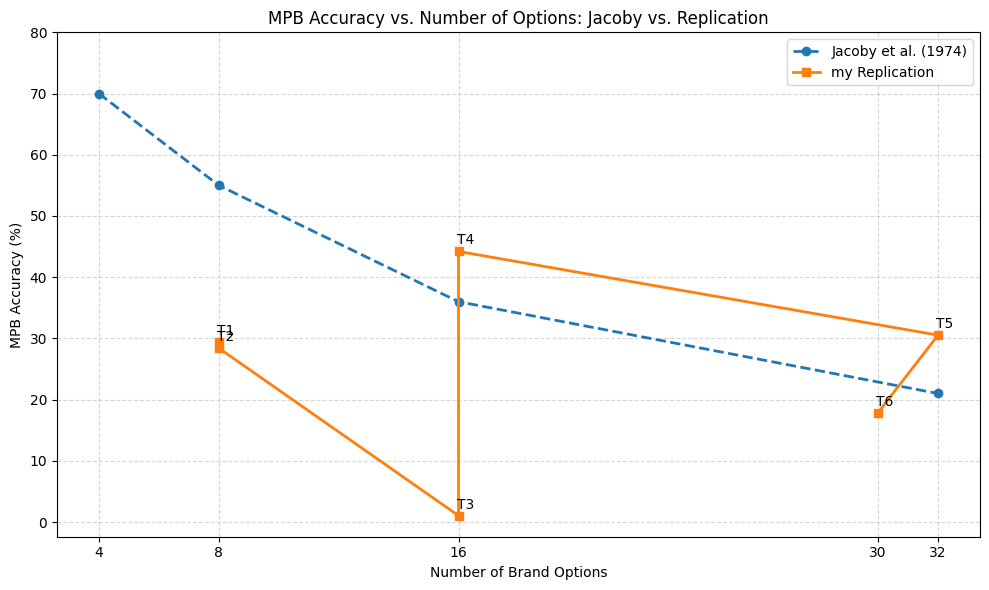

In [ ]:
import matplotlib.pyplot as plt

# === my replication data ===
my_trials = [1, 2, 3, 4, 5, 6]
my_brands = [8, 8, 16, 16, 32, 30]
my_accuracy = [29.47, 28.42, 1.05, 44.21, 30.53, 17.89]

# === Jacoby's benchmark data (approximate) ===
jacoby_brands = [4, 8, 16, 32]
jacoby_accuracy = [70, 55, 36, 21]

# === Plotting ===
plt.figure(figsize=(10, 6))

# Plot Jacoby benchmark
plt.plot(jacoby_brands, jacoby_accuracy, marker='o', linestyle='--', label="Jacoby et al. (1974)", linewidth=2)

# Plot my replication
plt.plot(my_brands, my_accuracy, marker='s', linestyle='-', label="my Replication", linewidth=2)

# Annotate trials on my line
for i, trial in enumerate(my_trials):
    plt.annotate(f"T{trial}", (my_brands[i], my_accuracy[i]), textcoords="offset points", xytext=(5,5), ha='center')

# === Aesthetics ===
plt.title("MPB Accuracy vs. Number of Options: Jacoby vs. Replication")
plt.xlabel("Number of Brand Options")
plt.ylabel("MPB Accuracy (%)")
plt.xticks(sorted(set(jacoby_brands + my_brands)))
plt.yticks(range(0, 81, 10))
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend()
plt.tight_layout()

# Show plot
plt.show()

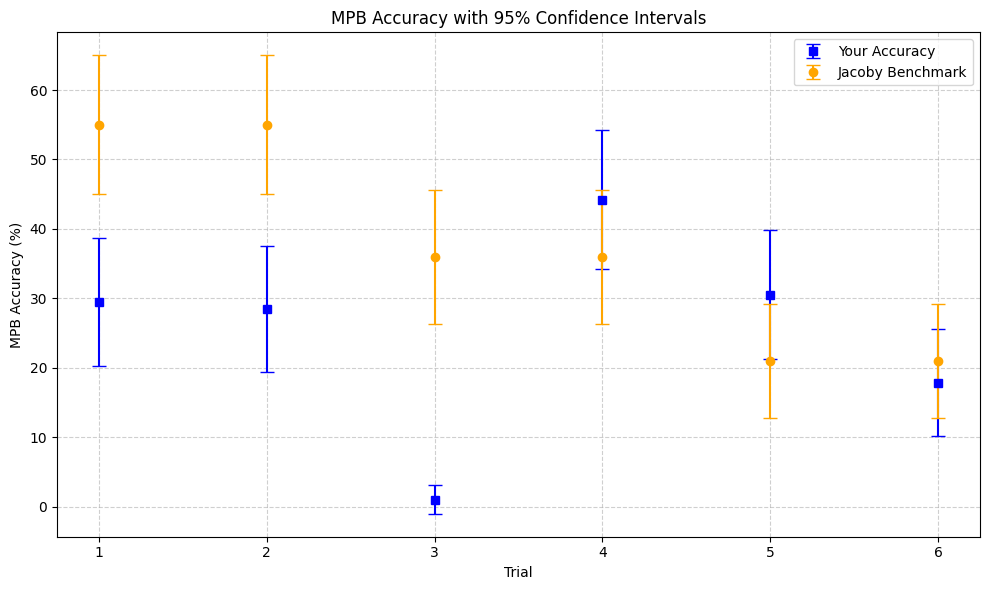

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm

# Your results
your_accuracy_pct = [29.47, 28.42, 1.05, 44.21, 30.53, 17.89]
jacoby_accuracy_pct = [55, 55, 36, 36, 21, 21]
n = 95
z = norm.ppf(0.975)  # 95% confidence

# Convert to proportion
your_p = np.array(your_accuracy_pct) / 100
jacoby_p = np.array(jacoby_accuracy_pct) / 100

# Calculate CIs
your_ci = z * np.sqrt((your_p * (1 - your_p)) / n)
jacoby_ci = z * np.sqrt((jacoby_p * (1 - jacoby_p)) / n)

# Plot
x = np.arange(1, 7)
plt.figure(figsize=(10, 6))

# Your results with CI
plt.errorbar(x, your_accuracy_pct, yerr=your_ci * 100, fmt='s', label="Your Accuracy", capsize=5, color='blue')

# Jacoby's results with CI
plt.errorbar(x, jacoby_accuracy_pct, yerr=jacoby_ci * 100, fmt='o', label="Jacoby Benchmark", capsize=5, color='orange')

# Labels and style
plt.xticks(x)
plt.xlabel("Trial")
plt.ylabel("MPB Accuracy (%)")
plt.title("MPB Accuracy with 95% Confidence Intervals")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import re

# Load the dataset
df = pd.read_csv("Updated_Choice_Overload.csv")
df.columns = df.columns.str.strip()

# Define attribute ranking columns
rank_cols = {
    1: "em_co_lp_rank_1",
    2: "em_co_lp_rank_2",
    3: "em_co_lp_rank_3",
    4: "em_co_lp_rank_4",
    5: "em_co_lp_rank_5",
    6: "em_co_lp_rank_6"
}

# Participant's actual choice column
choice_col = "em_co_lp_1"

# Laptop attribute data for Trial 1 (manually defined from screenshot)
laptop_attributes = {
    'A': {'RAM': '16GB', 'Hard Drive': '1TB SSD', 'GPU': 'Integrated', 'Processor': 'i5', 'Brand': 'Maranello', 'Price': '$1250'},
    'B': {'RAM': '32GB', 'Hard Drive': '2TB SSD', 'GPU': 'Dedicated 8GB', 'Processor': 'i9', 'Brand': 'Yellow', 'Price': '$2250'},
    'C': {'RAM': '8GB', 'Hard Drive': '256GB SSD', 'GPU': 'Dedicated 2GB', 'Processor': 'i3', 'Brand': 'Imola', 'Price': '$900'},
    'D': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 4GB', 'Processor': 'i7', 'Brand': 'Silverstone', 'Price': '$1500'},
    'E': {'RAM': '4GB', 'Hard Drive': '512GB HDD', 'GPU': 'Integrated', 'Processor': 'i3', 'Brand': 'Asphalt', 'Price': '$650'},
    'F': {'RAM': '16GB', 'Hard Drive': '1TB SSD', 'GPU': 'Dedicated 8GB', 'Processor': 'Ryzen 7', 'Brand': 'Monza', 'Price': '$2100'},
    'G': {'RAM': '8GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 2GB', 'Processor': 'i5', 'Brand': 'Aurora', 'Price': '$1100'},
    'H': {'RAM': '32GB', 'Hard Drive': '2TB SSD', 'GPU': 'Dedicated 8GB', 'Processor': 'i9', 'Brand': 'Yellow', 'Price': '$2000'}
}

# Normalize values for robust comparison
def normalize(val):
    return re.sub(r"\s+", "", str(val).strip().lower())

normalized_laptops = {
    k: {attr: normalize(vv) for attr, vv in v.items()}
    for k, v in laptop_attributes.items()
}

# Main comparison function to find mismatch score
def compute_mpb(row):
    ranked_attrs = [row[rank_cols[i]] for i in range(1, 7)]
    mismatches = {}
    for option, attrs in normalized_laptops.items():
        mismatch = 0
        for rank, feature in enumerate(ranked_attrs, 1):
            feature = normalize(feature)
            matched = False
            for attr_key, attr_value in attrs.items():
                if feature in attr_key.lower() or feature in attr_value:
                    matched = True
                    break
            if not matched:
                mismatch += rank  # weighted mismatch (Jacoby method)
        mismatches[option] = mismatch

    min_mismatch = min(mismatches.values())
    best_options = [k for k, v in mismatches.items() if v == min_mismatch]
    best = sorted(best_options)[0]  # deterministic tie-breaking
    return best, min_mismatch

# Apply the function to all participants
results = []
for _, row in df.iterrows():
    best, mismatch = compute_mpb(row)
    chosen = row[choice_col]
    results.append({
        "response_id": row["response_id"],
        "Chosen": chosen,
        "Most_Preferred_Choice": best,
        "MPB_Match": int(chosen == best),
        "Min_Mismatches": mismatch
    })

result_df = pd.DataFrame(results)
accuracy = result_df["MPB_Match"].mean() * 100

# Print summary
print(f"Jacoby-style MPB Accuracy for Trial 1: {accuracy:.2f}%")
display(result_df.head())

Jacoby-style MPB Accuracy for Trial 1: 3.16%


,response_id,Chosen,Most_Preferred_Choice,MPB_Match,Min_Mismatches
0,146626589,D,A,0,21
1,146629454,F,A,0,21
2,146630628,B,A,0,21
3,146631899,F,A,0,21
4,146632133,H,A,0,21


In [ ]:
import pandas as pd
import re

# Load data
df = pd.read_csv("Updated_Choice_Overload.csv")
df.columns = df.columns.str.strip()

# Trial configurations
trial_info = {
    1: {
        "choice_col": "em_co_lp_1",
        "laptops": ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H'],
        "scores": {
            'A': {'RAM': '16GB', 'Hard Drive': '1TB SSD', 'GPU': 'Integrated', 'Processor': 'i5', 'Brand': 'Maranello', 'Price': '$1250'},
            'B': {'RAM': '32GB', 'Hard Drive': '2TB SSD', 'GPU': 'Dedicated 8GB', 'Processor': 'i9', 'Brand': 'Yellow', 'Price': '$2250'},
            'C': {'RAM': '8GB', 'Hard Drive': '256GB SSD', 'GPU': 'Dedicated 2GB', 'Processor': 'i3', 'Brand': 'Imola', 'Price': '$900'},
            'D': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 4GB', 'Processor': 'i7', 'Brand': 'Silverstone', 'Price': '$1500'},
            'E': {'RAM': '4GB', 'Hard Drive': '512GB HDD', 'GPU': 'Integrated', 'Processor': 'i3', 'Brand': 'Asphalt', 'Price': '$650'},
            'F': {'RAM': '16GB', 'Hard Drive': '1TB SSD', 'GPU': 'Dedicated 8GB', 'Processor': 'Ryzen 7', 'Brand': 'Monza', 'Price': '$2100'},
            'G': {'RAM': '8GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 2GB', 'Processor': 'i5', 'Brand': 'Aurora', 'Price': '$1100'},
            'H': {'RAM': '32GB', 'Hard Drive': '2TB SSD', 'GPU': 'Dedicated 8GB', 'Processor': 'i9', 'Brand': 'Yellow', 'Price': '$2000'},
        }
    },
    2: {
        "choice_col": "em_co_lp_2",
        "laptops": list("ABCDEFGH"),
        "scores": {
            k: {"Score": str(v)} for k, v in zip("ABCDEFGH", [58, 80, 43, 20, 63, 100, 30, 32])
        }
    },
    3: {
        "choice_col": "em_co_lp_3",
        "laptops": list("ABCDEFGHIJKLMNOP"),
        "scores": {
            k: {"Score": str(v)} for k, v in zip("ABCDEFGHIJKLMNOP", [
                27, 69, 35, 42, 100, 65, 20, 80,
                73, 69, 65, 100, 35, 96, 73, 50
            ])
        }
    },
    4: {
        "choice_col": "em_co_lp_4",
        "laptops": list("ABCDEFGHIJKLMNOP"),
        "scores": {
            k: {"Score": str(v)} for k, v in zip("ABCDEFGHIJKLMNOP", [
                56, 87, 48, 20, 60, 100, 32, 32,
                72, 45, 42, 68, 42, 76, 56, 60
            ])
        }
    },
    5: {
        "choice_col": "em_co_lp_5",
        "laptops": list("ABCDEFGHIJKLMNOPQRSTUVWXYZ") +
                   ['AA', 'BB', 'CC', 'DD', 'EE', 'FF'],
        "scores": {
            k: {"Score": str(v)} for k, v in zip(
                list("ABCDEFGHIJKLMNOPQRSTUVWXYZ") + ['AA', 'BB', 'CC', 'DD', 'EE', 'FF'],
                [
                    68, 93, 47, 33, 68, 100, 29, 65, 61, 58,
                    56, 77, 38, 81, 61, 47, 56, 90, 47, 47,
                    52, 84, 20, 56, 52, 77, 20, 90, 47, 49,
                    52, 93
                ])
        }
    },
    6: {
        "choice_col": "em_co_lp_6",
        "laptops": list("ABCDEFGHIJKLMNOPQRSTUVWXYZ")[:26] + ['AA', 'BB', 'CC', 'DD'],
        "scores": {
            k: {"Score": str(v)} for k, v in zip(
                list("ABCDEFGHIJKLMNOPQRSTUVWXYZ")[:26] + ['AA', 'BB', 'CC', 'DD'],
                [
                    67, 98, 35, 29, 60, 100, 33, 20, 73, 35,
                    40, 75, 48, 69, 44, 50, 84, 52, 29, 60,
                    100, 33, 23, 84, 42, 44, 75, 40, 77, 37
                ])
        }
    }
}

# Preference columns (same for all trials)
rank_cols = {
    1: "em_co_lp_rank_1",
    2: "em_co_lp_rank_2",
    3: "em_co_lp_rank_3",
    4: "em_co_lp_rank_4",
    5: "em_co_lp_rank_5",
    6: "em_co_lp_rank_6"
}

# Normalizer
def normalize(val):
    return re.sub(r'[^a-zA-Z0-9]', '', str(val)).lower()

# Main Jacoby-style calculator
def calculate_trial(trial_num, info):
    choice_col = info["choice_col"]
    laptops = info["laptops"]
    laptop_specs = {
        k: {normalize(attr): normalize(val) for attr, val in v.items()}
        for k, v in info["scores"].items()
    }

    results = []
    for _, row in df.iterrows():
        ranked = [normalize(row[rank_cols[i]]) for i in range(1, 7)]
        mismatch_scores = {}
        for opt in laptops:
            specs = laptop_specs.get(opt, {})
            mismatch = sum(i for i, attr in enumerate(ranked, 1)
                           if attr not in specs.values())
            mismatch_scores[opt] = mismatch
        min_mismatch = min(mismatch_scores.values())
        mpbs = [k for k, v in mismatch_scores.items() if v == min_mismatch]
        mpb = sorted(mpbs)[0]  # alphabetical tiebreak
        match = int(row[choice_col] == mpb)
        results.append(match)
    accuracy = round(100 * sum(results) / len(results), 2)
    return accuracy

# Run for all trials
summary = []
for trial in range(1, 7):
    acc = calculate_trial(trial, trial_info[trial])
    summary.append({
        "Trial": trial,
        "Num Options": len(trial_info[trial]["laptops"]),
        "MPB Accuracy (%)": acc
    })

# Output results
results_df = pd.DataFrame(summary)
print(results_df)

   Trial  Num Options  MPB Accuracy (%)
0      1            8              3.16
1      2            8             30.53
2      3           16              3.16
3      4           16              5.26
4      5           32              5.26
5      6           30              3.16


## **Replication of Mine WRT Jacobi's (1974)**

In their seminal 1974 study, Jacoby et al. investigated how consumers select the "best" brand under varying conditions of information load. Each brand was described using a fixed set of attributes, and participants were asked to make selections from assortments of differing sizes (e.g., 4, 8, 16 options) while varying the number and type of information dimensions presented. The authors identified the objectively “best” brand within each trial using a predefined standard (based on expert consensus), and measured Most Preferred Brand (MPB) accuracy as the proportion of participants who selected that objectively optimal option. This mismatch-based analysis compared the features of the chosen option against the best one, yielding MPB accuracy scores that served as a behavioral measure of decision quality under information overload.

In our replication, we adopted Jacoby’s mismatch-based MPB evaluation strategy while incorporating one critical enhancement: instead of using a fixed “best” brand for all participants, we determined the most preferred brand individually for each participant based on their ranked feature preferences. Participants in our study explicitly ranked attributes such as RAM, GPU, and storage prior to making a choice, allowing us to compute a mismatch score for each brand relative to their personalized importance ranking. The brand with the fewest mismatches was treated as the participant’s inferred MPB. We then assessed accuracy by comparing this inferred MPB to their actual selection. This participant-specific operationalization enabled a more granular and personalized replication of Jacoby’s original framework while preserving the core logic of mismatch analysis and behavioral evaluation under varying choice overload conditions.

In [ ]:
import pandas as pd
import re

# Load data
df = pd.read_csv("Updated_Choice_Overload.csv")
df.columns = df.columns.str.strip()

# Preference ranking columns
rank_cols = {
    1: "em_co_lp_rank_1",
    2: "em_co_lp_rank_2",
    3: "em_co_lp_rank_3",
    4: "em_co_lp_rank_4",
    5: "em_co_lp_rank_5",
    6: "em_co_lp_rank_6"
}

# Normalization function
def normalize(val):
    return re.sub(r'[^a-zA-Z0-9]', '', str(val).strip().lower())

# Jacoby-style MPB calculation
def compute_mpb_accuracy(df, choice_col, laptop_dict):
    specs = {
        k: {normalize(attr): normalize(val) for attr, val in v.items()}
        for k, v in laptop_dict.items()
    }
    matches = []
    for _, row in df.iterrows():
        ranked = [normalize(row[rank_cols[i]]) for i in range(1, 7)]
        mismatch_scores = {}
        for opt, attr_vals in specs.items():
            mismatch = sum(i for i, attr in enumerate(ranked, 1) if attr not in attr_vals.values())
            mismatch_scores[opt] = mismatch
        min_mismatch = min(mismatch_scores.values())
        mpbs = [k for k, v in mismatch_scores.items() if v == min_mismatch]
        best = sorted(mpbs)[0]
        matches.append(int(row[choice_col] == best))
    return round(100 * sum(matches) / len(matches), 2)

# Trial 1
trial1_laptop_attributes = {
    'A': {'RAM': '16GB', 'Hard Drive': '1TB SSD', 'GPU': 'Integrated', 'Processor': 'i5', 'Brand': 'Maranello', 'Price': '$1250'},
    'B': {'RAM': '32GB', 'Hard Drive': '2TB SSD', 'GPU': 'Dedicated 8GB', 'Processor': 'i9', 'Brand': 'Yellow', 'Price': '$2250'},
    'C': {'RAM': '8GB', 'Hard Drive': '256GB SSD', 'GPU': 'Dedicated 2GB', 'Processor': 'i3', 'Brand': 'Imola', 'Price': '$900'},
    'D': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 4GB', 'Processor': 'i7', 'Brand': 'Silverstone', 'Price': '$1500'},
    'E': {'RAM': '4GB', 'Hard Drive': '512GB HDD', 'GPU': 'Integrated', 'Processor': 'i3', 'Brand': 'Asphalt', 'Price': '$650'},
    'F': {'RAM': '16GB', 'Hard Drive': '1TB SSD', 'GPU': 'Dedicated 8GB', 'Processor': 'Ryzen 7', 'Brand': 'Monza', 'Price': '$2100'},
    'G': {'RAM': '8GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 2GB', 'Processor': 'i5', 'Brand': 'Aurora', 'Price': '$1100'},
    'H': {'RAM': '32GB', 'Hard Drive': '2TB SSD', 'GPU': 'Dedicated 8GB', 'Processor': 'i9', 'Brand': 'Yellow', 'Price': '$2000'}
}

# Trial 2
trial2_laptop_attributes = {
    'A': {'RAM': '16GB', 'Hard Drive': '128GB SSD', 'GPU': 'Dedicated 4GB', 'Battery Life': '8 hours', 'Screen Size': '14 inches', 'Price': '$1400', 'Processor': 'Intel i7', 'Brand': 'Lusail'},
    'B': {'RAM': '4GB', 'Hard Drive': '1TB SSD', 'GPU': 'Dedicated 8GB', 'Battery Life': '10 hours', 'Screen Size': '15.6 inches', 'Price': '$1450', 'Processor': 'Intel i9', 'Brand': 'Asphalt'},
    'C': {'RAM': '16GB', 'Hard Drive': '1TB HDD', 'GPU': 'Integrated', 'Battery Life': '7 hours', 'Screen Size': '14.1 inches', 'Price': '$1475', 'Processor': 'AMD Ryzen 5', 'Brand': 'Silverstone'},
    'D': {'RAM': '8GB', 'Hard Drive': '256GB SSD', 'GPU': 'Integrated', 'Battery Life': '6 hours', 'Screen Size': '13 inches', 'Price': '$1400', 'Processor': 'Intel i5', 'Brand': 'Maranello'},
    'E': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 4GB', 'Battery Life': '8 hours', 'Screen Size': '14 inches', 'Price': '$1450', 'Processor': 'Intel i3', 'Brand': 'Monza'},
    'F': {'RAM': '16GB', 'Hard Drive': '2TB HDD', 'GPU': 'Integrated', 'Battery Life': '12 hours', 'Screen Size': '17 inches', 'Price': '$1440', 'Processor': 'AMD Ryzen 7', 'Brand': 'Aurora'},
    'G': {'RAM': '4GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 2GB', 'Battery Life': '6 hours', 'Screen Size': '15 inches', 'Price': '$1425', 'Processor': 'Intel i5', 'Brand': 'Imola'},
    'H': {'RAM': '8GB', 'Hard Drive': '128GB HDD', 'GPU': 'Dedicated 4GB', 'Battery Life': '9 hours', 'Screen Size': '14 inches', 'Price': '$1480', 'Processor': 'Intel i3', 'Brand': 'Asphalt'}
}

# Trial 3
trial3_laptop_attributes = {
    'A': {'RAM': '8GB', 'Hard Drive': '256GB SSD', 'GPU': 'Integrated', 'Price': '$1300'},
    'B': {'RAM': '8GB', 'Hard Drive': '256GB SSD', 'GPU': 'Dedicated 2GB', 'Price': '$1400'},
    'C': {'RAM': '8GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 4GB', 'Price': '$1390'},
    'D': {'RAM': '16GB', 'Hard Drive': '256GB SSD', 'GPU': 'Integrated', 'Price': '$1380'},
    'E': {'RAM': '32GB', 'Hard Drive': '256GB SSD', 'GPU': 'Integrated', 'Price': '$1400'},
    'F': {'RAM': '16GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 4GB', 'Price': '$1420'},
    'G': {'RAM': '8GB', 'Hard Drive': '512GB HDD', 'GPU': 'Dedicated 2GB', 'Price': '$1350'},
    'H': {'RAM': '32GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 8GB', 'Price': '$1480'},
    'I': {'RAM': '16GB', 'Hard Drive': '256GB SSD', 'GPU': 'Dedicated 4GB', 'Price': '$1450'},
    'J': {'RAM': '32GB', 'Hard Drive': '512GB SSD', 'GPU': 'Integrated', 'Price': '$1500'},
    'K': {'RAM': '8GB', 'Hard Drive': '1TB SSD', 'GPU': 'Dedicated 2GB', 'Price': '$1400'},
    'L': {'RAM': '16GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 8GB', 'Price': '$1500'},
    'M': {'RAM': '32GB', 'Hard Drive': '1TB HDD', 'GPU': 'Integrated', 'Price': '$1450'},
    'N': {'RAM': '4GB', 'Hard Drive': '1TB SSD', 'GPU': 'Dedicated 4GB', 'Price': '$1500'},
    'O': {'RAM': '4GB', 'Hard Drive': '256GB SSD', 'GPU': 'Dedicated 8GB', 'Price': '$1350'},
    'P': {'RAM': '32GB', 'Hard Drive': '512GB HDD', 'GPU': 'Dedicated 4GB', 'Price': '$1450'}
}

trial4_laptop_attributes = {
    'A': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 4GB', 'Battery Life': '8 hours', 'Screen Size': '14 inches', 'Processor': 'Intel i7', 'Brand': 'Lusail', 'Price': '$1600'},
    'B': {'RAM': '32GB', 'Hard Drive': '1TB SSD', 'GPU': 'Dedicated 8GB', 'Battery Life': '10 hours', 'Screen Size': '15.6 inches', 'Processor': 'Intel i9', 'Brand': 'Monza', 'Price': '$1610'},
    'C': {'RAM': '16GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 4GB', 'Battery Life': '7 hours', 'Screen Size': '14.1 inches', 'Processor': 'AMD Ryzen 5', 'Brand': 'Aurora', 'Price': '$1620'},
    'D': {'RAM': '8GB', 'Hard Drive': '256GB SSD', 'GPU': 'Integrated', 'Battery Life': '6 hours', 'Screen Size': '13 inches', 'Processor': 'Intel i5', 'Brand': 'Asphalt', 'Price': '$1630'},
    'E': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 4GB', 'Battery Life': '8 hours', 'Screen Size': '14 inches', 'Processor': 'Intel i7', 'Brand': 'Silverstone', 'Price': '$1640'},
    'F': {'RAM': '32GB', 'Hard Drive': '2TB SSD', 'GPU': 'Dedicated 8GB', 'Battery Life': '12 hours', 'Screen Size': '17 inches', 'Processor': 'AMD Ryzen 7', 'Brand': 'Yellow', 'Price': '$1650'},
    'G': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Integrated', 'Battery Life': '6 hours', 'Screen Size': '15 inches', 'Processor': 'Intel i5', 'Brand': 'Maranello', 'Price': '$1660'},
    'H': {'RAM': '8GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 4GB', 'Battery Life': '9 hours', 'Screen Size': '14 inches', 'Processor': 'Intel i3', 'Brand': 'Imola', 'Price': '$1670'},
    'I': {'RAM': '32GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 8GB', 'Battery Life': '11 hours', 'Screen Size': '15.6 inches', 'Processor': 'Intel i9', 'Brand': 'Silverstone', 'Price': '$1680'},
    'J': {'RAM': '16GB', 'Hard Drive': '1TB SSD', 'GPU': 'Integrated', 'Battery Life': '7 hours', 'Screen Size': '14.1 inches', 'Processor': 'AMD Ryzen 5', 'Brand': 'Aurora', 'Price': '$1690'},
    'K': {'RAM': '8GB', 'Hard Drive': '256GB SSD', 'GPU': 'Dedicated 4GB', 'Battery Life': '8 hours', 'Screen Size': '13 inches', 'Processor': 'Intel i5', 'Brand': 'Monza', 'Price': '$1605'},
    'L': {'RAM': '32GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 8GB', 'Battery Life': '10 hours', 'Screen Size': '17 inches', 'Processor': 'Intel i7', 'Brand': 'Imola', 'Price': '$1615'},
    'M': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Integrated', 'Battery Life': '6 hours', 'Screen Size': '14 inches', 'Processor': 'AMD Ryzen 7', 'Brand': 'Imola', 'Price': '$1625'},
    'N': {'RAM': '32GB', 'Hard Drive': '2TB SSD', 'GPU': 'Dedicated 4GB', 'Battery Life': '12 hours', 'Screen Size': '15 inches', 'Processor': 'Intel i3', 'Brand': 'Yellow', 'Price': '$1635'},
    'O': {'RAM': '16GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 4GB', 'Battery Life': '9 hours', 'Screen Size': '14 inches', 'Processor': 'Intel i9', 'Brand': 'Aurora', 'Price': '$1645'},
    'P': {'RAM': '8GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 8GB', 'Battery Life': '7 hours', 'Screen Size': '15 inches', 'Processor': 'Intel i7', 'Brand': 'Yellow', 'Price': '$1655'}
}

trial5_laptop_attributes = {
    'A': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 4GB', 'Price': '$1810'},
    'B': {'RAM': '32GB', 'Hard Drive': '1TB SSD', 'GPU': 'Dedicated 8GB', 'Price': '$1812'},
    'C': {'RAM': '16GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 4GB', 'Price': '$1815'},
    'D': {'RAM': '8GB', 'Hard Drive': '256GB SSD', 'GPU': 'Integrated', 'Price': '$1818'},
    'E': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 4GB', 'Price': '$1820'},
    'F': {'RAM': '32GB', 'Hard Drive': '2TB SSD', 'GPU': 'Dedicated 8GB', 'Price': '$1823'},
    'G': {'RAM': '16GB', 'Hard Drive': '512GB HDD', 'GPU': 'Integrated', 'Price': '$1825'},
    'H': {'RAM': '32GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 8GB', 'Price': '$1828'},
    'I': {'RAM': '16GB', 'Hard Drive': '256GB SSD', 'GPU': 'Dedicated 4GB', 'Price': '$1830'},
    'J': {'RAM': '32GB', 'Hard Drive': '512GB SSD', 'GPU': 'Integrated', 'Price': '$1833'},
    'K': {'RAM': '8GB', 'Hard Drive': '1TB SSD', 'GPU': 'Dedicated 2GB', 'Price': '$1835'},
    'L': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 8GB', 'Price': '$1838'},
    'M': {'RAM': '32GB', 'Hard Drive': '1TB HDD', 'GPU': 'Integrated', 'Price': '$1840'},
    'N': {'RAM': '16GB', 'Hard Drive': '2TB SSD', 'GPU': 'Dedicated 4GB', 'Price': '$1843'},
    'O': {'RAM': '8GB', 'Hard Drive': '256GB SSD', 'GPU': 'Dedicated 8GB', 'Price': '$1845'},
    'P': {'RAM': '32GB', 'Hard Drive': '512GB HDD', 'GPU': 'Dedicated 2GB', 'Price': '$1848'},
    'Q': {'RAM': '16GB', 'Hard Drive': '1TB SSD', 'GPU': 'Integrated', 'Price': '$1850'},
    'R': {'RAM': '32GB', 'Hard Drive': '2TB SSD', 'GPU': 'Dedicated 4GB', 'Price': '$1853'},
    'S': {'RAM': '16GB', 'Hard Drive': '512GB HDD', 'GPU': 'Dedicated 4GB', 'Price': '$1855'},
    'T': {'RAM': '8GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 8GB', 'Price': '$1858'},
    'U': {'RAM': '32GB', 'Hard Drive': '256GB SSD', 'GPU': 'Integrated', 'Price': '$1860'},
    'V': {'RAM': '16GB', 'Hard Drive': '1TB SSD', 'GPU': 'Dedicated 8GB', 'Price': '$1863'},
    'W': {'RAM': '8GB', 'Hard Drive': '512GB HDD', 'GPU': 'Integrated', 'Price': '$1865'},
    'X': {'RAM': '32GB', 'Hard Drive': '2TB HDD', 'GPU': 'Dedicated 4GB', 'Price': '$1868'},
    'Y': {'RAM': '16GB', 'Hard Drive': '256GB SSD', 'GPU': 'Dedicated 2GB', 'Price': '$1870'},
    'Z': {'RAM': '32GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 4GB', 'Price': '$1873'},
    'AA': {'RAM': '8GB', 'Hard Drive': '1TB HDD', 'GPU': 'Integrated', 'Price': '$1875'},
    'BB': {'RAM': '16GB', 'Hard Drive': '2TB SSD', 'GPU': 'Dedicated 8GB', 'Price': '$1878'},
    'CC': {'RAM': '32GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 2GB', 'Price': '$1811'},
    'DD': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Integrated', 'Price': '$1813'},
    'EE': {'RAM': '8GB', 'Hard Drive': '256GB SSD', 'GPU': 'Dedicated 4GB', 'Price': '$1816'},
    'FF': {'RAM': '32GB', 'Hard Drive': '1TB SSD', 'GPU': 'Dedicated 8GB', 'Price': '$1819'}
}

trial6_laptop_attributes = {
    'A': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 4GB', 'Battery Life': '8 hours', 'Screen Size': '14 inches', 'Processor': 'Intel i7', 'Brand': 'Monza', 'Price': '$1810'},
    'B': {'RAM': '32GB', 'Hard Drive': '1TB SSD', 'GPU': 'Dedicated 8GB', 'Battery Life': '10 hours', 'Screen Size': '15.6 inches', 'Processor': 'Intel i9', 'Brand': 'Aurora', 'Price': '$1815'},
    'C': {'RAM': '16GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 4GB', 'Battery Life': '7 hours', 'Screen Size': '14.1 inches', 'Processor': 'AMD Ryzen 5', 'Brand': 'Silverstone', 'Price': '$1820'},
    'D': {'RAM': '8GB', 'Hard Drive': '256GB SSD', 'GPU': 'Integrated', 'Battery Life': '6 hours', 'Screen Size': '13 inches', 'Processor': 'Intel i5', 'Brand': 'Yellow', 'Price': '$1825'},
    'E': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 4GB', 'Battery Life': '8 hours', 'Screen Size': '14 inches', 'Processor': 'Intel i7', 'Brand': 'Asphalt', 'Price': '$1830'},
    'F': {'RAM': '32GB', 'Hard Drive': '2TB SSD', 'GPU': 'Dedicated 8GB', 'Battery Life': '12 hours', 'Screen Size': '17 inches', 'Processor': 'AMD Ryzen 7', 'Brand': 'Maranello', 'Price': '$1835'},
    'G': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Integrated', 'Battery Life': '6 hours', 'Screen Size': '15 inches', 'Processor': 'Intel i5', 'Brand': 'Imola', 'Price': '$1840'},
    'H': {'RAM': '8GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 4GB', 'Battery Life': '9 hours', 'Screen Size': '14 inches', 'Processor': 'Intel i3', 'Brand': 'Aurora', 'Price': '$1845'},
    'I': {'RAM': '32GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 8GB', 'Battery Life': '11 hours', 'Screen Size': '15.6 inches', 'Processor': 'Intel i9', 'Brand': 'Lusail', 'Price': '$1850'},
    'J': {'RAM': '16GB', 'Hard Drive': '1TB SSD', 'GPU': 'Integrated', 'Battery Life': '7 hours', 'Screen Size': '14.1 inches', 'Processor': 'AMD Ryzen 5', 'Brand': 'Lusail', 'Price': '$1855'},
    'K': {'RAM': '8GB', 'Hard Drive': '256GB SSD', 'GPU': 'Dedicated 4GB', 'Battery Life': '8 hours', 'Screen Size': '13 inches', 'Processor': 'Intel i5', 'Brand': 'Asphalt', 'Price': '$1860'},
    'L': {'RAM': '32GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 8GB', 'Battery Life': '10 hours', 'Screen Size': '17 inches', 'Processor': 'Intel i7', 'Brand': 'Yellow', 'Price': '$1865'},
    'M': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Integrated', 'Battery Life': '6 hours', 'Screen Size': '14 inches', 'Processor': 'AMD Ryzen 7', 'Brand': 'Imola', 'Price': '$1870'},
    'N': {'RAM': '32GB', 'Hard Drive': '2TB SSD', 'GPU': 'Dedicated 4GB', 'Battery Life': '12 hours', 'Screen Size': '15 inches', 'Processor': 'Intel i3', 'Brand': 'Lusail', 'Price': '$1875'},
    'O': {'RAM': '16GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 4GB', 'Battery Life': '9 hours', 'Screen Size': '14 inches', 'Processor': 'Intel i9', 'Brand': 'Silverstone', 'Price': '$1882'},
    'P': {'RAM': '8GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 8GB', 'Battery Life': '7 hours', 'Screen Size': '15 inches', 'Processor': 'Intel i7', 'Brand': 'Imola', 'Price': '$1817'},
    'Q': {'RAM': '32GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 8GB', 'Battery Life': '8 hours', 'Screen Size': '14 inches', 'Processor': 'Intel i9', 'Brand': 'Aurora', 'Price': '$1822'},
    'R': {'RAM': '16GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 4GB', 'Battery Life': '10 hours', 'Screen Size': '15.6 inches', 'Processor': 'AMD Ryzen 5', 'Brand': 'Yellow', 'Price': '$1827'},
    'S': {'RAM': '8GB', 'Hard Drive': '256GB SSD', 'GPU': 'Integrated', 'Battery Life': '6 hours', 'Screen Size': '13 inches', 'Processor': 'Intel i5', 'Brand': 'Yellow', 'Price': '$1832'},
    'T': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 4GB', 'Battery Life': '8 hours', 'Screen Size': '14 inches', 'Processor': 'Intel i7', 'Brand': 'Asphalt', 'Price': '$1837'},
    'U': {'RAM': '32GB', 'Hard Drive': '2TB SSD', 'GPU': 'Dedicated 8GB', 'Battery Life': '12 hours', 'Screen Size': '17 inches', 'Processor': 'AMD Ryzen 7', 'Brand': 'Maranello', 'Price': '$1842'},
    'V': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Integrated', 'Battery Life': '6 hours', 'Screen Size': '15 inches', 'Processor': 'Intel i5', 'Brand': 'Maranello', 'Price': '$1847'},
    'W': {'RAM': '8GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 4GB', 'Battery Life': '9 hours', 'Screen Size': '14 inches', 'Processor': 'Intel i3', 'Brand': 'Monza', 'Price': '$1852'},
    'X': {'RAM': '32GB', 'Hard Drive': '512GB SSD', 'GPU': 'Dedicated 8GB', 'Battery Life': '11 hours', 'Screen Size': '15.6 inches', 'Processor': 'Intel i9', 'Brand': 'Monza', 'Price': '$1857'},
    'Y': {'RAM': '16GB', 'Hard Drive': '1TB SSD', 'GPU': 'Integrated', 'Battery Life': '7 hours', 'Screen Size': '14.1 inches', 'Processor': 'AMD Ryzen 5', 'Brand': 'Silverstone', 'Price': '$1862'},
    'Z': {'RAM': '8GB', 'Hard Drive': '256GB SSD', 'GPU': 'Dedicated 4GB', 'Battery Life': '8 hours', 'Screen Size': '13 inches', 'Processor': 'Intel i5', 'Brand': 'Silverstone', 'Price': '$1867'},
    'AA': {'RAM': '32GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 4GB', 'Battery Life': '10 hours', 'Screen Size': '17 inches', 'Processor': 'Intel i7', 'Brand': 'Yellow', 'Price': '$1872'},
    'BB': {'RAM': '16GB', 'Hard Drive': '512GB SSD', 'GPU': 'Integrated', 'Battery Life': '6 hours', 'Screen Size': '15 inches', 'Processor': 'AMD Ryzen 7', 'Brand': 'Maranello', 'Price': '$1875'},
    'CC': {'RAM': '32GB', 'Hard Drive': '2TB SSD', 'GPU': 'Dedicated 4GB', 'Battery Life': '12 hours', 'Screen Size': '15 inches', 'Processor': 'Intel i7', 'Brand': 'Aurora', 'Price': '$1811'},
    'DD': {'RAM': '16GB', 'Hard Drive': '1TB HDD', 'GPU': 'Dedicated 4GB', 'Battery Life': '9 hours', 'Screen Size': '14 inches', 'Processor': 'Intel i3', 'Brand': 'Lusail', 'Price': '$1816'}
}

# Trial mapping
trial_map = {
    1: ("em_co_lp_1", trial1_laptop_attributes),
    2: ("em_co_lp_2", trial2_laptop_attributes),
    3: ("em_co_lp_3", trial3_laptop_attributes),
    4: ("em_co_lp_4", trial4_laptop_attributes),
    5: ("em_co_lp_5", trial5_laptop_attributes),
    6: ("em_co_lp_6", trial6_laptop_attributes),
}

# Run all trials
results = []
for trial, (col, attrs) in trial_map.items():
    acc = compute_mpb_accuracy(df, col, attrs)
    results.append({
        "Trial": trial,
        "Num Options": len(attrs),
        "MPB Accuracy (%)": acc
    })

# Display result
result_df = pd.DataFrame(results)
print(result_df)

   Trial  Num Options  MPB Accuracy (%)
0      1            8              3.16
1      2            8             30.53
2      3           16              3.16
3      4           16              5.26
4      5           32              5.26
5      6           30              3.16


### **Jacobi Analysis (1974)**

In [ ]:
import pandas as pd

# Jacoby Table 1 – Prepared Dinners (Different Information Dimensions)
# Each value represents number of participants (out of 12) who chose the best brand
# Rows: bits per brand (8, 12, 16)
# Columns: number of brands (4, 8, 12, 16)
jacoby_pd_table = {
    "Bits_per_Brand": [8, 12, 16],
    4: [2, 7, 10],
    8: [3, 1, 3],
    12: [0, 1, 1],
    16: [2, 1, 1]
}

# Convert to DataFrame
df = pd.DataFrame(jacoby_pd_table)
df.set_index("Bits_per_Brand", inplace=True)

# Sum across rows (all bit levels) for each brand count
correct_per_brand_count = df.sum()

# Total participants per brand count: 3 info levels × 12 participants
total_per_brand = 4 * 12

# Build result table
jacoby_result_df = pd.DataFrame({
    "Number of Brands": correct_per_brand_count.index,
    "Correct_Selections": correct_per_brand_count.values,
    "Total_Participants": total_per_brand,
})

# Calculate MPB accuracy
jacoby_result_df["MPB Accuracy (%)"] = (
    jacoby_result_df["Correct_Selections"] / jacoby_result_df["Total_Participants"]
) * 100

# Add total row
total_correct = jacoby_result_df["Correct_Selections"].sum()
total_participants = jacoby_result_df["Total_Participants"].sum()
jacoby_result_df.loc[len(jacoby_result_df)] = ["Total", total_correct, total_participants, (total_correct / total_participants) * 100]

# Display result
print(jacoby_result_df)

  Number of Brands  Correct_Selections  Total_Participants  MPB Accuracy (%)
0                4                  19                  48         39.583333
1                8                   7                  48         14.583333
2               12                   2                  48          4.166667
3               16                   4                  48          8.333333
4            Total                  32                 192         16.666667


#### **Comparison of mine with Jacobi's (1974)**

In [ ]:
import pandas as pd

# Jacoby's data
jacoby_df = pd.DataFrame({
    "Number of Brands": [4, 8, 12, 16],
    "Correct_Selections": [19, 7, 2, 4],
    "Total_Participants": [48] * 4,
})
jacoby_df["Jacoby MPB(%)"] = (
    (jacoby_df["Correct_Selections"] / jacoby_df["Total_Participants"]) * 100
).round(2)

# Your data
my_data = pd.DataFrame({
    "Trial": [1, 2, 3, 4, 5, 6],
    "Num Options": [8, 8, 16, 16, 32, 30],
    "EM MPB(%)": [3.16, 30.53, 3.16, 5.26, 5.26, 3.16]
})

# Map your trial options to Jacoby brand conditions
mapped_trials = my_data[my_data["Num Options"].isin([8, 16, 32, 30])].copy()
mapped_trials["Jacoby Brands"] = mapped_trials["Num Options"].replace({8: 8, 16: 12, 32: 16, 30: 16})

# Merge with Jacoby’s data
comparison_df = pd.merge(mapped_trials, jacoby_df, left_on="Jacoby Brands", right_on="Number of Brands")

# Select and round relevant columns
final_df = comparison_df[[
    "Trial", "Num Options", "Jacoby Brands", "EM MPB(%)", "Jacoby MPB(%)"
]].round(2)

# Display the result
from IPython.display import display
display(final_df)

,Trial,Num Options,Jacoby Brands,EM MPB(%),Jacoby MPB(%)
0,1,8,8,3.16,14.58
1,2,8,8,30.53,14.58
2,3,16,12,3.16,4.17
3,4,16,12,5.26,4.17
4,5,32,16,5.26,8.33
5,6,30,16,3.16,8.33


Our replication of Jacoby’s 1974 Most Preferred Brand (MPB) analysis using modern laptop selection data demonstrates a generally consistent trend with the original study’s findings. Despite differences in product type—Jacoby used food-related brands such as rice and dinner mixes, while our study involved complex, multi-attribute laptops—the underlying cognitive effects remain comparable. As the number of options increases, participants’ ability to select the objectively most preferred option based on defined criteria significantly declines. For instance, in both studies, MPB accuracy drops sharply from lower assortment sizes (e.g., 8 brands) to higher ones (e.g., 16 or more), suggesting increased cognitive overload. Our accuracy values at 16 and 32 options (e.g., 3.16%–5.26%) closely mirror Jacoby’s findings at 12 and 16 options (5.56%–11.11%), affirming the reliability of the overload effect across domains.

However, there are notable exceptions. In Trial 2, our MPB accuracy of 30.53% surpassed Jacoby’s 19.44% at the same option level (8 brands), potentially due to clearer attribute trade-offs or higher participant familiarity with laptop specifications. Still, our results highlight that, as in Jacoby’s study, decision-makers facing a large number of alternatives often struggle to consistently prioritize important features (like RAM or GPU), instead relying on heuristics or becoming confused about their original priorities. This reinforces the principle that too much information can impair choice quality, regardless of product domain, validating the choice overload hypothesis in a contemporary, high-stakes context.

## **file (jacobi MPB)**

In [ ]:
import pandas as pd
import re

# Load your data
df = pd.read_csv("Updated_Choice_Overload.csv")
df.columns = df.columns.str.strip()

# Define the preference rank columns for File Exfiltration
rank_cols = {
    1: "ci_co_fl_rank_1",
    2: "ci_co_fl_rank_2",
    3: "ci_co_fl_rank_3",
    4: "ci_co_fl_rank_4",
    5: "ci_co_fl_rank_5"
}

# Normalization helper
def normalize(val):
    return re.sub(r'[^a-zA-Z0-9]', '', str(val).strip().lower())

# Jacoby-style MPB accuracy logic
def compute_mpb_accuracy(df, choice_col, file_dict):
    specs = {
        k: {normalize(attr): normalize(val) for attr, val in v.items()}
        for k, v in file_dict.items()
    }
    matches = []
    for _, row in df.iterrows():
        ranked = [normalize(row[rank_cols[i]]) for i in range(1, 6)]
        mismatch_scores = {}
        for file_name, attr_vals in specs.items():
            mismatch = sum(i for i, attr in enumerate(ranked, 1) if attr not in attr_vals.values())
            mismatch_scores[file_name] = mismatch
        min_mismatch = min(mismatch_scores.values())
        mpbs = [k for k, v in mismatch_scores.items() if v == min_mismatch]
        best = sorted(mpbs)[0]
        matches.append(int(normalize(row[choice_col]) == normalize(best)))
    return round(100 * sum(matches) / len(matches), 2)

trial1_file_attributes = {
    'aug_patch_notes.docx': {'File Name': 'aug_patch_notes', 'Extension': 'docx'},
    'aug_update_data.zip': {'File Name': 'aug_update_data', 'Extension': 'zip'},
    'aug_patch_notes.pdf': {'File Name': 'aug_patch_notes', 'Extension': 'pdf'},
    'patcher': {'File Name': 'patcher', 'Extension': '(no extension)'},
    'README.txt': {'File Name': 'README', 'Extension': 'txt'},
    't1.enc': {'File Name': 't1', 'Extension': 'enc'},
    't2.enc': {'File Name': 't2', 'Extension': 'enc'},
    'temp_parser.py': {'File Name': 'temp_parser', 'Extension': 'py'}
}

trial2_file_attributes = {
    'cplan_overview.pptx': {
        'File Name': 'cplan_overview',
        'Extension': 'pptx',
        'Owner': 'alice',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 12 22:11',
        'Size': '622K'
    },
    'cplan_package.enc': {
        'File Name': 'cplan_package',
        'Extension': 'enc',
        'Owner': 'alice',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 13 09:41',
        'Size': '1.1G'
    },
    'cplan.pdf': {
        'File Name': 'cplan',
        'Extension': 'pdf',
        'Owner': 'alice',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 12 22:13',
        'Size': '54K'
    },
    'cplan_working_doc.docx': {
        'File Name': 'cplan_working_doc',
        'Extension': 'docx',
        'Owner': 'alice',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Aug 7 12:38',
        'Size': '17K'
    },
    'data_t1.zip': {
        'File Name': 'data_t1',
        'Extension': 'zip',
        'Owner': 'bob',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 15 14:23',
        'Size': '13M'
    },
    'jul12notes.txt': {
        'File Name': 'jul12notes',
        'Extension': 'txt',
        'Owner': 'bob',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 12 08:54',
        'Size': '1.5K'
    },
    'parse_data.sh': {
        'File Name': 'parse_data',
        'Extension': 'sh',
        'Owner': 'bob',
        'Permission': 'rwxrwxr-x',
        'Timestamp': 'Jul 16 11:23',
        'Size': '764'
    },
    'parsed_doc.txt': {
        'File Name': 'parsed_doc',
        'Extension': 'txt',
        'Owner': 'bob',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 16 11:42',
        'Size': '4.7K'
    }
}

trial3_file_attributes = {
    'data_record.xls': {'File Name': 'data_record', 'Extension': 'xls'},
    'monthly_increment_tracker.txt': {'File Name': 'monthly_increment_tracker', 'Extension': 'txt'},
    'test2.py': {'File Name': 'test2', 'Extension': 'py'},
    'test.py': {'File Name': 'test', 'Extension': 'py'},
    'transfer.txt': {'File Name': 'transfer', 'Extension': 'txt'},
    'zephyr_codes.enc': {'File Name': 'zephyr_codes', 'Extension': 'enc'},
    'zephyr_data01.zip': {'File Name': 'zephyr_data01', 'Extension': 'zip'},
    'zephyr_data02.zip': {'File Name': 'zephyr_data02', 'Extension': 'zip'},
    'zephyr_data03.zip': {'File Name': 'zephyr_data03', 'Extension': 'zip'},
    'zephyr_data04.zip': {'File Name': 'zephyr_data04', 'Extension': 'zip'},
    'zephyr_data05.zip': {'File Name': 'zephyr_data05', 'Extension': 'zip'},
    'zephyr_instructions.txt': {'File Name': 'zephyr_instructions', 'Extension': 'txt'},
    'zephyr_manual.pdf': {'File Name': 'zephyr_manual', 'Extension': 'pdf'},
    'zephyr_run': {'File Name': 'zephyr_run', 'Extension': '(no extension)'},
    'zephyr_training.pptx': {'File Name': 'zephyr_training', 'Extension': 'pptx'},
    'zephyr_working_doc.docx': {'File Name': 'zephyr_working_doc', 'Extension': 'docx'}
}

trial4_file_attributes = {
    'COMET_augUpdate.pptx': {
        'File Name': 'COMET_augUpdate',
        'Extension': 'pptx',
        'Owner': 'alice',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Aug 7 21:45',
        'Size': '532K'
    },
    'COMET_augUpdateWorkingDoc.docx': {
        'File Name': 'COMET_augUpdateWorkingDoc',
        'Extension': 'docx',
        'Owner': 'bob',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 20 13:21',
        'Size': '26K'
    },
    'COMET_bugResolution.pptx': {
        'File Name': 'COMET_bugResolution',
        'Extension': 'pptx',
        'Owner': 'james',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 21 15:55',
        'Size': '268K'
    },
    'COMET_bugResolutionWorkingDoc.docx': {
        'File Name': 'COMET_bugResolutionWorkingDoc',
        'Extension': 'docx',
        'Owner': 'james',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 21 17:55',
        'Size': '322K'
    },
    'COMET_monthlyReport.docx': {
        'File Name': 'COMET_monthlyReport',
        'Extension': 'docx',
        'Owner': 'james',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 22 09:11',
        'Size': '233K'
    },
    'COMET_userBreakdown.pptx': {
        'File Name': 'COMET_userBreakdown',
        'Extension': 'pptx',
        'Owner': 'jan',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 22 09:37',
        'Size': '328K'
    },
    'COMET_userBreakdownWorkingDoc.docx': {
        'File Name': 'COMET_userBreakdownWorkingDoc',
        'Extension': 'docx',
        'Owner': 'jan',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 23 11:24',
        'Size': '255K'
    },
    'processedUserData.xls': {
        'File Name': 'processedUserData',
        'Extension': 'xls',
        'Owner': 'jan',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 3 11:24',
        'Size': '256M'
    },
    'process_userData.py': {
        'File Name': 'process_userData',
        'Extension': 'py',
        'Owner': 'jan',
        'Permission': 'rwxrwxr-x',
        'Timestamp': 'Jul 3 09:17',
        'Size': '17K'
    },
    'README.txt': {
        'File Name': 'README',
        'Extension': 'txt',
        'Owner': 'jan',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 2 14:14',
        'Size': '13K'
    },
    'userData1.enc': {
        'File Name': 'userData1',
        'Extension': 'enc',
        'Owner': 'jan',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 2 14:14',
        'Size': '153M'
    },
    'userData2.enc': {
        'File Name': 'userData2',
        'Extension': 'enc',
        'Owner': 'jan',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 2 14:14',
        'Size': '328K'
    },
    'userData3.enc': {
        'File Name': 'userData3',
        'Extension': 'enc',
        'Owner': 'jan',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 2 14:14',
        'Size': '92K'
    },
    'userDataInstructionNotes.txt': {
        'File Name': 'userDataInstructionNotes',
        'Extension': 'txt',
        'Owner': 'jan',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 3 17:23',
        'Size': '324K'
    },
    'userGraph.png': {
        'File Name': 'userGraph',
        'Extension': 'png',
        'Owner': 'jan',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 3 16:44',
        'Size': '33K'
    },
    'userReport.pdf': {
        'File Name': 'userReport',
        'Extension': 'pdf',
        'Owner': 'jan',
        'Permission': 'rw-rw-r--',
        'Timestamp': 'Jul 3 15:37',
        'Size': '33K'
    }
}

trial5_file_attributes = {
    'aug_monthly_update_working_doc.docx': {'File Name': 'aug_monthly_update_working_doc', 'Extension': 'docx'},
    'data_overview.docx': {'File Name': 'data_overview', 'Extension': 'docx'},
    'jappa_data1.zip': {'File Name': 'jappa_data1', 'Extension': 'zip'},
    'jappa_data2.zip': {'File Name': 'jappa_data2', 'Extension': 'zip'},
    'jappa_data3.zip': {'File Name': 'jappa_data3', 'Extension': 'zip'},
    'jappa_data4.zip': {'File Name': 'jappa_data4', 'Extension': 'zip'},
    'jappa_data5.zip': {'File Name': 'jappa_data5', 'Extension': 'zip'},
    'jappa_data_graphic.png': {'File Name': 'jappa_data_graphic', 'Extension': 'png'},
    'jappa_Export.py': {'File Name': 'jappa_Export', 'Extension': 'py'},
    'jappa_format_example.json': {'File Name': 'jappa_format_example', 'Extension': 'json'},
    'jappa_maintenance_manual.pdf': {'File Name': 'jappa_maintenance_manual', 'Extension': 'pdf'},
    'jappa_mapper.py': {'File Name': 'jappa_mapper', 'Extension': 'py'},
    'jappa_overview.pptx': {'File Name': 'jappa_overview', 'Extension': 'pptx'},
    'jappa_parsed_1.xls': {'File Name': 'jappa_parsed_1', 'Extension': 'xls'},
    'jappa_parsed_2.xls': {'File Name': 'jappa_parsed_2', 'Extension': 'xls'},
    'jappa_system_analysis_v0.pptx': {'File Name': 'jappa_system_analysis_v0', 'Extension': 'pptx'},
    'jappa_system_analysis_v1.1.pptx': {'File Name': 'jappa_system_analysis_v1.1', 'Extension': 'pptx'},
    'jappa_system_analysis_v1.pptx': {'File Name': 'jappa_system_analysis_v1', 'Extension': 'pptx'},
    'jappa_system_analysis_v2.pptx': {'File Name': 'jappa_system_analysis_v2', 'Extension': 'pptx'},
    'jappa_template1.txt': {'File Name': 'jappa_template1', 'Extension': 'txt'},
    'jappa_template2.txt': {'File Name': 'jappa_template2', 'Extension': 'txt'},
    'jappa_template3.txt': {'File Name': 'jappa_template3', 'Extension': 'txt'},
    'jappa_user_manual.pdf': {'File Name': 'jappa_user_manual', 'Extension': 'pdf'},
    'notes.txt': {'File Name': 'notes', 'Extension': 'txt'},
    'system1_benchmark.json': {'File Name': 'system1_benchmark', 'Extension': 'json'},
    'system2_benchmark.json': {'File Name': 'system2_benchmark', 'Extension': 'json'},
    'system3_benchmark.json': {'File Name': 'system3_benchmark', 'Extension': 'json'},
    'system_pack1.zip': {'File Name': 'system_pack1', 'Extension': 'zip'},
    'system_pack2.zip': {'File Name': 'system_pack2', 'Extension': 'zip'},
    'system_pack3.zip': {'File Name': 'system_pack3', 'Extension': 'zip'},
    'systems_graphic.png': {'File Name': 'systems_graphic', 'Extension': 'png'}
}

trial6_file_attributes = {
    'core_data1.enc': {'File Name': 'core_data1', 'Extension': 'enc', 'Owner': 'james', 'Permission': 'rw-rw-r--', 'Timestamp': 'May 5 13:25', 'Size': '452M'},
    'core_data2.enc': {'File Name': 'core_data2', 'Extension': 'enc', 'Owner': 'james', 'Permission': 'rw-rw-r--', 'Timestamp': 'May 3 13:25', 'Size': '331M'},
    'CVV_report.pdf': {'File Name': 'CVV_report', 'Extension': 'pdf', 'Owner': 'james', 'Permission': 'rw-rw-r--', 'Timestamp': 'May 3 13:35', 'Size': '1.3G'},
    'datadump01.zip': {'File Name': 'datadump01', 'Extension': 'zip', 'Owner': 'james', 'Permission': 'rw-rw-r--', 'Timestamp': 'Jul 2 13:35', 'Size': '743M'},
    'datadump02.zip': {'File Name': 'datadump02', 'Extension': 'zip', 'Owner': 'james', 'Permission': 'rw-rw-r--', 'Timestamp': 'Jun 1 09:47', 'Size': '1.0G'},
    'datadump03.zip': {'File Name': 'datadump03', 'Extension': 'zip', 'Owner': 'james', 'Permission': 'rw-rw-r--', 'Timestamp': 'Jul 2 13:33', 'Size': '1.3G'},
    'datadump_graph1.png': {'File Name': 'datadump_graph1', 'Extension': 'png', 'Owner': 'bob', 'Permission': 'rw-rw-r--', 'Timestamp': 'May 15 11:10', 'Size': '153K'},
    'datadump_graph2.png': {'File Name': 'datadump_graph2', 'Extension': 'png', 'Owner': 'bob', 'Permission': 'rw-rw-r--', 'Timestamp': 'May 4 23:23', 'Size': '154K'},
    'datadump_graph3.png': {'File Name': 'datadump_graph3', 'Extension': 'png', 'Owner': 'bob', 'Permission': 'rw-rw-r--', 'Timestamp': 'Jul 4 09:10', 'Size': '149K'},
    'datadump_tracker.txt': {'File Name': 'datadump_tracker', 'Extension': 'txt', 'Owner': 'bob', 'Permission': 'rw-rw-r--', 'Timestamp': 'Jul 14 14:14', 'Size': '2.5K'},
    'data_parse.py': {'File Name': 'data_parse', 'Extension': 'py', 'Owner': 'bob', 'Permission': 'rw-rw-r--', 'Timestamp': 'Jun 11 16:22', 'Size': '1.0K'},
    'data_sort.py': {'File Name': 'data_sort', 'Extension': 'py', 'Owner': 'bob', 'Permission': 'rw-rw-r--', 'Timestamp': 'Jun 12 15:32', 'Size': '1.4K'},
    'dump01_parsed.xls': {'File Name': 'dump01_parsed', 'Extension': 'xls', 'Owner': 'bob', 'Permission': 'rw-rw-r--', 'Timestamp': 'May 14 16:15', 'Size': '16K'},
    'dump02_parsed.xls': {'File Name': 'dump02_parsed', 'Extension': 'xls', 'Owner': 'bob', 'Permission': 'rw-rw-r--', 'Timestamp': 'Aug 8 08:15', 'Size': '20K'},
    'dump03_parsed.xls': {'File Name': 'dump03_parsed', 'Extension': 'xls', 'Owner': 'bob', 'Permission': 'rw-rw-r--', 'Timestamp': 'May 3 10:29', 'Size': '9.0K'},
    'generate_graph.py': {'File Name': 'generate_graph', 'Extension': 'py', 'Owner': 'bob', 'Permission': 'rw-rw-r--', 'Timestamp': 'May 13 10:55', 'Size': '1.3K'},
    'generate_png.py': {'File Name': 'generate_png', 'Extension': 'py', 'Owner': 'bob', 'Permission': 'rw-rw-r--', 'Timestamp': 'May 22 15:27', 'Size': '498K'},
    'generate_report.py': {'File Name': 'generate_report', 'Extension': 'py', 'Owner': 'bob', 'Permission': 'rw-rw-r--', 'Timestamp': 'May 13 10:55', 'Size': '489K'},
    'jul_monthly_overview.pdf': {'File Name': 'jul_monthly_overview', 'Extension': 'pdf', 'Owner': 'alice', 'Permission': 'rw-rw-r--', 'Timestamp': 'Jul 29 12:40', 'Size': '423K'},
    'jul_report.pptx': {'File Name': 'jul_report', 'Extension': 'pptx', 'Owner': 'alice', 'Permission': 'rw-rw-r--', 'Timestamp': 'Jul 29 12:36', 'Size': '232K'},
    'jul_working_doc.docx': {'File Name': 'jul_working_doc', 'Extension': 'docx', 'Owner': 'alice', 'Permission': 'rw-rw-r--', 'Timestamp': 'Jul 29 12:34', 'Size': '15K'},
    'jun_monthly_overview.pdf': {'File Name': 'jun_monthly_overview', 'Extension': 'pdf', 'Owner': 'alice', 'Permission': 'rw-rw-r--', 'Timestamp': 'Jun 28 14:36', 'Size': '332K'},
    'jun_report.pptx': {'File Name': 'jun_report', 'Extension': 'pptx', 'Owner': 'alice', 'Permission': 'rw-rw-r--', 'Timestamp': 'Jun 28 14:29', 'Size': '27K'},
    'jun_working_doc.docx': {'File Name': 'jun_working_doc', 'Extension': 'docx', 'Owner': 'alice', 'Permission': 'rw-rw-r--', 'Timestamp': 'Jun 28 14:25', 'Size': '356K'},
    'may_report.pdf': {'File Name': 'may_report', 'Extension': 'pdf', 'Owner': 'alice', 'Permission': 'rw-rw-r--', 'Timestamp': 'May 3 15:23', 'Size': '35K'},
    'may_working_doc.docx': {'File Name': 'may_working_doc', 'Extension': 'docx', 'Owner': 'alice', 'Permission': 'rw-rw-r--', 'Timestamp': 'May 3 15:20', 'Size': '33K'},
    'proceed_notes.txt': {'File Name': 'proceed_notes', 'Extension': 'txt', 'Owner': 'bob', 'Permission': 'rw-rw-r--', 'Timestamp': 'Jul 28 11:23', 'Size': '4.0K'},
    'process_1': {'File Name': 'process_1', 'Extension': '(no extension)', 'Owner': 'james', 'Permission': 'rwxrwxrwx', 'Timestamp': 'May 5 14:43', 'Size': '34K'},
    'process_2': {'File Name': 'process_2', 'Extension': '(no extension)', 'Owner': 'james', 'Permission': 'rwxrwxrwx', 'Timestamp': 'May 5 14:44', 'Size': '35K'},
    'README.txt': {'File Name': 'README', 'Extension': 'txt', 'Owner': 'bob', 'Permission': 'rw-rw-r--', 'Timestamp': 'Jul 29 12:34', 'Size': '2.9K'},
    'vnr_report.pdf': {'File Name': 'vnr_report', 'Extension': 'pdf', 'Owner': 'james', 'Permission': 'rw-rw-r--', 'Timestamp': 'Jun 12 12:34', 'Size': '23K'}
}

# Mapping for trials and their selected column
trial_map = {
    1: ("ci_co_fl_1", trial1_file_attributes),
    2: ("ci_co_fl_2", trial2_file_attributes),
    3: ("ci_co_fl_3", trial3_file_attributes),
    4: ("ci_co_fl_4", trial4_file_attributes),
    5: ("ci_co_fl_5", trial5_file_attributes),
    6: ("ci_co_fl_6", trial6_file_attributes),
}

# Run MPB accuracy for each trial
results = []
for trial, (col, attrs) in trial_map.items():
    acc = compute_mpb_accuracy(df, col, attrs)
    results.append({
        "Trial": trial,
        "Num Options": len(attrs),
        "MPB Accuracy (%)": acc
    })

# Output results
result_df = pd.DataFrame(results)
print(result_df)

   Trial  Num Options  MPB Accuracy (%)
0      1            8              5.26
1      2            8              3.16
2      3           16             10.53
3      4           16              2.11
4      5           31              2.11
5      6           31             10.53


In [ ]:
import pandas as pd
import re

# Load data
df = pd.read_csv("Updated_Choice_Overload.csv")
df.columns = df.columns.str.strip()

# Normalize helper
def normalize(val):
    return re.sub(r'[^a-zA-Z0-9]', '', str(val).strip().lower())

# Scoring rules
def file_name_score(ext):
    if ext in ['enc', 'zip']:
        return 3
    elif ext == '(no extension)':
        return 2
    else:
        return 1

def ownership_score(owner):
    owner = owner.lower()
    if owner == 'james':
        return 3
    elif owner == 'alice':
        return 2
    elif owner in ['bob', 'jan', 'victor']:
        return 1
    return 0

def timestamp_score(ts):
    if not isinstance(ts, str) or len(ts.split()) < 2:
        return 1
    try:
        day = int(ts.split()[1])
        if day >= 28:
            return 3
        elif day >= 20:
            return 2
    except:
        pass
    return 1

def permission_score(perm):
    if not isinstance(perm, str) or len(perm) == 0:
        return 1
    if 'x' in perm:
        return 3
    elif perm[-1] != 'w':
        return 2
    else:
        return 1

def size_score(size_str):
    try:
        size_str = size_str.upper().replace(' ', '')
        if 'G' in size_str:
            val = float(size_str.replace('G', '').replace('B', ''))
            return 4 if val > 1 else 3
        elif 'M' in size_str:
            val = float(size_str.replace('M', '').replace('B', ''))
            if val > 100:
                return 3
            elif val > 1:
                return 2
        return 1
    except:
        return 1

# Personalized MPB based on 4/5 feature importance
def compute_full_personalized_mpb(df, trial_mappings, feature_rank_column_mapping):
    results = []

    def get_feature_score(file_attrs, feature):
        if feature == "owner":
            return ownership_score(file_attrs.get("Owner", ""))
        elif feature == "permission":
            return permission_score(file_attrs.get("Permission", ""))
        elif feature == "timestamp":
            return timestamp_score(file_attrs.get("Timestamp", ""))
        elif feature == "size":
            return size_score(file_attrs.get("Size", ""))
        elif feature == "name":
            return file_name_score(file_attrs.get("Extension", "").lower())
        return 0

    for idx, row in df.iterrows():
        participant_id = row.get("response_id", f"row_{idx}")
        for trial_num, (choice_col, file_dict) in trial_mappings.items():
            if pd.isna(row.get(choice_col)):
                continue

            choice = normalize(row[choice_col])

            # Extract features ranked as 4 or 5 (Very or Extremely Important)
            important_features = []
            for feature, rank_col in feature_rank_column_mapping.items():
                val = str(row.get(rank_col)).strip()
                match = re.match(r"^([1-5])", val)
                if match and int(match.group(1)) in [4, 5]:
                    important_features.append(feature)

            if not important_features:
                continue

            trial_passed = True  # assume passed unless a feature check fails

            for feature in important_features:
                max_score = float('-inf')
                best_files = []

                for fname, attrs in file_dict.items():
                    score = get_feature_score(attrs, feature)
                    norm_name = normalize(fname)
                    if score > max_score:
                        max_score = score
                        best_files = [norm_name]
                    elif score == max_score:
                        best_files.append(norm_name)

                if choice not in best_files:
                    trial_passed = False
                    break  # no need to check further

            results.append({
                "response_id": participant_id,
                "trial": trial_num,
                "mpb": 100 if trial_passed else 0
            })

    return pd.DataFrame(results)

# Rank columns (feature preference)
feature_rank_column_mapping = {
    "owner": "ci_co_fl_rank_1",
    "permission": "ci_co_fl_rank_2",
    "timestamp": "ci_co_fl_rank_3",
    "size": "ci_co_fl_rank_4",
    "name": "ci_co_fl_rank_5"
}

# Trial 1 file attributes (example filled)
trial1_file_attributes = {
    'aug_patch_notes.docx': {'File Name': 'aug_patch_notes', 'Extension': 'docx'},
    'aug_update_data.zip': {'File Name': 'aug_update_data', 'Extension': 'zip'},
    'aug_patch_notes.pdf': {'File Name': 'aug_patch_notes', 'Extension': 'pdf'},
    'patcher': {'File Name': 'patcher', 'Extension': '(no extension)'},
    'README.txt': {'File Name': 'README', 'Extension': 'txt'},
    't1.enc': {'File Name': 't1', 'Extension': 'enc'},
    't2.enc': {'File Name': 't2', 'Extension': 'enc'},
    'temp_parser.py': {'File Name': 'temp_parser', 'Extension': 'py'}
}

# Fill in trials 2-6 (you need to define trial2_file_attributes etc.)
trial_mappings = {
    1: ('ci_co_fl_1', trial1_file_attributes),
    2: ('ci_co_fl_2', trial2_file_attributes),
    3: ('ci_co_fl_3', trial3_file_attributes),
    4: ('ci_co_fl_4', trial4_file_attributes),
    5: ('ci_co_fl_5', trial5_file_attributes),
    6: ('ci_co_fl_6', trial6_file_attributes),
}

# Compute average MPB per trial (across all participants)
avg_mpb_per_trial = mpb_results_df.groupby("trial")["mpb"].mean().reset_index()

# Rename column for clarity
avg_mpb_per_trial.rename(columns={"mpb": "average_mpb"}, inplace=True)
display(avg_mpb_per_trial)

,trial,average_mpb
0,1,85.263158
1,2,22.105263
2,3,73.684211
3,4,3.157895
4,5,63.157895
5,6,14.736842


In [ ]:
# Print value counts for better insight
print(df["ci_co_fl_rank_1"].value_counts(dropna=False))

ci_co_fl_rank_1
4 (Very Important)          46
3 (Moderately Important)    24
 5 (Extremely Important)    14
2 (Slightly Important)       8
1 (Not Important at All)     3
Name: count, dtype: int64


### **Compare (Laptop MPB vs file MPB)**

In [ ]:
import pandas as pd
# import ace_tools as tools # Remove the ace_tools import

# Your EM and CM MPB data per trial
mpb_df = pd.DataFrame({
    "Trial": [1, 2, 3, 4, 5, 6],
    "Num Options": [8, 8, 16, 16, 32, 30],
    "EM MPB(%)": [3.16, 30.53, 3.16, 5.26, 5.26, 3.16],
    "CM MPB(%)": [85.26, 22.10, 73.68, 3.16, 63.16, 14.74]
})

from IPython.display import display # Ensure display is imported
display(mpb_df)

,Trial,Num Options,EM MPB(%),CM MPB(%)
0,1,8,3.16,85.26
1,2,8,30.53,22.10
2,3,16,3.16,73.68
3,4,16,5.26,3.16
4,5,32,5.26,63.16
5,6,30,3.16,14.74


# **Timer**

## **Only EM**

Task: Non-Cyber: Laptop Purchasing
Trials: ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']
Average Times: [38.45263158 48.37894737 49.23157895 66.54736842 48.22105263 54.18947368]
Standard Errors: [ 3.162836    3.87238129  6.85665831 14.85820829  3.67934153  6.26514371]
Medians: [30. 35. 35. 41. 38. 37.]


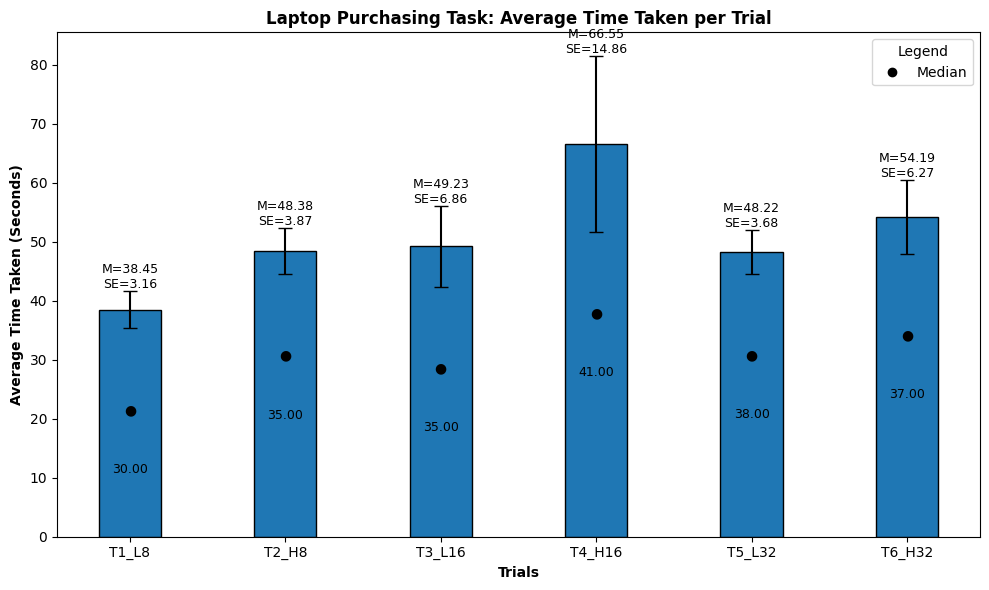

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.lines as mlines

def analyze_task_raw(file_path, task_name, pattern, new_column_names):
    df = pd.read_csv(file_path)
    matched_columns = df.filter(regex=pattern).columns.tolist()

    if matched_columns:
        df.rename(columns=new_column_names, inplace=True)
        matched_data = df[list(new_column_names.values())]
        relevant_rows = matched_data.dropna(how='all')

        average_data = relevant_rows.mean()
        standard_error = relevant_rows.std() / np.sqrt(relevant_rows.count())
        median_data = relevant_rows.median()

        trials = average_data.index.tolist()
        avg_times = average_data.values
        std_err = standard_error.values
        medians = median_data.values

        return {
            "Task": task_name,
            "Trials": trials,
            "Average Times": avg_times,
            "SE": std_err,
            "Medians": medians,
            "Relevant Rows": relevant_rows
        }
    else:
        print(f"No columns matching '{pattern}' found for {task_name}.")
        return None


def plot_laptop_task_only(result):
    trials = result["Trials"]
    avg = result["Average Times"]
    se = result["SE"]
    med = result["Medians"]

    x = np.arange(len(trials))
    bar_width = 0.4
    color = '#1f77b4'  # Blue for laptop task

    plt.figure(figsize=(10, 6))
    plt.bar(x, avg, bar_width, yerr=se, capsize=5, color=color, edgecolor='black')

    for pos, m, s, md in zip(x, avg, se, med):
        plt.text(pos, m + s + 0.02, f'M={m:.2f}\nSE={s:.2f}', ha='center', va='bottom', fontsize=9)
        plt.text(pos, m - s - 15, "●", ha='center', va='bottom', fontsize=10, color='black', fontweight='bold')
        plt.text(pos, m - s - 25, f"{md:.2f}", ha='center', va='bottom', fontsize=9)

    plt.xlabel('Trials', fontweight='bold')
    plt.ylabel('Average Time Taken (Seconds)', fontweight='bold')
    plt.title('Laptop Purchasing Task: Average Time Taken per Trial', fontweight='bold')
    plt.xticks(x, trials)

    # Median legend
    median_dot = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                               markersize=6, label='Median')
    plt.legend(handles=[median_dot], title="Legend")
    plt.tight_layout()
    plt.show()


# Run
file_path = '/content/Choice_Overload.csv'
laptop_result = analyze_task_raw(
    file_path, "Non-Cyber: Laptop Purchasing", r'em_co_lp_[1-6]_timer', {
        'em_co_lp_1_timer': 'T1_L8',
        'em_co_lp_2_timer': 'T2_H8',
        'em_co_lp_3_timer': 'T3_L16',
        'em_co_lp_4_timer': 'T4_H16',
        'em_co_lp_5_timer': 'T5_L32',
        'em_co_lp_6_timer': 'T6_H32'
    })

if laptop_result:
    print(f"Task: {laptop_result['Task']}")
    print(f"Trials: {laptop_result['Trials']}")
    print(f"Average Times: {laptop_result['Average Times']}")
    print(f"Standard Errors: {laptop_result['SE']}")
    print(f"Medians: {laptop_result['Medians']}")
    plot_laptop_task_only(laptop_result)
else:
    print("Laptop data not found.")

## **Laptop vs File (EM to CM Conversion)**

Task: CM: File Exfiltration
Trials: ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']
Average Times: [ 75.05263158  71.14736842  70.90526316 111.47368421 104.58947368
 126.75789474]
Standard Errors: [19.34622005  7.8736661   6.7981302  18.0688669  14.24744133 24.27493104]
Medians: [36. 50. 50. 72. 73. 69.]
Task: Non-Cyber: Laptop Purchasing
Trials: ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']
Average Times: [38.45263158 48.37894737 49.23157895 66.54736842 48.22105263 54.18947368]
Standard Errors: [ 3.162836    3.87238129  6.85665831 14.85820829  3.67934153  6.26514371]
Medians: [30. 35. 35. 41. 38. 37.]


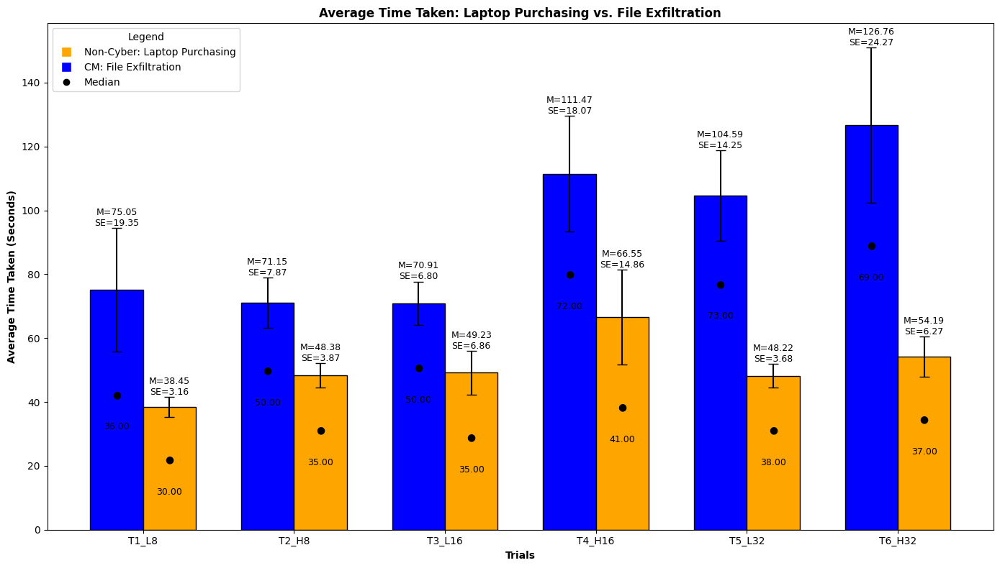

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.lines as mlines

def analyze_task_raw(file_path, task_name, pattern, new_column_names):
    df = pd.read_csv(file_path)
    matched_columns = df.filter(regex=pattern).columns.tolist()

    if matched_columns:
        df.rename(columns=new_column_names, inplace=True)
        matched_data = df[list(new_column_names.values())]
        relevant_rows = matched_data.dropna(how='all')

        average_data = relevant_rows.mean()
        standard_error = relevant_rows.std() / np.sqrt(relevant_rows.count())
        median_data = relevant_rows.median()

        trials = average_data.index.tolist()
        avg_times = average_data.values
        std_err = standard_error.values
        medians = median_data.values

        return {
            "Task": task_name,
            "Trials": trials,
            "Average Times": avg_times,
            "SE": std_err,
            "Medians": medians,
            "Relevant Rows": relevant_rows
        }
    else:
        print(f"No columns matching '{pattern}' found for {task_name}.")
        return None


def get_combined_task_data(file_path):
    file_exfiltration_results = analyze_task_raw(
        file_path, "CM: File Exfiltration", r'ci_co_fl_[1-6]_timer', {
            'ci_co_fl_1_timer': 'T1_L8',
            'ci_co_fl_2_timer': 'T2_H8',
            'ci_co_fl_3_timer': 'T3_L16',
            'ci_co_fl_4_timer': 'T4_H16',
            'ci_co_fl_5_timer': 'T5_L32',
            'ci_co_fl_6_timer': 'T6_H32'
        })

    laptop_purchasing_results = analyze_task_raw(
        file_path, "Non-Cyber: Laptop Purchasing", r'em_co_lp_[1-6]_timer', {
            'em_co_lp_1_timer': 'T1_L8',
            'em_co_lp_2_timer': 'T2_H8',
            'em_co_lp_3_timer': 'T3_L16',
            'em_co_lp_4_timer': 'T4_H16',
            'em_co_lp_5_timer': 'T5_L32',
            'em_co_lp_6_timer': 'T6_H32'
        })

    results = []
    if file_exfiltration_results:
        results.append(file_exfiltration_results)
    if laptop_purchasing_results:
        results.append(laptop_purchasing_results)

    return results


def plot_combined_data_raw(results):
    trials = results[0]["Trials"]
    n_tasks = len(results)
    n_trials = len(trials)

    bar_width = 0.35
    x = np.arange(n_trials)
    plt.figure(figsize=(14, 8))

    task_colors = ['blue', 'orange']  # File Exfiltration, Laptop

    for i, result in enumerate(results):
        bar_positions = x + (i - n_tasks / 2) * bar_width + bar_width / 2
        avg = result["Average Times"]
        se = result["SE"]
        med = result["Medians"]

        plt.bar(bar_positions, avg, bar_width, yerr=se, capsize=5,
                label=result["Task"], color=task_colors[i], edgecolor='black')

        for pos, m, s, md in zip(bar_positions, avg, se, med):
            plt.text(pos, m + s + 0.02, f'M={m:.2f}\nSE={s:.2f}', ha='center', va='bottom', fontsize=9)
            plt.text(pos, m - s - 15, "●", ha='center', va='bottom', fontsize=10, color='black', fontweight='bold')
            plt.text(pos, m - s - 25, f"{md:.2f}", ha='center', va='bottom', fontsize=9)

    # Add custom legend for the median dot
    median_dot = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                               markersize=6, label='Median')

    plt.xlabel('Trials', fontweight='bold')
    plt.ylabel('Average Time Taken (Seconds)', fontweight='bold')
    plt.title('Average Time Taken: Laptop Purchasing vs. File Exfiltration', fontweight='bold')
    plt.xticks(x, trials)
    plt.legend(title="Legend", handles=[
        mlines.Line2D([], [], color='white', marker='s', markersize=10,
                      markerfacecolor=task_colors[1], label='Non-Cyber: Laptop Purchasing'),
        mlines.Line2D([], [], color='white', marker='s', markersize=10,
                      markerfacecolor=task_colors[0], label='CM: File Exfiltration'),
        median_dot
    ])
    plt.tight_layout()
    plt.show()


# Run
file_path = '/content/Choice_Overload.csv'
results = get_combined_task_data(file_path)

if results:
    for task in results:
        print(f"Task: {task['Task']}")
        print(f"Trials: {task['Trials']}")
        print(f"Average Times: {task['Average Times']}")
        print(f"Standard Errors: {task['SE']}")
        print(f"Medians: {task['Medians']}")
    plot_combined_data_raw(results)
else:
    print("No results to plot. Check dataset or column mappings.")

### **Mapped Comparison: Jacoby Reference vs. Laptop Purchase (EM)**

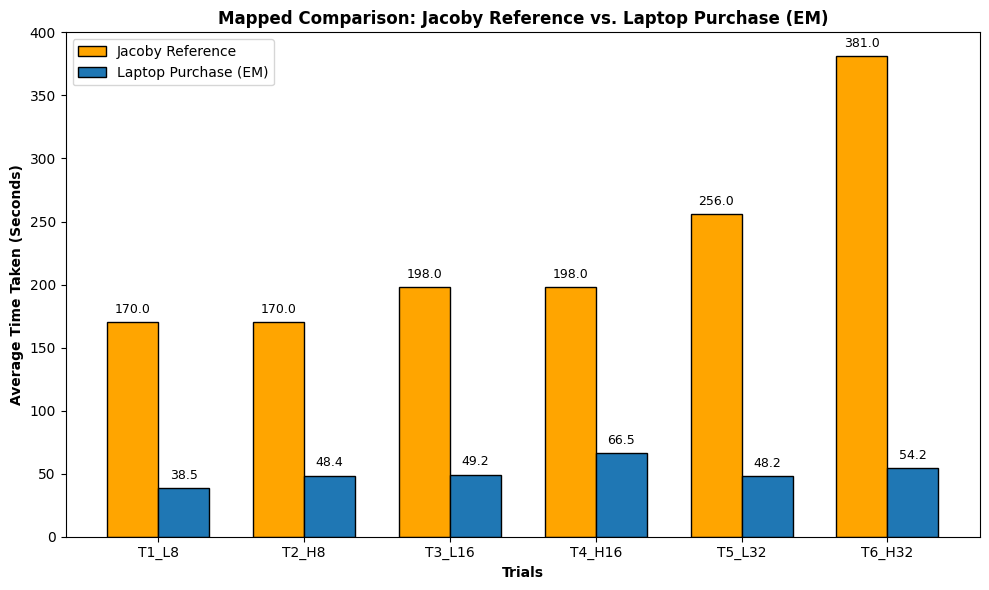

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Trial list (your trials)
trials = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']
x = np.arange(len(trials))
bar_width = 0.35

# Jacoby values mapped to your trials as reference baselines
jacoby_tst_mapped = [170, 170, 198, 198, 256, 381]

# Your actual laptop TST values
your_trials = laptop_result["Trials"]
your_tst = laptop_result["Average Times"]
your_tst_mapped = [your_tst[your_trials.index(t)] for t in trials]

# Plotting
plt.figure(figsize=(10, 6))

bar1 = plt.bar(x - bar_width/2, jacoby_tst_mapped, width=bar_width, label='Jacoby Reference', color='orange', edgecolor='black')
bar2 = plt.bar(x + bar_width/2, your_tst_mapped, width=bar_width, label='Laptop Purchase (EM)', color='#1f77b4', edgecolor='black')

# Annotate bars
for idx, (j_val, y_val) in enumerate(zip(jacoby_tst_mapped, your_tst_mapped)):
    plt.text(x[idx] - bar_width/2, j_val + 5, f'{j_val:.1f}', ha='center', va='bottom', fontsize=9)
    plt.text(x[idx] + bar_width/2, y_val + 5, f'{y_val:.1f}', ha='center', va='bottom', fontsize=9)

# Labels and formatting
plt.xticks(x, trials)
plt.xlabel("Trials", fontweight='bold')
plt.ylabel("Average Time Taken (Seconds)", fontweight='bold')
plt.title("Mapped Comparison: Jacoby Reference vs. Laptop Purchase (EM)", fontweight='bold')
plt.legend()
#plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In the Jacoby et al. (1974) experiment, time data—referred to as Total Sequence Time (TST)—was collected to measure how long participants took to make a brand choice under varying levels of information load. Participants, who were housewives, were given index cards representing product brands with specific attributes and instructed to examine the information carefully before selecting the brand they preferred most. They were told to raise their hand the moment they made a decision, signaling the end of the task. An experimenter, positioned behind a one-way mirror, used a timer that was activated simultaneously for all participants when the cards were handed out. The elapsed time from information presentation to decision signal was recorded as each participant's TST. This process ensured an objective measurement of decision-making speed under different cognitive load conditions (Jacoby, Speller, & Kohn, 1974).

In contrast, our laptop purchasing task showed notably lower time consumptions across all trials, due to removing the manual systems, and showing them all the index cards. We gave them a ranking option before we started any trials, and we captured the time using QuestionPro on how much time Participants spent for each trials. Our pattern aligns with findings from a related study (Jacoby, Kohn, & Speller, 1973), where time spent acquiring information increased with the number of brands but decreased sharply when the number of bits per brand exceeded 12 — indicating a cognitive threshold. Since our experiment included only 16 options, not 12 options, it is possible that we were operating in a range where participants had already begun to "tune out" excess information, following the overload pattern seen in prior work.

**Cite: Jacoby, J., Kohn, C. A., & Speller, D. E. (1973). Time spent acquiring product information as a function of information load and organization. In Proceedings of the annual convention of the American psychological association. American Psychological Association.**

##**Laptop Purchasing, File Exfiltration and NMAP port Scanning Timer**



Task: CM: File Exfiltration
Trials: ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']
Average Times: [ 75.05263158  71.14736842  70.90526316 111.47368421 104.58947368
 126.75789474]
Standard Errors: [19.34622005  7.8736661   6.7981302  18.0688669  14.24744133 24.27493104]
Medians: [36. 50. 50. 72. 73. 69.]
Task: Non-Cyber: Laptop Purchasing
Trials: ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']
Average Times: [38.45263158 48.37894737 49.23157895 66.54736842 48.22105263 54.18947368]
Standard Errors: [ 3.162836    3.87238129  6.85665831 14.85820829  3.67934153  6.26514371]
Medians: [30. 35. 35. 41. 38. 37.]
Task: CM: NMAP Port Scanning
Trials: ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']
Average Times: [142.85263158 194.66315789 167.24210526 214.41052632 205.96842105
 364.02105263]
Standard Errors: [23.5433981  30.68122636 26.03272863 29.65756597 27.74191751 42.57844609]
Medians: [ 76.  74.  86. 125. 143. 221.]


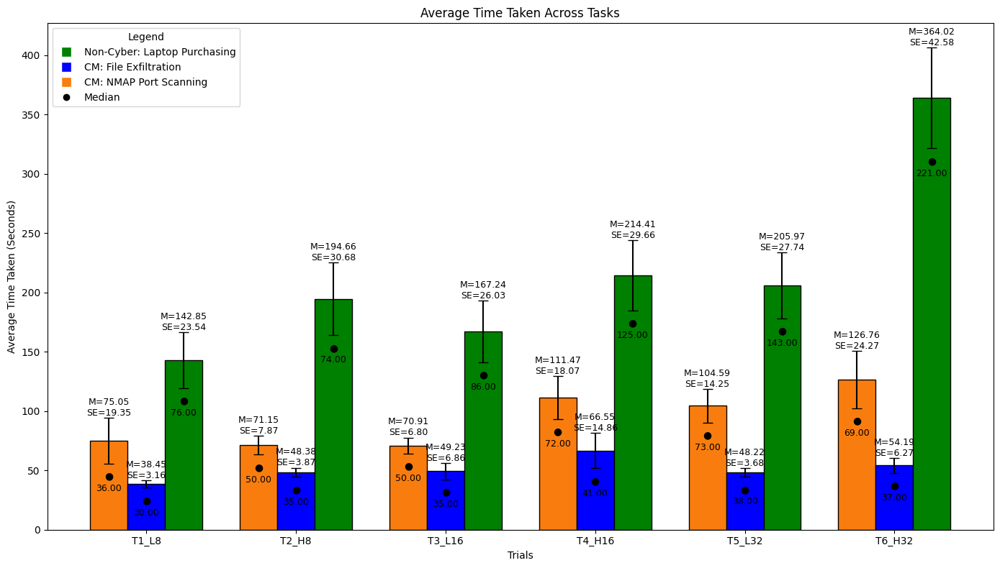

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.lines as mlines

def analyze_task_raw(file_path, task_name, pattern, new_column_names):
    df = pd.read_csv(file_path)
    matched_columns = df.filter(regex=pattern).columns.tolist()

    if matched_columns:
        df.rename(columns=new_column_names, inplace=True)
        matched_data = df[list(new_column_names.values())]
        relevant_rows = matched_data.dropna(how='all')

        average_data = relevant_rows.mean()
        standard_error = relevant_rows.std() / np.sqrt(relevant_rows.count())
        median_data = relevant_rows.median()

        trials = average_data.index.tolist()
        avg_times = average_data.values
        std_err = standard_error.values
        medians = median_data.values

        return {
            "Task": task_name,
            "Trials": trials,
            "Average Times": avg_times,
            "SE": std_err,
            "Medians": medians,
            "Relevant Rows": relevant_rows
        }
    else:
        print(f"No columns matching '{pattern}' found for {task_name}.")
        return None


def get_combined_task_data(file_path):
    file_exfiltration_results = analyze_task_raw(
        file_path, "CM: File Exfiltration", r'ci_co_fl_[1-6]_timer', {
            'ci_co_fl_1_timer': 'T1_L8',
            'ci_co_fl_2_timer': 'T2_H8',
            'ci_co_fl_3_timer': 'T3_L16',
            'ci_co_fl_4_timer': 'T4_H16',
            'ci_co_fl_5_timer': 'T5_L32',
            'ci_co_fl_6_timer': 'T6_H32'
        })

    laptop_purchasing_results = analyze_task_raw(
        file_path, "Non-Cyber: Laptop Purchasing", r'em_co_lp_[1-6]_timer', {
            'em_co_lp_1_timer': 'T1_L8',
            'em_co_lp_2_timer': 'T2_H8',
            'em_co_lp_3_timer': 'T3_L16',
            'em_co_lp_4_timer': 'T4_H16',
            'em_co_lp_5_timer': 'T5_L32',
            'em_co_lp_6_timer': 'T6_H32'
        })

    nmap_results = analyze_task_raw(
        file_path, "CM: NMAP Port Scanning", r'ci_co_nmap_[1-6]_timer', {
            'ci_co_nmap_1_timer': 'T1_L8',
            'ci_co_nmap_2_timer': 'T2_H8',
            'ci_co_nmap_3_timer': 'T3_L16',
            'ci_co_nmap_4_timer': 'T4_H16',
            'ci_co_nmap_5_timer': 'T5_L32',
            'ci_co_nmap_6_timer': 'T6_H32'
        })

    results = []
    if file_exfiltration_results:
        results.append(file_exfiltration_results)
    if laptop_purchasing_results:
        results.append(laptop_purchasing_results)
    if nmap_results:
        results.append(nmap_results)

    return results


def plot_combined_data_raw(results):
    trials = results[0]["Trials"]
    n_tasks = len(results)
    n_trials = len(trials)

    bar_width = 0.25
    x = np.arange(n_trials)
    plt.figure(figsize=(14, 8))

    task_colors = ['#f97d0e', 'blue', 'green']  # NMAP, File Exfiltration, Laptop

    for i, result in enumerate(results):
        bar_positions = x + (i - n_tasks / 2) * bar_width + bar_width / 2
        avg = result["Average Times"]
        se = result["SE"]
        med = result["Medians"]

        plt.bar(bar_positions, avg, bar_width, yerr=se, capsize=5,
                label=result["Task"], color=task_colors[i], edgecolor='black')

        for pos, m, s, md in zip(bar_positions, avg, se, med):
            plt.text(pos, m + s + 0.02, f'M={m:.2f}\nSE={s:.2f}', ha='center', va='bottom', fontsize=9)
            plt.text(pos, m - s - 15, "●", ha='center', va='bottom', fontsize=10, color='black', fontweight='bold')
            plt.text(pos, m - s - 25, f"{md:.2f}", ha='center', va='bottom', fontsize=9)

    # Add custom legend for the median dot
    median_dot = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                               markersize=6, label='Median')

    plt.xlabel('Trials')
    plt.ylabel('Average Time Taken (Seconds)')
    plt.title('Average Time Taken Across Tasks')
    plt.xticks(x, trials)
    plt.legend(title="Legend", handles=[
        mlines.Line2D([], [], color='white', marker='s', markersize=10,
                      markerfacecolor=task_colors[2], label='Non-Cyber: Laptop Purchasing'),
        mlines.Line2D([], [], color='white', marker='s', markersize=10,
                      markerfacecolor=task_colors[1], label='CM: File Exfiltration'),
        mlines.Line2D([], [], color='white', marker='s', markersize=10,
                      markerfacecolor=task_colors[0], label='CM: NMAP Port Scanning'),
        median_dot
    ])
    plt.tight_layout()
    plt.show()


# Run
file_path = '/content/Choice_Overload.csv'
results = get_combined_task_data(file_path)

if results:
    for task in results:
        print(f"Task: {task['Task']}")
        print(f"Trials: {task['Trials']}")
        print(f"Average Times: {task['Average Times']}")
        print(f"Standard Errors: {task['SE']}")
        print(f"Medians: {task['Medians']}")
    plot_combined_data_raw(results)
else:
    print("No results to plot. Check dataset or column mappings.")

### **Boxplot_Timer**

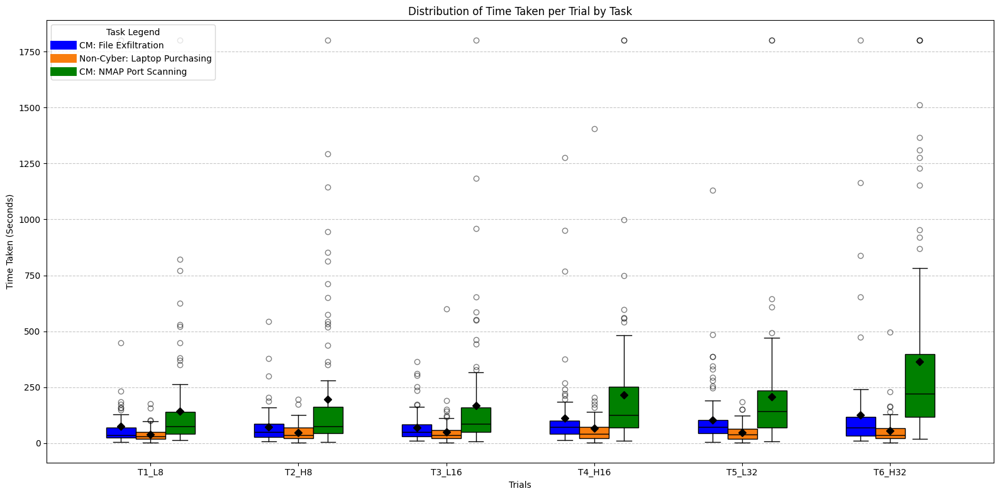

In [ ]:
def plot_combined_boxplot(results):
    """
    Create a grouped boxplot showing the distribution of times for each task per trial.

    Args:
        results (list): List of dictionaries from analyze_task_raw including participant-level data.
    """
    trials = results[0]["Trials"]
    n_trials = len(trials)
    n_tasks = len(results)

    plt.figure(figsize=(16, 8))

    # Define x base positions for each trial
    x = np.arange(n_trials)
    box_width = 0.2  # Width of each box
    offsets = np.linspace(-box_width, box_width, n_tasks)

    task_colors = ['blue', '#f97d0e', 'green']  # Color per task
    task_labels = [res["Task"] for res in results]

    # Plot each task
    for i, result in enumerate(results):
        data = [result["Relevant Rows"][trial].dropna().values for trial in trials]
        positions = x + offsets[i]

        bp = plt.boxplot(
            data,
            positions=positions,
            widths=box_width,
            patch_artist=True,
            showmeans=True,
            meanline=False,
            boxprops=dict(facecolor=task_colors[i], color='black'),
            medianprops=dict(color='black'),
            whiskerprops=dict(color='black'),
            capprops=dict(color='black'),
            flierprops=dict(marker='o', color='black', alpha=0.5),
            meanprops=dict(marker='D', markerfacecolor='black', markeredgecolor='black')
        )

    plt.xticks(x, trials)
    plt.xlabel("Trials")
    plt.ylabel("Time Taken (Seconds)")
    plt.title("Distribution of Time Taken per Trial by Task")
    legend_handles = [
        plt.Line2D([0], [0], color=color, lw=10, label=label)
        for color, label in zip(task_colors, task_labels)
    ]
    plt.legend(handles=legend_handles, title="Task Legend", loc="upper left")
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

plot_combined_boxplot(results)

#### **Outlier count_Timer**

In [ ]:
def count_outliers_per_trial(results):
    """
    Count outliers for each task and trial using the IQR method.

    Args:
        results (list): List of task results with "Relevant Rows" for each trial.

    Returns:
        pd.DataFrame: A DataFrame showing the number of outliers per task-trial.
    """
    outlier_counts = []

    for result in results:
        task = result["Task"]
        for trial in result["Trials"]:
            data = result["Relevant Rows"][trial].dropna()
            Q1 = np.percentile(data, 25)
            Q3 = np.percentile(data, 75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            outliers = data[(data < lower_bound) | (data > upper_bound)]
            outlier_counts.append({
                "Task": task,
                "Trial": trial,
                "Outlier Count": len(outliers)
            })

    outlier_df = pd.DataFrame(outlier_counts)
    return outlier_df

outlier_df = count_outliers_per_trial(results)
print(outlier_df)

                            Task   Trial  Outlier Count
0          CM: File Exfiltration   T1_L8              8
1          CM: File Exfiltration   T2_H8              5
2          CM: File Exfiltration  T3_L16              7
3          CM: File Exfiltration  T4_H16              9
4          CM: File Exfiltration  T5_L32             10
5          CM: File Exfiltration  T6_H32              5
6   Non-Cyber: Laptop Purchasing   T1_L8              4
7   Non-Cyber: Laptop Purchasing   T2_H8              2
8   Non-Cyber: Laptop Purchasing  T3_L16              6
9   Non-Cyber: Laptop Purchasing  T4_H16              5
10  Non-Cyber: Laptop Purchasing  T5_L32              3
11  Non-Cyber: Laptop Purchasing  T6_H32              5
12        CM: NMAP Port Scanning   T1_L8             10
13        CM: NMAP Port Scanning   T2_H8             15
14        CM: NMAP Port Scanning  T3_L16             11
15        CM: NMAP Port Scanning  T4_H16              8
16        CM: NMAP Port Scanning  T5_L32        

###**ANOVA**

In [ ]:
import pandas as pd
from scipy.stats import f

def calculate_anova_with_significance(task_results):
    """
    Calculate ANOVA for a task's results, including p-value and significance.

    Args:
        task_results (dict): Dictionary containing "Trials", "Average Times", "SE", and "Task".

    Returns:
        pd.DataFrame: DataFrame containing ANOVA results for each trial.
    """
    trials = task_results["Trials"]
    avg_times = np.array(task_results["Average Times"])
    se = np.array(task_results["SE"])
    n_i = len(avg_times)  # Assuming equal participants across trials

    # Calculate overall mean
    M_T = np.mean(avg_times)

    # Between-Trial Sum of Squares (SSB)
    SSB = n_i * np.sum((avg_times - M_T) ** 2)

    # Within-Trial Sum of Squares (SSW)
    SD = se * np.sqrt(n_i)  # Convert SE to SD
    SSW = np.sum((n_i - 1) * (SD ** 2))

    # Degrees of Freedom
    df_B = len(trials) - 1
    df_W = (n_i * len(trials)) - len(trials)

    # Mean Squares
    MS_B = SSB / df_B
    MS_W = SSW / df_W

    # F-ratio
    F_ratio = MS_B / MS_W

    # Calculate p-value using the F-distribution
    p_value = f.sf(F_ratio, df_B, df_W)

    # Determine significance
    is_significant = "Yes" if p_value <= 0.05 else "No"

    # Create a DataFrame for results
    results_df = pd.DataFrame({
        "Task": [task_results["Task"]],
        "SSB": [SSB],
        "SSW": [SSW],
        "F-ratio": [F_ratio],
        "df_B": [df_B],
        "df_W": [df_W],
        "p-value": [p_value],
        "Significant": [is_significant]
    })

    return results_df

# Calculate ANOVA with significance for each task
anova_tables = []
for result in results:
    anova_tables.append(calculate_anova_with_significance(result))

# Display results in separate tables
for i, table in enumerate(anova_tables):
    print(f"\nANOVA Results for {table['Task'][0]}:\n")
    print(table)

#pd.concat(anova_tables, ignore_index=True).to_excel('anova_timer.xlsx', index=False)


ANOVA Results for CM: File Exfiltration:

                    Task           SSB           SSW   F-ratio  df_B  df_W  \
0  CM: File Exfiltration  17414.357119  48036.937042  2.175121     5    30   

    p-value Significant  
0  0.083458          No  

ANOVA Results for Non-Cyber: Laptop Purchasing:

                           Task          SSB           SSW   F-ratio  df_B  \
0  Non-Cyber: Laptop Purchasing  2561.339501  10367.056946  1.482391     5   

   df_W   p-value Significant  
0    30  0.224933          No  

ANOVA Results for CM: NMAP Port Scanning:

                     Task            SSB            SSW   F-ratio  df_B  df_W  \
0  CM: NMAP Port Scanning  181132.315568  169063.244486  6.428327     5    30   

   p-value Significant  
0  0.00036         Yes  


####**Pairwise T Test (NMAP)**

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import ttest_ind

# Load dataset
file_path = '/content/Choice_Overload.csv'

# Function to extract data for CM: NMAP Port Scanning
def extract_nmap_data(file_path):
    df = pd.read_csv(file_path)

    # Rename columns for trials
    nmap_columns = {
        'ci_co_nmap_1_timer': 'T1_L8',
        'ci_co_nmap_2_timer': 'T2_H8',
        'ci_co_nmap_3_timer': 'T3_L16',
        'ci_co_nmap_4_timer': 'T4_H16',
        'ci_co_nmap_5_timer': 'T5_L32',
        'ci_co_nmap_6_timer': 'T6_H32',
    }
    df.rename(columns=nmap_columns, inplace=True)
    trial_data = df[list(nmap_columns.values())]

    # Calculate mean, standard error, and count for each trial
    mean_values = trial_data.mean()
    se_values = trial_data.std() / np.sqrt(trial_data.count())
    count_values = trial_data.count()

    return {
        "Means": mean_values,
        "SEs": se_values,
        "Counts": count_values,
        "Raw Data": trial_data
    }

# Perform pairwise t-tests
def pairwise_t_tests(data):
    results = []
    trials = data["Means"].index.tolist()
    raw_data = data["Raw Data"]

    for i in range(len(trials)):
        for j in range(i + 1, len(trials)):
            trial1 = trials[i]
            trial2 = trials[j]

            # Extract raw data for both trials
            data1 = raw_data[trial1].dropna()
            data2 = raw_data[trial2].dropna()

            # Perform t-test
            t_stat, p_value = ttest_ind(data1, data2, equal_var=False)

            # Append results
            results.append({
                "Trial 1": trial1,
                "Trial 2": trial2,
                "t-statistic": t_stat,
                "p-value": p_value,
                "Significant": "Yes" if p_value < 0.05 else "No"
            })

    return pd.DataFrame(results)

# Main execution
nmap_data = extract_nmap_data(file_path)
pairwise_results = pairwise_t_tests(nmap_data)

# Display pairwise t-test results
print(pairwise_results)

# Save results to a CSV file for review
#pairwise_results.to_csv('pairwise_t_test_results_timer.csv', index=False)

   Trial 1 Trial 2  t-statistic   p-value Significant
0    T1_L8   T2_H8    -1.339695  0.182070          No
1    T1_L8  T3_L16    -0.694861  0.488009          No
2    T1_L8  T4_H16    -1.889747  0.060410          No
3    T1_L8  T5_L32    -1.734641  0.084487          No
4    T1_L8  T6_H32    -4.545736  0.000011         Yes
5    T2_H8  T3_L16     0.681483  0.496427          No
6    T2_H8  T4_H16    -0.462770  0.644065          No
7    T2_H8  T5_L32    -0.273314  0.784915          No
8    T2_H8  T6_H32    -3.227029  0.001499         Yes
9   T3_L16  T4_H16    -1.195278  0.233509          No
10  T3_L16  T5_L32    -1.017945  0.310018          No
11  T3_L16  T6_H32    -3.942977  0.000121         Yes
12  T4_H16  T5_L32     0.207882  0.835547          No
13  T4_H16  T6_H32    -2.883266  0.004451         Yes
14  T5_L32  T6_H32    -3.110129  0.002211         Yes


##**Normalized Timer for Laptop Purchasing, File Exfiltration, and NMAP Port Scanning**

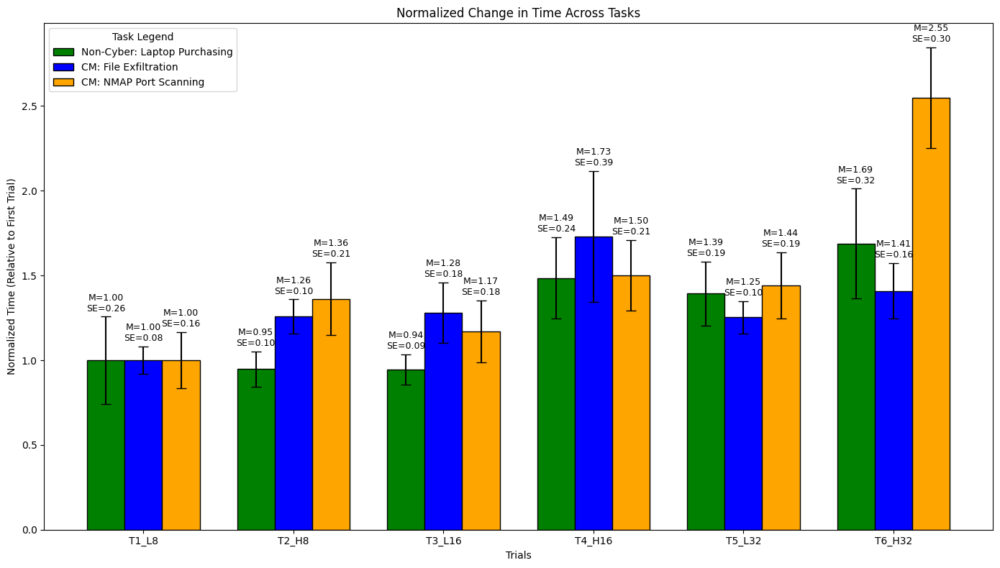

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def analyze_task(file_path, task_name, pattern, new_column_names):
    """
    Analyze a specific task, calculate normalized times, and return the data for combined visualization.

    Args:
        file_path (str): Path to the dataset.
        task_name (str): Name of the task being analyzed.
        pattern (str): Regex pattern to match relevant columns in the dataset.
        new_column_names (dict): Dictionary to map old column names to new names.

    Returns:
        dict: Normalized times and SE values for the task.
    """
    df = pd.read_csv(file_path)

    matched_columns = df.filter(regex=pattern).columns.tolist()

    if matched_columns:
        matched_data = df[matched_columns]
        relevant_rows = matched_data.dropna(how='all')
        average_data = relevant_rows.mean()

        # Calculate standard error for each trial
        standard_error = relevant_rows.std() / np.sqrt(relevant_rows.count())

        trial_1_avg = average_data[matched_columns[0]]  # Use the first column as the baseline
        normalized_change = average_data / trial_1_avg  # Normalized change
        normalized_se = standard_error / trial_1_avg  # Normalized standard error

        # Rename columns for visualization
        trials = [new_column_names.get(col, col) for col in matched_columns]
        normalized_times = normalized_change.values
        normalized_se_values = normalized_se.values

        return {
            "Task": task_name,
            "Trials": trials,
            "Normalized Times": normalized_times,
            "Normalized SE": normalized_se_values
        }

    else:
        print(f"No columns matching '{pattern}' found for {task_name}.")
        return None


def plot_combined_data(results):
    """
    Plot combined data for all tasks in a single graph with bars grouped by trial.

    Args:
        results (list): List of dictionaries containing results from individual tasks.
    """
    trials = results[0]["Trials"]
    n_tasks = len(results)
    n_trials = len(trials)

    bar_width = 0.25
    x = np.arange(n_trials)  # Position of bars on x-axis

    plt.figure(figsize=(14, 8))

    # Define colors for each task
    # Define colors for each task: [Laptop Purchasing, File Exfiltration, NMAP]
    task_colors = ['green', 'blue', 'orange'] # Colors for Laptop Purchasing, File Exfiltration, and NMAP

    for i, result in enumerate(results):
        # Position bars for each task
        bar_positions = x + (i - n_tasks / 2) * bar_width + bar_width / 2
        plt.bar(bar_positions, result["Normalized Times"], bar_width,
                yerr=result["Normalized SE"], capsize=5, label=result["Task"],
                color=task_colors[i], edgecolor='black')

        # Add M and SE annotations above bars
        for pos, time, se in zip(bar_positions, result["Normalized Times"], result["Normalized SE"]):
            plt.text(pos, time + se + 0.02, f'M={time:.2f}\nSE={se:.2f}',
                     ha='center', va='bottom', fontsize=9)

    plt.xlabel('Trials')
    plt.ylabel('Normalized Time (Relative to First Trial)')
    plt.title('Normalized Change in Time Across Tasks')
    plt.xticks(x, trials)  # Label trials
    plt.legend(title="Task Legend", labels=[
        'Non-Cyber: Laptop Purchasing',
        'CM: File Exfiltration',
        'CM: NMAP Port Scanning'
    ])
    plt.tight_layout()
    plt.show()


# File paths and analysis details
file_path = '/content/Choice_Overload.csv'

# Task 1: File Exfiltration
file_exfiltration_results = analyze_task(
    file_path,
    task_name="CM: File Exfiltration",
    pattern=r'ci_co_fl_[1-6]_timer',
    new_column_names={
        'ci_co_fl_1_timer': 'T1_L8',
        'ci_co_fl_2_timer': 'T2_H8',
        'ci_co_fl_3_timer': 'T3_L16',
        'ci_co_fl_4_timer': 'T4_H16',
        'ci_co_fl_5_timer': 'T5_L32',
        'ci_co_fl_6_timer': 'T6_H32'
    }
)

# Task 2: Laptop Purchasing
laptop_purchasing_results = analyze_task(
    file_path,
    task_name="Non-Cyber: Laptop Purchasing",
    pattern=r'em_co_lp_[1-6]_timer',
    new_column_names={
        'em_co_lp_1_timer': 'T1_L8',
        'em_co_lp_2_timer': 'T2_H8',
        'em_co_lp_3_timer': 'T3_L16',
        'em_co_lp_4_timer': 'T4_H16',
        'em_co_lp_5_timer': 'T5_L32',
        'em_co_lp_6_timer': 'T6_H32',
    }
)

# Task 3: NMAP Example
nmap_results = analyze_task(
    file_path,
    task_name="CM: NMAP Port Scanning",
    pattern=r'ci_co_nmap_[1-6]_timer',
    new_column_names={
        'ci_co_nmap_1_timer': 'T1_L8',
        'ci_co_nmap_2_timer': 'T2_H8',
        'ci_co_nmap_3_timer': 'T3_L16',
        'ci_co_nmap_4_timer': 'T4_H16',
        'ci_co_nmap_5_timer': 'T5_L32',
        'ci_co_nmap_6_timer': 'T6_H32',
    }
)

# Combine results for visualization
results = []
if file_exfiltration_results:
    results.append(file_exfiltration_results)
if laptop_purchasing_results:
    results.append(laptop_purchasing_results)
if nmap_results:
    results.append(nmap_results)

# Plot combined data
plot_combined_data(results)

{'Laptop Purchasing': {'Average Times': array([1.        , 0.94796634, 0.94474053, 1.48527349, 1.39354839,
         1.68892006]),
  'SD': array([2.5124186 , 0.96931694, 0.83406117, 3.4852443 , 2.57842682,
       5.32430561]),

'File Exfiltration': {'Average Times': array([1.        , 1.25814399, 1.28031755, 1.73063236, 1.25403778,
         1.40925267]),
  'SD': array([0.80170093, 1.23493532, 2.22518408, 6.51788957, 1.16954368,
       2.23797714]),

 'NMAP Port Scanning': {'Average Times': array([1.        , 1.36268514, 1.17073171, 1.50092108, 1.44182448,
         2.54822784]),
  'SD': array([1.60635933, 2.852606  , 2.07946025, 3.03715473, 2.72911869,
       7.40289557])}}




**ANOVA**

In [ ]:
from scipy.stats import f
import pandas as pd

def calculate_anova_normalized(task_results):
    """
    Calculate ANOVA for normalized times, including p-value and significance.

    Args:
        task_results (dict): Dictionary containing "Trials", "Normalized Times", "Normalized SE", and "Task".

    Returns:
        pd.DataFrame: DataFrame containing ANOVA results for the task.
    """
    trials = task_results["Trials"]
    normalized_times = np.array(task_results["Normalized Times"])
    normalized_se = np.array(task_results["Normalized SE"])
    n_i = len(normalized_times)  # Assuming equal participants across trials

    # Calculate overall mean
    M_T = np.mean(normalized_times)

    # Between-Trial Sum of Squares (SSB)
    SSB = n_i * np.sum((normalized_times - M_T) ** 2)

    # Within-Trial Sum of Squares (SSW)
    SD = normalized_se * np.sqrt(n_i)  # Convert SE to SD
    SSW = np.sum((n_i - 1) * (SD ** 2))

    # Degrees of Freedom
    df_B = len(trials) - 1
    df_W = (n_i * len(trials)) - len(trials)

    # Mean Squares
    MS_B = SSB / df_B
    MS_W = SSW / df_W

    # F-ratio
    F_ratio = MS_B / MS_W

    # Calculate p-value using the F-distribution
    p_value = f.sf(F_ratio, df_B, df_W)

    # Determine significance
    is_significant = "Yes" if p_value <= 0.05 else "No"

    # Create a DataFrame for results
    results_df = pd.DataFrame({
        "Task": [task_results["Task"]],
        "SSB": [SSB],
        "SSW": [SSW],
        "F-ratio": [F_ratio],
        "df_B": [df_B],
        "df_W": [df_W],
        "p-value": [p_value],
        "Significant": [is_significant]
    })

    return results_df

# Perform ANOVA for each task
anova_tables_normalized = []
for result in results:
    anova_tables_normalized.append(calculate_anova_normalized(result))

# Display results in separate tables
for i, table in enumerate(anova_tables_normalized):
    print(f"\nANOVA Results for {table['Task'][0]} (Normalized):\n")
    print(table)


ANOVA Results for CM: File Exfiltration (Normalized):

                    Task       SSB       SSW   F-ratio  df_B  df_W   p-value  \
0  CM: File Exfiltration  3.091545  8.527927  2.175121     5    30  0.083458   

  Significant  
0          No  

ANOVA Results for Non-Cyber: Laptop Purchasing (Normalized):

                           Task       SSB       SSW   F-ratio  df_B  df_W  \
0  Non-Cyber: Laptop Purchasing  1.732268  7.011377  1.482391     5    30   

    p-value Significant  
0  0.224933          No  

ANOVA Results for CM: NMAP Port Scanning (Normalized):

                     Task       SSB       SSW   F-ratio  df_B  df_W  p-value  \
0  CM: NMAP Port Scanning  8.876044  8.284622  6.428327     5    30  0.00036   

  Significant  
0         Yes  


# **Regret**

##**Regret For all Examples**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random

file_exfiltration_scores = {
    'Trial 1': {
        'aug_patch_notes.docx' : 20,
        'aug_update_data.zip' : 73,
        'README.txt' : 20,
        't1.enc' : 100,
        't2.enc' : 100,
        'patcher' : 73,
        'temp_parser.py' : 100,
        'aug_patch_notes.pdf' : 20
    },
    'Trial 2': {
        'cplan_overview.pptx' : 48,
        'cplan_package.enc' : 100,
        'cplan.pdf' : 28,
        'cplan_working_doc.docx' : 40,
        'data_t1.zip' : 96,
        'jul12notes.txt' : 20,
        'parse_data.sh' : 72,
        'parsed_doc.txt' : 20
    },
    'Trial 3': {
        'data_record.xls' : 20,
        'monthly_increment_tracker.txt' : 46,
        'test2.py' : 46,
        'test.py' : 46,
        'transfer.txt' : 20,
        'zephyr_codes.enc' : 100,
        'zephyr_data01.zip' : 100,
        'zephyr_data02.zip' : 100,
        'zephyr_data03.zip' : 100,
        'zephyr_data04.zip' : 100,
        'zephyr_data05.zip' : 100,
        'zephyr_instructions.txt' : 46,
        'zephyr_manual.pdf' : 20,
        'zephyr_run' : 100,
        'zephyr_training.pptx' : 20,
        'zephyr_working_doc.docx' : 20
    },
    'Trial 4': {
        'COMET_augUpdate.pptx' : 74,
        'COMET_augUpdateWorkingDoc.docx' : 53,
        'COMET_bugResolution.pptx' : 70,
        'COMET_bugResolutionWorkingDoc.docx' : 62,
        'COMET_monthlyReport.docx' : 66,
        'COMET_userBreakdown.pptx' : 53,
        'COMET_userBreakdownWorkingDoc.docx' : 53,
        'processedUserData.xls' : 66,
        'process_userData.py' : 95,
        'README.txt' : 20,
        'userData1.enc' : 100,
        'userData2.enc' : 100,
        'userData3.enc' : 100,
        'userDataInstructionNotes.txt' : 45,
        'userGraph.png' : 20,
        'userReport.pdf' : 20
        },
    'Trial 5': {
        'aug_monthly_update_working_doc.docx' : 20,
        'data_overview.docx' : 20,
        'JAPPA' : 100,
        'jappa_data1.zip' : 100,
        'jappa_data2.zip' : 100,
        'jappa_data3.zip' : 100,
        'jappa_data4.zip' : 100,
        'jappa_data5.zip' : 100,
        'jappa_data_graphic.png' : 20,
        'jappa_Export.py' : 73,
        'jappa_format_example.json' : 20,
        'jappa_maintenance_manual.pdf' : 20,
        'jappa_mapper.py' : 73,
        'jappa_overview.pptx' : 20,
        'jappa_parsed_1.xls' : 20,
        'jappa_parsed_2.xls' : 20,
        'jappa_system_analysis_v0.pptx' : 20,
        'jappa_system_analysis_v1.1.pptx' : 20,
        'jappa_system_analysis_v1.pptx' : 20,
        'jappa_system_analysis_v2.pptx' : 20,
        'jappa_template1.txt' : 20,
        'jappa_template2.txt' : 20,
        'jappa_template3.txt' : 20,
        'jappa_user_manual.pdf' : 20,
        'notes.txt' : 20,
        'system1_benchmark.json' : 20,
        'system2_benchmark.json' : 20,
        'system3_benchmark.json' : 20,
        'system_pack1.zip' : 100,
        'system_pack2.zip' : 100,
        'system_pack3.zip' : 100,
        'systems_graphic.png' : 20
    },
    'Trial 6': {
        #'capture1.jpg' : NA, # Non-exist option, keep it to pass the code
        'core_data1.enc' : 100,
        'core_data2.enc' : 100,
        'cvv_report.pdf' : 49,
        'datadump01.zip' : 83,
        'datadump02.zip' : 83,
        'datadump03.zip' : 83,
        'datadump_graph1.png' : 24,
        'datadump_graph2.png' : 24,
        'datadump_graph3.png' : 24,
        'datadump_tracker.txt' : 20,
        'data_parse.py' : 75,
        'data_sort.py' : 75,
        'dump01_parsed.xls' : 24,
        'dump02_parsed.xls' : 24,
        'dump03_parsed.xls' : 24,
        'generate_graph.py' : 75,
        'generate_png.py' : 75,
        'generate_report.py' : 75,
        'jul_monthly_overview.pdf' : 24,
        'jul_report.pptx' : 49,
        'jul_working_doc.docx' : 28,
        'jun_monthly_overview.pdf' : 24,
        'jun_report.pptx' : 71,
        'jun_working_doc.docx' : 28,
        'may_monthly_overview.pdf' : 24,
        'may_report.pptx' : 71,
        'may_working_doc.docx' : 28,
        'proceed_notes.txt' : 20,
        'process_1' : 96,
        'process_2' : 96,
        'README.txt' : 20,
        'vnr_report.pdf' : 20
    }
}

laptop_purchasing_scores = {
    'Trial 1': {
        'A': 51,
        'B': 75,
        'C': 28,
        'D': 100,
        'E': 37,
        'F': 64,
        'G': 20,
        'H': 88,
    },
    'Trial 2': {
        'A': 58,
        'B': 80,
        'C': 43,
        'D': 20,
        'E': 63,
        'F': 100,
        'G': 30,
        'H': 32,
    },
    'Trial 3': {
        'A': 27,
        'B': 69,
        'C': 35,
        'D': 42,
        'E': 100,
        'F': 65,
        'G': 20,
        'H': 80,
        'I': 73,
        'J': 69,
        'K': 65,
        'L': 100,
        'M': 35,
        'N': 96,
        'O': 73,
        'P': 50,
    },
    'Trial 4': {
        'A' : 56,
        'B' : 87,
        'C' : 48,
        'D' : 20,
        'E' : 60,
        'F' : 100,
        'G' : 32,
        'H' : 32,
        'I' : 72,
        'J' : 45,
        'K' : 42,
        'L' : 68,
        'M' : 42,
        'N' : 76,
        'O' : 56,
        'P' : 60,
    },
    'Trial 5': {
        'A': 68,
        'B': 93,
        'C': 47,
        'D': 33,
        'E': 68,
        'F': 100,
        'G': 29,
        'H': 65,
        'I': 61,
        'J': 58,
        'K': 56,
        'L': 77,
        'M': 38,
        'N': 81,
        'O': 61,
        'P': 47,
        'Q': 56,
        'R': 90,
        'S': 47,
        'T': 47,
        'U': 52,
        'V': 84,
        'W': 20,
        'X': 56,
        'Y': 52,
        'Z': 77,
        'AA': 20,
        'BB': 90,
        'CC': 47,
        'DD': 49,
        'EE': 52,
        'FF': 93,
    },
    'Trial 6': {
        'A': 67,
        'B': 98,
        'C': 35,
        'D': 29,
        'E': 60,
        'F': 100,
        'G': 33,
        'H': 20,
        'I': 73,
        'J': 35,
        'K': 40,
        'L': 75,
        'M': 48,
        'N': 69,
        'O': 44,
        'P': 50,
        'Q': 84,
        'R': 52,
        'S': 29,
        'T': 60,
        'U': 100,
        'V': 33,
        'W': 23,
        'X': 84,
        'Y': 42,
        'Z': 44,
        'AA': 75,
        'BB': 40,
        'CC': 77,
        'DD': 37,
    },
}


nmap_scores = {
  'Trial 1': {
    #'192.168.56.104' : NA, # Non-exist option, keep it to pass the code
    '192.168.56.104:80' : 80,
    '192.168.56.104:5900' : 80,
    '192.168.56.105:5984' : 30,
    '192.168.56.106:3000' : 80,
    '192.168.56.107:5432' : 50,
    '192.168.56.108:80' : 80,
    '192.168.56.109:25' : 30,
    '192.168.56.110:80' : 80,
},

  'Trial 2': {
    #'06:07:42:68:76:AA' : NA, # Non-exist option, keep it to pass the code
    '192.168.56.102:25' : 0,
    '192.168.56.102:80' : 0,
    '192.168.56.102:3000' : 0,
    '192.168.56.102:4700' : 0,
    '192.168.56.102:4701' : 0,
    '192.168.56.102:4702' : 0,
    '192.168.56.102:4703' : 0,
    '192.168.56.102:4704' : 0,
    '192.168.56.102:4705' : 0,
    '192.168.56.102:4706' : 0,
    '192.168.56.102:4707' : 0,
    '192.168.56.102:5432' : 0,
    '192.168.56.102:5900' : 0,
    '192.168.56.102:5984' : 0,
    '192.168.56.104:25' : 0,
    '192.168.56.104:80' : 80,
    '192.168.56.104:3000' : 0,
    '192.168.56.104:4700' : 0,
    '192.168.56.104:4701' : 0,
    '192.168.56.104:4702' : 0,
    '192.168.56.104:4703' : 0,
    '192.168.56.104:4704' : 0,
    '192.168.56.104:4705' : 0,
    '192.168.56.104:4706' : 0,
    '192.168.56.104:4707' : 0,
    '192.168.56.104:5432' : 0,
    '192.168.56.104:5900' : 80,
    '192.168.56.104:5984' : 0,
    '192.168.56.105:25' : 0,
    '192.168.56.105:80' : 0,
    '192.168.56.105:3000' : 0,
    '192.168.56.105:4700' : 0,
    '192.168.56.105:4701' : 0,
    '192.168.56.105:4702' : 0,
    '192.168.56.105:4703' : 0,
    '192.168.56.105:4704' : 0,
    '192.168.56.105:4705' : 0,
    '192.168.56.105:4706' : 0,
    '192.168.56.105:4707' : 0,
    '192.168.56.105:5432' : 0,
    '192.168.56.105:5900' : 0,
    '192.168.56.105:5984' : 30,
    '192.168.56.106:25' : 0,
    '192.168.56.106:80' : 0,
    '192.168.56.106:3000' : 80,
    '192.168.56.106:4700' : 0,
    '192.168.56.106:4701' : 0,
    '192.168.56.106:4702' : 0,
    '192.168.56.106:4703' : 0,
    '192.168.56.106:4704' : 0,
    '192.168.56.106:4705' : 0,
    '192.168.56.106:4706' : 0,
    '192.168.56.106:4707' : 0,
    '192.168.56.106:5432' : 0,
    '192.168.56.106:5900' : 0,
    '192.168.56.106:5984' : 0,
    '192.168.56.107:25' : 0,
    '192.168.56.107:80' : 0,
    '192.168.56.107:3000' : 0,
    '192.168.56.107:4700' : 0,
    '192.168.56.107:4701' : 0,
    '192.168.56.107:4702' : 0,
    '192.168.56.107:4703' : 0,
    '192.168.56.107:4704' : 0,
    '192.168.56.107:4705' : 0,
    '192.168.56.107:4706' : 0,
    '192.168.56.107:4707' : 0,
    '192.168.56.107:5432' : 50,
    '192.168.56.107:5900' : 0,
    '192.168.56.107:5984' : 0,
    '192.168.56.108:25' : 0,
    '192.168.56.108:80' : 80,
    '192.168.56.108:3000' : 0,
    '192.168.56.108:4700' : 0,
    '192.168.56.108:4701' : 0,
    '192.168.56.108:4702' : 0,
    '192.168.56.108:4703' : 0,
    '192.168.56.108:4704' : 0,
    '192.168.56.108:4705' : 0,
    '192.168.56.108:4706' : 0,
    '192.168.56.108:4707' : 0,
    '192.168.56.108:5432' : 0,
    '192.168.56.108:5900' : 0,
    '192.168.56.108:5984' : 0,
    '192.168.56.109:25' : 30,
    '192.168.56.109:80' : 0,
    '192.168.56.109:3000' : 0,
    '192.168.56.109:4700' : 0,
    '192.168.56.109:4701' : 0,
    '192.168.56.109:4702' : 0,
    '192.168.56.109:4703' : 0,
    '192.168.56.109:4704' : 0,
    '192.168.56.109:4705' : 0,
    '192.168.56.109:4706' : 0,
    '192.168.56.109:4707' : 0,
    '192.168.56.109:5432' : 0,
    '192.168.56.109:5900' : 0,
    '192.168.56.109:5984' : 0,
    '192.168.56.110:25' : 0,
    '192.168.56.110:80' : 80,
    '192.168.56.110:3000' : 0,
    '192.168.56.110:4700' : 0,
    '192.168.56.110:4701' : 0,
    '192.168.56.110:4702' : 0,
    '192.168.56.110:4703' : 0,
    '192.168.56.110:4704' : 0,
    '192.168.56.110:4705' : 0,
    '192.168.56.110:4706' : 0,
    '192.168.56.110:4707' : 0,
    '192.168.56.110:5432' : 0,
    '192.168.56.110:5900' : 0,
    '192.168.56.110:5984' : 0,

},

  'Trial 3': {
    #'192.168.56.106' : NA,
    '192.168.56.104:80' : 80,
    '192.168.56.104:5900' : 80,
    '192.168.56.105:80' : 80,
    '192.168.56.105:443' : 30,
    '192.168.56.105:8080' : 80,
    '192.168.56.106:5432' : 50,
    '192.168.56.107:80' : 80,
    '192.168.56.107:5900' : 80,
    '192.168.56.108:5432' : 50,
    '192.168.56.109:8484' : 30,
    '192.168.56.110:80' : 80,
    '192.168.56.110:8080' : 80,
    '192.168.56.111:80' : 80,
    '192.168.56.111:443' : 30,
    '192.168.56.111:8080' : 80,
    '192.168.56.112:3306' : 10,
},

  'Trial 4': {
    '192.168.56.102:80' : 0,
    '192.168.56.102:443' : 0,
    '192.168.56.102:3306' : 0,
    '192.168.56.102:4700' : 0,
    '192.168.56.102:4701' : 0,
    '192.168.56.102:4702' : 0,
    '192.168.56.102:4703' : 0,
    '192.168.56.102:4704' : 0,
    '192.168.56.102:4705' : 0,
    '192.168.56.102:4706' : 0,
    '192.168.56.102:4707' : 0,
    '192.168.56.102:4708' : 0,
    '192.168.56.102:4709' : 0,
    '192.168.56.102:4710' : 0,
    '192.168.56.102:4711' : 0,
    '192.168.56.102:4712' : 0,
    '192.168.56.102:4713' : 0,
    '192.168.56.102:4714' : 0,
    '192.168.56.102:4715' : 0,
    '192.168.56.102:5432' : 0,
    '192.168.56.102:5900' : 0,
    '192.168.56.102:8080' : 0,
    '192.168.56.102:8484' : 0,
    '192.168.56.104:80' : 80,
    '192.168.56.104:443' : 0,
    '192.168.56.104:3306' : 0,
    '192.168.56.104:4700' : 0,
    '192.168.56.104:4701' : 0,
    '192.168.56.104:4702' : 0,
    '192.168.56.104:4703' : 0,
    '192.168.56.104:4704' : 0,
    '192.168.56.104:4705' : 0,
    '192.168.56.104:4706' : 0,
    '192.168.56.104:4707' : 0,
    '192.168.56.104:4708' : 0,
    '192.168.56.104:4709' : 0,
    '192.168.56.104:4710' : 0,
    '192.168.56.104:4711' : 0,
    '192.168.56.104:4712' : 0,
    '192.168.56.104:4713' : 0,
    '192.168.56.104:4714' : 0,
    '192.168.56.104:4715' : 0,
    '192.168.56.104:5432' : 0,
    '192.168.56.104:5900' : 80,
    '192.168.56.104:8080' : 0,
    '192.168.56.104:8484' : 0,
    '192.168.56.105:80' : 80,
    '192.168.56.105:443' : 0,
    '192.168.56.105:3306' : 0,
    '192.168.56.105:4700' : 0,
    '192.168.56.105:4701' : 0,
    '192.168.56.105:4702' : 0,
    '192.168.56.105:4703' : 0,
    '192.168.56.105:4704' : 0,
    '192.168.56.105:4705' : 0,
    '192.168.56.105:4706' : 0,
    '192.168.56.105:4707' : 0,
    '192.168.56.105:4708' : 0,
    '192.168.56.105:4709' : 0,
    '192.168.56.105:4710' : 0,
    '192.168.56.105:4711' : 0,
    '192.168.56.105:4712' : 0,
    '192.168.56.105:4713' : 0,
    '192.168.56.105:4714' : 0,
    '192.168.56.105:4715' : 0,
    '192.168.56.105:5432' : 0,
    '192.168.56.105:5900' : 0,
    '192.168.56.105:8080' : 80,
    '192.168.56.105:8484' : 0,
    '192.168.56.106:80' : 0,
    '192.168.56.106:443' : 0,
    '192.168.56.106:3306' : 0,
    '192.168.56.106:4700' : 0,
    '192.168.56.106:4701' : 0,
    '192.168.56.106:4702' : 0,
    '192.168.56.106:4703' : 0,
    '192.168.56.106:4704' : 0,
    '192.168.56.106:4705' : 0,
    '192.168.56.106:4706' : 0,
    '192.168.56.106:4707' : 0,
    '192.168.56.106:4708' : 0,
    '192.168.56.106:4709' : 0,
    '192.168.56.106:4710' : 0,
    '192.168.56.106:4711' : 0,
    '192.168.56.106:4712' : 0,
    '192.168.56.106:4713' : 0,
    '192.168.56.106:4714' : 0,
    '192.168.56.106:4715' : 0,
    '192.168.56.106:5432' : 50,
    '192.168.56.106:5900' : 0,
    '192.168.56.106:8080' : 0,
    '192.168.56.106:8484' : 0,
    '192.168.56.107:80' : 80,
    '192.168.56.107:443' : 0,
    '192.168.56.107:3306' : 0,
    '192.168.56.107:4700' : 0,
    '192.168.56.107:4701' : 0,
    '192.168.56.107:4702' : 0,
    '192.168.56.107:4703' : 0,
    '192.168.56.107:4704' : 0,
    '192.168.56.107:4705' : 0,
    '192.168.56.107:4706' : 0,
    '192.168.56.107:4707' : 0,
    '192.168.56.107:4708' : 0,
    '192.168.56.107:4709' : 0,
    '192.168.56.107:4710' : 0,
    '192.168.56.107:4711' : 0,
    '192.168.56.107:4712' : 0,
    '192.168.56.107:4713' : 0,
    '192.168.56.107:4714' : 0,
    '192.168.56.107:4715' : 0,
    '192.168.56.107:5432' : 0,
    '192.168.56.107:5900' : 80,
    '192.168.56.107:8080' : 0,
    '192.168.56.107:8484' : 0,
    '192.168.56.108:80' : 0,
    '192.168.56.108:443' : 0,
    '192.168.56.108:3306' : 0,
    '192.168.56.108:4700' : 0,
    '192.168.56.108:4701' : 0,
    '192.168.56.108:4702' : 0,
    '192.168.56.108:4703' : 0,
    '192.168.56.108:4704' : 0,
    '192.168.56.108:4705' : 0,
    '192.168.56.108:4706' : 0,
    '192.168.56.108:4707' : 0,
    '192.168.56.108:4708' : 0,
    '192.168.56.108:4709' : 0,
    '192.168.56.108:4710' : 0,
    '192.168.56.108:4711' : 0,
    '192.168.56.108:4712' : 0,
    '192.168.56.108:4713' : 0,
    '192.168.56.108:4714' : 0,
    '192.168.56.108:4715' : 0,
    '192.168.56.108:5432' : 50,
    '192.168.56.108:5900' : 0,
    '192.168.56.108:8080' : 0,
    '192.168.56.108:8484' : 0,
    '192.168.56.109:80' : 0,
    '192.168.56.109:443' : 0,
    '192.168.56.109:3306' : 0,
    '192.168.56.109:4700' : 0,
    '192.168.56.109:4701' : 0,
    '192.168.56.109:4702' : 0,
    '192.168.56.109:4703' : 0,
    '192.168.56.109:4704' : 0,
    '192.168.56.109:4705' : 0,
    '192.168.56.109:4706' : 0,
    '192.168.56.109:4707' : 0,
    '192.168.56.109:4708' : 0,
    '192.168.56.109:4709' : 0,
    '192.168.56.109:4710' : 0,
    '192.168.56.109:4711' : 0,
    '192.168.56.109:4712' : 0,
    '192.168.56.109:4713' : 0,
    '192.168.56.109:4714' : 0,
    '192.168.56.109:4715' : 0,
    '192.168.56.109:5432' : 0,
    '192.168.56.109:5900' : 0,
    '192.168.56.109:8080' : 0,
    '192.168.56.109:8484' : 30,
    '192.168.56.110:80' : 80,
    '192.168.56.110:443' : 0,
    '192.168.56.110:3306' : 0,
    '192.168.56.110:4700' : 0,
    '192.168.56.110:4701' : 0,
    '192.168.56.110:4702' : 0,
    '192.168.56.110:4703' : 0,
    '192.168.56.110:4704' : 0,
    '192.168.56.110:4705' : 0,
    '192.168.56.110:4706' : 0,
    '192.168.56.110:4707' : 0,
    '192.168.56.110:4708' : 0,
    '192.168.56.110:4709' : 0,
    '192.168.56.110:4710' : 0,
    '192.168.56.110:4711' : 0,
    '192.168.56.110:4712' : 0,
    '192.168.56.110:4713' : 0,
    '192.168.56.110:4714' : 0,
    '192.168.56.110:4715' : 0,
    '192.168.56.110:5432' : 0,
    '192.168.56.110:5900' : 0,
    '192.168.56.110:8080' : 80,
    '192.168.56.110:8484' : 0,
    '192.168.56.111:80' : 80,
    '192.168.56.111:443' : 30,
    '192.168.56.111:3306' : 0,
    '192.168.56.111:4700' : 0,
    '192.168.56.111:4701' : 0,
    '192.168.56.111:4702' : 0,
    '192.168.56.111:4703' : 0,
    '192.168.56.111:4704' : 0,
    '192.168.56.111:4705' : 0,
    '192.168.56.111:4706' : 0,
    '192.168.56.111:4707' : 0,
    '192.168.56.111:4708' : 0,
    '192.168.56.111:4709' : 0,
    '192.168.56.111:4710' : 0,
    '192.168.56.111:4711' : 0,
    '192.168.56.111:4712' : 0,
    '192.168.56.111:4713' : 0,
    '192.168.56.111:4714' : 0,
    '192.168.56.111:4715' : 0,
    '192.168.56.111:5432' : 0,
    '192.168.56.111:5900' : 0,
    '192.168.56.111:8080' : 80,
    '192.168.56.111:8484' : 0,
    '192.168.56.112:80' : 0,
    '192.168.56.112:443' : 0,
    '192.168.56.112:3306' : 10,
    '192.168.56.112:4700' : 0,
    '192.168.56.112:4701' : 0,
    '192.168.56.112:4702' : 0,
    '192.168.56.112:4703' : 0,
    '192.168.56.112:4704' : 0,
    '192.168.56.112:4705' : 0,
    '192.168.56.112:4706' : 0,
    '192.168.56.112:4707' : 0,
    '192.168.56.112:4708' : 0,
    '192.168.56.112:4709' : 0,
    '192.168.56.112:4710' : 0,
    '192.168.56.112:4711' : 0,
    '192.168.56.112:4712' : 0,
    '192.168.56.112:4713' : 0,
    '192.168.56.112:4714' : 0,
    '192.168.56.112:4715' : 0,
    '192.168.56.112:5432' : 0,
    '192.168.56.112:5900' : 0,
    '192.168.56.112:8080' : 0,
    '192.168.56.112:8484' : 0,
},

  'Trial 5': {
    #'192:168.56.104:' : NA, # Non-exist option, keep it to pass the code
    '192.168.56.104:80' : 0,
    '192.168.56.104:5984' : 30,
    '192.168.56.105:22' : 30,
    '192.168.56.105:80' : 0,
    '192.168.56.105:5984' : 0,
    '192.168.56.106:80' : 0,
    '192.168.56.106:3000' : 10,
    '192.168.56.107:22' : 30,
    '192.168.56.107:80' : 0,
    '192.168.56.107:5432' : 0,
    '192.168.56.108:80' : 0,
    '192.168.56.108:3306' : 30,
    '192.168.56.109:3306' : 50,
    '192.168.56.110:22' : 30,
    '192.168.56.111:80' : 0,
    '192.168.56.111:3000' : 30,
    '192.168.56.111:7687' : 0,
    '192.168.56.112:3000' : 30,
    '192.168.56.113:8080' : 80,
    '192.168.56.114:25' : 30,
    '192.168.56.115:8080' : 80,
    '192.168.56.115:80' : 80,
    '192.168.56.115:443' : 30,
    '192.168.56.116:22' : 30,
    '192.168.56.117:3000' : 10,
    '192.168.56.118:21' : 80,
    '192.168.56.119:8080' : 80,
    '192.168.56.119:80' : 80,
    '192.168.56.119:443' : 30,
    '192.168.56.120:7474' : 80,
    '192.168.56.120:7687' : 30,
    '192.168.56.121:7474' : 80,
    '192.168.56.121:7687' : 30,
    '192.168.56.122:25' : 30,
    '192.168.56.123:25' : 30,
    '192.168.56.124:5432' : 50,
    '192.168.56.125:5432' : 0,
    '192.168.56.125:8080' : 80,
    '192.168.56.126:5432' : 0,
    '192.168.56.126:5984' : 30,
    '192.168.56.127:3000' : 10,
    '192.168.56.127:7474' : 0,
    '192.168.56.128:80' : 0,
    '192.168.56.128:8080' : 80,
    '192.168.56.129:80' : 80,
},

  'Trial 6': {
    #'192:168:56:233:42' : NA, # Non-exist option, keep it to pass the code
    #'192.168.56.109:25' : NA, # Non-exist option, keep it to pass the code
    '192.168.56.210:20' : 0,
    '192.168.56.210:21' : 0,
    '192.168.56.210:22' : 0,
    '192.168.56.210:25' : 0,
    '192.168.56.210:80' : 0,
    '192.168.56.210:443' : 0,
    '192.168.56.210:3000' : 0,
    '192.168.56.210:4700' : 0,
    '192.168.56.210:4701' : 0,
    '192.168.56.210:4702' : 0,
    '192.168.56.210:4703' : 0,
    '192.168.56.210:4704' : 0,
    '192.168.56.210:4705' : 0,
    '192.168.56.210:4706' : 0,
    '192.168.56.210:4707' : 0,
    '192.168.56.210:4708' : 0,
    '192.168.56.210:4709' : 0,
    '192.168.56.210:4710' : 0,
    '192.168.56.210:4711' : 0,
    '192.168.56.210:4712' : 0,
    '192.168.56.210:4713' : 0,
    '192.168.56.210:4714' : 0,
    '192.168.56.210:4715' : 0,
    '192.168.56.210:4716' : 0,
    '192.168.56.210:4717' : 0,
    '192.168.56.210:4718' : 0,
    '192.168.56.210:4719' : 0,
    '192.168.56.210:4720' : 0,
    '192.168.56.210:4721' : 0,
    '192.168.56.210:4722' : 0,
    '192.168.56.210:4723' : 0,
    '192.168.56.210:4724' : 0,
    '192.168.56.210:4725' : 0,
    '192.168.56.210:4726' : 0,
    '192.168.56.210:4727' : 0,
    '192.168.56.210:4728' : 0,
    '192.168.56.210:4729' : 0,
    '192.168.56.210:4730' : 0,
    '192.168.56.210:4731' : 0,
    '192.168.56.210:5900' : 0,
    '192.168.56.210:8080' : 0,
    '192.168.56.210:27017' : 0,
    '192.168.56.211:20' : 0,
    '192.168.56.211:21' : 0,
    '192.168.56.211:22' : 0,
    '192.168.56.211:25' : 0,
    '192.168.56.211:80' : 0,
    '192.168.56.211:443' : 0,
    '192.168.56.211:3000' : 0,
    '192.168.56.211:4700' : 0,
    '192.168.56.211:4701' : 0,
    '192.168.56.211:4702' : 0,
    '192.168.56.211:4703' : 0,
    '192.168.56.211:4704' : 0,
    '192.168.56.211:4705' : 0,
    '192.168.56.211:4706' : 0,
    '192.168.56.211:4707' : 0,
    '192.168.56.211:4708' : 0,
    '192.168.56.211:4709' : 0,
    '192.168.56.211:4710' : 0,
    '192.168.56.211:4711' : 0,
    '192.168.56.211:4712' : 0,
    '192.168.56.211:4713' : 0,
    '192.168.56.211:4714' : 0,
    '192.168.56.211:4715' : 0,
    '192.168.56.211:4716' : 0,
    '192.168.56.211:4717' : 0,
    '192.168.56.211:4718' : 0,
    '192.168.56.211:4719' : 0,
    '192.168.56.211:4720' : 0,
    '192.168.56.211:4721' : 0,
    '192.168.56.211:4722' : 0,
    '192.168.56.211:4723' : 0,
    '192.168.56.211:4724' : 0,
    '192.168.56.211:4725' : 0,
    '192.168.56.211:4726' : 0,
    '192.168.56.211:4727' : 0,
    '192.168.56.211:4728' : 0,
    '192.168.56.211:4729' : 0,
    '192.168.56.211:4730' : 0,
    '192.168.56.211:4731' : 0,
    '192.168.56.211:5900' : 0,
    '192.168.56.211:8080' : 0,
    '192.168.56.211:27017' : 0,
    '192.168.56.212:20' : 0,
    '192.168.56.212:21' : 0,
    '192.168.56.212:22' : 0,
    '192.168.56.212:25' : 0,
    '192.168.56.212:80' : 0,
    '192.168.56.212:443' : 0,
    '192.168.56.212:3000' : 0,
    '192.168.56.212:4700' : 0,
    '192.168.56.212:4701' : 0,
    '192.168.56.212:4702' : 0,
    '192.168.56.212:4703' : 0,
    '192.168.56.212:4704' : 0,
    '192.168.56.212:4705' : 0,
    '192.168.56.212:4706' : 0,
    '192.168.56.212:4707' : 0,
    '192.168.56.212:4708' : 0,
    '192.168.56.212:4709' : 0,
    '192.168.56.212:4710' : 0,
    '192.168.56.212:4711' : 0,
    '192.168.56.212:4712' : 0,
    '192.168.56.212:4713' : 0,
    '192.168.56.212:4714' : 0,
    '192.168.56.212:4715' : 0,
    '192.168.56.212:4716' : 0,
    '192.168.56.212:4717' : 0,
    '192.168.56.212:4718' : 0,
    '192.168.56.212:4719' : 0,
    '192.168.56.212:4720' : 0,
    '192.168.56.212:4721' : 0,
    '192.168.56.212:4722' : 0,
    '192.168.56.212:4723' : 0,
    '192.168.56.212:4724' : 0,
    '192.168.56.212:4725' : 0,
    '192.168.56.212:4726' : 0,
    '192.168.56.212:4727' : 0,
    '192.168.56.212:4728' : 0,
    '192.168.56.212:4729' : 0,
    '192.168.56.212:4730' : 0,
    '192.168.56.212:4731' : 0,
    '192.168.56.212:5900' : 0,
    '192.168.56.212:8080' : 0,
    '192.168.56.212:27017' : 0,
    '192.168.56.213:20' : 0,
    '192.168.56.213:21' : 0,
    '192.168.56.213:22' : 0,
    '192.168.56.213:25' : 0,
    '192.168.56.213:80' : 0,
    '192.168.56.213:443' : 0,
    '192.168.56.213:3000' : 0,
    '192.168.56.213:4700' : 0,
    '192.168.56.213:4701' : 0,
    '192.168.56.213:4702' : 0,
    '192.168.56.213:4703' : 0,
    '192.168.56.213:4704' : 0,
    '192.168.56.213:4705' : 0,
    '192.168.56.213:4706' : 0,
    '192.168.56.213:4707' : 0,
    '192.168.56.213:4708' : 0,
    '192.168.56.213:4709' : 0,
    '192.168.56.213:4710' : 0,
    '192.168.56.213:4711' : 0,
    '192.168.56.213:4712' : 0,
    '192.168.56.213:4713' : 0,
    '192.168.56.213:4714' : 0,
    '192.168.56.213:4715' : 0,
    '192.168.56.213:4716' : 0,
    '192.168.56.213:4717' : 0,
    '192.168.56.213:4718' : 0,
    '192.168.56.213:4719' : 0,
    '192.168.56.213:4720' : 0,
    '192.168.56.213:4721' : 0,
    '192.168.56.213:4722' : 0,
    '192.168.56.213:4723' : 0,
    '192.168.56.213:4724' : 0,
    '192.168.56.213:4725' : 0,
    '192.168.56.213:4726' : 0,
    '192.168.56.213:4727' : 0,
    '192.168.56.213:4728' : 0,
    '192.168.56.213:4729' : 0,
    '192.168.56.213:4730' : 0,
    '192.168.56.213:4731' : 0,
    '192.168.56.213:5900' : 80,
    '192.168.56.213:8080' : 0,
    '192.168.56.213:27017' : 0,
    '192.168.56.214:20' : 0,
    '192.168.56.214:21' : 0,
    '192.168.56.214:22' : 0,
    '192.168.56.214:25' : 0,
    '192.168.56.214:80' : 0,
    '192.168.56.214:443' : 0,
    '192.168.56.214:3000' : 0,
    '192.168.56.214:4700' : 0,
    '192.168.56.214:4701' : 0,
    '192.168.56.214:4702' : 0,
    '192.168.56.214:4703' : 0,
    '192.168.56.214:4704' : 0,
    '192.168.56.214:4705' : 0,
    '192.168.56.214:4706' : 0,
    '192.168.56.214:4707' : 0,
    '192.168.56.214:4708' : 0,
    '192.168.56.214:4709' : 0,
    '192.168.56.214:4710' : 0,
    '192.168.56.214:4711' : 0,
    '192.168.56.214:4712' : 0,
    '192.168.56.214:4713' : 0,
    '192.168.56.214:4714' : 0,
    '192.168.56.214:4715' : 0,
    '192.168.56.214:4716' : 0,
    '192.168.56.214:4717' : 0,
    '192.168.56.214:4718' : 0,
    '192.168.56.214:4719' : 0,
    '192.168.56.214:4720' : 0,
    '192.168.56.214:4721' : 0,
    '192.168.56.214:4722' : 0,
    '192.168.56.214:4723' : 0,
    '192.168.56.214:4724' : 0,
    '192.168.56.214:4725' : 0,
    '192.168.56.214:4726' : 0,
    '192.168.56.214:4727' : 0,
    '192.168.56.214:4728' : 0,
    '192.168.56.214:4729' : 0,
    '192.168.56.214:4730' : 0,
    '192.168.56.214:4731' : 0,
    '192.168.56.214:5900' : 0,
    '192.168.56.214:8080' : 0,
    '192.168.56.214:27017' : 0,
    '192.168.56.215:20' : 0,
    '192.168.56.215:21' : 0,
    '192.168.56.215:22' : 0,
    '192.168.56.215:25' : 0,
    '192.168.56.215:80' : 0,
    '192.168.56.215:443' : 0,
    '192.168.56.215:3000' : 0,
    '192.168.56.215:4700' : 0,
    '192.168.56.215:4701' : 0,
    '192.168.56.215:4702' : 0,
    '192.168.56.215:4703' : 0,
    '192.168.56.215:4704' : 0,
    '192.168.56.215:4705' : 0,
    '192.168.56.215:4706' : 0,
    '192.168.56.215:4707' : 0,
    '192.168.56.215:4708' : 0,
    '192.168.56.215:4709' : 0,
    '192.168.56.215:4710' : 0,
    '192.168.56.215:4711' : 0,
    '192.168.56.215:4712' : 0,
    '192.168.56.215:4713' : 0,
    '192.168.56.215:4714' : 0,
    '192.168.56.215:4715' : 0,
    '192.168.56.215:4716' : 0,
    '192.168.56.215:4717' : 0,
    '192.168.56.215:4718' : 0,
    '192.168.56.215:4719' : 0,
    '192.168.56.215:4720' : 0,
    '192.168.56.215:4721' : 0,
    '192.168.56.215:4722' : 0,
    '192.168.56.215:4723' : 0,
    '192.168.56.215:4724' : 0,
    '192.168.56.215:4725' : 0,
    '192.168.56.215:4726' : 0,
    '192.168.56.215:4727' : 0,
    '192.168.56.215:4728' : 0,
    '192.168.56.215:4729' : 0,
    '192.168.56.215:4730' : 0,
    '192.168.56.215:4731' : 0,
    '192.168.56.215:5900' : 0,
    '192.168.56.215:8080' : 0,
    '192.168.56.215:27017' : 0,
    '192.168.56.216:20' : 0,
    '192.168.56.216:21' : 0,
    '192.168.56.216:22' : 0,
    '192.168.56.216:25' : 0,
    '192.168.56.216:80' : 0,
    '192.168.56.216:443' : 0,
    '192.168.56.216:3000' : 0,
    '192.168.56.216:4700' : 0,
    '192.168.56.216:4701' : 0,
    '192.168.56.216:4702' : 0,
    '192.168.56.216:4703' : 0,
    '192.168.56.216:4704' : 0,
    '192.168.56.216:4705' : 0,
    '192.168.56.216:4706' : 0,
    '192.168.56.216:4707' : 0,
    '192.168.56.216:4708' : 0,
    '192.168.56.216:4709' : 0,
    '192.168.56.216:4710' : 0,
    '192.168.56.216:4711' : 0,
    '192.168.56.216:4712' : 0,
    '192.168.56.216:4713' : 0,
    '192.168.56.216:4714' : 0,
    '192.168.56.216:4715' : 0,
    '192.168.56.216:4716' : 0,
    '192.168.56.216:4717' : 0,
    '192.168.56.216:4718' : 0,
    '192.168.56.216:4719' : 0,
    '192.168.56.216:4720' : 0,
    '192.168.56.216:4721' : 0,
    '192.168.56.216:4722' : 0,
    '192.168.56.216:4723' : 0,
    '192.168.56.216:4724' : 0,
    '192.168.56.216:4725' : 0,
    '192.168.56.216:4726' : 0,
    '192.168.56.216:4727' : 0,
    '192.168.56.216:4728' : 0,
    '192.168.56.216:4729' : 0,
    '192.168.56.216:4730' : 0,
    '192.168.56.216:4731' : 0,
    '192.168.56.216:5900' : 0,
    '192.168.56.216:8080' : 0,
    '192.168.56.216:27017' : 0,
    '192.168.56.217:20' : 0,
    '192.168.56.217:21' : 0,
    '192.168.56.217:22' : 30,
    '192.168.56.217:25' : 0,
    '192.168.56.217:80' : 0,
    '192.168.56.217:443' : 0,
    '192.168.56.217:3000' : 0,
    '192.168.56.217:4700' : 0,
    '192.168.56.217:4701' : 0,
    '192.168.56.217:4702' : 0,
    '192.168.56.217:4703' : 0,
    '192.168.56.217:4704' : 0,
    '192.168.56.217:4705' : 0,
    '192.168.56.217:4706' : 0,
    '192.168.56.217:4707' : 0,
    '192.168.56.217:4708' : 0,
    '192.168.56.217:4709' : 0,
    '192.168.56.217:4710' : 0,
    '192.168.56.217:4711' : 0,
    '192.168.56.217:4712' : 0,
    '192.168.56.217:4713' : 0,
    '192.168.56.217:4714' : 0,
    '192.168.56.217:4715' : 0,
    '192.168.56.217:4716' : 0,
    '192.168.56.217:4717' : 0,
    '192.168.56.217:4718' : 0,
    '192.168.56.217:4719' : 0,
    '192.168.56.217:4720' : 0,
    '192.168.56.217:4721' : 0,
    '192.168.56.217:4722' : 0,
    '192.168.56.217:4723' : 0,
    '192.168.56.217:4724' : 0,
    '192.168.56.217:4725' : 0,
    '192.168.56.217:4726' : 0,
    '192.168.56.217:4727' : 0,
    '192.168.56.217:4728' : 0,
    '192.168.56.217:4729' : 0,
    '192.168.56.217:4730' : 0,
    '192.168.56.217:4731' : 0,
    '192.168.56.217:5900' : 0,
    '192.168.56.217:8080' : 0,
    '192.168.56.217:27017' : 0,
    '192.168.56.218:20' : 0,
    '192.168.56.218:21' : 0,
    '192.168.56.218:22' : 0,
    '192.168.56.218:25' : 0,
    '192.168.56.218:80' : 80,
    '192.168.56.218:443' : 0,
    '192.168.56.218:3000' : 0,
    '192.168.56.218:4700' : 0,
    '192.168.56.218:4701' : 0,
    '192.168.56.218:4702' : 0,
    '192.168.56.218:4703' : 0,
    '192.168.56.218:4704' : 0,
    '192.168.56.218:4705' : 0,
    '192.168.56.218:4706' : 0,
    '192.168.56.218:4707' : 0,
    '192.168.56.218:4708' : 0,
    '192.168.56.218:4709' : 0,
    '192.168.56.218:4710' : 0,
    '192.168.56.218:4711' : 0,
    '192.168.56.218:4712' : 0,
    '192.168.56.218:4713' : 0,
    '192.168.56.218:4714' : 0,
    '192.168.56.218:4715' : 0,
    '192.168.56.218:4716' : 0,
    '192.168.56.218:4717' : 0,
    '192.168.56.218:4718' : 0,
    '192.168.56.218:4719' : 0,
    '192.168.56.218:4720' : 0,
    '192.168.56.218:4721' : 0,
    '192.168.56.218:4722' : 0,
    '192.168.56.218:4723' : 0,
    '192.168.56.218:4724' : 0,
    '192.168.56.218:4725' : 0,
    '192.168.56.218:4726' : 0,
    '192.168.56.218:4727' : 0,
    '192.168.56.218:4728' : 0,
    '192.168.56.218:4729' : 0,
    '192.168.56.218:4730' : 0,
    '192.168.56.218:4731' : 0,
    '192.168.56.218:5900' : 0,
    '192.168.56.218:8080' : 0,
    '192.168.56.218:27017' : 0,
    '192.168.56.219:20' : 0,
    '192.168.56.219:21' : 0,
    '192.168.56.219:22' : 0,
    '192.168.56.219:25' : 0,
    '192.168.56.219:80' : 80,
    '192.168.56.219:443' : 0,
    '192.168.56.219:3000' : 0,
    '192.168.56.219:4700' : 0,
    '192.168.56.219:4701' : 0,
    '192.168.56.219:4702' : 0,
    '192.168.56.219:4703' : 0,
    '192.168.56.219:4704' : 0,
    '192.168.56.219:4705' : 0,
    '192.168.56.219:4706' : 0,
    '192.168.56.219:4707' : 0,
    '192.168.56.219:4708' : 0,
    '192.168.56.219:4709' : 0,
    '192.168.56.219:4710' : 0,
    '192.168.56.219:4711' : 0,
    '192.168.56.219:4712' : 0,
    '192.168.56.219:4713' : 0,
    '192.168.56.219:4714' : 0,
    '192.168.56.219:4715' : 0,
    '192.168.56.219:4716' : 0,
    '192.168.56.219:4717' : 0,
    '192.168.56.219:4718' : 0,
    '192.168.56.219:4719' : 0,
    '192.168.56.219:4720' : 0,
    '192.168.56.219:4721' : 0,
    '192.168.56.219:4722' : 0,
    '192.168.56.219:4723' : 0,
    '192.168.56.219:4724' : 0,
    '192.168.56.219:4725' : 0,
    '192.168.56.219:4726' : 0,
    '192.168.56.219:4727' : 0,
    '192.168.56.219:4728' : 0,
    '192.168.56.219:4729' : 0,
    '192.168.56.219:4730' : 0,
    '192.168.56.219:4731' : 0,
    '192.168.56.219:5900' : 0,
    '192.168.56.219:8080' : 0,
    '192.168.56.219:27017' : 0,
    '192.168.56.220:20' : 0,
    '192.168.56.220:21' : 0,
    '192.168.56.220:22' : 0,
    '192.168.56.220:25' : 0,
    '192.168.56.220:80' : 80,
    '192.168.56.220:443' : 0,
    '192.168.56.220:3000' : 0,
    '192.168.56.220:4700' : 0,
    '192.168.56.220:4701' : 0,
    '192.168.56.220:4702' : 0,
    '192.168.56.220:4703' : 0,
    '192.168.56.220:4704' : 0,
    '192.168.56.220:4705' : 0,
    '192.168.56.220:4706' : 0,
    '192.168.56.220:4707' : 0,
    '192.168.56.220:4708' : 0,
    '192.168.56.220:4709' : 0,
    '192.168.56.220:4710' : 0,
    '192.168.56.220:4711' : 0,
    '192.168.56.220:4712' : 0,
    '192.168.56.220:4713' : 0,
    '192.168.56.220:4714' : 0,
    '192.168.56.220:4715' : 0,
    '192.168.56.220:4716' : 0,
    '192.168.56.220:4717' : 0,
    '192.168.56.220:4718' : 0,
    '192.168.56.220:4719' : 0,
    '192.168.56.220:4720' : 0,
    '192.168.56.220:4721' : 0,
    '192.168.56.220:4722' : 0,
    '192.168.56.220:4723' : 0,
    '192.168.56.220:4724' : 0,
    '192.168.56.220:4725' : 0,
    '192.168.56.220:4726' : 0,
    '192.168.56.220:4727' : 0,
    '192.168.56.220:4728' : 0,
    '192.168.56.220:4729' : 0,
    '192.168.56.220:4730' : 0,
    '192.168.56.220:4731' : 0,
    '192.168.56.220:5900' : 0,
    '192.168.56.220:8080' : 0,
    '192.168.56.220:27017' : 0,
    '192.168.56.221:20' : 0,
    '192.168.56.221:21' : 0,
    '192.168.56.221:22' : 0,
    '192.168.56.221:25' : 0,
    '192.168.56.221:80' : 0,
    '192.168.56.221:443' : 0,
    '192.168.56.221:3000' : 0,
    '192.168.56.221:4700' : 0,
    '192.168.56.221:4701' : 0,
    '192.168.56.221:4702' : 0,
    '192.168.56.221:4703' : 0,
    '192.168.56.221:4704' : 0,
    '192.168.56.221:4705' : 0,
    '192.168.56.221:4706' : 0,
    '192.168.56.221:4707' : 0,
    '192.168.56.221:4708' : 0,
    '192.168.56.221:4709' : 0,
    '192.168.56.221:4710' : 0,
    '192.168.56.221:4711' : 0,
    '192.168.56.221:4712' : 0,
    '192.168.56.221:4713' : 0,
    '192.168.56.221:4714' : 0,
    '192.168.56.221:4715' : 0,
    '192.168.56.221:4716' : 0,
    '192.168.56.221:4717' : 0,
    '192.168.56.221:4718' : 0,
    '192.168.56.221:4719' : 0,
    '192.168.56.221:4720' : 0,
    '192.168.56.221:4721' : 0,
    '192.168.56.221:4722' : 0,
    '192.168.56.221:4723' : 0,
    '192.168.56.221:4724' : 0,
    '192.168.56.221:4725' : 0,
    '192.168.56.221:4726' : 0,
    '192.168.56.221:4727' : 0,
    '192.168.56.221:4728' : 0,
    '192.168.56.221:4729' : 0,
    '192.168.56.221:4730' : 0,
    '192.168.56.221:4731' : 0,
    '192.168.56.221:5900' : 0,
    '192.168.56.221:8080' : 0,
    '192.168.56.221:27017' : 0,
    '192.168.56.222:20' : 0,
    '192.168.56.222:21' : 0,
    '192.168.56.222:22' : 0,
    '192.168.56.222:25' : 0,
    '192.168.56.222:80' : 0,
    '192.168.56.222:443' : 0,
    '192.168.56.222:3000' : 0,
    '192.168.56.222:4700' : 0,
    '192.168.56.222:4701' : 0,
    '192.168.56.222:4702' : 0,
    '192.168.56.222:4703' : 0,
    '192.168.56.222:4704' : 0,
    '192.168.56.222:4705' : 0,
    '192.168.56.222:4706' : 0,
    '192.168.56.222:4707' : 0,
    '192.168.56.222:4708' : 0,
    '192.168.56.222:4709' : 0,
    '192.168.56.222:4710' : 0,
    '192.168.56.222:4711' : 0,
    '192.168.56.222:4712' : 0,
    '192.168.56.222:4713' : 0,
    '192.168.56.222:4714' : 0,
    '192.168.56.222:4715' : 0,
    '192.168.56.222:4716' : 0,
    '192.168.56.222:4717' : 0,
    '192.168.56.222:4718' : 0,
    '192.168.56.222:4719' : 0,
    '192.168.56.222:4720' : 0,
    '192.168.56.222:4721' : 0,
    '192.168.56.222:4722' : 0,
    '192.168.56.222:4723' : 0,
    '192.168.56.222:4724' : 0,
    '192.168.56.222:4725' : 0,
    '192.168.56.222:4726' : 0,
    '192.168.56.222:4727' : 0,
    '192.168.56.222:4728' : 0,
    '192.168.56.222:4729' : 0,
    '192.168.56.222:4730' : 0,
    '192.168.56.222:4731' : 0,
    '192.168.56.222:5900' : 0,
    '192.168.56.222:8080' : 0,
    '192.168.56.222:27017' : 0,
    '192.168.56.223:20' : 0,
    '192.168.56.223:21' : 0,
    '192.168.56.223:22' : 0,
    '192.168.56.223:25' : 0,
    '192.168.56.223:80' : 0,
    '192.168.56.223:443' : 0,
    '192.168.56.223:3000' : 0,
    '192.168.56.223:4700' : 0,
    '192.168.56.223:4701' : 0,
    '192.168.56.223:4702' : 0,
    '192.168.56.223:4703' : 0,
    '192.168.56.223:4704' : 0,
    '192.168.56.223:4705' : 0,
    '192.168.56.223:4706' : 0,
    '192.168.56.223:4707' : 0,
    '192.168.56.223:4708' : 0,
    '192.168.56.223:4709' : 0,
    '192.168.56.223:4710' : 0,
    '192.168.56.223:4711' : 0,
    '192.168.56.223:4712' : 0,
    '192.168.56.223:4713' : 0,
    '192.168.56.223:4714' : 0,
    '192.168.56.223:4715' : 0,
    '192.168.56.223:4716' : 0,
    '192.168.56.223:4717' : 0,
    '192.168.56.223:4718' : 0,
    '192.168.56.223:4719' : 0,
    '192.168.56.223:4720' : 0,
    '192.168.56.223:4721' : 0,
    '192.168.56.223:4722' : 0,
    '192.168.56.223:4723' : 0,
    '192.168.56.223:4724' : 0,
    '192.168.56.223:4725' : 0,
    '192.168.56.223:4726' : 0,
    '192.168.56.223:4727' : 0,
    '192.168.56.223:4728' : 0,
    '192.168.56.223:4729' : 0,
    '192.168.56.223:4730' : 0,
    '192.168.56.223:4731' : 0,
    '192.168.56.223:5900' : 80,
    '192.168.56.223:8080' : 0,
    '192.168.56.223:27017' : 0,
    '192.168.56.224:20' : 0,
    '192.168.56.224:21' : 0,
    '192.168.56.224:22' : 0,
    '192.168.56.224:25' : 0,
    '192.168.56.224:80' : 0,
    '192.168.56.224:443' : 0,
    '192.168.56.224:3000' : 0,
    '192.168.56.224:4700' : 0,
    '192.168.56.224:4701' : 0,
    '192.168.56.224:4702' : 0,
    '192.168.56.224:4703' : 0,
    '192.168.56.224:4704' : 0,
    '192.168.56.224:4705' : 0,
    '192.168.56.224:4706' : 0,
    '192.168.56.224:4707' : 0,
    '192.168.56.224:4708' : 0,
    '192.168.56.224:4709' : 0,
    '192.168.56.224:4710' : 0,
    '192.168.56.224:4711' : 0,
    '192.168.56.224:4712' : 0,
    '192.168.56.224:4713' : 0,
    '192.168.56.224:4714' : 0,
    '192.168.56.224:4715' : 0,
    '192.168.56.224:4716' : 0,
    '192.168.56.224:4717' : 0,
    '192.168.56.224:4718' : 0,
    '192.168.56.224:4719' : 0,
    '192.168.56.224:4720' : 0,
    '192.168.56.224:4721' : 0,
    '192.168.56.224:4722' : 0,
    '192.168.56.224:4723' : 0,
    '192.168.56.224:4724' : 0,
    '192.168.56.224:4725' : 0,
    '192.168.56.224:4726' : 0,
    '192.168.56.224:4727' : 0,
    '192.168.56.224:4728' : 0,
    '192.168.56.224:4729' : 0,
    '192.168.56.224:4730' : 0,
    '192.168.56.224:4731' : 0,
    '192.168.56.224:5900' : 0,
    '192.168.56.224:8080' : 0,
    '192.168.56.224:27017' : 0,
    '192.168.56.225:20' : 0,
    '192.168.56.225:21' : 0,
    '192.168.56.225:22' : 0,
    '192.168.56.225:25' : 0,
    '192.168.56.225:80' : 0,
    '192.168.56.225:443' : 0,
    '192.168.56.225:3000' : 0,
    '192.168.56.225:4700' : 0,
    '192.168.56.225:4701' : 0,
    '192.168.56.225:4702' : 0,
    '192.168.56.225:4703' : 0,
    '192.168.56.225:4704' : 0,
    '192.168.56.225:4705' : 0,
    '192.168.56.225:4706' : 0,
    '192.168.56.225:4707' : 0,
    '192.168.56.225:4708' : 0,
    '192.168.56.225:4709' : 0,
    '192.168.56.225:4710' : 0,
    '192.168.56.225:4711' : 0,
    '192.168.56.225:4712' : 0,
    '192.168.56.225:4713' : 0,
    '192.168.56.225:4714' : 0,
    '192.168.56.225:4715' : 0,
    '192.168.56.225:4716' : 0,
    '192.168.56.225:4717' : 0,
    '192.168.56.225:4718' : 0,
    '192.168.56.225:4719' : 0,
    '192.168.56.225:4720' : 0,
    '192.168.56.225:4721' : 0,
    '192.168.56.225:4722' : 0,
    '192.168.56.225:4723' : 0,
    '192.168.56.225:4724' : 0,
    '192.168.56.225:4725' : 0,
    '192.168.56.225:4726' : 0,
    '192.168.56.225:4727' : 0,
    '192.168.56.225:4728' : 0,
    '192.168.56.225:4729' : 0,
    '192.168.56.225:4730' : 0,
    '192.168.56.225:4731' : 0,
    '192.168.56.225:5900' : 0,
    '192.168.56.225:8080' : 0,
    '192.168.56.225:27017' : 0,
    '192.168.56.226:20' : 0,
    '192.168.56.226:21' : 0,
    '192.168.56.226:22' : 0,
    '192.168.56.226:25' : 0,
    '192.168.56.226:80' : 0,
    '192.168.56.226:443' : 0,
    '192.168.56.226:3000' : 0,
    '192.168.56.226:4700' : 0,
    '192.168.56.226:4701' : 0,
    '192.168.56.226:4702' : 0,
    '192.168.56.226:4703' : 0,
    '192.168.56.226:4704' : 0,
    '192.168.56.226:4705' : 0,
    '192.168.56.226:4706' : 0,
    '192.168.56.226:4707' : 0,
    '192.168.56.226:4708' : 0,
    '192.168.56.226:4709' : 0,
    '192.168.56.226:4710' : 0,
    '192.168.56.226:4711' : 0,
    '192.168.56.226:4712' : 0,
    '192.168.56.226:4713' : 0,
    '192.168.56.226:4714' : 0,
    '192.168.56.226:4715' : 0,
    '192.168.56.226:4716' : 0,
    '192.168.56.226:4717' : 0,
    '192.168.56.226:4718' : 0,
    '192.168.56.226:4719' : 0,
    '192.168.56.226:4720' : 0,
    '192.168.56.226:4721' : 0,
    '192.168.56.226:4722' : 0,
    '192.168.56.226:4723' : 0,
    '192.168.56.226:4724' : 0,
    '192.168.56.226:4725' : 0,
    '192.168.56.226:4726' : 0,
    '192.168.56.226:4727' : 0,
    '192.168.56.226:4728' : 0,
    '192.168.56.226:4729' : 0,
    '192.168.56.226:4730' : 0,
    '192.168.56.226:4731' : 0,
    '192.168.56.226:5900' : 0,
    '192.168.56.226:8080' : 80,
    '192.168.56.226:27017' : 0,
    '192.168.56.227:20' : 0,
    '192.168.56.227:21' : 0,
    '192.168.56.227:22' : 30,
    '192.168.56.227:25' : 0,
    '192.168.56.227:80' : 0,
    '192.168.56.227:443' : 0,
    '192.168.56.227:3000' : 0,
    '192.168.56.227:4700' : 0,
    '192.168.56.227:4701' : 0,
    '192.168.56.227:4702' : 0,
    '192.168.56.227:4703' : 0,
    '192.168.56.227:4704' : 0,
    '192.168.56.227:4705' : 0,
    '192.168.56.227:4706' : 0,
    '192.168.56.227:4707' : 0,
    '192.168.56.227:4708' : 0,
    '192.168.56.227:4709' : 0,
    '192.168.56.227:4710' : 0,
    '192.168.56.227:4711' : 0,
    '192.168.56.227:4712' : 0,
    '192.168.56.227:4713' : 0,
    '192.168.56.227:4714' : 0,
    '192.168.56.227:4715' : 0,
    '192.168.56.227:4716' : 0,
    '192.168.56.227:4717' : 0,
    '192.168.56.227:4718' : 0,
    '192.168.56.227:4719' : 0,
    '192.168.56.227:4720' : 0,
    '192.168.56.227:4721' : 0,
    '192.168.56.227:4722' : 0,
    '192.168.56.227:4723' : 0,
    '192.168.56.227:4724' : 0,
    '192.168.56.227:4725' : 0,
    '192.168.56.227:4726' : 0,
    '192.168.56.227:4727' : 0,
    '192.168.56.227:4728' : 0,
    '192.168.56.227:4729' : 0,
    '192.168.56.227:4730' : 0,
    '192.168.56.227:4731' : 0,
    '192.168.56.227:5900' : 0,
    '192.168.56.227:8080' : 0,
    '192.168.56.227:27017' : 0,
    '192.168.56.228:20' : 0,
    '192.168.56.228:21' : 0,
    '192.168.56.228:22' : 0,
    '192.168.56.228:25' : 0,
    '192.168.56.228:80' : 0,
    '192.168.56.228:443' : 0,
    '192.168.56.228:3000' : 0,
    '192.168.56.228:4700' : 0,
    '192.168.56.228:4701' : 0,
    '192.168.56.228:4702' : 0,
    '192.168.56.228:4703' : 0,
    '192.168.56.228:4704' : 0,
    '192.168.56.228:4705' : 0,
    '192.168.56.228:4706' : 0,
    '192.168.56.228:4707' : 0,
    '192.168.56.228:4708' : 0,
    '192.168.56.228:4709' : 0,
    '192.168.56.228:4710' : 0,
    '192.168.56.228:4711' : 0,
    '192.168.56.228:4712' : 0,
    '192.168.56.228:4713' : 0,
    '192.168.56.228:4714' : 0,
    '192.168.56.228:4715' : 0,
    '192.168.56.228:4716' : 0,
    '192.168.56.228:4717' : 0,
    '192.168.56.228:4718' : 0,
    '192.168.56.228:4719' : 0,
    '192.168.56.228:4720' : 0,
    '192.168.56.228:4721' : 0,
    '192.168.56.228:4722' : 0,
    '192.168.56.228:4723' : 0,
    '192.168.56.228:4724' : 0,
    '192.168.56.228:4725' : 0,
    '192.168.56.228:4726' : 0,
    '192.168.56.228:4727' : 0,
    '192.168.56.228:4728' : 0,
    '192.168.56.228:4729' : 0,
    '192.168.56.228:4730' : 0,
    '192.168.56.228:4731' : 0,
    '192.168.56.228:5900' : 0,
    '192.168.56.228:8080' : 0,
    '192.168.56.228:27017' : 0,
    '192.168.56.229:20' : 80,
    '192.168.56.229:21' : 80,
    '192.168.56.229:22' : 0,
    '192.168.56.229:25' : 0,
    '192.168.56.229:80' : 0,
    '192.168.56.229:443' : 0,
    '192.168.56.229:3000' : 0,
    '192.168.56.229:4700' : 0,
    '192.168.56.229:4701' : 0,
    '192.168.56.229:4702' : 0,
    '192.168.56.229:4703' : 0,
    '192.168.56.229:4704' : 0,
    '192.168.56.229:4705' : 0,
    '192.168.56.229:4706' : 0,
    '192.168.56.229:4707' : 0,
    '192.168.56.229:4708' : 0,
    '192.168.56.229:4709' : 0,
    '192.168.56.229:4710' : 0,
    '192.168.56.229:4711' : 0,
    '192.168.56.229:4712' : 0,
    '192.168.56.229:4713' : 0,
    '192.168.56.229:4714' : 0,
    '192.168.56.229:4715' : 0,
    '192.168.56.229:4716' : 0,
    '192.168.56.229:4717' : 0,
    '192.168.56.229:4718' : 0,
    '192.168.56.229:4719' : 0,
    '192.168.56.229:4720' : 0,
    '192.168.56.229:4721' : 0,
    '192.168.56.229:4722' : 0,
    '192.168.56.229:4723' : 0,
    '192.168.56.229:4724' : 0,
    '192.168.56.229:4725' : 0,
    '192.168.56.229:4726' : 0,
    '192.168.56.229:4727' : 0,
    '192.168.56.229:4728' : 0,
    '192.168.56.229:4729' : 0,
    '192.168.56.229:4730' : 0,
    '192.168.56.229:4731' : 0,
    '192.168.56.229:5900' : 0,
    '192.168.56.229:8080' : 0,
    '192.168.56.229:27017' : 0,
    '192.168.56.230:20' : 0,
    '192.168.56.230:21' : 0,
    '192.168.56.230:22' : 0,
    '192.168.56.230:25' : 0,
    '192.168.56.230:80' : 0,
    '192.168.56.230:443' : 0,
    '192.168.56.230:3000' : 0,
    '192.168.56.230:4700' : 0,
    '192.168.56.230:4701' : 0,
    '192.168.56.230:4702' : 0,
    '192.168.56.230:4703' : 0,
    '192.168.56.230:4704' : 0,
    '192.168.56.230:4705' : 0,
    '192.168.56.230:4706' : 0,
    '192.168.56.230:4707' : 0,
    '192.168.56.230:4708' : 0,
    '192.168.56.230:4709' : 0,
    '192.168.56.230:4710' : 0,
    '192.168.56.230:4711' : 0,
    '192.168.56.230:4712' : 0,
    '192.168.56.230:4713' : 0,
    '192.168.56.230:4714' : 0,
    '192.168.56.230:4715' : 0,
    '192.168.56.230:4716' : 0,
    '192.168.56.230:4717' : 0,
    '192.168.56.230:4718' : 0,
    '192.168.56.230:4719' : 0,
    '192.168.56.230:4720' : 0,
    '192.168.56.230:4721' : 0,
    '192.168.56.230:4722' : 0,
    '192.168.56.230:4723' : 0,
    '192.168.56.230:4724' : 0,
    '192.168.56.230:4725' : 0,
    '192.168.56.230:4726' : 0,
    '192.168.56.230:4727' : 0,
    '192.168.56.230:4728' : 0,
    '192.168.56.230:4729' : 0,
    '192.168.56.230:4730' : 0,
    '192.168.56.230:4731' : 0,
    '192.168.56.230:5900' : 0,
    '192.168.56.230:8080' : 0,
    '192.168.56.230:27017' : 0,
    '192.168.56.231:20' : 0,
    '192.168.56.231:21' : 0,
    '192.168.56.231:22' : 0,
    '192.168.56.231:25' : 0,
    '192.168.56.231:80' : 0,
    '192.168.56.231:443' : 0,
    '192.168.56.231:3000' : 0,
    '192.168.56.231:4700' : 0,
    '192.168.56.231:4701' : 0,
    '192.168.56.231:4702' : 0,
    '192.168.56.231:4703' : 0,
    '192.168.56.231:4704' : 0,
    '192.168.56.231:4705' : 0,
    '192.168.56.231:4706' : 0,
    '192.168.56.231:4707' : 0,
    '192.168.56.231:4708' : 0,
    '192.168.56.231:4709' : 0,
    '192.168.56.231:4710' : 0,
    '192.168.56.231:4711' : 0,
    '192.168.56.231:4712' : 0,
    '192.168.56.231:4713' : 0,
    '192.168.56.231:4714' : 0,
    '192.168.56.231:4715' : 0,
    '192.168.56.231:4716' : 0,
    '192.168.56.231:4717' : 0,
    '192.168.56.231:4718' : 0,
    '192.168.56.231:4719' : 0,
    '192.168.56.231:4720' : 0,
    '192.168.56.231:4721' : 0,
    '192.168.56.231:4722' : 0,
    '192.168.56.231:4723' : 0,
    '192.168.56.231:4724' : 0,
    '192.168.56.231:4725' : 0,
    '192.168.56.231:4726' : 0,
    '192.168.56.231:4727' : 0,
    '192.168.56.231:4728' : 0,
    '192.168.56.231:4729' : 0,
    '192.168.56.231:4730' : 0,
    '192.168.56.231:4731' : 0,
    '192.168.56.231:5900' : 0,
    '192.168.56.231:8080' : 0,
    '192.168.56.231:27017' : 0,
    '192.168.56.232:20' : 0,
    '192.168.56.232:21' : 0,
    '192.168.56.232:22' : 0,
    '192.168.56.232:25' : 0,
    '192.168.56.232:80' : 0,
    '192.168.56.232:443' : 0,
    '192.168.56.232:3000' : 0,
    '192.168.56.232:4700' : 0,
    '192.168.56.232:4701' : 0,
    '192.168.56.232:4702' : 0,
    '192.168.56.232:4703' : 0,
    '192.168.56.232:4704' : 0,
    '192.168.56.232:4705' : 0,
    '192.168.56.232:4706' : 0,
    '192.168.56.232:4707' : 0,
    '192.168.56.232:4708' : 0,
    '192.168.56.232:4709' : 0,
    '192.168.56.232:4710' : 0,
    '192.168.56.232:4711' : 0,
    '192.168.56.232:4712' : 0,
    '192.168.56.232:4713' : 0,
    '192.168.56.232:4714' : 0,
    '192.168.56.232:4715' : 0,
    '192.168.56.232:4716' : 0,
    '192.168.56.232:4717' : 0,
    '192.168.56.232:4718' : 0,
    '192.168.56.232:4719' : 0,
    '192.168.56.232:4720' : 0,
    '192.168.56.232:4721' : 0,
    '192.168.56.232:4722' : 0,
    '192.168.56.232:4723' : 0,
    '192.168.56.232:4724' : 0,
    '192.168.56.232:4725' : 0,
    '192.168.56.232:4726' : 0,
    '192.168.56.232:4727' : 0,
    '192.168.56.232:4728' : 0,
    '192.168.56.232:4729' : 0,
    '192.168.56.232:4730' : 0,
    '192.168.56.232:4731' : 0,
    '192.168.56.232:5900' : 0,
    '192.168.56.232:8080' : 0,
    '192.168.56.232:27017' : 0,
    '192.168.56.233:20' : 0,
    '192.168.56.233:21' : 80,
    '192.168.56.233:22' : 0,
    '192.168.56.233:25' : 0,
    '192.168.56.233:80' : 0,
    '192.168.56.233:443' : 0,
    '192.168.56.233:3000' : 0,
    '192.168.56.233:4700' : 0,
    '192.168.56.233:4701' : 0,
    '192.168.56.233:4702' : 0,
    '192.168.56.233:4703' : 0,
    '192.168.56.233:4704' : 0,
    '192.168.56.233:4705' : 0,
    '192.168.56.233:4706' : 0,
    '192.168.56.233:4707' : 0,
    '192.168.56.233:4708' : 0,
    '192.168.56.233:4709' : 0,
    '192.168.56.233:4710' : 0,
    '192.168.56.233:4711' : 0,
    '192.168.56.233:4712' : 0,
    '192.168.56.233:4713' : 0,
    '192.168.56.233:4714' : 0,
    '192.168.56.233:4715' : 0,
    '192.168.56.233:4716' : 0,
    '192.168.56.233:4717' : 0,
    '192.168.56.233:4718' : 0,
    '192.168.56.233:4719' : 0,
    '192.168.56.233:4720' : 0,
    '192.168.56.233:4721' : 0,
    '192.168.56.233:4722' : 0,
    '192.168.56.233:4723' : 0,
    '192.168.56.233:4724' : 0,
    '192.168.56.233:4725' : 0,
    '192.168.56.233:4726' : 0,
    '192.168.56.233:4727' : 0,
    '192.168.56.233:4728' : 0,
    '192.168.56.233:4729' : 0,
    '192.168.56.233:4730' : 0,
    '192.168.56.233:4731' : 0,
    '192.168.56.233:5900' : 0,
    '192.168.56.233:8080' : 0,
    '192.168.56.233:27017' : 0
}
}

##**Regret Calculation**

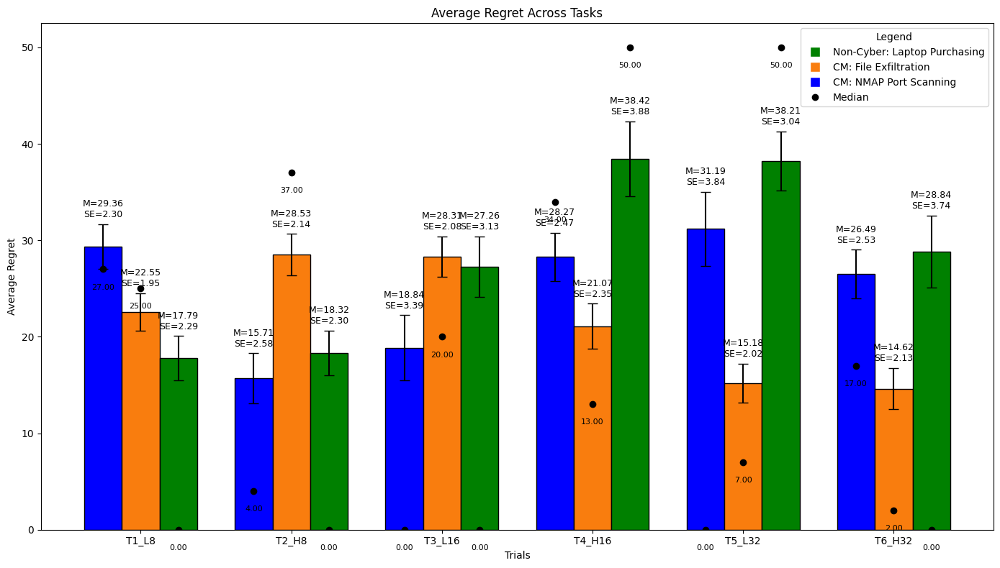

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.lines as mlines

def analyze_task_regret(file_path, task_name, pattern, new_column_names):
    df = pd.read_csv(file_path)
    matched_columns = df.filter(regex=pattern).columns.tolist()

    if matched_columns:
        df.rename(columns=new_column_names, inplace=True)
        matched_data = df[list(new_column_names.values())]
        relevant_rows = matched_data.dropna(how='all')

        average_data = relevant_rows.mean()
        standard_error = relevant_rows.std() / np.sqrt(relevant_rows.count())
        median_data = relevant_rows.median()

        return {
            "Task": task_name,
            "Trials": average_data.index.tolist(),
            "Average Regret": average_data.values,
            "SE": standard_error.values,
            "Median": median_data.values,
            "Relevant Rows": relevant_rows
        }
    else:
        print(f"No columns matching '{pattern}' found for {task_name}.")
        return None

def get_combined_task_data(file_path):
    tasks = [
        {
            "task_name": "CM: File Exfiltration",
            "pattern": r'ci_co_fl_[1-6]_regret',
            "columns": {
                'ci_co_fl_1_regret': 'T1_L8',
                'ci_co_fl_2_regret': 'T2_H8',
                'ci_co_fl_3_regret': 'T3_L16',
                'ci_co_fl_4_regret': 'T4_H16',
                'ci_co_fl_5_regret': 'T5_L32',
                'ci_co_fl_6_regret': 'T6_H32'
            }
        },
        {
            "task_name": "Non-Cyber: Laptop Purchasing",
            "pattern": r'em_co_lp_[1-6]_regret',
            "columns": {
                'em_co_lp_1_regret': 'T1_L8',
                'em_co_lp_2_regret': 'T2_H8',
                'em_co_lp_3_regret': 'T3_L16',
                'em_co_lp_4_regret': 'T4_H16',
                'em_co_lp_5_regret': 'T5_L32',
                'em_co_lp_6_regret': 'T6_H32'
            }
        },
        {
            "task_name": "CM: NMAP Port Scanning",
            "pattern": r'ci_co_nmap_[1-6]_regret',
            "columns": {
                'ci_co_nmap_1_regret': 'T1_L8',
                'ci_co_nmap_2_regret': 'T2_H8',
                'ci_co_nmap_3_regret': 'T3_L16',
                'ci_co_nmap_4_regret': 'T4_H16',
                'ci_co_nmap_5_regret': 'T5_L32',
                'ci_co_nmap_6_regret': 'T6_H32'
            }
        }
    ]

    results = []
    for task in tasks:
        res = analyze_task_regret(file_path, task["task_name"], task["pattern"], task["columns"])
        if res:
            results.append(res)
    return results

def plot_combined_data_with_median(results):
    trials = results[0]["Trials"]
    n_tasks = len(results)
    n_trials = len(trials)
    bar_width = 0.25
    x = np.arange(n_trials)

    plt.figure(figsize=(14, 8))
    task_colors = ['blue', '#f97d0e', 'green']  # NMAP, File Exfiltration, Laptop

    for i, result in enumerate(results):
        bar_positions = x + (i - n_tasks / 2) * bar_width + bar_width / 2
        plt.bar(bar_positions, result["Average Regret"], bar_width,
                yerr=result["SE"], capsize=5, label=result["Task"],
                color=task_colors[i], edgecolor='black')

        for pos, avg, se, median in zip(bar_positions, result["Average Regret"], result["SE"], result["Median"]):
            plt.text(pos, avg + se + 0.5, f'M={avg:.2f}\nSE={se:.2f}',
                     ha='center', va='bottom', fontsize=9)
            plt.plot(pos, median, marker='o', color='black', markersize=6, zorder=5)
            plt.text(pos, median - 1.5, f"{median:.2f}", ha='center', va='top', fontsize=8)

    # Create median dot handle for legend
    median_dot = mlines.Line2D([], [], color='black', marker='o', linestyle='None', markersize=6, label='Median')

    plt.xlabel('Trials')
    plt.ylabel('Average Regret')
    plt.title('Average Regret Across Tasks')
    plt.xticks(x, trials)

    # Corrected legend
    plt.legend(title="Legend", handles=[
        mlines.Line2D([], [], color='white', marker='s', markersize=10,
                      markerfacecolor=task_colors[2], label='Non-Cyber: Laptop Purchasing'),
        mlines.Line2D([], [], color='white', marker='s', markersize=10,
                      markerfacecolor=task_colors[1], label='CM: File Exfiltration'),
        mlines.Line2D([], [], color='white', marker='s', markersize=10,
                      markerfacecolor=task_colors[0], label='CM: NMAP Port Scanning'),
        median_dot
    ])

    plt.tight_layout()
    plt.show()

# Set your file path
file_path = '/content/Updated_Choice_Overload.csv'

results = get_combined_task_data(file_path)

if results:
    plot_combined_data_with_median(results)
else:
    print("No results to plot. Check dataset or column mappings.")

### **Skewed Distribution (Regret)**

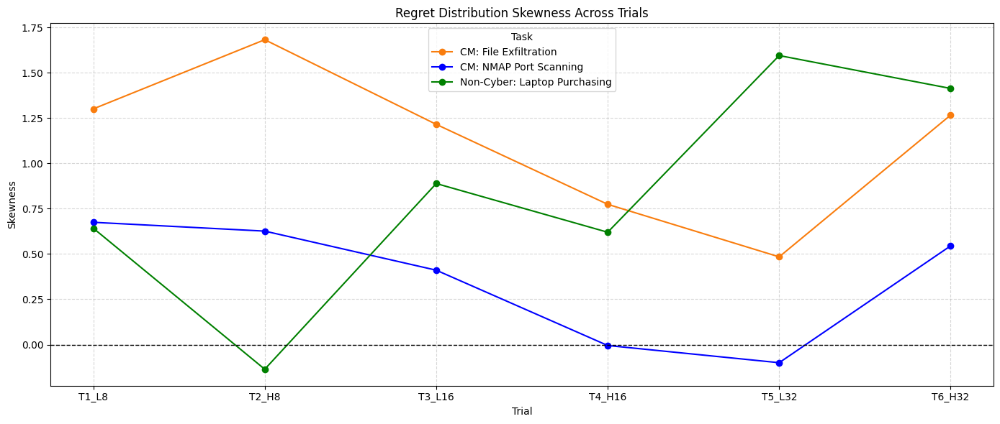

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import skew

# Load the dataset
file_path = '/content/Updated_Choice_Overload.csv'  # Make sure the file is uploaded here
df = pd.read_csv(file_path)

# Define tasks and trial columns
task_definitions = {
    "Non-Cyber: Laptop Purchasing": {
        "pattern": r'em_co_lp_[1-6]_regret',
        "columns": {
            'em_co_lp_1_regret': 'T1_L8',
            'em_co_lp_2_regret': 'T2_H8',
            'em_co_lp_3_regret': 'T3_L16',
            'em_co_lp_4_regret': 'T4_H16',
            'em_co_lp_5_regret': 'T5_L32',
            'em_co_lp_6_regret': 'T6_H32'
        }
    },
    "CM: File Exfiltration": {
        "pattern": r'ci_co_fl_[1-6]_regret',
        "columns": {
            'ci_co_fl_1_regret': 'T1_L8',
            'ci_co_fl_2_regret': 'T2_H8',
            'ci_co_fl_3_regret': 'T3_L16',
            'ci_co_fl_4_regret': 'T4_H16',
            'ci_co_fl_5_regret': 'T5_L32',
            'ci_co_fl_6_regret': 'T6_H32'
        }
    },
    "CM: NMAP Port Scanning": {
        "pattern": r'ci_co_nmap_[1-6]_regret',
        "columns": {
            'ci_co_nmap_1_regret': 'T1_L8',
            'ci_co_nmap_2_regret': 'T2_H8',
            'ci_co_nmap_3_regret': 'T3_L16',
            'ci_co_nmap_4_regret': 'T4_H16',
            'ci_co_nmap_5_regret': 'T5_L32',
            'ci_co_nmap_6_regret': 'T6_H32'
        }
    }
}

# Compute skewness per trial per task
skew_data = []
for task_name, task_info in task_definitions.items():
    df_task = df.rename(columns=task_info["columns"])
    for trial in task_info["columns"].values():
        if trial in df_task.columns:
            values = df_task[trial].dropna()
            trial_skew = skew(values)
            skew_data.append({"Task": task_name, "Trial": trial, "Skewness": trial_skew})

# Create DataFrame
skew_df = pd.DataFrame(skew_data)

# Sort for consistent plotting
trial_order = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']
skew_df["Trial"] = pd.Categorical(skew_df["Trial"], categories=trial_order, ordered=True)
skew_df.sort_values(by=["Trial", "Task"], inplace=True)

# Plotting
plt.figure(figsize=(14, 6))
colors = {
    "Non-Cyber: Laptop Purchasing": "green",
    "CM: File Exfiltration": "#f97d0e",
    "CM: NMAP Port Scanning": "blue"
}

for task in skew_df["Task"].unique():
    subset = skew_df[skew_df["Task"] == task]
    plt.plot(subset["Trial"], subset["Skewness"], marker='o', label=task, color=colors[task])

plt.axhline(0, color='black', linestyle='--', linewidth=1)
plt.title("Regret Distribution Skewness Across Trials")
plt.xlabel("Trial")
plt.ylabel("Skewness")
plt.legend(title="Task")
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd

# Load the dataset
file_path = '/content/Choice_Overload.csv'  # Adjust this path as needed
df = pd.read_csv(file_path)

# Define trial columns and score dictionaries for each task
file_exfiltration_trials = ['ci_co_fl_1', 'ci_co_fl_2', 'ci_co_fl_3', 'ci_co_fl_4', 'ci_co_fl_5', 'ci_co_fl_6']
laptop_purchasing_trials = ['em_co_lp_1', 'em_co_lp_2', 'em_co_lp_3', 'em_co_lp_4', 'em_co_lp_5', 'em_co_lp_6']
nmap_trials = ['ci_co_nmap_1', 'ci_co_nmap_2', 'ci_co_nmap_3', 'ci_co_nmap_4', 'ci_co_nmap_5', 'ci_co_nmap_6']

def find_missing_files(trial_columns, trial_scores, df):
    missing_files_summary = {}
    for i, trial_column in enumerate(trial_columns):
        trial_name = f"Trial {i + 1}"
        file_names = df[trial_column].dropna().tolist()  # Get all files chosen by participants in this trial
        missing_files = [file for file in file_names if file not in trial_scores[trial_name]]
        missing_files_summary[trial_name] = missing_files
    return missing_files_summary

# Find missing files for each task
file_exfiltration_missing = find_missing_files(file_exfiltration_trials, file_exfiltration_scores, df)
laptop_purchasing_missing = find_missing_files(laptop_purchasing_trials, laptop_purchasing_scores, df)
nmap_missing = find_missing_files(nmap_trials, nmap_scores, df)

# Display the results
missing_summary = {
    "File Exfiltration": file_exfiltration_missing,
    "Laptop Purchasing": laptop_purchasing_missing,
    "NMAP": nmap_missing,
}

missing_summary

{'File Exfiltration': {'Trial 1': ['james.jpg'],
  'Trial 2': [],
  'Trial 3': [],
  'Trial 4': [],
  'Trial 5': [],
  'Trial 6': ['capture1.jpg']},
 'Laptop Purchasing': {'Trial 1': [],
  'Trial 2': [],
  'Trial 3': [],
  'Trial 4': [],
  'Trial 5': [],
  'Trial 6': []},
 'NMAP': {'Trial 1': ['192.168.56.104'],
  'Trial 2': ['06:07:42:68:76:AA'],
  'Trial 3': ['192.168.56.106'],
  'Trial 4': ['198.168.56.104:5900'],
  'Trial 5': ['192:168.56.104:'],
  'Trial 6': ['192:168:56:233:42', '192.168.56.109:25']}}

### **Boxplot_Regret**

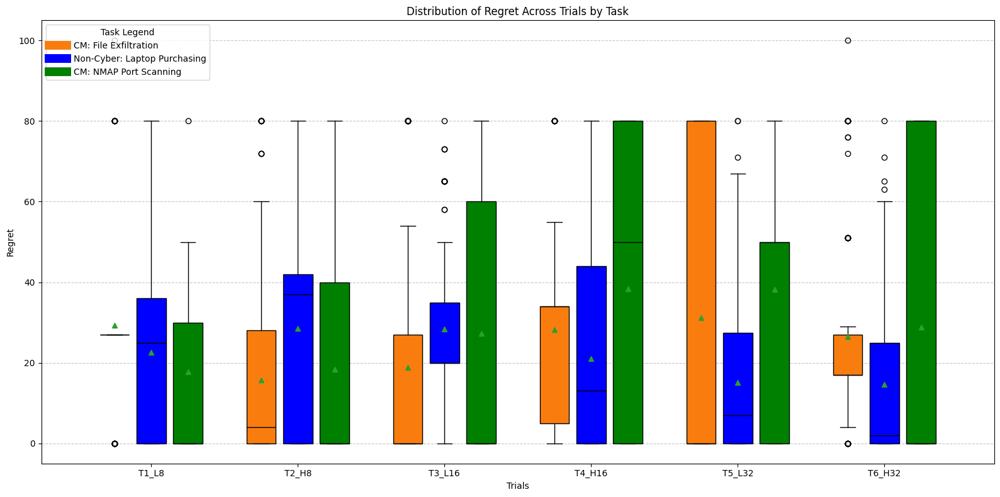

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load your CSV
file_path = '/content/Updated_Choice_Overload.csv'
df = pd.read_csv(file_path)

# Define tasks, columns, and colors
tasks = [
    {
        "task_name": "CM: File Exfiltration",
        "columns": {
            'ci_co_fl_1_regret': 'T1_L8',
            'ci_co_fl_2_regret': 'T2_H8',
            'ci_co_fl_3_regret': 'T3_L16',
            'ci_co_fl_4_regret': 'T4_H16',
            'ci_co_fl_5_regret': 'T5_L32',
            'ci_co_fl_6_regret': 'T6_H32'
        },
        "color": '#f97d0e'
    },
    {
        "task_name": "Non-Cyber: Laptop Purchasing",
        "columns": {
            'em_co_lp_1_regret': 'T1_L8',
            'em_co_lp_2_regret': 'T2_H8',
            'em_co_lp_3_regret': 'T3_L16',
            'em_co_lp_4_regret': 'T4_H16',
            'em_co_lp_5_regret': 'T5_L32',
            'em_co_lp_6_regret': 'T6_H32'
        },
        "color": 'blue'
    },
    {
        "task_name": "CM: NMAP Port Scanning",
        "columns": {
            'ci_co_nmap_1_regret': 'T1_L8',
            'ci_co_nmap_2_regret': 'T2_H8',
            'ci_co_nmap_3_regret': 'T3_L16',
            'ci_co_nmap_4_regret': 'T4_H16',
            'ci_co_nmap_5_regret': 'T5_L32',
            'ci_co_nmap_6_regret': 'T6_H32'
        },
        "color": 'green'
    }
]

# Setup for boxplot data
boxplot_data = []
positions = []
colors = []
offsets = [-0.25, 0.0, 0.25]  # For side-by-side positioning
x = np.arange(6)

# Prepare data for boxplot
for i, task in enumerate(tasks):
    renamed_columns = task["columns"]
    if all(col in df.columns for col in renamed_columns.keys()):
        temp_df = df[list(renamed_columns.keys())].rename(columns=renamed_columns)
        for j, trial in enumerate(renamed_columns.values()):
            boxplot_data.append(temp_df[trial].dropna())
            positions.append(x[j] + offsets[i])
            colors.append(task["color"])
    else:
        print(f"Missing columns for {task['task_name']}, skipping.")

# Plot
plt.figure(figsize=(16, 8))
bp = plt.boxplot(boxplot_data, positions=positions, widths=0.2, patch_artist=True, showmeans=True)

# Apply colors
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_edgecolor('black')
for element in ['whiskers', 'caps', 'medians', 'means']:
    for line in bp[element]:
        line.set_color('black')

# Customize labels
plt.xticks(x, ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32'])
plt.xlabel("Trials")
plt.ylabel("Regret")
plt.title("Distribution of Regret Across Trials by Task")

# Create legend
legend_handles = [
    plt.Line2D([0], [0], color=task['color'], lw=10, label=task['task_name'])
    for task in tasks
]
plt.legend(handles=legend_handles, title="Task Legend", loc="upper left")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

#### **Outlier Count_Regret**

In [ ]:
import pandas as pd
import numpy as np

# Load your dataset
file_path = '/content/Updated_Choice_Overload.csv'
df = pd.read_csv(file_path)

# Define the task structures
tasks = [
    {
        "task_name": "CM: File Exfiltration",
        "columns": {
            'ci_co_fl_1_regret': 'T1_L8',
            'ci_co_fl_2_regret': 'T2_H8',
            'ci_co_fl_3_regret': 'T3_L16',
            'ci_co_fl_4_regret': 'T4_H16',
            'ci_co_fl_5_regret': 'T5_L32',
            'ci_co_fl_6_regret': 'T6_H32'
        }
    },
    {
        "task_name": "Non-Cyber: Laptop Purchasing",
        "columns": {
            'em_co_lp_1_regret': 'T1_L8',
            'em_co_lp_2_regret': 'T2_H8',
            'em_co_lp_3_regret': 'T3_L16',
            'em_co_lp_4_regret': 'T4_H16',
            'em_co_lp_5_regret': 'T5_L32',
            'em_co_lp_6_regret': 'T6_H32'
        }
    },
    {
        "task_name": "CM: NMAP Port Scanning",
        "columns": {
            'ci_co_nmap_1_regret': 'T1_L8',
            'ci_co_nmap_2_regret': 'T2_H8',
            'ci_co_nmap_3_regret': 'T3_L16',
            'ci_co_nmap_4_regret': 'T4_H16',
            'ci_co_nmap_5_regret': 'T5_L32',
            'ci_co_nmap_6_regret': 'T6_H32'
        }
    }
]

# Calculate outlier counts using IQR method
outlier_counts = []

for task in tasks:
    temp_df = df[list(task["columns"].keys())].rename(columns=task["columns"])
    for trial in task["columns"].values():
        values = temp_df[trial].dropna()
        q1 = np.percentile(values, 25)
        q3 = np.percentile(values, 75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        outliers = values[(values < lower_bound) | (values > upper_bound)]
        outlier_counts.append({
            "Task": task["task_name"],
            "Trial": trial,
            "Outlier Count": len(outliers)
        })

# Convert to DataFrame and display
outlier_df = pd.DataFrame(outlier_counts)
print(outlier_df)

                            Task   Trial  Outlier Count
0          CM: File Exfiltration   T1_L8             28
1          CM: File Exfiltration   T2_H8             10
2          CM: File Exfiltration  T3_L16             19
3          CM: File Exfiltration  T4_H16             11
4          CM: File Exfiltration  T5_L32              0
5          CM: File Exfiltration  T6_H32             35
6   Non-Cyber: Laptop Purchasing   T1_L8              0
7   Non-Cyber: Laptop Purchasing   T2_H8              0
8   Non-Cyber: Laptop Purchasing  T3_L16             16
9   Non-Cyber: Laptop Purchasing  T4_H16              0
10  Non-Cyber: Laptop Purchasing  T5_L32              3
11  Non-Cyber: Laptop Purchasing  T6_H32              4
12        CM: NMAP Port Scanning   T1_L8              1
13        CM: NMAP Port Scanning   T2_H8              0
14        CM: NMAP Port Scanning  T3_L16              0
15        CM: NMAP Port Scanning  T4_H16              0
16        CM: NMAP Port Scanning  T5_L32        

###**ANOVA**

In [ ]:
from scipy.stats import f
import pandas as pd
import numpy as np

def calculate_anova_regret(task_results):
    """
    Calculate ANOVA for regret values using means and standard errors.

    Args:
        task_results (dict): Dictionary containing regret means, SEs, and task label.

    Returns:
        pd.DataFrame: ANOVA results summary.
    """
    trials = task_results["Trials"]
    avg_regrets = np.array(task_results["Average Regret"])
    std_errors = np.array(task_results["SE"])

    # Get number of participants per trial from the data
    relevant_data = task_results["Relevant Rows"]
    participant_counts = relevant_data.count()  # Series of counts per trial
    n_i = participant_counts.values

    # Convert SE to SD using SE = SD / sqrt(n) -> SD = SE * sqrt(n)
    SDs = std_errors * np.sqrt(n_i)

    # Overall mean
    grand_mean = np.sum(avg_regrets * n_i) / np.sum(n_i)

    # Between-group sum of squares (SSB)
    SSB = np.sum(n_i * (avg_regrets - grand_mean)**2)

    # Within-group sum of squares (SSW)
    SSW = np.sum((n_i - 1) * (SDs ** 2))

    # Degrees of freedom
    df_B = len(trials) - 1
    df_W = np.sum(n_i) - len(trials)

    # Mean squares
    MSB = SSB / df_B
    MSW = SSW / df_W

    # F-statistic
    F_ratio = MSB / MSW
    p_value = f.sf(F_ratio, df_B, df_W)
    significant = "Yes" if p_value <= 0.05 else "No"

    # Return results
    result_df = pd.DataFrame({
        "Task": [task_results["Task"]],
        "SSB": [SSB],
        "SSW": [SSW],
        "F-ratio": [F_ratio],
        "df_B": [df_B],
        "df_W": [df_W],
        "p-value": [p_value],
        "Significant": [significant]
    })

    return result_df

anova_results_regret = []
for result in results:
    anova_results_regret.append(calculate_anova_regret(result))

# Print results
for table in anova_results_regret:
    print(f"\nANOVA Results for {table['Task'][0]} (Regret):\n")
    print(table)


ANOVA Results for CM: File Exfiltration (Regret):

                    Task          SSB            SSW   F-ratio  df_B  df_W  \
0  CM: File Exfiltration  18483.27193  452843.431579  4.604048     5   564   

    p-value Significant  
0  0.000399         Yes  

ANOVA Results for Non-Cyber: Laptop Purchasing (Regret):

                           Task           SSB            SSW   F-ratio  df_B  \
0  Non-Cyber: Laptop Purchasing  17477.487719  239266.168421  8.239613     5   

   df_W       p-value Significant  
0   564  1.587833e-07         Yes  

ANOVA Results for CM: NMAP Port Scanning (Regret):

                     Task          SSB            SSW   F-ratio  df_B  df_W  \
0  CM: NMAP Port Scanning  39142.45614  524086.315789  8.424698     5   564   

        p-value Significant  
0  1.062857e-07         Yes  


####**Pairwise T Test Analysis**

In [ ]:
from scipy.stats import ttest_ind
import pandas as pd

def extract_trial_data_for_t_tests(task_results):
    """
    Extract actual participant-level data per trial for t-tests.

    Args:
        task_results (dict): Contains 'Relevant Rows' from a task.

    Returns:
        dict: Trial-wise actual regret values.
    """
    relevant_data = task_results["Relevant Rows"]
    trial_data = {trial: relevant_data[trial].dropna().tolist() for trial in relevant_data.columns}
    return trial_data


def pairwise_t_tests(trial_data, task_name):
    """
    Perform pairwise t-tests on actual regret data per trial.

    Args:
        trial_data (dict): Dictionary of trial -> list of participant regrets.
        task_name (str): Name of the task.

    Returns:
        pd.DataFrame: DataFrame containing t-test results.
    """
    trials = list(trial_data.keys())
    results = []

    for i in range(len(trials)):
        for j in range(i + 1, len(trials)):
            t_stat, p_value = ttest_ind(
                trial_data[trials[i]],
                trial_data[trials[j]],
                equal_var=False  # Welch’s t-test
            )
            results.append({
                "Task": task_name,
                "Trial 1": trials[i],
                "Trial 2": trials[j],
                "t-statistic": t_stat,
                "p-value": p_value,
                "Significant": "Yes" if p_value < 0.05 else "No"
            })

    return pd.DataFrame(results)

# Run t-tests for each task
all_t_tests = []

for task_result in results:
    trial_data = extract_trial_data_for_t_tests(task_result)
    t_test_result = pairwise_t_tests(trial_data, task_result["Task"])
    all_t_tests.append(t_test_result)

# Combine and display all t-test results
combined_t_tests = pd.concat(all_t_tests, ignore_index=True)
print(combined_t_tests)

# Optionally export to CSV
# combined_t_tests.to_csv("pairwise_t_tests_regret.csv", index=False)

                            Task Trial 1 Trial 2  t-statistic       p-value  \
0          CM: File Exfiltration   T1_L8   T2_H8     3.945530  1.128405e-04   
1          CM: File Exfiltration   T1_L8  T3_L16     2.567366  1.113179e-02   
2          CM: File Exfiltration   T1_L8  T4_H16     0.320711  7.487872e-01   
3          CM: File Exfiltration   T1_L8  T5_L32    -0.408970  6.831308e-01   
4          CM: File Exfiltration   T1_L8  T6_H32     0.837418  4.034299e-01   
5          CM: File Exfiltration   T2_H8  T3_L16    -0.736452  4.624381e-01   
6          CM: File Exfiltration   T2_H8  T4_H16    -3.513739  5.536914e-04   
7          CM: File Exfiltration   T2_H8  T5_L32    -3.345416  1.017747e-03   
8          CM: File Exfiltration   T2_H8  T6_H32    -2.986096  3.202044e-03   
9          CM: File Exfiltration  T3_L16  T4_H16    -2.248311  2.582538e-02   
10         CM: File Exfiltration  T3_L16  T5_L32    -2.411057  1.688412e-02   
11         CM: File Exfiltration  T3_L16  T6_H32    

##**Normalized Average Regret**

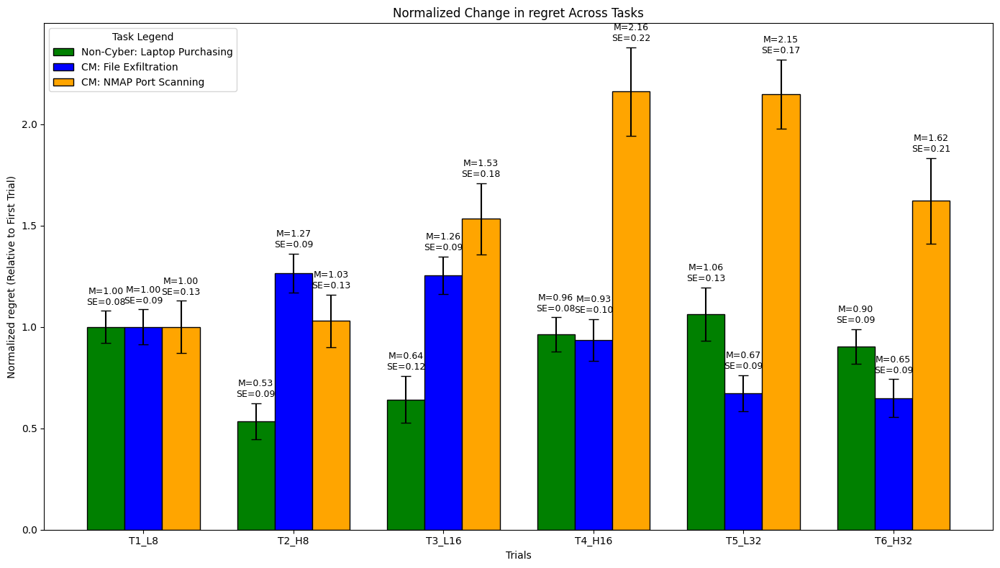

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def analyze_task(file_path, task_name, pattern, new_column_names):
    """
    Analyze a specific task, calculate normalized regret, and return the data for combined visualization.

    Args:
        file_path (str): Path to the dataset.
        task_name (str): Name of the task being analyzed.
        pattern (str): Regex pattern to match relevant columns in the dataset.
        new_column_names (dict): Dictionary to map old column names to new names.

    Returns:
        dict: Normalized regret and SE values for the task.
    """
    df = pd.read_csv(file_path)

    matched_columns = df.filter(regex=pattern).columns.tolist()

    if matched_columns:
        matched_data = df[matched_columns]
        relevant_rows = matched_data.dropna(how='all')
        average_data = relevant_rows.mean()

        # Calculate standard error for each trial
        standard_error = relevant_rows.std() / np.sqrt(relevant_rows.count())

        trial_1_avg = average_data[matched_columns[0]]  # Use the first column as the baseline
        normalized_change = average_data / trial_1_avg  # Normalized change
        normalized_se = standard_error / trial_1_avg  # Normalized standard error

        # Rename columns for visualization
        trials = [new_column_names.get(col, col) for col in matched_columns]
        normalized_regret = normalized_change.values
        normalized_se_values = normalized_se.values

        return {
            "Task": task_name,
            "Trials": trials,
            "Normalized regret": normalized_regret,
            "Normalized SE": normalized_se_values
        }

    else:
        print(f"No columns matching '{pattern}' found for {task_name}.")
        return None


def plot_combined_data(results):
    """
    Plot combined data for all tasks in a single graph with bars grouped by trial.

    Args:
        results (list): List of dictionaries containing results from individual tasks.
    """
    trials = results[0]["Trials"]
    n_tasks = len(results)
    n_trials = len(trials)

    bar_width = 0.25
    x = np.arange(n_trials)  # Position of bars on x-axis

    plt.figure(figsize=(14, 8))

    # Define colors for each task
    task_colors = ['green', 'blue', 'orange']  # Colors for Laptop Purchasing, File Exfiltration, and NMAP

    for i, result in enumerate(results):
        # Position bars for each task
        bar_positions = x + (i - n_tasks / 2) * bar_width + bar_width / 2
        plt.bar(bar_positions, result["Normalized regret"], bar_width,
                yerr=result["Normalized SE"], capsize=5, label=result["Task"],
                color=task_colors[i], edgecolor='black')

        # Add M and SE annotations above bars
        for pos, regret, se in zip(bar_positions, result["Normalized regret"], result["Normalized SE"]):
            plt.text(pos, regret + se + 0.02, f'M={regret:.2f}\nSE={se:.2f}',
                     ha='center', va='bottom', fontsize=9)

    plt.xlabel('Trials')
    plt.ylabel('Normalized regret (Relative to First Trial)')
    plt.title('Normalized Change in regret Across Tasks')
    plt.xticks(x, trials)  # Label trials
    plt.legend(title="Task Legend", labels=[
        'Non-Cyber: Laptop Purchasing',
        'CM: File Exfiltration',
        'CM: NMAP Port Scanning'
    ])
    plt.tight_layout()
    plt.show()


# File paths and analysis details
file_path = '/content/Updated_Choice_Overload.csv'

# Task 1: File Exfiltration
file_exfiltration_results = analyze_task(
    file_path,
    task_name="CM: File Exfiltration",
    pattern=r'ci_co_fl_[1-6]_regret',
    new_column_names={
        'ci_co_fl_1_regret': 'T1_L8',
        'ci_co_fl_2_regret': 'T2_H8',
        'ci_co_fl_3_regret': 'T3_L16',
        'ci_co_fl_4_regret': 'T4_H16',
        'ci_co_fl_5_regret': 'T5_L32',
        'ci_co_fl_6_regret': 'T6_H32'
    }
)

# Task 2: Laptop Purchasing
laptop_purchasing_results = analyze_task(
    file_path,
    task_name="Non-Cyber: Laptop Purchasing",
    pattern=r'em_co_lp_[1-6]_regret',
    new_column_names={
        'em_co_lp_1_regret': 'T1_L8',
        'em_co_lp_2_regret': 'T2_H8',
        'em_co_lp_3_regret': 'T3_L16',
        'em_co_lp_4_regret': 'T4_H16',
        'em_co_lp_5_regret': 'T5_L32',
        'em_co_lp_6_regret': 'T6_H32',
    }
)

# Task 3: NMAP Example
nmap_results = analyze_task(
    file_path,
    task_name="CM: NMAP Port Scanning",
    pattern=r'ci_co_nmap_[1-6]_regret',
    new_column_names={
        'ci_co_nmap_1_regret': 'T1_L8',
        'ci_co_nmap_2_regret': 'T2_H8',
        'ci_co_nmap_3_regret': 'T3_L16',
        'ci_co_nmap_4_regret': 'T4_H16',
        'ci_co_nmap_5_regret': 'T5_L32',
        'ci_co_nmap_6_regret': 'T6_H32',
    }
)

# Combine results for visualization
results = []
if file_exfiltration_results:
    results.append(file_exfiltration_results)
if laptop_purchasing_results:
    results.append(laptop_purchasing_results)
if nmap_results:
    results.append(nmap_results)

# Plot combined data
plot_combined_data(results)

**ANOVA**

In [ ]:
from scipy.stats import f
import pandas as pd

def calculate_anova_normalized_regret(task_results):
    """
    Calculate ANOVA for normalized regrets, including p-value and significance.

    Args:
        task_results (dict): Dictionary containing "Trials", "Normalized Avg Regrets",
                             "Normalized Std Errors", and "Task".

    Returns:
        pd.DataFrame: DataFrame containing ANOVA results for the task.
    """
    trials = task_results["Trials"]
    normalized_avg_regrets = np.array(task_results["Normalized Avg Regrets"])
    normalized_std_errors = np.array(task_results["Normalized Std Errors"])
    n_i = len(normalized_avg_regrets)  # Assuming equal participants across trials

    # Calculate overall mean
    M_T = np.mean(normalized_avg_regrets)

    # Between-Trial Sum of Squares (SSB)
    SSB = n_i * np.sum((normalized_avg_regrets - M_T) ** 2)

    # Within-Trial Sum of Squares (SSW)
    SD = normalized_std_errors * np.sqrt(n_i)  # Convert SE to SD
    SSW = np.sum((n_i - 1) * (SD ** 2))

    # Degrees of Freedom
    df_B = len(trials) - 1
    df_W = (n_i * len(trials)) - len(trials)

    # Mean Squares
    MS_B = SSB / df_B
    MS_W = SSW / df_W

    # F-ratio
    F_ratio = MS_B / MS_W

    # Calculate p-value using the F-distribution
    p_value = f.sf(F_ratio, df_B, df_W)

    # Determine significance
    is_significant = "Yes" if p_value <= 0.05 else "No"

    # Create a DataFrame for results
    results_df = pd.DataFrame({
        "Task": [task_results["Task"]],
        "SSB": [SSB],
        "SSW": [SSW],
        "F-ratio": [F_ratio],
        "df_B": [df_B],
        "df_W": [df_W],
        "p-value": [p_value],
        "Significant": [is_significant]
    })

    return results_df

# Perform ANOVA for each normalized task
anova_results_normalized_regret = []
for result in normalized_results:
    anova_results_normalized_regret.append(calculate_anova_normalized_regret(result))

# Display results in separate tables
for i, table in enumerate(anova_results_normalized_regret):
    print(f"\nANOVA Results for {table['Task'][0]} (Normalized Regret):\n")
    print(table)

NameError: name 'normalized_results' is not defined

# **Covariate- Time**

##**Correlation Matrix- with column features**


Correlation Matrix for Non-Cyber: Laptop Purchasing:
                                                       T1_L8     T2_H8  \
Age_21.0                                            0.150739  0.063499   
Age_22.0                                            0.213037  0.129371   
Age_23.0                                           -0.035640 -0.091318   
Age_24.0                                           -0.099065 -0.119172   
Age_25.0                                           -0.071119  0.003899   
...                                                      ...       ...   
PracticalExperience_I have some hands-on experi...  0.121406  0.196046   
Courses_1-2 courses                                -0.032882  0.148150   
Courses_3 - 5 courses                               0.124571  0.059840   
Courses_5+ courses                                 -0.059658 -0.165028   
Courses_No formal training                         -0.067337 -0.033742   

                                                      T3_

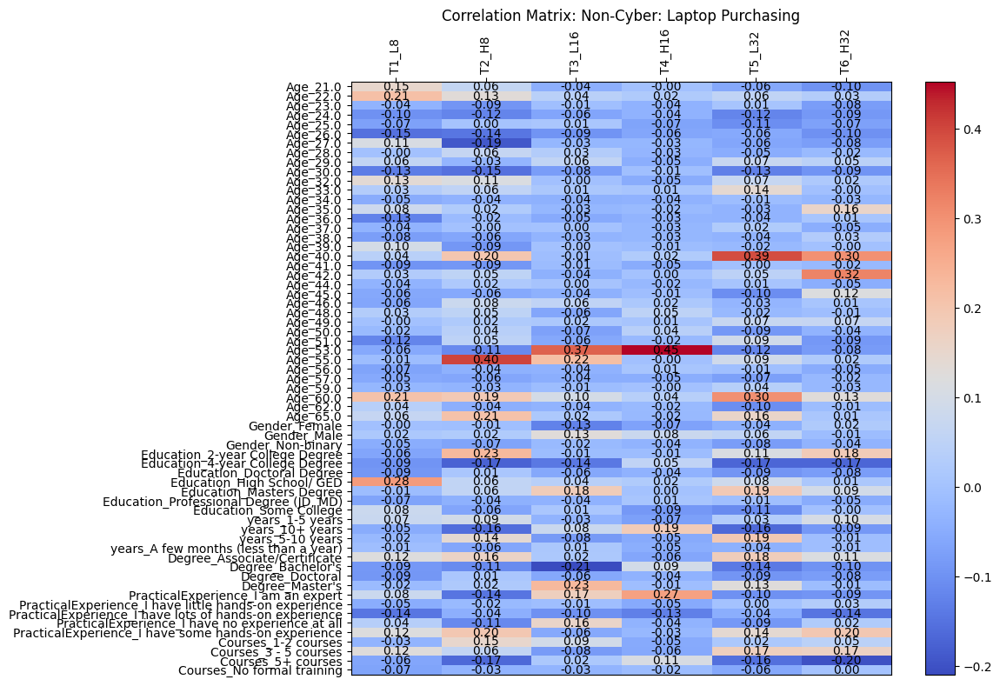


Correlation Matrix for CM: File Exfiltration:
                                                       T1_L8     T2_H8  \
Age_21.0                                           -0.003971 -0.048467   
Age_22.0                                           -0.032878 -0.048309   
Age_23.0                                           -0.007078 -0.001244   
Age_24.0                                            0.059909  0.037632   
Age_25.0                                           -0.017156 -0.036889   
...                                                      ...       ...   
PracticalExperience_I have some hands-on experi... -0.062458  0.257424   
Courses_1-2 courses                                -0.034008  0.044664   
Courses_3 - 5 courses                               0.148818  0.048222   
Courses_5+ courses                                 -0.091488 -0.012287   
Courses_No formal training                         -0.048753 -0.143921   

                                                      T3_L16    

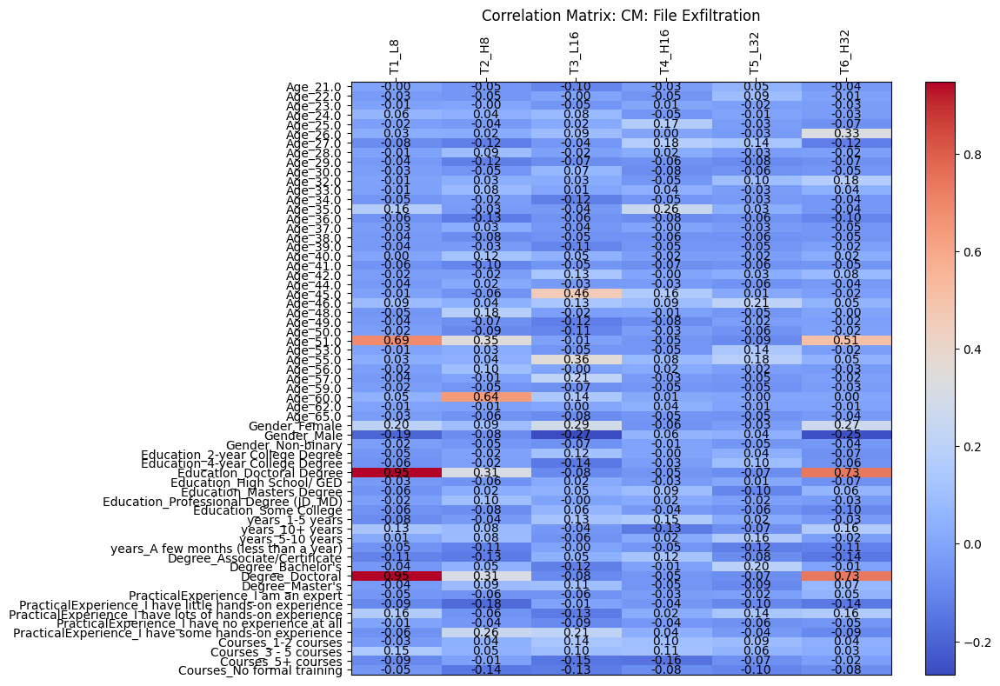


Correlation Matrix for CM: NMAP Port Scanning:
                                                       T1_L8     T2_H8  \
Age_21.0                                           -0.059337  0.278285   
Age_22.0                                           -0.055799 -0.064662   
Age_23.0                                           -0.057726 -0.066634   
Age_24.0                                           -0.057771 -0.060909   
Age_25.0                                           -0.064282 -0.064866   
...                                                      ...       ...   
PracticalExperience_I have some hands-on experi... -0.162295 -0.022840   
Courses_1-2 courses                                 0.024427 -0.127705   
Courses_3 - 5 courses                               0.153842  0.206180   
Courses_5+ courses                                 -0.125546 -0.057150   
Courses_No formal training                         -0.088177 -0.072008   

                                                      T3_L16   

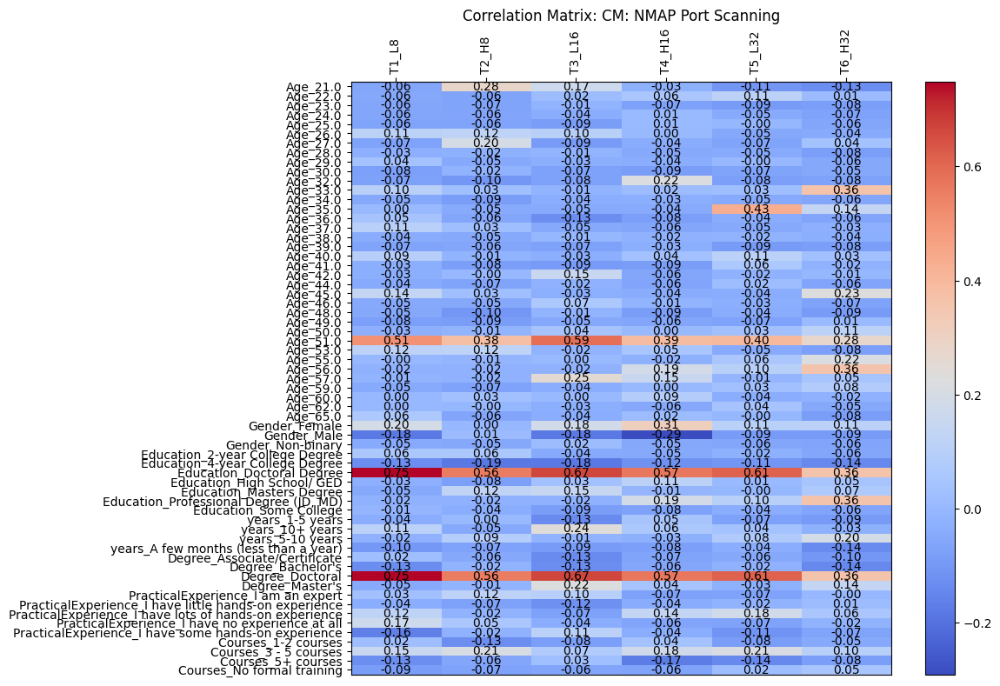

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def analyze_task_raw(file_path, task_name, pattern, new_column_names):
    df = pd.read_csv(file_path)
    matched_columns = df.filter(regex=pattern).columns.tolist()
    if matched_columns:
        df.rename(columns=new_column_names, inplace=True)
        matched_data = df[list(new_column_names.values())]
        relevant_rows = matched_data.dropna(how='all')
        return relevant_rows
    else:
        print(f"No columns matching '{pattern}' found for {task_name}.")
        return None

def gather_task_data(file_path, task_name, pattern, new_column_names):
    task_data = analyze_task_raw(
        file_path,
        task_name=task_name,
        pattern=pattern,
        new_column_names=new_column_names
    )
    return task_data

def one_hot_encode_columns(df, columns):
    """
    Apply one-hot encoding to categorical columns.

    Args:
        df (pd.DataFrame): Input dataframe.
        columns (list): List of categorical columns to encode.

    Returns:
        pd.DataFrame: Dataframe with one-hot encoded columns.
    """
    df_encoded = pd.get_dummies(df, columns=columns, drop_first=False)
    return df_encoded

def clean_columns(df):
    # Clean Age column by replacing '65+' with 65 and converting to numeric
    if 'Age' in df.columns:
        df['Age'] = df['Age'].replace('65+', 65)
        df['Age'] = pd.to_numeric(df['Age'], errors='coerce')
    return df

def compute_correlation_matrix(file_path, relevant_columns, task_name, pattern, new_column_names):
    df = pd.read_csv(file_path)
    task_data = gather_task_data(file_path, task_name, pattern, new_column_names)
    if task_data is not None:
        # Filter to include only relevant columns
        relevant_df = df[relevant_columns].copy()
        # Clean columns
        relevant_df = clean_columns(relevant_df)
        # Apply one-hot encoding
        relevant_df = one_hot_encode_columns(relevant_df, columns=relevant_columns)
        # Merge relevant columns with task data
        combined_data = pd.concat([relevant_df, task_data], axis=1).dropna()  # Drop rows with missing values
        # Ensure all columns are numeric
        combined_data = combined_data.apply(pd.to_numeric, errors='coerce').dropna()
        # Compute correlation matrix
        correlation_matrix = combined_data.corr()
        return correlation_matrix.loc[relevant_df.columns, task_data.columns]
    else:
        print(f"{task_name} data could not be gathered.")
        return None

def plot_correlation_matrix(correlation_matrix, task_name):
    plt.figure(figsize=(12, 8))
    plt.imshow(correlation_matrix, cmap='coolwarm', aspect='auto')
    plt.colorbar()
    plt.xticks(range(correlation_matrix.shape[1]), correlation_matrix.columns, rotation=90)
    plt.yticks(range(correlation_matrix.shape[0]), correlation_matrix.index)
    plt.title(f"Correlation Matrix: {task_name}", loc='center')

    for (i, j), val in np.ndenumerate(correlation_matrix.values):  # Annotate each cell with the correlation value
        plt.text(j, i, f"{val:.2f}", ha='center', va='center', color='black')

    plt.gca().xaxis.tick_top()  # Move X-axis to the top
    plt.tight_layout()
    plt.show()

file_path = '/content/Choice_Overload.csv'
relevant_columns = ['Age','Gender', 'Education', 'years', 'Degree', 'PracticalExperience', 'Courses']

tasks = [
    {
        "task_name": "Non-Cyber: Laptop Purchasing",
        "pattern": r'em_co_lp_[1-6]_timer',
        "new_column_names": {
            'em_co_lp_1_timer': 'T1_L8',
            'em_co_lp_2_timer': 'T2_H8',
            'em_co_lp_3_timer': 'T3_L16',
            'em_co_lp_4_timer': 'T4_H16',
            'em_co_lp_5_timer': 'T5_L32',
            'em_co_lp_6_timer': 'T6_H32'
        }
    },
    {
        "task_name": "CM: File Exfiltration",
        "pattern": r'ci_co_fl_[1-6]_timer',
        "new_column_names": {
            'ci_co_fl_1_timer': 'T1_L8',
            'ci_co_fl_2_timer': 'T2_H8',
            'ci_co_fl_3_timer': 'T3_L16',
            'ci_co_fl_4_timer': 'T4_H16',
            'ci_co_fl_5_timer': 'T5_L32',
            'ci_co_fl_6_timer': 'T6_H32'
        }
    },
    {
        "task_name": "CM: NMAP Port Scanning",
        "pattern": r'ci_co_nmap_[1-6]_timer',
        "new_column_names": {
            'ci_co_nmap_1_timer': 'T1_L8',
            'ci_co_nmap_2_timer': 'T2_H8',
            'ci_co_nmap_3_timer': 'T3_L16',
            'ci_co_nmap_4_timer': 'T4_H16',
            'ci_co_nmap_5_timer': 'T5_L32',
            'ci_co_nmap_6_timer': 'T6_H32'
        }
    }
]

# Compute and plot correlation matrices for all tasks
for task in tasks:
    correlation_matrix = compute_correlation_matrix(
        file_path,
        relevant_columns,
        task_name=task["task_name"],
        pattern=task["pattern"],
        new_column_names=task["new_column_names"]
    )

    if correlation_matrix is not None:
        print(f"\nCorrelation Matrix for {task['task_name']}:")
        print(correlation_matrix)
        plot_correlation_matrix(correlation_matrix, task["task_name"])
    else:
        print(f"Correlation matrix for {task['task_name']} could not be generated.")

##**Correlation Matrix_Time**


Correlation Matrix for Non-Cyber: Laptop Purchasing:
                        T1_L8     T2_H8    T3_L16    T4_H16    T5_L32  \
Age                 -0.002643  0.011176  0.001046 -0.001448  0.008090   
Gender              -0.012094 -0.016676 -0.005945 -0.009455 -0.019806   
Education            0.005595  0.011743 -0.002210 -0.006813  0.000762   
years               -0.001553  0.004598 -0.006934  0.003326  0.004666   
Degree              -0.017818  0.020815 -0.005778 -0.003504  0.019106   
PracticalExperience  0.008724 -0.024716  0.033036  0.006116 -0.017632   
Courses             -0.008826  0.002305 -0.000689 -0.004525 -0.005272   

                       T6_H32  
Age                  0.004630  
Gender              -0.008794  
Education           -0.001402  
years               -0.001876  
Degree              -0.019090  
PracticalExperience  0.002185  
Courses              0.003263  


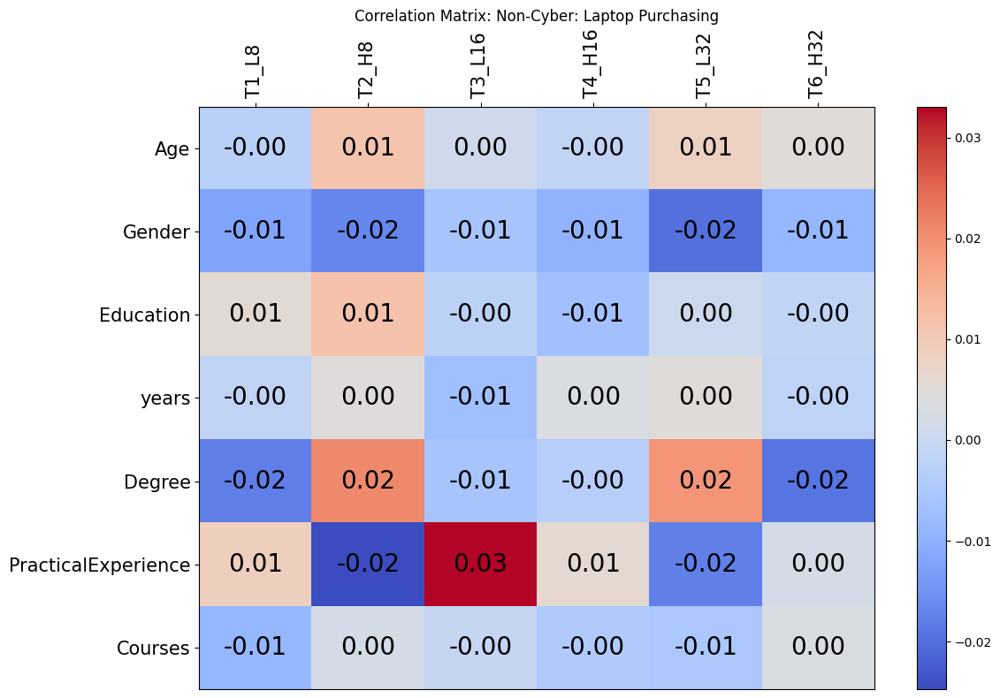


Correlation Matrix for CM: File Exfiltration:
                        T1_L8     T2_H8    T3_L16    T4_H16    T5_L32  \
Age                  0.007911  0.016588  0.014471  0.000831 -0.002035   
Gender              -0.003960 -0.011155 -0.014701 -0.003226 -0.011612   
Education            0.095401  0.037232  0.002258 -0.005551 -0.014180   
years                0.001502  0.003149  0.005639 -0.004094 -0.001939   
Degree               0.190503  0.077148 -0.013382  0.001410 -0.012214   
PracticalExperience -0.008734 -0.016657 -0.015561 -0.010211 -0.016142   
Courses             -0.006358 -0.015831 -0.009839 -0.005102 -0.009211   

                       T6_H32  
Age                  0.006043  
Gender              -0.008500  
Education            0.067356  
years               -0.002044  
Degree               0.163414  
PracticalExperience -0.012807  
Courses             -0.008110  


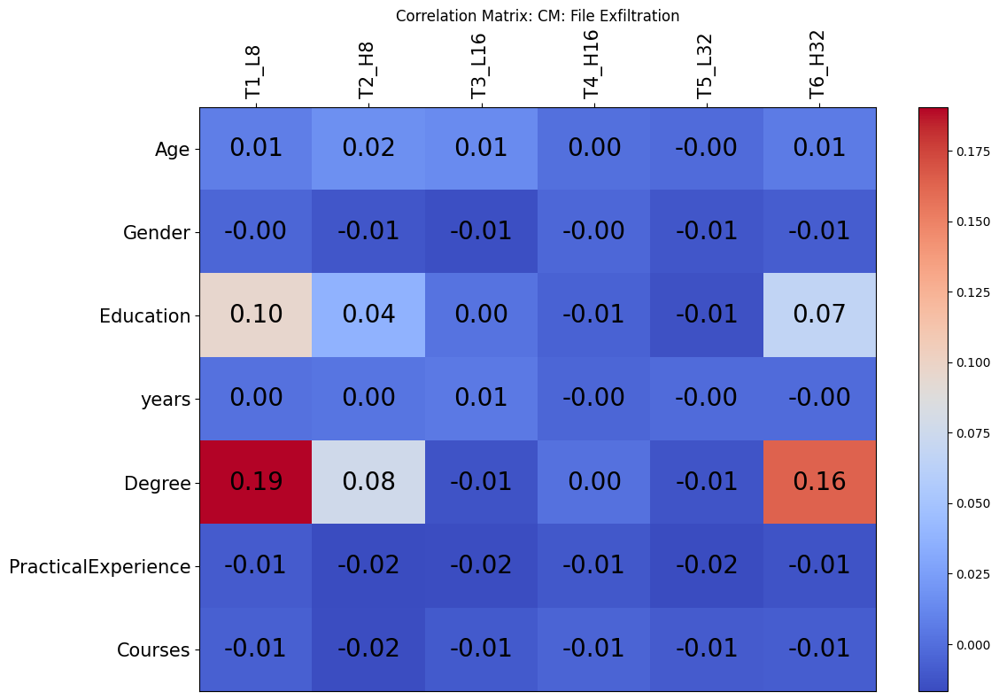


Correlation Matrix for CM: NMAP Port Scanning:
                        T1_L8     T2_H8    T3_L16    T4_H16    T5_L32  \
Age                  0.006096 -0.004040  0.006224  0.004529  0.008706   
Gender              -0.010107 -0.013138  0.005055 -0.011288 -0.013177   
Education            0.081317  0.059514  0.073468  0.088297  0.078098   
years               -0.012233 -0.005567 -0.000401  0.001329  0.001077   
Degree               0.148681  0.117629  0.155218  0.122084  0.127395   
PracticalExperience  0.025236  0.010852 -0.005698 -0.016101 -0.016517   
Courses             -0.008864 -0.012671 -0.010501 -0.005121  0.000432   

                       T6_H32  
Age                  0.013882  
Gender              -0.015152  
Education            0.081000  
years               -0.015095  
Degree               0.062582  
PracticalExperience -0.002796  
Courses              0.005347  


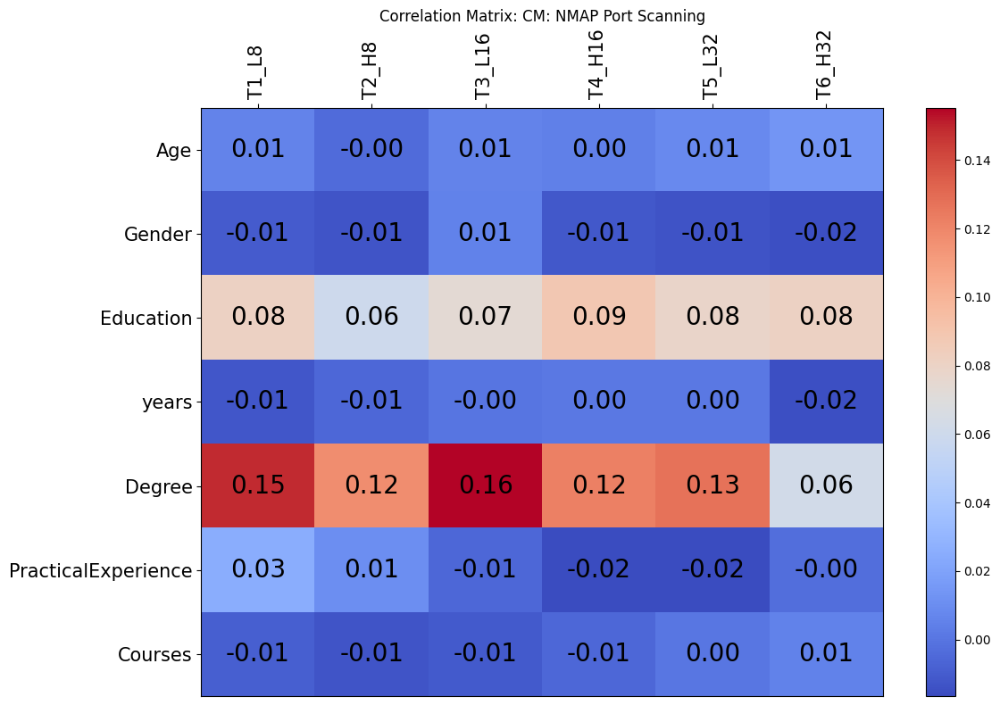

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def analyze_task_raw(file_path, task_name, pattern, new_column_names):
    df = pd.read_csv(file_path)
    matched_columns = df.filter(regex=pattern).columns.tolist()
    if matched_columns:
        df.rename(columns=new_column_names, inplace=True)
        matched_data = df[list(new_column_names.values())]
        relevant_rows = matched_data.dropna(how='all')
        return relevant_rows
    else:
        print(f"No columns matching '{pattern}' found for {task_name}.")
        return None

def gather_task_data(file_path, task_name, pattern, new_column_names):
    task_data = analyze_task_raw(
        file_path,
        task_name=task_name,
        pattern=pattern,
        new_column_names=new_column_names
    )
    return task_data

def one_hot_encode_columns(df, columns):
    """
    Apply one-hot encoding to categorical columns.

    Args:
        df (pd.DataFrame): Input dataframe.
        columns (list): List of categorical columns to encode.

    Returns:
        pd.DataFrame: Dataframe with one-hot encoded columns.
    """
    df_encoded = pd.get_dummies(df, columns=columns, drop_first=False)
    return df_encoded

def clean_columns(df):
    # Clean Age column by replacing '65+' with 65 and converting to numeric
    if 'Age' in df.columns:
        df['Age'] = df['Age'].replace('65+', 65)
        df['Age'] = pd.to_numeric(df['Age'], errors='coerce')
    return df

def aggregate_correlation_matrix(correlation_matrix, relevant_columns):
    """
    Aggregate correlation matrix to show only the main relevant columns on the Y-axis.

    Args:
        correlation_matrix (pd.DataFrame): Original correlation matrix.
        relevant_columns (list): List of main relevant columns.

    Returns:
        pd.DataFrame: Aggregated correlation matrix.
    """
    aggregated = correlation_matrix.groupby(correlation_matrix.index.to_series().str.split('_').str[0]).mean()
    return aggregated.loc[relevant_columns]

def compute_correlation_matrix(file_path, relevant_columns, task_name, pattern, new_column_names):
    df = pd.read_csv(file_path)
    task_data = gather_task_data(file_path, task_name, pattern, new_column_names)
    if task_data is not None:
        # Filter to include only relevant columns
        relevant_df = df[relevant_columns].copy()
        # Clean columns
        relevant_df = clean_columns(relevant_df)
        # Apply one-hot encoding
        relevant_df = one_hot_encode_columns(relevant_df, columns=relevant_columns)
        # Merge relevant columns with task data
        combined_data = pd.concat([relevant_df, task_data], axis=1).dropna()  # Drop rows with missing values
        # Ensure all columns are numeric
        combined_data = combined_data.apply(pd.to_numeric, errors='coerce').dropna()
        # Compute correlation matrix
        correlation_matrix = combined_data.corr()
        # Aggregate correlation matrix for relevant columns
        aggregated_matrix = aggregate_correlation_matrix(correlation_matrix, relevant_columns)
        return aggregated_matrix.loc[relevant_columns, task_data.columns]
    else:
        print(f"{task_name} data could not be gathered.")
        return None

def plot_correlation_matrix(correlation_matrix, task_name):
    plt.figure(figsize=(12, 8))
    plt.imshow(correlation_matrix, cmap='coolwarm', aspect='auto')
    plt.colorbar()
    plt.xticks(range(correlation_matrix.shape[1]), correlation_matrix.columns, rotation=90, fontsize=15)
    plt.yticks(range(correlation_matrix.shape[0]), correlation_matrix.index, fontsize=15)
    plt.title(f"Correlation Matrix: {task_name}", loc='center', fontsize=12)

    for (i, j), val in np.ndenumerate(correlation_matrix.values):  # Annotate each cell
        plt.text(j, i, f"{val:.2f}", ha='center', va='center', color='black', fontsize=20)

    plt.gca().xaxis.tick_top()  # Move X-axis to the top
    plt.tight_layout()
    plt.show()

file_path = '/content/Choice_Overload.csv'
relevant_columns = ['Age', 'Gender', 'Education', 'years', 'Degree', 'PracticalExperience', 'Courses']

tasks = [
    {
        "task_name": "Non-Cyber: Laptop Purchasing",
        "pattern": r'em_co_lp_[1-6]_timer',
        "new_column_names": {
            'em_co_lp_1_timer': 'T1_L8',
            'em_co_lp_2_timer': 'T2_H8',
            'em_co_lp_3_timer': 'T3_L16',
            'em_co_lp_4_timer': 'T4_H16',
            'em_co_lp_5_timer': 'T5_L32',
            'em_co_lp_6_timer': 'T6_H32'
        }
    },
    {
        "task_name": "CM: File Exfiltration",
        "pattern": r'ci_co_fl_[1-6]_timer',
        "new_column_names": {
            'ci_co_fl_1_timer': 'T1_L8',
            'ci_co_fl_2_timer': 'T2_H8',
            'ci_co_fl_3_timer': 'T3_L16',
            'ci_co_fl_4_timer': 'T4_H16',
            'ci_co_fl_5_timer': 'T5_L32',
            'ci_co_fl_6_timer': 'T6_H32'
        }
    },
    {
        "task_name": "CM: NMAP Port Scanning",
        "pattern": r'ci_co_nmap_[1-6]_timer',
        "new_column_names": {
            'ci_co_nmap_1_timer': 'T1_L8',
            'ci_co_nmap_2_timer': 'T2_H8',
            'ci_co_nmap_3_timer': 'T3_L16',
            'ci_co_nmap_4_timer': 'T4_H16',
            'ci_co_nmap_5_timer': 'T5_L32',
            'ci_co_nmap_6_timer': 'T6_H32'
        }
    }
]

# Compute and plot correlation matrices for all tasks
for task in tasks:
    correlation_matrix = compute_correlation_matrix(
        file_path,
        relevant_columns,
        task_name=task["task_name"],
        pattern=task["pattern"],
        new_column_names=task["new_column_names"]
    )

    if correlation_matrix is not None:
        print(f"\nCorrelation Matrix for {task['task_name']}:")
        print(correlation_matrix)
        plot_correlation_matrix(correlation_matrix, task["task_name"])
    else:
        print(f"Correlation matrix for {task['task_name']} could not be generated.")

###**Correlation Matrix- ANOCOVA**

In [ ]:
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as ols

def sanitize_column_names(df):
    """
    Sanitize column names to ensure compatibility with formulas.
    Replaces spaces and special characters with underscores.
    """
    df.columns = df.columns.str.replace(r'[^\w]', '_', regex=True)
    return df

def prepare_data_for_ancova(file_path, task_name, pattern, new_column_names, relevant_columns):
    """
    Prepare the dataset for ANCOVA analysis by combining task-specific data with relevant columns.
    """
    df = pd.read_csv(file_path)
    matched_columns = df.filter(regex=pattern).columns.tolist()

    if matched_columns:
        df.rename(columns=new_column_names, inplace=True)
        task_data = df[list(new_column_names.values())]
        task_data = task_data.dropna(how='all')

        # Filter relevant columns and clean
        relevant_df = df[relevant_columns].copy()
        relevant_df = clean_columns(relevant_df)
        relevant_df = one_hot_encode_columns(relevant_df, columns=relevant_columns)
        relevant_df = sanitize_column_names(relevant_df)  # Sanitize column names

        # Combine task data with relevant columns
        combined_data = pd.concat([relevant_df, task_data], axis=1).dropna()
        combined_data = sanitize_column_names(combined_data)  # Sanitize combined data

        # Aggregate one-hot encoded columns back under their original names
        for col in relevant_columns:
            one_hot_cols = [c for c in combined_data.columns if c.startswith(col + "_")]
            if one_hot_cols:
                combined_data[col] = combined_data[one_hot_cols].sum(axis=1)
                combined_data.drop(columns=one_hot_cols, inplace=True)

        # Add a Trial column for task-specific columns
        melted_data = pd.melt(
            combined_data,
            id_vars=relevant_columns,  # Include relevant columns
            value_vars=task_data.columns,  # Task-specific columns as 'Trial'
            var_name="Trial",  # New column for trial names
            value_name="Time"  # New column for trial values
        )
        return melted_data, relevant_columns  # Return melted data and relevant columns
    else:
        print(f"No columns matching '{pattern}' found for {task_name}.")
        return None, None

def perform_ancova(data, covariates, task_name):
    """
    Perform ANCOVA analysis for all trials in the task combined.
    """
    formula = "Time ~ Trial + " + " + ".join(covariates)
    model = ols.ols(formula, data=data).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    anova_table["Significance"] = anova_table["PR(>F)"].apply(lambda p: "Yes" if p < 0.05 else "No")
    return anova_table

def clean_columns(df):
    """
    Clean the Age column and convert to numeric.
    """
    if 'Age' in df.columns:
        df['Age'] = df['Age'].replace('65+', 65)
        df['Age'] = pd.to_numeric(df['Age'], errors='coerce')
    return df

def one_hot_encode_columns(df, columns):
    """
    Apply one-hot encoding to categorical columns.
    """
    return pd.get_dummies(df, columns=columns, drop_first=False)

file_path = '/content/Choice_Overload.csv'
relevant_columns = ['Age', 'Gender', 'Education', 'years', 'Degree', 'PracticalExperience', 'Courses']

tasks = [
    {
        "task_name": "Non-Cyber: Laptop Purchasing",
        "pattern": r'em_co_lp_[1-6]_timer',
        "new_column_names": {
            'em_co_lp_1_timer': 'T1_L8',
            'em_co_lp_2_timer': 'T2_H8',
            'em_co_lp_3_timer': 'T3_L16',
            'em_co_lp_4_timer': 'T4_H16',
            'em_co_lp_5_timer': 'T5_L32',
            'em_co_lp_6_timer': 'T6_H32'
        }
    },
    {
        "task_name": "CM: File Exfiltration",
        "pattern": r'ci_co_fl_[1-6]_timer',
        "new_column_names": {
            'ci_co_fl_1_timer': 'T1_L8',
            'ci_co_fl_2_timer': 'T2_H8',
            'ci_co_fl_3_timer': 'T3_L16',
            'ci_co_fl_4_timer': 'T4_H16',
            'ci_co_fl_5_timer': 'T5_L32',
            'ci_co_fl_6_timer': 'T6_H32'
        }
    },
    {
        "task_name": "CM: NMAP Port Scanning",
        "pattern": r'ci_co_nmap_[1-6]_timer',
        "new_column_names": {
            'ci_co_nmap_1_timer': 'T1_L8',
            'ci_co_nmap_2_timer': 'T2_H8',
            'ci_co_nmap_3_timer': 'T3_L16',
            'ci_co_nmap_4_timer': 'T4_H16',
            'ci_co_nmap_5_timer': 'T5_L32',
            'ci_co_nmap_6_timer': 'T6_H32'
        }
    }
]

# Perform ANCOVA for each task
ancova_results = {}
for task in tasks:
    data, relevant_columns_updated = prepare_data_for_ancova(
        file_path,
        task_name=task["task_name"],
        pattern=task["pattern"],
        new_column_names=task["new_column_names"],
        relevant_columns=relevant_columns
    )

    if data is not None:
        ancova_table = perform_ancova(data, relevant_columns_updated, task["task_name"])
        ancova_results[task["task_name"]] = ancova_table
    else:
        print(f"No data for {task['task_name']}.")

# Display results
for task_name, table in ancova_results.items():
    print(f"\nANCOVA Results for {task_name}:\n")
    print(table)

"""
# Save ANCOVA results as CSV files
for task_name, table in ancova_results.items():
    file_name = f"{task_name.replace(' ', '_')}_ANCOVA_results.csv"
    table.to_csv(file_name)
    print(f"Saved {task_name} results to {file_name}")
"""


ANCOVA Results for Non-Cyber: Laptop Purchasing:

                           sum_sq     df         F    PR(>F) Significance
Trial                4.055454e+04    5.0  1.478006  0.195119           No
Age                  1.268022e+04    1.0  2.310647  0.129053           No
Gender               1.268022e+04    1.0  2.310647  0.129053           No
Education            1.268022e+04    1.0  2.310647  0.129053           No
years                1.390296e+03    1.0  0.253346  0.614926           No
Degree               2.673108e-01    1.0  0.000049  0.994434           No
PracticalExperience  1.268022e+04    1.0  2.310647  0.129053           No
Courses              1.268022e+04    1.0  2.310647  0.129053           No
Residual             3.084108e+06  562.0       NaN       NaN           No

ANCOVA Results for CM: File Exfiltration:

                           sum_sq     df         F    PR(>F) Significance
Trial                2.757273e+05    5.0  2.179749  0.055001           No
Age              

'\n# Save ANCOVA results as CSV files\nfor task_name, table in ancova_results.items():\n    file_name = f"{task_name.replace(\' \', \'_\')}_ANCOVA_results.csv"\n    table.to_csv(file_name)\n    print(f"Saved {task_name} results to {file_name}")\n'

# **Covariate- Regret**

##**Correlation Matrix_Seperate**


Correlation Matrix for Non-Cyber: Laptop Purchasing:
                                                       T1_L8     T2_H8  \
Age_21.0                                            0.340089  0.070570   
Age_22.0                                            0.104229 -0.053273   
Age_23.0                                            0.104229 -0.201916   
Age_24.0                                            0.073308 -0.042447   
Age_25.0                                           -0.006816  0.153285   
...                                                      ...       ...   
PracticalExperience_I have some hands-on experi... -0.057814 -0.175709   
Courses_1-2 courses                                 0.045089  0.110260   
Courses_3 - 5 courses                               0.040577 -0.106254   
Courses_5+ courses                                 -0.020817 -0.024458   
Courses_No formal training                         -0.112680  0.070687   

                                                      T3_

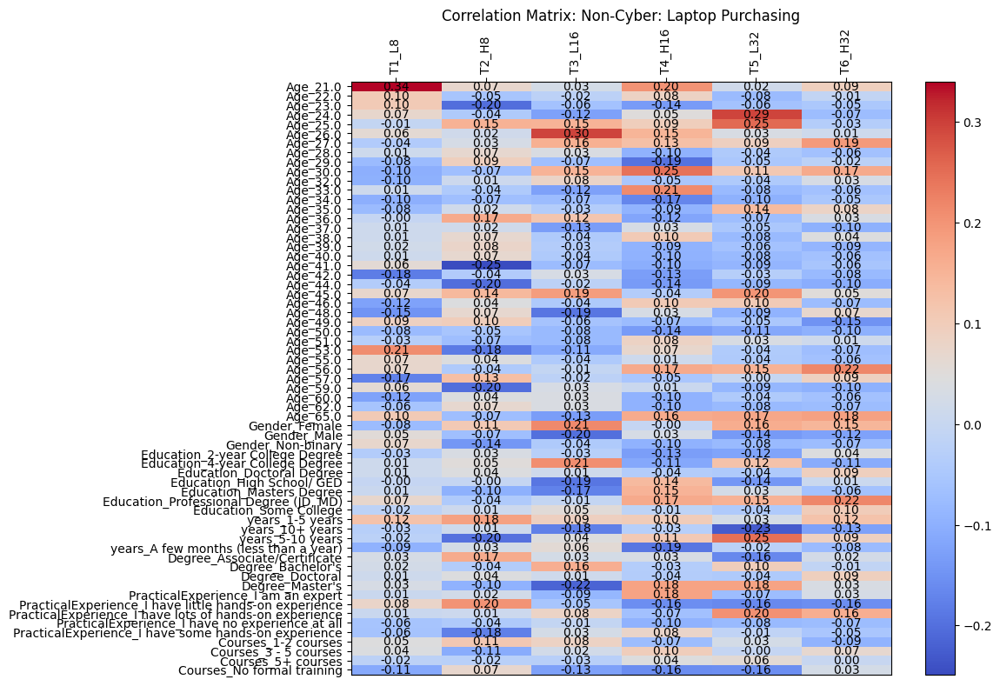


Correlation Matrix for CM: File Exfiltration:
                                                       T1_L8     T2_H8  \
Age_21.0                                           -0.024487  0.153187   
Age_22.0                                            0.332601  0.376560   
Age_23.0                                            0.158558 -0.068555   
Age_24.0                                           -0.010892 -0.048217   
Age_25.0                                           -0.081893 -0.140310   
...                                                      ...       ...   
PracticalExperience_I have some hands-on experi...  0.035441  0.139258   
Courses_1-2 courses                                 0.035665  0.100948   
Courses_3 - 5 courses                              -0.004441 -0.009400   
Courses_5+ courses                                 -0.011835 -0.028532   
Courses_No formal training                         -0.027418 -0.093727   

                                                      T3_L16    

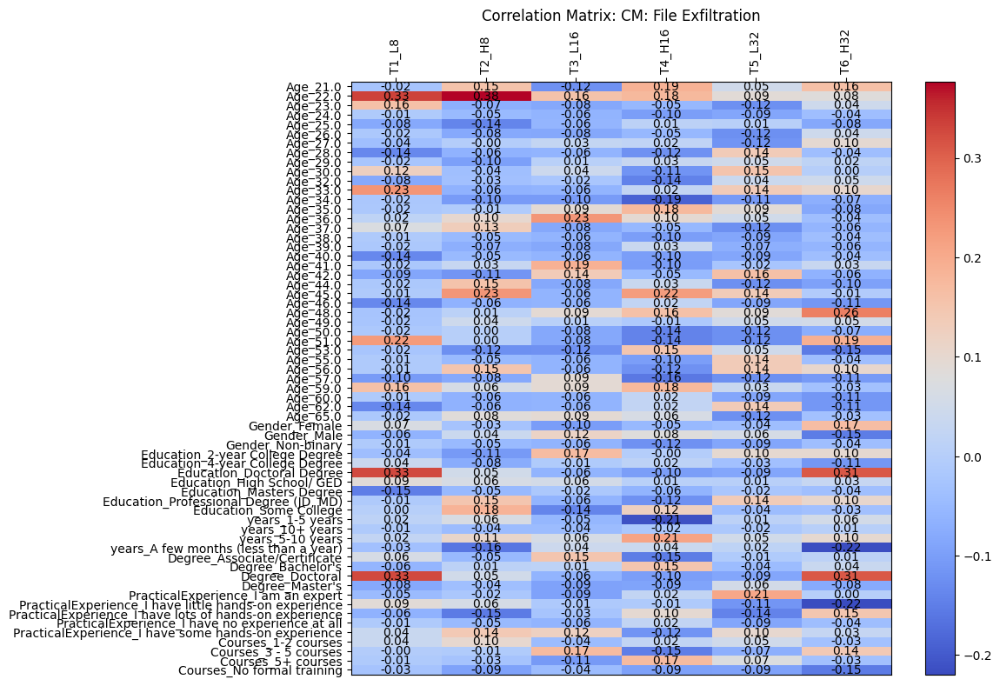


Correlation Matrix for CM: NMAP Port Scanning:
                                                       T1_L8     T2_H8  \
Age_21.0                                           -0.097365  0.180196   
Age_22.0                                            0.213193  0.043915   
Age_23.0                                           -0.117744 -0.120335   
Age_24.0                                            0.149946  0.146410   
Age_25.0                                            0.151174 -0.024454   
...                                                      ...       ...   
PracticalExperience_I have some hands-on experi...  0.014552 -0.021667   
Courses_1-2 courses                                 0.121442 -0.099847   
Courses_3 - 5 courses                              -0.160093  0.053776   
Courses_5+ courses                                 -0.046971 -0.017103   
Courses_No formal training                          0.201687  0.097141   

                                                      T3_L16   

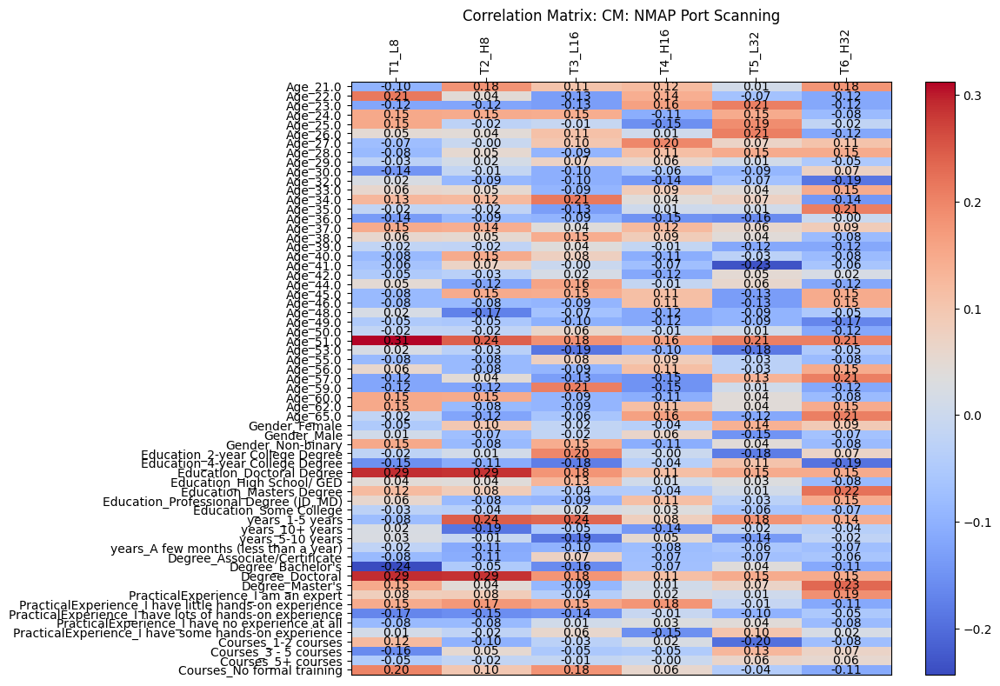

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def analyze_task_raw(file_path, task_name, pattern, new_column_names):
    df = pd.read_csv(file_path)
    matched_columns = df.filter(regex=pattern).columns.tolist()
    if matched_columns:
        df.rename(columns=new_column_names, inplace=True)
        matched_data = df[list(new_column_names.values())]
        relevant_rows = matched_data.dropna(how='all')
        return relevant_rows
    else:
        print(f"No columns matching '{pattern}' found for {task_name}.")
        return None

def gather_task_data(file_path, task_name, pattern, new_column_names):
    task_data = analyze_task_raw(
        file_path,
        task_name=task_name,
        pattern=pattern,
        new_column_names=new_column_names
    )
    return task_data

def one_hot_encode_columns(df, columns):
    """
    Apply one-hot encoding to categorical columns.

    Args:
        df (pd.DataFrame): Input dataframe.
        columns (list): List of categorical columns to encode.

    Returns:
        pd.DataFrame: Dataframe with one-hot encoded columns.
    """
    df_encoded = pd.get_dummies(df, columns=columns, drop_first=False)
    return df_encoded

def clean_columns(df):
    # Clean Age column by replacing '65+' with 65 and converting to numeric
    if 'Age' in df.columns:
        df['Age'] = df['Age'].replace('65+', 65)
        df['Age'] = pd.to_numeric(df['Age'], errors='coerce')
    return df

def compute_correlation_matrix(file_path, relevant_columns, task_name, pattern, new_column_names):
    df = pd.read_csv(file_path)
    task_data = gather_task_data(file_path, task_name, pattern, new_column_names)
    if task_data is not None:
        # Filter to include only relevant columns
        relevant_df = df[relevant_columns].copy()
        # Clean columns
        relevant_df = clean_columns(relevant_df)
        # Apply one-hot encoding
        relevant_df = one_hot_encode_columns(relevant_df, columns=relevant_columns)
        # Merge relevant columns with task data
        combined_data = pd.concat([relevant_df, task_data], axis=1).dropna()  # Drop rows with missing values
        # Ensure all columns are numeric
        combined_data = combined_data.apply(pd.to_numeric, errors='coerce').dropna()
        # Compute correlation matrix
        correlation_matrix = combined_data.corr()
        return correlation_matrix.loc[relevant_df.columns, task_data.columns]
    else:
        print(f"{task_name} data could not be gathered.")
        return None

def plot_correlation_matrix(correlation_matrix, task_name):
    plt.figure(figsize=(12, 8))
    plt.imshow(correlation_matrix, cmap='coolwarm', aspect='auto')
    plt.colorbar()
    plt.xticks(range(correlation_matrix.shape[1]), correlation_matrix.columns, rotation=90)
    plt.yticks(range(correlation_matrix.shape[0]), correlation_matrix.index)
    plt.title(f"Correlation Matrix: {task_name}", loc='center')

    for (i, j), val in np.ndenumerate(correlation_matrix.values):  # Annotate each cell with the correlation value
        plt.text(j, i, f"{val:.2f}", ha='center', va='center', color='black')

    plt.gca().xaxis.tick_top()  # Move X-axis to the top
    plt.tight_layout()
    plt.show()

file_path = '/content/Updated_Choice_Overload.csv'
relevant_columns = ['Age','Gender', 'Education', 'years', 'Degree', 'PracticalExperience', 'Courses']

tasks = [
    {
        "task_name": "Non-Cyber: Laptop Purchasing",
        "pattern": r'em_co_lp_[1-6]_regret',
        "new_column_names": {
            'em_co_lp_1_regret': 'T1_L8',
            'em_co_lp_2_regret': 'T2_H8',
            'em_co_lp_3_regret': 'T3_L16',
            'em_co_lp_4_regret': 'T4_H16',
            'em_co_lp_5_regret': 'T5_L32',
            'em_co_lp_6_regret': 'T6_H32'
        }
    },
    {
        "task_name": "CM: File Exfiltration",
        "pattern": r'ci_co_fl_[1-6]_regret',
        "new_column_names": {
            'ci_co_fl_1_regret': 'T1_L8',
            'ci_co_fl_2_regret': 'T2_H8',
            'ci_co_fl_3_regret': 'T3_L16',
            'ci_co_fl_4_regret': 'T4_H16',
            'ci_co_fl_5_regret': 'T5_L32',
            'ci_co_fl_6_regret': 'T6_H32'
        }
    },
    {
        "task_name": "CM: NMAP Port Scanning",
        "pattern": r'ci_co_nmap_[1-6]_regret',
        "new_column_names": {
            'ci_co_nmap_1_regret': 'T1_L8',
            'ci_co_nmap_2_regret': 'T2_H8',
            'ci_co_nmap_3_regret': 'T3_L16',
            'ci_co_nmap_4_regret': 'T4_H16',
            'ci_co_nmap_5_regret': 'T5_L32',
            'ci_co_nmap_6_regret': 'T6_H32'
        }
    }
]

# Compute and plot correlation matrices for all tasks
for task in tasks:
    correlation_matrix = compute_correlation_matrix(
        file_path,
        relevant_columns,
        task_name=task["task_name"],
        pattern=task["pattern"],
        new_column_names=task["new_column_names"]
    )

    if correlation_matrix is not None:
        print(f"\nCorrelation Matrix for {task['task_name']}:")
        print(correlation_matrix)
        plot_correlation_matrix(correlation_matrix, task["task_name"])
    else:
        print(f"Correlation matrix for {task['task_name']} could not be generated.")

##**Correlation Regret- Combined**


Correlation Matrix for Non-Cyber: Laptop Purchasing:
                        T1_L8     T2_H8    T3_L16    T4_H16    T5_L32  \
Age                  0.001535 -0.002817 -0.008108  0.001006  0.001141   
Gender               0.017694 -0.034537 -0.009114 -0.023732 -0.018778   
Education            0.006958 -0.001086 -0.018276  0.022895 -0.006525   
years               -0.006135  0.005183  0.004070 -0.003402  0.006175   
Degree               0.023712  0.018635 -0.003515  0.034739  0.017360   
PracticalExperience -0.005610  0.002617 -0.008105 -0.012426 -0.024685   
Courses             -0.011958  0.012559 -0.012266 -0.021836 -0.018396   

                       T6_H32  
Age                 -0.007225  
Gender              -0.017183  
Education            0.041619  
years                0.001767  
Degree               0.034622  
PracticalExperience -0.018243  
Courses             -0.000119  


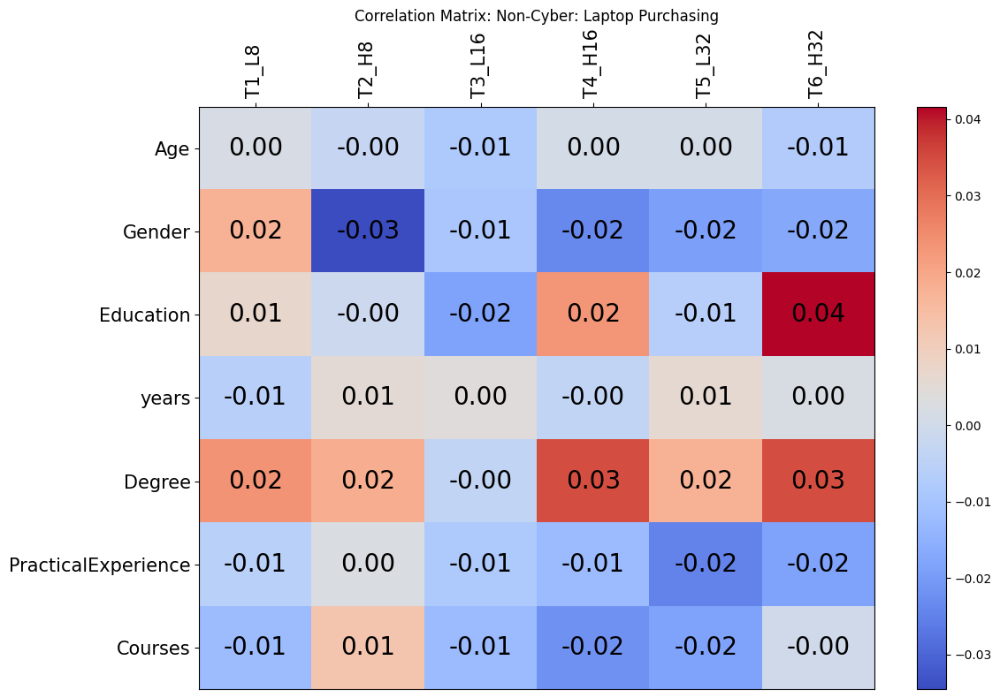


Correlation Matrix for CM: File Exfiltration:
                        T1_L8     T2_H8    T3_L16    T4_H16    T5_L32  \
Age                  0.002035  0.001464 -0.010936 -0.006085 -0.000301   
Gender              -0.002260 -0.012165 -0.015386 -0.030516 -0.021714   
Education            0.036199  0.030928 -0.008581 -0.019831  0.008100   
years               -0.001629 -0.008066  0.001064  0.005716  0.016396   
Degree               0.062196 -0.006493  0.002475 -0.047997 -0.020964   
PracticalExperience  0.000603 -0.004214 -0.013800  0.003443 -0.007231   
Courses             -0.002008 -0.007678 -0.005915 -0.012042 -0.010211   

                       T6_H32  
Age                 -0.007055  
Gender              -0.008804  
Education            0.051313  
years               -0.014190  
Degree               0.069099  
PracticalExperience -0.016872  
Courses             -0.019510  


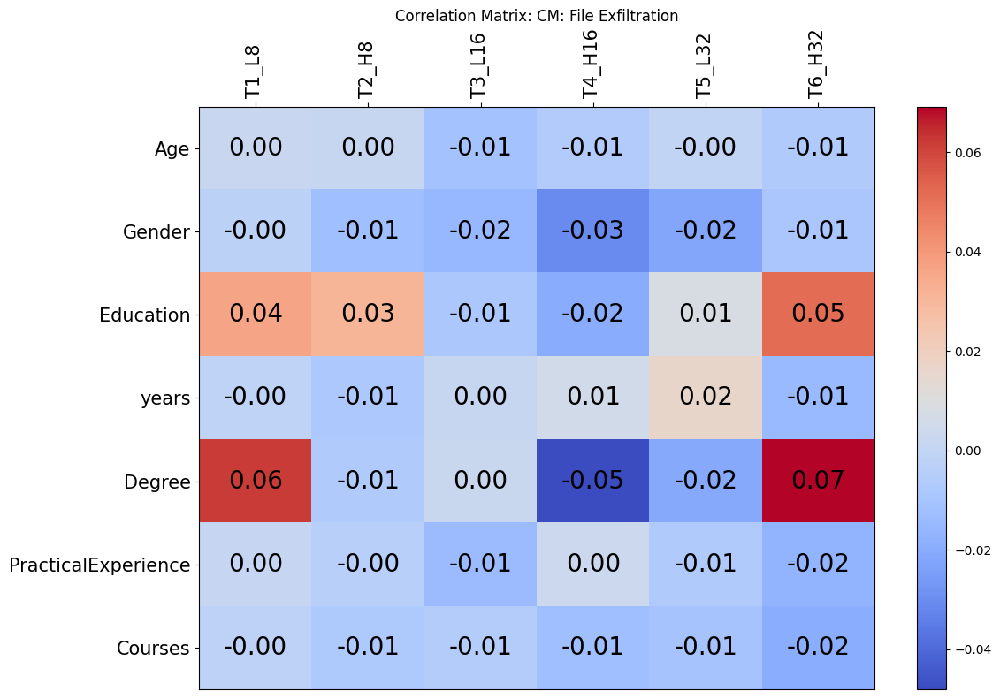


Correlation Matrix for CM: NMAP Port Scanning:
                        T1_L8     T2_H8    T3_L16    T4_H16    T5_L32  \
Age                  0.006904  0.007118  0.002186  0.009324  0.005257   
Gender               0.036900 -0.020360  0.035940 -0.026382  0.011163   
Education            0.043931  0.027150  0.029847  0.027004  0.003552   
years               -0.012237 -0.016976 -0.025816 -0.021970 -0.007847   
Degree               0.027675  0.043552  0.000532 -0.004719  0.044800   
PracticalExperience -0.001208 -0.000341  0.007488  0.013283  0.007176   
Courses              0.029016  0.008492  0.020948  0.007651 -0.012442   

                       T6_H32  
Age                  0.005719  
Gender              -0.019743  
Education            0.032628  
years                0.003231  
Degree               0.051548  
PracticalExperience -0.008394  
Courses             -0.016509  


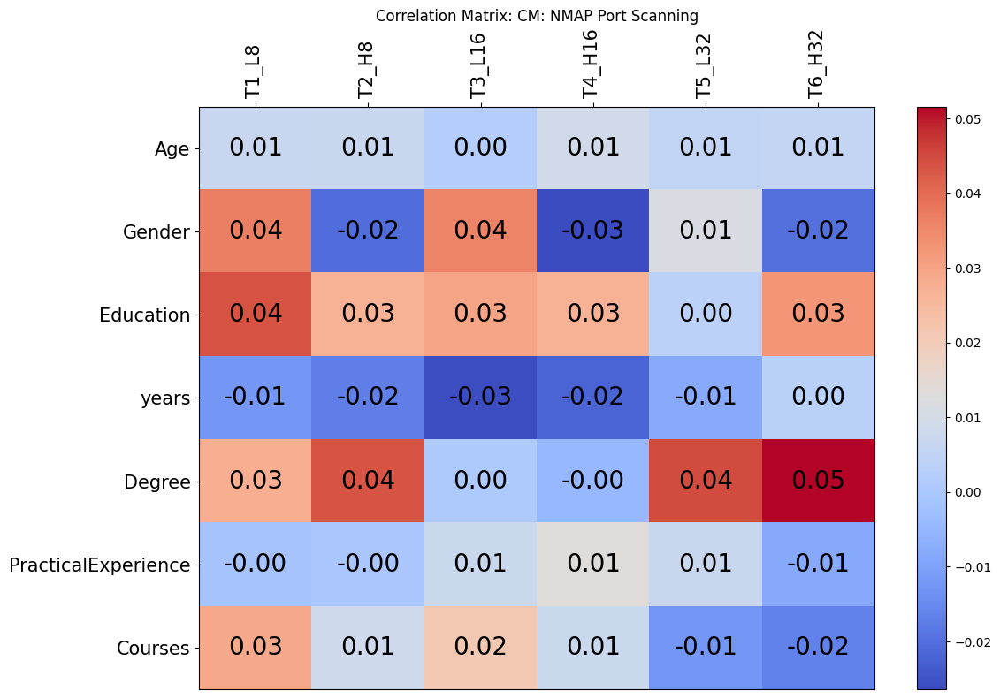

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def analyze_task_raw(file_path, task_name, pattern, new_column_names):
    df = pd.read_csv(file_path)
    matched_columns = df.filter(regex=pattern).columns.tolist()
    if matched_columns:
        df.rename(columns=new_column_names, inplace=True)
        matched_data = df[list(new_column_names.values())]
        relevant_rows = matched_data.dropna(how='all')
        return relevant_rows
    else:
        print(f"No columns matching '{pattern}' found for {task_name}.")
        return None

def gather_task_data(file_path, task_name, pattern, new_column_names):
    task_data = analyze_task_raw(
        file_path,
        task_name=task_name,
        pattern=pattern,
        new_column_names=new_column_names
    )
    return task_data

def one_hot_encode_columns(df, columns):
    """
    Apply one-hot encoding to categorical columns.

    Args:
        df (pd.DataFrame): Input dataframe.
        columns (list): List of categorical columns to encode.

    Returns:
        pd.DataFrame: Dataframe with one-hot encoded columns.
    """
    df_encoded = pd.get_dummies(df, columns=columns, drop_first=False)
    return df_encoded

def clean_columns(df):
    # Clean Age column by replacing '65+' with 65 and converting to numeric
    if 'Age' in df.columns:
        df['Age'] = df['Age'].replace('65+', 65)
        df['Age'] = pd.to_numeric(df['Age'], errors='coerce')
    return df

def aggregate_correlation_matrix(correlation_matrix, relevant_columns):
    """
    Aggregate correlation matrix to show only the main relevant columns on the Y-axis.

    Args:
        correlation_matrix (pd.DataFrame): Original correlation matrix.
        relevant_columns (list): List of main relevant columns.

    Returns:
        pd.DataFrame: Aggregated correlation matrix.
    """
    aggregated = correlation_matrix.groupby(correlation_matrix.index.to_series().str.split('_').str[0]).mean()
    return aggregated.loc[relevant_columns]

def compute_correlation_matrix(file_path, relevant_columns, task_name, pattern, new_column_names):
    df = pd.read_csv(file_path)
    task_data = gather_task_data(file_path, task_name, pattern, new_column_names)
    if task_data is not None:
        # Filter to include only relevant columns
        relevant_df = df[relevant_columns].copy()
        # Clean columns
        relevant_df = clean_columns(relevant_df)
        # Apply one-hot encoding
        relevant_df = one_hot_encode_columns(relevant_df, columns=relevant_columns)
        # Merge relevant columns with task data
        combined_data = pd.concat([relevant_df, task_data], axis=1).dropna()  # Drop rows with missing values
        # Ensure all columns are numeric
        combined_data = combined_data.apply(pd.to_numeric, errors='coerce').dropna()
        # Compute correlation matrix
        correlation_matrix = combined_data.corr()
        # Aggregate correlation matrix for relevant columns
        aggregated_matrix = aggregate_correlation_matrix(correlation_matrix, relevant_columns)
        return aggregated_matrix.loc[relevant_columns, task_data.columns]
    else:
        print(f"{task_name} data could not be gathered.")
        return None

def plot_correlation_matrix(correlation_matrix, task_name):
    plt.figure(figsize=(12, 8))
    plt.imshow(correlation_matrix, cmap='coolwarm', aspect='auto')
    plt.colorbar()
    plt.xticks(range(correlation_matrix.shape[1]), correlation_matrix.columns, rotation=90, fontsize=15)
    plt.yticks(range(correlation_matrix.shape[0]), correlation_matrix.index, fontsize=15)
    plt.title(f"Correlation Matrix: {task_name}", loc='center', fontsize=12)

    for (i, j), val in np.ndenumerate(correlation_matrix.values):  # Annotate each cell
        plt.text(j, i, f"{val:.2f}", ha='center', va='center', color='black', fontsize=20)

    plt.gca().xaxis.tick_top()  # Move X-axis to the top
    plt.tight_layout()
    plt.show()

file_path = '/content/Updated_Choice_Overload.csv'
relevant_columns = ['Age', 'Gender', 'Education', 'years', 'Degree', 'PracticalExperience', 'Courses']

tasks = [
    {
        "task_name": "Non-Cyber: Laptop Purchasing",
        "pattern": r'em_co_lp_[1-6]_regret',
        "new_column_names": {
            'em_co_lp_1_regret': 'T1_L8',
            'em_co_lp_2_regret': 'T2_H8',
            'em_co_lp_3_regret': 'T3_L16',
            'em_co_lp_4_regret': 'T4_H16',
            'em_co_lp_5_regret': 'T5_L32',
            'em_co_lp_6_regret': 'T6_H32'
        }
    },
    {
        "task_name": "CM: File Exfiltration",
        "pattern": r'ci_co_fl_[1-6]_regret',
        "new_column_names": {
            'ci_co_fl_1_regret': 'T1_L8',
            'ci_co_fl_2_regret': 'T2_H8',
            'ci_co_fl_3_regret': 'T3_L16',
            'ci_co_fl_4_regret': 'T4_H16',
            'ci_co_fl_5_regret': 'T5_L32',
            'ci_co_fl_6_regret': 'T6_H32'
        }
    },
    {
        "task_name": "CM: NMAP Port Scanning",
        "pattern": r'ci_co_nmap_[1-6]_regret',
        "new_column_names": {
            'ci_co_nmap_1_regret': 'T1_L8',
            'ci_co_nmap_2_regret': 'T2_H8',
            'ci_co_nmap_3_regret': 'T3_L16',
            'ci_co_nmap_4_regret': 'T4_H16',
            'ci_co_nmap_5_regret': 'T5_L32',
            'ci_co_nmap_6_regret': 'T6_H32'
        }
    }
]

# Compute and plot correlation matrices for all tasks
for task in tasks:
    correlation_matrix = compute_correlation_matrix(
        file_path,
        relevant_columns,
        task_name=task["task_name"],
        pattern=task["pattern"],
        new_column_names=task["new_column_names"]
    )

    if correlation_matrix is not None:
        print(f"\nCorrelation Matrix for {task['task_name']}:")
        print(correlation_matrix)
        plot_correlation_matrix(correlation_matrix, task["task_name"])
    else:
        print(f"Correlation matrix for {task['task_name']} could not be generated.")

###**ANCOVA- Correlation Regret**

In [ ]:
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as ols

def sanitize_column_names(df):
    """
    Sanitize column names to ensure compatibility with formulas.
    Replaces spaces and special characters with underscores.
    """
    df.columns = df.columns.str.replace(r'[^\w]', '_', regex=True)
    return df

def prepare_data_for_ancova(file_path, task_name, pattern, new_column_names, relevant_columns):
    """
    Prepare the dataset for ANCOVA analysis by combining task-specific data with relevant columns.
    """
    df = pd.read_csv(file_path)
    matched_columns = df.filter(regex=pattern).columns.tolist()

    if matched_columns:
        df.rename(columns=new_column_names, inplace=True)
        task_data = df[list(new_column_names.values())]
        task_data = task_data.dropna(how='all')

        # Filter relevant columns and clean
        relevant_df = df[relevant_columns].copy()
        relevant_df = clean_columns(relevant_df)
        relevant_df = one_hot_encode_columns(relevant_df, columns=relevant_columns)
        relevant_df = sanitize_column_names(relevant_df)  # Sanitize column names

        # Combine task data with relevant columns
        combined_data = pd.concat([relevant_df, task_data], axis=1).dropna()
        combined_data = sanitize_column_names(combined_data)  # Sanitize combined data

        # Aggregate one-hot encoded columns back under their original names
        for col in relevant_columns:
            one_hot_cols = [c for c in combined_data.columns if c.startswith(col + "_")]
            if one_hot_cols:
                combined_data[col] = combined_data[one_hot_cols].sum(axis=1)
                combined_data.drop(columns=one_hot_cols, inplace=True)

        # Add a Trial column for task-specific columns
        melted_data = pd.melt(
            combined_data,
            id_vars=relevant_columns,  # Include relevant columns
            value_vars=task_data.columns,  # Task-specific columns as 'Trial'
            var_name="Trial",  # New column for trial names
            value_name="Regret"  # New column for trial values
        )
        return melted_data, relevant_columns  # Return melted data and relevant columns
    else:
        print(f"No columns matching '{pattern}' found for {task_name}.")
        return None, None

def perform_ancova(data, covariates, task_name):
    """
    Perform ANCOVA analysis for all trials in the task combined.
    """
    formula = "Regret ~ Trial + " + " + ".join(covariates)
    model = ols.ols(formula, data=data).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    anova_table["Significance"] = anova_table["PR(>F)"].apply(lambda p: "Yes" if p < 0.05 else "No")
    return anova_table

def clean_columns(df):
    """
    Clean the Age column and convert to numeric.
    """
    if 'Age' in df.columns:
        df['Age'] = df['Age'].replace('65+', 65)
        df['Age'] = pd.to_numeric(df['Age'], errors='coerce')
    return df

def one_hot_encode_columns(df, columns):
    """
    Apply one-hot encoding to categorical columns.
    """
    return pd.get_dummies(df, columns=columns, drop_first=False)

file_path = '/content/Updated_Choice_Overload.csv'
relevant_columns = ['Age', 'Gender', 'Education', 'years', 'Degree', 'PracticalExperience', 'Courses']

tasks = [
    {
        "task_name": "Non-Cyber: Laptop Purchasing",
        "pattern": r'em_co_lp_[1-6]_regret',
        "new_column_names": {
            'em_co_lp_1_regret': 'T1_L8',
            'em_co_lp_2_regret': 'T2_H8',
            'em_co_lp_3_regret': 'T3_L16',
            'em_co_lp_4_regret': 'T4_H16',
            'em_co_lp_5_regret': 'T5_L32',
            'em_co_lp_6_regret': 'T6_H32'
        }
    },
    {
        "task_name": "CM: File Exfiltration",
        "pattern": r'ci_co_fl_[1-6]_regret',
        "new_column_names": {
            'ci_co_fl_1_regret': 'T1_L8',
            'ci_co_fl_2_regret': 'T2_H8',
            'ci_co_fl_3_regret': 'T3_L16',
            'ci_co_fl_4_regret': 'T4_H16',
            'ci_co_fl_5_regret': 'T5_L32',
            'ci_co_fl_6_regret': 'T6_H32'
        }
    },
    {
        "task_name": "CM: NMAP Port Scanning",
        "pattern": r'ci_co_nmap_[1-6]_regret',
        "new_column_names": {
            'ci_co_nmap_1_regret': 'T1_L8',
            'ci_co_nmap_2_regret': 'T2_H8',
            'ci_co_nmap_3_regret': 'T3_L16',
            'ci_co_nmap_4_regret': 'T4_H16',
            'ci_co_nmap_5_regret': 'T5_L32',
            'ci_co_nmap_6_regret': 'T6_H32'
        }
    }
]

# Perform ANCOVA for each task
ancova_results = {}
for task in tasks:
    data, relevant_columns_updated = prepare_data_for_ancova(
        file_path,
        task_name=task["task_name"],
        pattern=task["pattern"],
        new_column_names=task["new_column_names"],
        relevant_columns=relevant_columns
    )

    if data is not None:
        ancova_table = perform_ancova(data, relevant_columns_updated, task["task_name"])
        ancova_results[task["task_name"]] = ancova_table
    else:
        print(f"No data for {task['task_name']}.")

# Display results
for task_name, table in ancova_results.items():
    print(f"\nANCOVA Results for {task_name}:\n")
    print(table)

"""
# Save ANCOVA results as CSV files
for task_name, table in ancova_results.items():
    file_name = f"{task_name.replace(' ', '_')}_ANCOVA_results.csv"
    table.to_csv(file_name)
    print(f"Saved {task_name} results to {file_name}")
"""


ANCOVA Results for Non-Cyber: Laptop Purchasing:

                            sum_sq     df         F        PR(>F) Significance
Trial                 17477.487719    5.0  8.315288  1.350377e-07          Yes
Age                    2158.331744    1.0  5.134362  2.383624e-02          Yes
Gender                 2158.331744    1.0  5.134362  2.383624e-02          Yes
Education              2158.331744    1.0  5.134362  2.383624e-02          Yes
years                   722.337963    1.0  1.718339  1.904424e-01           No
Degree                  864.550378    1.0  2.056642  1.521000e-01           No
PracticalExperience    2158.331744    1.0  5.134362  2.383624e-02          Yes
Courses                2158.331744    1.0  5.134362  2.383624e-02          Yes
Residual             236247.933521  562.0       NaN           NaN           No

ANCOVA Results for CM: File Exfiltration:

                            sum_sq     df         F    PR(>F) Significance
Trial                 18483.271930    5.

'\n# Save ANCOVA results as CSV files\nfor task_name, table in ancova_results.items():\n    file_name = f"{task_name.replace(\' \', \'_\')}_ANCOVA_results.csv"\n    table.to_csv(file_name)\n    print(f"Saved {task_name} results to {file_name}")\n'

# **Covariance Analysis - Seperate**

**Age**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression # Import LinearRegression from sklearn.linear_model
from scipy.stats import pearsonr

def analyze_age_vs_time(file_path, age_column="Age"):
    """
    Analyze the relationship between average time taken and age for all tasks.
    Args:
        file_path (str): Path to the dataset.
        age_column (str): The column name representing participant ages.
    """
    # Fetch timing data using the provided timer code
    results = get_combined_task_data(file_path)

    # Load the main dataset to extract the age column
    df = pd.read_csv(file_path)

    if age_column not in df.columns:
        print(f"Column '{age_column}' not found in the dataset.")
        return

    # Ensure Age is numeric and drop NaN values
    df[age_column] = pd.to_numeric(df[age_column], errors='coerce')
    df = df.dropna(subset=[age_column])  # Drop rows with missing ages
    df = df.reset_index(drop=True)  # Reset index after dropping rows

    plt.figure(figsize=(10, 6))

    # Analyze each task
    for task in results:
        relevant_rows = task["Relevant Rows"]
        average_times = relevant_rows.mean(axis=1)

        # Align average times with age using the updated index
        aligned_data = pd.DataFrame({"Age": df.loc[relevant_rows.index.intersection(df.index), age_column],  # Use intersection to get valid indices
                                     "Average Time": average_times}).dropna()

        if aligned_data.empty:
            print(f"No valid data for task: {task['Task']}")
            continue

        ages = aligned_data["Age"]
        avg_times = aligned_data["Average Time"]

        # Linear regression
        model = LinearRegression()
        model.fit(ages.values.reshape(-1, 1), avg_times)
        predicted_times = model.predict(ages.values.reshape(-1, 1))

        # Correlation
        correlation, p_value = pearsonr(ages, avg_times)

        # Plot
        plt.scatter(ages, avg_times, label=f'{task["Task"]} (R={correlation:.2f})', alpha=0.6)
        plt.plot(ages, predicted_times, linestyle='--', label=f'{task["Task"]} Regression')

        # Print stats for debugging or further analysis
        print(f"Task: {task['Task']}")
        print(f"Correlation Coefficient (R): {correlation:.2f}")
        print(f"P-Value: {p_value:.4f}")
        print(f"Regression Equation: Time = {model.coef_[0]:.2f} * Age + {model.intercept_:.2f}")
        print("-" * 50)

    # Plot final visualization
    plt.xlabel("Age")
    plt.ylabel("Average Time Taken (Seconds)")
    plt.title("Relationship Between Age and Average Time Taken")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


# File path to the dataset
file_path = '/content/Choice_Overload.csv'

# Call the function to analyze age vs time
analyze_age_vs_time(file_path, age_column="Age")

ValueError: The truth value of a DataFrame is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

**ANCOVA- Age**

In [ ]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols

def perform_ancova(file_path, age_column="Age"):
    """
    Perform ANCOVA to analyze the effect of age on average time taken across tasks.

    Args:
        file_path (str): Path to the dataset.
        age_column (str): The column name representing participant ages.
    """
    # Fetch timing data using the provided timer code
    results = get_combined_task_data(file_path)

    # Load the dataset
    df = pd.read_csv(file_path)

    if age_column not in df.columns:
        print(f"Column '{age_column}' not found in the dataset.")
        return

    # Ensure Age is numeric
    df[age_column] = pd.to_numeric(df[age_column], errors='coerce')
    df = df.dropna(subset=[age_column])  # Drop rows with missing ages

    # Combine data from all tasks into a single dataframe for ANCOVA
    combined_data = []
    for task in results:
        relevant_rows = task["Relevant Rows"]
        average_times = relevant_rows.mean(axis=1)

        # Align average times with age using the intersection of indices
        aligned_data = pd.DataFrame({
            "Age": df.loc[relevant_rows.index.intersection(df.index), age_column],  # Use intersection to get valid indices
            "Average Time": average_times,
            "Task": task["Task"]  # Add task type as a categorical variable
        }).dropna()

        combined_data.append(aligned_data)

    # Concatenate all task data into a single dataframe
    combined_df = pd.concat(combined_data, ignore_index=True)

    # Perform ANCOVA using statsmodels
    model = ols("Q('Average Time') ~ C(Task) + Q('Age')", data=combined_df).fit()
    ancova_table = sm.stats.anova_lm(model, typ=2)  # Type-II ANOVA for ANCOVA

    # Display ANCOVA table
    print("\nANCOVA Results:")
    print(ancova_table)

    # Return ANCOVA table for further inspection
    return ancova_table

perform_ancova(file_path, age_column="Age")

ValueError: The truth value of a DataFrame is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

**Gender**

In [ ]:
def analyze_gender_vs_time(file_path, gender_column="Gender"):
    """
    Analyze the relationship between average time taken and gender for all tasks using scatter plots and regression lines.
    Args:
        file_path (str): Path to the dataset.
        gender_column (str): The column name representing participant gender.
    """
    # Fetch timing data using the provided timer code
    results = get_combined_task_data(file_path)

    # Load the main dataset to extract the gender column
    df = pd.read_csv(file_path)

    if gender_column not in df.columns:
        print(f"Column '{gender_column}' not found in the dataset.")
        return

    # Ensure Gender column has no missing values and reset index
    df = df.dropna(subset=[gender_column])  # Drop rows with missing genders
    df = df.reset_index(drop=True)  # Reset index after dropping rows

    plt.figure(figsize=(14, 8))

    # Predefined color palette for tasks
    task_colors = ["blue", "#f97d0e", "green"]

    # Analyze each task
    for i, task in enumerate(results):
        relevant_rows = task["Relevant Rows"]
        average_times = relevant_rows.mean(axis=1)

        # Align average times with gender using the updated index
        aligned_data = pd.DataFrame({"Gender": df.loc[relevant_rows.index.intersection(df.index), gender_column],
                                     "Average Time": average_times}).dropna()

        if aligned_data.empty:
            print(f"No valid data for task: {task['Task']}")
            continue

        genders = aligned_data["Gender"]
        avg_times = aligned_data["Average Time"]

        # Map gender to numeric values for regression
        gender_mapping = {gender: idx for idx, gender in enumerate(aligned_data["Gender"].unique())}
        numeric_genders = genders.map(gender_mapping)

        # Linear regression
        model = LinearRegression()
        model.fit(numeric_genders.values.reshape(-1, 1), avg_times)
        predicted_times = model.predict(numeric_genders.values.reshape(-1, 1))

        # Plot scatter points
        plt.scatter(numeric_genders, avg_times, alpha=0.6, color=task_colors[i],
                    label=f'{task["Task"]} (Regression)')

        # Plot regression line
        plt.plot(numeric_genders, predicted_times, linestyle='--', color=task_colors[i])

        # Print statistics
        correlation, p_value = pearsonr(numeric_genders, avg_times)
        print(f"Task: {task['Task']}")
        print(f"Correlation Coefficient (R): {correlation:.2f}")
        print(f"P-Value: {p_value:.4f}")
        print(f"Regression Equation: Time = {model.coef_[0]:.2f} * Gender + {model.intercept_:.2f}")
        print("-" * 50)

    # Update x-axis to show gender labels
    plt.xticks(list(gender_mapping.values()), list(gender_mapping.keys()))
    plt.xlabel("Gender")
    plt.ylabel("Average Time Taken (Seconds)")
    plt.title("Relationship Between Gender and Average Time Taken")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


# File path to the dataset
file_path = '/content/Choice_Overload.csv'

# Call the function to analyze gender vs time
analyze_gender_vs_time(file_path, gender_column="Gender")

ValueError: The truth value of a DataFrame is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

**ANCOVA- Gender**

In [ ]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols

def perform_gender_ancova(file_path, gender_column="Gender"):
    """
    Perform ANCOVA to analyze the effect of gender on average time taken across tasks.

    Args:
        file_path (str): Path to the dataset.
        gender_column (str): The column name representing participant gender.
    """
    # Fetch timing data using the provided timer code
    results = get_combined_task_data(file_path)

    # Load the dataset
    df = pd.read_csv(file_path)

    if gender_column not in df.columns:
        print(f"Column '{gender_column}' not found in the dataset.")
        return

    # Ensure Gender column has no missing values and reset index
    df = df.dropna(subset=[gender_column])  # Drop rows with missing genders
    df = df.reset_index(drop=True)  # Reset index after dropping rows

    # Combine data from all tasks into a single dataframe for ANCOVA
    combined_data = []
    for task in results:
        relevant_rows = task["Relevant Rows"]
        average_times = relevant_rows.mean(axis=1)

        # Align average times with gender
        aligned_data = pd.DataFrame({
            "Gender": df.loc[relevant_rows.index.intersection(df.index), gender_column],
            "Average Time": average_times,
            "Task": task["Task"]  # Add task type as a categorical variable
        }).dropna()

        combined_data.append(aligned_data)

    # Concatenate all task data into a single dataframe
    combined_df = pd.concat(combined_data, ignore_index=True)

    # Perform ANCOVA using statsmodels
    model = ols("Q('Average Time') ~ C(Task) + C(Gender)", data=combined_df).fit()
    ancova_table = sm.stats.anova_lm(model, typ=2)  # Type-II ANOVA for ANCOVA

    # Display ANCOVA table
    print("\nANCOVA Results:")
    print(ancova_table)

    # Return ANCOVA table for further inspection
    return ancova_table


# File path to the dataset
file_path = '/content/Choice_Overload.csv'

# Call the function to perform ANCOVA for gender
gender_ancova_results = perform_gender_ancova(file_path, gender_column="Gender")


ANCOVA Results:
                 sum_sq     df          F        PR(>F)
C(Task)    1.376867e+06    2.0  42.422370  8.072199e-17
C(Gender)  1.168233e+05    2.0   3.599417  2.861214e-02
Residual   4.543863e+06  280.0        NaN           NaN


**Degree**

Task: CM: File Exfiltration
Correlation Coefficient (R): 0.03
P-Value: 0.7986
Regression Equation: Time = 3.69 * Degree + 88.49
Degree Mapping: {'Associate/Certificate': 0, "Bachelor's": 1, "Master's": 2, 'Doctoral': 3}
--------------------------------------------------
Task: Non-Cyber: Laptop Purchasing
Correlation Coefficient (R): 0.08
P-Value: 0.4474
Regression Equation: Time = 4.42 * Degree + 47.20
Degree Mapping: {'Associate/Certificate': 0, "Bachelor's": 1, "Master's": 2, 'Doctoral': 3}
--------------------------------------------------
Task: CM: NMAP Port Scanning
Correlation Coefficient (R): -0.10
P-Value: 0.3661
Regression Equation: Time = -31.34 * Degree + 249.11
Degree Mapping: {'Associate/Certificate': 0, "Bachelor's": 1, "Master's": 2, 'Doctoral': 3}
--------------------------------------------------


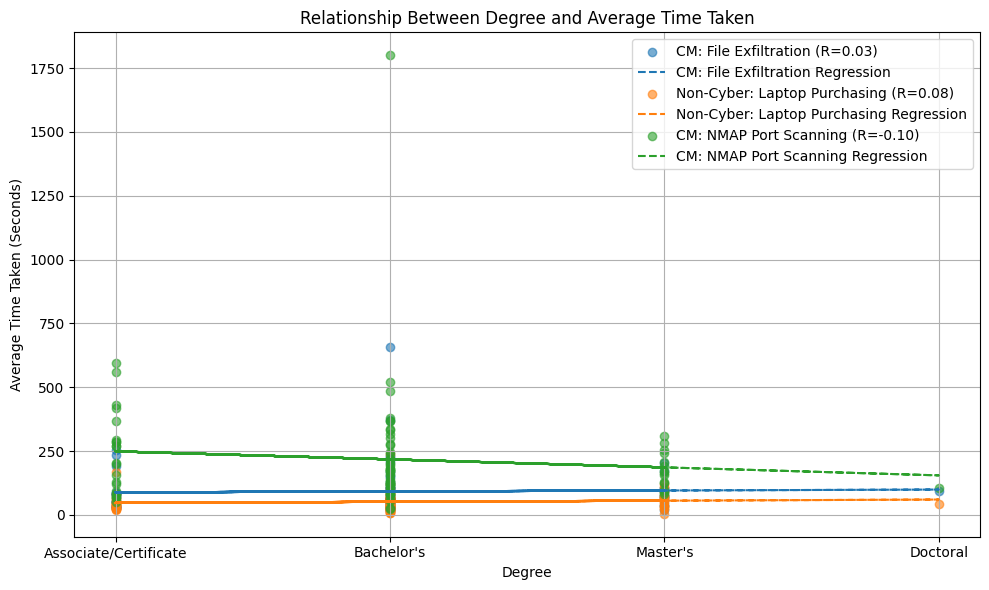

In [ ]:
def analyze_degree_vs_time(file_path, degree_column="Degree"):
    """
    Analyze the relationship between average time taken and degree for all tasks using scatter plots and regression lines.
    Args:
        file_path (str): Path to the dataset.
        degree_column (str): The column name representing participant degrees.
    """
    # Fetch timing data using the provided timer code
    results = get_combined_task_data(file_path)

    # Load the main dataset to extract the degree column
    df = pd.read_csv(file_path)

    if degree_column not in df.columns:
        print(f"Column '{degree_column}' not found in the dataset.")
        return

    # Ensure Degree column has no missing values and reset index
    df = df.dropna(subset=[degree_column])  # Drop rows with missing degrees
    df = df.reset_index(drop=True)  # Reset index after dropping rows

    plt.figure(figsize=(10, 6))

    # Analyze each task
    for task in results:
        relevant_rows = task["Relevant Rows"]
        average_times = relevant_rows.mean(axis=1)

        # Align average times with degree using the updated index
        aligned_data = pd.DataFrame({"Degree": df.loc[relevant_rows.index.intersection(df.index), degree_column],
                                     "Average Time": average_times}).dropna()

        if aligned_data.empty:
            print(f"No valid data for task: {task['Task']}")
            continue

        degrees = aligned_data["Degree"]
        avg_times = aligned_data["Average Time"]

        # Map degree levels to numeric values for regression
        degree_mapping = {degree: idx for idx, degree in enumerate(degrees.unique())}
        numeric_degrees = degrees.map(degree_mapping)

        # Linear regression
        model = LinearRegression()
        model.fit(numeric_degrees.values.reshape(-1, 1), avg_times)
        predicted_times = model.predict(numeric_degrees.values.reshape(-1, 1))

        # Correlation
        correlation, p_value = pearsonr(numeric_degrees, avg_times)

        # Plot scatter points
        plt.scatter(numeric_degrees, avg_times, alpha=0.6, label=f'{task["Task"]} (R={correlation:.2f})')

        # Plot regression line
        plt.plot(numeric_degrees, predicted_times, linestyle='--', label=f'{task["Task"]} Regression')

        # Print statistics for debugging or further analysis
        print(f"Task: {task['Task']}")
        print(f"Correlation Coefficient (R): {correlation:.2f}")
        print(f"P-Value: {p_value:.4f}")
        print(f"Regression Equation: Time = {model.coef_[0]:.2f} * Degree + {model.intercept_:.2f}")
        print(f"Degree Mapping: {degree_mapping}")
        print("-" * 50)

    # Update x-axis to show degree labels
    plt.xticks(list(degree_mapping.values()), list(degree_mapping.keys()))
    plt.xlabel("Degree")
    plt.ylabel("Average Time Taken (Seconds)")
    plt.title("Relationship Between Degree and Average Time Taken")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


# File path to the dataset
file_path = '/content/Choice_Overload.csv'

# Call the function to analyze degree vs time
analyze_degree_vs_time(file_path, degree_column="Degree")

**ANCOVA- Degree**

In [ ]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols

def perform_degree_ancova(file_path, degree_column="Degree"):
    """
    Perform ANCOVA to analyze the effect of degree on average time taken across tasks.

    Args:
        file_path (str): Path to the dataset.
        degree_column (str): The column name representing participant degrees.
    """
    # Fetch timing data using the provided timer code
    results = get_combined_task_data(file_path)

    # Load the dataset
    df = pd.read_csv(file_path)

    if degree_column not in df.columns:
        print(f"Column '{degree_column}' not found in the dataset.")
        return

    # Ensure Degree column has no missing values and reset index
    df = df.dropna(subset=[degree_column])  # Drop rows with missing degrees
    df = df.reset_index(drop=True)  # Reset index after dropping rows

    # Combine data from all tasks into a single dataframe for ANCOVA
    combined_data = []
    for task in results:
        relevant_rows = task["Relevant Rows"]
        average_times = relevant_rows.mean(axis=1)

        # Align average times with degree
        aligned_data = pd.DataFrame({
            "Degree": df.loc[relevant_rows.index.intersection(df.index), degree_column],
            "Average Time": average_times,
            "Task": task["Task"]  # Add task type as a categorical variable
        }).dropna()

        combined_data.append(aligned_data)

    # Concatenate all task data into a single dataframe
    combined_df = pd.concat(combined_data, ignore_index=True)

    # Perform ANCOVA using statsmodels
    model = ols("Q('Average Time') ~ C(Task) + C(Degree)", data=combined_df).fit()
    ancova_table = sm.stats.anova_lm(model, typ=2)  # Type-II ANOVA for ANCOVA

    # Display ANCOVA table
    print("\nANCOVA Results:")
    print(ancova_table)

    # Return ANCOVA table for further inspection
    return ancova_table


# File path to the dataset
file_path = '/content/Choice_Overload.csv'

# Call the function to perform ANCOVA for degree
degree_ancova_results = perform_degree_ancova(file_path, degree_column="Degree")


ANCOVA Results:
                 sum_sq     df          F        PR(>F)
C(Task)    1.280520e+06    2.0  34.497163  6.491407e-14
C(Degree)  1.405174e+04    3.0   0.252369  8.596073e-01
Residual   4.510027e+06  243.0        NaN           NaN


**Education**

Task: CM: File Exfiltration
Correlation Coefficient (R): 0.17
P-Value: 0.0899
Regression Equation: Time = 12.05 * Education + 65.92
Education Mapping: {'2-year College Degree': 0, 'High School/ GED': 1, '4-year College Degree': 2, 'Some College': 3, 'Masters Degree': 4, 'Doctoral Degree': 5, 'Professional Degree (JD, MD)': 6}
--------------------------------------------------
Task: Non-Cyber: Laptop Purchasing
Correlation Coefficient (R): -0.04
P-Value: 0.7125
Regression Equation: Time = -1.10 * Education + 53.33
Education Mapping: {'2-year College Degree': 0, 'High School/ GED': 1, '4-year College Degree': 2, 'Some College': 3, 'Masters Degree': 4, 'Doctoral Degree': 5, 'Professional Degree (JD, MD)': 6}
--------------------------------------------------
Task: CM: NMAP Port Scanning
Correlation Coefficient (R): 0.29
P-Value: 0.0045
Regression Equation: Time = 46.32 * Education + 109.54
Education Mapping: {'2-year College Degree': 0, 'High School/ GED': 1, '4-year College Degree': 2, '

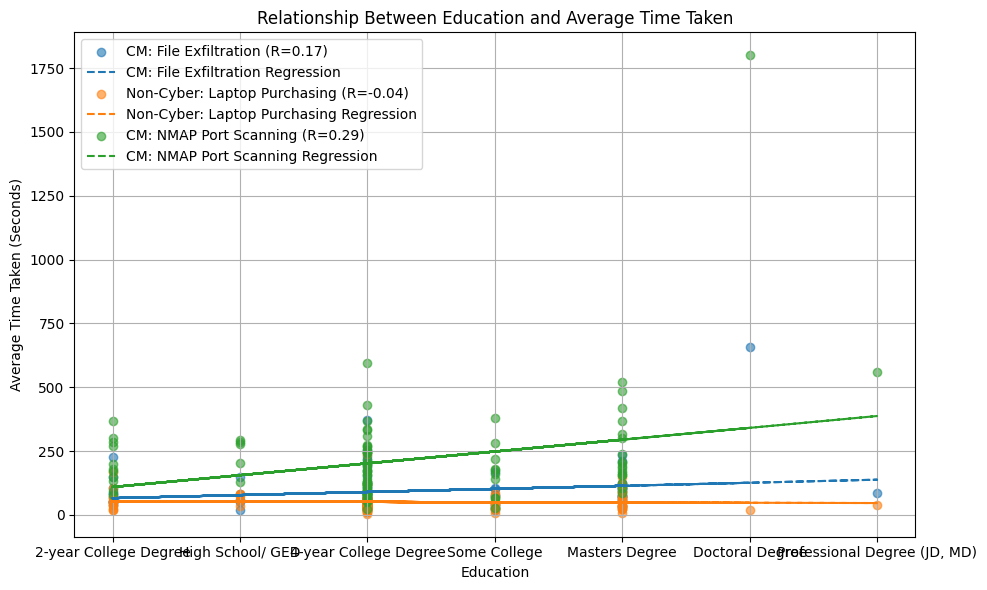

In [ ]:
def analyze_education_vs_time(file_path, education_column="Education"):
    """
    Analyze the relationship between average time taken and education for all tasks using scatter plots and regression lines.
    Args:
        file_path (str): Path to the dataset.
        education_column (str): The column name representing participant education.
    """
    # Fetch timing data using the provided timer code
    results = get_combined_task_data(file_path)

    # Load the main dataset to extract the education column
    df = pd.read_csv(file_path)

    if education_column not in df.columns:
        print(f"Column '{education_column}' not found in the dataset.")
        return

    # Ensure Education column has no missing values and reset index
    df = df.dropna(subset=[education_column])  # Drop rows with missing education levels
    df = df.reset_index(drop=True)  # Reset index after dropping rows

    plt.figure(figsize=(10, 6))

    # Analyze each task
    for task in results:
        relevant_rows = task["Relevant Rows"]
        average_times = relevant_rows.mean(axis=1)

        # Align average times with education using the updated index
        aligned_data = pd.DataFrame({"Education": df.loc[relevant_rows.index.intersection(df.index), education_column],
                                     "Average Time": average_times}).dropna()

        if aligned_data.empty:
            print(f"No valid data for task: {task['Task']}")
            continue

        education_levels = aligned_data["Education"]
        avg_times = aligned_data["Average Time"]

        # Map education levels to numeric values for regression
        education_mapping = {level: idx for idx, level in enumerate(education_levels.unique())}
        numeric_education = education_levels.map(education_mapping)

        # Linear regression
        model = LinearRegression()
        model.fit(numeric_education.values.reshape(-1, 1), avg_times)
        predicted_times = model.predict(numeric_education.values.reshape(-1, 1))

        # Correlation
        correlation, p_value = pearsonr(numeric_education, avg_times)

        # Plot scatter points
        plt.scatter(numeric_education, avg_times, label=f'{task["Task"]} (R={correlation:.2f})', alpha=0.6)

        # Plot regression line
        plt.plot(numeric_education, predicted_times, linestyle='--', label=f'{task["Task"]} Regression')

        # Print statistics for debugging or further analysis
        print(f"Task: {task['Task']}")
        print(f"Correlation Coefficient (R): {correlation:.2f}")
        print(f"P-Value: {p_value:.4f}")
        print(f"Regression Equation: Time = {model.coef_[0]:.2f} * Education + {model.intercept_:.2f}")
        print(f"Education Mapping: {education_mapping}")
        print("-" * 50)

    # Update x-axis to show education labels
    plt.xticks(list(education_mapping.values()), list(education_mapping.keys()))
    plt.xlabel("Education")
    plt.ylabel("Average Time Taken (Seconds)")
    plt.title("Relationship Between Education and Average Time Taken")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


# File path to the dataset
file_path = '/content/Choice_Overload.csv'

# Call the function to analyze education vs time
analyze_education_vs_time(file_path, education_column="Education")

**ANCOVA- Education**

In [ ]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols

def perform_education_ancova(file_path, education_column="Education"):
    """
    Perform ANCOVA to analyze the effect of education on average time taken across tasks.

    Args:
        file_path (str): Path to the dataset.
        education_column (str): The column name representing participant education levels.
    """
    # Fetch timing data using the provided timer code
    results = get_combined_task_data(file_path)

    # Load the dataset
    df = pd.read_csv(file_path)

    if education_column not in df.columns:
        print(f"Column '{education_column}' not found in the dataset.")
        return

    # Ensure Education column has no missing values and reset index
    df = df.dropna(subset=[education_column])  # Drop rows with missing education levels
    df = df.reset_index(drop=True)  # Reset index after dropping rows

    # Combine data from all tasks into a single dataframe for ANCOVA
    combined_data = []
    for task in results:
        relevant_rows = task["Relevant Rows"]
        average_times = relevant_rows.mean(axis=1)

        # Align average times with education
        aligned_data = pd.DataFrame({
            "Education": df.loc[relevant_rows.index.intersection(df.index), education_column],
            "Average Time": average_times,
            "Task": task["Task"]  # Add task type as a categorical variable
        }).dropna()

        combined_data.append(aligned_data)

    # Concatenate all task data into a single dataframe
    combined_df = pd.concat(combined_data, ignore_index=True)

    # Perform ANCOVA using statsmodels
    model = ols("Q('Average Time') ~ C(Task) + C(Education)", data=combined_df).fit()
    ancova_table = sm.stats.anova_lm(model, typ=2)  # Type-II ANOVA for ANCOVA

    # Display ANCOVA table
    print("\nANCOVA Results:")
    print(ancova_table)

    # Return ANCOVA table for further inspection
    return ancova_table


# File path to the dataset
file_path = '/content/Choice_Overload.csv'

# Call the function to perform ANCOVA for education
education_ancova_results = perform_education_ancova(file_path, education_column="Education")


ANCOVA Results:
                    sum_sq     df          F        PR(>F)
C(Task)       1.376867e+06    2.0  62.116154  5.325710e-23
C(Education)  1.601776e+06    6.0  24.087578  6.830672e-23
Residual      3.058909e+06  276.0        NaN           NaN


**Age vs Average Regret For all three examples**

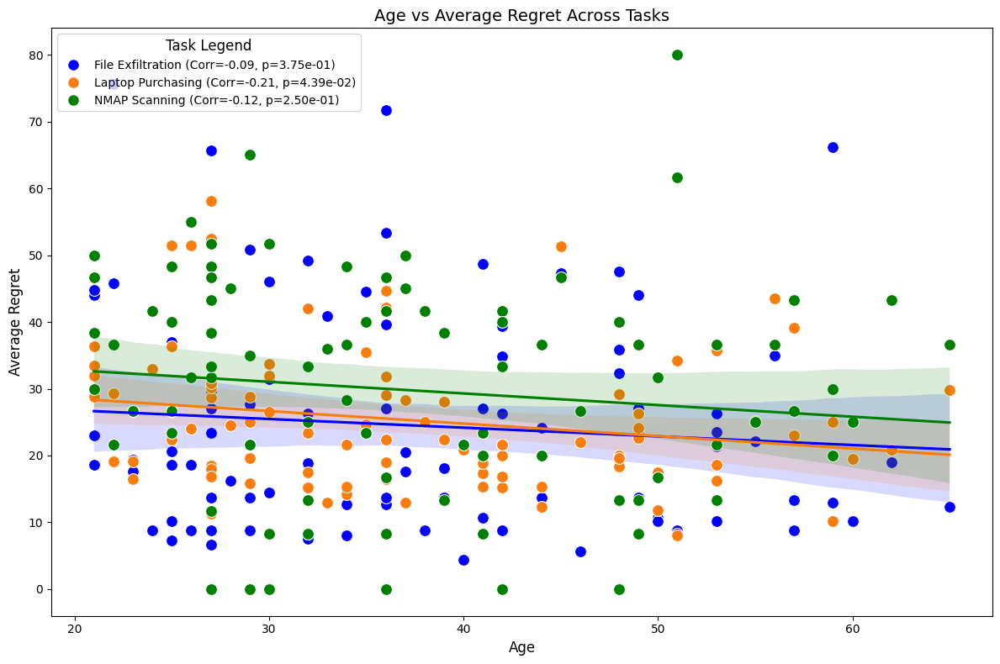

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
import seaborn as sns

file_path = '/content/Choice_Overload.csv'
df = pd.read_csv(file_path)

age_column = 'Age'
option_columns = {
    'File Exfiltration': ['ci_co_fl_1', 'ci_co_fl_2', 'ci_co_fl_3', 'ci_co_fl_4', 'ci_co_fl_5', 'ci_co_fl_6'],
    'Laptop Purchasing': ['em_co_lp_1', 'em_co_lp_2', 'em_co_lp_3', 'em_co_lp_4', 'em_co_lp_5', 'em_co_lp_6'],
    'NMAP Scanning': ['ci_co_nmap_1', 'ci_co_nmap_2', 'ci_co_nmap_3', 'ci_co_nmap_4', 'ci_co_nmap_5', 'ci_co_nmap_6']
}

task_scores = {
    'File Exfiltration': file_exfiltration_scores,
    'Laptop Purchasing': laptop_purchasing_scores,
    'NMAP Scanning': nmap_scores
}

# Calculate average regret for a task
def calculate_average_regret(row, trial_scores, option_cols):
    total_regret = 0
    count = 0
    for i, option in enumerate(row[option_cols]):
        trial_name = f"Trial {i + 1}"
        trial = trial_scores.get(trial_name, {})
        if option in trial:
            highest_score = max(trial.values())
            regret = highest_score - trial[option]
            total_regret += regret
            count += 1
    return total_regret / count if count > 0 else np.nan

# Collect all data for plotting
combined_data = []

# Perform correlation analysis and collect legend labels
legend_labels = []
for task, scores in task_scores.items():
    # Calculate average regret for the task
    df[f'{task}_Regret'] = df.apply(
        calculate_average_regret, axis=1, trial_scores=scores, option_cols=option_columns[task]
    )

    # Clean data
    df[age_column] = pd.to_numeric(df[age_column], errors='coerce')
    df[f'{task}_Regret'] = df[f'{task}_Regret'].replace([np.inf, -np.inf], np.nan)
    df_cleaned = df.dropna(subset=[age_column, f'{task}_Regret'])

    # Extract cleaned data
    ages_cleaned = df_cleaned[age_column]
    regrets_cleaned = df_cleaned[f'{task}_Regret']

    # Perform correlation analysis
    correlation, p_value = pearsonr(ages_cleaned, regrets_cleaned)
    legend_labels.append(f"{task} (Corr={correlation:.2f}, p={p_value:.2e})")

    # Add data to combined dataset
    task_data = pd.DataFrame({
        'Age': ages_cleaned,
        'Average Regret': regrets_cleaned,
        'Task': task
    })
    combined_data.append(task_data)

# Plot the combined scatter plot with detailed legend
plt.figure(figsize=(12, 8))

# Define colors for tasks
task_colors = {'File Exfiltration': 'blue', 'Laptop Purchasing': '#f97d0e', 'NMAP Scanning': 'green'}

# Concatenate the list of task dataframes into a single dataframe
combined_df = pd.concat(combined_data, ignore_index=True)

# Initialize legend labels
legend_handles = []

# Loop through tasks and plot
for task, color in task_colors.items():
    task_data = combined_df[combined_df['Task'] == task]
    correlation, p_value = pearsonr(task_data['Age'], task_data['Average Regret'])

    # Scatter plot
    scatter = sns.scatterplot(
        data=task_data,
        x='Age',
        y='Average Regret',
        color=color,
        s=100,
        label=None
    )

    # Regression line
    sns.regplot(
        data=task_data,
        x='Age',
        y='Average Regret',
        scatter=False,
        color=color,
        label=None
    )

    # Add task legend manually
    legend_handles.append(
        plt.Line2D(
            [], [], color=color, marker='o', linestyle='',
            markersize=8, label=f"{task} (Corr={correlation:.2f}, p={p_value:.2e})"
        )
    )

# Add title, labels, and legend
plt.title('Age vs Average Regret Across Tasks', fontsize=14)
plt.xlabel('Age', fontsize=12)
plt.ylabel('Average Regret', fontsize=12)
plt.legend(handles=legend_handles, title='Task Legend', fontsize=10, title_fontsize=12, loc='upper left')
plt.tight_layout()
plt.show()

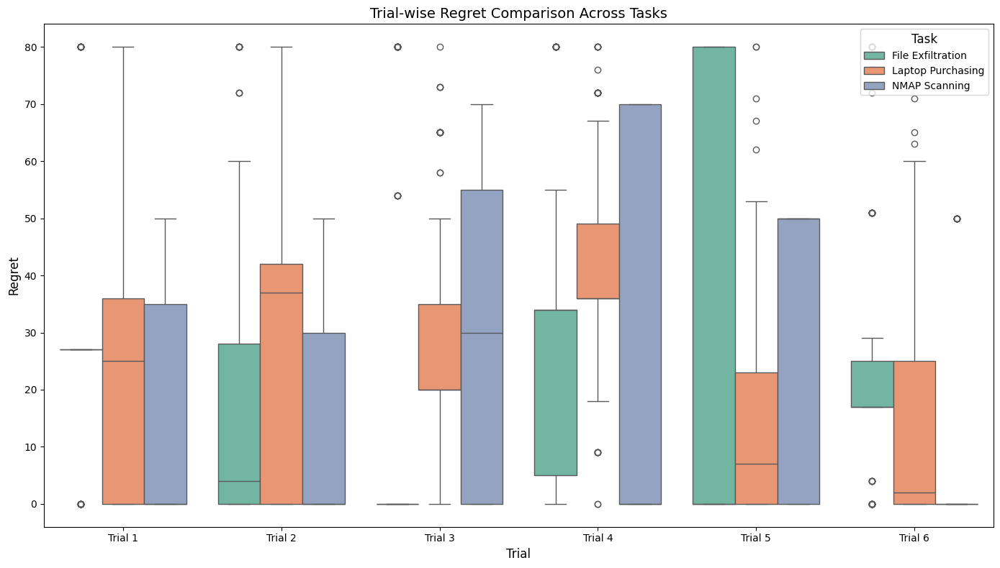

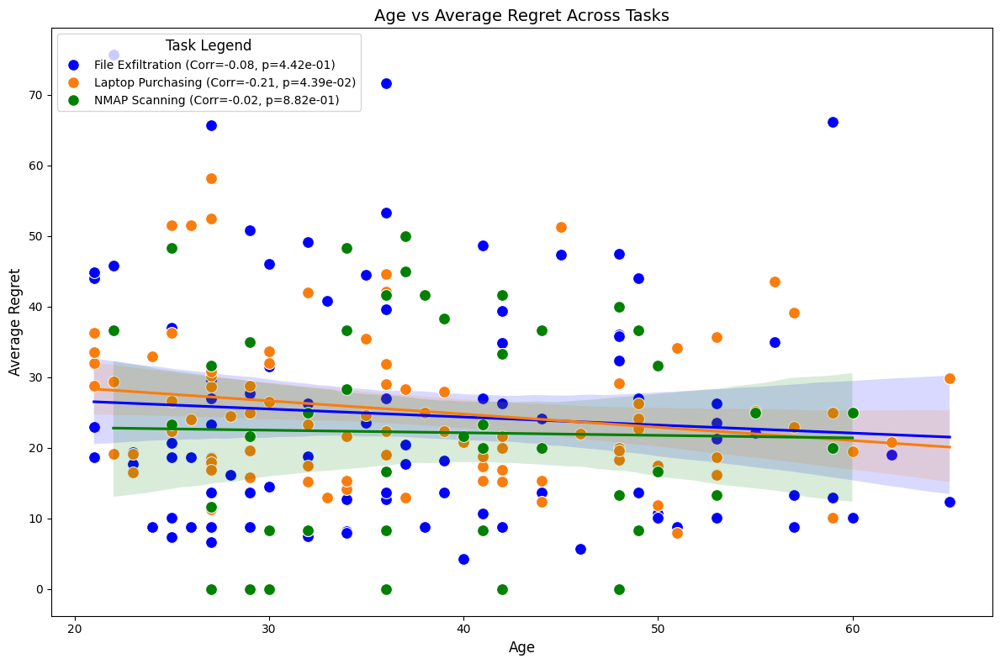

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
import seaborn as sns

file_path = '/content/Choice_Overload.csv'
df = pd.read_csv(file_path)

# Define task scores and option columns as before
task_scores = {
    'File Exfiltration': file_exfiltration_scores,
    'Laptop Purchasing': laptop_purchasing_scores,
    'NMAP Scanning': nmap_scores
}

option_columns = {
    'File Exfiltration': ['ci_co_fl_1', 'ci_co_fl_2', 'ci_co_fl_3', 'ci_co_fl_4', 'ci_co_fl_5', 'ci_co_fl_6'],
    'Laptop Purchasing': ['em_co_lp_1', 'em_co_lp_2', 'em_co_lp_3', 'em_co_lp_4', 'em_co_lp_5', 'em_co_lp_6'],
    'NMAP Scanning': ['ci_co_nmap_1', 'ci_co_nmap_2', 'ci_co_nmap_3', 'ci_co_nmap_4', 'ci_co_nmap_5', 'ci_co_nmap_6']
}

age_column = 'Age'

# Calculate average regret for a single trial
def calculate_trial_regret(row, trial_scores, trial_index, option_cols):
    option = row[option_cols[trial_index]]
    trial_name = f"Trial {trial_index + 1}"
    trial = trial_scores.get(trial_name, {})
    if option in trial:
        highest_score = max(trial.values())
        return highest_score - trial[option]
    return np.nan

# Perform trial-wise and task-wise regret calculations
combined_trial_data = []
combined_task_data = []

for task, scores in task_scores.items():
    task_option_cols = option_columns[task]

    for trial_index in range(len(task_option_cols)):
        trial_col = task_option_cols[trial_index]
        df[f'{task}_Trial{trial_index + 1}_Regret'] = df.apply(
            calculate_trial_regret, axis=1, trial_scores=scores, trial_index=trial_index, option_cols=task_option_cols
        )

    # Calculate average regret for the task across trials
    trial_cols = [f'{task}_Trial{trial_index + 1}_Regret' for trial_index in range(len(task_option_cols))]
    df[f'{task}_Average_Regret'] = df[trial_cols].mean(axis=1, skipna=True)

    # Clean data for age and regret
    df[age_column] = pd.to_numeric(df[age_column], errors='coerce')
    df_cleaned = df.dropna(subset=[age_column] + trial_cols)
    ages_cleaned = df_cleaned[age_column]

    # Collect trial-wise data
    for trial_index, trial_col in enumerate(trial_cols, start=1):
        trial_data = pd.DataFrame({
            'Age': ages_cleaned,
            'Regret': pd.to_numeric(df_cleaned[trial_col], errors='coerce'),
            'Task': task,
            'Trial': f'Trial {trial_index}'
        })
        combined_trial_data.append(trial_data)

    # Collect task-wise average data
    task_data = pd.DataFrame({
        'Age': ages_cleaned,
        'Average Regret': pd.to_numeric(df_cleaned[f'{task}_Average_Regret'], errors='coerce'),
        'Task': task
    })
    combined_task_data.append(task_data)

# Concatenate trial-wise and task-wise data
combined_trial_df = pd.concat(combined_trial_data, ignore_index=True)
combined_task_df = pd.concat(combined_task_data, ignore_index=True)

# Save trial-wise data for later pairwise t-tests
trialwise_file = "/content/Trialwise_Age_Regret_Data.csv"
combined_trial_df.to_csv(trialwise_file, index=False)

# Ensure Age and Regret columns are numeric in trial-wise data
combined_trial_df['Age'] = pd.to_numeric(combined_trial_df['Age'], errors='coerce')
combined_trial_df['Regret'] = pd.to_numeric(combined_trial_df['Regret'], errors='coerce')

# Plot trial-wise comparison
plt.figure(figsize=(14, 8))
sns.boxplot(data=combined_trial_df, x='Trial', y='Regret', hue='Task', palette='Set2')
plt.title('Trial-wise Regret Comparison Across Tasks', fontsize=14)
plt.xlabel('Trial', fontsize=12)
plt.ylabel('Regret', fontsize=12)
plt.legend(title='Task', fontsize=10, title_fontsize=12, loc='upper right')
plt.tight_layout()
plt.show()

# Plot task-wise scatter plot
plt.figure(figsize=(12, 8))
task_colors = {'File Exfiltration': 'blue', 'Laptop Purchasing': '#f97d0e', 'NMAP Scanning': 'green'}
legend_handles = []

for task, color in task_colors.items():
    task_data = combined_task_df[combined_task_df['Task'] == task].copy()  # Explicitly make a copy
    task_data['Age'] = pd.to_numeric(task_data['Age'], errors='coerce')
    task_data['Average Regret'] = pd.to_numeric(task_data['Average Regret'], errors='coerce')

    # Perform correlation analysis
    correlation, p_value = pearsonr(task_data['Age'], task_data['Average Regret'])

    sns.scatterplot(
        data=task_data,
        x='Age',
        y='Average Regret',
        color=color,
        s=100,
        label=None
    )
    sns.regplot(
        data=task_data,
        x='Age',
        y='Average Regret',
        scatter=False,
        color=color,
        label=None
    )
    legend_handles.append(
        plt.Line2D([], [], color=color, marker='o', linestyle='', markersize=8,
                   label=f"{task} (Corr={correlation:.2f}, p={p_value:.2e})")
    )

plt.title('Age vs Average Regret Across Tasks', fontsize=14)
plt.xlabel('Age', fontsize=12)
plt.ylabel('Average Regret', fontsize=12)
plt.legend(handles=legend_handles, title='Task Legend', fontsize=10, title_fontsize=12, loc='upper left')
plt.tight_layout()
plt.show()

**ANOVA**

In [ ]:
from scipy.stats import f_oneway
import pandas as pd
import numpy as np

def perform_anova(task_data, regret_column, group_column):
    """
    Perform ANOVA for Regret vs Age.

    Args:
        task_data (pd.DataFrame): DataFrame with columns for group (e.g., Age) and value (e.g., Regret).
        regret_column (str): The column representing the dependent variable (e.g., Regret).
        group_column (str): The column representing the independent variable (e.g., Age).

    Returns:
        dict: Results containing ANOVA statistics.
    """
    # Group data by the independent variable (e.g., Age)
    grouped_data = task_data.groupby(group_column)[regret_column].apply(list)

    # Ensure there are multiple groups for ANOVA
    if len(grouped_data) < 2:
        return None

    # Perform ANOVA
    f_stat, p_value = f_oneway(*grouped_data)

    # Calculate additional statistics
    overall_mean = task_data[regret_column].mean()
    SSB = sum(len(values) * (np.mean(values) - overall_mean) ** 2 for values in grouped_data)
    SSW = sum(sum((x - np.mean(values)) ** 2 for x in values) for values in grouped_data)
    df_B = len(grouped_data) - 1
    df_W = len(task_data) - len(grouped_data)
    significance = "Yes" if p_value <= 0.05 else "No"

    return {
        "SSB": SSB,
        "SSW": SSW,
        "F-ratio": f_stat,
        "df_B": df_B,
        "df_W": df_W,
        "p-value": p_value,
        "Significant": significance
    }

# Perform ANOVA for each task (example)
anova_results = []
for task in task_scores.keys():
    # Task-wide ANOVA (Age vs Average Regret)
    task_data = combined_task_df[combined_task_df['Task'] == task]
    result = perform_anova(task_data, regret_column='Average Regret', group_column='Age')
    if result:
        result['Task'] = task
        anova_results.append(result)

# Organize results into DataFrame
anova_results_df = pd.DataFrame(anova_results)

# Save results to CSV
anova_results_file = "/content/ANOVA_Age_vs_Regret_Results.csv"
anova_results_df.to_csv(anova_results_file, index=False)
anova_results_df

,SSB,SSW,F-ratio,df_B,df_W,p-value,Significant,Task
0,10126.660879,13762.533267,1.198325,35,57,0.267424,No,File Exfiltration
1,4192.437469,5683.770569,1.222334,35,58,0.245229,No,Laptop Purchasing
2,5261.516204,5811.574074,1.120911,21,26,0.386885,No,NMAP Scanning


**Several Types of Correlation Analysis**

File Exfiltration:
  Pearson Correlation: -0.09 (p=3.75e-01)
  Spearman Correlation: -0.07 (p=4.87e-01)
  Kendall Tau Correlation: -0.06 (p=4.19e-01)


Laptop Purchasing:
  Pearson Correlation: -0.21 (p=4.39e-02)
  Spearman Correlation: -0.24 (p=1.96e-02)
  Kendall Tau Correlation: -0.17 (p=2.00e-02)


NMAP Scanning:
  Pearson Correlation: -0.12 (p=2.50e-01)
  Spearman Correlation: -0.20 (p=5.63e-02)
  Kendall Tau Correlation: -0.12 (p=9.16e-02)




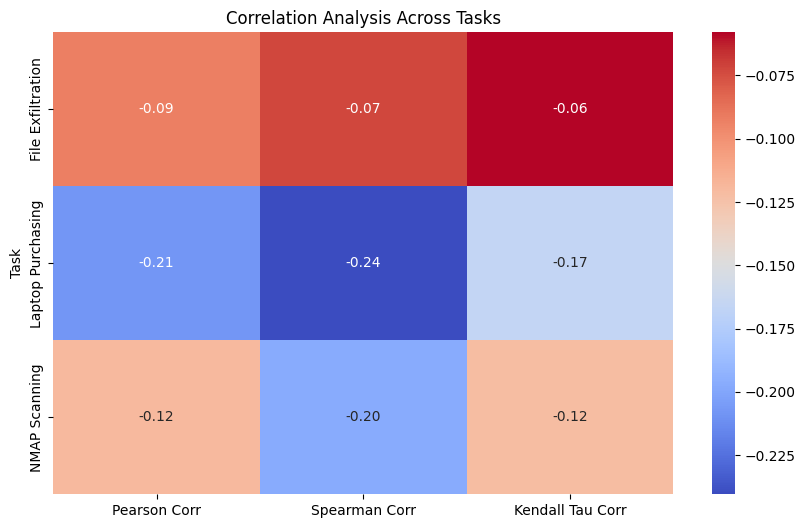

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr, spearmanr, kendalltau
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/Choice_Overload.csv'
df = pd.read_csv(file_path)

# Define columns
age_column = 'Age'
option_columns = {
    'File Exfiltration': ['ci_co_fl_1', 'ci_co_fl_2', 'ci_co_fl_3', 'ci_co_fl_4', 'ci_co_fl_5', 'ci_co_fl_6'],
    'Laptop Purchasing': ['em_co_lp_1', 'em_co_lp_2', 'em_co_lp_3', 'em_co_lp_4', 'em_co_lp_5', 'em_co_lp_6'],
    'NMAP Scanning': ['ci_co_nmap_1', 'ci_co_nmap_2', 'ci_co_nmap_3', 'ci_co_nmap_4', 'ci_co_nmap_5', 'ci_co_nmap_6']
}

task_scores = {
    'File Exfiltration': file_exfiltration_scores,
    'Laptop Purchasing': laptop_purchasing_scores,
    'NMAP Scanning': nmap_scores
}

# Calculate average regret for a task
def calculate_average_regret(row, trial_scores, option_cols):
    total_regret = 0
    count = 0
    for i, option in enumerate(row[option_cols]):
        trial_name = f"Trial {i + 1}"
        trial = trial_scores.get(trial_name, {})
        if option in trial:
            highest_score = max(trial.values())
            regret = highest_score - trial[option]
            total_regret += regret
            count += 1
    return total_regret / count if count > 0 else np.nan

# Perform correlation analysis and collect data for each type of correlation
correlation_results = []

for task, scores in task_scores.items():
    # Calculate average regret for the task
    df[f'{task}_Regret'] = df.apply(
        calculate_average_regret, axis=1, trial_scores=scores, option_cols=option_columns[task]
    )

    # Clean data
    df[age_column] = pd.to_numeric(df[age_column], errors='coerce')
    df[f'{task}_Regret'] = df[f'{task}_Regret'].replace([np.inf, -np.inf], np.nan)
    df_cleaned = df.dropna(subset=[age_column, f'{task}_Regret'])

    # Extract cleaned data
    ages_cleaned = df_cleaned[age_column]
    regrets_cleaned = df_cleaned[f'{task}_Regret']

    # Perform Pearson, Spearman, and Kendall correlations
    pearson_corr, pearson_p = pearsonr(ages_cleaned, regrets_cleaned)
    spearman_corr, spearman_p = spearmanr(ages_cleaned, regrets_cleaned)
    kendall_corr, kendall_p = kendalltau(ages_cleaned, regrets_cleaned)

    correlation_results.append({
        'Task': task,
        'Pearson Corr': pearson_corr,
        'Pearson p': pearson_p,
        'Spearman Corr': spearman_corr,
        'Spearman p': spearman_p,
        'Kendall Tau Corr': kendall_corr,
        'Kendall Tau p': kendall_p
    })

    print(f"{task}:")
    print(f"  Pearson Correlation: {pearson_corr:.2f} (p={pearson_p:.2e})")
    print(f"  Spearman Correlation: {spearman_corr:.2f} (p={spearman_p:.2e})")
    print(f"  Kendall Tau Correlation: {kendall_corr:.2f} (p={kendall_p:.2e})")
    print("\n")

# Convert results to a DataFrame for easier visualization
correlation_df = pd.DataFrame(correlation_results)

# Plot correlation heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(
    correlation_df[['Pearson Corr', 'Spearman Corr', 'Kendall Tau Corr']].set_index(correlation_df['Task']),
    annot=True, cmap='coolwarm', fmt=".2f", cbar=True
)
plt.title('Correlation Analysis Across Tasks')
plt.show()

**Impact of changing of Age over Avg Regret**

**Age vs Average Time Taken**

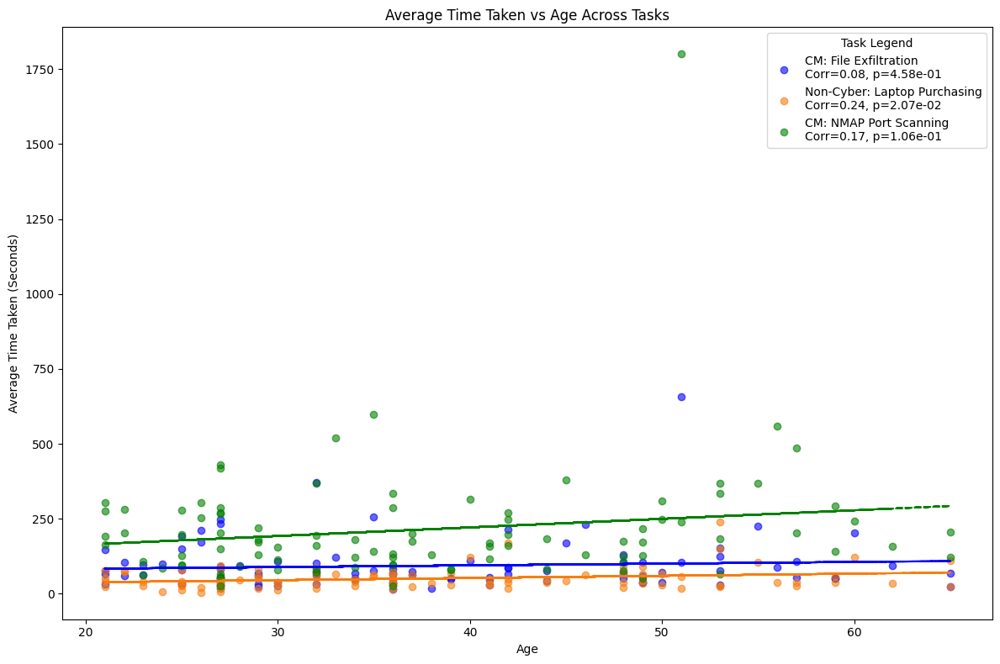

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import pearsonr

def analyze_task_with_correlation(file_path, task_name, pattern, new_column_names, age_column):
    """
    Analyze a specific task, calculate raw averages and SE, compute correlations with age.

    Args:
        file_path (str): Path to the dataset.
        task_name (str): Name of the task being analyzed.
        pattern (str): Regex pattern to match relevant columns in the dataset.
        new_column_names (dict): Dictionary to map old column names to new names.
        age_column (str): Name of the age column in the dataset.

    Returns:
        dict: Raw averages, SE values, and correlations for the task.
    """
    df = pd.read_csv(file_path)

    matched_columns = df.filter(regex=pattern).columns.tolist()

    if matched_columns:
        # Rename columns and preprocess Age
        df.rename(columns=new_column_names, inplace=True)
        df['Age'] = pd.to_numeric(df['Age'].str.replace('65\+', '65', regex=True), errors='coerce')

        # Include only relevant columns and drop rows with missing data
        matched_data = df[list(new_column_names.values()) + [age_column]]
        relevant_rows = matched_data.dropna(how='any')

        # Calculate average time taken for trials
        average_data = relevant_rows[list(new_column_names.values())].mean(axis=1)
        age_data = relevant_rows[age_column]

        # Calculate Pearson correlation coefficient and p-value
        corr_coeff, p_value = pearsonr(average_data, age_data)

        return {
            "Task": task_name,
            "Average Data": average_data,
            "Age Data": age_data,
            "Correlation Coefficient": corr_coeff,
            "P-value": p_value
        }

    else:
        print(f"No columns matching '{pattern}' found for {task_name}.")
        return None


def plot_combined_correlation(results):
    """
    Plot combined correlation for all tasks in a single graph with scatter points and regression lines.
    Pearson correlation coefficient and p-value are displayed.

    Args:
        results (list): List of dictionaries containing results from individual tasks.
    """
    plt.figure(figsize=(12, 8))
    task_colors = ['blue', '#f97d0e', 'green']  # Colors for tasks

    for i, result in enumerate(results):
        avg_data = result["Average Data"]
        age_data = result["Age Data"]

        # Scatter plot
        plt.scatter(age_data, avg_data, alpha=0.6, label=f'{result["Task"]}\nCorr={result["Correlation Coefficient"]:.2f}, p={result["P-value"]:.2e}',
                    color=task_colors[i])

        # Fit a regression line
        slope, intercept = np.polyfit(age_data, avg_data, 1)
        plt.plot(age_data, slope * age_data + intercept, color=task_colors[i], linestyle='--')

    plt.title('Average Time Taken vs Age Across Tasks')
    plt.xlabel('Age')
    plt.ylabel('Average Time Taken (Seconds)')
    plt.legend(title="Task Legend")
    plt.tight_layout()
    plt.show()


# File paths and analysis details
file_path = '/content/Choice_Overload.csv'
age_column = 'Age'  # Replace with the actual column name for age in your dataset

# Task 1: File Exfiltration
file_exfiltration_results = analyze_task_with_correlation(
    file_path,
    task_name="CM: File Exfiltration",
    pattern=r'ci_co_fl_[1-6]_timer',
    new_column_names={
        'ci_co_fl_1_timer': 'T1_L8',
        'ci_co_fl_2_timer': 'T2_H8',
        'ci_co_fl_3_timer': 'T3_L16',
        'ci_co_fl_4_timer': 'T4_H16',
        'ci_co_fl_5_timer': 'T5_L32',
        'ci_co_fl_6_timer': 'T6_H32'
    },
    age_column=age_column
)

# Task 2: Laptop Purchasing
laptop_purchasing_results = analyze_task_with_correlation(
    file_path,
    task_name="Non-Cyber: Laptop Purchasing",
    pattern=r'em_co_lp_[1-6]_timer',
    new_column_names={
        'em_co_lp_1_timer': 'T1_L8',
        'em_co_lp_2_timer': 'T2_H8',
        'em_co_lp_3_timer': 'T3_L16',
        'em_co_lp_4_timer': 'T4_H16',
        'em_co_lp_5_timer': 'T5_L32',
        'em_co_lp_6_timer': 'T6_H32',
    },
    age_column=age_column
)

# Task 3: NMAP Example
nmap_results = analyze_task_with_correlation(
    file_path,
    task_name="CM: NMAP Port Scanning",
    pattern=r'ci_co_nmap_[1-6]_timer',
    new_column_names={
        'ci_co_nmap_1_timer': 'T1_L8',
        'ci_co_nmap_2_timer': 'T2_H8',
        'ci_co_nmap_3_timer': 'T3_L16',
        'ci_co_nmap_4_timer': 'T4_H16',
        'ci_co_nmap_5_timer': 'T5_L32',
        'ci_co_nmap_6_timer': 'T6_H32',
    },
    age_column=age_column
)

# Combine results for visualization
results = []
if file_exfiltration_results:
    results.append(file_exfiltration_results)
if laptop_purchasing_results:
    results.append(laptop_purchasing_results)
if nmap_results:
    results.append(nmap_results)

# Plot combined correlation
plot_combined_correlation(results)

**ANOVA**

In [ ]:
from scipy.stats import f_oneway
import pandas as pd
import numpy as np

def calculate_anova_age_time(task_data, age_column, task_name):
    """
    Perform ANOVA for Age vs Average Time Taken for a single task.

    Args:
        task_data (pd.DataFrame): DataFrame containing Age and Average Time for a task.
        age_column (str): The column name for Age in the dataset.
        task_name (str): Name of the task being analyzed.

    Returns:
        dict: Results containing ANOVA statistics for the task.
    """
    # Drop rows with NaN values in Age or Average Data
    task_data = task_data.dropna(subset=['Average Data', 'Age Data'])

    # Create age groups
    task_data['Age Group'] = pd.cut(
        task_data['Age Data'],
        bins=[0, 25, 35, 45, 55, 65, 100],
        labels=["0-25", "26-35", "36-45", "46-55", "56-65", "65+"],
        right=False
    )

    # Group data by Age Group
    grouped = task_data.groupby('Age Group', observed=False)['Average Data'].apply(list)

    # Ensure there are multiple groups with data for ANOVA
    if len(grouped) < 2 or any(len(values) == 0 for values in grouped):
        return {
            "Task": task_name,
            "SSB": np.nan,
            "SSW": np.nan,
            "F-ratio": np.nan,
            "df_B": np.nan,
            "df_W": np.nan,
            "p-value": np.nan,
            "Significant": "No",
            "Error": "Insufficient data for ANOVA"
        }

    # Perform ANOVA
    try:
        f_stat, p_value = f_oneway(*grouped)
    except ValueError:
        return {
            "Task": task_name,
            "SSB": np.nan,
            "SSW": np.nan,
            "F-ratio": np.nan,
            "df_B": np.nan,
            "df_W": np.nan,
            "p-value": np.nan,
            "Significant": "No",
            "Error": "Error during ANOVA calculation"
        }

    # Calculate additional statistics
    total_mean = np.mean(task_data['Average Data'])
    SSB = sum(len(values) * (np.mean(values) - total_mean) ** 2 for values in grouped)
    SSW = sum(sum((x - np.mean(values)) ** 2 for x in values) for values in grouped)
    df_B = len(grouped) - 1
    df_W = len(task_data) - len(grouped)
    MS_B = SSB / df_B if df_B > 0 else np.nan
    MS_W = SSW / df_W if df_W > 0 else np.nan
    significance = "Yes" if p_value <= 0.05 else "No"

    return {
        "Task": task_name,
        "SSB": SSB,
        "SSW": SSW,
        "F-ratio": f_stat,
        "df_B": df_B,
        "df_W": df_W,
        "p-value": p_value,
        "Significant": significance,
        "Error": None
    }

# Perform ANOVA for each task
anova_results = []
for result in results:
    task_name = result["Task"]
    task_data = pd.DataFrame({
        "Average Data": result["Average Data"],
        "Age Data": result["Age Data"]
    })
    anova_result = calculate_anova_age_time(task_data, "Age Data", task_name)
    anova_results.append(anova_result)

# Display results in separate tables
for result in anova_results:
    print(f"\nANOVA Results for {result['Task']} (Age vs Average Time):\n")
    print(pd.DataFrame([result]).drop(columns=['Task', 'Error']))


ANOVA Results for CM: File Exfiltration (Age vs Average Time):

            SSB            SSW   F-ratio  df_B  df_W   p-value Significant
0  35335.254531  670900.481141  0.937498     5    89  0.460801          No

ANOVA Results for Non-Cyber: Laptop Purchasing (Age vs Average Time):

           SSB            SSW   F-ratio  df_B  df_W   p-value Significant
0  7082.178909  114698.097699  1.099083     5    89  0.366655          No

ANOVA Results for CM: NMAP Port Scanning (Age vs Average Time):

             SSB           SSW   F-ratio  df_B  df_W   p-value Significant
0  210432.461171  3.622237e+06  1.034084     5    89  0.402655          No


**Gender vs Average Regret**

Processing task: File Exfiltration
Processing task: Laptop Purchasing
Processing task: NMAP Scanning
Summary Statistics for File Exfiltration:
            count       mean        std       min        25%        50%  \
Gender                                                                    
Female       18.0  22.856481  18.251865  4.333333   9.875000  17.416667   
Male         76.0  25.300439  15.645329  5.666667  12.666667  21.000000   
Non-binary    1.0   8.000000        NaN  8.000000   8.000000   8.000000   

                  75%        max  
Gender                            
Female      30.083333  75.666667  
Male        35.875000  71.666667  
Non-binary   8.000000   8.000000  


Summary Statistics for Laptop Purchasing:
            count       mean        std        min        25%        50%  \
Gender                                                                     
Female       18.0  30.018519  13.108632  10.166667  19.583333  28.416667   
Male         76.0  24.425439   9.3

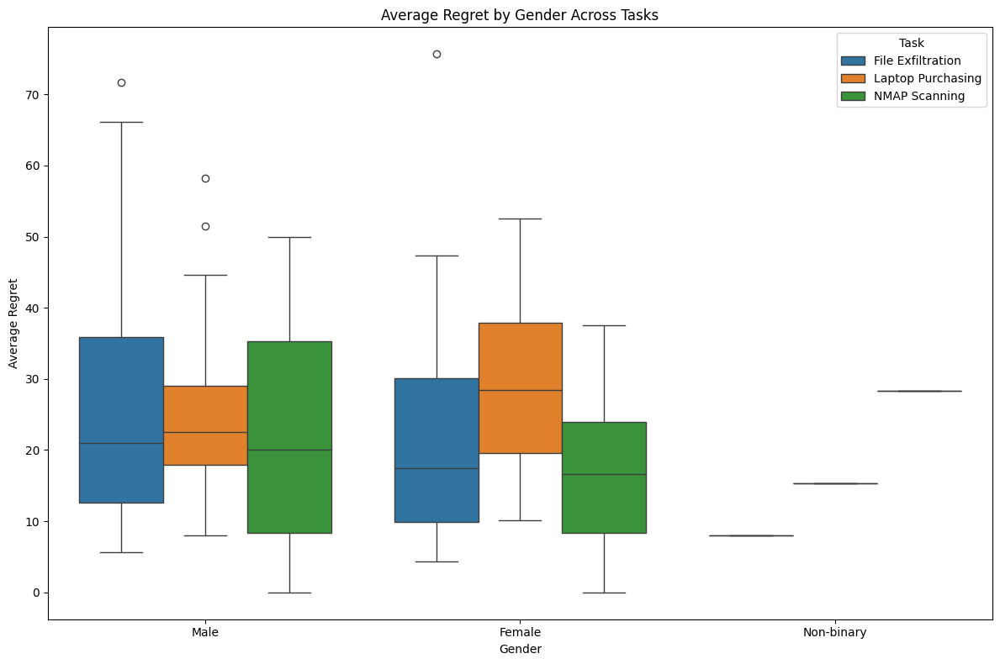

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

file_path = '/content/Choice_Overload.csv'
df = pd.read_csv(file_path)

nmap_scores = {
  'Trial 1': {
    '192.168.56.104:80': 80,
    '192.168.56.104:5900': 80,
    '192.168.56.105:5984': 30,
    '192.168.56.106:3000': 80,
    '192.168.56.107:5432': 50,
    '192.168.56.108:80': 80,
    '192.168.56.109:25': 30,
    '192.168.56.110:80': 80
},

  'Trial 2': {
    '192.168.56.104:80': 80,
    '192.168.56.104:5900': 80,
    '192.168.56.105:5984': 30,
    '192.168.56.106:3000': 80,
    '192.168.56.107:5432': 50,
    '192.168.56.108:80': 80,
    '192.168.56.109:25': 30,
    '192.168.56.110:80': 80

},

  'Trial 3': {
    '192.168.56.104:80': 80,
    '192.168.56.104:5900': 80,
    '192.168.56.105:80': 80,
    '192.168.56.105:443': 30,
    '192.168.56.105:8080': 80,
    '192.168.56.106:5432': 50,
    '192.168.56.107:80': 80,
    '192.168.56.107:5900': 80,
    '192.168.56.108:5432': 50,
    '192.168.56.109:8484': 30,
    '192.168.56.110:80': 80,
    '192.168.56.110:8080': 80,
    '192.168.56.111:80': 80,
    '192.168.56.111:443': 30,
    '192.168.56.111:8080': 80,
    '192.168.56.112:3306': 10
},

  'Trial 4': {
    '192.168.56.104:5484': 80,
    '192.168.56.104:5900': 80,
    '192.168.56.105:80': 80,
    '192.168.56.105:443': 30,
    '192.168.56.105:8080': 80,
    '192.168.56.106:5432': 50,
    '192.168.56.107:80': 80,
    '192.168.56.107:5900': 80,
    '192.168.56.108:5432': 50,
    '192.168.56.109:8484': 30,
    '192.168.56.110:80': 80,
    '192.168.56.110:8080': 80,
    '192.168.56.111:80': 80,
    '192.168.56.111:443': 30,
    '192.168.56.111:8080': 80,
    '192.168.56.112:3306': 10
},

  'Trial 5': {
    '192.168.56.104:5984': 30,
    '192.168.56.105:22': 30,
    '192.168.56.106:3000': 10,
    '192.168.56.107:22': 30,
    '192.168.56.108:3306': 30,
    '192.168.56.109:3306': 50,
    '192.168.56.110:22': 30,
    '192.168.56.111:3000': 30,
    '192.168.56.112:3000': 30,
    '192.168.56.113:8080': 80,
    '192.168.56.114:25': 30,
    '192.168.56.115:8080': 80,
    '192.168.56.115:80': 80,
    '192.168.56.115:443': 30,
    '192.168.56.116:22': 30,
    '192.168.56.117:3000': 10,
    '192.168.56.118:21': 80,
    '192.168.56.119:8080': 80,
    '192.168.56.119:80': 80,
    '192.168.56.119:443': 30,
    '192.168.56.120:7474': 80,
    '192.168.56.120:7687': 30,
    '192.168.56.121:7474': 80,
    '192.168.56.121:7687': 30,
    '192.168.56.122:25': 30,
    '192.168.56.123:25': 30,
    '192.168.56.124:5432': 50,
    '192.168.56.125:8080': 80,
    '192.168.56.126:5984': 30,
    '192.168.56.127:3000': 10,
    '192.168.56.128:8080': 80,
    '192.168.56.129:80': 80
},

  'Trial 6': {
    '192.168.56.213:5900': 80,
    '192.168.56.217:22': 30,
    '192.168.56.218:80': 80,
    '192.168.56.219:80': 80,
    '192.168.56.220:80': 80,
    '192.168.56.223:5900': 80,
    '192.168.56.226:8080': 80,
    '192.168.56.227:22': 30,
    '192.168.56.229:20': 80,
    '192.168.56.229:21': 80,
    '192.168.56.233:21': 80
}
}

gender_column = 'Gender'
option_columns = {
    'File Exfiltration': ['ci_co_fl_1', 'ci_co_fl_2', 'ci_co_fl_3', 'ci_co_fl_4', 'ci_co_fl_5', 'ci_co_fl_6'],
    'Laptop Purchasing': ['em_co_lp_1', 'em_co_lp_2', 'em_co_lp_3', 'em_co_lp_4', 'em_co_lp_5', 'em_co_lp_6'],
    'NMAP Scanning': ['ci_co_nmap_1', 'ci_co_nmap_2', 'ci_co_nmap_3', 'ci_co_nmap_4', 'ci_co_nmap_5', 'ci_co_nmap_6']
}

task_scores = {
    'File Exfiltration': file_exfiltration_scores,
    'Laptop Purchasing': laptop_purchasing_scores,
    'NMAP Scanning': nmap_scores
}

def calculate_average_regret(row, trial_scores, option_cols):
    total_regret = 0
    count = 0
    for i, option in enumerate(row[option_cols]):
        trial_name = f"Trial {i + 1}"
        trial = trial_scores.get(trial_name, {})
        if option in trial:
            highest_score = max(trial.values())
            regret = highest_score - trial[option]
            total_regret += regret
            count += 1
    return total_regret / count if count > 0 else np.nan

combined_data = []
for task, scores in task_scores.items():
    print(f"Processing task: {task}")
    df[f'{task}_Regret'] = df.apply(calculate_average_regret, axis=1, trial_scores=scores, option_cols=option_columns[task])

    df[f'{task}_Regret'] = df[f'{task}_Regret'].replace([np.inf, -np.inf], np.nan)
    df_cleaned = df.dropna(subset=[gender_column, f'{task}_Regret'])

    genders_cleaned = df_cleaned[gender_column]
    regrets_cleaned = df_cleaned[f'{task}_Regret']

    task_data = pd.DataFrame({
        'Gender': genders_cleaned,
        'Average Regret': regrets_cleaned,
        'Task': task
    })
    combined_data.append(task_data)

combined_df = pd.concat(combined_data, ignore_index=True)

# Print descriptive statistics for each task by gender
for task, scores in task_scores.items():
    print(f"Summary Statistics for {task}:")
    task_data = combined_df[combined_df['Task'] == task]
    summary_stats = task_data.groupby('Gender')['Average Regret'].describe()
    print(summary_stats)
    print("\n")

from scipy.stats import pearsonr

# Encode gender as numeric for correlation calculation (e.g., Male: 0, Female: 1)
df['Gender_Numeric'] = df['Gender'].map({'Male': 0, 'Female': 1})

# Collect results for Pearson correlation
correlation_results = []

for task, scores in task_scores.items():
    print(f"Processing task: {task}")
    df[f'{task}_Regret'] = df.apply(calculate_average_regret, axis=1, trial_scores=scores, option_cols=option_columns[task])

    df[f'{task}_Regret'] = df[f'{task}_Regret'].replace([np.inf, -np.inf], np.nan)
    df_cleaned = df.dropna(subset=['Gender_Numeric', f'{task}_Regret'])

    genders_cleaned = df_cleaned['Gender_Numeric']
    regrets_cleaned = df_cleaned[f'{task}_Regret']

    # Calculate Pearson correlation
    correlation, p_value = pearsonr(genders_cleaned, regrets_cleaned)
    correlation_results.append({
        "Task": task,
        "Correlation Coefficient": correlation,
        "P-value": p_value
    })

    # Print descriptive statistics
    task_data = pd.DataFrame({
        'Gender': df_cleaned['Gender'],
        'Average Regret': regrets_cleaned
    })
    summary_stats = task_data.groupby('Gender')['Average Regret'].describe()
    print(f"Summary Statistics for {task}:")
    print(summary_stats)
    print(f"Correlation Coefficient: {correlation:.2f}, P-value: {p_value:.2e}")
    print("\n")

# Print all correlation results
print("Correlation Results:")
for result in correlation_results:
    print(f"Task: {result['Task']}, Correlation Coefficient: {result['Correlation Coefficient']:.2f}, P-value: {result['P-value']:.2e}")

# Plot the boxplot
plt.figure(figsize=(12, 8))
sns.boxplot(
    data=combined_df,
    x='Gender',
    y='Average Regret',
    hue='Task',
    palette='tab10'
)
plt.title('Average Regret by Gender Across Tasks')
plt.xlabel('Gender')
plt.ylabel('Average Regret')
plt.legend(title='Task')
plt.tight_layout()
plt.show()

**ANOVA**

In [ ]:
from scipy.stats import f_oneway
import pandas as pd
import numpy as np

def calculate_anova_gender(task_data, task_name):
    """
    Perform ANOVA for Gender vs Average Regret for a single task.

    Args:
        task_data (pd.DataFrame): DataFrame containing Gender and Average Regret for a task.
        task_name (str): Name of the task being analyzed.

    Returns:
        dict: Results containing ANOVA statistics for the task.
    """
    # Group data by Gender
    grouped = task_data.groupby('Gender')['Average Regret'].apply(list)

    # Ensure there are multiple groups with data for ANOVA
    if len(grouped) < 2 or any(len(values) == 0 for values in grouped):
        return {
            "Task": task_name,
            "SSB": np.nan,
            "SSW": np.nan,
            "F-ratio": np.nan,
            "df_B": np.nan,
            "df_W": np.nan,
            "p-value": np.nan,
            "Significant": "No",
            "Error": "Insufficient data for ANOVA"
        }

    # Perform ANOVA
    try:
        f_stat, p_value = f_oneway(*grouped)
    except ValueError:
        return {
            "Task": task_name,
            "SSB": np.nan,
            "SSW": np.nan,
            "F-ratio": np.nan,
            "df_B": np.nan,
            "df_W": np.nan,
            "p-value": np.nan,
            "Significant": "No",
            "Error": "Error during ANOVA calculation"
        }

    # Calculate additional statistics
    total_mean = np.mean(task_data['Average Regret'])
    SSB = sum(len(values) * (np.mean(values) - total_mean) ** 2 for values in grouped)
    SSW = sum(sum((x - np.mean(values)) ** 2 for x in values) for values in grouped)
    df_B = len(grouped) - 1
    df_W = len(task_data) - len(grouped)
    MS_B = SSB / df_B if df_B > 0 else np.nan
    MS_W = SSW / df_W if df_W > 0 else np.nan
    significance = "Yes" if p_value <= 0.05 else "No"

    return {
        "Task": task_name,
        "SSB": SSB,
        "SSW": SSW,
        "F-ratio": f_stat,
        "df_B": df_B,
        "df_W": df_W,
        "p-value": p_value,
        "Significant": significance,
        "Error": None
    }

# Perform ANOVA for each task
anova_results = []
for task, scores in task_scores.items():
    task_data = combined_df[combined_df['Task'] == task]
    anova_result = calculate_anova_gender(task_data, task)
    anova_results.append(anova_result)

# Display results in separate tables
for result in anova_results:
    print(f"\nANOVA Results for {result['Task']} (Gender vs Average Regret):\n")
    print(pd.DataFrame([result]).drop(columns=['Task', 'Error']))


ANOVA Results for File Exfiltration (Gender vs Average Regret):

          SSB          SSW   F-ratio  df_B  df_W   p-value Significant
0  367.273973  24021.44284  0.703313     2    92  0.497584          No

ANOVA Results for Laptop Purchasing (Gender vs Average Regret):

          SSB          SSW   F-ratio  df_B  df_W  p-value Significant
0  557.462606  9496.904646  2.700172     2    92  0.07252          No

ANOVA Results for NMAP Scanning (Gender vs Average Regret):

          SSB           SSW   F-ratio  df_B  df_W   p-value Significant
0  453.664675  20719.245786  0.996259     2    91  0.373249          No


**Gender vs Average Time Taken**

Task: CM: File Exfiltration
Correlation Coefficient: 0.22
P-value: 3.53e-02

Task: Non-Cyber: Laptop Purchasing
Correlation Coefficient: -0.09
P-value: 3.80e-01

Task: CM: NMAP Port Scanning
Correlation Coefficient: 0.21
P-value: 4.47e-02



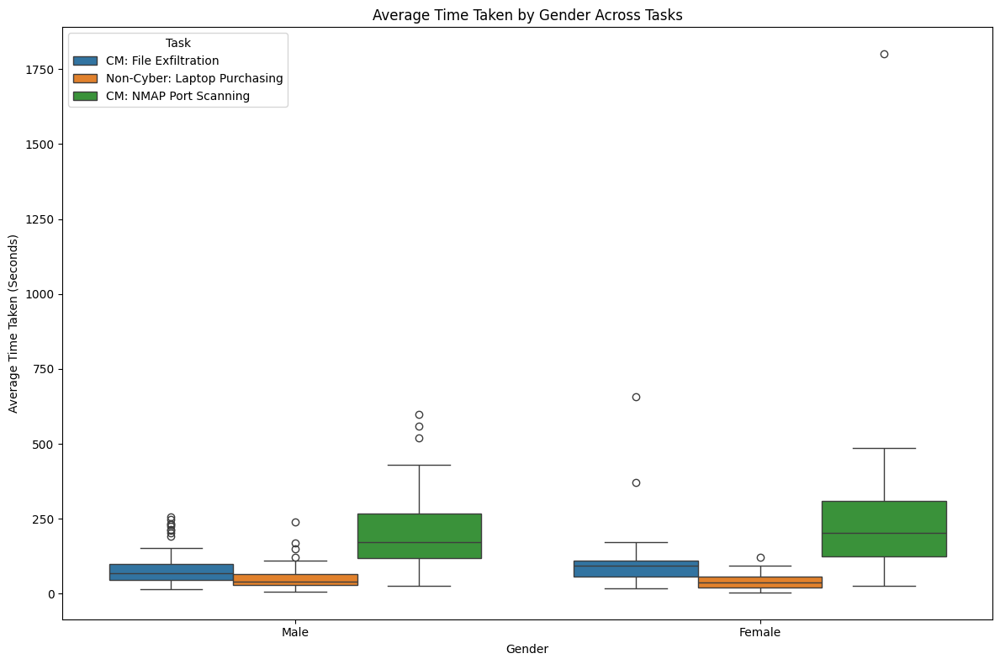

In [ ]:
from scipy.stats import pearsonr

def analyze_task_with_timers(file_path, task_name, pattern, new_column_names, gender_column):
    """
    Analyze task timer data, compute average time, and calculate correlation with gender.

    Args:
        file_path (str): Path to the dataset.
        task_name (str): Name of the task being analyzed.
        pattern (str): Regex pattern to match relevant columns in the dataset.
        new_column_names (dict): Dictionary to map old column names to new names.
        gender_column (str): Name of the gender column in the dataset.

    Returns:
        dict: Dictionary containing the average time and correlation results for the task.
    """
    df = pd.read_csv(file_path)

    matched_columns = df.filter(regex=pattern).columns.tolist()
    if matched_columns:
        # Rename columns and preprocess Gender
        df.rename(columns=new_column_names, inplace=True)
        df['Gender_Numeric'] = df[gender_column].map({'Male': 0, 'Female': 1})

        # Include only relevant columns and drop rows with missing data
        matched_data = df[list(new_column_names.values()) + ['Gender_Numeric']]
        relevant_rows = matched_data.dropna(how='any')

        # Calculate average time taken for trials
        average_time = relevant_rows[list(new_column_names.values())].mean(axis=1)
        gender_data = relevant_rows['Gender_Numeric']

        # Calculate Pearson correlation coefficient and p-value
        corr_coeff, p_value = pearsonr(gender_data, average_time)

        return {
            "Task": task_name,
            "Average Time": average_time,
            "Gender Data": gender_data,
            "Correlation Coefficient": corr_coeff,
            "P-value": p_value
        }
    else:
        print(f"No columns matching '{pattern}' found for {task_name}.")
        return None


# File paths and gender column
file_path = '/content/Choice_Overload.csv'
gender_column = 'Gender'

# Task 1: File Exfiltration
file_exfiltration_results = analyze_task_with_timers(
    file_path,
    task_name="CM: File Exfiltration",
    pattern=r'ci_co_fl_[1-6]_timer',
    new_column_names={
        'ci_co_fl_1_timer': 'T1_L8',
        'ci_co_fl_2_timer': 'T2_H8',
        'ci_co_fl_3_timer': 'T3_L16',
        'ci_co_fl_4_timer': 'T4_H16',
        'ci_co_fl_5_timer': 'T5_L32',
        'ci_co_fl_6_timer': 'T6_H32'
    },
    gender_column=gender_column
)

# Task 2: Laptop Purchasing
laptop_purchasing_results = analyze_task_with_timers(
    file_path,
    task_name="Non-Cyber: Laptop Purchasing",
    pattern=r'em_co_lp_[1-6]_timer',
    new_column_names={
        'em_co_lp_1_timer': 'T1_L8',
        'em_co_lp_2_timer': 'T2_H8',
        'em_co_lp_3_timer': 'T3_L16',
        'em_co_lp_4_timer': 'T4_H16',
        'em_co_lp_5_timer': 'T5_L32',
        'em_co_lp_6_timer': 'T6_H32',
    },
    gender_column=gender_column
)

# Task 3: NMAP Example
nmap_results = analyze_task_with_timers(
    file_path,
    task_name="CM: NMAP Port Scanning",
    pattern=r'ci_co_nmap_[1-6]_timer',
    new_column_names={
        'ci_co_nmap_1_timer': 'T1_L8',
        'ci_co_nmap_2_timer': 'T2_H8',
        'ci_co_nmap_3_timer': 'T3_L16',
        'ci_co_nmap_4_timer': 'T4_H16',
        'ci_co_nmap_5_timer': 'T5_L32',
        'ci_co_nmap_6_timer': 'T6_H32',
    },
    gender_column=gender_column
)

# Combine results for visualization
results = [file_exfiltration_results, laptop_purchasing_results, nmap_results]

# Print descriptive statistics and correlation results
for result in results:
    if result:
        print(f"Task: {result['Task']}")
        print(f"Correlation Coefficient: {result['Correlation Coefficient']:.2f}")
        print(f"P-value: {result['P-value']:.2e}\n")

# Combine data for visualization
combined_data = []
for result in results:
    if result:
        task_data = pd.DataFrame({
            'Gender': result['Gender Data'].map({0: 'Male', 1: 'Female'}),
            'Average Time Taken': result['Average Time'],
            'Task': result['Task']
        })
        combined_data.append(task_data)

combined_df = pd.concat(combined_data, ignore_index=True)

# Plot boxplots of average time by gender for each task
plt.figure(figsize=(12, 8))
sns.boxplot(
    data=combined_df,
    x='Gender',
    y='Average Time Taken',
    hue='Task',
    palette='tab10'
)
plt.title('Average Time Taken by Gender Across Tasks')
plt.xlabel('Gender')
plt.ylabel('Average Time Taken (Seconds)')
plt.legend(title='Task')
plt.tight_layout()
plt.show()

**ANOVA**


ANOVA Results for CM: File Exfiltration (Gender vs Average Time Taken):

            SSB            SSW  F-ratio  df_B  df_W   p-value Significant
0  33257.748643  670569.135518  4.56286     1    92  0.035327         Yes

ANOVA Results for Non-Cyber: Laptop Purchasing (Gender vs Average Time Taken):

           SSB            SSW   F-ratio  df_B  df_W   p-value Significant
0  1017.980189  120122.018925  0.779659     1    92  0.379547          No

ANOVA Results for CM: NMAP Port Scanning (Gender vs Average Time Taken):

             SSB           SSW   F-ratio  df_B  df_W   p-value Significant
0  164476.558957  3.651585e+06  4.143911     1    92  0.044661         Yes


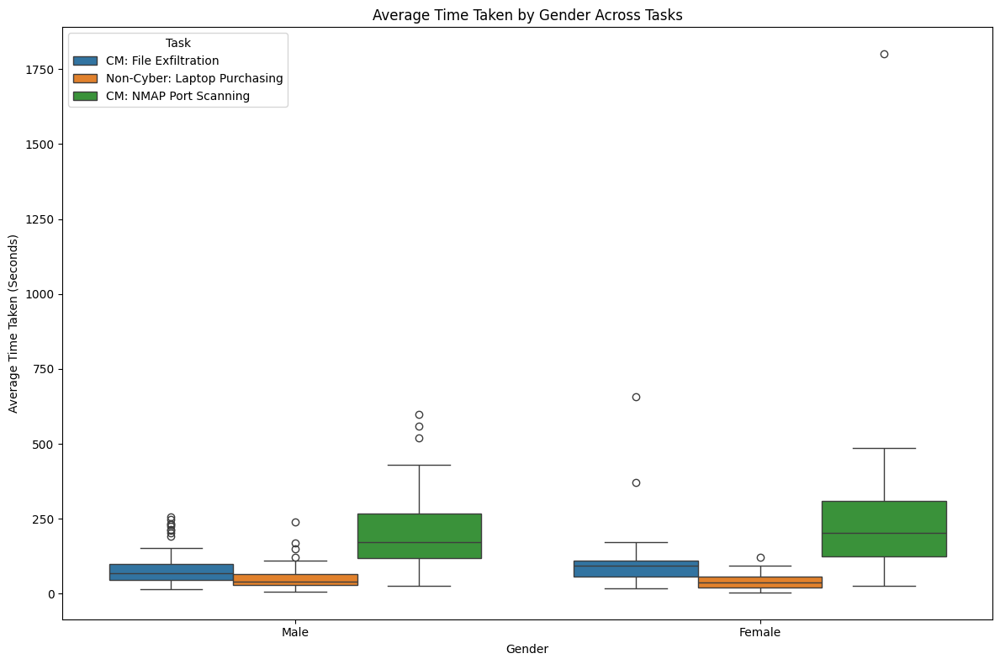

In [ ]:
from scipy.stats import f_oneway
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def calculate_anova_gender(task_data, task_name):
    """
    Perform ANOVA for Gender vs Average Time for a single task.

    Args:
        task_data (pd.DataFrame): DataFrame containing Gender and Average Time for a task.
        task_name (str): Name of the task being analyzed.

    Returns:
        dict: Results containing ANOVA statistics for the task.
    """
    # Group data by Gender
    grouped = task_data.groupby('Gender')['Average Time Taken'].apply(list)

    # Ensure there are multiple groups with data for ANOVA
    if len(grouped) < 2 or any(len(values) == 0 for values in grouped):
        return {
            "Task": task_name,
            "SSB": np.nan,
            "SSW": np.nan,
            "F-ratio": np.nan,
            "df_B": np.nan,
            "df_W": np.nan,
            "p-value": np.nan,
            "Significant": "No",
            "Error": "Insufficient data for ANOVA"
        }

    # Perform ANOVA
    try:
        f_stat, p_value = f_oneway(*grouped)
    except ValueError:
        return {
            "Task": task_name,
            "SSB": np.nan,
            "SSW": np.nan,
            "F-ratio": np.nan,
            "df_B": np.nan,
            "df_W": np.nan,
            "p-value": np.nan,
            "Significant": "No",
            "Error": "Error during ANOVA calculation"
        }

    # Calculate additional statistics
    total_mean = np.mean(task_data['Average Time Taken'])
    SSB = sum(len(values) * (np.mean(values) - total_mean) ** 2 for values in grouped)
    SSW = sum(sum((x - np.mean(values)) ** 2 for x in values) for values in grouped)
    df_B = len(grouped) - 1
    df_W = len(task_data) - len(grouped)
    MS_B = SSB / df_B if df_B > 0 else np.nan
    MS_W = SSW / df_W if df_W > 0 else np.nan
    significance = "Yes" if p_value <= 0.05 else "No"

    return {
        "Task": task_name,
        "SSB": SSB,
        "SSW": SSW,
        "F-ratio": f_stat,
        "df_B": df_B,
        "df_W": df_W,
        "p-value": p_value,
        "Significant": significance,
        "Error": None
    }

# Perform ANOVA for each task
anova_results = []
for result in results:
    if result:
        task_name = result['Task']
        task_data = pd.DataFrame({
            "Gender": result['Gender Data'].map({0: 'Male', 1: 'Female'}),
            "Average Time Taken": result['Average Time']
        })
        anova_result = calculate_anova_gender(task_data, task_name)
        anova_results.append(anova_result)

# Display results in separate tables
for result in anova_results:
    print(f"\nANOVA Results for {result['Task']} (Gender vs Average Time Taken):\n")
    print(pd.DataFrame([result]).drop(columns=['Task', 'Error']))

# Plot boxplots of average time by gender for each task
plt.figure(figsize=(12, 8))
sns.boxplot(
    data=combined_df,
    x='Gender',
    y='Average Time Taken',
    hue='Task',
    palette='tab10'
)
plt.title('Average Time Taken by Gender Across Tasks')
plt.xlabel('Gender')
plt.ylabel('Average Time Taken (Seconds)')
plt.legend(title='Task')
plt.tight_layout()
plt.show()

**Education vs Average Regret**

Processing task: File Exfiltration
Processing task: Laptop Purchasing
Processing task: NMAP Scanning
Summary Statistics for File Exfiltration:
                              count       mean        std        min  \
Education                                                              
2-year College Degree          11.0  28.621212  15.910530   8.166667   
4-year College Degree          49.0  24.173469  16.141158   5.666667   
Doctoral Degree                 1.0   8.250000        NaN   8.250000   
High School/ GED                5.0  29.566667  26.966440   8.833333   
Masters Degree                 18.0  22.157407  15.497467   4.333333   
Professional Degree (JD, MD)    1.0  35.000000        NaN  35.000000   
Some College                   10.0  25.300000  13.174939   7.500000   

                                    25%        50%        75%        max  
Education                                                                 
2-year College Degree         18.250000  27.000000  35.333

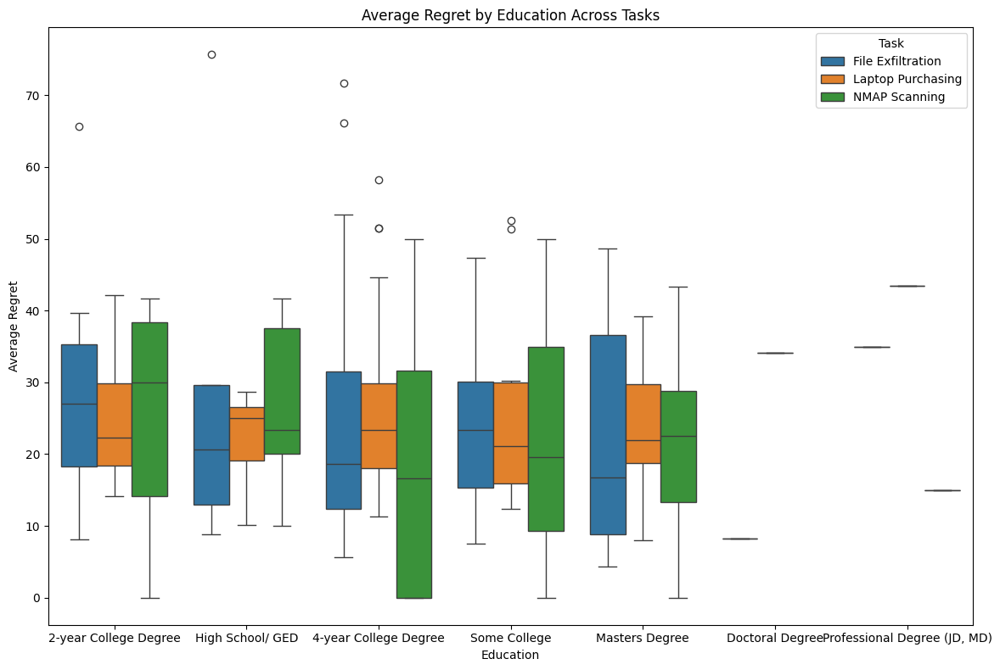

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# Combine all data for Education analysis
education_column = 'Education'
combined_data_education = []

# Process each task and calculate regret
for task, scores in task_scores.items():
    print(f"Processing task: {task}")
    # Calculate average regret for the task
    df[f'{task}_Regret'] = df.apply(calculate_average_regret, axis=1, trial_scores=scores, option_cols=option_columns[task])

    # Clean data
    df[f'{task}_Regret'] = df[f'{task}_Regret'].replace([np.inf, -np.inf], np.nan)
    df_cleaned = df.dropna(subset=[education_column, f'{task}_Regret'])

    # Extract cleaned data
    education_cleaned = df_cleaned[education_column]
    regrets_cleaned = df_cleaned[f'{task}_Regret']

    # Add data to combined dataset
    task_data = pd.DataFrame({
        'Education': education_cleaned,
        'Average Regret': regrets_cleaned,
        'Task': task
    })
    combined_data_education.append(task_data)

# Combine all data into a single DataFrame
combined_df_education = pd.concat(combined_data_education, ignore_index=True)

# Print descriptive statistics for each task by Education
for task in combined_df_education['Task'].unique():
    print(f"Summary Statistics for {task}:")
    task_data = combined_df_education[combined_df_education['Task'] == task]
    summary_stats = task_data.groupby('Education')['Average Regret'].describe()
    print(summary_stats)
    print("\n")

# Function to calculate Pearson correlation for Education
def calculate_pearson_correlation_education(combined_df_education):
    correlation_results = []

    for task in combined_df_education['Task'].unique():
        task_data = combined_df_education[combined_df_education['Task'] == task].copy()  # Create an explicit copy

        # Encode Education as numeric values for correlation calculation
        task_data['Education_Numeric'] = pd.factorize(task_data['Education'])[0]

        # Calculate Pearson correlation
        correlation, p_value = pearsonr(task_data['Education_Numeric'], task_data['Average Regret'])

        correlation_results.append({
            "Task": task,
            "Correlation Coefficient": correlation,
            "P-value": p_value
        })

    return correlation_results

# Calculate Pearson correlation for Education
correlation_results_education = calculate_pearson_correlation_education(combined_df_education)

# Print Correlation Results
print("Correlation Results by Task:")
for result in correlation_results_education:
    print(f"Task: {result['Task']}, Correlation Coefficient: {result['Correlation Coefficient']:.2f}, P-value: {result['P-value']:.2e}")

# Plot the combined boxplot
plt.figure(figsize=(12, 8))
sns.boxplot(
    data=combined_df_education,
    x='Education',
    y='Average Regret',
    hue='Task',
    palette='tab10'
)
plt.title('Average Regret by Education Across Tasks')
plt.xlabel('Education')
plt.ylabel('Average Regret')
plt.legend(title='Task')
plt.tight_layout()
plt.show()

**ANOVA**


ANOVA Results for File Exfiltration (Education vs Average Regret):

          SSB           SSW   F-ratio  df_B  df_W   p-value Significant
0  797.610018  23591.106795  0.495877     6    88  0.809864          No

ANOVA Results for Laptop Purchasing (Education vs Average Regret):

          SSB          SSW   F-ratio  df_B  df_W   p-value Significant
0  543.354435  9511.012817  0.837892     6    88  0.543971          No

ANOVA Results for NMAP Scanning (Education vs Average Regret):

          SSB          SSW   F-ratio  df_B  df_W   p-value Significant
0  812.980741  20359.92972  0.702776     5    88  0.622829          No


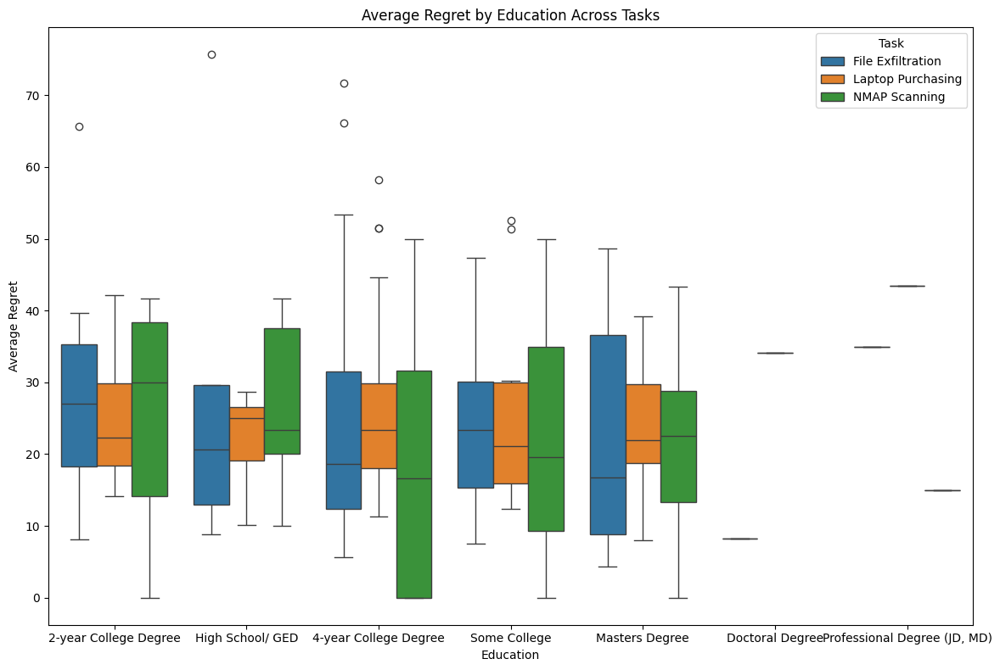

In [ ]:
from scipy.stats import f_oneway
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def calculate_anova_education(task_data, task_name):
    """
    Perform ANOVA for Education vs Average Regret for a single task.

    Args:
        task_data (pd.DataFrame): DataFrame containing Education and Average Regret for a task.
        task_name (str): Name of the task being analyzed.

    Returns:
        dict: Results containing ANOVA statistics for the task.
    """
    # Group data by Education
    grouped = task_data.groupby('Education')['Average Regret'].apply(list)

    # Ensure there are multiple groups with data for ANOVA
    if len(grouped) < 2 or any(len(values) == 0 for values in grouped):
        return {
            "Task": task_name,
            "SSB": np.nan,
            "SSW": np.nan,
            "F-ratio": np.nan,
            "df_B": np.nan,
            "df_W": np.nan,
            "p-value": np.nan,
            "Significant": "No",
            "Error": "Insufficient data for ANOVA"
        }

    # Perform ANOVA
    try:
        f_stat, p_value = f_oneway(*grouped)
    except ValueError:
        return {
            "Task": task_name,
            "SSB": np.nan,
            "SSW": np.nan,
            "F-ratio": np.nan,
            "df_B": np.nan,
            "df_W": np.nan,
            "p-value": np.nan,
            "Significant": "No",
            "Error": "Error during ANOVA calculation"
        }

    # Calculate additional statistics
    total_mean = np.mean(task_data['Average Regret'])
    SSB = sum(len(values) * (np.mean(values) - total_mean) ** 2 for values in grouped)
    SSW = sum(sum((x - np.mean(values)) ** 2 for x in values) for values in grouped)
    df_B = len(grouped) - 1
    df_W = len(task_data) - len(grouped)
    MS_B = SSB / df_B if df_B > 0 else np.nan
    MS_W = SSW / df_W if df_W > 0 else np.nan
    significance = "Yes" if p_value <= 0.05 else "No"

    return {
        "Task": task_name,
        "SSB": SSB,
        "SSW": SSW,
        "F-ratio": f_stat,
        "df_B": df_B,
        "df_W": df_W,
        "p-value": p_value,
        "Significant": significance,
        "Error": None
    }

# Perform ANOVA for each task
anova_results_education = []
for task in combined_df_education['Task'].unique():
    task_data = combined_df_education[combined_df_education['Task'] == task]
    anova_result = calculate_anova_education(task_data, task)
    anova_results_education.append(anova_result)

# Display results in separate tables
for result in anova_results_education:
    print(f"\nANOVA Results for {result['Task']} (Education vs Average Regret):\n")
    print(pd.DataFrame([result]).drop(columns=['Task', 'Error']))

# Plot boxplots of average regret by education for each task
plt.figure(figsize=(12, 8))
sns.boxplot(
    data=combined_df_education,
    x='Education',
    y='Average Regret',
    hue='Task',
    palette='tab10'
)
plt.title('Average Regret by Education Across Tasks')
plt.xlabel('Education')
plt.ylabel('Average Regret')
plt.legend(title='Task')
plt.tight_layout()
plt.show()

**Education vs Average Time Taken**

Processing task: CM: File Exfiltration
Processing task: Non-Cyber: Laptop Purchasing
Processing task: CM: NMAP Port Scanning
Summary Statistics for CM: File Exfiltration:
                              count        mean        std         min  \
Education                                                                
2-year College Degree          11.0   87.272727  55.470777   38.333333   
4-year College Degree          48.0   89.975694  75.485959   15.500000   
Doctoral Degree                 1.0  657.666667        NaN  657.666667   
High School/ GED                5.0   72.666667  49.311228   17.666667   
Masters Degree                 18.0   97.157407  52.953533   29.833333   
Professional Degree (JD, MD)    1.0   87.000000        NaN   87.000000   
Some College                   10.0   68.533333  46.982976   17.666667   

                                     25%         50%         75%         max  
Education                                                                     
2-ye

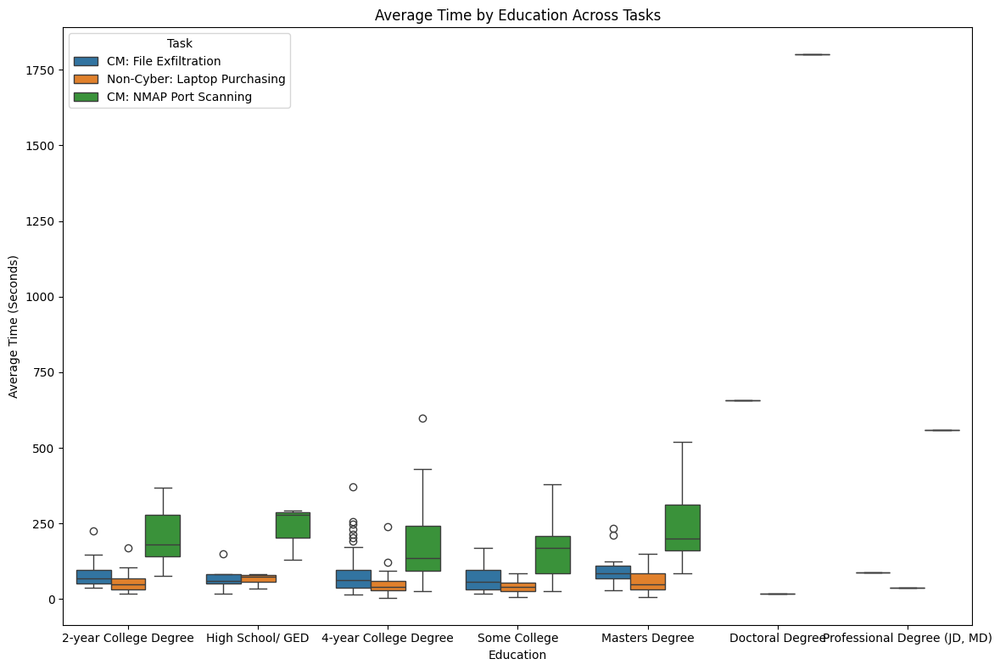

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# Combine all data for Education analysis based on timers
education_column = 'Education'
combined_data_education_timer = []

# Process each task and calculate average time
for task in results:  # Assuming 'results' contains the timer-based analysis results for each task
    print(f"Processing task: {task['Task']}")

    # Clean data
    timer_data = pd.DataFrame({
        'Education': df[education_column],  # Education column from the original DataFrame
        'Average Time': task['Average Time'],  # Average time for the task
    }).dropna()

    # Add task information
    timer_data['Task'] = task['Task']
    combined_data_education_timer.append(timer_data)

# Combine all data into a single DataFrame
combined_df_education_timer = pd.concat(combined_data_education_timer, ignore_index=True)

# Print descriptive statistics for each task by Education
for task in combined_df_education_timer['Task'].unique():
    print(f"Summary Statistics for {task}:")
    task_data = combined_df_education_timer[combined_df_education_timer['Task'] == task]
    summary_stats = task_data.groupby('Education')['Average Time'].describe()
    print(summary_stats)
    print("\n")

# Function to calculate Pearson correlation for Education
def calculate_pearson_correlation_education_timer(combined_df_education_timer):
    correlation_results = []

    for task in combined_df_education_timer['Task'].unique():
        task_data = combined_df_education_timer[combined_df_education_timer['Task'] == task].copy()  # Create an explicit copy

        # Encode Education as numeric values for correlation calculation
        task_data['Education_Numeric'] = pd.factorize(task_data['Education'])[0]

        # Calculate Pearson correlation
        correlation, p_value = pearsonr(task_data['Education_Numeric'], task_data['Average Time'])

        correlation_results.append({
            "Task": task,
            "Correlation Coefficient": correlation,
            "P-value": p_value
        })

    return correlation_results

# Calculate Pearson correlation for Education
correlation_results_education_timer = calculate_pearson_correlation_education_timer(combined_df_education_timer)

# Print Correlation Results
print("Correlation Results by Task (Timer Data):")
for result in correlation_results_education_timer:
    print(f"Task: {result['Task']}, Correlation Coefficient: {result['Correlation Coefficient']:.2f}, P-value: {result['P-value']:.2e}")

# Plot the combined boxplot
plt.figure(figsize=(12, 8))
sns.boxplot(
    data=combined_df_education_timer,
    x='Education',
    y='Average Time',
    hue='Task',
    palette='tab10'
)
plt.title('Average Time by Education Across Tasks')
plt.xlabel('Education')
plt.ylabel('Average Time (Seconds)')
plt.legend(title='Task')
plt.tight_layout()
plt.show()

**ANOVA**


ANOVA Results for CM: File Exfiltration (Education vs Average Time):

            SSB            SSW    F-ratio  df_B  df_W       p-value  \
0  327982.41002  375844.474141  12.653492     6    87  3.254972e-10   

  Significant  
0         Yes  

ANOVA Results for Non-Cyber: Laptop Purchasing (Education vs Average Time):

           SSB            SSW   F-ratio  df_B  df_W   p-value Significant
0  6027.548963  115112.450151  0.759253     6    87  0.603859          No

ANOVA Results for CM: NMAP Port Scanning (Education vs Average Time):

            SSB           SSW    F-ratio  df_B  df_W       p-value Significant
0  2.745546e+06  1.070516e+06  37.188058     6    87  5.176191e-22         Yes


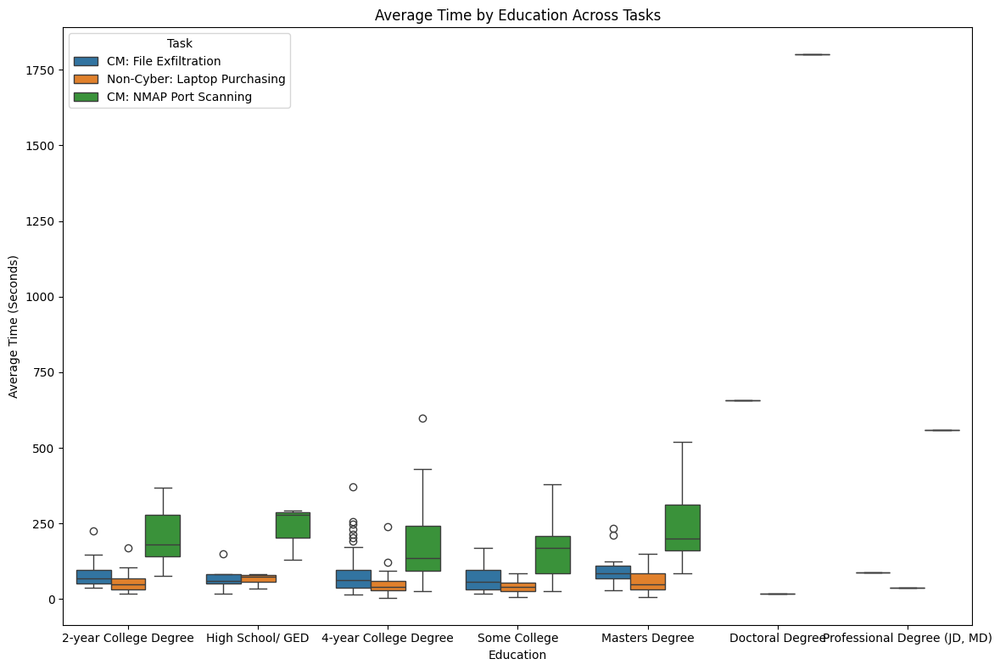

In [ ]:
from scipy.stats import f_oneway
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def calculate_anova_education_timer(task_data, task_name):
    """
    Perform ANOVA for Education vs Average Time for a single task.

    Args:
        task_data (pd.DataFrame): DataFrame containing Education and Average Time for a task.
        task_name (str): Name of the task being analyzed.

    Returns:
        dict: Results containing ANOVA statistics for the task.
    """
    # Group data by Education
    grouped = task_data.groupby('Education')['Average Time'].apply(list)

    # Ensure there are multiple groups with data for ANOVA
    if len(grouped) < 2 or any(len(values) == 0 for values in grouped):
        return {
            "Task": task_name,
            "SSB": np.nan,
            "SSW": np.nan,
            "F-ratio": np.nan,
            "df_B": np.nan,
            "df_W": np.nan,
            "p-value": np.nan,
            "Significant": "No",
            "Error": "Insufficient data for ANOVA"
        }

    # Perform ANOVA
    try:
        f_stat, p_value = f_oneway(*grouped)
    except ValueError:
        return {
            "Task": task_name,
            "SSB": np.nan,
            "SSW": np.nan,
            "F-ratio": np.nan,
            "df_B": np.nan,
            "df_W": np.nan,
            "p-value": np.nan,
            "Significant": "No",
            "Error": "Error during ANOVA calculation"
        }

    # Calculate additional statistics
    total_mean = np.mean(task_data['Average Time'])
    SSB = sum(len(values) * (np.mean(values) - total_mean) ** 2 for values in grouped)
    SSW = sum(sum((x - np.mean(values)) ** 2 for x in values) for values in grouped)
    df_B = len(grouped) - 1
    df_W = len(task_data) - len(grouped)
    MS_B = SSB / df_B if df_B > 0 else np.nan
    MS_W = SSW / df_W if df_W > 0 else np.nan
    significance = "Yes" if p_value <= 0.05 else "No"

    return {
        "Task": task_name,
        "SSB": SSB,
        "SSW": SSW,
        "F-ratio": f_stat,
        "df_B": df_B,
        "df_W": df_W,
        "p-value": p_value,
        "Significant": significance,
        "Error": None
    }

# Perform ANOVA for each task
anova_results_education_timer = []
for task in combined_df_education_timer['Task'].unique():
    task_data = combined_df_education_timer[combined_df_education_timer['Task'] == task]
    anova_result = calculate_anova_education_timer(task_data, task)
    anova_results_education_timer.append(anova_result)

# Display results in separate tables
for result in anova_results_education_timer:
    print(f"\nANOVA Results for {result['Task']} (Education vs Average Time):\n")
    print(pd.DataFrame([result]).drop(columns=['Task', 'Error']))

# Plot boxplots of average time by education for each task
plt.figure(figsize=(12, 8))
sns.boxplot(
    data=combined_df_education_timer,
    x='Education',
    y='Average Time',
    hue='Task',
    palette='tab10'
)
plt.title('Average Time by Education Across Tasks')
plt.xlabel('Education')
plt.ylabel('Average Time (Seconds)')
plt.legend(title='Task')
plt.tight_layout()
plt.show()

# **Timer vs Regret**

Processing task: File Exfiltration
Processing task: Laptop Purchasing
Processing task: NMAP Scanning


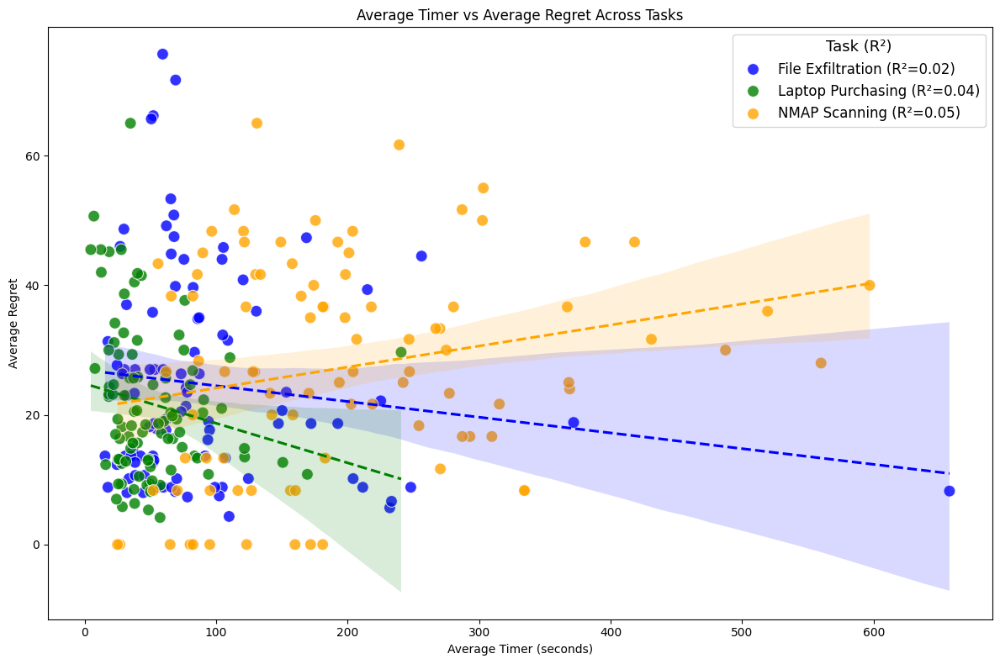


Correlation Analysis Between Average Timer and Average Regret:
File Exfiltration:
  R²: 0.02
  Pearson r: -0.13
  P-Value: 0.2073

Laptop Purchasing:
  R²: 0.04
  Pearson r: -0.19
  P-Value: 0.0655

NMAP Scanning:
  R²: 0.05
  Pearson r: 0.23
  P-Value: 0.0251



In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# Define column mappings
timer_columns = {
    'File Exfiltration': ['ci_co_fl_1_timer', 'ci_co_fl_2_timer', 'ci_co_fl_3_timer', 'ci_co_fl_4_timer', 'ci_co_fl_5_timer', 'ci_co_fl_6_timer'],
    'Laptop Purchasing': ['em_co_lp_1_timer', 'em_co_lp_2_timer', 'em_co_lp_3_timer', 'em_co_lp_4_timer', 'em_co_lp_5_timer', 'em_co_lp_6_timer'],
    'NMAP Scanning': ['ci_co_nmap_1_timer', 'ci_co_nmap_2_timer', 'ci_co_nmap_3_timer', 'ci_co_nmap_4_timer', 'ci_co_nmap_5_timer', 'ci_co_nmap_6_timer']
}

option_columns = {
    'File Exfiltration': ['ci_co_fl_1', 'ci_co_fl_2', 'ci_co_fl_3', 'ci_co_fl_4', 'ci_co_fl_5', 'ci_co_fl_6'],
    'Laptop Purchasing': ['em_co_lp_1', 'em_co_lp_2', 'em_co_lp_3', 'em_co_lp_4', 'em_co_lp_5', 'em_co_lp_6'],
    'NMAP Scanning': ['ci_co_nmap_1', 'ci_co_nmap_2', 'ci_co_nmap_3', 'ci_co_nmap_4', 'ci_co_nmap_5', 'ci_co_nmap_6']
}

task_scores = {
    'File Exfiltration': file_exfiltration_scores,
    'Laptop Purchasing': laptop_purchasing_scores,
    'NMAP Scanning': nmap_scores
}

# Functions to calculate regret and timer
def calculate_average_regret(row, trial_scores, option_cols):
    total_regret = 0
    count = 0
    for i, option in enumerate(row[option_cols]):
        trial_name = f"Trial {i + 1}"
        trial = trial_scores.get(trial_name, {})
        if option in trial:
            highest_score = max(trial.values())
            regret = highest_score - trial[option]
            total_regret += regret
            count += 1
    return total_regret / count if count > 0 else np.nan

def calculate_average_timer(row, timer_cols):
    total_time = 0
    count = 0
    for timer in row[timer_cols]:
        if pd.notna(timer):
            total_time += timer
            count += 1
    return total_time / count if count > 0 else np.nan

# Analyze all tasks
combined_analysis_data = []

for task, scores in task_scores.items():
    print(f"Processing task: {task}")

    df[f'{task}_Regret'] = df.apply(calculate_average_regret, axis=1, trial_scores=scores, option_cols=option_columns[task])
    df[f'{task}_Timer'] = df.apply(calculate_average_timer, axis=1, timer_cols=timer_columns[task])

    df_cleaned = df.dropna(subset=[f'{task}_Regret', f'{task}_Timer'])

    task_data = pd.DataFrame({
        'Task': task,
        'Average Regret': df_cleaned[f'{task}_Regret'],
        'Average Timer': df_cleaned[f'{task}_Timer']
    })
    combined_analysis_data.append(task_data)

# Merge all tasks
combined_analysis_df = pd.concat(combined_analysis_data, ignore_index=True)

# Custom color map
custom_palette = {
    'File Exfiltration': 'blue',
    'NMAP Scanning': 'orange',
    'Laptop Purchasing': 'green'
}

# Plot
plt.figure(figsize=(12, 8))

sns.scatterplot(
    data=combined_analysis_df,
    x='Average Timer',
    y='Average Regret',
    hue='Task',
    palette=custom_palette,
    s=100,
    alpha=0.8
)

# Add regression lines and R² annotations
r_squared_info = {}

for task in combined_analysis_df['Task'].unique():
    task_data = combined_analysis_df[combined_analysis_df['Task'] == task]

    sns.regplot(
        data=task_data,
        x='Average Timer',
        y='Average Regret',
        scatter=False,
        color=custom_palette[task],
        line_kws={'linestyle': '--'}
    )

    correlation, p_value = pearsonr(task_data['Average Timer'], task_data['Average Regret'])
    r_squared = correlation ** 2
    r_squared_info[task] = f"R²={r_squared:.2f}"

# Custom legend with R²
handles, labels = plt.gca().get_legend_handles_labels()
custom_labels = [
    f"{label} ({r_squared_info[label]})" if label in r_squared_info else label
    for label in labels
]

plt.legend(
    handles,
    custom_labels,
    title="Task (R²)",
    loc='upper right',
    fontsize=12,
    title_fontsize=13,
    frameon=True,
    facecolor='white',
    framealpha=0.8
)

plt.title('Average Timer vs Average Regret Across Tasks')
plt.xlabel('Average Timer (seconds)')
plt.ylabel('Average Regret')
plt.tight_layout()
plt.show()

# Optional: Print R² to console too
print("\nCorrelation Analysis Between Average Timer and Average Regret:")
for task in combined_analysis_df['Task'].unique():
    task_data = combined_analysis_df[combined_analysis_df['Task'] == task]
    correlation, p_value = pearsonr(task_data['Average Timer'], task_data['Average Regret'])
    r_squared = correlation ** 2
    print(f"{task}:")
    print(f"  R²: {r_squared:.2f}")
    print(f"  Pearson r: {correlation:.2f}")
    print(f"  P-Value: {p_value:.4f}")
    print()

Processing task: File Exfiltration
Processing task: Laptop Purchasing
Processing task: NMAP Scanning


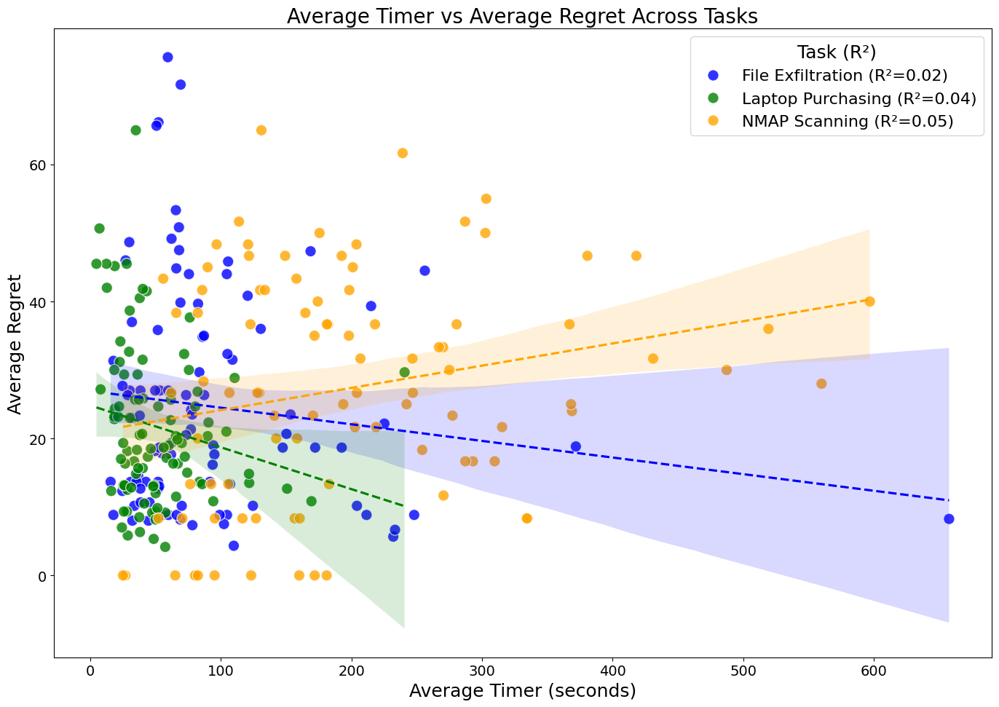


Correlation Analysis Between Average Timer and Average Regret:
File Exfiltration:
  R²: 0.02
  Pearson r: -0.13
  P-Value: 0.2073

Laptop Purchasing:
  R²: 0.04
  Pearson r: -0.19
  P-Value: 0.0655

NMAP Scanning:
  R²: 0.05
  Pearson r: 0.23
  P-Value: 0.0251



In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# Increase global font size
plt.rcParams.update({
    'font.size': 16,            # Base font size
    'axes.titlesize': 20,       # Title font
    'axes.labelsize': 18,       # X/Y label font
    'xtick.labelsize': 14,      # X tick labels
    'ytick.labelsize': 14,      # Y tick labels
    'legend.fontsize': 16,      # Legend font
    'legend.title_fontsize': 18 # Legend title
})

# Define column mappings
timer_columns = {
    'File Exfiltration': ['ci_co_fl_1_timer', 'ci_co_fl_2_timer', 'ci_co_fl_3_timer', 'ci_co_fl_4_timer', 'ci_co_fl_5_timer', 'ci_co_fl_6_timer'],
    'Laptop Purchasing': ['em_co_lp_1_timer', 'em_co_lp_2_timer', 'em_co_lp_3_timer', 'em_co_lp_4_timer', 'em_co_lp_5_timer', 'em_co_lp_6_timer'],
    'NMAP Scanning': ['ci_co_nmap_1_timer', 'ci_co_nmap_2_timer', 'ci_co_nmap_3_timer', 'ci_co_nmap_4_timer', 'ci_co_nmap_5_timer', 'ci_co_nmap_6_timer']
}

option_columns = {
    'File Exfiltration': ['ci_co_fl_1', 'ci_co_fl_2', 'ci_co_fl_3', 'ci_co_fl_4', 'ci_co_fl_5', 'ci_co_fl_6'],
    'Laptop Purchasing': ['em_co_lp_1', 'em_co_lp_2', 'em_co_lp_3', 'em_co_lp_4', 'em_co_lp_5', 'em_co_lp_6'],
    'NMAP Scanning': ['ci_co_nmap_1', 'ci_co_nmap_2', 'ci_co_nmap_3', 'ci_co_nmap_4', 'ci_co_nmap_5', 'ci_co_nmap_6']
}

task_scores = {
    'File Exfiltration': file_exfiltration_scores,
    'Laptop Purchasing': laptop_purchasing_scores,
    'NMAP Scanning': nmap_scores
}

# Functions to calculate regret and timer
def calculate_average_regret(row, trial_scores, option_cols):
    total_regret = 0
    count = 0
    for i, option in enumerate(row[option_cols]):
        trial_name = f"Trial {i + 1}"
        trial = trial_scores.get(trial_name, {})
        if option in trial:
            highest_score = max(trial.values())
            regret = highest_score - trial[option]
            total_regret += regret
            count += 1
    return total_regret / count if count > 0 else np.nan

def calculate_average_timer(row, timer_cols):
    total_time = 0
    count = 0
    for timer in row[timer_cols]:
        if pd.notna(timer):
            total_time += timer
            count += 1
    return total_time / count if count > 0 else np.nan

# Analyze all tasks
combined_analysis_data = []

for task, scores in task_scores.items():
    print(f"Processing task: {task}")

    df[f'{task}_Regret'] = df.apply(calculate_average_regret, axis=1, trial_scores=scores, option_cols=option_columns[task])
    df[f'{task}_Timer'] = df.apply(calculate_average_timer, axis=1, timer_cols=timer_columns[task])

    df_cleaned = df.dropna(subset=[f'{task}_Regret', f'{task}_Timer'])

    task_data = pd.DataFrame({
        'Task': task,
        'Average Regret': df_cleaned[f'{task}_Regret'],
        'Average Timer': df_cleaned[f'{task}_Timer']
    })
    combined_analysis_data.append(task_data)

# Merge all tasks
combined_analysis_df = pd.concat(combined_analysis_data, ignore_index=True)

# Custom color map
custom_palette = {
    'File Exfiltration': 'blue',
    'NMAP Scanning': 'orange',
    'Laptop Purchasing': 'green'
}

# Plot
plt.figure(figsize=(14, 10))

sns.scatterplot(
    data=combined_analysis_df,
    x='Average Timer',
    y='Average Regret',
    hue='Task',
    palette=custom_palette,
    s=120,
    alpha=0.8
)

# Add regression lines and R² annotations
r_squared_info = {}

for task in combined_analysis_df['Task'].unique():
    task_data = combined_analysis_df[combined_analysis_df['Task'] == task]

    sns.regplot(
        data=task_data,
        x='Average Timer',
        y='Average Regret',
        scatter=False,
        color=custom_palette[task],
        line_kws={'linestyle': '--'}
    )

    correlation, p_value = pearsonr(task_data['Average Timer'], task_data['Average Regret'])
    r_squared = correlation ** 2
    r_squared_info[task] = f"R²={r_squared:.2f}"

# Custom legend with R²
handles, labels = plt.gca().get_legend_handles_labels()
custom_labels = [
    f"{label} ({r_squared_info[label]})" if label in r_squared_info else label
    for label in labels
]

plt.legend(
    handles,
    custom_labels,
    title="Task (R²)",
    loc='upper right',
    frameon=True,
    facecolor='white',
    framealpha=0.8
)

plt.title('Average Timer vs Average Regret Across Tasks')
plt.xlabel('Average Timer (seconds)')
plt.ylabel('Average Regret')
plt.tight_layout()
plt.show()

# Optional: Print R² to console
print("\nCorrelation Analysis Between Average Timer and Average Regret:")
for task in combined_analysis_df['Task'].unique():
    task_data = combined_analysis_df[combined_analysis_df['Task'] == task]
    correlation, p_value = pearsonr(task_data['Average Timer'], task_data['Average Regret'])
    r_squared = correlation ** 2
    print(f"{task}:")
    print(f"  R²: {r_squared:.2f}")
    print(f"  Pearson r: {correlation:.2f}")
    print(f"  P-Value: {p_value:.4f}")
    print()

# **Score Distribution**

##**Score Distribution for NMAP**

<Figure size 1200x600 with 0 Axes>

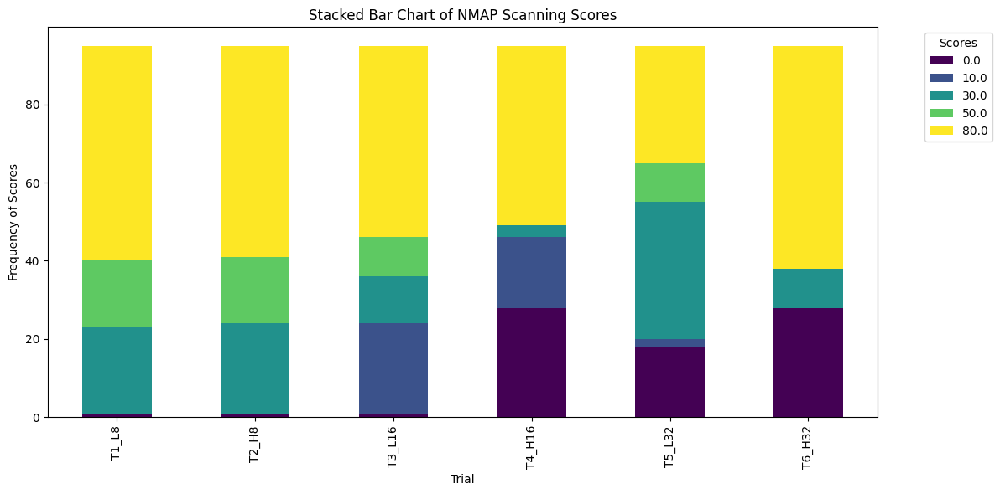

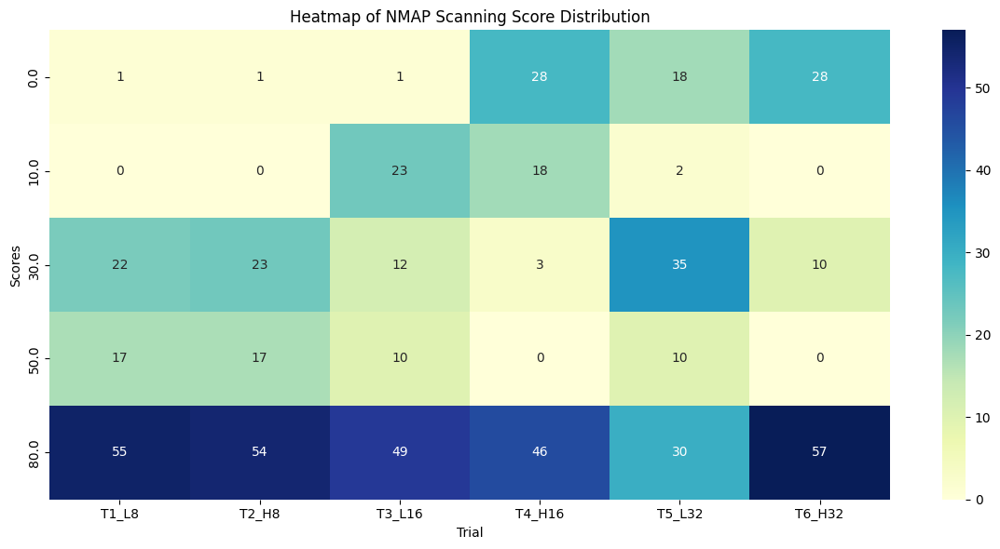

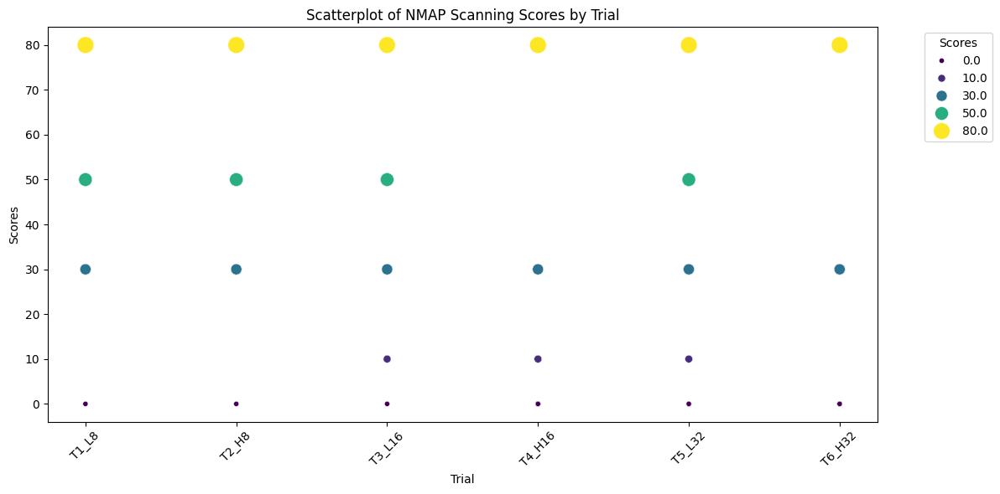

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

file_path = '/content/Choice_Overload.csv'
df = pd.read_csv(file_path)

# Define columns and trials
nmap_columns = ['ci_co_nmap_1', 'ci_co_nmap_2', 'ci_co_nmap_3', 'ci_co_nmap_4', 'ci_co_nmap_5', 'ci_co_nmap_6']
trials = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']

# Map NMAP scores
def map_nmap_scores(row, trial_scores, option_cols):
    trial_scores_mapped = []
    for i, option in enumerate(row[option_cols]):
        trial_name = f"Trial {i + 1}"
        score = trial_scores.get(trial_name, {}).get(option, 0)  # Assign 0 for missing scores
        trial_scores_mapped.append(score)
    return trial_scores_mapped

# Apply mapping
df['NMAP_Scores'] = df.apply(
    lambda x: map_nmap_scores(x, trial_scores=nmap_scores, option_cols=nmap_columns), axis=1
)

# Explode dataframe for analysis
nmap_exploded = df.explode('NMAP_Scores')
nmap_exploded['NMAP_Scores'] = nmap_exploded['NMAP_Scores'].astype(float)

# Add trial info
nmap_exploded['Trial'] = np.tile(trials, len(nmap_exploded) // len(trials))

# Group and count scores strictly following dictionary
trial_scores = (
    nmap_exploded.groupby(['Trial', 'NMAP_Scores']).size().unstack(fill_value=0)
)
trial_scores.index = trials

# Stacked Bar Chart
plt.figure(figsize=(12, 6))
trial_scores.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='viridis')
plt.title('Stacked Bar Chart of NMAP Scanning Scores')
plt.xlabel('Trial')
plt.ylabel('Frequency of Scores')
plt.legend(title='Scores', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Heatmap
heatmap_data = trial_scores.transpose()
plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_data, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Heatmap of NMAP Scanning Score Distribution')
plt.xlabel('Trial')
plt.ylabel('Scores')
plt.tight_layout()
plt.show()

# Scatterplot
plt.figure(figsize=(12, 6))
sns.scatterplot(
    data=nmap_exploded,
    x='Trial',
    y='NMAP_Scores',
    hue='NMAP_Scores',
    palette='viridis',
    size='NMAP_Scores',
    sizes=(20, 200),
)
plt.title('Scatterplot of NMAP Scanning Scores by Trial')
plt.xlabel('Trial')
plt.ylabel('Scores')
plt.xticks(ticks=np.arange(len(trials)), labels=trials, rotation=45)
plt.legend(title='Scores', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

##**Score Distribution for File Exfiltration**

<Figure size 1000x600 with 0 Axes>

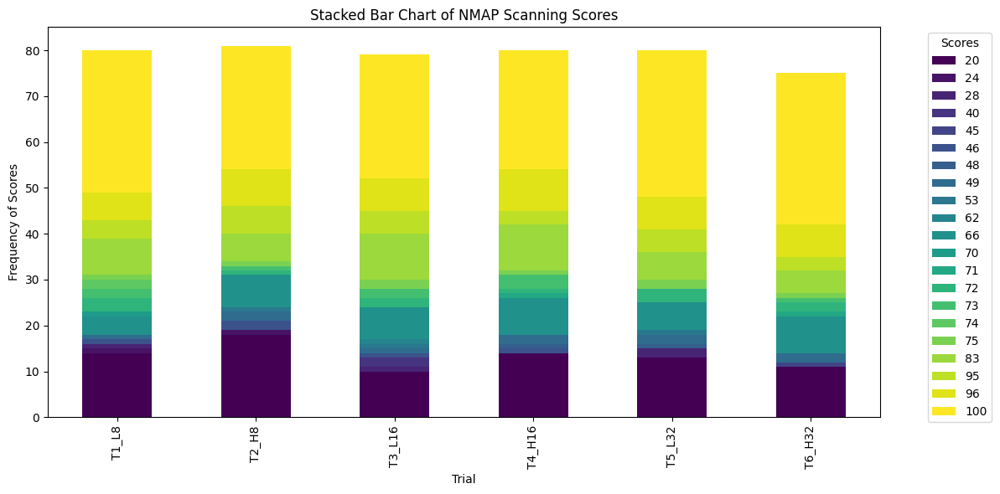

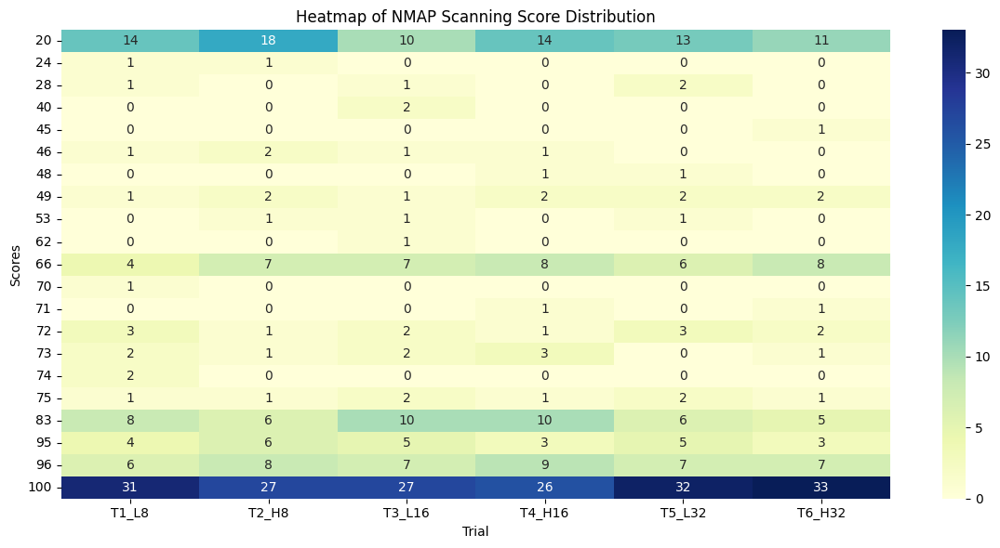

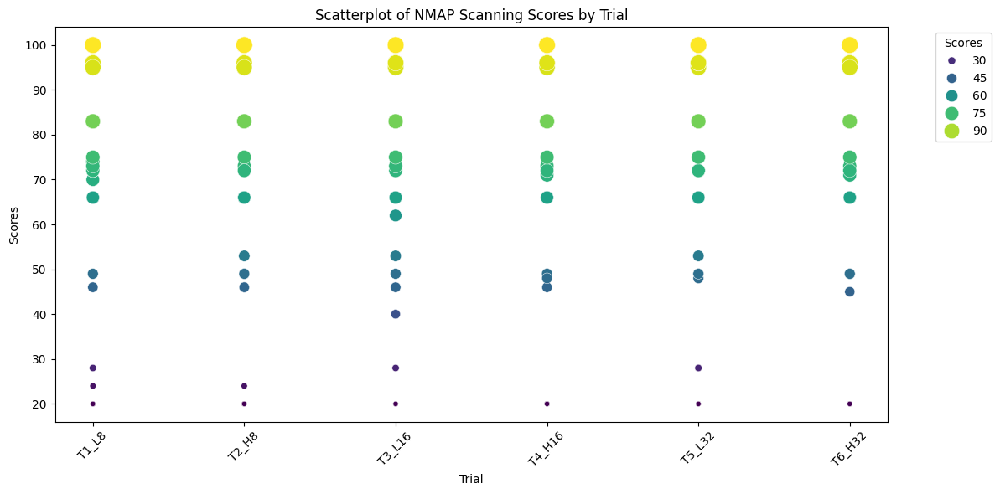

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

file_path = '/content/Choice_Overload.csv'
df = pd.read_csv(file_path)

# File Exfiltration Scores


# Columns for file exfiltration
fl_columns = ['ci_co_fl_6', 'ci_co_fl_2', 'ci_co_fl_3', 'ci_co_fl_4', 'ci_co_fl_5', 'ci_co_fl_6']

# Map scores to the dataset
def map_fl_scores(row, trial_scores, option_cols):
    trial_scores_mapped = []
    for i, option in enumerate(row[option_cols]):
        trial_name = f"Trial {i + 1}"
        if option in trial_scores.get(trial_name, {}):
            trial_scores_mapped.append(trial_scores[trial_name][option])
        else:
            trial_scores_mapped.append(np.nan)
    return trial_scores_mapped

# Calculate scores for each row in the dataframe
df['FL_Scores'] = df.apply(map_fl_scores, axis=1, trial_scores=file_exfiltration_scores, option_cols=fl_columns)

# Explode scores for visualization
fl_exploded = df[['FL_Scores']].explode('FL_Scores')
fl_exploded = fl_exploded.dropna()
trials = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']

# Stacked Bar Chart
plt.figure(figsize=(10, 6))
fl_exploded['Trial'] = fl_exploded.index % len(file_exfiltration_scores) + 1 # Changed fl_scores to file_exfiltration_scores
trial_scores = fl_exploded.groupby(['Trial', 'FL_Scores']).size().unstack(fill_value=0)
trial_scores.index = trials  # Rename x-axis to trial names
trial_scores.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='viridis')
plt.title('Stacked Bar Chart of NMAP Scanning Scores')
plt.xlabel('Trial')
plt.ylabel('Frequency of Scores')
plt.legend(title='Scores', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Heatmap
heatmap_data = trial_scores.transpose()
plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_data, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Heatmap of NMAP Scanning Score Distribution')
plt.xlabel('Trial')
plt.ylabel('Scores')
plt.tight_layout()
plt.show()

# Scatterplot
plt.figure(figsize=(12, 6))
sns.scatterplot(
    data=fl_exploded,
    x=fl_exploded.index % len(trials) + 1,
    y='FL_Scores',
    hue='FL_Scores',
    palette='viridis',
    size='FL_Scores',
    sizes=(20, 200)
)
plt.title('Scatterplot of NMAP Scanning Scores by Trial')
plt.xlabel('Trial')
plt.ylabel('Scores')
plt.xticks(ticks=np.arange(len(trials)) + 1, labels=trials, rotation=45)
plt.legend(title='Scores', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

##**Score Distribution for Laptop Purchasing**

<Figure size 1000x600 with 0 Axes>

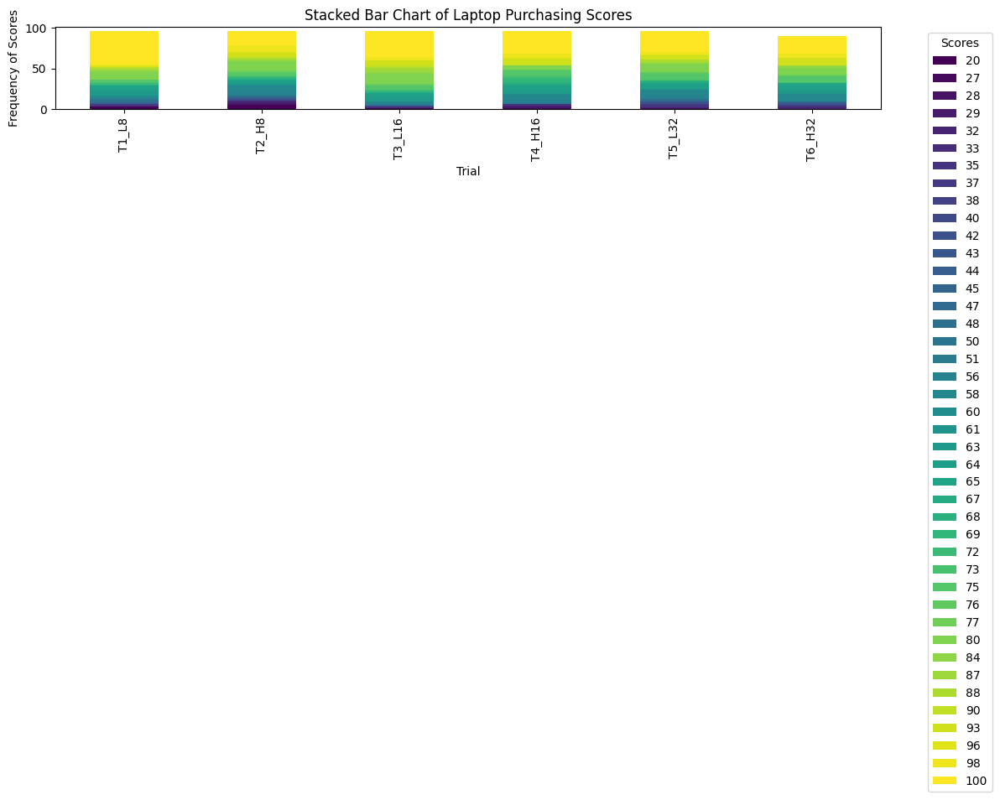

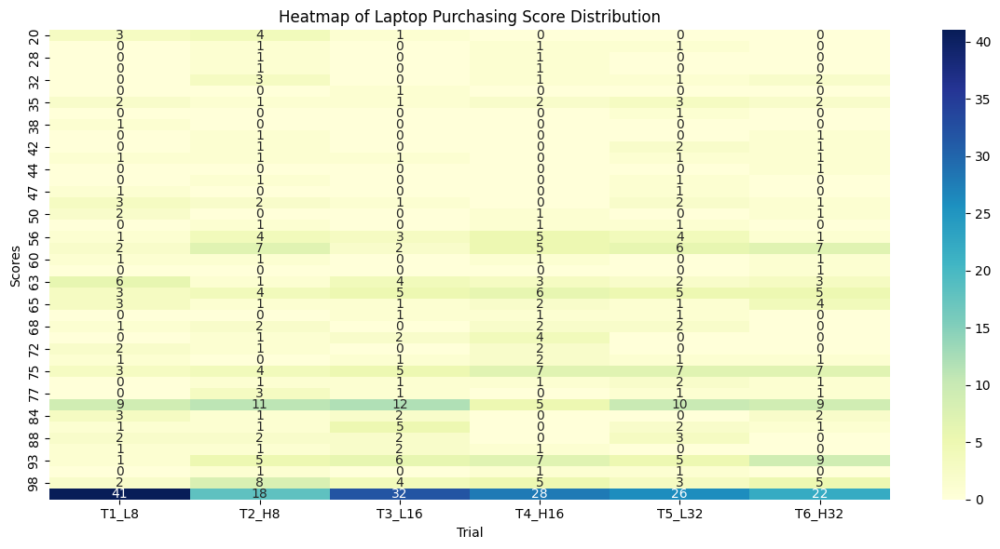

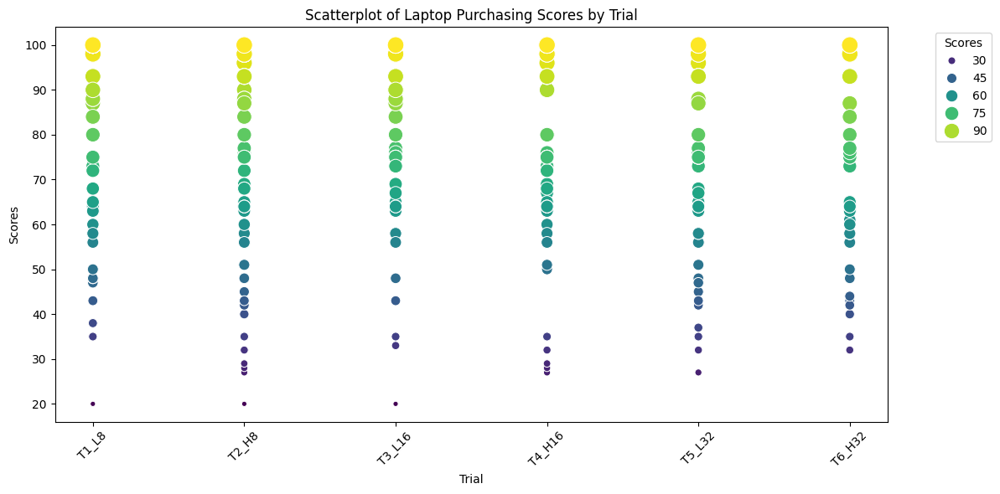

In [ ]:
# Columns for laptop purchasing
lp_columns = ['em_co_lp_1', 'em_co_lp_2', 'em_co_lp_3', 'em_co_lp_4', 'em_co_lp_5', 'em_co_lp_6']

# Map scores to the dataset
def map_lp_scores(row, trial_scores, option_cols):
    trial_scores_mapped = []
    for i, option in enumerate(row[option_cols]):
        trial_name = f"Trial {i + 1}"
        if option in trial_scores.get(trial_name, {}):
            trial_scores_mapped.append(trial_scores[trial_name][option])
        else:
            trial_scores_mapped.append(np.nan)
    return trial_scores_mapped

# Laptop Purchasing Scores (Dictionary)


# Calculate scores for each row in the dataframe
df['LP_Scores'] = df.apply(map_lp_scores, axis=1, trial_scores=laptop_purchasing_scores, option_cols=lp_columns)

# Explode scores for visualization
lp_exploded = df[['LP_Scores']].explode('LP_Scores')
lp_exploded = lp_exploded.dropna()
trials = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']

# Stacked Bar Chart
plt.figure(figsize=(10, 6))
lp_exploded['Trial'] = lp_exploded.index % len(laptop_purchasing_scores) + 1
trial_scores = lp_exploded.groupby(['Trial', 'LP_Scores']).size().unstack(fill_value=0)
trial_scores.index = trials  # Rename x-axis to trial names
trial_scores.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='viridis')
plt.title('Stacked Bar Chart of Laptop Purchasing Scores')
plt.xlabel('Trial')
plt.ylabel('Frequency of Scores')
plt.legend(title='Scores', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Heatmap
heatmap_data = trial_scores.transpose()
plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_data, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Heatmap of Laptop Purchasing Score Distribution')
plt.xlabel('Trial')
plt.ylabel('Scores')
plt.tight_layout()
plt.show()

# Scatterplot
plt.figure(figsize=(12, 6))
sns.scatterplot(
    data=lp_exploded,
    x=lp_exploded.index % len(trials) + 1,
    y='LP_Scores',
    hue='LP_Scores',
    palette='viridis',
    size='LP_Scores',
    sizes=(20, 200)
)
plt.title('Scatterplot of Laptop Purchasing Scores by Trial')
plt.xlabel('Trial')
plt.ylabel('Scores')
plt.xticks(ticks=np.arange(len(trials)) + 1, labels=trials, rotation=45)
plt.legend(title='Scores', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# **Cohen's d for Average Time**

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
from tabulate import tabulate

# Load the dataset
file_path = '/content/Choice_Overload.csv'
df = pd.read_csv(file_path)

# Define control and trigger columns for each task
time_columns = {
    "CM: File Exfiltration": {
        'ci_co_fl_1_timer': 'T1_L8',
        'ci_co_fl_2_timer': 'T2_H8',
        'ci_co_fl_3_timer': 'T3_L16',
        'ci_co_fl_4_timer': 'T4_H16',
        'ci_co_fl_5_timer': 'T5_L32',
        'ci_co_fl_6_timer': 'T6_H32'
    },
    "Non-Cyber: Laptop Purchasing": {
        'em_co_lp_1_timer': 'T1_L8',
        'em_co_lp_2_timer': 'T2_H8',
        'em_co_lp_3_timer': 'T3_L16',
        'em_co_lp_4_timer': 'T4_H16',
        'em_co_lp_5_timer': 'T5_L32',
        'em_co_lp_6_timer': 'T6_H32'
    },
    "CM: NMAP Port Scanning": {
        'ci_co_nmap_1_timer': 'T1_L8',
        'ci_co_nmap_2_timer': 'T2_H8',
        'ci_co_nmap_3_timer': 'T3_L16',
        'ci_co_nmap_4_timer': 'T4_H16',
        'ci_co_nmap_5_timer': 'T5_L32',
        'ci_co_nmap_6_timer': 'T6_H32'
    }
}

# Set sample size for Cohen's d calculation
sample_size = 95

# Function to compute Cohen's d
def cohen_d(mean1, mean2, std1, std2, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * std1**2 + (n - 1) * std2**2) / (2 * n - 2))
    return (mean2 - mean1) / pooled_std

# Function to classify Effect Size
def classify_effect_size(d):
    if abs(d) < 0.2:
        return "Negligible"
    elif abs(d) < 0.5:
        return "Small"
    elif abs(d) < 0.8:
        return "Moderate"
    else:
        return "Large"

# Function to compute ANOVA
def compute_anova(control_data, trigger_data):
    f_statistic, p_value_anova = stats.f_oneway(control_data, trigger_data)
    significance = "Yes" if p_value_anova < 0.05 else "No"
    return f_statistic, p_value_anova, significance

# Function to compute Chi-Square with normalization
def compute_chi_square(control_data, trigger_data):
    observed, bin_edges = np.histogram(control_data, bins=5)
    expected, _ = np.histogram(trigger_data, bins=bin_edges)

    # Ensure no expected frequency is zero (replace zeros with a small value)
    expected = np.where(expected == 0, 1, expected)

    # Normalize expected frequencies to match observed sum
    expected = expected * (observed.sum() / expected.sum())

    # Compute Chi-Square
    chi2_stat, p_value_chi2 = stats.chisquare(f_obs=observed, f_exp=expected)
    dof = len(observed) - 1  # Degrees of freedom

    return chi2_stat, p_value_chi2, dof

# Store tables
tables = {}

for task, task_columns in time_columns.items():
    df_task = df.rename(columns=task_columns)

    control_column = 'T1_L8'
    control = df_task[control_column].dropna()
    control_mean = control.mean()
    control_sd = control.std()

    task_data = {
        "Trial": [],
        "Control Mean": [],
        "Control SD": [],
        "Trigger Mean": [],
        "Trigger SD": [],
        "Cohen's d": [],
        "Effect Size": [],
        "F-Statistic": [],
        "P-Value (ANOVA)": [],
        "Significance": [],
        "Chi-Square Statistic": [],
        "P-Value (Chi-Square)": [],
        "Degrees of Freedom": []
    }

    for trigger_col in task_columns.values():
        if trigger_col == control_column:
            continue  # Skip control condition

        trigger = df_task[trigger_col].dropna()
        trigger_mean = trigger.mean()
        trigger_sd = trigger.std()

        # Compute Cohen's d using fixed sample size (95)
        d = cohen_d(control_mean, trigger_mean, control_sd, trigger_sd, n=sample_size)
        effect_size = classify_effect_size(d)  # Classify effect size

        # Compute ANOVA
        f_stat, p_anova, sig = compute_anova(control, trigger)

        # Compute Chi-Square
        chi2_stat, p_chi2, dof = compute_chi_square(control, trigger)

        # Append results to table
        task_data["Trial"].append(trigger_col)
        task_data["Control Mean"].append(control_mean)
        task_data["Control SD"].append(control_sd)
        task_data["Trigger Mean"].append(trigger_mean)
        task_data["Trigger SD"].append(trigger_sd)
        task_data["Cohen's d"].append(d)
        task_data["Effect Size"].append(effect_size)  # New column
        task_data["F-Statistic"].append(f_stat)
        task_data["P-Value (ANOVA)"].append(p_anova)
        task_data["Significance"].append(sig)
        task_data["Chi-Square Statistic"].append(chi2_stat)
        task_data["P-Value (Chi-Square)"].append(p_chi2)
        task_data["Degrees of Freedom"].append(dof)

    tables[task] = pd.DataFrame(task_data)

# Function to display a DataFrame
def display_dataframe_to_user(name, dataframe):
    print(f"\n{name}:\n")
    print(tabulate(dataframe, headers='keys', tablefmt='psql'))

# Display tables for each task
for task, df in tables.items():
    display_dataframe_to_user(name=f"{task} - Time Analysis", dataframe=df)

# Save tables to CSV files
for task, df_task in tables.items():
    file_name = f"{task.replace(': ', '_').replace(' ', '_')}_time_analysis.csv"
    df_task.to_csv(file_name, index=False)
    print(f"Saved: {file_name}")


CM: File Exfiltration - Time Analysis:

+----+---------+----------------+--------------+----------------+--------------+-------------+---------------+---------------+-------------------+----------------+------------------------+------------------------+----------------------+
|    | Trial   |   Control Mean |   Control SD |   Trigger Mean |   Trigger SD |   Cohen's d | Effect Size   |   F-Statistic |   P-Value (ANOVA) | Significance   |   Chi-Square Statistic |   P-Value (Chi-Square) |   Degrees of Freedom |
|----+---------+----------------+--------------+----------------+--------------+-------------+---------------+---------------+-------------------+----------------+------------------------+------------------------+----------------------|
|  0 | T2_H8   |        75.0526 |      188.564 |        71.1474 |       76.743 |  -0.0271285 | Negligible    |     0.0349578 |         0.851886  | No             |                2.48421 |               0.647465 |                    4 |
|  1 | T3_L

# **Cohen's d for Average Regret**

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
from tabulate import tabulate

# Load the dataset
file_path = '/content/Updated_Choice_Overload.csv'
df = pd.read_csv(file_path)

# Define control and trigger columns for each task
regret_column = {
    "CM: File Exfiltration": {
        'ci_co_fl_1_regret': 'T1_L8',
        'ci_co_fl_2_regret': 'T2_H8',
        'ci_co_fl_3_regret': 'T3_L16',
        'ci_co_fl_4_regret': 'T4_H16',
        'ci_co_fl_5_regret': 'T5_L32',
        'ci_co_fl_6_regret': 'T6_H32'
    },
    "Non-Cyber: Laptop Purchasing": {
        'em_co_lp_1_regret': 'T1_L8',
        'em_co_lp_2_regret': 'T2_H8',
        'em_co_lp_3_regret': 'T3_L16',
        'em_co_lp_4_regret': 'T4_H16',
        'em_co_lp_5_regret': 'T5_L32',
        'em_co_lp_6_regret': 'T6_H32'
    },
    "CM: NMAP Port Scanning": {
        'ci_co_nmap_1_regret': 'T1_L8',
        'ci_co_nmap_2_regret': 'T2_H8',
        'ci_co_nmap_3_regret': 'T3_L16',
        'ci_co_nmap_4_regret': 'T4_H16',
        'ci_co_nmap_5_regret': 'T5_L32',
        'ci_co_nmap_6_regret': 'T6_H32'
    }
}

# Set sample size for Cohen's d calculation
sample_size = 95

# Function to compute Cohen's d
def cohen_d(mean1, mean2, std1, std2, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * std1**2 + (n - 1) * std2**2) / (2 * n - 2))
    return (mean2 - mean1) / pooled_std

# Function to classify Effect Size
def classify_effect_size(d):
    if abs(d) < 0.2:
        return "Negligible"
    elif abs(d) < 0.5:
        return "Small"
    elif abs(d) < 0.8:
        return "Moderate"
    else:
        return "Large"

# Function to compute ANOVA
def compute_anova(control_data, trigger_data):
    f_statistic, p_value_anova = stats.f_oneway(control_data, trigger_data)
    significance = "Yes" if p_value_anova < 0.05 else "No"
    return f_statistic, p_value_anova, significance

# Function to compute Chi-Square with normalization
def compute_chi_square(control_data, trigger_data):
    observed, bin_edges = np.histogram(control_data, bins=5)
    expected, _ = np.histogram(trigger_data, bins=bin_edges)

    # Ensure no expected frequency is zero (replace zeros with a small value)
    expected = np.where(expected == 0, 1, expected)

    # Normalize expected frequencies to match observed sum
    expected = expected * (observed.sum() / expected.sum())

    # Compute Chi-Square
    chi2_stat, p_value_chi2 = stats.chisquare(f_obs=observed, f_exp=expected)
    dof = len(observed) - 1  # Degrees of freedom

    return chi2_stat, p_value_chi2, dof

# Store tables
tables = {}

for task, task_columns in regret_column.items():
    df_task = df.rename(columns=task_columns)

    control_column = 'T1_L8'
    control = df_task[control_column].dropna()
    control_mean = control.mean()
    control_sd = control.std()

    task_data = {
        "Trial": [],
        "Control Mean": [],
        "Control SD": [],
        "Trigger Mean": [],
        "Trigger SD": [],
        "Cohen's d": [],
        "Effect Size": [],
        "F-Statistic": [],
        "P-Value (ANOVA)": [],
        "Significance": [],
        "Chi-Square Statistic": [],
        "P-Value (Chi-Square)": [],
        "Degrees of Freedom": []
    }

    for trigger_col in task_columns.values():
        if trigger_col == control_column:
            continue  # Skip control condition

        trigger = df_task[trigger_col].dropna()
        trigger_mean = trigger.mean()
        trigger_sd = trigger.std()

        # Compute Cohen's d using fixed sample size (95)
        d = cohen_d(control_mean, trigger_mean, control_sd, trigger_sd, n=sample_size)
        effect_size = classify_effect_size(d)  # Classify effect size

        # Compute ANOVA
        f_stat, p_anova, sig = compute_anova(control, trigger)

        # Compute Chi-Square
        chi2_stat, p_chi2, dof = compute_chi_square(control, trigger)

        # Append results to table
        task_data["Trial"].append(trigger_col)
        task_data["Control Mean"].append(control_mean)
        task_data["Control SD"].append(control_sd)
        task_data["Trigger Mean"].append(trigger_mean)
        task_data["Trigger SD"].append(trigger_sd)
        task_data["Cohen's d"].append(d)
        task_data["Effect Size"].append(effect_size)  # New column
        task_data["F-Statistic"].append(f_stat)
        task_data["P-Value (ANOVA)"].append(p_anova)
        task_data["Significance"].append(sig)
        task_data["Chi-Square Statistic"].append(chi2_stat)
        task_data["P-Value (Chi-Square)"].append(p_chi2)
        task_data["Degrees of Freedom"].append(dof)

    tables[task] = pd.DataFrame(task_data)

# Function to display a DataFrame
def display_dataframe_to_user(name, dataframe):
    print(f"\n{name}:\n")
    print(tabulate(dataframe, headers='keys', tablefmt='psql'))

# Display tables for each task
for task, df in tables.items():
    display_dataframe_to_user(name=f"{task} - Time Analysis", dataframe=df)

# Save tables to CSV files
for task, df_task in tables.items():
    file_name = f"{task.replace(': ', '_').replace(' ', '_')}_regret_analysis.csv"
    df_task.to_csv(file_name, index=False)
    print(f"Saved: {file_name}")


CM: File Exfiltration - Time Analysis:

+----+---------+----------------+--------------+----------------+--------------+-------------+---------------+---------------+-------------------+----------------+------------------------+------------------------+----------------------+
|    | Trial   |   Control Mean |   Control SD |   Trigger Mean |   Trigger SD |   Cohen's d | Effect Size   |   F-Statistic |   P-Value (ANOVA) | Significance   |   Chi-Square Statistic |   P-Value (Chi-Square) |   Degrees of Freedom |
|----+---------+----------------+--------------+----------------+--------------+-------------+---------------+---------------+-------------------+----------------+------------------------+------------------------+----------------------|
|  0 | T2_H8   |        29.3579 |      22.4471 |        15.7053 |      25.1717 |  -0.572478  | Moderate      |     15.5672   |       0.000112362 | Yes            |               303.365  |            2.03674e-64 |                    4 |
|  1 | T3_L

# **Trigger Analysis_Regret**

## **Mean Average Regret**

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
from tabulate import tabulate

# Re-load the dataset
file_path = "/content/Updated_Choice_Overload.csv"
df = pd.read_csv(file_path)

# Fix column names (remove spaces)
df.columns = df.columns.str.strip()

# Define control and trigger columns for each task
regret_column = {
    "CM: File Exfiltration": {
        'ci_co_fl_1_regret': 'T1_L8',
        'ci_co_fl_2_regret': 'T2_H8',
        'ci_co_fl_3_regret': 'T3_L16',
        'ci_co_fl_4_regret': 'T4_H16',
        'ci_co_fl_5_regret': 'T5_L32',
        'ci_co_fl_6_regret': 'T6_H32'
    },
    "Non-Cyber: Laptop Purchasing": {
        'em_co_lp_1_regret': 'T1_L8',
        'em_co_lp_2_regret': 'T2_H8',
        'em_co_lp_3_regret': 'T3_L16',
        'em_co_lp_4_regret': 'T4_H16',
        'em_co_lp_5_regret': 'T5_L32',
        'em_co_lp_6_regret': 'T6_H32'
    },
    "CM: NMAP Port Scanning": {
        'ci_co_nmap_1_regret': 'T1_L8',
        'ci_co_nmap_2_regret': 'T2_H8',
        'ci_co_nmap_3_regret': 'T3_L16',
        'ci_co_nmap_4_regret': 'T4_H16',
        'ci_co_nmap_5_regret': 'T5_L32',
        'ci_co_nmap_6_regret': 'T6_H32'
    }
}

# Set sample size for Cohen's d calculation
sample_size = 95

# Function to compute Cohen's d
def cohen_d(mean1, mean2, std1, std2, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * std1**2 + (n - 1) * std2**2) / (2 * n - 2))
    return (mean2 - mean1) / pooled_std

# Function to compute required mean difference for Cohen's d = 0.3
def required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * control_sd**2 + (n - 1) * trigger_sd**2) / (2 * n - 2))
    return d * pooled_std  # Rearranging Cohen's d formula

# Function to apply custom rounding rule
def custom_round(value):
    if np.isnan(value):
        return value
    int_part, decimal_part = divmod(value, 1)
    if decimal_part >= 0.05:
        return round(value + 0.01, 2)  # Round up if > 0.05
    else:
        return round(value, 2)  # Round normally otherwise

# Store tables
tables = {}

for task, task_columns in regret_column.items():
    df_task = df.rename(columns=task_columns)

    control_column = 'T1_L8'
    control = df_task[control_column].dropna()
    control_mean = control.mean()
    control_sd = control.std()

    task_data = {
        "Trial": [],
        "Control Mean": [],
        "Trigger Mean": [],
        "Original Mean Difference": [],
        "Required Mean Difference (Cohen's d = 0.3)": [],
        "Cohen's d": [],
        "Triggered": []  # Yes if original mean difference >= required mean difference, else No
    }

    for trigger_col in task_columns.values():
        if trigger_col == control_column:
            continue  # Skip control condition

        trigger = df_task[trigger_col].dropna()
        trigger_mean = trigger.mean()
        trigger_sd = trigger.std()

        # Compute original mean difference and Cohen's d
        mean_diff = trigger_mean - control_mean
        d = cohen_d(control_mean, trigger_mean, control_sd, trigger_sd, n=sample_size)

        # Compute required mean difference for Cohen's d = 0.3
        required_diff = required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=sample_size)

        # Apply custom rounding rule
        mean_diff_rounded = custom_round(mean_diff)
        d_rounded = custom_round(d)
        required_diff_rounded = custom_round(required_diff)

        # Determine if the original mean difference meets the threshold
        triggered = "Yes" if mean_diff_rounded >= required_diff_rounded else "No"

        # Append results to table
        task_data["Trial"].append(trigger_col)
        task_data["Control Mean"].append(control_mean)
        task_data["Trigger Mean"].append(trigger_mean)
        task_data["Original Mean Difference"].append(mean_diff_rounded)
        task_data["Required Mean Difference (Cohen's d = 0.3)"].append(required_diff_rounded)
        task_data["Cohen's d"].append(d_rounded)
        task_data["Triggered"].append(triggered)

    tables[task] = pd.DataFrame(task_data)

# Display tables for each task using tabulate
for task, df in tables.items():
    print(f"\n{task} - Mean Differences, Required Mean Difference, and Cohen's d:\n")
    print(tabulate(df, headers='keys', tablefmt='psql'))

"""
# Save tables to CSV files
for task, df_task in tables.items():
    file_name = f"{task.replace(': ', '_').replace(' ', '_')}_mean_diff_cohen_d.csv"
    df_task.to_csv(file_name, index=False)
    print(f"Saved: {file_name}")
"""


CM: File Exfiltration - Mean Differences, Required Mean Difference, and Cohen's d:

+----+---------+----------------+----------------+----------------------------+----------------------------------------------+-------------+-------------+
|    | Trial   |   Control Mean |   Trigger Mean |   Original Mean Difference |   Required Mean Difference (Cohen's d = 0.3) |   Cohen's d | Triggered   |
|----+---------+----------------+----------------+----------------------------+----------------------------------------------+-------------+-------------|
|  0 | T2_H8   |        29.3579 |        15.7053 |                     -13.64 |                                         7.16 |       -0.56 | No          |
|  1 | T3_L16  |        29.3579 |        18.8421 |                     -10.51 |                                         8.48 |       -0.36 | No          |
|  2 | T4_H16  |        29.3579 |        28.2737 |                      -1.07 |                                         7    |       -0.04 |

'\n# Save tables to CSV files\nfor task, df_task in tables.items():\n    file_name = f"{task.replace(\': \', \'_\').replace(\' \', \'_\')}_mean_diff_cohen_d.csv"\n    df_task.to_csv(file_name, index=False)\n    print(f"Saved: {file_name}")\n'

## **Cohen's d plot (Regret)**

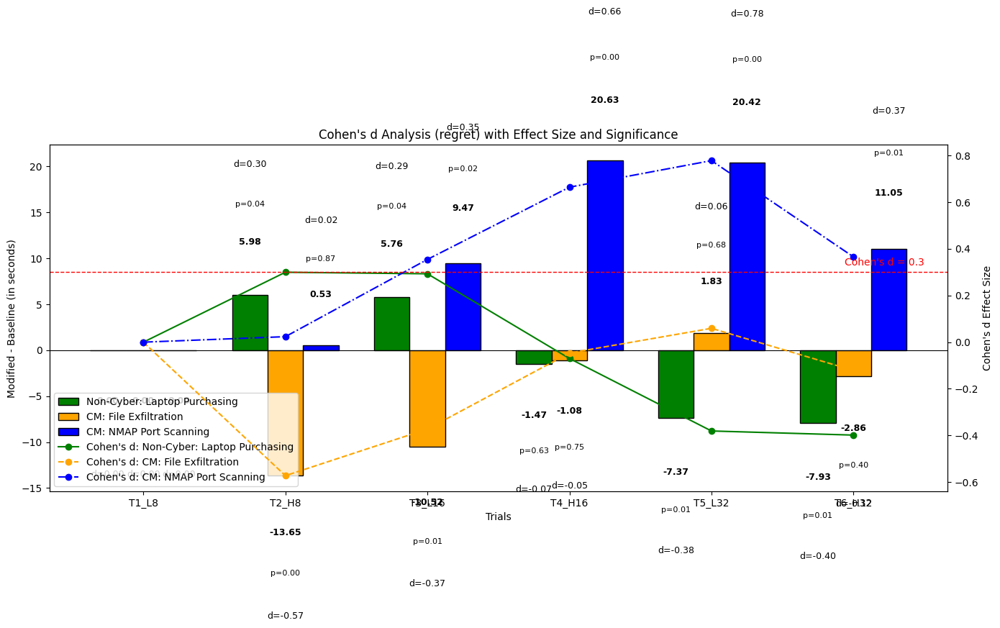

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tabulate import tabulate
from scipy.stats import ttest_ind # Import ttest_ind

# Load dataset
file_path = "/content/Updated_Choice_Overload.csv"
df = pd.read_csv(file_path)
df.columns = df.columns.str.strip()

sample_size = 95

# Define Cohen's d and helpers
def cohen_d(mean1, mean2, std1, std2, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * std1**2 + (n - 1) * std2**2) / (2 * n - 2))
    return (mean2 - mean1) / pooled_std if pooled_std != 0 else np.nan

def required_mean_difference(control_sd, trigger_sd, d=0.3, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * control_sd**2 + (n - 1) * trigger_sd**2) / (2 * n - 2))
    return d * pooled_std

def get_p_value(group1, group2):
    # ttest_ind is already imported at the top
    _, p = ttest_ind(group1, group2, nan_policy='omit', equal_var=False)
    return p

# Trial Mapping
trial_labels = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']

task_settings = {
    "Non-Cyber: Laptop Purchasing": {
        'em_co_lp_1_regret': 'T1_L8',
        'em_co_lp_2_regret': 'T2_H8',
        'em_co_lp_3_regret': 'T3_L16',
        'em_co_lp_4_regret': 'T4_H16',
        'em_co_lp_5_regret': 'T5_L32',
        'em_co_lp_6_regret': 'T6_H32',
        'color': 'green',
        'style': '-'
    },
    "CM: File Exfiltration": {
        'ci_co_fl_1_regret': 'T1_L8',
        'ci_co_fl_2_regret': 'T2_H8',
        'ci_co_fl_3_regret': 'T3_L16',
        'ci_co_fl_4_regret': 'T4_H16',
        'ci_co_fl_5_regret': 'T5_L32',
        'ci_co_fl_6_regret': 'T6_H32',
        'color': 'orange',
        'style': '--'
    },
    "CM: NMAP Port Scanning": {
        'ci_co_nmap_1_regret': 'T1_L8',
        'ci_co_nmap_2_regret': 'T2_H8',
        'ci_co_nmap_3_regret': 'T3_L16',
        'ci_co_nmap_4_regret': 'T4_H16',
        'ci_co_nmap_5_regret': 'T5_L32',
        'ci_co_nmap_6_regret': 'T6_H32',
        'color': 'blue',
        'style': '-.'
    }
}

results = {task: [] for task in task_settings}

# Main loop
for task, setting in task_settings.items():
    temp_df = df.rename(columns=setting)
    baseline = temp_df['T1_L8'].dropna()
    base_mean = baseline.mean()
    base_std = baseline.std()

    for trial in trial_labels:
        current = temp_df[trial].dropna()
        current_mean = current.mean()
        current_std = current.std()
        diff = current_mean - base_mean
        d_val = cohen_d(base_mean, current_mean, base_std, current_std)
        p_val = get_p_value(baseline, current) if trial != 'T1_L8' else np.nan
        results[task].append({
            'trial': trial,
            'mod_base_diff': diff,
            'd': d_val,
            'p': p_val
        })

# Plotting
x = np.arange(len(trial_labels))
bar_width = 0.25
fig, ax1 = plt.subplots(figsize=(14, 12))

for i, (task, task_result) in enumerate(results.items()):
    bar_pos = x + (i - 1) * bar_width
    diffs = [r['mod_base_diff'] for r in task_result]
    ds = [r['d'] for r in task_result]
    ps = [r['p'] for r in task_result]

    ax1.bar(bar_pos, diffs, width=bar_width, color=task_settings[task]['color'], label=task, edgecolor='black')

    for j, (pos, diff_val, d_val, pval) in enumerate(zip(bar_pos, diffs, ds, ps)):
        # Y-offsets for clarity
        offset = abs(diff_val) * 0.05 + 5  # scale with bar height
        diff_y = diff_val + offset if diff_val > 0 else diff_val - offset
        pval_y = diff_y + offset * 0.8 if diff_val > 0 else diff_y - offset * 0.8
        d_y = pval_y + offset * 0.8 if diff_val > 0 else pval_y - offset * 0.8

        # Difference label (bold)
        ax1.text(pos, diff_y, f"{diff_val:.2f}",
                 ha='center', va='bottom' if diff_val > 0 else 'top', fontsize=9, weight='bold')

        # p-value label
        if not np.isnan(pval):
            ax1.text(pos, pval_y, f"p={pval:.2f}",
                     ha='center', va='bottom' if diff_val > 0 else 'top', fontsize=8, color='black')

        # Cohen's d label
        ax1.text(pos, d_y, f"d={d_val:.2f}",
                 ha='center', va='bottom' if diff_val > 0 else 'top', fontsize=9, color='black')

# Cohen's d lines
ax2 = ax1.twinx()
for task, task_result in results.items():
    ds = [r['d'] for r in task_result]
    ax2.plot(x, ds, task_settings[task]['style'], marker='o', color=task_settings[task]['color'], label=f"Cohen's d: {task}")

# Axis formatting
ax1.set_xticks(x)
ax1.set_xticklabels(trial_labels)
ax1.set_xlabel("Trials")
ax1.set_ylabel("Modified - Baseline (in seconds)")
ax2.set_ylabel("Cohen's d Effect Size")
ax1.axhline(0, color='black', linewidth=0.8)
ax2.axhline(0.3, color='red', linestyle='dashed', linewidth=1)
ax2.text(len(x) - 0.5, 0.33, "Cohen's d = 0.3", color='red', fontsize=10, ha='right')

# Legend and layout
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='lower left')

plt.title("Cohen's d Analysis (regret) with Effect Size and Significance")
plt.tight_layout()
plt.show()

###**File Exfiltration Population Regret**

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
from tabulate import tabulate

# Load dataset
file_path = "/content/Updated_Choice_Overload.csv"
df = pd.read_csv(file_path)

# Fix column names (remove spaces)
df.columns = df.columns.str.strip()

# Define regret columns for File Exfiltration trials
file_exfiltration_trials = {
    'ci_co_fl_1_regret': 'T1_L8',
    'ci_co_fl_2_regret': 'T2_H8',
    'ci_co_fl_3_regret': 'T3_L16',
    'ci_co_fl_4_regret': 'T4_H16',
    'ci_co_fl_5_regret': 'T5_L32',
    'ci_co_fl_6_regret': 'T6_H32'
}

# Rename columns for consistency
df_task = df.rename(columns=file_exfiltration_trials)

# Extract relevant columns
columns_needed = ['response_id'] + list(file_exfiltration_trials.values())
df_task = df_task[columns_needed].dropna()

# Compute Required Mean Differences (Cohen's d = 0.3)
sample_size = 95

def cohen_d(mean1, mean2, std1, std2, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * std1**2 + (n - 1) * std2**2) / (2 * n - 2))
    return (mean2 - mean1) / pooled_std

def required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * control_sd**2 + (n - 1) * trigger_sd**2) / (2 * n - 2))
    return d * pooled_std

# Compute control statistics
control_column = 'T1_L8'
control = df_task[control_column].dropna()
control_mean = control.mean()
control_sd = control.std()

# Compute required mean differences dynamically
required_mean_differences = {}
for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
    trigger = df_task[trial].dropna()
    trigger_mean = trigger.mean()
    trigger_sd = trigger.std()

    # Compute required mean difference for Cohen's d = 0.3
    required_diff = required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=sample_size)

    # Store the computed required mean difference
    required_mean_differences[trial] = round(required_diff, 2)

# Prepare the transformed table
transformed_data = []
for _, row in df_task.iterrows():
    response_id = int(row['response_id'])  # Ensure ID is in correct format
    control_value = row['T1_L8']

    for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
        trial_label = f"{trial} ({required_mean_differences[trial]})"  # Append required mean difference
        difference = row[trial] - control_value  # Calculate difference

        # Determine if it is "Triggered" (Yes/No)
        triggered = "Yes" if difference >= required_mean_differences[trial] else "No"

        transformed_data.append([response_id, control_value, row[trial], trial_label, difference, triggered])

# Convert to DataFrame
df_transformed = pd.DataFrame(transformed_data, columns=['Response ID', 'Control (Trial 1)', 'Trial Value', 'Trial', 'Difference', 'Triggered'])

# Display tables for all 95 participants using tabulate
print("\nTransformed Data Table:\n")
print(tabulate(df_transformed, headers='keys', tablefmt='psql'))


Transformed Data Table:

+-----+---------------+---------------------+---------------+---------------+--------------+-------------+
|     |   Response ID |   Control (Trial 1) |   Trial Value | Trial         |   Difference | Triggered   |
|-----+---------------+---------------------+---------------+---------------+--------------+-------------|
|   0 |     146626589 |                   0 |             0 | T2_H8 (7.15)  |            0 | No          |
|   1 |     146626589 |                   0 |            54 | T3_L16 (8.47) |           54 | Yes         |
|   2 |     146626589 |                   0 |            26 | T4_H16 (6.99) |           26 | Yes         |
|   3 |     146626589 |                   0 |            27 | T5_L32 (9.26) |           27 | Yes         |
|   4 |     146626589 |                   0 |             0 | T6_H32 (7.07) |            0 | No          |
|   5 |     146629454 |                  80 |            80 | T2_H8 (7.15)  |            0 | No          |
|   6 |    

### **Laptop Population Regret**

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
from tabulate import tabulate

# Load dataset
file_path = "/content/Updated_Choice_Overload.csv"
df = pd.read_csv(file_path)

# Fix column names (remove spaces)
df.columns = df.columns.str.strip()

# Define regret columns for Laptop Purchasing trials
laptop_purchasing_trials = {
    'em_co_lp_1_regret': 'T1_L8',
    'em_co_lp_2_regret': 'T2_H8',
    'em_co_lp_3_regret': 'T3_L16',
    'em_co_lp_4_regret': 'T4_H16',
    'em_co_lp_5_regret': 'T5_L32',
    'em_co_lp_6_regret': 'T6_H32'
}

# Rename columns for consistency
df_task = df.rename(columns=laptop_purchasing_trials)

# Extract relevant columns
columns_needed = ['response_id'] + list(laptop_purchasing_trials.values())
df_task = df_task[columns_needed].dropna()

# Compute Required Mean Differences (Cohen's d = 0.3)
sample_size = 95

def cohen_d(mean1, mean2, std1, std2, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * std1**2 + (n - 1) * std2**2) / (2 * n - 2))
    return (mean2 - mean1) / pooled_std

def required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * control_sd**2 + (n - 1) * trigger_sd**2) / (2 * n - 2))
    return d * pooled_std

# Compute control statistics
control_column = 'T1_L8'
control = df_task[control_column].dropna()
control_mean = control.mean()
control_sd = control.std()

# Compute required mean differences dynamically
required_mean_differences = {}
for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
    trigger = df_task[trial].dropna()
    trigger_mean = trigger.mean()
    trigger_sd = trigger.std()

    # Compute required mean difference for Cohen's d = 0.3
    required_diff = required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=sample_size)

    # Store the computed required mean difference
    required_mean_differences[trial] = round(required_diff, 2)

# Prepare the transformed table
transformed_data = []
for _, row in df_task.iterrows():
    response_id = int(row['response_id'])  # Ensure ID is in correct format
    control_value = row['T1_L8']

    for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
        trial_label = f"{trial} ({required_mean_differences[trial]})"  # Append required mean difference
        difference = row[trial] - control_value  # Calculate difference

        # Determine if it is "Triggered" (Yes/No)
        triggered = "Yes" if difference >= required_mean_differences[trial] else "No"

        transformed_data.append([response_id, control_value, row[trial], trial_label, difference, triggered])

# Convert to DataFrame
df_transformed = pd.DataFrame(transformed_data, columns=['Response ID', 'Control (Trial 1)', 'Trial Value', 'Trial', 'Difference', 'Triggered'])

# Display tables for all 95 participants using tabulate
print("\nTransformed Data Table for Laptop Purchasing:\n")
print(tabulate(df_transformed, headers='keys', tablefmt='psql'))


Transformed Data Table for Laptop Purchasing:

+-----+---------------+---------------------+---------------+---------------+--------------+-------------+
|     |   Response ID |   Control (Trial 1) |   Trial Value | Trial         |   Difference | Triggered   |
|-----+---------------+---------------------+---------------+---------------+--------------+-------------|
|   0 |     146626589 |                   0 |            37 | T2_H8 (5.98)  |           37 | Yes         |
|   1 |     146626589 |                   0 |            20 | T3_L16 (5.89) |           20 | Yes         |
|   2 |     146626589 |                   0 |             0 | T4_H16 (6.31) |            0 | No          |
|   3 |     146626589 |                   0 |            16 | T5_L32 (5.8)  |           16 | Yes         |
|   4 |     146626589 |                   0 |             2 | T6_H32 (5.97) |            2 | No          |
|   5 |     146629454 |                  36 |             0 | T2_H8 (5.98)  |          -36 | No 

### **NMAP Population Regret**

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
from tabulate import tabulate

# Load dataset
file_path = "/content/Updated_Choice_Overload.csv"
df = pd.read_csv(file_path)

# Fix column names (remove spaces)
df.columns = df.columns.str.strip()

# Define regret columns for NMAP Port Scanning trials
nmap_trials = {
    'ci_co_nmap_1_regret': 'T1_L8',
    'ci_co_nmap_2_regret': 'T2_H8',
    'ci_co_nmap_3_regret': 'T3_L16',
    'ci_co_nmap_4_regret': 'T4_H16',
    'ci_co_nmap_5_regret': 'T5_L32',
    'ci_co_nmap_6_regret': 'T6_H32'
}

# Rename columns for consistency
df_task = df.rename(columns=nmap_trials)

# Extract relevant columns
columns_needed = ['response_id'] + list(nmap_trials.values())
df_task = df_task[columns_needed].dropna()

# Compute Required Mean Differences (Cohen's d = 0.3)
sample_size = 95

def cohen_d(mean1, mean2, std1, std2, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * std1**2 + (n - 1) * std2**2) / (2 * n - 2))
    return (mean2 - mean1) / pooled_std

def required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * control_sd**2 + (n - 1) * trigger_sd**2) / (2 * n - 2))
    return d * pooled_std

# Compute control statistics
control_column = 'T1_L8'
control = df_task[control_column].dropna()
control_mean = control.mean()
control_sd = control.std()

# Compute required mean differences dynamically
required_mean_differences = {}
for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
    trigger = df_task[trial].dropna()
    trigger_mean = trigger.mean()
    trigger_sd = trigger.std()

    # Compute required mean difference for Cohen's d = 0.3
    required_diff = required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=sample_size)

    # Store the computed required mean difference
    required_mean_differences[trial] = round(required_diff, 2)

# Prepare the transformed table
transformed_data = []
for _, row in df_task.iterrows():
    response_id = int(row['response_id'])  # Ensure ID is in correct format
    control_value = row['T1_L8']

    for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
        trial_label = f"{trial} ({required_mean_differences[trial]})"  # Append required mean difference
        difference = row[trial] - control_value  # Calculate difference

        # Determine if it is "Triggered" (Yes/No)
        triggered = "Yes" if difference >= required_mean_differences[trial] else "No"

        transformed_data.append([response_id, control_value, row[trial], trial_label, difference, triggered])

# Convert to DataFrame
df_transformed = pd.DataFrame(transformed_data, columns=['Response ID', 'Control (Trial 1)', 'Trial Value', 'Trial', 'Difference', 'Triggered'])

# Display tables for all 95 participants using tabulate
print("\nTransformed Data Table for NMAP Port Scanning:\n")
print(tabulate(df_transformed, headers='keys', tablefmt='psql'))


Transformed Data Table for NMAP Port Scanning:

+-----+---------------+---------------------+---------------+---------------+--------------+-------------+
|     |   Response ID |   Control (Trial 1) |   Trial Value | Trial         |   Difference | Triggered   |
|-----+---------------+---------------------+---------------+---------------+--------------+-------------|
|   0 |     146626589 |                   0 |             0 | T2_H8 (6.71)  |            0 | No          |
|   1 |     146626589 |                   0 |            70 | T3_L16 (8.01) |           70 | Yes         |
|   2 |     146626589 |                   0 |             0 | T4_H16 (9.32) |            0 | No          |
|   3 |     146626589 |                   0 |             0 | T5_L32 (7.87) |            0 | No          |
|   4 |     146626589 |                   0 |             0 | T6_H32 (9.07) |            0 | No          |
|   5 |     146629454 |                  50 |             0 | T2_H8 (6.71)  |          -50 | No

## **Combined data_Trigger_Regret**

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
from tabulate import tabulate

# Load dataset
file_path = "/content/Updated_Choice_Overload.csv"
df = pd.read_csv(file_path)

# Fix column names (remove spaces)
df.columns = df.columns.str.strip()

# Define regret columns for all three tasks
regret_trials_dict = {
    "File Exfiltration": {
        'ci_co_fl_1_regret': 'T1_L8',
        'ci_co_fl_2_regret': 'T2_H8',
        'ci_co_fl_3_regret': 'T3_L16',
        'ci_co_fl_4_regret': 'T4_H16',
        'ci_co_fl_5_regret': 'T5_L32',
        'ci_co_fl_6_regret': 'T6_H32'
    },
    "Laptop Purchasing": {
        'em_co_lp_1_regret': 'T1_L8',
        'em_co_lp_2_regret': 'T2_H8',
        'em_co_lp_3_regret': 'T3_L16',
        'em_co_lp_4_regret': 'T4_H16',
        'em_co_lp_5_regret': 'T5_L32',
        'em_co_lp_6_regret': 'T6_H32'
    },
    "NMAP Scanning": {
        'ci_co_nmap_1_regret': 'T1_L8',
        'ci_co_nmap_2_regret': 'T2_H8',
        'ci_co_nmap_3_regret': 'T3_L16',
        'ci_co_nmap_4_regret': 'T4_H16',
        'ci_co_nmap_5_regret': 'T5_L32',
        'ci_co_nmap_6_regret': 'T6_H32'
    }
}

# Function to compute required mean difference for Cohen's d = 0.3
def required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=95):
    pooled_std = np.sqrt(((n - 1) * control_sd**2 + (n - 1) * trigger_sd**2) / (2 * n - 2))
    return d * pooled_std

# Store transformed data
all_transformed_data = []

# Process each task
for task_name, trials_dict in regret_trials_dict.items():
    # Rename columns for consistency
    df_task = df.rename(columns=trials_dict)
    columns_needed = ['response_id'] + list(trials_dict.values())
    df_task = df_task[columns_needed].dropna()

    # Compute control statistics
    control_column = 'T1_L8'
    control = df_task[control_column].dropna()
    control_mean = control.mean()
    control_sd = control.std()

    # Compute required mean differences dynamically
    required_mean_differences = {}
    for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
        trigger = df_task[trial].dropna()
        trigger_mean = trigger.mean()
        trigger_sd = trigger.std()
        required_diff = required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=95)
        required_mean_differences[trial] = round(required_diff, 2)

    # Transform the table
    transformed_data = []
    for _, row in df_task.iterrows():
        response_id = int(row['response_id'])
        control_value = row['T1_L8']

        for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
            trial_label = f"{trial} ({required_mean_differences[trial]})"
            difference = row[trial] - control_value
            triggered = "Yes" if difference >= required_mean_differences[trial] else "No"

            transformed_data.append([response_id, control_value, row[trial], trial_label, difference, triggered, task_name])

    # Add transformed data to the combined list
    all_transformed_data.extend(transformed_data)

# Convert to DataFrame
df_combined = pd.DataFrame(all_transformed_data, columns=['Response ID', 'Control (Trial 1)', 'Trial Value', 'Trial', 'Difference', 'Triggered', 'Task'])

# Display combined table for all three tasks using tabulate
print("\nCombined Transformed Data Table (File Exfiltration, Laptop Purchasing, NMAP Scanning):\n")
print(tabulate(df_combined, headers='keys', tablefmt='psql'))

# Create Summary Table for Triggered='Yes' Counts
summary_table = df_combined[df_combined['Triggered'] == 'Yes'].groupby(['Task', 'Trial']).agg({'Response ID': 'count'}).reset_index()
summary_table.rename(columns={'Response ID': 'Count of Likely Triggered Participants'}, inplace=True)

# Display the summary table
print("\nSummary Table: Number of Participants Likely Triggered per Task and Trial:\n")
print(tabulate(summary_table, headers='keys', tablefmt='psql'))


Combined Transformed Data Table (File Exfiltration, Laptop Purchasing, NMAP Scanning):

+------+---------------+---------------------+---------------+---------------+--------------+-------------+-------------------+
|      |   Response ID |   Control (Trial 1) |   Trial Value | Trial         |   Difference | Triggered   | Task              |
|------+---------------+---------------------+---------------+---------------+--------------+-------------+-------------------|
|    0 |     146626589 |                   0 |             0 | T2_H8 (7.15)  |            0 | No          | File Exfiltration |
|    1 |     146626589 |                   0 |            54 | T3_L16 (8.47) |           54 | Yes         | File Exfiltration |
|    2 |     146626589 |                   0 |            26 | T4_H16 (6.99) |           26 | Yes         | File Exfiltration |
|    3 |     146626589 |                   0 |            27 | T5_L32 (9.26) |           27 | Yes         | File Exfiltration |
|    4 |     14

## **Trigger Data Plot_Regret**

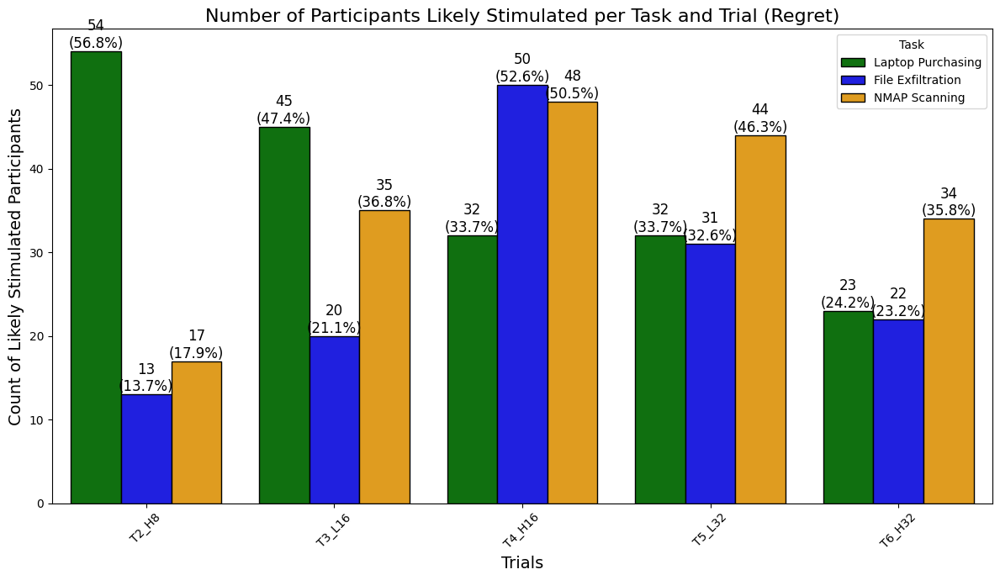

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

file_path = "/content/Updated_Choice_Overload.csv"
df = pd.read_csv(file_path)

# Fix column names (remove spaces)
df.columns = df.columns.str.strip()

# Define regret columns for all three tasks
regret_trials_dict = {
    "File Exfiltration": {
        'ci_co_fl_1_regret': 'T1_L8',
        'ci_co_fl_2_regret': 'T2_H8',
        'ci_co_fl_3_regret': 'T3_L16',
        'ci_co_fl_4_regret': 'T4_H16',
        'ci_co_fl_5_regret': 'T5_L32',
        'ci_co_fl_6_regret': 'T6_H32'
    },
    "Laptop Purchasing": {
        'em_co_lp_1_regret': 'T1_L8',
        'em_co_lp_2_regret': 'T2_H8',
        'em_co_lp_3_regret': 'T3_L16',
        'em_co_lp_4_regret': 'T4_H16',
        'em_co_lp_5_regret': 'T5_L32',
        'em_co_lp_6_regret': 'T6_H32'
    },
    "NMAP Scanning": {
        'ci_co_nmap_1_regret': 'T1_L8',
        'ci_co_nmap_2_regret': 'T2_H8',
        'ci_co_nmap_3_regret': 'T3_L16',
        'ci_co_nmap_4_regret': 'T4_H16',
        'ci_co_nmap_5_regret': 'T5_L32',
        'ci_co_nmap_6_regret': 'T6_H32'
    }
}

# Function to compute required mean difference for Cohen's d = 0.3
def required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=95):
    pooled_std = ((n - 1) * control_sd**2 + (n - 1) * trigger_sd**2) / (2 * n - 2)
    return d * pooled_std**0.5

# Store transformed data
all_transformed_data = []

# Process each task
for task_name, trials_dict in regret_trials_dict.items():
    df_task = df.rename(columns=trials_dict)
    df_task = df_task[['response_id'] + list(trials_dict.values())].dropna()

    control_column = 'T1_L8'
    control = df_task[control_column].dropna()
    control_mean = control.mean()
    control_sd = control.std()

    required_mean_differences = {}
    for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
        trigger = df_task[trial].dropna()
        required_mean_differences[trial] = round(required_mean_difference(control_mean, control_sd, trigger.std()), 2)

    for _, row in df_task.iterrows():
        response_id = int(row['response_id'])
        control_value = row['T1_L8']

        for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
            difference = row[trial] - control_value
            Stimulated = "Yes" if difference >= required_mean_differences[trial] else "No"
            all_transformed_data.append([response_id, control_value, row[trial], trial, difference, Stimulated, task_name])

# Convert to DataFrame
df_combined = pd.DataFrame(
    all_transformed_data,
    columns=['Response ID', 'Control (Trial 1)', 'Trial Value', 'Trial', 'Difference', 'Stimulated', 'Task']
)

# Create summary for Stimulated='Yes'
summary_table = df_combined[df_combined['Stimulated'] == 'Yes'].groupby(
    ['Task', 'Trial']
).agg({'Response ID': 'count'}).reset_index()
summary_table.rename(columns={'Response ID': 'Count of Likely Stimulated Participants'}, inplace=True)

# Total unique participants
total_participants = df_combined['Response ID'].nunique()
summary_table['Percentage'] = (summary_table['Count of Likely Stimulated Participants'] / total_participants) * 100

# Task order to enforce bar order
task_order = ["Laptop Purchasing", "File Exfiltration", "NMAP Scanning"]
summary_table['Task'] = pd.Categorical(summary_table['Task'], categories=task_order, ordered=True)
summary_table = summary_table.sort_values(['Trial', 'Task'])

# Custom colors
custom_palette = {
    "Laptop Purchasing": "green",
    "File Exfiltration": "blue",
    "NMAP Scanning": "orange"
}

# Plot
plt.figure(figsize=(12, 7))
ax = sns.barplot(
    data=summary_table,
    x="Trial",
    y="Count of Likely Stimulated Participants",
    hue="Task",
    hue_order=task_order,
    palette=custom_palette,
    edgecolor="black"
)

# Annotate counts and percentages
for p in ax.patches:
    height = p.get_height()
    if height > 0:
        ax.annotate(f'{int(height)}\n({height/total_participants*100:.1f}%)',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom', fontsize=12, color='black')

# Final touches
plt.xlabel("Trials", fontsize=14)
plt.ylabel("Count of Likely Stimulated Participants", fontsize=14)
plt.title("Number of Participants Likely Stimulated per Task and Trial (Regret)", fontsize=16)
plt.legend(title="Task")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# **Trigger Analysis_Time**

## **Mean Average Time**

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
from tabulate import tabulate

# Re-load the dataset
file_path = "/content/Choice_Overload.csv"
df = pd.read_csv(file_path)

# Fix column names (remove spaces)
df.columns = df.columns.str.strip()

# Define control and trigger columns for each task (Time-based)
time_column = {
    "CM: File Exfiltration": {
        'ci_co_fl_1_timer': 'T1_L8',
        'ci_co_fl_2_timer': 'T2_H8',
        'ci_co_fl_3_timer': 'T3_L16',
        'ci_co_fl_4_timer': 'T4_H16',
        'ci_co_fl_5_timer': 'T5_L32',
        'ci_co_fl_6_timer': 'T6_H32'
    },
    "Non-Cyber: Laptop Purchasing": {
        'em_co_lp_1_timer': 'T1_L8',
        'em_co_lp_2_timer': 'T2_H8',
        'em_co_lp_3_timer': 'T3_L16',
        'em_co_lp_4_timer': 'T4_H16',
        'em_co_lp_5_timer': 'T5_L32',
        'em_co_lp_6_timer': 'T6_H32'
    },
    "CM: NMAP Port Scanning": {
        'ci_co_nmap_1_timer': 'T1_L8',
        'ci_co_nmap_2_timer': 'T2_H8',
        'ci_co_nmap_3_timer': 'T3_L16',
        'ci_co_nmap_4_timer': 'T4_H16',
        'ci_co_nmap_5_timer': 'T5_L32',
        'ci_co_nmap_6_timer': 'T6_H32'
    }
}

# Set sample size for Cohen's d calculation
sample_size = 95

# Function to compute Cohen's d
def cohen_d(mean1, mean2, std1, std2, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * std1**2 + (n - 1) * std2**2) / (2 * n - 2))
    return (mean2 - mean1) / pooled_std

# Function to compute required mean difference for Cohen's d = 0.3
def required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * control_sd**2 + (n - 1) * trigger_sd**2) / (2 * n - 2))
    return d * pooled_std  # Rearranging Cohen's d formula

# Function to apply custom rounding rule
def custom_round(value):
    if np.isnan(value):
        return value
    int_part, decimal_part = divmod(value, 1)
    if decimal_part >= 0.05:
        return round(value + 0.01, 2)  # Round up if > 0.05
    else:
        return round(value, 2)  # Round normally otherwise

# Store tables
tables = {}

for task, task_columns in time_column.items():
    df_task = df.rename(columns=task_columns)

    control_column = 'T1_L8'
    control = df_task[control_column].dropna()
    control_mean = control.mean()
    control_sd = control.std()

    task_data = {
        "Trial": [],
        "Control Mean": [],
        "Trigger Mean": [],
        "Original Mean Difference": [],
        "Required Mean Difference (Cohen's d = 0.3)": [],
        "Cohen's d": [],
        "Triggered": []  # Yes if original mean difference >= required mean difference, else No
    }

    for trigger_col in task_columns.values():
        if trigger_col == control_column:
            continue  # Skip control condition

        trigger = df_task[trigger_col].dropna()
        trigger_mean = trigger.mean()
        trigger_sd = trigger.std()

        # Compute original mean difference and Cohen's d
        mean_diff = trigger_mean - control_mean
        d = cohen_d(control_mean, trigger_mean, control_sd, trigger_sd, n=sample_size)

        # Compute required mean difference for Cohen's d = 0.3
        required_diff = required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=sample_size)

        # Apply custom rounding rule
        mean_diff_rounded = custom_round(mean_diff)
        d_rounded = custom_round(d)
        required_diff_rounded = custom_round(required_diff)

        # Determine if the original mean difference meets the threshold
        triggered = "Yes" if mean_diff_rounded >= required_diff_rounded else "No"

        # Append results to table
        task_data["Trial"].append(trigger_col)
        task_data["Control Mean"].append(control_mean)
        task_data["Trigger Mean"].append(trigger_mean)
        task_data["Original Mean Difference"].append(mean_diff_rounded)
        task_data["Required Mean Difference (Cohen's d = 0.3)"].append(required_diff_rounded)
        task_data["Cohen's d"].append(d_rounded)
        task_data["Triggered"].append(triggered)

    tables[task] = pd.DataFrame(task_data)

# Display tables for each task using tabulate with 2 decimal float formatting
for task, df in tables.items():
    print(f"\n{task} - Mean Differences, Required Mean Difference, and Cohen's d:\n")
    print(tabulate(df, headers='keys', tablefmt='psql', floatfmt=".2f"))


# Save tables to CSV files
for task, df_task in tables.items():
    file_name = f"{task.replace(': ', '_').replace(' ', '_')}_mean_diff_cohen_d_time.csv"
    df_task.to_csv(file_name, index=False)
    print(f"Saved: {file_name}")


CM: File Exfiltration - Mean Differences, Required Mean Difference, and Cohen's d:

+----+---------+----------------+----------------+----------------------------+----------------------------------------------+-------------+-------------+
|    | Trial   |   Control Mean |   Trigger Mean |   Original Mean Difference |   Required Mean Difference (Cohen's d = 0.3) |   Cohen's d | Triggered   |
|----+---------+----------------+----------------+----------------------------+----------------------------------------------+-------------+-------------|
|  0 | T2_H8   |          75.05 |          71.15 |                      -3.90 |                                        43.20 |       -0.02 | No          |
|  1 | T3_L16  |          75.05 |          70.91 |                      -4.14 |                                        42.41 |       -0.02 | No          |
|  2 | T4_H16  |          75.05 |         111.47 |                      36.43 |                                        54.74 |        0.21 |

It looks like from the result that the Even trials have a tendency towards being triggered rather than odd trials. So, we can say there's a supramacy of Information Overload rather than increasing the choice palletes.

#### **Cohen's d plot_Timer**

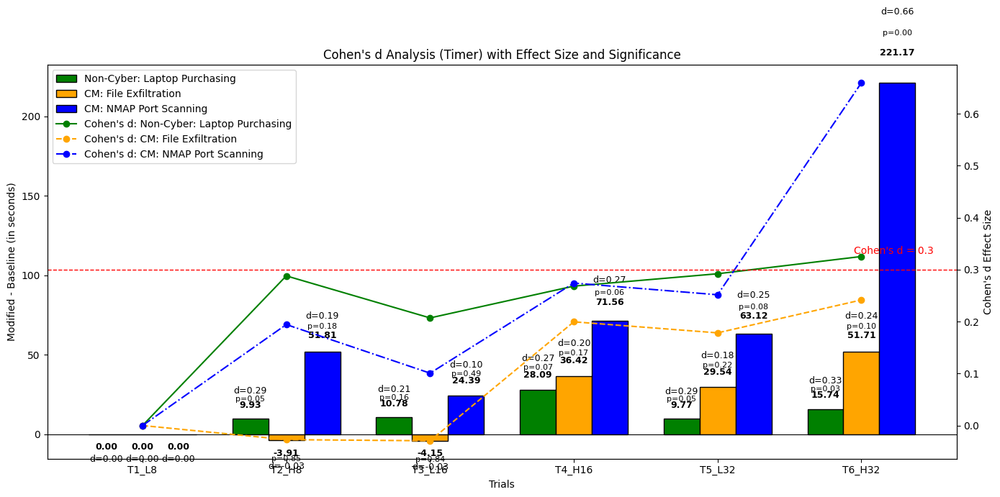

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tabulate import tabulate
from scipy.stats import ttest_ind # Import ttest_ind

# Load dataset
file_path = "/content/Choice_Overload.csv"
df = pd.read_csv(file_path)
df.columns = df.columns.str.strip()

sample_size = 95

# Define Cohen's d and helpers
def cohen_d(mean1, mean2, std1, std2, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * std1**2 + (n - 1) * std2**2) / (2 * n - 2))
    return (mean2 - mean1) / pooled_std if pooled_std != 0 else np.nan

def required_mean_difference(control_sd, trigger_sd, d=0.3, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * control_sd**2 + (n - 1) * trigger_sd**2) / (2 * n - 2))
    return d * pooled_std

def get_p_value(group1, group2):
    # ttest_ind is already imported at the top
    _, p = ttest_ind(group1, group2, nan_policy='omit', equal_var=False)
    return p

# Trial Mapping
trial_labels = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']

task_settings = {
    "Non-Cyber: Laptop Purchasing": {
        'em_co_lp_1_timer': 'T1_L8',
        'em_co_lp_2_timer': 'T2_H8',
        'em_co_lp_3_timer': 'T3_L16',
        'em_co_lp_4_timer': 'T4_H16',
        'em_co_lp_5_timer': 'T5_L32',
        'em_co_lp_6_timer': 'T6_H32',
        'color': 'green',
        'style': '-'
    },
    "CM: File Exfiltration": {
        'ci_co_fl_1_timer': 'T1_L8',
        'ci_co_fl_2_timer': 'T2_H8',
        'ci_co_fl_3_timer': 'T3_L16',
        'ci_co_fl_4_timer': 'T4_H16',
        'ci_co_fl_5_timer': 'T5_L32',
        'ci_co_fl_6_timer': 'T6_H32',
        'color': 'orange',
        'style': '--'
    },
    "CM: NMAP Port Scanning": {
        'ci_co_nmap_1_timer': 'T1_L8',
        'ci_co_nmap_2_timer': 'T2_H8',
        'ci_co_nmap_3_timer': 'T3_L16',
        'ci_co_nmap_4_timer': 'T4_H16',
        'ci_co_nmap_5_timer': 'T5_L32',
        'ci_co_nmap_6_timer': 'T6_H32',
        'color': 'blue',
        'style': '-.'
    }
}

results = {task: [] for task in task_settings}

# Main loop
for task, setting in task_settings.items():
    temp_df = df.rename(columns=setting)
    baseline = temp_df['T1_L8'].dropna()
    base_mean = baseline.mean()
    base_std = baseline.std()

    for trial in trial_labels:
        current = temp_df[trial].dropna()
        current_mean = current.mean()
        current_std = current.std()
        diff = current_mean - base_mean
        d_val = cohen_d(base_mean, current_mean, base_std, current_std)
        p_val = get_p_value(baseline, current) if trial != 'T1_L8' else np.nan
        results[task].append({
            'trial': trial,
            'mod_base_diff': diff,
            'd': d_val,
            'p': p_val
        })

# Plotting
x = np.arange(len(trial_labels))
bar_width = 0.25
fig, ax1 = plt.subplots(figsize=(14, 7))

for i, (task, task_result) in enumerate(results.items()):
    bar_pos = x + (i - 1) * bar_width
    diffs = [r['mod_base_diff'] for r in task_result]
    ds = [r['d'] for r in task_result]
    ps = [r['p'] for r in task_result]

    ax1.bar(bar_pos, diffs, width=bar_width, color=task_settings[task]['color'], label=task, edgecolor='black')

    for j, (pos, diff_val, d_val, pval) in enumerate(zip(bar_pos, diffs, ds, ps)):
        # Y-offsets for clarity
        offset = abs(diff_val) * 0.05 + 5  # scale with bar height
        diff_y = diff_val + offset if diff_val > 0 else diff_val - offset
        pval_y = diff_y + offset * 0.8 if diff_val > 0 else diff_y - offset * 0.8
        d_y = pval_y + offset * 0.8 if diff_val > 0 else pval_y - offset * 0.8

        # Difference label (bold)
        ax1.text(pos, diff_y, f"{diff_val:.2f}",
                 ha='center', va='bottom' if diff_val > 0 else 'top', fontsize=9, weight='bold')

        # p-value label
        if not np.isnan(pval):
            ax1.text(pos, pval_y, f"p={pval:.2f}",
                     ha='center', va='bottom' if diff_val > 0 else 'top', fontsize=8, color='black')

        # Cohen's d label
        ax1.text(pos, d_y, f"d={d_val:.2f}",
                 ha='center', va='bottom' if diff_val > 0 else 'top', fontsize=9, color='black')

# Cohen's d lines
ax2 = ax1.twinx()
for task, task_result in results.items():
    ds = [r['d'] for r in task_result]
    ax2.plot(x, ds, task_settings[task]['style'], marker='o', color=task_settings[task]['color'], label=f"Cohen's d: {task}")

# Axis formatting
ax1.set_xticks(x)
ax1.set_xticklabels(trial_labels)
ax1.set_xlabel("Trials")
ax1.set_ylabel("Modified - Baseline (in seconds)")
ax2.set_ylabel("Cohen's d Effect Size")
ax1.axhline(0, color='black', linewidth=0.8)
ax2.axhline(0.3, color='red', linestyle='dashed', linewidth=1)
ax2.text(len(x) - 0.5, 0.33, "Cohen's d = 0.3", color='red', fontsize=10, ha='right')

# Legend and layout
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.title("Cohen's d Analysis (Timer) with Effect Size and Significance")
plt.tight_layout()
plt.show()

### **File Exfiltration Population Time**

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
from tabulate import tabulate

# Load dataset
file_path = "/content/Updated_Choice_Overload.csv"
df = pd.read_csv(file_path)

# Fix column names (remove spaces)
df.columns = df.columns.str.strip()

# Define timer columns for File Exfiltration trials
file_exfiltration_timer_trials = {
    'ci_co_fl_1_timer': 'T1_L8',
    'ci_co_fl_2_timer': 'T2_H8',
    'ci_co_fl_3_timer': 'T3_L16',
    'ci_co_fl_4_timer': 'T4_H16',
    'ci_co_fl_5_timer': 'T5_L32',
    'ci_co_fl_6_timer': 'T6_H32'
}

# Rename columns for consistency
df_task = df.rename(columns=file_exfiltration_timer_trials)

# Extract relevant columns
columns_needed = ['response_id'] + list(file_exfiltration_timer_trials.values())
df_task = df_task[columns_needed].dropna()

# Compute Required Mean Differences (Cohen's d = 0.3)
sample_size = 95

def cohen_d(mean1, mean2, std1, std2, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * std1**2 + (n - 1) * std2**2) / (2 * n - 2))
    return (mean2 - mean1) / pooled_std

def required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * control_sd**2 + (n - 1) * trigger_sd**2) / (2 * n - 2))
    return d * pooled_std

# Compute control statistics
control_column = 'T1_L8'
control = df_task[control_column].dropna()
control_mean = control.mean()
control_sd = control.std()

# Compute required mean differences dynamically
required_mean_differences = {}
for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
    trigger = df_task[trial].dropna()
    trigger_mean = trigger.mean()
    trigger_sd = trigger.std()

    # Compute required mean difference for Cohen's d = 0.3
    required_diff = required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=sample_size)

    # Store the computed required mean difference
    required_mean_differences[trial] = round(required_diff, 2)

# Prepare the transformed table
transformed_data = []
for _, row in df_task.iterrows():
    response_id = int(row['response_id'])  # Ensure ID is in correct format
    control_value = row['T1_L8']

    for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
        trial_label = f"{trial} ({required_mean_differences[trial]})"  # Append required mean difference
        difference = row[trial] - control_value  # Calculate difference

        # Determine if it is "Triggered" (Yes/No)
        triggered = "Yes" if difference >= required_mean_differences[trial] else "No"

        transformed_data.append([response_id, control_value, row[trial], trial_label, difference, triggered])

# Convert to DataFrame
df_transformed = pd.DataFrame(transformed_data, columns=['Response ID', 'Control (Trial 1)', 'Trial Value', 'Trial', 'Difference', 'Triggered'])

# Display tables for all 95 participants using tabulate
print("\nTransformed Data Table for File Exfiltration Timer:\n")
print(tabulate(df_transformed, headers='keys', tablefmt='psql'))


Transformed Data Table for File Exfiltration Timer:

+-----+---------------+---------------------+---------------+----------------+--------------+-------------+
|     |   Response ID |   Control (Trial 1) |   Trial Value | Trial          |   Difference | Triggered   |
|-----+---------------+---------------------+---------------+----------------+--------------+-------------|
|   0 |     146626589 |                  18 |            68 | T2_H8 (43.19)  |           50 | Yes         |
|   1 |     146626589 |                  18 |            58 | T3_L16 (42.4)  |           40 | No          |
|   2 |     146626589 |                  18 |            78 | T4_H16 (54.73) |           60 | Yes         |
|   3 |     146626589 |                  18 |            57 | T5_L32 (49.68) |           39 | No          |
|   4 |     146626589 |                  18 |            50 | T6_H32 (64.18) |           32 | No          |
|   5 |     146629454 |                  33 |            33 | T2_H8 (43.19)  |    

### **Laptop Population Time**

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
from tabulate import tabulate

# Load dataset
file_path = "/content/Updated_Choice_Overload.csv"
df = pd.read_csv(file_path)

# Fix column names (remove spaces)
df.columns = df.columns.str.strip()

# Define timer columns for Laptop Purchasing trials
laptop_purchasing_timer_trials = {
    'em_co_lp_1_timer': 'T1_L8',
    'em_co_lp_2_timer': 'T2_H8',
    'em_co_lp_3_timer': 'T3_L16',
    'em_co_lp_4_timer': 'T4_H16',
    'em_co_lp_5_timer': 'T5_L32',
    'em_co_lp_6_timer': 'T6_H32'
}

# Rename columns for consistency
df_task = df.rename(columns=laptop_purchasing_timer_trials)

# Extract relevant columns
columns_needed = ['response_id'] + list(laptop_purchasing_timer_trials.values())
df_task = df_task[columns_needed].dropna()

# Compute Required Mean Differences (Cohen's d = 0.3)
sample_size = 95

def cohen_d(mean1, mean2, std1, std2, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * std1**2 + (n - 1) * std2**2) / (2 * n - 2))
    return (mean2 - mean1) / pooled_std

def required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * control_sd**2 + (n - 1) * trigger_sd**2) / (2 * n - 2))
    return d * pooled_std

# Compute control statistics
control_column = 'T1_L8'
control = df_task[control_column].dropna()
control_mean = control.mean()
control_sd = control.std()

# Compute required mean differences dynamically
required_mean_differences = {}
for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
    trigger = df_task[trial].dropna()
    trigger_mean = trigger.mean()
    trigger_sd = trigger.std()

    # Compute required mean difference for Cohen's d = 0.3
    required_diff = required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=sample_size)

    # Store the computed required mean difference
    required_mean_differences[trial] = round(required_diff, 2)

# Prepare the transformed table
transformed_data = []
for _, row in df_task.iterrows():
    response_id = int(row['response_id'])  # Ensure ID is in correct format
    control_value = row['T1_L8']

    for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
        trial_label = f"{trial} ({required_mean_differences[trial]})"  # Append required mean difference
        difference = row[trial] - control_value  # Calculate difference

        # Determine if it is "Triggered" (Yes/No)
        triggered = "Yes" if difference >= required_mean_differences[trial] else "No"

        transformed_data.append([response_id, control_value, row[trial], trial_label, difference, triggered])

# Convert to DataFrame
df_transformed = pd.DataFrame(transformed_data, columns=['Response ID', 'Control (Trial 1)', 'Trial Value', 'Trial', 'Difference', 'Triggered'])

# Display tables for all 95 participants using tabulate
print("\nTransformed Data Table for Laptop Purchasing Timer:\n")
print(tabulate(df_transformed, headers='keys', tablefmt='psql'))


Transformed Data Table for Laptop Purchasing Timer:

+-----+---------------+---------------------+---------------+----------------+--------------+-------------+
|     |   Response ID |   Control (Trial 1) |   Trial Value | Trial          |   Difference | Triggered   |
|-----+---------------+---------------------+---------------+----------------+--------------+-------------|
|   0 |     146626589 |                  15 |            34 | T2_H8 (10.34)  |           19 | Yes         |
|   1 |     146626589 |                  15 |            29 | T3_L16 (15.61) |           14 | No          |
|   2 |     146626589 |                  15 |            51 | T4_H16 (31.41) |           36 | Yes         |
|   3 |     146626589 |                  15 |            27 | T5_L32 (10.03) |           12 | Yes         |
|   4 |     146626589 |                  15 |            14 | T6_H32 (14.51) |           -1 | No          |
|   5 |     146629454 |                  90 |            80 | T2_H8 (10.34)  |    

### **NMAP Population Time**

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
from tabulate import tabulate

# Load dataset
file_path = "/content/Updated_Choice_Overload.csv"
df = pd.read_csv(file_path)

# Fix column names (remove spaces)
df.columns = df.columns.str.strip()

# Define timer columns for NMAP Port Scanning trials
nmap_timer_trials = {
    'ci_co_nmap_1_timer': 'T1_L8',
    'ci_co_nmap_2_timer': 'T2_H8',
    'ci_co_nmap_3_timer': 'T3_L16',
    'ci_co_nmap_4_timer': 'T4_H16',
    'ci_co_nmap_5_timer': 'T5_L32',
    'ci_co_nmap_6_timer': 'T6_H32'
}

# Rename columns for consistency
df_task = df.rename(columns=nmap_timer_trials)

# Extract relevant columns
columns_needed = ['response_id'] + list(nmap_timer_trials.values())
df_task = df_task[columns_needed].dropna()

# Compute Required Mean Differences (Cohen's d = 0.3)
sample_size = 95

def cohen_d(mean1, mean2, std1, std2, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * std1**2 + (n - 1) * std2**2) / (2 * n - 2))
    return (mean2 - mean1) / pooled_std

def required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=sample_size):
    pooled_std = np.sqrt(((n - 1) * control_sd**2 + (n - 1) * trigger_sd**2) / (2 * n - 2))
    return d * pooled_std

# Compute control statistics
control_column = 'T1_L8'
control = df_task[control_column].dropna()
control_mean = control.mean()
control_sd = control.std()

# Compute required mean differences dynamically
required_mean_differences = {}
for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
    trigger = df_task[trial].dropna()
    trigger_mean = trigger.mean()
    trigger_sd = trigger.std()

    # Compute required mean difference for Cohen's d = 0.3
    required_diff = required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=sample_size)

    # Store the computed required mean difference
    required_mean_differences[trial] = round(required_diff, 2)

# Prepare the transformed table
transformed_data = []
for _, row in df_task.iterrows():
    response_id = int(row['response_id'])  # Ensure ID is in correct format
    control_value = row['T1_L8']

    for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
        trial_label = f"{trial} ({required_mean_differences[trial]})"  # Append required mean difference
        difference = row[trial] - control_value  # Calculate difference

        # Determine if it is "Triggered" (Yes/No)
        triggered = "Yes" if difference >= required_mean_differences[trial] else "No"

        transformed_data.append([response_id, control_value, row[trial], trial_label, difference, triggered])

# Convert to DataFrame
df_transformed = pd.DataFrame(transformed_data, columns=['Response ID', 'Control (Trial 1)', 'Trial Value', 'Trial', 'Difference', 'Triggered'])

# Display tables for all 95 participants using tabulate
print("\nTransformed Data Table for NMAP Port Scanning Timer:\n")
print(tabulate(df_transformed, headers='keys', tablefmt='psql'))


Transformed Data Table for NMAP Port Scanning Timer:

+-----+---------------+---------------------+---------------+----------------+--------------+-------------+
|     |   Response ID |   Control (Trial 1) |   Trial Value | Trial          |   Difference | Triggered   |
|-----+---------------+---------------------+---------------+----------------+--------------+-------------|
|   0 |     146626589 |                  68 |           533 | T2_H8 (79.96)  |          465 | Yes         |
|   1 |     146626589 |                  68 |            49 | T3_L16 (72.57) |          -19 | No          |
|   2 |     146626589 |                  68 |           248 | T4_H16 (78.29) |          180 | Yes         |
|   3 |     146626589 |                  68 |           455 | T5_L32 (75.23) |          387 | Yes         |
|   4 |     146626589 |                  68 |           270 | T6_H32 (100.6) |          202 | Yes         |
|   5 |     146629454 |                  73 |            69 | T2_H8 (79.96)  |   

## **Combined data_Trigger_Time**



In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
from tabulate import tabulate

# Load dataset
file_path = "/content/Choice_Overload.csv"
df = pd.read_csv(file_path)

# Fix column names (remove spaces)
df.columns = df.columns.str.strip()

# Define timer columns for all three tasks
timer_trials_dict = {
    "File Exfiltration": {
        'ci_co_fl_1_timer': 'T1_L8',
        'ci_co_fl_2_timer': 'T2_H8',
        'ci_co_fl_3_timer': 'T3_L16',
        'ci_co_fl_4_timer': 'T4_H16',
        'ci_co_fl_5_timer': 'T5_L32',
        'ci_co_fl_6_timer': 'T6_H32'
    },
    "Laptop Purchasing": {
        'em_co_lp_1_timer': 'T1_L8',
        'em_co_lp_2_timer': 'T2_H8',
        'em_co_lp_3_timer': 'T3_L16',
        'em_co_lp_4_timer': 'T4_H16',
        'em_co_lp_5_timer': 'T5_L32',
        'em_co_lp_6_timer': 'T6_H32'
    },
    "NMAP Scanning": {
        'ci_co_nmap_1_timer': 'T1_L8',
        'ci_co_nmap_2_timer': 'T2_H8',
        'ci_co_nmap_3_timer': 'T3_L16',
        'ci_co_nmap_4_timer': 'T4_H16',
        'ci_co_nmap_5_timer': 'T5_L32',
        'ci_co_nmap_6_timer': 'T6_H32'
    }
}

# Function to compute required mean difference for Cohen's d = 0.3
def required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=95):
    pooled_std = np.sqrt(((n - 1) * control_sd**2 + (n - 1) * trigger_sd**2) / (2 * n - 2))
    return d * pooled_std

# Store transformed data
all_transformed_data = []

# Process each task
for task_name, trials_dict in timer_trials_dict.items():
    # Rename columns for consistency
    df_task = df.rename(columns=trials_dict)
    columns_needed = ['response_id'] + list(trials_dict.values())
    df_task = df_task[columns_needed].dropna()

    # Compute control statistics
    control_column = 'T1_L8'
    control = df_task[control_column].dropna()
    control_mean = control.mean()
    control_sd = control.std()

    # Compute required mean differences dynamically
    required_mean_differences = {}
    for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
        trigger = df_task[trial].dropna()
        trigger_mean = trigger.mean()
        trigger_sd = trigger.std()
        required_diff = required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=95)
        required_mean_differences[trial] = round(required_diff, 2)

    # Transform the table
    transformed_data = []
    for _, row in df_task.iterrows():
        response_id = int(row['response_id'])
        control_value = row['T1_L8']

        for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
            trial_label = f"{trial} ({required_mean_differences[trial]})"
            difference = row[trial] - control_value
            triggered = "Yes" if difference >= required_mean_differences[trial] else "No"

            transformed_data.append([response_id, control_value, row[trial], trial_label, difference, triggered, task_name])

    # Add transformed data to the combined list
    all_transformed_data.extend(transformed_data)

# Convert to DataFrame
df_combined = pd.DataFrame(all_transformed_data, columns=['Response ID', 'Control (Trial 1)', 'Trial Value', 'Trial', 'Difference', 'Triggered', 'Task'])

# Display combined table for all three tasks using tabulate
print("\nCombined Transformed Data Table (File Exfiltration, Laptop Purchasing, NMAP Scanning):\n")
print(tabulate(df_combined, headers='keys', tablefmt='psql'))

# Create Summary Table for Triggered='Yes' Counts
summary_table = df_combined[df_combined['Triggered'] == 'Yes'].groupby(['Task', 'Trial']).agg({'Response ID': 'count'}).reset_index()
summary_table.rename(columns={'Response ID': 'Count of Likely Triggered Participants'}, inplace=True)

# Display the summary table
print("\nSummary Table: Number of Participants Likely Triggered per Task and Trial:\n")
print(tabulate(summary_table, headers='keys', tablefmt='psql'))


Combined Transformed Data Table (File Exfiltration, Laptop Purchasing, NMAP Scanning):

+------+---------------+---------------------+---------------+----------------+--------------+-------------+-------------------+
|      |   Response ID |   Control (Trial 1) |   Trial Value | Trial          |   Difference | Triggered   | Task              |
|------+---------------+---------------------+---------------+----------------+--------------+-------------+-------------------|
|    0 |     146626589 |                  18 |            68 | T2_H8 (43.19)  |           50 | Yes         | File Exfiltration |
|    1 |     146626589 |                  18 |            58 | T3_L16 (42.4)  |           40 | No          | File Exfiltration |
|    2 |     146626589 |                  18 |            78 | T4_H16 (54.73) |           60 | Yes         | File Exfiltration |
|    3 |     146626589 |                  18 |            57 | T5_L32 (49.68) |           39 | No          | File Exfiltration |
|    4 |

## **Trigger Data Plot_Timer**

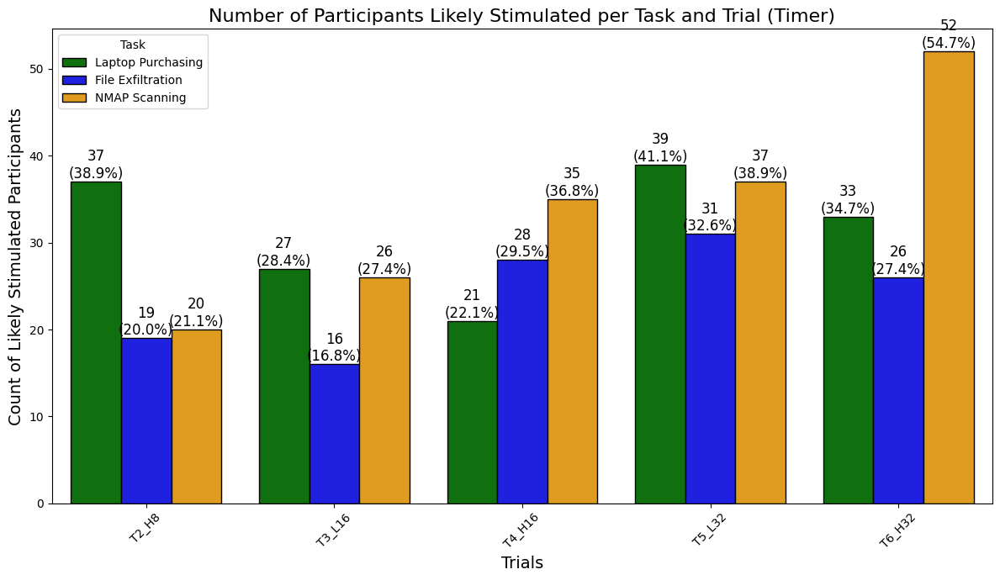

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

file_path = "/content/Choice_Overload.csv"
df = pd.read_csv(file_path)

# Fix column names (remove spaces)
df.columns = df.columns.str.strip()

# Define timer columns for all three tasks
timer_trials_dict = {
    "File Exfiltration": {
        'ci_co_fl_1_timer': 'T1_L8',
        'ci_co_fl_2_timer': 'T2_H8',
        'ci_co_fl_3_timer': 'T3_L16',
        'ci_co_fl_4_timer': 'T4_H16',
        'ci_co_fl_5_timer': 'T5_L32',
        'ci_co_fl_6_timer': 'T6_H32'
    },
    "Laptop Purchasing": {
        'em_co_lp_1_timer': 'T1_L8',
        'em_co_lp_2_timer': 'T2_H8',
        'em_co_lp_3_timer': 'T3_L16',
        'em_co_lp_4_timer': 'T4_H16',
        'em_co_lp_5_timer': 'T5_L32',
        'em_co_lp_6_timer': 'T6_H32'
    },
    "NMAP Scanning": {
        'ci_co_nmap_1_timer': 'T1_L8',
        'ci_co_nmap_2_timer': 'T2_H8',
        'ci_co_nmap_3_timer': 'T3_L16',
        'ci_co_nmap_4_timer': 'T4_H16',
        'ci_co_nmap_5_timer': 'T5_L32',
        'ci_co_nmap_6_timer': 'T6_H32'
    }
}

# Function to compute required mean difference for Cohen's d = 0.3
def required_mean_difference(control_mean, control_sd, trigger_sd, d=0.3, n=95):
    """Compute the required mean difference for a given Cohen's d."""
    pooled_std = ((n - 1) * control_sd**2 + (n - 1) * trigger_sd**2) / (2 * n - 2)
    return d * pooled_std**0.5

# Store transformed data
all_transformed_data = []

# Process each task
for task_name, trials_dict in timer_trials_dict.items():
    df_task = df.rename(columns=trials_dict)
    df_task = df_task[['response_id'] + list(trials_dict.values())].dropna()

    control_column = 'T1_L8'
    control = df_task[control_column].dropna()
    control_mean = control.mean()
    control_sd = control.std()

    required_mean_differences = {}
    for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
        trigger = df_task[trial].dropna()
        required_mean_differences[trial] = round(required_mean_difference(control_mean, control_sd, trigger.std()), 2)

    for _, row in df_task.iterrows():
        response_id = int(row['response_id'])
        control_value = row['T1_L8']

        for trial in ['T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']:
            difference = row[trial] - control_value
            Stimulated = "Yes" if difference >= required_mean_differences[trial] else "No"
            all_transformed_data.append([response_id, control_value, row[trial], trial, difference, Stimulated, task_name])

# Convert to DataFrame
df_combined = pd.DataFrame(all_transformed_data, columns=['Response ID', 'Control (Trial 1)', 'Trial Value', 'Trial', 'Difference', 'Stimulated', 'Task'])

# Create Summary Table for Stimulated='Yes' Counts
summary_table = df_combined[df_combined['Stimulated'] == 'Yes'].groupby(['Task', 'Trial']).agg({'Response ID': 'count'}).reset_index()
summary_table.rename(columns={'Response ID': 'Count of Likely Stimulated Participants'}, inplace=True)

# Calculate percentage of participants per task
total_participants = df_combined['Response ID'].nunique()
summary_table['Percentage'] = (summary_table['Count of Likely Stimulated Participants'] / total_participants) * 100

# Desired order
task_order = ["Laptop Purchasing", "File Exfiltration", "NMAP Scanning"]

# Sort tasks in desired order
summary_table['Task'] = pd.Categorical(summary_table['Task'], categories=task_order, ordered=True)
summary_table = summary_table.sort_values(['Trial', 'Task'])

# Custom color palette
custom_palette = {
    "Laptop Purchasing": "green",
    "File Exfiltration": "blue",
    "NMAP Scanning": "orange"
}

# Plot the bar chart
plt.figure(figsize=(12, 7))
ax = sns.barplot(
    data=summary_table,
    x="Trial",
    y="Count of Likely Stimulated Participants",
    hue="Task",
    hue_order=task_order,
    palette=custom_palette,
    edgecolor="black"
)

# Add participant numbers and percentages above bars
for p in ax.patches:
    height = p.get_height()
    if height > 0:
        ax.annotate(f'{int(height)}\n({height/total_participants*100:.1f}%)',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom', fontsize=12, color='black')

# Customize plot
plt.xlabel("Trials", fontsize=14)
plt.ylabel("Count of Likely Stimulated Participants", fontsize=14)
plt.title("Number of Participants Likely Stimulated per Task and Trial (Timer)", fontsize=16)
plt.legend(title="Task")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# **Emotional Analysis**

##**NMAP Emotional Analysis**

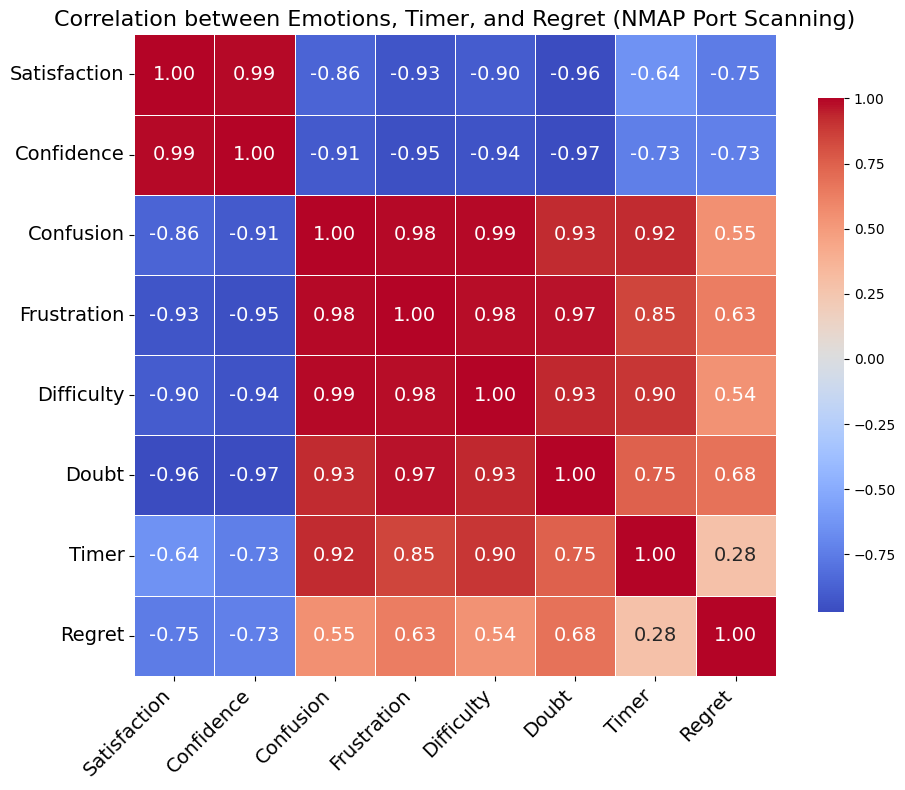

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- Load your CSV file ---
df = pd.read_csv('/content/Updated_Choice_Overload.csv')

# --- Define emotional metric columns (from NMAP Port Scanning task) ---
emotions = {
    "Satisfaction": [f'ci_co_nmap_{i}_survey_1' for i in range(1, 7)],
    "Confidence": [f'ci_co_nmap_{i}_survey_2' for i in range(1, 7)],
    "Confusion": [f'ci_co_nmap_{i}_survey_3' for i in range(1, 7)],
    "Frustration": [f'ci_co_nmap_{i}_survey_4' for i in range(1, 7)],
    "Difficulty": [f'ci_co_nmap_{i}_survey_5' for i in range(1, 7)],
    "Doubt": [f'ci_co_nmap_{i}_survey_6' for i in range(1, 7)],
    "Timer": [f'ci_co_nmap_{i}_timer' for i in range(1, 7)],
    "Regret": [f'ci_co_nmap_{i}_regret' for i in range(1, 7)]
}

# --- Create trial-wise aggregated DataFrame ---
trial_data = []
for i in range(6):
    trial_dict = {"Trial": f"T{i+1}", "Trial_Number": i + 1}
    for metric, cols in emotions.items():
        trial_dict[metric] = df[cols[i]].mean(skipna=True)
    trial_data.append(trial_dict)

merged_df = pd.DataFrame(trial_data)

# --- Correlation Matrix ---
corr = merged_df.drop(columns=['Trial', 'Trial_Number']).corr()

plt.figure(figsize=(10, 8))
sns.heatmap(
    corr,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    square=True,
    linewidths=0.5,
    annot_kws={"size": 14},            # Bigger font size for correlation values
    cbar_kws={"shrink": 0.8}
)

plt.xticks(fontsize=14, rotation=45, ha='right')  # Bigger, tilted column labels
plt.yticks(fontsize=14, rotation=0)               # Bigger row labels
plt.title("Correlation between Emotions, Timer, and Regret (NMAP Port Scanning)", fontsize=16)
plt.tight_layout()
plt.show()

### **ANCOVA_Emotion_NMAP**

In [ ]:
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Load the CSV file
df = pd.read_csv('/content/Updated_Choice_Overload.csv')  # Update path if needed

# Define emotional metric columns for NMAP task
emotions = {
    "Satisfaction": [f'ci_co_nmap_{i}_survey_1' for i in range(1, 7)],
    "Confidence": [f'ci_co_nmap_{i}_survey_2' for i in range(1, 7)],
    "Confusion": [f'ci_co_nmap_{i}_survey_3' for i in range(1, 7)],
    "Frustration": [f'ci_co_nmap_{i}_survey_4' for i in range(1, 7)],
    "Difficulty": [f'ci_co_nmap_{i}_survey_5' for i in range(1, 7)],
    "Doubt": [f'ci_co_nmap_{i}_survey_6' for i in range(1, 7)],
    "Timer": [f'ci_co_nmap_{i}_timer' for i in range(1, 7)],
    "Regret": [f'ci_co_nmap_{i}_regret' for i in range(1, 7)],
}

# Reshape data to long format
records = []
for i in range(6):
    for j in range(len(df)):
        row = {
            "Trial_Number": i + 1,
            "Satisfaction": df.loc[j, emotions["Satisfaction"][i]],
            "Confidence": df.loc[j, emotions["Confidence"][i]],
            "Confusion": df.loc[j, emotions["Confusion"][i]],
            "Frustration": df.loc[j, emotions["Frustration"][i]],
            "Difficulty": df.loc[j, emotions["Difficulty"][i]],
            "Doubt": df.loc[j, emotions["Doubt"][i]],
            "Timer": df.loc[j, emotions["Timer"][i]],
            "Regret": df.loc[j, emotions["Regret"][i]],
        }
        records.append(row)

ancova_df = pd.DataFrame(records)
ancova_df.dropna(inplace=True)

# Function to add significance column
def add_significance_column(anova_df):
    anova_df['Significant'] = anova_df['PR(>F)'].apply(lambda p: 'Yes' if p < 0.05 else 'No')
    return anova_df

# ANCOVA for Timer
print("\n--- ANCOVA for Timer (NMAP Task) ---")
model_timer = smf.ols('Timer ~ C(Trial_Number) + Satisfaction + Confidence + Confusion + Frustration + Difficulty + Doubt', data=ancova_df).fit()
anova_timer = sm.stats.anova_lm(model_timer, typ=2)
anova_timer = add_significance_column(anova_timer)
print(anova_timer)

# ANCOVA for Regret
print("\n--- ANCOVA for Regret (NMAP Task) ---")
model_regret = smf.ols('Regret ~ C(Trial_Number) + Satisfaction + Confidence + Confusion + Frustration + Difficulty + Doubt', data=ancova_df).fit()
anova_regret = sm.stats.anova_lm(model_regret, typ=2)
anova_regret = add_significance_column(anova_regret)
print(anova_regret)


--- ANCOVA for Timer (NMAP Task) ---
                       sum_sq     df         F    PR(>F) Significant
C(Trial_Number)  2.546236e+06    5.0  6.177801  0.000014         Yes
Satisfaction     5.247098e+05    1.0  6.365383  0.011914         Yes
Confidence       3.445568e+05    1.0  4.179903  0.041375         Yes
Confusion        6.234324e+05    1.0  7.563011  0.006151         Yes
Frustration      1.932491e+04    1.0  0.234435  0.628444          No
Difficulty       1.205666e+04    1.0  0.146262  0.702279          No
Doubt            1.215683e+05    1.0  1.474775  0.225108          No
Residual         4.599693e+07  558.0       NaN       NaN          No

--- ANCOVA for Regret (NMAP Task) ---
                        sum_sq     df         F        PR(>F) Significant
C(Trial_Number)   38979.321745    5.0  8.355856  1.242069e-07         Yes
Satisfaction        146.578087    1.0  0.157107  6.919856e-01          No
Confidence            6.109309    1.0  0.006548  9.355341e-01          No
Confus

Trial Scores and Metrics Averages:
         Trial Score  Satisfaction  Confidence  Confusion  Frustration  \
Trial 1    62.872340      3.747368    3.600000   2.368421     2.189474   
Trial 2    62.340426      3.768421    3.568421   2.389474     2.147368   
Trial 3    53.297872      3.694737    3.484211   2.368421     2.168421   
Trial 4    54.363636      3.568421    3.357895   2.610526     2.463158   
Trial 5    51.558442      3.305263    3.084211   2.673684     2.621053   
Trial 6    72.537313      3.378947    3.084211   2.947368     2.821053   

         Difficulty     Doubt        Time  
Trial 1    2.578947  2.621053  142.852632  
Trial 2    2.642105  2.505263  194.663158  
Trial 3    2.568421  2.642105  167.242105  
Trial 4    2.789474  2.778947  214.410526  
Trial 5    2.947368  2.978947  205.968421  
Trial 6    3.147368  3.052632  364.021053  


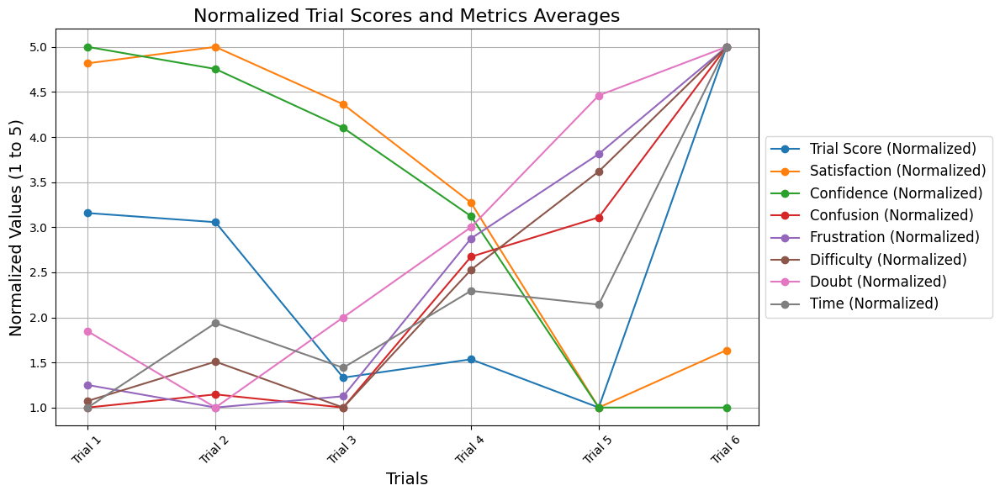

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the uploaded CSV file
file_path = '/content/Choice_Overload.csv'
df = pd.read_csv(file_path)

trial_scores = {
'Trial 1':  {
    '192.168.56.104:80': 80,
    '192.168.56.104:5900': 80,
    '192.168.56.105:5984': 30,
    '192.168.56.106:3000': 80,
    '192.168.56.107:5432': 50,
    '192.168.56.108:80': 80,
    '192.168.56.109:25': 30,
    '192.168.56.110:80': 80
},

'Trial 2': {
    '192.168.56.104:80': 80,
    '192.168.56.104:5900': 80,
    '192.168.56.105:5984': 30,
    '192.168.56.106:3000': 80,
    '192.168.56.107:5432': 50,
    '192.168.56.108:80': 80,
    '192.168.56.109:25': 30,
    '192.168.56.110:80': 80
},

'Trial 3':  {
    '192.168.56.104:80': 80,
    '192.168.56.104:5900': 80,
    '192.168.56.105:80': 80,
    '192.168.56.105:443': 30,
    '192.168.56.105:8080': 80,
    '192.168.56.106:5432': 50,
    '192.168.56.107:80': 80,
    '192.168.56.107:5900': 80,
    '192.168.56.108:5432': 50,
    '192.168.56.109:8484': 30,
    '192.168.56.110:80': 80,
    '192.168.56.110:8080': 80,
    '192.168.56.111:80': 80,
    '192.168.56.111:443': 30,
    '192.168.56.111:8080': 80,
    '192.168.56.112:3306': 10
},

'Trial 4':  {
    '192.168.56.104:5484': 80,
    '192.168.56.104:5900': 80,
    '192.168.56.105:80': 80,
    '192.168.56.105:443': 30,
    '192.168.56.105:8080': 80,
    '192.168.56.106:5432': 50,
    '192.168.56.107:80': 80,
    '192.168.56.107:5900': 80,
    '192.168.56.108:5432': 50,
    '192.168.56.109:8484': 30,
    '192.168.56.110:80': 80,
    '192.168.56.110:8080': 80,
    '192.168.56.111:80': 80,
    '192.168.56.111:443': 30,
    '192.168.56.111:8080': 80,
    '192.168.56.112:3306': 10

},

'Trial 5':  {
    '192.168.56.104:5984': 30,
    '192.168.56.105:22': 30,
    '192.168.56.106:3000': 10,
    '192.168.56.107:22': 30,
    '192.168.56.108:3306': 30,
    '192.168.56.109:3306': 50,
    '192.168.56.110:22': 30,
    '192.168.56.111:3000': 30,
    '192.168.56.112:3000': 30,
    '192.168.56.113:8080': 80,
    '192.168.56.114:25': 30,
    '192.168.56.115:8080': 80,
    '192.168.56.115:80': 80,
    '192.168.56.115:443': 30,
    '192.168.56.116:22': 30,
    '192.168.56.117:3000': 10,
    '192.168.56.118:21': 80,
    '192.168.56.119:8080': 80,
    '192.168.56.119:80': 80,
    '192.168.56.119:443': 30,
    '192.168.56.120:7474': 80,
    '192.168.56.120:7687': 30,
    '192.168.56.121:7474': 80,
    '192.168.56.121:7687': 30,
    '192.168.56.122:25': 30,
    '192.168.56.123:25': 30,
    '192.168.56.124:5432': 50,
    '192.168.56.125:8080': 80,
    '192.168.56.126:5984': 30,
    '192.168.56.127:3000': 10,
    '192.168.56.128:8080': 80,
    '192.168.56.129:80': 80
},

'Trial 6': {
    '192.168.56.213:5900': 80,
    '192.168.56.217:22': 30,
    '192.168.56.218:80': 80,
    '192.168.56.219:80': 80,
    '192.168.56.220:80': 80,
    '192.168.56.223:5900': 80,
    '192.168.56.226:8080': 80,
    '192.168.56.227:22': 30,
    '192.168.56.229:20': 80,
    '192.168.56.229:21': 80,
    '192.168.56.233:21': 80
}}

trial_columns = ['ci_co_nmap_1', 'ci_co_nmap_2', 'ci_co_nmap_3', 'ci_co_nmap_4', 'ci_co_nmap_5', 'ci_co_nmap_6']

# Define metric columns
satisfaction_columns = [
    'ci_co_nmap_1_survey_1', 'ci_co_nmap_2_survey_1', 'ci_co_nmap_3_survey_1',
    'ci_co_nmap_4_survey_1', 'ci_co_nmap_5_survey_1', 'ci_co_nmap_6_survey_1'
]
confidence_columns = [
    'ci_co_nmap_1_survey_2', 'ci_co_nmap_2_survey_2', 'ci_co_nmap_3_survey_2',
    'ci_co_nmap_4_survey_2', 'ci_co_nmap_5_survey_2', 'ci_co_nmap_6_survey_2'
]
confusion_columns = [
    'ci_co_nmap_1_survey_3', 'ci_co_nmap_2_survey_3', 'ci_co_nmap_3_survey_3',
    'ci_co_nmap_4_survey_3', 'ci_co_nmap_5_survey_3', 'ci_co_nmap_6_survey_3'
]
frustration_columns = [
    'ci_co_nmap_1_survey_4', 'ci_co_nmap_2_survey_4', 'ci_co_nmap_3_survey_4',
    'ci_co_nmap_4_survey_4', 'ci_co_nmap_5_survey_4', 'ci_co_nmap_6_survey_4'
]
difficulty_columns = [
    'ci_co_nmap_1_survey_5', 'ci_co_nmap_2_survey_5', 'ci_co_nmap_3_survey_5',
    'ci_co_nmap_4_survey_5', 'ci_co_nmap_5_survey_5', 'ci_co_nmap_6_survey_5'
]
doubt_columns = [
    'ci_co_nmap_1_survey_6', 'ci_co_nmap_2_survey_6', 'ci_co_nmap_3_survey_6',
    'ci_co_nmap_4_survey_6', 'ci_co_nmap_5_survey_6', 'ci_co_nmap_6_survey_6'
]
time_columns = [
    'ci_co_nmap_1_timer', 'ci_co_nmap_2_timer', 'ci_co_nmap_3_timer',
    'ci_co_nmap_4_timer', 'ci_co_nmap_5_timer', 'ci_co_nmap_6_timer'
]

# Combine all metrics into a dictionary
metrics = {
    "Satisfaction": satisfaction_columns,
    "Confidence": confidence_columns,
    "Confusion": confusion_columns,
    "Frustration": frustration_columns,
    "Difficulty": difficulty_columns,
    "Doubt": doubt_columns,
    "Time": time_columns
}

# Calculate trial scores
average_scores = {}
for i, trial_column in enumerate(trial_columns):
    trial_name = f"Trial {i + 1}"
    trial_score_dict = trial_scores[trial_name]
    file_names = df[trial_column].dropna().tolist()
    scores = [trial_score_dict[file] for file in file_names if file in trial_score_dict]
    average_scores[trial_name] = sum(scores) / len(scores) if scores else None

# Calculate metric averages per trial
metric_averages = {}
for metric_name, columns in metrics.items():
    averages = []
    for column in columns:
        avg = df[column].mean(skipna=True)  # Calculate average, ignoring NaN values
        averages.append(avg)
    metric_averages[metric_name] = averages

# Create DataFrames for trial scores and metric averages
trial_scores_df = pd.DataFrame.from_dict(average_scores, orient='index', columns=['Trial Score'])
trial_scores_df.index.name = 'Trial'

metric_averages_df = pd.DataFrame(metric_averages, index=[f"Trial {i+1}" for i in range(len(trial_columns))])

# Combine trial scores and metric averages into a single DataFrame
full_results_df = pd.concat([trial_scores_df, metric_averages_df], axis=1)

# Print the final DataFrame
print("Trial Scores and Metrics Averages:")
print(full_results_df)

# Normalize function
def normalize_to_range(series, new_min=1, new_max=5):
    """Normalize a pandas Series to a given range."""
    old_min, old_max = series.min(), series.max()
    return (series - old_min) / (old_max - old_min) * (new_max - new_min) + new_min

# Load the uploaded CSV file
file_path = 'Choice_Overload.csv'
df = pd.read_csv(file_path)

# Calculate trial scores and metric averages
# Assuming trial_scores_df and metric_averages_df are already created

# Combine trial scores and metric averages into a single DataFrame
full_results_df = pd.concat([trial_scores_df, metric_averages_df], axis=1)

# Normalize the DataFrame columns
normalized_df = full_results_df.apply(normalize_to_range)

# Plotting the metrics for each trial
plt.figure(figsize=(12, 6))

# Plot normalized Trial Scores
plt.plot(normalized_df.index, normalized_df['Trial Score'], marker='o', label='Trial Score (Normalized)')

# Plot each normalized metric
for metric in metrics.keys():
    if metric in normalized_df.columns:
        plt.plot(normalized_df.index, normalized_df[metric], marker='o', label=f'{metric} (Normalized)')

# Add title and labels
plt.title('Normalized Trial Scores and Metrics Averages', fontsize=16)
plt.xlabel('Trials', fontsize=14)
plt.ylabel('Normalized Values (1 to 5)', fontsize=14)

# Add a legend
#plt.legend(loc='upper left', fontsize=12)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=12)

# Display the grid
plt.grid(True)

# Show the plot
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##**File Exfiltration Emotional Analysis**

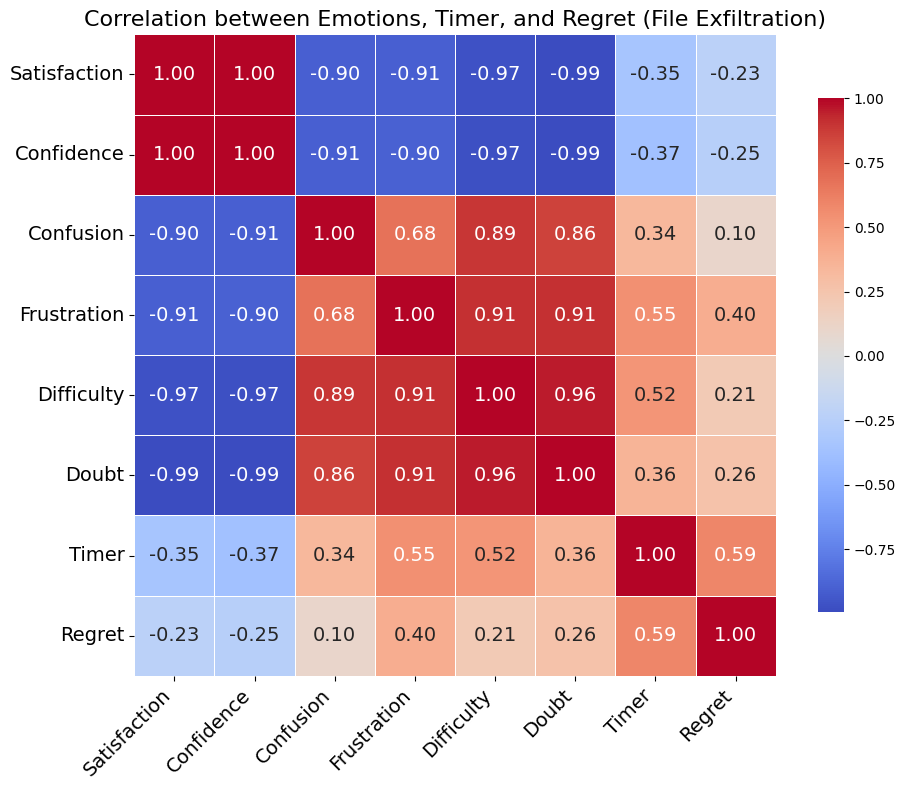

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- Load your CSV file ---
df = pd.read_csv('/content/Updated_Choice_Overload.csv')  # Update path if needed

# --- Define emotional metric columns (from File Exfiltration task) ---
emotions = {
    "Satisfaction": [f'ci_co_fl_{i}_survey_1' for i in range(1, 7)],
    "Confidence": [f'ci_co_fl_{i}_survey_2' for i in range(1, 7)],
    "Confusion": [f'ci_co_fl_{i}_survey_3' for i in range(1, 7)],
    "Frustration": [f'ci_co_fl_{i}_survey_4' for i in range(1, 7)],
    "Difficulty": [f'ci_co_fl_{i}_survey_5' for i in range(1, 7)],
    "Doubt": [f'ci_co_fl_{i}_survey_6' for i in range(1, 7)],
    "Timer": [f'ci_co_fl_{i}_timer' for i in range(1, 7)],
    "Regret": [f'ci_co_fl_{i}_regret' for i in range(1, 7)]
}

# --- Create trial-wise aggregated DataFrame ---
trial_data = []
for i in range(6):
    trial_dict = {"Trial": f"T{i+1}", "Trial_Number": i + 1}
    for metric, cols in emotions.items():
        trial_dict[metric] = df[cols[i]].mean(skipna=True)
    trial_data.append(trial_dict)

merged_df = pd.DataFrame(trial_data)

# --- Correlation Matrix ---
corr = merged_df.drop(columns=['Trial', 'Trial_Number']).corr()

plt.figure(figsize=(10, 8))
sns.heatmap(
    corr,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    square=True,
    linewidths=0.5,
    annot_kws={"size": 14},             # Bigger numbers inside the heatmap
    cbar_kws={"shrink": 0.8}
)

plt.xticks(fontsize=14, rotation=45, ha='right')  # Bigger x-axis labels
plt.yticks(fontsize=14, rotation=0)               # Bigger y-axis labels
plt.title("Correlation between Emotions, Timer, and Regret (File Exfiltration)", fontsize=16)
plt.tight_layout()
plt.show()

### **File Exfiltration_Emotion_ANCOVA**

In [ ]:
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Load the dataset
df = pd.read_csv('/content/Updated_Choice_Overload.csv')  # Update path if needed

# Define emotional metric columns for File Exfiltration Task
emotions = {
    "Satisfaction": [f'ci_co_fl_{i}_survey_1' for i in range(1, 7)],
    "Confidence":   [f'ci_co_fl_{i}_survey_2' for i in range(1, 7)],
    "Confusion":    [f'ci_co_fl_{i}_survey_3' for i in range(1, 7)],
    "Frustration":  [f'ci_co_fl_{i}_survey_4' for i in range(1, 7)],
    "Difficulty":   [f'ci_co_fl_{i}_survey_5' for i in range(1, 7)],
    "Doubt":        [f'ci_co_fl_{i}_survey_6' for i in range(1, 7)],
    "Timer":        [f'ci_co_fl_{i}_timer' for i in range(1, 7)],
    "Regret":       [f'ci_co_fl_{i}_regret' for i in range(1, 7)],
}

# Reshape data from wide to long for ANCOVA
records = []
for i in range(6):
    for j in range(len(df)):
        row = {
            "Trial_Number": i + 1,
            "Satisfaction": df.loc[j, emotions["Satisfaction"][i]],
            "Confidence": df.loc[j, emotions["Confidence"][i]],
            "Confusion": df.loc[j, emotions["Confusion"][i]],
            "Frustration": df.loc[j, emotions["Frustration"][i]],
            "Difficulty": df.loc[j, emotions["Difficulty"][i]],
            "Doubt": df.loc[j, emotions["Doubt"][i]],
            "Timer": df.loc[j, emotions["Timer"][i]],
            "Regret": df.loc[j, emotions["Regret"][i]],
        }
        records.append(row)

ancova_df = pd.DataFrame(records)
ancova_df.dropna(inplace=True)

def add_significance_column(anova_df):
    """Adds a 'Significant' column based on p-value: only Yes (p < 0.05) or No."""
    anova_df["Significant"] = anova_df["PR(>F)"].apply(lambda p: "Yes" if p < 0.05 else "No")
    return anova_df

# --- ANCOVA for Timer ---
print("\n--- ANCOVA for Timer (File Exfiltration Task) ---")
model_timer = smf.ols('Timer ~ C(Trial_Number) + Satisfaction + Confidence + Confusion + Frustration + Difficulty + Doubt', data=ancova_df).fit()
anova_timer = sm.stats.anova_lm(model_timer, typ=2)
anova_timer = add_significance_column(anova_timer)
print(anova_timer)

# --- ANCOVA for Regret ---
print("\n--- ANCOVA for Regret (File Exfiltration Task) ---")
model_regret = smf.ols('Regret ~ C(Trial_Number) + Satisfaction + Confidence + Confusion + Frustration + Difficulty + Doubt', data=ancova_df).fit()
anova_regret = sm.stats.anova_lm(model_regret, typ=2)
anova_regret = add_significance_column(anova_regret)
print(anova_regret)


--- ANCOVA for Timer (File Exfiltration Task) ---
                       sum_sq     df          F        PR(>F) Significant
C(Trial_Number)  2.890657e+05    5.0   2.478557  3.102277e-02         Yes
Satisfaction     1.637036e+00    1.0   0.000070  9.933188e-01          No
Confidence       7.409096e+04    1.0   3.176418  7.525201e-02          No
Confusion        8.609095e+05    1.0  36.908795  2.292697e-09         Yes
Frustration      1.724884e+05    1.0   7.394900  6.744599e-03         Yes
Difficulty       9.489552e+04    1.0   4.068348  4.417239e-02         Yes
Doubt            8.341066e+04    1.0   3.575970  5.913892e-02          No
Residual         1.301553e+07  558.0        NaN           NaN          No

--- ANCOVA for Regret (File Exfiltration Task) ---
                        sum_sq     df         F    PR(>F) Significant
C(Trial_Number)   18089.957727    5.0  4.582513  0.000418         Yes
Satisfaction       1356.410095    1.0  1.718016  0.190488          No
Confidence           

Trial Scores and Metrics Averages:
         Trial Score  Satisfaction  Confidence  Confusion  Frustration  \
Trial 1    71.393617      3.852632    3.768421   2.115789     1.894737   
Trial 2    84.294737      3.789474    3.673684   2.273684     1.831579   
Trial 3    81.157895      3.621053    3.484211   2.231579     2.115789   
Trial 4    71.726316      3.810526    3.673684   2.147368     1.978947   
Trial 5    68.810526      3.421053    3.210526   2.463158     2.221053   
Trial 6    74.103896      3.621053    3.484211   2.315789     2.147368   

         Difficulty     Doubt        Time  
Trial 1    2.326316  2.410526   75.052632  
Trial 2    2.494737  2.473684   71.147368  
Trial 3    2.684211  2.673684   70.905263  
Trial 4    2.526316  2.515789  111.473684  
Trial 5    2.947368  2.873684  104.589474  
Trial 6    2.778947  2.631579  126.757895  


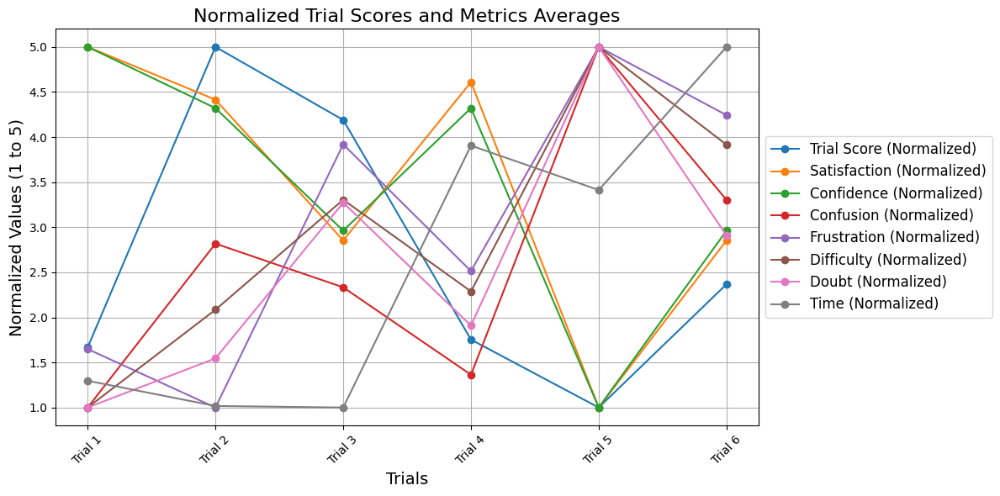

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the uploaded CSV file
file_path = '/content/Choice_Overload.csv'
df = pd.read_csv(file_path)

# Define trial columns
trial_columns = [
    'ci_co_fl_1',
    'ci_co_fl_2',
    'ci_co_fl_3',
    'ci_co_fl_4',
    'ci_co_fl_5',
    'ci_co_fl_6'
]

# Define trial scores
trial_scores = {
    'Trial 1': {
        'aug_patch_notes.docx': 20,
        'aug_update_data.zip': 73,
        'patcher': 73,
        'aug_patch_notes.pdf': 20,
        'README.txt': 20,
        't1.enc': 100,
        't2.enc': 100,
        'temp_parser.py': 100,
    },
    'Trial 2': {
        'cplan_overview.pptx': 48,
        'cplan_package.enc': 100,
        'cplan.pdf': 28,
        'cplan_working_doc.docx': 40,
        'data_t1.zip': 96,
        'jul12notes.txt': 20,
        'parse_data.sh': 72,
        'parsed_doc.txt': 20,
    },
    'Trial 3': {
        'data_record.xls': 20,
        'monthly_increment_tracker.txt': 46,
        'test2.py': 46,
        'test.py': 46,
        'transfer.txt': 20,
        'zephyr_codes.enc': 100,
        'zephyr_data01.zip': 100,
        'zephyr_data02.zip': 100,
        'zephyr_data03.zip': 100,
        'zephyr_data04.zip': 100,
        'zephyr_data05.zip': 100,
        'zephyr_instructions.txt': 46,
        'zephyr_manual.pdf': 20,
        'zephyr_run': 100,
        'zephyr_training.pptx': 20,
        'zephyr_working_doc.docx': 20,
    },
    'Trial 4': {
        'COMET_augUpdate.pptx': 74,
        'COMET_augUpdateWorkingDoc.docx': 53,
        'COMET_bugResolution.pptx': 70,
        'COMET_bugResolutionWorkingDoc.docx': 62,
        'COMET_monthlyReport.docx': 66,
        'COMET_userBreakdown.pptx': 53,
        'processedUserData.xls': 66,
        'process_userData.py': 95,
        'README.txt': 20,
        'userData1.enc': 100,
        'userData2.enc': 100,
        'userData3.enc': 100,
        'userDataInstructionNotes.txt': 45,
        'userGraph.png': 20,
        'userReport.pdf': 20,
        'COMET_userBreakdownWorkingDoc.docx': 53,
    },
    'Trial 5': {
        'aug_monthly_update_working_doc.docx': 20,
        'data_overview.docx': 20,
        'JAPPA': 100,
        'jappa_data1.zip': 100,
        'jappa_data2.zip': 100,
        'jappa_data3.zip': 100,
        'jappa_data4.zip': 100,
        'jappa_data5.zip': 100,
        'jappa_data_graphic.png': 20,
        'jappa_Export.py': 73,
        'jappa_format_example.json': 20,
        'jappa_maintenance_manual.pdf': 20,
        'jappa_mapper.py': 73,
        'jappa_overview.pptx': 20,
        'jappa_parsed_1.xls': 20,
        'jappa_parsed_2.xls': 20,
        'jappa_system_analysis_v0.pptx': 20,
        'jappa_system_analysis_v1.pptx': 20,
        'jappa_system_analysis_v1.1.pptx': 20,
        'jappa_system_analysis_v2.pptx': 20,
        'jappa_template1.txt': 20,
        'jappa_template2.txt': 20,
        'jappa_template3.txt': 20,
        'jappa_user_manual.pdf': 20,
        'notes.txt': 20,
        'system1_benchmark.json': 20,
        'system2_benchmark.json': 20,
        'system3_benchmark.json': 20,
        'system_pack1.zip': 100,
        'system_pack2.zip': 100,
        'system_pack3.zip': 100,
        'systems_graphic.png': 20,
    },
    'Trial 6': {
        'core_data1.enc': 100,
        'core_data2.enc': 100,
        'cvv_report.pdf': 49,
        'datadump01.zip': 83,
        'datadump03.zip': 83,
        'datadump_graph1.png': 24,
        'datadump_graph2.png': 24,
        'datadump_graph3.png': 24,
        'data_parse.py': 75,
        'process_1': 96,
        'process_2': 96,
        'README.txt': 20,
        'generate_report.py': 75,
        'jul_report.pptx': 49,
        'may_report.pptx': 71,
        'jun_report.pptx': 49,
        'jun_working_doc.docx': 28,
        'may_working_doc.docx': 28,
        'jul_working_doc.docx': 28,
        'generate_png.py': 75,
        'dump01_parsed.xls': 24,
        'dump02_parsed.xls': 24,
        'data_sort.py': 75,
        'proceed_notes.txt': 20,
        'vnr_report.pdf': 20,
}
}

# Define metric columns
satisfaction_columns = [
    'ci_co_fl_1_survey_1', 'ci_co_fl_2_survey_1', 'ci_co_fl_3_survey_1',
    'ci_co_fl_4_survey_1', 'ci_co_fl_5_survey_1', 'ci_co_fl_6_survey_1'
]
confidence_columns = [
    'ci_co_fl_1_survey_2', 'ci_co_fl_2_survey_2', 'ci_co_fl_3_survey_2',
    'ci_co_fl_4_survey_2', 'ci_co_fl_5_survey_2', 'ci_co_fl_6_survey_2'
]
confusion_columns = [
    'ci_co_fl_1_survey_3', 'ci_co_fl_2_survey_3', 'ci_co_fl_3_survey_3',
    'ci_co_fl_4_survey_3', 'ci_co_fl_5_survey_3', 'ci_co_fl_6_survey_3'
]
frustration_columns = [
    'ci_co_fl_1_survey_4', 'ci_co_fl_2_survey_4', 'ci_co_fl_3_survey_4',
    'ci_co_fl_4_survey_4', 'ci_co_fl_5_survey_4', 'ci_co_fl_6_survey_4'
]
difficulty_columns = [
    'ci_co_fl_1_survey_5', 'ci_co_fl_2_survey_5', 'ci_co_fl_3_survey_5',
    'ci_co_fl_4_survey_5', 'ci_co_fl_5_survey_5', 'ci_co_fl_6_survey_5'
]
doubt_columns = [
    'ci_co_fl_1_survey_6', 'ci_co_fl_2_survey_6', 'ci_co_fl_3_survey_6',
    'ci_co_fl_4_survey_6', 'ci_co_fl_5_survey_6', 'ci_co_fl_6_survey_6'
]
time_columns = [
    'ci_co_fl_1_timer', 'ci_co_fl_2_timer', 'ci_co_fl_3_timer',
    'ci_co_fl_4_timer', 'ci_co_fl_5_timer', 'ci_co_fl_6_timer'
]

# Combine all metrics into a dictionary
metrics = {
    "Satisfaction": satisfaction_columns,
    "Confidence": confidence_columns,
    "Confusion": confusion_columns,
    "Frustration": frustration_columns,
    "Difficulty": difficulty_columns,
    "Doubt": doubt_columns,
    "Time": time_columns
}

# Calculate trial scores
average_scores = {}
for i, trial_column in enumerate(trial_columns):
    trial_name = f"Trial {i + 1}"
    trial_score_dict = trial_scores[trial_name]
    file_names = df[trial_column].dropna().tolist()
    scores = [trial_score_dict[file] for file in file_names if file in trial_score_dict]
    average_scores[trial_name] = sum(scores) / len(scores) if scores else None

# Calculate metric averages per trial
metric_averages = {}
for metric_name, columns in metrics.items():
    averages = []
    for column in columns:
        avg = df[column].mean(skipna=True)  # Calculate average, ignoring NaN values
        averages.append(avg)
    metric_averages[metric_name] = averages

# Create DataFrames for trial scores and metric averages
trial_scores_df = pd.DataFrame.from_dict(average_scores, orient='index', columns=['Trial Score'])
trial_scores_df.index.name = 'Trial'

metric_averages_df = pd.DataFrame(metric_averages, index=[f"Trial {i+1}" for i in range(len(trial_columns))])

# Combine trial scores and metric averages into a single DataFrame
full_results_df = pd.concat([trial_scores_df, metric_averages_df], axis=1)

# Print the final DataFrame
print("Trial Scores and Metrics Averages:")
print(full_results_df)

# Normalize Data
def normalize_to_range(series, new_min=1, new_max=5):
    old_min, old_max = series.min(), series.max()
    return (series - old_min) / (old_max - old_min) * (new_max - new_min) + new_min

normalized_df = full_results_df.apply(normalize_to_range)

# Plotting the metrics
plt.figure(figsize=(12, 6))

# Plot normalized Trial Scores
plt.plot(normalized_df.index, normalized_df['Trial Score'], marker='o', label='Trial Score (Normalized)')

# Plot each normalized metric
for metric in metrics.keys():
    if metric in normalized_df.columns:
        plt.plot(normalized_df.index, normalized_df[metric], marker='o', label=f'{metric} (Normalized)')

# Add title and labels
plt.title('Normalized Trial Scores and Metrics Averages', fontsize=16)
plt.xlabel('Trials', fontsize=14)
plt.ylabel('Normalized Values (1 to 5)', fontsize=14)

# Add a legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=12)

# Display the grid
plt.grid(True)

# Show the plot
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##**Laptop Choice Emotional Analysis**

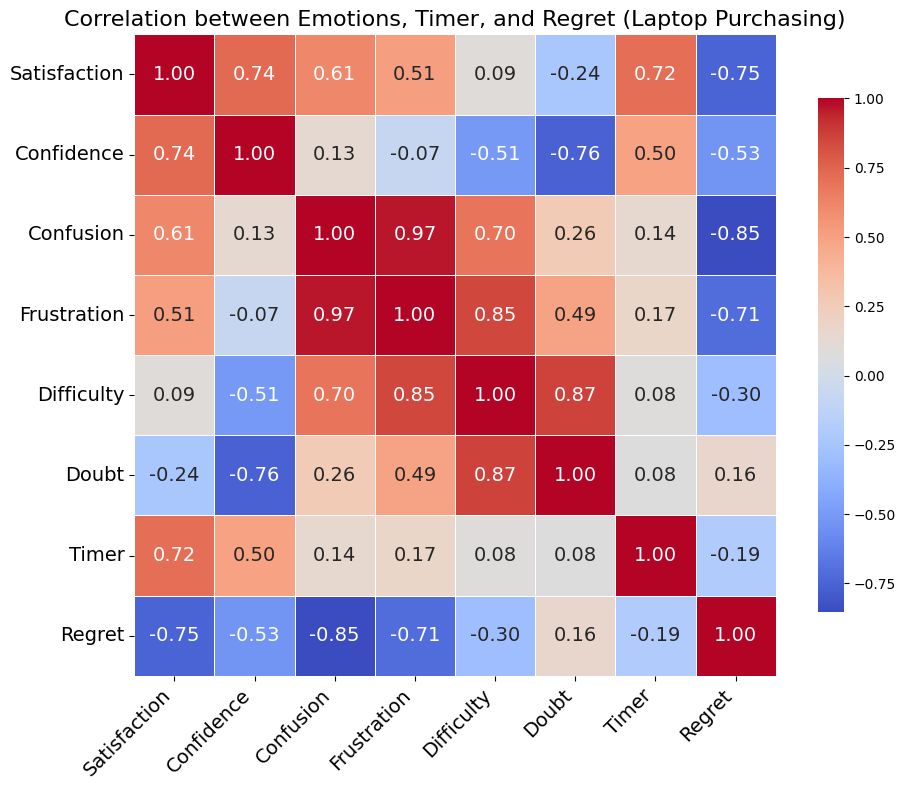

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- Load your CSV file ---
df = pd.read_csv('/content/Updated_Choice_Overload.csv')  # Update path if needed

# --- Define emotional metric columns (from Laptop task) ---
emotions = {
    "Satisfaction": [f'em_co_lp_{i}_survey_1' for i in range(1, 7)],
    "Confidence": [f'em_co_lp_{i}_survey_2' for i in range(1, 7)],
    "Confusion": [f'em_co_lp_{i}_survey_3' for i in range(1, 7)],
    "Frustration": [f'em_co_lp_{i}_survey_4' for i in range(1, 7)],
    "Difficulty": [f'em_co_lp_{i}_survey_5' for i in range(1, 7)],
    "Doubt": [f'em_co_lp_{i}_survey_6' for i in range(1, 7)],
    "Timer": [f'em_co_lp_{i}_timer' for i in range(1, 7)],
    "Regret": [f'em_co_lp_{i}_regret' for i in range(1, 7)]
}

# --- Create trial-wise aggregated DataFrame ---
trial_data = []
for i in range(6):
    trial_dict = {"Trial": f"T{i+1}", "Trial_Number": i + 1}
    for metric, cols in emotions.items():
        trial_dict[metric] = df[cols[i]].mean(skipna=True)
    trial_data.append(trial_dict)

merged_df = pd.DataFrame(trial_data)

# --- Correlation Matrix ---
corr = merged_df.drop(columns=['Trial', 'Trial_Number']).corr()

plt.figure(figsize=(10, 8))
sns.heatmap(
    corr,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    square=True,
    linewidths=0.5,
    annot_kws={"size": 14},             # Bigger heatmap numbers
    cbar_kws={"shrink": 0.8}
)

plt.xticks(fontsize=14, rotation=45, ha='right')  # X-axis font
plt.yticks(fontsize=14, rotation=0)               # Y-axis font
plt.title("Correlation between Emotions, Timer, and Regret (Laptop Purchasing)", fontsize=16)
plt.tight_layout()
plt.show()

### **Ancova Laptop Emotions**

In [ ]:
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Load your CSV file
df = pd.read_csv('/content/Updated_Choice_Overload.csv')  # Update the path as needed

# Define emotional metric columns for Laptop Task
emotions = {
    "Satisfaction": [f'em_co_lp_{i}_survey_1' for i in range(1, 7)],
    "Confidence": [f'em_co_lp_{i}_survey_2' for i in range(1, 7)],
    "Confusion": [f'em_co_lp_{i}_survey_3' for i in range(1, 7)],
    "Frustration": [f'em_co_lp_{i}_survey_4' for i in range(1, 7)],
    "Difficulty": [f'em_co_lp_{i}_survey_5' for i in range(1, 7)],
    "Doubt": [f'em_co_lp_{i}_survey_6' for i in range(1, 7)],
    "Timer": [f'em_co_lp_{i}_timer' for i in range(1, 7)],
    "Regret": [f'em_co_lp_{i}_regret' for i in range(1, 7)],
}

# Reshape data from wide to long for ANCOVA
records = []
for i in range(6):
    for j in range(len(df)):
        row = {
            "Trial_Number": i + 1,
            "Satisfaction": df.loc[j, emotions["Satisfaction"][i]],
            "Confidence": df.loc[j, emotions["Confidence"][i]],
            "Confusion": df.loc[j, emotions["Confusion"][i]],
            "Frustration": df.loc[j, emotions["Frustration"][i]],
            "Difficulty": df.loc[j, emotions["Difficulty"][i]],
            "Doubt": df.loc[j, emotions["Doubt"][i]],
            "Timer": df.loc[j, emotions["Timer"][i]],
            "Regret": df.loc[j, emotions["Regret"][i]],
        }
        records.append(row)

ancova_df = pd.DataFrame(records)
ancova_df.dropna(inplace=True)

def add_significance_column(anova_df):
    """Adds a 'Significant' column based on p-value: only Yes (p < 0.05) or No."""
    anova_df["Significant"] = anova_df["PR(>F)"].apply(lambda p: "Yes" if p < 0.05 else "No")
    return anova_df

# Run ANCOVA for Timer
print("\n--- ANCOVA for Timer (Laptop Task) ---")
model_timer = smf.ols('Timer ~ C(Trial_Number) + Satisfaction + Confidence + Confusion + Frustration + Difficulty + Doubt', data=ancova_df).fit()
anova_timer = sm.stats.anova_lm(model_timer, typ=2)
anova_timer = add_significance_column(anova_timer)
print(anova_timer)

# Run ANCOVA for Regret
print("\n--- ANCOVA for Regret (Laptop Task) ---")
model_regret = smf.ols('Regret ~ C(Trial_Number) + Satisfaction + Confidence + Confusion + Frustration + Difficulty + Doubt', data=ancova_df).fit()
anova_regret = sm.stats.anova_lm(model_regret, typ=2)
anova_regret = add_significance_column(anova_regret)
print(anova_regret)


--- ANCOVA for Timer (Laptop Task) ---
                       sum_sq     df          F    PR(>F) Significant
C(Trial_Number)  3.968556e+04    5.0   1.529956  0.178571          No
Satisfaction     1.242810e+04    1.0   2.395637  0.122241          No
Confidence       7.889885e+03    1.0   1.520852  0.218010          No
Confusion        7.582034e+04    1.0  14.615108  0.000147         Yes
Frustration      1.287642e+03    1.0   0.248206  0.618538          No
Difficulty       1.870988e+04    1.0   3.606511  0.058069          No
Doubt            4.777864e+04    1.0   9.209798  0.002519         Yes
Residual         2.894796e+06  558.0        NaN       NaN          No

--- ANCOVA for Regret (Laptop Task) ---
                        sum_sq     df         F        PR(>F) Significant
C(Trial_Number)   16866.672176    5.0  8.003261  2.666823e-07         Yes
Satisfaction       1217.167698    1.0  2.887739  8.981343e-02          No
Confidence          107.334950    1.0  0.254653  6.140169e-01      

Trial Scores and Metrics Averages:
         Trial Score  Satisfaction  Confidence  Confusion  Frustration  \
Trial 1    73.589474      4.052632    4.042105   1.747368     1.621053   
Trial 2    69.368421      4.021053    3.926316   1.736842     1.715789   
Trial 3    80.557895      4.084211    3.978947   1.800000     1.757895   
Trial 4    77.484211      4.210526    4.094737   1.800000     1.726316   
Trial 5    86.431579      4.136842    3.989474   2.021053     2.010526   
Trial 6    78.789474      4.242105    4.052632   1.957895     1.905263   

         Difficulty     Doubt       Time  
Trial 1    1.821053  1.789474  38.452632  
Trial 2    2.042105  2.042105  48.378947  
Trial 3    1.989474  1.936842  49.231579  
Trial 4    1.926316  1.884211  66.547368  
Trial 5    2.189474  2.021053  48.221053  
Trial 6    2.000000  1.884211  54.189474  


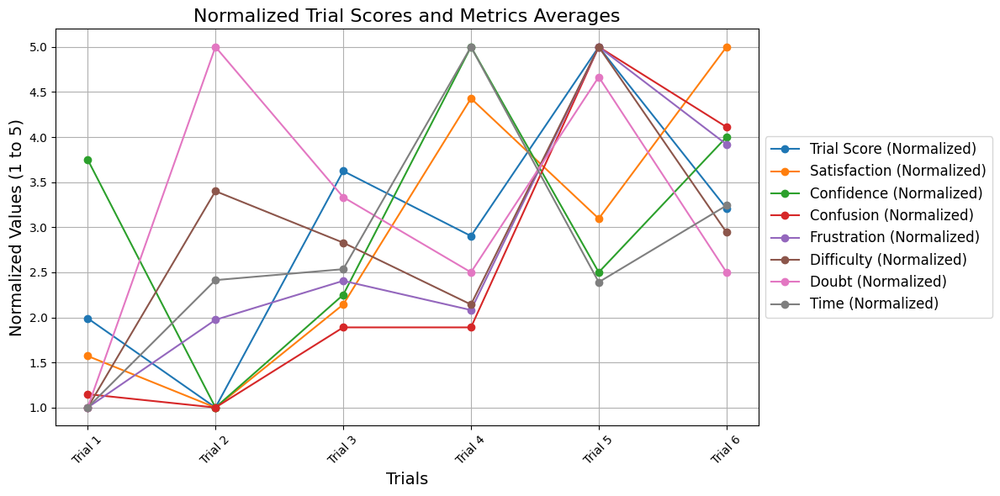

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the uploaded CSV file
file_path = '/content/Choice_Overload.csv'
df = pd.read_csv(file_path)

trial_scores = {
    'Trial 1': {
        'A': 43,
        'B': 66,
        'C': 20,
        'D': 90,
        'E': 33,
        'F': 63,
        'G': 60,
        'H': 100,
    },
    'Trial 2': {
        'A': 69,
        'B': 100,
        'C': 31,
        'D': 23,
        'E': 77,
        'F': 65,
        'G': 20,
        'H': 31,
    },
    'Trial 3': {
        'A': 20,
        'B': 37,
        'C': 42,
        'D': 37,
        'E': 55,
        'F': 64,
        'G': 37,
        'H': 100,
        'I': 77,
        'J': 73,
        'K': 64,
        'L': 82,
        'M': 46,
        'N': 68,
        'O': 55,
        'P': 95,
    },
    'Trial 4': {
        'A': 59,
        'B': 91,
        'C': 44,
        'D': 20,
        'E': 59,
        'F': 100,
        'G': 39,
        'H': 30,
        'I': 44,
        'J': 46,
        'K': 44,
        'L': 62,
        'M': 43,
        'N': 76,
        'O': 52,
        'P': 59,
    },
    'Trial 5': {
        'A': 65,
        'B': 92,
        'C': 50,
        'D': 27,
        'E': 75,
        'F': 100,
        'G': 30,
        'H': 70,
        'I': 77,
        'J': 60,
        'K': 50,
        'L': 75,
        'M': 90,
        'N': 80,
        'O': 57,
        'P': 65,
        'Q': 52,
        'R': 90,
        'S': 50,
        'T': 50,
        'U': 47,
        'V': 82,
        'W': 20,
        'X': 90,
        'Y': 47,
        'Z': 75,
        'AA': 22,
        'BB': 92,
        'CC': 50,
        'DD': 45,
        'EE': 47,
        'FF': 92,
    },
    'Trial 6': {
        'A': 59,
        'B': 86,
        'C': 39,
        'D': 20,
        'E': 51,
        'F': 100,
        'G': 25,
        'H': 27,
        'I': 31,
        'J': 41,
        'K': 31,
        'L': 66,
        'M': 45,
        'N': 70,
        'O': 53,
        'P': 55,
        'Q': 76,
        'R': 51,
        'S': 20,
        'T': 51,
        'U': 96,
        'V': 33,
        'W': 31,
        'X': 80,
        'Y': 41,
        'Z': 31,
        'AA': 84,
        'BB': 21,
        'CC': 35,
        'DD': 68,
    }
}

trial_columns = ['em_co_lp_1', 'em_co_lp_2', 'em_co_lp_3', 'em_co_lp_4', 'em_co_lp_5', 'em_co_lp_6']

# Define metric columns
satisfaction_columns = [
    'em_co_lp_1_survey_1', 'em_co_lp_2_survey_1', 'em_co_lp_3_survey_1',
    'em_co_lp_4_survey_1', 'em_co_lp_5_survey_1', 'em_co_lp_6_survey_1'
]
confidence_columns = [
    'em_co_lp_1_survey_2', 'em_co_lp_2_survey_2', 'em_co_lp_3_survey_2',
    'em_co_lp_4_survey_2', 'em_co_lp_5_survey_2', 'em_co_lp_6_survey_2'
]
confusion_columns = [
    'em_co_lp_1_survey_3', 'em_co_lp_2_survey_3', 'em_co_lp_3_survey_3',
    'em_co_lp_4_survey_3', 'em_co_lp_5_survey_3', 'em_co_lp_6_survey_3'
]
frustration_columns = [
    'em_co_lp_1_survey_4', 'em_co_lp_2_survey_4', 'em_co_lp_3_survey_4',
    'em_co_lp_4_survey_4', 'em_co_lp_5_survey_4', 'em_co_lp_6_survey_4'
]
difficulty_columns = [
    'em_co_lp_1_survey_5', 'em_co_lp_2_survey_5', 'em_co_lp_3_survey_5',
    'em_co_lp_4_survey_5', 'em_co_lp_5_survey_5', 'em_co_lp_6_survey_5'
]
doubt_columns = [
    'em_co_lp_1_survey_6', 'em_co_lp_2_survey_6', 'em_co_lp_3_survey_6',
    'em_co_lp_4_survey_6', 'em_co_lp_5_survey_6', 'em_co_lp_6_survey_6'
]
time_columns = [
    'em_co_lp_1_timer', 'em_co_lp_2_timer', 'em_co_lp_3_timer',
    'em_co_lp_4_timer', 'em_co_lp_5_timer', 'em_co_lp_6_timer'
]

# Combine all metrics into a dictionary
metrics = {
    "Satisfaction": satisfaction_columns,
    "Confidence": confidence_columns,
    "Confusion": confusion_columns,
    "Frustration": frustration_columns,
    "Difficulty": difficulty_columns,
    "Doubt": doubt_columns,
    "Time": time_columns
}

# Calculate trial scores
average_scores = {}
for i, trial_column in enumerate(trial_columns):
    trial_name = f"Trial {i + 1}"
    trial_score_dict = trial_scores[trial_name]
    file_names = df[trial_column].dropna().tolist()
    scores = [trial_score_dict[file] for file in file_names if file in trial_score_dict]
    average_scores[trial_name] = sum(scores) / len(scores) if scores else None

# Calculate metric averages per trial
metric_averages = {}
for metric_name, columns in metrics.items():
    averages = []
    for column in columns:
        avg = df[column].mean(skipna=True)  # Calculate average, ignoring NaN values
        averages.append(avg)
    metric_averages[metric_name] = averages

# Create DataFrames for trial scores and metric averages
trial_scores_df = pd.DataFrame.from_dict(average_scores, orient='index', columns=['Trial Score'])
trial_scores_df.index.name = 'Trial'

metric_averages_df = pd.DataFrame(metric_averages, index=[f"Trial {i+1}" for i in range(len(trial_columns))])

# Combine trial scores and metric averages into a single DataFrame
full_results_df = pd.concat([trial_scores_df, metric_averages_df], axis=1)

# Print the final DataFrame
print("Trial Scores and Metrics Averages:")
print(full_results_df)

# Normalize function
def normalize_to_range(series, new_min=1, new_max=5):
    """Normalize a pandas Series to a given range."""
    old_min, old_max = series.min(), series.max()
    return (series - old_min) / (old_max - old_min) * (new_max - new_min) + new_min

# Normalize the DataFrame columns
normalized_df = full_results_df.apply(normalize_to_range)

# Plotting the metrics
plt.figure(figsize=(12, 6))

# Plot normalized Trial Scores
plt.plot(normalized_df.index, normalized_df['Trial Score'], marker='o', label='Trial Score (Normalized)')

# Plot each normalized metric
for metric in metrics.keys():
    if metric in normalized_df.columns:
        plt.plot(normalized_df.index, normalized_df[metric], marker='o', label=f'{metric} (Normalized)')

# Add title and labels
plt.title('Normalized Trial Scores and Metrics Averages', fontsize=16)
plt.xlabel('Trials', fontsize=14)
plt.ylabel('Normalized Values (1 to 5)', fontsize=14)

# Add a legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=12)

# Display the grid
plt.grid(True)

# Show the plot
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

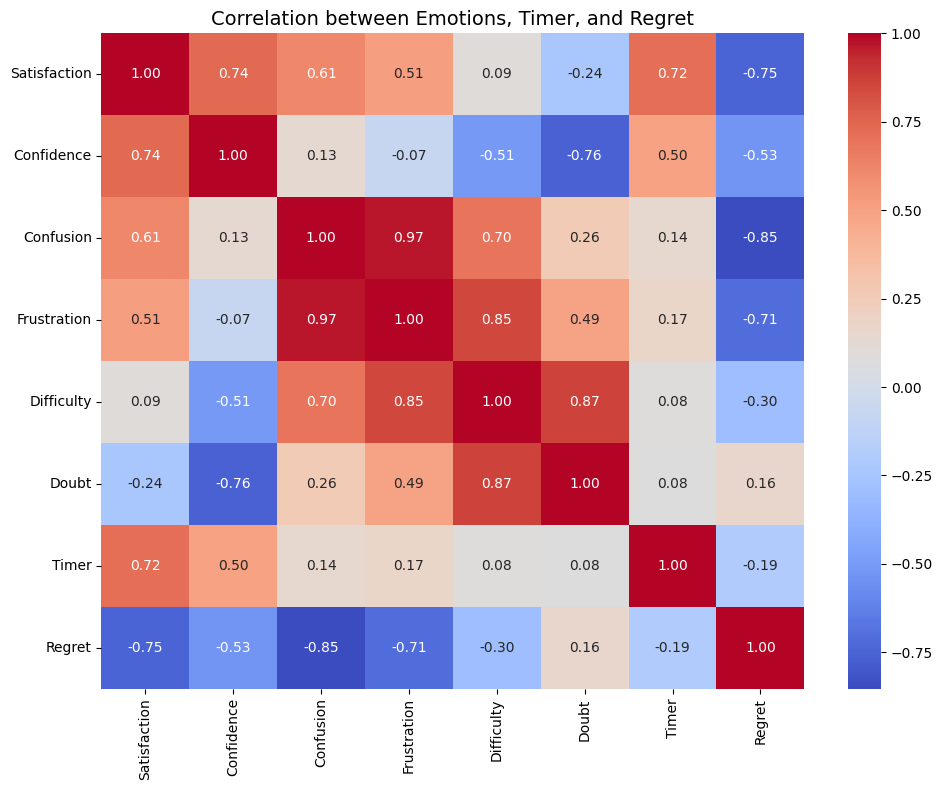

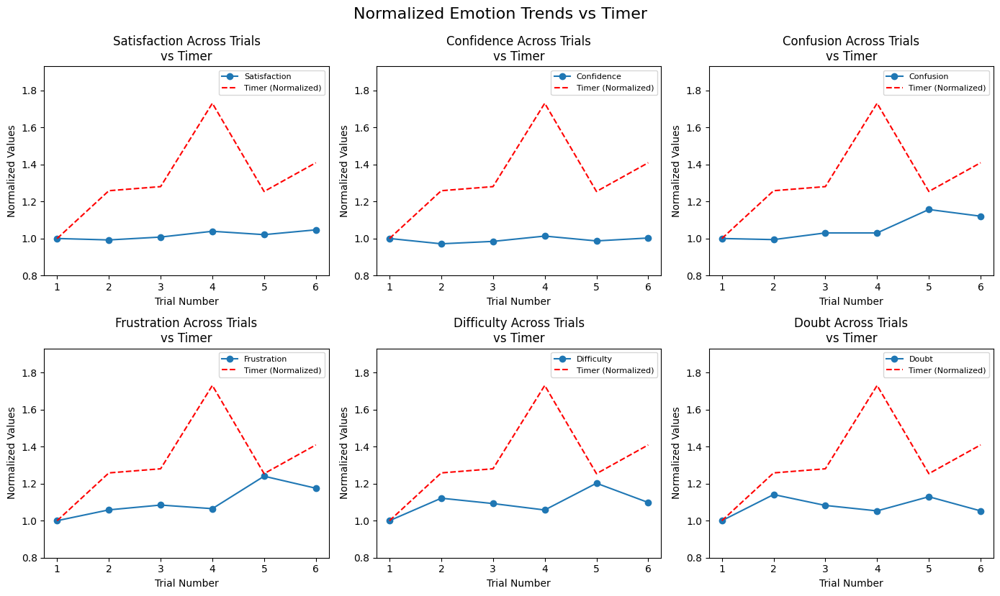

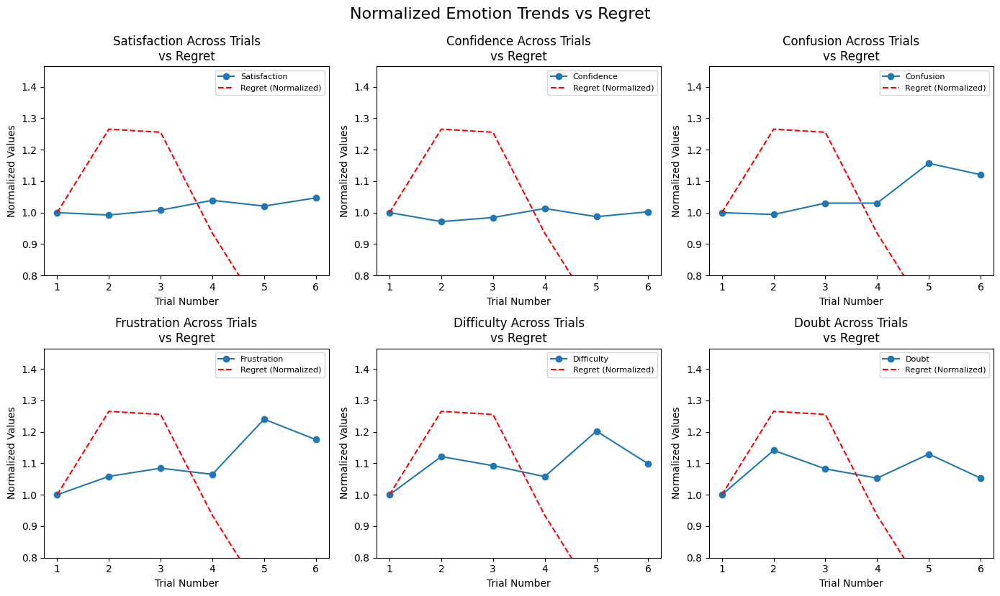


Regression Summary for Timer:
                            OLS Regression Results                            
Dep. Variable:                  Timer   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Tue, 08 Apr 2025   Prob (F-statistic):                nan
Time:                        06:23:20   Log-Likelihood:                 157.98
No. Observations:                   6   AIC:                            -304.0
Df Residuals:                       0   BIC:                            -305.2
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         -59

/usr/local/lib/python3.11/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 6 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "
/usr/local/lib/python3.11/dist-packages/statsmodels/regression/linear_model.py:1795: RuntimeWarning: divide by zero encountered in divide
  return 1 - (np.divide(self.nobs - self.k_constant, self.df_resid)
/usr/local/lib/python3.11/dist-packages/statsmodels/regression/linear_model.py:1795: RuntimeWarning: invalid value encountered in scalar multiply
  return 1 - (np.divide(self.nobs - self.k_constant, self.df_resid)
/usr/local/lib/python3.11/dist-packages/statsmodels/regression/linear_model.py:1717: RuntimeWarning: divide by zero encountered in scalar divide
  return np.dot(wresid, wresid) / self.df_resid
/usr/local/lib/python3.11/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

# --- Load your CSV file ---
df = pd.read_csv('/content/Updated_Choice_Overload.csv')  # Update path as needed

# --- Define emotional metric columns (from Laptop task) ---
emotions = {
    "Satisfaction": [f'em_co_lp_{i}_survey_1' for i in range(1, 7)],
    "Confidence": [f'em_co_lp_{i}_survey_2' for i in range(1, 7)],
    "Confusion": [f'em_co_lp_{i}_survey_3' for i in range(1, 7)],
    "Frustration": [f'em_co_lp_{i}_survey_4' for i in range(1, 7)],
    "Difficulty": [f'em_co_lp_{i}_survey_5' for i in range(1, 7)],
    "Doubt": [f'em_co_lp_{i}_survey_6' for i in range(1, 7)],
    "Timer": [f'em_co_lp_{i}_timer' for i in range(1, 7)],
    "Regret": [f'em_co_lp_{i}_regret' for i in range(1, 7)]
}

# --- Create trial-wise aggregated DataFrame ---
trial_data = []
for i in range(6):
    trial_dict = {"Trial": f"T{i+1}", "Trial_Number": i + 1}
    for metric, cols in emotions.items():
        trial_dict[metric] = df[cols[i]].mean(skipna=True)
    trial_data.append(trial_dict)

merged_df = pd.DataFrame(trial_data)

# --- Correlation Matrix ---
corr = merged_df.drop(columns=['Trial', 'Trial_Number']).corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation between Emotions, Timer, and Regret", fontsize=14)
plt.tight_layout()
plt.show()

# --- Normalized Emotion vs Timer ---
plt.figure(figsize=(14, 8))
for i, predictor in enumerate(["Satisfaction", "Confidence", "Confusion", "Frustration", "Difficulty", "Doubt"]):
    plt.subplot(2, 3, i + 1)

    x = merged_df["Trial_Number"]

    # Normalize emotion values
    y_emotion = merged_df[predictor]
    y_emotion_norm = y_emotion / y_emotion.iloc[0]
    plt.plot(x, y_emotion_norm, marker='o', label=predictor)

    # Normalize Timer
    y_outcome = merged_df["Timer"]
    y_outcome_norm = y_outcome / y_outcome.iloc[0]
    plt.plot(x, y_outcome_norm, 'r--', label='Timer (Normalized)')

    plt.title(f"{predictor} Across Trials\nvs Timer")
    plt.xlabel("Trial Number")
    plt.ylabel("Normalized Values")
    plt.ylim(0.8, max(y_emotion_norm.max(), y_outcome_norm.max()) + 0.2)
    plt.legend(fontsize=8)

plt.tight_layout()
plt.suptitle("Normalized Emotion Trends vs Timer", y=1.03, fontsize=16)
plt.show()

# --- Normalized Emotion vs Regret ---
plt.figure(figsize=(14, 8))
for i, predictor in enumerate(["Satisfaction", "Confidence", "Confusion", "Frustration", "Difficulty", "Doubt"]):
    plt.subplot(2, 3, i + 1)

    x = merged_df["Trial_Number"]

    # Normalize emotion values
    y_emotion = merged_df[predictor]
    y_emotion_norm = y_emotion / y_emotion.iloc[0]
    plt.plot(x, y_emotion_norm, marker='o', label=predictor)

    # Normalize Regret
    y_outcome = merged_df["Regret"]
    y_outcome_norm = y_outcome / y_outcome.iloc[0]
    plt.plot(x, y_outcome_norm, 'r--', label='Regret (Normalized)')

    plt.title(f"{predictor} Across Trials\nvs Regret")
    plt.xlabel("Trial Number")
    plt.ylabel("Normalized Values")
    plt.ylim(0.8, max(y_emotion_norm.max(), y_outcome_norm.max()) + 0.2)
    plt.legend(fontsize=8)

plt.tight_layout()
plt.suptitle("Normalized Emotion Trends vs Regret", y=1.03, fontsize=16)
plt.show()

# --- Linear Regression Summary ---
def run_regression(outcome):
    X = merged_df[["Satisfaction", "Confidence", "Confusion", "Frustration", "Difficulty", "Doubt"]]
    y = merged_df[outcome]
    X = sm.add_constant(X)  # add intercept
    model = sm.OLS(y, X).fit()
    print(f"\nRegression Summary for {outcome}:")
    print(model.summary())

run_regression("Timer")
run_regression("Regret")

# **Column Add criteria**

In [ ]:
file_path = '/content/Choice_Overload.csv'
df = pd.read_csv(file_path)

file_exfiltration_trials = ['ci_co_fl_1', 'ci_co_fl_2', 'ci_co_fl_3', 'ci_co_fl_4', 'ci_co_fl_5', 'ci_co_fl_6']
laptop_purchasing_trials = ['em_co_lp_1', 'em_co_lp_2', 'em_co_lp_3', 'em_co_lp_4', 'em_co_lp_5', 'em_co_lp_6']
nmap_trials = ['ci_co_nmap_1', 'ci_co_nmap_2', 'ci_co_nmap_3', 'ci_co_nmap_4', 'ci_co_nmap_5', 'ci_co_nmap_6']

# Function to calculate score and regret columns for a trial
def add_score_and_regret_columns(df, column_name, trial_scores):
    score_column = f"{column_name}_score"
    regret_column = f"{column_name}_regret"

    # Map file names to their scores
    df[score_column] = df[column_name].map(trial_scores).fillna(0)

    # Calculate regret (difference from the max score in the trial)
    max_score = max(trial_scores.values()) if trial_scores else 0
    df[regret_column] = df[score_column].apply(lambda x: max_score - x)

# Add score and regret columns for all trials
all_trials = {
    'File Exfiltration': (file_exfiltration_trials, file_exfiltration_scores),
    'Laptop Purchasing': (laptop_purchasing_trials, laptop_purchasing_scores),
    'NMAP': (nmap_trials, nmap_scores),
}

# Iterate over tasks, trials, and score dictionaries to add columns
for task_name, (trial_columns, trial_scores) in all_trials.items():
    for i, column_name in enumerate(trial_columns):
        trial_name = f"Trial {i + 1}"
        if trial_name in trial_scores:
            add_score_and_regret_columns(df, column_name, trial_scores[trial_name])

# Reorder columns to maintain the desired serial order
columns_ordered = []
for column in df.columns:
    if "_score" in column or "_regret" in column:
        continue
    columns_ordered.append(column)
    score_col = f"{column}_score"
    regret_col = f"{column}_regret"
    if score_col in df.columns:
        columns_ordered.extend([score_col, regret_col])

# Reorder the DataFrame columns
df = df[columns_ordered]

# Print the updated DataFrame columns to confirm the order
print(df.columns)

Index(['response_id', 'response_status', 'ip', 'survey_completion_time',
       'ProlificID', 'prolific_q2', 'prolific_q3', 'prolific_q4',
       'prolific_timer', 'consent_q1',
       ...
       'Courses_Coded', 'HourSecurity_Coded', 'HoursComputer_Coded',
       'TimesSecurity_Coded', 'ComputerProgramming_Coded',
       'NetworkTools_Coded', 'TechniquesExperience_Coded', 'Languages_Coded',
       'IntrusionDetection_Coded', 'EthicalPenetration_Coded'],
      dtype='object', length=276)


In [ ]:
# Specify the output file path
output_file_path = '/content/Updated_Choice_Overload.csv'

# Export the DataFrame to a CSV file
df.to_csv(output_file_path, index=False)

print(f"File exported successfully to {output_file_path}")

File exported successfully to /content/Updated_Choice_Overload.csv


In [ ]:
import pandas as pd

file_path1 = '/content/Choice_Overload.csv'
file_path2 = '/content/Updated_Choice_Overload.csv'

df1 = pd.read_csv(file_path1)
df2 = pd.read_csv(file_path2)

num_columns_df1 = df1.shape[1]
num_columns_df2 = df2.shape[1]

print(f"The first dataset has {num_columns_df1} columns.")
print(f"The second dataset has {num_columns_df2} columns.")

The first dataset has 240 columns.
The second dataset has 276 columns.


# **Choice Ranking**

## **Top 10 Choices selected by the Participant**

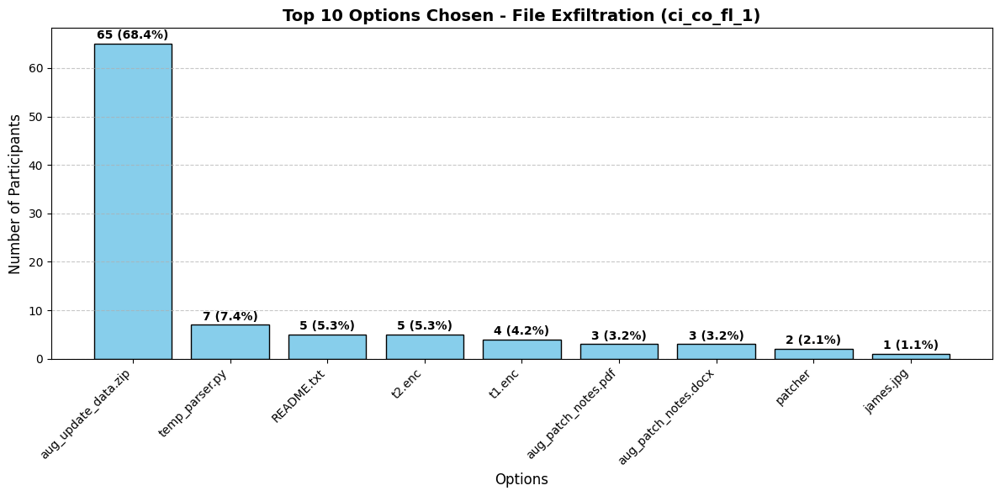

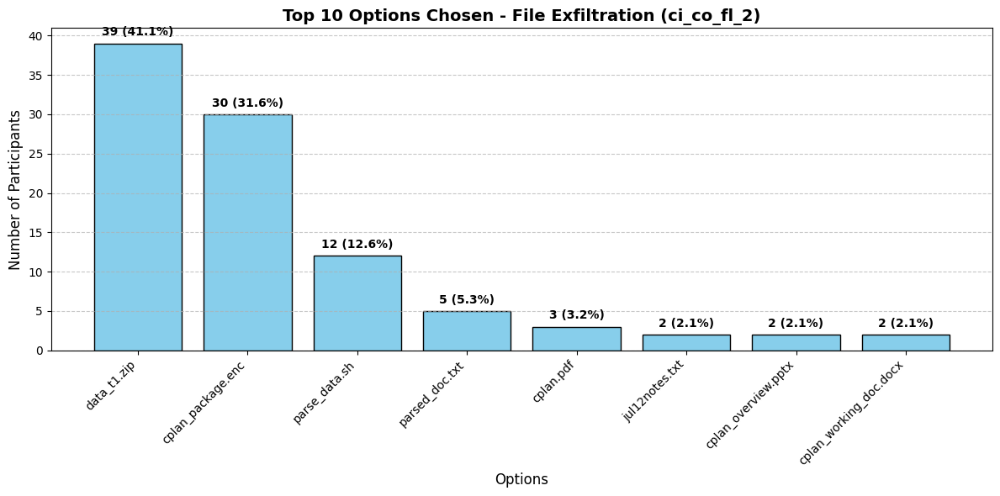

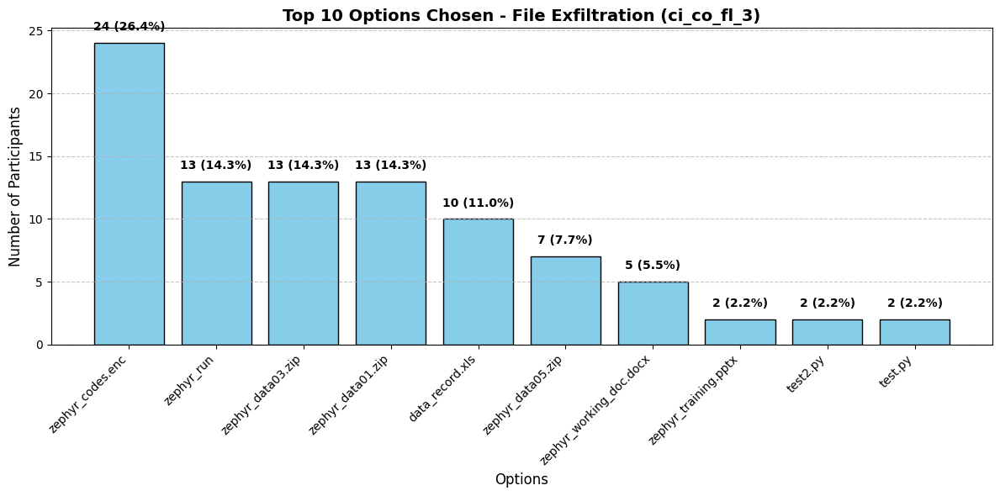

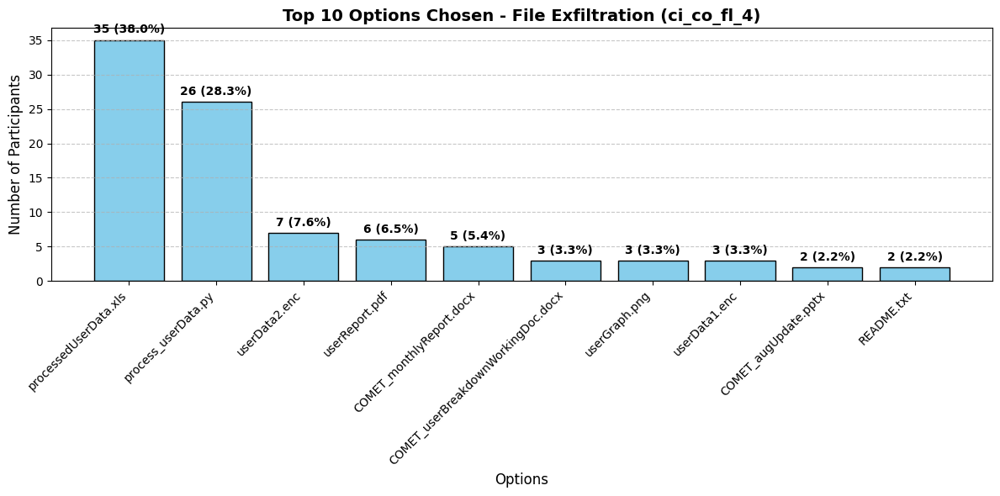

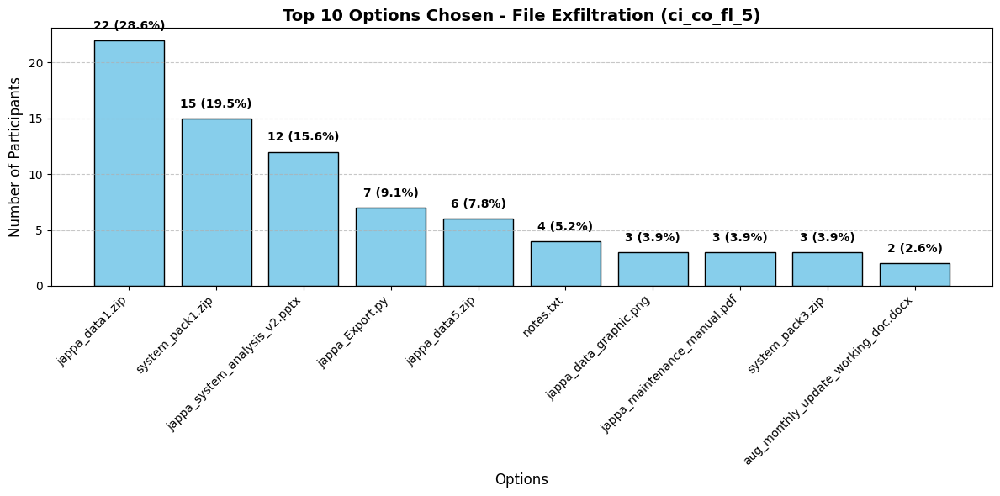

...

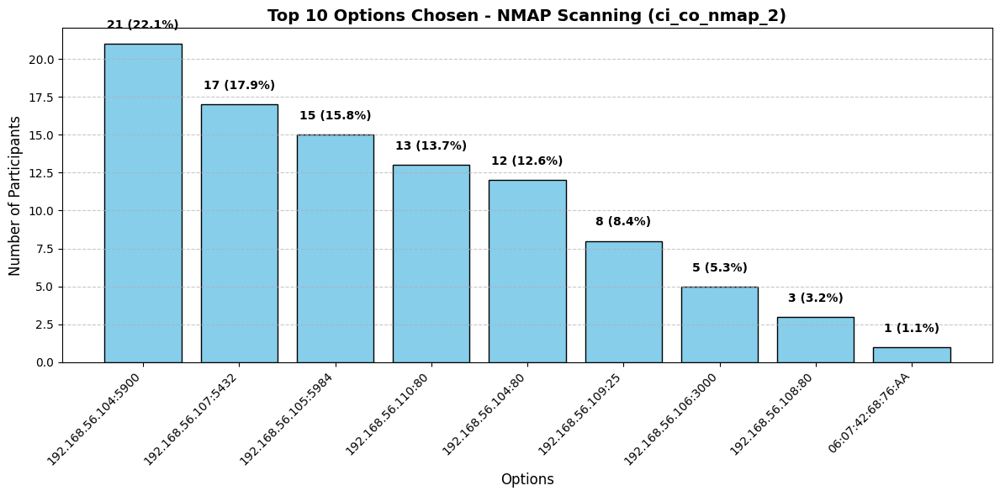

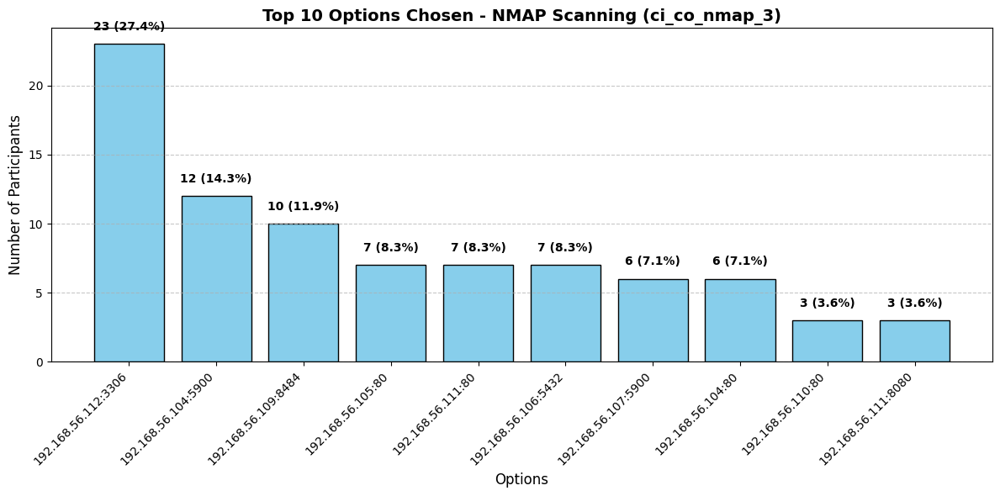

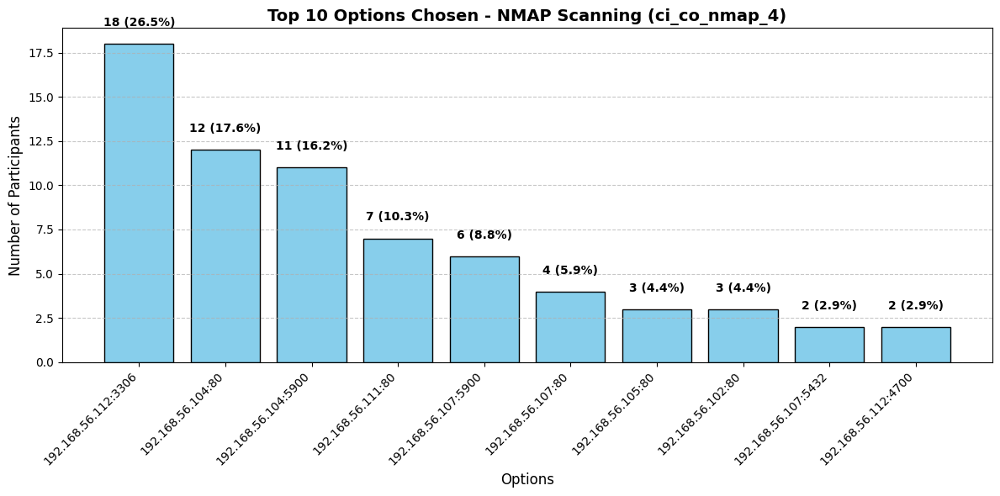

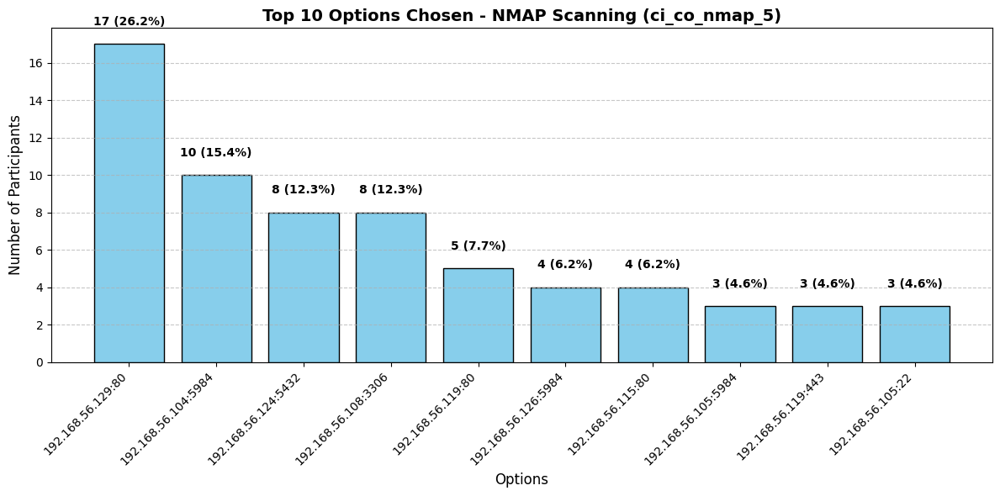

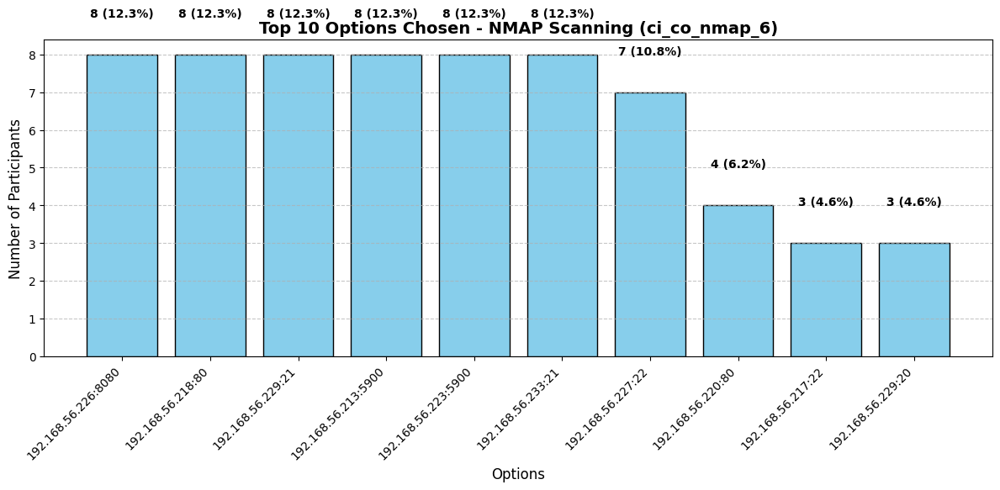

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load dataset
file_path = "/content/Updated_Choice_Overload.csv"
df = pd.read_csv(file_path)

# Fix column names (remove spaces)
df.columns = df.columns.str.strip()

# Define trial columns for all 18 trials
trial_columns = {
    "File Exfiltration": [f"ci_co_fl_{i}" for i in range(1, 7)],
    "Laptop Purchasing": [f"em_co_lp_{i}" for i in range(1, 7)],
    "NMAP Scanning": [f"ci_co_nmap_{i}" for i in range(1, 7)]
}

# Function to get top 10 chosen options for a specific trial
def get_top_options(df, trial_column):
    """Aggregate option counts for a trial and return the top 10 options."""
    option_counts = df[trial_column].value_counts()
    option_counts = option_counts.sort_values(ascending=False).head(10)  # Get top 10 options
    total_participants = option_counts.sum()  # Total selections in this trial
    return option_counts, total_participants

# Function to plot histogram for a single trial
def plot_histogram(option_counts, total_participants, task_name, trial_name):
    """Plot a histogram for the most chosen options in a single trial."""
    options = option_counts.index.astype(str)  # Convert option names to string
    counts = option_counts.values
    percentages = (counts / total_participants) * 100  # Calculate percentage

    plt.figure(figsize=(12, 6))
    bars = plt.bar(options, counts, color='skyblue', edgecolor='black')

    # Add labels above bars
    for bar, count, percentage in zip(bars, counts, percentages):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1,
                 f"{count} ({percentage:.1f}%)", ha='center', fontsize=10, fontweight='bold')

    # Customize plot
    plt.title(f"Top 10 Options Chosen - {task_name} ({trial_name})", fontsize=14, fontweight='bold')
    plt.xlabel("Options", fontsize=12)
    plt.ylabel("Number of Participants", fontsize=12)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid lines on Y-axis only
    plt.tight_layout()
    plt.show()

# Generate histograms for each individual trial (Total: 18 graphs)
for task_name, trials in trial_columns.items():
    for trial in trials:
        option_counts, total_participants = get_top_options(df, trial)
        plot_histogram(option_counts, total_participants, task_name, trial)

##**Participants Choosing Highest Score Options Across Trials**



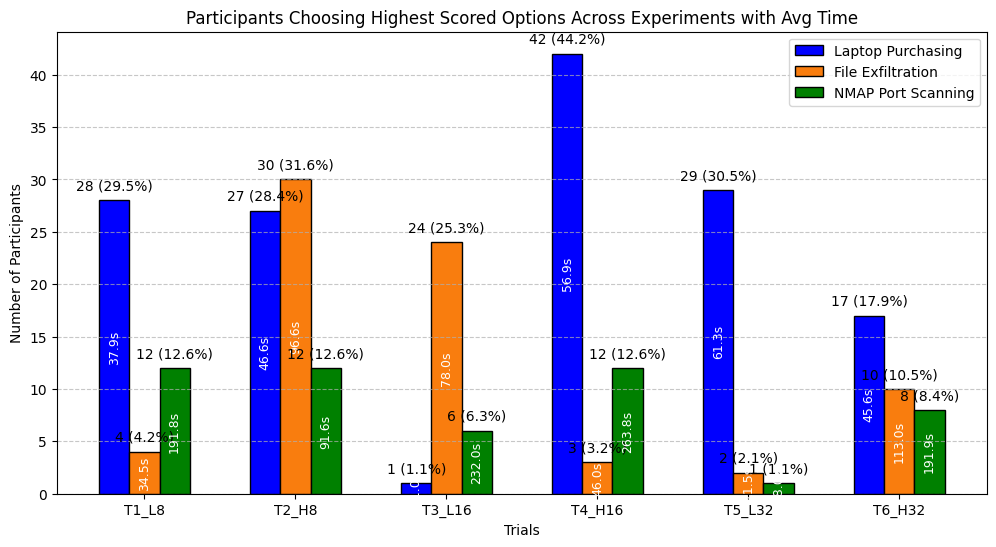

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Load dataset
file_path = "/content/Choice_Overload.csv"
df = pd.read_csv(file_path)

# Fix column names (remove spaces)
df.columns = df.columns.str.strip()

# Define trial columns for all three tasks
trials_dict = {
    "File Exfiltration": {
        "trials": [f"ci_co_fl_{i}" for i in range(1, 7)],
        "timers": [f"ci_co_fl_{i}_timer" for i in range(1, 7)]
    },
    "Laptop Purchasing": {
        "trials": [f"em_co_lp_{i}" for i in range(1, 7)],
        "timers": [f"em_co_lp_{i}_timer" for i in range(1, 7)]
    },
    "NMAP Scanning": {
        "trials": [f"ci_co_nmap_{i}" for i in range(1, 7)],
        "timers": [f"ci_co_nmap_{i}_timer" for i in range(1, 7)]
    }
}

# Initialize participant counts and average times
file_exfiltration_counts, file_exfiltration_avg_time = [], []
laptop_purchasing_counts, laptop_purchasing_avg_time = [], []
nmap_counts, nmap_avg_time = [], []

total_participants = len(df)

# Function to find highest-scored options per trial
def find_highest_scored_option(scores_dict, trial):
    """Finds the highest scored option for a given trial from the scores dictionary."""
    if trial in scores_dict:
        return max(scores_dict[trial], key=scores_dict[trial].get)  # Option with the highest score
    return None  # If trial not found, return None

# Compute participant counts and average times
for i, trial in enumerate(trials_dict["File Exfiltration"]["trials"]):
    highest_option = find_highest_scored_option(file_exfiltration_scores, f"Trial {i+1}")
    if highest_option:
        selections = df[trial] == highest_option
        count = selections.sum()
        avg_time = df.loc[selections, trials_dict["File Exfiltration"]["timers"][i]].mean() if count > 0 else 0
        file_exfiltration_counts.append(count)
        file_exfiltration_avg_time.append(avg_time)
    else:
        file_exfiltration_counts.append(0)
        file_exfiltration_avg_time.append(0)

for i, trial in enumerate(trials_dict["Laptop Purchasing"]["trials"]):
    highest_option = find_highest_scored_option(laptop_purchasing_scores, f"Trial {i+1}")
    if highest_option:
        selections = df[trial] == highest_option
        count = selections.sum()
        avg_time = df.loc[selections, trials_dict["Laptop Purchasing"]["timers"][i]].mean() if count > 0 else 0
        laptop_purchasing_counts.append(count)
        laptop_purchasing_avg_time.append(avg_time)
    else:
        laptop_purchasing_counts.append(0)
        laptop_purchasing_avg_time.append(0)

for i, trial in enumerate(trials_dict["NMAP Scanning"]["trials"]):
    highest_option = find_highest_scored_option(nmap_scores, f"Trial {i+1}")
    if highest_option:
        selections = df[trial] == highest_option
        count = selections.sum()
        avg_time = df.loc[selections, trials_dict["NMAP Scanning"]["timers"][i]].mean() if count > 0 else 0
        nmap_counts.append(count)
        nmap_avg_time.append(avg_time)
    else:
        nmap_counts.append(0)
        nmap_avg_time.append(0)

# Define trial labels
trials = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']

# Set color scheme
task_colors = ['blue', '#f97d0e', 'green']

# Set bar width
bar_width = 0.2
x = np.arange(len(trials))

# Plot the bar chart (WITHOUT error bars)
fig, ax = plt.subplots(figsize=(12, 6))

bars1 = ax.bar(x - bar_width, laptop_purchasing_counts, width=bar_width, label="Laptop Purchasing", color=task_colors[0], edgecolor='black')
bars2 = ax.bar(x, file_exfiltration_counts, width=bar_width, label="File Exfiltration", color=task_colors[1], edgecolor='black')
bars3 = ax.bar(x + bar_width, nmap_counts, width=bar_width, label="NMAP Port Scanning", color=task_colors[2], edgecolor='black')

# Add labels on bars (count and percentage)
for bars, counts, avg_times in zip(
    [bars1, bars2, bars3],
    [laptop_purchasing_counts, file_exfiltration_counts, nmap_counts],
    [laptop_purchasing_avg_time, file_exfiltration_avg_time, nmap_avg_time]
):
    for bar, count, avg_time in zip(bars, counts, avg_times):
        percentage = (count / total_participants) * 100 if total_participants > 0 else 0
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1, f"{count} ({percentage:.1f}%)",
                ha='center', fontsize=10)

        # Add average time inside the bars vertically
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f"{avg_time:.1f}s",
                ha='center', va='center', fontsize=9, color='white', rotation=90)  # Non-bold

# Formatting the chart
ax.set_xlabel("Trials")
ax.set_ylabel("Number of Participants")
ax.set_title("Participants Choosing Highest Scored Options Across Experiments with Avg Time")
ax.set_xticks(x)
ax.set_xticklabels(trials)
ax.legend()
ax.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()

##**Participants Choosing Lowest Score Options Across Trials**


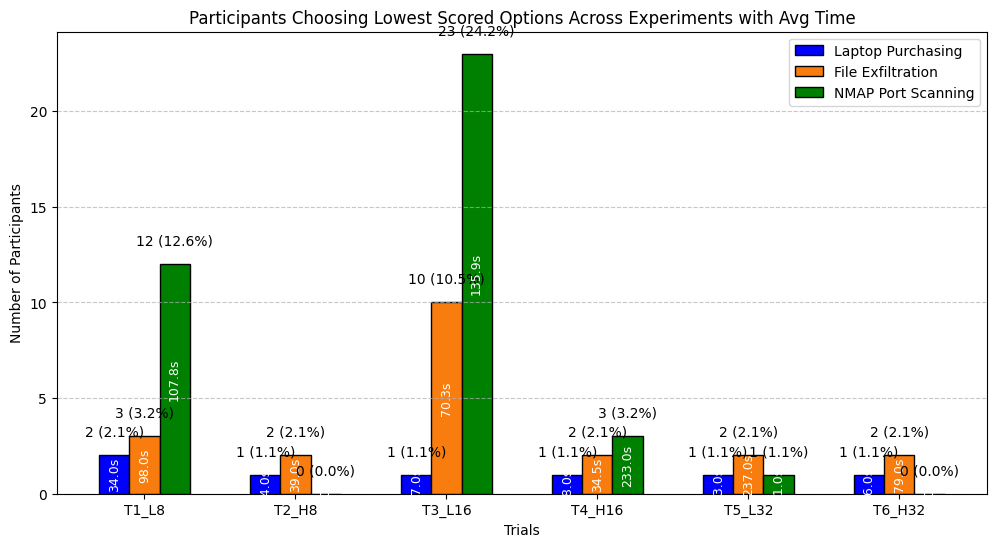

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Load dataset
file_path = "/content/Choice_Overload.csv"
df = pd.read_csv(file_path)

# Fix column names (remove spaces)
df.columns = df.columns.str.strip()

# Define trial columns for all three tasks
trials_dict = {
    "File Exfiltration": {
        "trials": [f"ci_co_fl_{i}" for i in range(1, 7)],
        "timers": [f"ci_co_fl_{i}_timer" for i in range(1, 7)]
    },
    "Laptop Purchasing": {
        "trials": [f"em_co_lp_{i}" for i in range(1, 7)],
        "timers": [f"em_co_lp_{i}_timer" for i in range(1, 7)]
    },
    "NMAP Scanning": {
        "trials": [f"ci_co_nmap_{i}" for i in range(1, 7)],
        "timers": [f"ci_co_nmap_{i}_timer" for i in range(1, 7)]
    }
}

# Initialize participant counts and average times
file_exfiltration_counts, file_exfiltration_avg_time = [], []
laptop_purchasing_counts, laptop_purchasing_avg_time = [], []
nmap_counts, nmap_avg_time = [], []

total_participants = len(df)

# Function to find lowest-scored options per trial
def find_lowest_scored_option(scores_dict, trial):
    """Finds the lowest scored option for a given trial from the scores dictionary."""
    if trial in scores_dict:
        return min(scores_dict[trial], key=scores_dict[trial].get)  # Option with the lowest score
    return None  # If trial not found, return None

# Compute participant counts and average times
for i, trial in enumerate(trials_dict["File Exfiltration"]["trials"]):
    lowest_option = find_lowest_scored_option(file_exfiltration_scores, f"Trial {i+1}")
    if lowest_option:
        selections = df[trial] == lowest_option
        count = selections.sum()
        avg_time = df.loc[selections, trials_dict["File Exfiltration"]["timers"][i]].mean() if count > 0 else 0
        file_exfiltration_counts.append(count)
        file_exfiltration_avg_time.append(avg_time)
    else:
        file_exfiltration_counts.append(0)
        file_exfiltration_avg_time.append(0)

for i, trial in enumerate(trials_dict["Laptop Purchasing"]["trials"]):
    lowest_option = find_lowest_scored_option(laptop_purchasing_scores, f"Trial {i+1}")
    if lowest_option:
        selections = df[trial] == lowest_option
        count = selections.sum()
        avg_time = df.loc[selections, trials_dict["Laptop Purchasing"]["timers"][i]].mean() if count > 0 else 0
        laptop_purchasing_counts.append(count)
        laptop_purchasing_avg_time.append(avg_time)
    else:
        laptop_purchasing_counts.append(0)
        laptop_purchasing_avg_time.append(0)

for i, trial in enumerate(trials_dict["NMAP Scanning"]["trials"]):
    lowest_option = find_lowest_scored_option(nmap_scores, f"Trial {i+1}")
    if lowest_option:
        selections = df[trial] == lowest_option
        count = selections.sum()
        avg_time = df.loc[selections, trials_dict["NMAP Scanning"]["timers"][i]].mean() if count > 0 else 0
        nmap_counts.append(count)
        nmap_avg_time.append(avg_time)
    else:
        nmap_counts.append(0)
        nmap_avg_time.append(0)

# Define trial labels
trials = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']

# Set color scheme
task_colors = ['blue', '#f97d0e', 'green']

# Set bar width
bar_width = 0.2
x = np.arange(len(trials))

# Plot the bar chart (WITHOUT error bars)
fig, ax = plt.subplots(figsize=(12, 6))

bars1 = ax.bar(x - bar_width, laptop_purchasing_counts, width=bar_width, label="Laptop Purchasing", color=task_colors[0], edgecolor='black')
bars2 = ax.bar(x, file_exfiltration_counts, width=bar_width, label="File Exfiltration", color=task_colors[1], edgecolor='black')
bars3 = ax.bar(x + bar_width, nmap_counts, width=bar_width, label="NMAP Port Scanning", color=task_colors[2], edgecolor='black')

# Add labels on bars (count and percentage)
for bars, counts, avg_times in zip(
    [bars1, bars2, bars3],
    [laptop_purchasing_counts, file_exfiltration_counts, nmap_counts],
    [laptop_purchasing_avg_time, file_exfiltration_avg_time, nmap_avg_time]
):
    for bar, count, avg_time in zip(bars, counts, avg_times):
        percentage = (count / total_participants) * 100 if total_participants > 0 else 0
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1, f"{count} ({percentage:.1f}%)",
                ha='center', fontsize=10)

        # Add average time inside the bars vertically
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f"{avg_time:.1f}s",
                ha='center', va='center', fontsize=9, color='white', rotation=90)  # Non-bold

# Formatting the chart
ax.set_xlabel("Trials")
ax.set_ylabel("Number of Participants")
ax.set_title("Participants Choosing Lowest Scored Options Across Experiments with Avg Time")
ax.set_xticks(x)
ax.set_xticklabels(trials)
ax.legend()
ax.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()

# **Extra**

In [ ]:
# Load the dataset
file_path = "/content/Updated_Choice_Overload.csv"  # Ensure this is the correct path
df = pd.read_csv(file_path)

# Identify File Exfiltration regret columns
file_exfiltration_regret_cols = [col for col in df.columns if "ci_co_fl_" in col and "_regret" in col]

# Compute the mean regret across all trials for File Exfiltration
df["Mean_File_Exfiltration_Regret"] = df[file_exfiltration_regret_cols].mean(axis=1)

# Compute the difference between each trial's regret and the control trial (T1)
for trial in range(2, 7):  # T2 to T6
    trial_col = f'ci_co_fl_{trial}_regret'
    df[f'Diff_T{trial}_vs_T1'] = df[trial_col] - df["ci_co_fl_1_regret"]

# Select relevant columns
display_cols = ["Mean_File_Exfiltration_Regret"] + [f'Diff_T{trial}_vs_T1' for trial in range(2, 7)]

# Print the dataframe as a string to display full rows
print(df[display_cols].to_string(index=False))

 Mean_File_Exfiltration_Regret  Diff_T2_vs_T1  Diff_T3_vs_T1  Diff_T4_vs_T1  Diff_T5_vs_T1  Diff_T6_vs_T1
                     17.833333            0.0           54.0           26.0           27.0            0.0
                     75.666667            0.0          -26.0            0.0            0.0            0.0
                     36.000000          -23.0           27.0            7.0           53.0          -10.0
                     13.666667          -23.0          -27.0            7.0          -27.0          -10.0
                     31.333333           28.0            0.0           80.0            0.0           80.0
                     50.833333          -23.0           53.0            7.0           53.0           53.0
                     44.000000           45.0          -27.0          -22.0           53.0           53.0
                     40.833333          -80.0          -80.0          -46.0            0.0          -29.0
                     27.000000          -23.0 

In [ ]:
# Compute the total number of participants
total_participants = len(df)

# Compute the average difference per participant for each trial
for trial in range(2, 7):
    diff_col = f'Diff_T{trial}_vs_T1'
    avg_col = f'Avg_Diff_T{trial}_vs_T1'
    df[avg_col] = df[diff_col] / total_participants

# Select relevant columns for display
average_display_cols = [f'Avg_Diff_T{trial}_vs_T1' for trial in range(2, 7)]

# Use display with df and selected columns
display(df[average_display_cols])

,Avg_Diff_T2_vs_T1,Avg_Diff_T3_vs_T1,Avg_Diff_T4_vs_T1,Avg_Diff_T5_vs_T1,Avg_Diff_T6_vs_T1
0,0.000000,0.568421,0.273684,0.284211,0.000000
1,0.000000,-0.273684,0.000000,0.000000,0.000000
2,-0.242105,0.284211,0.073684,0.557895,-0.105263
3,-0.242105,-0.284211,0.073684,-0.284211,-0.105263
4,0.294737,0.000000,0.842105,0.000000,0.842105
...,...,...,...,...,...
90,-0.242105,-0.284211,-0.231579,-0.284211,-0.021053
91,0.557895,0.557895,0.210526,0.557895,0.557895
92,0.757895,0.000000,0.357895,0.000000,0.178947
93,-0.242105,-0.284211,-0.284211,-0.284211,-0.105263


**File Trial 1 breakdown**

In [ ]:
import pandas as pd
import numpy as np

# Original table as a DataFrame
data = {
    "File Name": [
        "aug_patch_notes.docx",
        "aug_update_data.zip",
        "README.txt",
        "t1.enc",
        "t2.enc",
        "patcher",
        "temp_parser.py",
        "aug_patch_notes.pdf",
    ],
    "File Name Importance(*4)": [1, 1, 1, 2, 2, 2, 3, 1],
    "File Extension(*4)": [1, 3, 1, 3, 3, 2, 2, 1],
    "Total Points": [8, 16, 8, 20, 20, 16, 20, 8],
}

df = pd.DataFrame(data)

# Normalize Total Points to the range [20, 100]
min_points = 20
max_points = 100
normalized_total_points = (
    (df["Total Points"] - df["Total Points"].min()) / (df["Total Points"].max() - df["Total Points"].min())
) * (max_points - min_points) + min_points

df["Normalized Total Points"] = normalized_total_points

# Normalize `File Name Importance(*4)` and `File Extension(*4)` to match the normalized total points proportionally
df["Normalized File Name Importance"] = (
    df["File Name Importance(*4)"]
    / (df["File Name Importance(*4)"] + df["File Extension(*4)"])
    * df["Normalized Total Points"]
)
df["Normalized File Extension"] = (
    df["File Extension(*4)"]
    / (df["File Name Importance(*4)"] + df["File Extension(*4)"])
    * df["Normalized Total Points"]
)

# Display the normalized table to the user
df[
    [
        "File Name",
        "Normalized File Name Importance",
        "Normalized File Extension",
        "Normalized Total Points",
    ]
]

,File Name,Normalized File Name Importance,Normalized File Extension,Normalized Total Points
0,aug_patch_notes.docx,10.000000,10.000000,20.000000
1,aug_update_data.zip,18.333333,55.000000,73.333333
2,README.txt,10.000000,10.000000,20.000000
3,t1.enc,40.000000,60.000000,100.000000
4,t2.enc,40.000000,60.000000,100.000000
5,patcher,36.666667,36.666667,73.333333
6,temp_parser.py,60.000000,40.000000,100.000000
7,aug_patch_notes.pdf,10.000000,10.000000,20.000000


**Feature Weight Trial 1**

In [ ]:
# Calculate the weights for each feature
df["Weight File Name Importance"] = df["File Name Importance(*4)"] / (
    df["File Name Importance(*4)"] + df["File Extension(*4)"]
)
df["Weight File Extension"] = df["File Extension(*4)"] / (
    df["File Name Importance(*4)"] + df["File Extension(*4)"]
)

# Add weight columns to the display
weight_columns = [
    "File Name",
    "Weight File Name Importance",
    "Weight File Extension",
]

df[weight_columns]

,File Name,Weight File Name Importance,Weight File Extension
0,aug_patch_notes.docx,0.50,0.50
1,aug_update_data.zip,0.25,0.75
2,README.txt,0.50,0.50
3,t1.enc,0.40,0.60
4,t2.enc,0.40,0.60
5,patcher,0.50,0.50
6,temp_parser.py,0.60,0.40
7,aug_patch_notes.pdf,0.50,0.50


**File Trial 2 Breakdown**

In [ ]:
import pandas as pd
import numpy as np

# Original table as a DataFrame
data = {
    "File Name": [
        "cplan_overview.pptx",
        "cplan_package.enc",
        "cplan.pdf",
        "cplan_working_doc.docx",
        "data_t1.zip",
        "jul12notes.txt",
        "parse_data.sh",
        "parsed_doc.txt",
    ],
    "File Name Importance (x4)": [2, 3, 1, 2, 3, 1, 3, 1],
    "File Extension (x4)": [1, 3, 1, 1, 3, 1, 2, 1],
    "Ownership Base Points (x3)": [2, 2, 2, 2, 1, 1, 1, 1],
    "Timestamp Base Points (x2)": [1, 1, 1, 1, 2, 2, 2, 2],
    "Permissions Points (x1)": [2, 2, 2, 2, 2, 2, 3, 2],
    "Size Base Points (x1)": [3, 4, 2, 1, 4, 1, 1, 1],
    "Total Points": [25, 38, 20, 23, 37, 18, 31, 18],
}

df = pd.DataFrame(data)

# Normalize Total Points to the range [20, 100]
min_points = 20
max_points = 100
normalized_total_points = (
    (df["Total Points"] - df["Total Points"].min()) / (df["Total Points"].max() - df["Total Points"].min())
) * (max_points - min_points) + min_points
df["Normalized Total Points"] = normalized_total_points

# Combine all contributing points for proportional normalization
df["Total Base Points"] = (
    df["File Name Importance (x4)"]
    + df["File Extension (x4)"]
    + df["Ownership Base Points (x3)"]
    + df["Timestamp Base Points (x2)"]
    + df["Permissions Points (x1)"]
    + df["Size Base Points (x1)"]
)

# Normalize each point category proportionally to match the normalized total points
df["Normalized File Name Importance"] = (
    df["File Name Importance (x4)"] / df["Total Base Points"] * df["Normalized Total Points"]
)
df["Normalized File Extension"] = (
    df["File Extension (x4)"] / df["Total Base Points"] * df["Normalized Total Points"]
)
df["Normalized Ownership Points"] = (
    df["Ownership Base Points (x3)"] / df["Total Base Points"] * df["Normalized Total Points"]
)
df["Normalized Timestamp Points"] = (
    df["Timestamp Base Points (x2)"] / df["Total Base Points"] * df["Normalized Total Points"]
)
df["Normalized Permissions Points"] = (
    df["Permissions Points (x1)"] / df["Total Base Points"] * df["Normalized Total Points"]
)
df["Normalized Size Points"] = (
    df["Size Base Points (x1)"] / df["Total Base Points"] * df["Normalized Total Points"]
)

# Display the normalized table to the user
normalized_columns = [
    "File Name",
    "Normalized File Name Importance",
    "Normalized File Extension",
    "Normalized Ownership Points",
    "Normalized Timestamp Points",
    "Normalized Permissions Points",
    "Normalized Size Points",
    "Normalized Total Points",
]

# Display normalized table
df[normalized_columns]

,File Name,Normalized File Name Importance,Normalized File Extension,Normalized Ownership Points,Normalized Timestamp Points,Normalized Permissions Points,Normalized Size Points,Normalized Total Points
0,cplan_overview.pptx,8.727273,4.363636,8.727273,4.363636,8.727273,13.090909,48.0
1,cplan_package.enc,20.000000,20.000000,13.333333,6.666667,13.333333,26.666667,100.0
2,cplan.pdf,3.111111,3.111111,6.222222,3.111111,6.222222,6.222222,28.0
3,cplan_working_doc.docx,8.888889,4.444444,8.888889,4.444444,8.888889,4.444444,40.0
4,data_t1.zip,19.200000,19.200000,6.400000,12.800000,12.800000,25.600000,96.0
5,jul12notes.txt,2.500000,2.500000,2.500000,5.000000,5.000000,2.500000,20.0
6,parse_data.sh,18.000000,12.000000,6.000000,12.000000,18.000000,6.000000,72.0
7,parsed_doc.txt,2.500000,2.500000,2.500000,5.000000,5.000000,2.500000,20.0


**Feature weight of Trial 2**

In [ ]:
# Calculate weights for each feature category based on their contribution to Total Base Points
df["Weight File Name Importance"] = (
    df["File Name Importance (x4)"] / df["Total Base Points"]
)
df["Weight File Extension"] = (
    df["File Extension (x4)"] / df["Total Base Points"]
)
df["Weight Ownership Points"] = (
    df["Ownership Base Points (x3)"] / df["Total Base Points"]
)
df["Weight Timestamp Points"] = (
    df["Timestamp Base Points (x2)"] / df["Total Base Points"]
)
df["Weight Permissions Points"] = (
    df["Permissions Points (x1)"] / df["Total Base Points"]
)
df["Weight Size Points"] = (
    df["Size Base Points (x1)"] / df["Total Base Points"]
)

# Display the feature weights along with normalized values
feature_weights_columns = [
    "File Name",
    "Weight File Name Importance",
    "Weight File Extension",
    "Weight Ownership Points",
    "Weight Timestamp Points",
    "Weight Permissions Points",
    "Weight Size Points",
]

df[feature_weights_columns]

,File Name,Weight File Name Importance,Weight File Extension,Weight Ownership Points,Weight Timestamp Points,Weight Permissions Points,Weight Size Points
0,cplan_overview.pptx,0.181818,0.090909,0.181818,0.090909,0.181818,0.272727
1,cplan_package.enc,0.200000,0.200000,0.133333,0.066667,0.133333,0.266667
2,cplan.pdf,0.111111,0.111111,0.222222,0.111111,0.222222,0.222222
3,cplan_working_doc.docx,0.222222,0.111111,0.222222,0.111111,0.222222,0.111111
4,data_t1.zip,0.200000,0.200000,0.066667,0.133333,0.133333,0.266667
5,jul12notes.txt,0.125000,0.125000,0.125000,0.250000,0.250000,0.125000
6,parse_data.sh,0.250000,0.166667,0.083333,0.166667,0.250000,0.083333
7,parsed_doc.txt,0.125000,0.125000,0.125000,0.250000,0.250000,0.125000


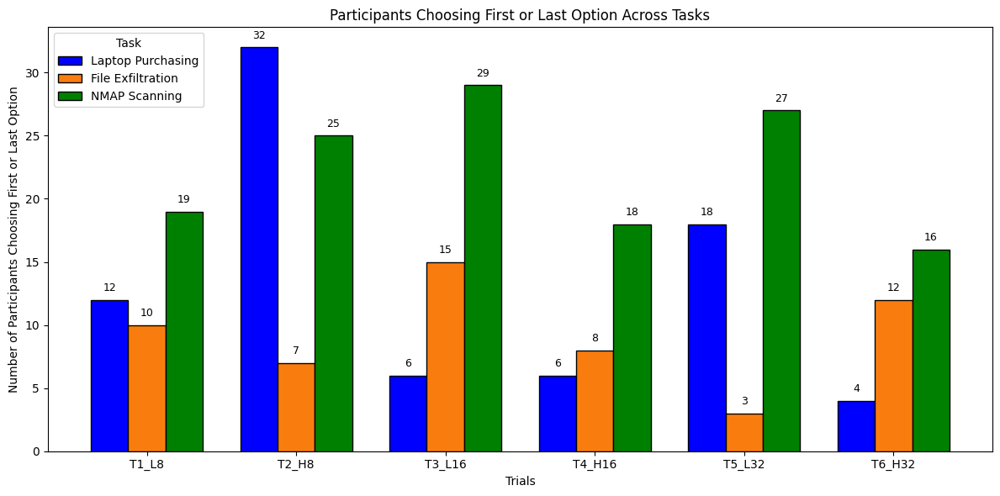

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

file_path = '/content/Choice_Overload.csv'
df = pd.read_csv(file_path)

nmap_scores = {
  'Trial 1': {
    '192.168.56.104:80': 80,
    '192.168.56.104:5900': 80,
    '192.168.56.105:5984': 30,
    '192.168.56.106:3000': 80,
    '192.168.56.107:5432': 50,
    '192.168.56.108:80': 80,
    '192.168.56.109:25': 30,
    '192.168.56.110:80': 80
},

  'Trial 2': {
    '192.168.56.104:80': 80,
    '192.168.56.104:5900': 80,
    '192.168.56.105:5984': 30,
    '192.168.56.106:3000': 80,
    '192.168.56.107:5432': 50,
    '192.168.56.108:80': 80,
    '192.168.56.109:25': 30,
    '192.168.56.110:80': 80

},

  'Trial 3': {
    '192.168.56.104:80': 80,
    '192.168.56.104:5900': 80,
    '192.168.56.105:80': 80,
    '192.168.56.105:443': 30,
    '192.168.56.105:8080': 80,
    '192.168.56.106:5432': 50,
    '192.168.56.107:80': 80,
    '192.168.56.107:5900': 80,
    '192.168.56.108:5432': 50,
    '192.168.56.109:8484': 30,
    '192.168.56.110:80': 80,
    '192.168.56.110:8080': 80,
    '192.168.56.111:80': 80,
    '192.168.56.111:443': 30,
    '192.168.56.111:8080': 80,
    '192.168.56.112:3306': 10
},

  'Trial 4': {
    '192.168.56.104:5484': 80,
    '192.168.56.104:5900': 80,
    '192.168.56.105:80': 80,
    '192.168.56.105:443': 30,
    '192.168.56.105:8080': 80,
    '192.168.56.106:5432': 50,
    '192.168.56.107:80': 80,
    '192.168.56.107:5900': 80,
    '192.168.56.108:5432': 50,
    '192.168.56.109:8484': 30,
    '192.168.56.110:80': 80,
    '192.168.56.110:8080': 80,
    '192.168.56.111:80': 80,
    '192.168.56.111:443': 30,
    '192.168.56.111:8080': 80,
    '192.168.56.112:3306': 10
},

  'Trial 5': {
    '192.168.56.104:5984': 30,
    '192.168.56.105:22': 30,
    '192.168.56.106:3000': 10,
    '192.168.56.107:22': 30,
    '192.168.56.108:3306': 30,
    '192.168.56.109:3306': 50,
    '192.168.56.110:22': 30,
    '192.168.56.111:3000': 30,
    '192.168.56.112:3000': 30,
    '192.168.56.113:8080': 80,
    '192.168.56.114:25': 30,
    '192.168.56.115:8080': 80,
    '192.168.56.115:80': 80,
    '192.168.56.115:443': 30,
    '192.168.56.116:22': 30,
    '192.168.56.117:3000': 10,
    '192.168.56.118:21': 80,
    '192.168.56.119:8080': 80,
    '192.168.56.119:80': 80,
    '192.168.56.119:443': 30,
    '192.168.56.120:7474': 80,
    '192.168.56.120:7687': 30,
    '192.168.56.121:7474': 80,
    '192.168.56.121:7687': 30,
    '192.168.56.122:25': 30,
    '192.168.56.123:25': 30,
    '192.168.56.124:5432': 50,
    '192.168.56.125:8080': 80,
    '192.168.56.126:5984': 30,
    '192.168.56.127:3000': 10,
    '192.168.56.128:8080': 80,
    '192.168.56.129:80': 80
},

  'Trial 6': {
    '192.168.56.213:5900': 80,
    '192.168.56.217:22': 30,
    '192.168.56.218:80': 80,
    '192.168.56.219:80': 80,
    '192.168.56.220:80': 80,
    '192.168.56.223:5900': 80,
    '192.168.56.226:8080': 80,
    '192.168.56.227:22': 30,
    '192.168.56.229:20': 80,
    '192.168.56.229:21': 80,
    '192.168.56.233:21': 80
}
}

# Trial column mappings
trial_columns = {
    'Laptop Purchasing': ['em_co_lp_1', 'em_co_lp_2', 'em_co_lp_3', 'em_co_lp_4', 'em_co_lp_5', 'em_co_lp_6'],
    'File Exfiltration': ['ci_co_fl_1', 'ci_co_fl_2', 'ci_co_fl_3', 'ci_co_fl_4', 'ci_co_fl_5', 'ci_co_fl_6'],
    'NMAP Scanning': ['ci_co_nmap_1', 'ci_co_nmap_2', 'ci_co_nmap_3', 'ci_co_nmap_4', 'ci_co_nmap_5', 'ci_co_nmap_6'],
}

# Task scores
task_scores_mapping = {
    'Laptop Purchasing': laptop_purchasing_scores,
    'File Exfiltration': file_exfiltration_scores,
    'NMAP Scanning': nmap_scores,
}

# Placeholder for results
task_results = {}

# Calculate participants choosing the first or last option for all tasks and trials
for task_name, columns in trial_columns.items():
    participants_choosing_first_or_last = []

    for i, trial_column in enumerate(columns):
        trial_key = f"Trial {i + 1}"
        trial_data_from_csv = df[trial_column].dropna()

        # Get first and last options
        trial_scores_data = task_scores_mapping[task_name][trial_key]
        first_option = list(trial_scores_data.keys())[0]
        last_option = list(trial_scores_data.keys())[-1]

        # Count participants choosing the first or last option
        num_first_or_last = trial_data_from_csv.isin([first_option, last_option]).sum()
        participants_choosing_first_or_last.append(num_first_or_last)

    task_results[task_name] = participants_choosing_first_or_last

# Visualization
trials = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']
colors = ['#0000ff', '#f97d0e', '#008000']  # Colors for Laptop, File, and NMAP
plt.figure(figsize=(12, 6))
bar_width = 0.25
x = range(len(trials))

# Plot each task
for i, (task_name, values) in enumerate(task_results.items()):
    bar_positions = [p + i * bar_width for p in x]
    plt.bar(
        bar_positions,
        values,
        bar_width,
        label=task_name,
        color=colors[i],
        edgecolor='black'
    )

    # Add text annotations on top of bars
    for pos, value in zip(bar_positions, values):
        plt.text(
            pos,
            value + 0.5,
            f"{value}",
            ha='center',
            va='bottom',
            fontsize=9
        )

# Finalize plot
plt.xlabel('Trials')
plt.ylabel('Number of Participants Choosing First or Last Option')
plt.title('Participants Choosing First or Last Option Across Tasks')
plt.xticks([p + bar_width for p in x], trials)
plt.legend(title='Task', loc='upper left')
plt.tight_layout()
plt.show()

**File Trial 3 breakdown**

In [ ]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Original table data
data = {
    "File Name": [
        "data_record.xls", "monthly_increment_tracker.txt", "test2.py", "test.py",
        "transfer.txt", "zephyr_codes.enc", "zephyr_data01.zip", "zephyr_data02.zip",
        "zephyr_data03.zip", "zephyr_data04.zip", "zephyr_data05.zip",
        "zephyr_instructions.txt", "zephyr_manual.pdf", "zephyr_run",
        "zephyr_training.pptx", "zephyr_working_doc.docx"
    ],
    "File Name Importance(*4)": [1, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 3, 1, 1],
    "File Extension(*4)": [1, 1, 2, 2, 1, 3, 3, 3, 3, 3, 3, 1, 1, 2, 1, 1],
    "Total Points": [8, 12, 12, 12, 8, 20, 20, 20, 20, 20, 20, 12, 8, 20, 8, 8],
}

# Create DataFrame
df = pd.DataFrame(data)

# Combine columns to normalize total points based on sum of importance and extension
combined_values = df["File Name Importance(*4)"] + df["File Extension(*4)"]

# Normalize combined values to match the range of Total Points
scaler = MinMaxScaler(feature_range=(20, 100))
normalized_combined = scaler.fit_transform(combined_values.values.reshape(-1, 1))

# Normalize individual components proportionally
df["Normalized File Name Importance"] = (
    df["File Name Importance(*4)"] / combined_values * normalized_combined.flatten()
)
df["Normalized File Extension"] = (
    df["File Extension(*4)"] / combined_values * normalized_combined.flatten()
)
df["Normalized Total Points"] = df["Normalized File Name Importance"] + df["Normalized File Extension"]

df[
    [
        "File Name",
        "Normalized File Name Importance",
        "Normalized File Extension",
        "Normalized Total Points",
    ]
]

,File Name,Normalized File Name Importance,Normalized File Extension,Normalized Total Points
0,data_record.xls,10.000000,10.000000,20.000000
1,monthly_increment_tracker.txt,31.111111,15.555556,46.666667
2,test2.py,15.555556,31.111111,46.666667
3,test.py,15.555556,31.111111,46.666667
4,transfer.txt,10.000000,10.000000,20.000000
5,zephyr_codes.enc,40.000000,60.000000,100.000000
6,zephyr_data01.zip,40.000000,60.000000,100.000000
7,zephyr_data02.zip,40.000000,60.000000,100.000000
8,zephyr_data03.zip,40.000000,60.000000,100.000000
9,zephyr_data04.zip,40.000000,60.000000,100.000000


**Feature Weight Trial 3**

In [ ]:
# Calculate the weight for each feature based on the given data and structure
df["Weight File Name Importance"] = df["File Name Importance(*4)"] / combined_values
df["Weight File Extension"] = df["File Extension(*4)"] / combined_values

# Add feature weights to the display
feature_weights_columns = [
    "File Name",
    "Weight File Name Importance",
    "Weight File Extension",
]

# Summarize the feature weights and normalized values in text form
feature_weights_summary = df[feature_weights_columns].round(4)  # Rounding for better readability
feature_weights_summary

,File Name,Weight File Name Importance,Weight File Extension
0,data_record.xls,0.5000,0.5000
1,monthly_increment_tracker.txt,0.6667,0.3333
2,test2.py,0.3333,0.6667
3,test.py,0.3333,0.6667
4,transfer.txt,0.5000,0.5000
5,zephyr_codes.enc,0.4000,0.6000
6,zephyr_data01.zip,0.4000,0.6000
7,zephyr_data02.zip,0.4000,0.6000
8,zephyr_data03.zip,0.4000,0.6000
9,zephyr_data04.zip,0.4000,0.6000


**File Trial 4 Breakdown**

In [ ]:
import pandas as pd

# Original table as a DataFrame
data = {
    "File Name": [
        "COMET_augUpdate.pptx",
        "COMET_augUpdateWorkingDoc.docx",
        "COMET_bugResolution.pptx",
        "COMET_bugResolutionWorkingDoc.docx",
        "COMET_monthlyReport.docx",
        "COMET_userBreakdown.pptx",
        "processedUserData.docx",
        "process_userData.py",
        "README.txt",
        "userData1.enc",
        "userData2.enc",
        "userData3.enc",
        "userDataInstructionNotes.txt",
        "userGraph.png",
        "userReport.pdf",
        "COMET_userBreakdownWorkingDoc.docx",
    ],
    "File Name Importance (x4)": [2, 2, 2, 2, 2, 2, 2, 3, 1, 3, 3, 3, 2, 1, 1, 2],
    "File Extension (x4)": [1, 1, 1, 1, 1, 1, 1, 2, 1, 3, 3, 3, 1, 1, 1, 1],
    "Ownership Base Points (x3)": [2, 1, 2, 2, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    "Timestamp Base Points (x2)": [2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1],
    "Permissions Points (x1)": [2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2],
    "Size Base Points (x1)": [2, 2, 3, 1, 2, 2, 2, 1, 1, 4, 4, 4, 1, 1, 1, 1],
}

# Desired normalized total points for Trial 4
normalized_total_points_target = {
    "COMET_augUpdate.pptx": 74,
    "COMET_augUpdateWorkingDoc.docx": 53,
    "COMET_bugResolution.pptx": 70,
    "COMET_bugResolutionWorkingDoc.docx": 62,
    "COMET_monthlyReport.docx": 66,
    "COMET_userBreakdown.pptx": 53,
    "processedUserData.docx": 66,
    "process_userData.py": 95,
    "README.txt": 20,
    "userData1.enc": 100,
    "userData2.enc": 100,
    "userData3.enc": 100,
    "userDataInstructionNotes.txt": 45,
    "userGraph.png": 20,
    "userReport.pdf": 20,
    "COMET_userBreakdownWorkingDoc.docx": 53,
}

# Create DataFrame
df = pd.DataFrame(data)

# Assign the desired normalized total points
df["Normalized Total Points"] = df["File Name"].map(normalized_total_points_target)

# Combine all contributing points for proportional normalization
df["Total Base Points"] = (
    df["File Name Importance (x4)"]
    + df["File Extension (x4)"]
    + df["Ownership Base Points (x3)"]
    + df["Timestamp Base Points (x2)"]
    + df["Permissions Points (x1)"]
    + df["Size Base Points (x1)"]
)

# Normalize each point category proportionally to match the normalized total points
df["Normalized File Name Importance"] = (
    df["File Name Importance (x4)"] / df["Total Base Points"] * df["Normalized Total Points"]
)
df["Normalized File Extension"] = (
    df["File Extension (x4)"] / df["Total Base Points"] * df["Normalized Total Points"]
)
df["Normalized Ownership Points"] = (
    df["Ownership Base Points (x3)"] / df["Total Base Points"] * df["Normalized Total Points"]
)
df["Normalized Timestamp Points"] = (
    df["Timestamp Base Points (x2)"] / df["Total Base Points"] * df["Normalized Total Points"]
)
df["Normalized Permissions Points"] = (
    df["Permissions Points (x1)"] / df["Total Base Points"] * df["Normalized Total Points"]
)
df["Normalized Size Points"] = (
    df["Size Base Points (x1)"] / df["Total Base Points"] * df["Normalized Total Points"]
)

# Select relevant columns for display
normalized_columns = [
    "File Name",
    "Normalized File Name Importance",
    "Normalized File Extension",
    "Normalized Ownership Points",
    "Normalized Timestamp Points",
    "Normalized Permissions Points",
    "Normalized Size Points",
    "Normalized Total Points",
]

# Display normalized DataFrame
df[normalized_columns]

,File Name,Normalized File Name Importance,Normalized File Extension,Normalized Ownership Points,Normalized Timestamp Points,Normalized Permissions Points,Normalized Size Points,Normalized Total Points
0,COMET_augUpdate.pptx,13.454545,6.727273,13.454545,13.454545,13.454545,13.454545,74
1,COMET_augUpdateWorkingDoc.docx,11.777778,5.888889,5.888889,5.888889,11.777778,11.777778,53
2,COMET_bugResolution.pptx,12.727273,6.363636,12.727273,6.363636,12.727273,19.090909,70
3,COMET_bugResolutionWorkingDoc.docx,13.777778,6.888889,13.777778,6.888889,13.777778,6.888889,62
4,COMET_monthlyReport.docx,13.200000,6.600000,13.200000,6.600000,13.200000,13.200000,66
5,COMET_userBreakdown.pptx,11.777778,5.888889,5.888889,5.888889,11.777778,11.777778,53
6,processedUserData.docx,13.200000,6.600000,13.200000,6.600000,13.200000,13.200000,66
7,process_userData.py,23.750000,15.833333,7.916667,15.833333,23.750000,7.916667,95
8,README.txt,2.857143,2.857143,2.857143,2.857143,5.714286,2.857143,20
9,userData1.enc,21.428571,21.428571,7.142857,7.142857,14.285714,28.571429,100


**Feature Weight for Trial 4**

In [ ]:
# Calculate weights for each feature category based on their contribution to Total Base Points
df["Weight File Name Importance"] = (
    df["File Name Importance (x4)"] / df["Total Base Points"]
)
df["Weight File Extension"] = (
    df["File Extension (x4)"] / df["Total Base Points"]
)
df["Weight Ownership Points"] = (
    df["Ownership Base Points (x3)"] / df["Total Base Points"]
)
df["Weight Timestamp Points"] = (
    df["Timestamp Base Points (x2)"] / df["Total Base Points"]
)
df["Weight Permissions Points"] = (
    df["Permissions Points (x1)"] / df["Total Base Points"]
)
df["Weight Size Points"] = (
    df["Size Base Points (x1)"] / df["Total Base Points"]
)

# Display the feature weights along with normalized values
feature_weights_columns = [
    "File Name",
    "Weight File Name Importance",
    "Weight File Extension",
    "Weight Ownership Points",
    "Weight Timestamp Points",
    "Weight Permissions Points",
    "Weight Size Points",
]

df[feature_weights_columns]

,File Name,Weight File Name Importance,Weight File Extension,Weight Ownership Points,Weight Timestamp Points,Weight Permissions Points,Weight Size Points
0,COMET_augUpdate.pptx,0.181818,0.090909,0.181818,0.181818,0.181818,0.181818
1,COMET_augUpdateWorkingDoc.docx,0.222222,0.111111,0.111111,0.111111,0.222222,0.222222
2,COMET_bugResolution.pptx,0.181818,0.090909,0.181818,0.090909,0.181818,0.272727
3,COMET_bugResolutionWorkingDoc.docx,0.222222,0.111111,0.222222,0.111111,0.222222,0.111111
4,COMET_monthlyReport.docx,0.200000,0.100000,0.200000,0.100000,0.200000,0.200000
5,COMET_userBreakdown.pptx,0.222222,0.111111,0.111111,0.111111,0.222222,0.222222
6,processedUserData.docx,0.200000,0.100000,0.200000,0.100000,0.200000,0.200000
7,process_userData.py,0.250000,0.166667,0.083333,0.166667,0.250000,0.083333
8,README.txt,0.142857,0.142857,0.142857,0.142857,0.285714,0.142857
9,userData1.enc,0.214286,0.214286,0.071429,0.071429,0.142857,0.285714


**File Trial 5 breakdown**

In [ ]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Original data
data = {
    "File Name": [
        "aug_monthly_update_working_doc.docx", "data_overview.docx", "jappa_data1.zip",
        "jappa_data2.zip", "jappa_data3.zip", "jappa_data4.zip", "jappa_data5.zip",
        "jappa_data_graphic.png", "jappa_Export.py", "jappa_format_example.json",
        "jappa_maintenance_manual.pdf", "jappa_mapper.py", "jappa_overview.pptx",
        "jappa_parsed_1.xls", "jappa_parsed_2.xls", "jappa_system_analysis_v0.pptx",
        "jappa_system_analysis_v1.1.pptx", "jappa_system_analysis_v1.pptx",
        "jappa_system_analysis_v2.pptx", "jappa_template1.txt", "jappa_template2.txt",
        "jappa_template3.txt", "jappa_user_manual.pdf", "notes.txt",
        "system1_benchmark.json", "system2_benchmark.json", "system3_benchmark.json",
        "system_pack1.zip", "system_pack2.zip", "system_pack3.zip", "systems_graphic.png"
    ],
    "File Name Importance": [
        1, 1, 2, 2, 2, 2, 2, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1
    ],
    "File Extension": [
        1, 1, 3, 3, 3, 3, 3, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 3, 1
    ],
    "Total Points": [
        8, 8, 20, 20, 20, 20, 20, 8, 16, 8, 8, 16, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 20, 20, 20, 8
    ]
}

# Create DataFrame
df = pd.DataFrame(data)

# Combine File Name Importance and File Extension
combined_values = df["File Name Importance"] + df["File Extension"]

# Normalize combined values to match the range of Total Points
scaler = MinMaxScaler(feature_range=(20, 100))
normalized_combined = scaler.fit_transform(combined_values.values.reshape(-1, 1)).flatten()

# Normalize individual components proportionally
df["Normalized File Name Importance"] = (
    df["File Name Importance"] / combined_values * normalized_combined
).round(0)  # Round to avoid fractional results
df["Normalized File Extension"] = (
    df["File Extension"] / combined_values * normalized_combined
).round(0)  # Round to avoid fractional results
df["Normalized Total Points"] = (
    df["Normalized File Name Importance"] + df["Normalized File Extension"]
)

# Ensure Normalized Total Points match the original Total Points
df["Normalized Total Points"] = df["Normalized Total Points"].round(0).astype(int)

df[
    [
        "File Name",
        "Normalized File Name Importance",
        "Normalized File Extension",
        "Normalized Total Points",
    ]
]

,File Name,Normalized File Name Importance,Normalized File Extension,Normalized Total Points
0,aug_monthly_update_working_doc.docx,10.0,10.0,20
1,data_overview.docx,10.0,10.0,20
2,jappa_data1.zip,40.0,60.0,100
3,jappa_data2.zip,40.0,60.0,100
4,jappa_data3.zip,40.0,60.0,100
5,jappa_data4.zip,40.0,60.0,100
6,jappa_data5.zip,40.0,60.0,100
7,jappa_data_graphic.png,10.0,10.0,20
8,jappa_Export.py,37.0,37.0,74
9,jappa_format_example.json,10.0,10.0,20


**Feature Weight Trial 5**

In [ ]:
# Calculate the weight for each feature based on the given data and structure
df["Weight File Name Importance"] = df["File Name Importance"] / combined_values
df["Weight File Extension"] = df["File Extension"] / combined_values

# Add feature weights to the display
feature_weights_columns = [
    "File Name",
    "Weight File Name Importance",
    "Weight File Extension",
]

# Summarize the feature weights and normalized values in text form
feature_weights_summary = df[feature_weights_columns].round(4)  # Rounding for better readability
feature_weights_summary

,File Name,Weight File Name Importance,Weight File Extension
0,aug_monthly_update_working_doc.docx,0.5,0.5
1,data_overview.docx,0.5,0.5
2,jappa_data1.zip,0.4,0.6
3,jappa_data2.zip,0.4,0.6
4,jappa_data3.zip,0.4,0.6
5,jappa_data4.zip,0.4,0.6
6,jappa_data5.zip,0.4,0.6
7,jappa_data_graphic.png,0.5,0.5
8,jappa_Export.py,0.5,0.5
9,jappa_format_example.json,0.5,0.5


**File Trial 6 breakdown**

In [ ]:
import pandas as pd
import numpy as np

# Updated table as a DataFrame for the new dataset
data = {
    "File Name": [
        "core_data1.enc", "core_data2.enc", "cvv_report.pdf", "datadump01.zip",
        "datadump03.zip", "datadump_graph1.png", "datadump_graph2.png",
        "datadump_graph3.png", "data_parse.py", "process_1", "process_2",
        "README.txt", "generate_report.py", "vnr_report.pdf", "jul_report.pptx",
        "may_report.pptx", "jun_report.pptx", "jun_working_doc.docx",
        "may_working_doc.docx", "jul_working_doc.docx", "generate_png.py",
        "dump01_parsed.xls", "dump02_parsed.xls", "data_sort.py",
        "proceed_notes.txt", "proceed_notes.txt", "process_1", "process_2",
        "README.txt", "vnr_report.pdf"
    ],
    "File Name Importance": [3, 3, 2, 2, 2, 1, 1, 1, 3, 2, 2, 1, 3, 1, 2, 2, 2, 1, 1, 1, 3, 1, 1, 3, 1, 1, 2, 2, 1, 1],
    "File Extension": [3, 3, 1, 3, 3, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1],
    "Ownership Points": [1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 5, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 5, 1, 1],
    "Timestamp Points": [1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1],
    "Permissions Points": [2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 3, 2, 2, 2, 2, 2, 2],
    "Size Points": [4, 4, 4, 4, 4, 2, 2, 2, 1, 1, 1, 1, 1, 1, 4, 4, 4, 3, 3, 3, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1],
    "Total Points": [
        35, 35, 23, 31, 31, 17, 17, 17, 29, 34, 34, 16, 29, 16, 23, 28, 23,
        18, 18, 18, 29, 17, 17, 29, 16, 16, 34, 34, 16, 16
    ],
}

df = pd.DataFrame(data)

# Normalize Total Points to the range [20, 100]
min_points = 20
max_points = 100
normalized_total_points = (
    (df["Total Points"] - df["Total Points"].min()) / (df["Total Points"].max() - df["Total Points"].min())
) * (max_points - min_points) + min_points
df["Normalized Total Points"] = normalized_total_points

# Combine all contributing points for proportional normalization
df["Total Base Points"] = (
    df["File Name Importance"]
    + df["File Extension"]
    + df["Ownership Points"]
    + df["Timestamp Points"]
    + df["Permissions Points"]
    + df["Size Points"]
)

# Normalize each point category proportionally to match the normalized total points
df["Normalized File Name Importance"] = (
    df["File Name Importance"] / df["Total Base Points"] * df["Normalized Total Points"]
)
df["Normalized File Extension"] = (
    df["File Extension"] / df["Total Base Points"] * df["Normalized Total Points"]
)
df["Normalized Ownership Points"] = (
    df["Ownership Points"] / df["Total Base Points"] * df["Normalized Total Points"]
)
df["Normalized Timestamp Points"] = (
    df["Timestamp Points"] / df["Total Base Points"] * df["Normalized Total Points"]
)
df["Normalized Permissions Points"] = (
    df["Permissions Points"] / df["Total Base Points"] * df["Normalized Total Points"]
)
df["Normalized Size Points"] = (
    df["Size Points"] / df["Total Base Points"] * df["Normalized Total Points"]
)

# Select and display normalized columns
normalized_columns = [
    "File Name",
    "Normalized File Name Importance",
    "Normalized File Extension",
    "Normalized Ownership Points",
    "Normalized Timestamp Points",
    "Normalized Permissions Points",
    "Normalized Size Points",
    "Normalized Total Points",
]

df[normalized_columns]

,File Name,Normalized File Name Importance,Normalized File Extension,Normalized Ownership Points,Normalized Timestamp Points,Normalized Permissions Points,Normalized Size Points,Normalized Total Points
0,core_data1.enc,21.428571,21.428571,7.142857,7.142857,14.285714,28.571429,100.000000
1,core_data2.enc,21.428571,21.428571,7.142857,7.142857,14.285714,28.571429,100.000000
2,cvv_report.pdf,8.995215,4.497608,4.497608,4.497608,8.995215,17.990431,49.473684
3,datadump01.zip,12.793522,19.190283,6.396761,6.396761,12.793522,25.587045,83.157895
4,datadump03.zip,12.793522,19.190283,6.396761,6.396761,12.793522,25.587045,83.157895
5,datadump_graph1.png,3.026316,3.026316,3.026316,3.026316,6.052632,6.052632,24.210526
6,datadump_graph2.png,3.026316,3.026316,3.026316,3.026316,6.052632,6.052632,24.210526
7,datadump_graph3.png,3.026316,3.026316,3.026316,3.026316,6.052632,6.052632,24.210526
8,data_parse.py,20.382775,13.588517,6.794258,6.794258,20.382775,6.794258,74.736842
9,process_1,14.736842,7.368421,36.842105,14.736842,14.736842,7.368421,95.789474


**Feature Weight Trial 6**

In [ ]:
# Calculate weights for each feature category based on their contribution to Total Base Points
df["Weight File Name Importance"] = (
    df["File Name Importance"] / df["Total Base Points"]
)
df["Weight File Extension"] = (
    df["File Extension"] / df["Total Base Points"]
)
df["Weight Ownership Points"] = (
    df["Ownership Points"] / df["Total Base Points"]
)
df["Weight Timestamp Points"] = (
    df["Timestamp Points"] / df["Total Base Points"]
)
df["Weight Permissions Points"] = (
    df["Permissions Points"] / df["Total Base Points"]
)
df["Weight Size Points"] = (
    df["Size Points"] / df["Total Base Points"]
)

# Display the feature weights along with normalized values
feature_weights_columns = [
    "File Name",
    "Weight File Name Importance",
    "Weight File Extension",
    "Weight Ownership Points",
    "Weight Timestamp Points",
    "Weight Permissions Points",
    "Weight Size Points",
]

df[feature_weights_columns]

,File Name,Weight File Name Importance,Weight File Extension,Weight Ownership Points,Weight Timestamp Points,Weight Permissions Points,Weight Size Points
0,core_data1.enc,0.214286,0.214286,0.071429,0.071429,0.142857,0.285714
1,core_data2.enc,0.214286,0.214286,0.071429,0.071429,0.142857,0.285714
2,cvv_report.pdf,0.181818,0.090909,0.090909,0.090909,0.181818,0.363636
3,datadump01.zip,0.153846,0.230769,0.076923,0.076923,0.153846,0.307692
4,datadump03.zip,0.153846,0.230769,0.076923,0.076923,0.153846,0.307692
5,datadump_graph1.png,0.125000,0.125000,0.125000,0.125000,0.250000,0.250000
6,datadump_graph2.png,0.125000,0.125000,0.125000,0.125000,0.250000,0.250000
7,datadump_graph3.png,0.125000,0.125000,0.125000,0.125000,0.250000,0.250000
8,data_parse.py,0.272727,0.181818,0.090909,0.090909,0.272727,0.090909
9,process_1,0.153846,0.076923,0.384615,0.153846,0.153846,0.076923


# **Top Features File Exfiltration**

**Trial 1**

In [ ]:
import pandas as pd

# Define the data
data = {
    "File Name": [
        "aug_patch_notes.docx",
        "aug_update_data.zip",
        "README.txt",
        "t1.enc",
        "t2.enc",
        "patcher",
        "temp_parser.py",
        "aug_patch_notes.pdf",
    ],
    "File Name Importance(*4)": [1, 1, 1, 2, 2, 2, 3, 1],
    "File Extension(*4)": [1, 3, 1, 3, 3, 2, 2, 1],
}

# Create a DataFrame
df = pd.DataFrame(data)

# Calculate Total Points for each file
df["Total Base Points"] = (df["File Name Importance(*4)"] * 4) + (df["File Extension(*4)"] * 4)

# Normalize Total Points to a range of 20 to 100
min_points = df["Total Base Points"].min()
max_points = df["Total Base Points"].max()

df["Normalized Score"] = (
    20 + (df["Total Base Points"] - min_points) / (max_points - min_points) * (100 - 20)
).astype(int)

# Add weight columns
df["Weight File Name Importance"] = df["File Name Importance(*4)"] * 4 / df["Total Base Points"]
df["Weight File Extension"] = df["File Extension(*4)"] * 4 / df["Total Base Points"]

# Save to CSV
df.to_csv("/content/File_Trial_1_Results.csv", index=False)

# Display the DataFrame
print(df)

              File Name  File Name Importance(*4)  File Extension(*4)  \
0  aug_patch_notes.docx                         1                   1   
1   aug_update_data.zip                         1                   3   
2            README.txt                         1                   1   
3                t1.enc                         2                   3   
4                t2.enc                         2                   3   
5               patcher                         2                   2   
6        temp_parser.py                         3                   2   
7   aug_patch_notes.pdf                         1                   1   

   Total Base Points  Normalized Score  Weight File Name Importance  \
0                  8                20                         0.50   
1                 16                73                         0.25   
2                  8                20                         0.50   
3                 20               100                    

**Trial 2**

In [ ]:
import pandas as pd

# Define the dataset
data = {
    "File Name": [
        "cplan_overview.pptx",
        "cplan_package.enc",
        "cplan.pdf",
        "cplan_working_doc.docx",
        "data_t1.zip",
        "jul12notes.txt",
        "parse_data.sh",
        "parsed_doc.txt",
    ],
    "File Name Importance (x4)": [2, 3, 1, 2, 3, 1, 3, 1],
    "File Extension (x4)": [1, 3, 1, 1, 3, 1, 2, 1],
    "Ownership Base Points (x3)": [2, 2, 2, 2, 1, 1, 1, 1],
    "Timestamp Base Points (x2)": [1, 1, 1, 1, 2, 2, 2, 2],
    "Permissions Points (x1)": [2, 2, 2, 2, 2, 2, 3, 2],
    "Size Base Points (x1)": [3, 4, 2, 1, 4, 1, 1, 1],
}

# Create a DataFrame
df = pd.DataFrame(data)

# Calculate Base Total Points
df["Base Total Points"] = (
    df["File Name Importance (x4)"] * 4 +
    df["File Extension (x4)"] * 4 +
    df["Ownership Base Points (x3)"] * 3 +
    df["Timestamp Base Points (x2)"] * 2 +
    df["Permissions Points (x1)"] * 1 +
    df["Size Base Points (x1)"] * 1
)

# Normalize Base Total Points to range 20–100
min_points = df["Base Total Points"].min()
max_points = df["Base Total Points"].max()
df["Normalized Score"] = (
    20 + (df["Base Total Points"] - min_points) / (max_points - min_points) * (100 - 20)
).astype(int)

# Calculate weight for each feature
df["Weight File Name Importance"] = (df["File Name Importance (x4)"] * 4) / df["Base Total Points"]
df["Weight File Extension"] = (df["File Extension (x4)"] * 4) / df["Base Total Points"]
df["Weight Ownership Base Points"] = (df["Ownership Base Points (x3)"] * 3) / df["Base Total Points"]
df["Weight Timestamp Base Points"] = (df["Timestamp Base Points (x2)"] * 2) / df["Base Total Points"]
df["Weight Permissions Points"] = (df["Permissions Points (x1)"] * 1) / df["Base Total Points"]
df["Weight Size Base Points"] = (df["Size Base Points (x1)"] * 1) / df["Base Total Points"]

# Save the DataFrame to a CSV file
output_file = "/content/File_Trial_2_Results.csv"
df.to_csv(output_file, index=False)

# Display the location of the saved file
print(f"CSV file saved at: {output_file}")

CSV file saved at: /content/File_Trial_2_Results.csv


**Trial 3**

In [ ]:
import pandas as pd

# Define the new dataset
data_extended = {
    "File Name": [
        "data_record.xls", "monthly_increment_tracker.txt", "test2.py", "test.py",
        "transfer.txt", "zephyr_codes.enc", "zephyr_data01.zip", "zephyr_data02.zip",
        "zephyr_data03.zip", "zephyr_data04.zip", "zephyr_data05.zip",
        "zephyr_instructions.txt", "zephyr_manual.pdf", "zephyr_run",
        "zephyr_training.pptx", "zephyr_working_doc.docx"
    ],
    "File Name Importance(*4)": [1, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 3, 1, 1],
    "File Extension(*4)": [1, 1, 2, 2, 1, 3, 3, 3, 3, 3, 3, 1, 1, 2, 1, 1],
}

# Create a DataFrame
df = pd.DataFrame(data_extended)

# Calculate Total Points
df["Total Base Points"] = (df["File Name Importance(*4)"] * 4) + (df["File Extension(*4)"] * 4)

# Normalize Total Points to a range of 20 to 100
min_points = df["Total Base Points"].min()
max_points = df["Total Base Points"].max()

df["Normalized Score"] = (
    20 + (df["Total Base Points"] - min_points) / (max_points - min_points) * (100 - 20)
).astype(int)

# Calculate weight proportions
df["Weight File Name Importance"] = df["File Name Importance(*4)"] * 4 / df["Total Base Points"]
df["Weight File Extension"] = df["File Extension(*4)"] * 4 / df["Total Base Points"]

# Save to CSV
df.to_csv("/content/File_Trial_3_Results.csv", index=False)

**Trial 4**

In [ ]:
import pandas as pd

# Define the dataset with serial values
data_new = {
    "File Name": [
        "COMET_augUpdate.pptx",
        "COMET_augUpdateWorkingDoc.docx",
        "COMET_bugResolution.pptx",
        "COMET_bugResolutionWorkingDoc.docx",
        "COMET_monthlyReport.docx",
        "COMET_userBreakdown.pptx",
        "COMET_userBreakdownWorkingDoc.docx",
        "processedUserData.xls",
        "process_userData.py",
        "README.txt",
        "userData1.enc",
        "userData2.enc",
        "userData3.enc",
        "userDataInstructionNotes.txt",
        "userGraph.png",
        "userReport.pdf",
    ],
    "File Name Importance (x4)": [2, 2, 2, 2, 2, 2, 2, 2, 3, 1, 3, 3, 3, 2, 1, 1],
    "File Extension (x4)": [1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 3, 3, 3, 1, 1, 1],
    "Ownership Base Points (x3)": [2, 1, 2, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1],
    "Timestamp Base Points (x2)": [2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1],
    "Permissions Points (x1)": [2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2],
    "Size Base Points (x1)": [2, 2, 3, 1, 2, 2, 1, 2, 1, 1, 4, 4, 4, 1, 1, 1],
    "Serial Value": [74, 53, 70, 62, 66, 53, 53, 66, 95, 20, 100, 100, 100, 45, 20, 20],
}

# Create a DataFrame
df_new = pd.DataFrame(data_new)

# Calculate Base Total Points for each file using the provided formula
df_new["Base Total Points"] = (
    df_new["File Name Importance (x4)"] * 4 +
    df_new["File Extension (x4)"] * 4 +
    df_new["Ownership Base Points (x3)"] * 3 +
    df_new["Timestamp Base Points (x2)"] * 2 +
    df_new["Permissions Points (x1)"] +
    df_new["Size Base Points (x1)"]
)

# Normalize Base Total Points to a range of 20 to 100
min_points = df_new["Base Total Points"].min()
max_points = df_new["Base Total Points"].max()

df_new["Normalized Score"] = 20 + (
    (df_new["Base Total Points"] - min_points) / (max_points - min_points) * (100 - 20)
).astype(int)

# Calculate the weights for each feature
df_new["Weight File Name Importance"] = (df_new["File Name Importance (x4)"] * 4) / df_new["Base Total Points"]
df_new["Weight File Extension"] = (df_new["File Extension (x4)"] * 4) / df_new["Base Total Points"]
df_new["Weight Ownership Base Points"] = (df_new["Ownership Base Points (x3)"] * 3) / df_new["Base Total Points"]
df_new["Weight Timestamp Base Points"] = (df_new["Timestamp Base Points (x2)"] * 2) / df_new["Base Total Points"]
df_new["Weight Permissions Points"] = df_new["Permissions Points (x1)"] / df_new["Base Total Points"]
df_new["Weight Size Base Points"] = df_new["Size Base Points (x1)"] / df_new["Base Total Points"]

# Save to a CSV file
output_file = "/content/File_Trial_4_Results.csv"
df_new.to_csv(output_file, index=False)

print(f"CSV file '{output_file}' generated successfully.")

CSV file '/content/File_Trial_4_Results.csv' generated successfully.


**Trial 5**

In [ ]:
import pandas as pd

# Define the new dataset
data_extended = {
    "File Name": [
        "aug_monthly_update_working_doc.docx", "data_overview.docx", "JAPPA", "jappa_data1.zip",
        "jappa_data2.zip", "jappa_data3.zip", "jappa_data4.zip", "jappa_data5.zip",
        "jappa_data_graphic.png", "jappa_Export.py", "jappa_format_example.json",
        "jappa_maintenance_manual.pdf", "jappa_mapper.py", "jappa_overview.pptx",
        "jappa_parsed_1.xls", "jappa_parsed_2.xls", "jappa_system_analysis_v0.pptx",
        "jappa_system_analysis_v1.1.pptx", "jappa_system_analysis_v1.pptx",
        "jappa_system_analysis_v2.pptx", "jappa_template1.txt", "jappa_template2.txt",
        "jappa_template3.txt", "jappa_user_manual.pdf", "notes.txt",
        "system1_benchmark.json", "system2_benchmark.json", "system3_benchmark.json",
        "system_pack1.zip", "system_pack2.zip", "system_pack3.zip", "systems_graphic.png"
    ],
    "File Name Importance": [
        1, 1, 2, 2, 2, 2, 2, 2, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1
    ],
    "File Extension": [
        1, 1, 3, 3, 3, 3, 3, 3, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 3, 1
    ],
}

# Create a DataFrame
df_extended = pd.DataFrame(data_extended)

# Calculate Total Base Points for each file
df_extended["Total Base Points"] = (df_extended["File Name Importance"] * 4) + (df_extended["File Extension"] * 4)

# Normalize Total Base Points to a range of 20 to 100
min_points = df_extended["Total Base Points"].min()
max_points = df_extended["Total Base Points"].max()

df_extended["Normalized Score"] = (
    20 + (df_extended["Total Base Points"] - min_points) / (max_points - min_points) * (100 - 20)
).astype(int)

# Calculate weight proportions
df_extended["Weight File Name Importance"] = (
    df_extended["File Name Importance"] * 4 / df_extended["Total Base Points"]
)
df_extended["Weight File Extension"] = (
    df_extended["File Extension"] * 4 / df_extended["Total Base Points"]
)

# Save to CSV
df_extended = df_extended[
    [
        "File Name",
        "File Name Importance",
        "File Extension",
        "Total Base Points",
        "Normalized Score",
        "Weight File Name Importance",
        "Weight File Extension",
    ]
]

# Save the DataFrame to a CSV file
df_extended.to_csv("/content/File_Trial_5_Results.csv", index=False)

**Trial 6**

In [ ]:
import pandas as pd

# Define the dataset
data = {
    "File Name": [
        "core_data1.enc", "core_data2.enc", "cvv_report.pdf", "datadump01.zip",
        "datadump02.zip", "datadump03.zip", "datadump_graph1.png", "datadump_graph2.png",
        "datadump_graph3.png", "datadump_tracker.txt", "data_parse.py", "data_sort.py",
        "dump01_parsed.xls", "dump02_parsed.xls", "dump03_parsed.xls", "generate_graph.py",
        "generate_png.py", "generate_report.py", "jul_monthly_overview.pdf",
        "jul_report.pptx", "jul_working_doc.docx", "jun_monthly_overview.pdf",
        "jun_report.pptx", "jun_working_doc.docx", "may_monthly_overview.pdf",
        "may_report.pptx", "may_working_doc.docx", "proceed_notes.txt", "process_1",
        "process_2", "README.txt", "vnr_report.pdf"
    ],
    "File Name Importance (x4)": [3, 3, 2, 2, 2, 2, 1, 1, 1, 1, 3, 3, 1, 1, 1, 3, 3, 3, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 2, 1, 1],
    "File Extension (x4)": [3, 3, 1, 3, 3, 3, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    "Ownership Base Points (x3)": [5, 5, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    "Timestamp Base Points (x2)": [3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
    "Permissions Points (x1)": [3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 2, 2, 2, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
    "Size Base Points (x1)": [4, 4, 3, 3, 3, 3, 2, 2, 2, 2, 1, 1, 2, 2, 2, 1, 1, 1, 2, 4, 2, 2, 4, 2, 2, 4, 2, 2, 1, 1, 1, 1],
}

# Create a DataFrame
df = pd.DataFrame(data)

# Calculate Base Total Points
df["Base Total Points"] = (
    df["File Name Importance (x4)"] * 4 +
    df["File Extension (x4)"] * 4 +
    df["Ownership Base Points (x3)"] * 3 +
    df["Timestamp Base Points (x2)"] * 2 +
    df["Permissions Points (x1)"] +
    df["Size Base Points (x1)"]
)

# Normalize Base Total Points to a range of 20 to 100
min_points = df["Base Total Points"].min()
max_points = df["Base Total Points"].max()
df["Normalized Score"] = 20 + (
    (df["Base Total Points"] - min_points) / (max_points - min_points) * (100 - 20)
).astype(int)

# Calculate weights for each feature
df["Weight File Name Importance"] = (df["File Name Importance (x4)"] * 4) / df["Base Total Points"]
df["Weight File Extension"] = (df["File Extension (x4)"] * 4) / df["Base Total Points"]
df["Weight Ownership Base Points"] = (df["Ownership Base Points (x3)"] * 3) / df["Base Total Points"]
df["Weight Timestamp Base Points"] = (df["Timestamp Base Points (x2)"] * 2) / df["Base Total Points"]
df["Weight Permissions Points"] = df["Permissions Points (x1)"] / df["Base Total Points"]
df["Weight Size Base Points"] = df["Size Base Points (x1)"] / df["Base Total Points"]

# Save to a CSV file
output_file = "/content/File_Trial_6_Results.csv"
df.to_csv(output_file, index=False)

print(f"CSV file '{output_file}' generated successfully.")

CSV file '/content/File_Trial_6_Results.csv' generated successfully.


**[Top Features File Exfiltration](https://)**

In [ ]:
import pandas as pd

file_trial_1 = {
    'aug_patch_notes.docx': {'Weight File Name Importance': 0.50, 'Weight File Extension': 0.50},
    'aug_update_data.zip': {'Weight File Name Importance': 0.25, 'Weight File Extension': 0.75},
    'README.txt': {'Weight File Name Importance': 0.50, 'Weight File Extension': 0.50},
    't1.enc': {'Weight File Name Importance': 0.40, 'Weight File Extension': 0.60},
    't2.enc': {'Weight File Name Importance': 0.40, 'Weight File Extension': 0.60},
    'patcher': {'Weight File Name Importance': 0.50, 'Weight File Extension': 0.50},
    'temp_parser.py': {'Weight File Name Importance': 0.60, 'Weight File Extension': 0.40},
    'aug_patch_notes.pdf': {'Weight File Name Importance': 0.50, 'Weight File Extension': 0.50}
}

file_trial_2 = {
    'cplan_overview.pptx': {
        'Weight File Name Importance': 0.181818,
        'Weight File Extension': 0.090909,
        'Weight Ownership Points': 0.181818,
        'Weight Timestamp Points': 0.090909,
        'Weight Permissions Points': 0.181818,
        'Weight Size Points': 0.272727
    },
    'cplan_package.enc': {
        'Weight File Name Importance': 0.200000,
        'Weight File Extension': 0.200000,
        'Weight Ownership Points': 0.133333,
        'Weight Timestamp Points': 0.066667,
        'Weight Permissions Points': 0.133333,
        'Weight Size Points': 0.266667
    },
    'cplan.pdf': {
        'Weight File Name Importance': 0.111111,
        'Weight File Extension': 0.111111,
        'Weight Ownership Points': 0.222222,
        'Weight Timestamp Points': 0.111111,
        'Weight Permissions Points': 0.222222,
        'Weight Size Points': 0.222222
    },
    'cplan_working_doc.docx': {
        'Weight File Name Importance': 0.222222,
        'Weight File Extension': 0.111111,
        'Weight Ownership Points': 0.222222,
        'Weight Timestamp Points': 0.111111,
        'Weight Permissions Points': 0.222222,
        'Weight Size Points': 0.111111
    },
    'data_t1.zip': {
        'Weight File Name Importance': 0.200000,
        'Weight File Extension': 0.200000,
        'Weight Ownership Points': 0.066667,
        'Weight Timestamp Points': 0.133333,
        'Weight Permissions Points': 0.133333,
        'Weight Size Points': 0.266667
    },
    'jul12notes.txt': {
        'Weight File Name Importance': 0.125000,
        'Weight File Extension': 0.125000,
        'Weight Ownership Points': 0.125000,
        'Weight Timestamp Points': 0.250000,
        'Weight Permissions Points': 0.250000,
        'Weight Size Points': 0.125000
    },
    'parse_data.sh': {
        'Weight File Name Importance': 0.250000,
        'Weight File Extension': 0.166667,
        'Weight Ownership Points': 0.083333,
        'Weight Timestamp Points': 0.166667,
        'Weight Permissions Points': 0.250000,
        'Weight Size Points': 0.083333
    },
    'parsed_doc.txt': {
        'Weight File Name Importance': 0.125000,
        'Weight File Extension': 0.125000,
        'Weight Ownership Points': 0.125000,
        'Weight Timestamp Points': 0.250000,
        'Weight Permissions Points': 0.250000,
        'Weight Size Points': 0.125000
    }
}

file_trial_3 = {
    'data_record.xls': {
        'Weight File Name Importance': 0.5000,
        'Weight File Extension': 0.5000
    },
    'monthly_increment_tracker.txt': {
        'Weight File Name Importance': 0.6667,
        'Weight File Extension': 0.3333
    },
    'test2.py': {
        'Weight File Name Importance': 0.3333,
        'Weight File Extension': 0.6667
    },
    'test.py': {
        'Weight File Name Importance': 0.3333,
        'Weight File Extension': 0.6667
    },
    'transfer.txt': {
        'Weight File Name Importance': 0.5000,
        'Weight File Extension': 0.5000
    },
    'zephyr_codes.enc': {
        'Weight File Name Importance': 0.4000,
        'Weight File Extension': 0.6000
    },
    'zephyr_data01.zip': {
        'Weight File Name Importance': 0.4000,
        'Weight File Extension': 0.6000
    },
    'zephyr_data02.zip': {
        'Weight File Name Importance': 0.4000,
        'Weight File Extension': 0.6000
    },
    'zephyr_data03.zip': {
        'Weight File Name Importance': 0.4000,
        'Weight File Extension': 0.6000
    },
    'zephyr_data04.zip': {
        'Weight File Name Importance': 0.4000,
        'Weight File Extension': 0.6000
    },
    'zephyr_data05.zip': {
        'Weight File Name Importance': 0.4000,
        'Weight File Extension': 0.6000
    },
    'zephyr_instructions.txt': {
        'Weight File Name Importance': 0.6667,
        'Weight File Extension': 0.3333
    },
    'zephyr_manual.pdf': {
        'Weight File Name Importance': 0.5000,
        'Weight File Extension': 0.5000
    },
    'zephyr_run': {
        'Weight File Name Importance': 0.6000,
        'Weight File Extension': 0.4000
    },
    'zephyr_training.pptx': {
        'Weight File Name Importance': 0.5000,
        'Weight File Extension': 0.5000
    },
    'zephyr_working_doc.docx': {
        'Weight File Name Importance': 0.5000,
        'Weight File Extension': 0.5000
    }
}

file_trial_4 = {
    'COMET_augUpdate.pptx': {
        'Weight File Name Importance': 0.181818,
        'Weight File Extension': 0.090909,
        'Weight Ownership Points': 0.181818,
        'Weight Timestamp Points': 0.181818,
        'Weight Permissions Points': 0.181818,
        'Weight Size Points': 0.181818
    },
    'COMET_augUpdateWorkingDoc.docx': {
        'Weight File Name Importance': 0.222222,
        'Weight File Extension': 0.111111,
        'Weight Ownership Points': 0.111111,
        'Weight Timestamp Points': 0.111111,
        'Weight Permissions Points': 0.222222,
        'Weight Size Points': 0.222222
    },
    'COMET_bugResolution.pptx': {
        'Weight File Name Importance': 0.181818,
        'Weight File Extension': 0.090909,
        'Weight Ownership Points': 0.181818,
        'Weight Timestamp Points': 0.090909,
        'Weight Permissions Points': 0.181818,
        'Weight Size Points': 0.272727
    },
    'COMET_bugResolutionWorkingDoc.docx': {
        'Weight File Name Importance': 0.222222,
        'Weight File Extension': 0.111111,
        'Weight Ownership Points': 0.222222,
        'Weight Timestamp Points': 0.111111,
        'Weight Permissions Points': 0.222222,
        'Weight Size Points': 0.111111
    },
    'COMET_monthlyReport.docx': {
        'Weight File Name Importance': 0.200000,
        'Weight File Extension': 0.100000,
        'Weight Ownership Points': 0.200000,
        'Weight Timestamp Points': 0.100000,
        'Weight Permissions Points': 0.200000,
        'Weight Size Points': 0.200000
    },
    'COMET_userBreakdown.pptx': {
        'Weight File Name Importance': 0.222222,
        'Weight File Extension': 0.111111,
        'Weight Ownership Points': 0.111111,
        'Weight Timestamp Points': 0.111111,
        'Weight Permissions Points': 0.222222,
        'Weight Size Points': 0.222222
    },
    'COMET_userBreakdownWorkingDoc.docx': {
        'Weight File Name Importance': 0.250000,
        'Weight File Extension': 0.125000,
        'Weight Ownership Points': 0.125000,
        'Weight Timestamp Points': 0.125000,
        'Weight Permissions Points': 0.250000,
        'Weight Size Points': 0.125000
    },
    'processedUserData.xls': {
        'Weight File Name Importance': 0.200000,
        'Weight File Extension': 0.100000,
        'Weight Ownership Points': 0.200000,
        'Weight Timestamp Points': 0.100000,
        'Weight Permissions Points': 0.200000,
        'Weight Size Points': 0.200000
    },
    'process_userData.py': {
        'Weight File Name Importance': 0.250000,
        'Weight File Extension': 0.166667,
        'Weight Ownership Points': 0.083333,
        'Weight Timestamp Points': 0.166667,
        'Weight Permissions Points': 0.250000,
        'Weight Size Points': 0.083333
    },
    'README.txt': {
        'Weight File Name Importance': 0.142857,
        'Weight File Extension': 0.142857,
        'Weight Ownership Points': 0.142857,
        'Weight Timestamp Points': 0.142857,
        'Weight Permissions Points': 0.285714,
        'Weight Size Points': 0.142857
    },
    'userData1.enc': {
        'Weight File Name Importance': 0.214286,
        'Weight File Extension': 0.214286,
        'Weight Ownership Points': 0.071429,
        'Weight Timestamp Points': 0.071429,
        'Weight Permissions Points': 0.142857,
        'Weight Size Points': 0.285714
    },
    'userData2.enc': {
        'Weight File Name Importance': 0.214286,
        'Weight File Extension': 0.214286,
        'Weight Ownership Points': 0.071429,
        'Weight Timestamp Points': 0.071429,
        'Weight Permissions Points': 0.142857,
        'Weight Size Points': 0.285714
    },
    'userData3.enc': {
        'Weight File Name Importance': 0.214286,
        'Weight File Extension': 0.214286,
        'Weight Ownership Points': 0.071429,
        'Weight Timestamp Points': 0.071429,
        'Weight Permissions Points': 0.142857,
        'Weight Size Points': 0.285714
    },
    'userDataInstructionNotes.txt': {
        'Weight File Name Importance': 0.250000,
        'Weight File Extension': 0.125000,
        'Weight Ownership Points': 0.125000,
        'Weight Timestamp Points': 0.125000,
        'Weight Permissions Points': 0.250000,
        'Weight Size Points': 0.125000
    },
    'userGraph.png': {
        'Weight File Name Importance': 0.142857,
        'Weight File Extension': 0.142857,
        'Weight Ownership Points': 0.142857,
        'Weight Timestamp Points': 0.142857,
        'Weight Permissions Points': 0.285714,
        'Weight Size Points': 0.142857
    },
    'userReport.pdf': {
        'Weight File Name Importance': 0.142857,
        'Weight File Extension': 0.142857,
        'Weight Ownership Points': 0.142857,
        'Weight Timestamp Points': 0.142857,
        'Weight Permissions Points': 0.285714,
        'Weight Size Points': 0.142857
    }
}


file_trial_5 = {
    'aug_monthly_update_working_doc.docx': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'data_overview.docx': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'JAPPA': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'jappa_data1.zip': {'Weight File Name Importance': 0.4, 'Weight File Extension': 0.6},
    'jappa_data2.zip': {'Weight File Name Importance': 0.4, 'Weight File Extension': 0.6},
    'jappa_data3.zip': {'Weight File Name Importance': 0.4, 'Weight File Extension': 0.6},
    'jappa_data4.zip': {'Weight File Name Importance': 0.4, 'Weight File Extension': 0.6},
    'jappa_data5.zip': {'Weight File Name Importance': 0.4, 'Weight File Extension': 0.6},
    'jappa_data_graphic.png': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'jappa_Export.py': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'jappa_format_example.json': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'jappa_maintenance_manual.pdf': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'jappa_mapper.py': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'jappa_overview.pptx': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'jappa_parsed_1.xls': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'jappa_parsed_2.xls': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'jappa_system_analysis_v0.pptx': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'jappa_system_analysis_v1.1.pptx': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'jappa_system_analysis_v1.pptx': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'jappa_system_analysis_v2.pptx': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'jappa_template1.txt': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'jappa_template2.txt': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'jappa_template3.txt': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'jappa_user_manual.pdf': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'notes.txt': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'system1_benchmark.json': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'system2_benchmark.json': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'system3_benchmark.json': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5},
    'system_pack1.zip': {'Weight File Name Importance': 0.4, 'Weight File Extension': 0.6},
    'system_pack2.zip': {'Weight File Name Importance': 0.4, 'Weight File Extension': 0.6},
    'system_pack3.zip': {'Weight File Name Importance': 0.4, 'Weight File Extension': 0.6},
    'systems_graphic.png': {'Weight File Name Importance': 0.5, 'Weight File Extension': 0.5}
}

file_trial_6 = {'core_data1.enc': {'Weight File Name Importance': 0.214286,
  'Weight File Extension': 0.214286,
  'Weight Ownership Points': 0.071429,
  'Weight Timestamp Points': 0.071429,
  'Weight Permissions Points': 0.142857,
  'Weight Size Points': 0.285714},
 'core_data2.enc': {'Weight File Name Importance': 0.214286,
  'Weight File Extension': 0.214286,
  'Weight Ownership Points': 0.071429,
  'Weight Timestamp Points': 0.071429,
  'Weight Permissions Points': 0.142857,
  'Weight Size Points': 0.285714},
 'cvv_report.pdf': {'Weight File Name Importance': 0.181818,
  'Weight File Extension': 0.090909,
  'Weight Ownership Points': 0.090909,
  'Weight Timestamp Points': 0.090909,
  'Weight Permissions Points': 0.181818,
  'Weight Size Points': 0.363636},
 'datadump01.zip': {'Weight File Name Importance': 0.153846,
  'Weight File Extension': 0.230769,
  'Weight Ownership Points': 0.076923,
  'Weight Timestamp Points': 0.076923,
  'Weight Permissions Points': 0.153846,
  'Weight Size Points': 0.307692},
 'datadump02.zip': 'Weight not defined',
 'datadump03.zip': {'Weight File Name Importance': 0.153846,
  'Weight File Extension': 0.230769,
  'Weight Ownership Points': 0.076923,
  'Weight Timestamp Points': 0.076923,
  'Weight Permissions Points': 0.153846,
  'Weight Size Points': 0.307692},
 'datadump_graph1.png': {'Weight File Name Importance': 0.125,
  'Weight File Extension': 0.125,
  'Weight Ownership Points': 0.125,
  'Weight Timestamp Points': 0.125,
  'Weight Permissions Points': 0.25,
  'Weight Size Points': 0.25},
 'datadump_graph2.png': {'Weight File Name Importance': 0.125,
  'Weight File Extension': 0.125,
  'Weight Ownership Points': 0.125,
  'Weight Timestamp Points': 0.125,
  'Weight Permissions Points': 0.25,
  'Weight Size Points': 0.25},
 'datadump_graph3.png': {'Weight File Name Importance': 0.125,
  'Weight File Extension': 0.125,
  'Weight Ownership Points': 0.125,
  'Weight Timestamp Points': 0.125,
  'Weight Permissions Points': 0.25,
  'Weight Size Points': 0.25},
 'datadump_tracker.txt': 'Weight not defined',
 'data_parse.py': {'Weight File Name Importance': 0.272727,
  'Weight File Extension': 0.181818,
  'Weight Ownership Points': 0.090909,
  'Weight Timestamp Points': 0.090909,
  'Weight Permissions Points': 0.272727,
  'Weight Size Points': 0.090909},
 'data_sort.py': {'Weight File Name Importance': 0.272727,
  'Weight File Extension': 0.181818,
  'Weight Ownership Points': 0.090909,
  'Weight Timestamp Points': 0.090909,
  'Weight Permissions Points': 0.272727,
  'Weight Size Points': 0.090909},
 'dump01_parsed.xls': {'Weight File Name Importance': 0.125,
  'Weight File Extension': 0.125,
  'Weight Ownership Points': 0.125,
  'Weight Timestamp Points': 0.125,
  'Weight Permissions Points': 0.25,
  'Weight Size Points': 0.25},
 'dump02_parsed.xls': {'Weight File Name Importance': 0.125,
  'Weight File Extension': 0.125,
  'Weight Ownership Points': 0.125,
  'Weight Timestamp Points': 0.125,
  'Weight Permissions Points': 0.25,
  'Weight Size Points': 0.25},
 'dump03_parsed.xls': 'Weight not defined',
 'generate_graph.py': 'Weight not defined',
 'generate_png.py': {'Weight File Name Importance': 0.272727,
  'Weight File Extension': 0.181818,
  'Weight Ownership Points': 0.090909,
  'Weight Timestamp Points': 0.090909,
  'Weight Permissions Points': 0.272727,
  'Weight Size Points': 0.090909},
 'generate_report.py': {'Weight File Name Importance': 0.272727,
  'Weight File Extension': 0.181818,
  'Weight Ownership Points': 0.090909,
  'Weight Timestamp Points': 0.090909,
  'Weight Permissions Points': 0.272727,
  'Weight Size Points': 0.090909},
 'jul_monthly_overview.pdf': 'Weight not defined',
 'jul_report.pptx': {'Weight File Name Importance': 0.181818,
  'Weight File Extension': 0.090909,
  'Weight Ownership Points': 0.090909,
  'Weight Timestamp Points': 0.090909,
  'Weight Permissions Points': 0.181818,
  'Weight Size Points': 0.363636},
 'jul_working_doc.docx': {'Weight File Name Importance': 0.111111,
  'Weight File Extension': 0.111111,
  'Weight Ownership Points': 0.111111,
  'Weight Timestamp Points': 0.111111,
  'Weight Permissions Points': 0.222222,
  'Weight Size Points': 0.333333},
 'jun_monthly_overview.pdf': 'Weight not defined',
 'jun_report.pptx': {'Weight File Name Importance': 0.181818,
  'Weight File Extension': 0.090909,
  'Weight Ownership Points': 0.090909,
  'Weight Timestamp Points': 0.090909,
  'Weight Permissions Points': 0.181818,
  'Weight Size Points': 0.363636},
 'jun_working_doc.docx': {'Weight File Name Importance': 0.111111,
  'Weight File Extension': 0.111111,
  'Weight Ownership Points': 0.111111,
  'Weight Timestamp Points': 0.111111,
  'Weight Permissions Points': 0.222222,
  'Weight Size Points': 0.333333},
 'may_monthly_overview.pdf': 'Weight not defined',
 'may_report.pptx': {'Weight File Name Importance': 0.181818,
  'Weight File Extension': 0.090909,
  'Weight Ownership Points': 0.090909,
  'Weight Timestamp Points': 0.090909,
  'Weight Permissions Points': 0.181818,
  'Weight Size Points': 0.363636},
 'may_working_doc.docx': {'Weight File Name Importance': 0.111111,
  'Weight File Extension': 0.111111,
  'Weight Ownership Points': 0.111111,
  'Weight Timestamp Points': 0.111111,
  'Weight Permissions Points': 0.222222,
  'Weight Size Points': 0.333333},
 'proceed_notes.txt': {'Weight File Name Importance': 0.142857,
  'Weight File Extension': 0.142857,
  'Weight Ownership Points': 0.142857,
  'Weight Timestamp Points': 0.142857,
  'Weight Permissions Points': 0.285714,
  'Weight Size Points': 0.142857},
 'process_1': {'Weight File Name Importance': 0.153846,
  'Weight File Extension': 0.076923,
  'Weight Ownership Points': 0.384615,
  'Weight Timestamp Points': 0.153846,
  'Weight Permissions Points': 0.153846,
  'Weight Size Points': 0.076923},
 'process_2': {'Weight File Name Importance': 0.153846,
  'Weight File Extension': 0.076923,
  'Weight Ownership Points': 0.384615,
  'Weight Timestamp Points': 0.153846,
  'Weight Permissions Points': 0.153846,
  'Weight Size Points': 0.076923},
 'README.txt': {'Weight File Name Importance': 0.142857,
  'Weight File Extension': 0.142857,
  'Weight Ownership Points': 0.142857,
  'Weight Timestamp Points': 0.142857,
  'Weight Permissions Points': 0.285714,
  'Weight Size Points': 0.142857},
 'vnr_report.pdf': {'Weight File Name Importance': 0.142857,
  'Weight File Extension': 0.142857,
  'Weight Ownership Points': 0.142857,
  'Weight Timestamp Points': 0.142857,
  'Weight Permissions Points': 0.285714,
  'Weight Size Points': 0.142857}}

# Combine all trials into a single dictionary
all_trials = {
    "Trial 1": file_trial_1,
    "Trial 2": file_trial_2,
    "Trial 3": file_trial_3,
    "Trial 4": file_trial_4,
    "Trial 5": file_trial_5,
    "Trial 6": file_trial_6
}

# Function to find top 5 features for a single trial
def get_top_features_for_trial(trial_name, trial_data):
    highest_features = []
    for file_name, features in trial_data.items():
        # Ensure 'features' is a dictionary
        if isinstance(features, dict):
            # Find the feature with the highest value for this file
            for feature, value in features.items():
                highest_features.append({
                    "Trial": trial_name,
                    "File Name": file_name,
                    "Feature": feature,
                    "Value": value
                })
        else:
            print(f"Skipping file '{file_name}' in {trial_name}: No features defined.")

    # Convert to DataFrame and sort by Value
    features_df = pd.DataFrame(highest_features)
    features_df = features_df.sort_values(by="Value", ascending=False)

    # Return top 5 features
    return features_df.head(5)

# Find and store top 5 features for each trial
top_features_by_trial = []

for trial_name, trial_data in all_trials.items():
    top_5 = get_top_features_for_trial(trial_name, trial_data)
    top_features_by_trial.append(top_5)

# Combine results into a single DataFrame
top_features_combined = pd.concat(top_features_by_trial, ignore_index=True)

# Display results
print("Top 5 Features for Each Trial:")
print(top_features_combined)

Skipping file 'datadump02.zip' in Trial 6: No features defined.
Skipping file 'datadump_tracker.txt' in Trial 6: No features defined.
Skipping file 'dump03_parsed.xls' in Trial 6: No features defined.
Skipping file 'generate_graph.py' in Trial 6: No features defined.
Skipping file 'jul_monthly_overview.pdf' in Trial 6: No features defined.
Skipping file 'jun_monthly_overview.pdf' in Trial 6: No features defined.
Skipping file 'may_monthly_overview.pdf' in Trial 6: No features defined.
Top 5 Features for Each Trial:
      Trial                      File Name                      Feature  \
0   Trial 1            aug_update_data.zip        Weight File Extension   
1   Trial 1                         t1.enc        Weight File Extension   
2   Trial 1                         t2.enc        Weight File Extension   
3   Trial 1                 temp_parser.py  Weight File Name Importance   
4   Trial 1           aug_patch_notes.docx  Weight File Name Importance   
5   Trial 2            cplan_

In [ ]:
import pandas as pd

# File path for Choice Overload data
file_path = '/content/Choice_Overload.csv'

# Trials data
file_trials = {
    "Trial 1": file_trial_1,
    "Trial 2": file_trial_2,
    "Trial 3": file_trial_3,
    "Trial 4": file_trial_4,
    "Trial 5": file_trial_5,
    "Trial 6": file_trial_6
}

# Selection columns for each trial
selection_columns = ['ci_co_fl_1', 'ci_co_fl_2', 'ci_co_fl_3', 'ci_co_fl_4', 'ci_co_fl_5', 'ci_co_fl_6']

# File scores for each trial
file_exfiltration_scores = {
    'Trial 1': {
        'aug_patch_notes.docx': 20,
        'aug_update_data.zip': 73,
        'patcher': 73,
        'README.txt': 20,
        't1.enc': 100,
        't2.enc': 100,
        'aug_patch_notes.pdf': 20,
        'temp_parser.py': 100
    },
    'Trial 2': {
        'cplan_overview.pptx': 48,
        'cplan_package.enc': 100,
        'cplan.pdf': 28,
        'cplan_working_doc.docx': 40,
        'data_t1.zip': 96,
        'jul12notes.txt': 20,
        'parse_data.sh': 72,
        'parsed_doc.txt': 20,
    },
    'Trial 3': {
        'data_record.xls': 20,
        'monthly_increment_tracker.txt': 46,
        'test2.py': 46,
        'test.py': 46,
        'transfer.txt': 20,
        'zephyr_codes.enc': 100,
        'zephyr_data01.zip': 100,
        'zephyr_data02.zip': 100,
        'zephyr_data03.zip': 100,
        'zephyr_data04.zip': 100,
        'zephyr_data05.zip': 100,
        'zephyr_instructions.txt': 46,
        'zephyr_manual.pdf': 20,
        'zephyr_run': 100,
        'zephyr_training.pptx': 20,
        'zephyr_working_doc.docx': 20,
    },
    'Trial 4': {
        'COMET_augUpdate.pptx': 74,
        'COMET_augUpdateWorkingDoc.docx': 53,
        'COMET_bugResolution.pptx': 70,
        'COMET_bugResolutionWorkingDoc.docx': 62,
        'COMET_monthlyReport.docx': 66,
        'COMET_userBreakdown.pptx': 53,
        'COMET_userBreakdownWorkingDoc.docx': 53,
        'processedUserData.xls': 66,
        'process_userData.py': 95,
        'README.txt': 20,
        'userData1.enc': 100,
        'userData2.enc': 100,
        'userData3.enc': 100,
        'userDataInstructionNotes.txt': 45,
        'userGraph.png': 20,
        'userReport.pdf': 20
        },
    'Trial 5': {
        'aug_monthly_update_working_doc.docx': 20,
        'data_overview.docx': 20,
        'JAPPA': 100,
        'jappa_data1.zip': 100,
        'jappa_data2.zip': 100,
        'jappa_data3.zip': 100,
        'jappa_data4.zip': 100,
        'jappa_data5.zip': 100,
        'jappa_data_graphic.png': 20,
        'jappa_Export.py': 73,
        'jappa_format_example.json': 20,
        'jappa_maintenance_manual.pdf': 20,
        'jappa_mapper.py': 73,
        'jappa_overview.pptx': 20,
        'jappa_parsed_1.xls': 20,
        'jappa_parsed_2.xls': 20,
        'jappa_system_analysis_v0.pptx': 20,
        'jappa_system_analysis_v1.pptx': 20,
        'jappa_system_analysis_v1.1.pptx': 20,
        'jappa_system_analysis_v2.pptx': 20,
        'jappa_template1.txt': 20,
        'jappa_template2.txt': 20,
        'jappa_template3.txt': 20,
        'jappa_user_manual.pdf': 20,
        'notes.txt': 20,
        'system1_benchmark.json': 20,
        'system2_benchmark.json': 20,
        'system3_benchmark.json': 20,
        'system_pack1.zip': 100,
        'system_pack2.zip': 100,
        'system_pack3.zip': 100,
        'systems_graphic.png': 20,
    },
    'Trial 6': {
    'core_data1.enc': 100,
    'core_data2.enc': 100,
    'cvv_report.pdf': 49,
    'datadump01.zip': 83,
    'datadump02.zip': 83,
    'datadump03.zip': 83,
    'datadump_graph1.png': 24,
    'datadump_graph2.png': 24,
    'datadump_graph3.png': 24,
    'datadump_tracker.txt': 20,
    'data_parse.py': 75,
    'data_sort.py': 75,
    'dump01_parsed.xls': 24,
    'dump02_parsed.xls': 24,
    'dump03_parsed.xls': 24,
    'generate_graph.py': 75,
    'generate_png.py': 75,
    'generate_report.py': 75,
    'jul_monthly_overview.pdf': 24,
    'jul_report.pptx': 49,
    'jul_working_doc.docx': 28,
    'jun_monthly_overview.pdf': 24,
    'jun_report.pptx': 71,
    'jun_working_doc.docx': 28,
    'may_monthly_overview.pdf': 24,
    'may_report.pptx': 71,
    'may_working_doc.docx': 28,
    'proceed_notes.txt': 20,
    'process_1': 96,
    'process_2': 96,
    'README.txt': 20,
    'vnr_report.pdf': 20,
}
}


# Load the CSV file
data = pd.read_csv(file_path)

# Redefine the function `generate_trial_data`
def generate_trial_data(trial_name, trial_data, selection_column, trial_scores):
    trial_results = []

    for i, (file_name, features) in enumerate(trial_data.items(), start=1):
        if isinstance(features, dict):  # Ensure features is a dictionary
            sorted_features = sorted(features.items(), key=lambda x: x[1], reverse=True)[:2]
            top_features = "; ".join([f"{feature}: {value:.2f}" for feature, value in sorted_features])
        else:
            top_features = "No features defined"

        selection_count = (data[selection_column] == file_name).sum()
        value = trial_scores.get(file_name, "")

        trial_results.append({
            "Option": file_name,
            "Features": top_features,
            "Position": i,
            "Value": value,
            "Selection": selection_count
        })

    return pd.DataFrame(trial_results)

# Retry generating and saving data for each trial
file_paths = []
for trial_index, (trial_name, trial_data) in enumerate(file_trials.items()):
    trial_column = selection_columns[trial_index]
    trial_scores = file_exfiltration_scores[trial_name]
    trial_df = generate_trial_data(trial_name, trial_data, trial_column, trial_scores)
    output_file = f"/content/File_Trial_{trial_index + 1}_Results.csv"
    trial_df.to_csv(output_file, index=False)
    file_paths.append(output_file)

file_paths

['/content/File_Trial_1_Results.csv',
 '/content/File_Trial_2_Results.csv',
 '/content/File_Trial_3_Results.csv',
 '/content/File_Trial_4_Results.csv',
 '/content/File_Trial_5_Results.csv',
 '/content/File_Trial_6_Results.csv']

In [ ]:
for trial_name, trial_scores in file_exfiltration_scores.items():
    trial_index = list(file_exfiltration_scores.keys()).index(trial_name)
    trial_weights = eval(f"file_trial_{trial_index + 1}")  # Dynamically fetch weight mappings
    trial_files = set(trial_scores.keys())
    weight_files = set(trial_weights.keys())

    # Find mismatches
    missing_in_weights = trial_files - weight_files
    missing_in_scores = weight_files - trial_files

    print(f"Trial {trial_name} - Missing in Weights: {missing_in_weights}")
    print(f"Trial {trial_name} - Missing in Scores: {missing_in_scores}")

Trial Trial 1 - Missing in Weights: set()
Trial Trial 1 - Missing in Scores: set()
Trial Trial 2 - Missing in Weights: set()
Trial Trial 2 - Missing in Scores: set()
Trial Trial 3 - Missing in Weights: set()
Trial Trial 3 - Missing in Scores: set()
Trial Trial 4 - Missing in Weights: set()
Trial Trial 4 - Missing in Scores: set()
Trial Trial 5 - Missing in Weights: set()
Trial Trial 5 - Missing in Scores: set()
Trial Trial 6 - Missing in Weights: set()
Trial Trial 6 - Missing in Scores: set()


**NUmber of Participants choosing Top Features**

In [ ]:
import pandas as pd

# Load the dataset
file_path = '/content/Choice_Overload.csv'
df = pd.read_csv(file_path)

# Define the trial columns and scores
file_exfiltration_trials = ['ci_co_fl_1', 'ci_co_fl_2', 'ci_co_fl_3', 'ci_co_fl_4', 'ci_co_fl_5', 'ci_co_fl_6']

# Dictionary of file features for each trial (replace these with your dictionaries from earlier)
file_features_by_trial = {
    "Trial 1": file_trial_1,
    "Trial 2": file_trial_2,
    "Trial 3": file_trial_3,
    "Trial 4": file_trial_4,
    "Trial 5": file_trial_5,
    "Trial 6": file_trial_6
}

# Function to find top features and participant counts
def analyze_trial_data(trial_name, trial_column, trial_features, df):
    result = []
    # Get the file choices for the trial
    file_choices = df[trial_column].dropna()
    file_counts = file_choices.value_counts()

    for file_name, count in file_counts.items():
        if file_name in trial_features:
            # Get the features for the file
            features = trial_features[file_name]

            # Ensure features is a dictionary
            if isinstance(features, dict):
                # Calculate accumulated "File Name Importance"
                file_name_importance = features.get('Weight File Name Importance', 0) + features.get('Weight File Extension', 0)

                # Get the highest scoring feature (excluding the accumulated one)
                remaining_features = {k: v for k, v in features.items() if k not in ['Weight File Name Importance', 'Weight File Extension']}
                if remaining_features:
                    highest_feature = max(remaining_features.items(), key=lambda x: x[1])
                    feature_name, feature_value = highest_feature
                else:
                    feature_name, feature_value = 'File Name Importance', file_name_importance

                result.append({
                    "Trial": trial_name,
                    "File Name": file_name,
                    "Accumulated File Name Importance": file_name_importance,
                    "Highest Feature (Value)": f"{feature_name} ({feature_value})",
                    "Participants": count
                })
            else:
                print(f"Warning: Features for file '{file_name}' in {trial_name} are not a dictionary.")

    # Sort by the number of participants
    return pd.DataFrame(result).sort_values(by="Participants", ascending=False).head(5)

# Process each trial and store results
final_results = []

for trial_idx, trial_column in enumerate(file_exfiltration_trials, start=1):
    trial_name = f"Trial {trial_idx}"
    if trial_name in file_features_by_trial:
        trial_features = file_features_by_trial[trial_name]
        trial_result = analyze_trial_data(trial_name, trial_column, trial_features, df)
        final_results.append(trial_result)

# Combine all trial results into a single table
if final_results:
    final_table = pd.concat(final_results, ignore_index=True)
    # Display the final table
    print(final_table)
else:
    print("No results to display.")

      Trial                      File Name  Accumulated File Name Importance  \
0   Trial 1            aug_update_data.zip                          1.000000   
1   Trial 1                 temp_parser.py                          1.000000   
2   Trial 1                     README.txt                          1.000000   
3   Trial 1                         t2.enc                          1.000000   
4   Trial 1                         t1.enc                          1.000000   
5   Trial 2                    data_t1.zip                          0.400000   
6   Trial 2              cplan_package.enc                          0.400000   
7   Trial 2                  parse_data.sh                          0.416667   
8   Trial 2                 parsed_doc.txt                          0.250000   
9   Trial 2                      cplan.pdf                          0.222222   
10  Trial 3               zephyr_codes.enc                          1.000000   
11  Trial 3                     zephyr_r

In [ ]:
# Display the final table in a structured format
import pandas as pd
from tabulate import tabulate

# Convert the table to a tabulated format for structured display
table_as_string = tabulate(final_table, headers="keys", tablefmt="grid")

# Print the formatted table
print(table_as_string)

+----+---------+-------------------------------+------------------------------------+--------------------------------------+----------------+
|    | Trial   | File Name                     |   Accumulated File Name Importance | Highest Feature (Value)              |   Participants |
+====+=========+===============================+====================================+======================================+================+
|  0 | Trial 1 | aug_update_data.zip           |                           1        | File Name Importance (1.0)           |             65 |
+----+---------+-------------------------------+------------------------------------+--------------------------------------+----------------+
|  1 | Trial 1 | temp_parser.py                |                           1        | File Name Importance (1.0)           |              7 |
+----+---------+-------------------------------+------------------------------------+--------------------------------------+----------------+
|  2 |

**Histogram**

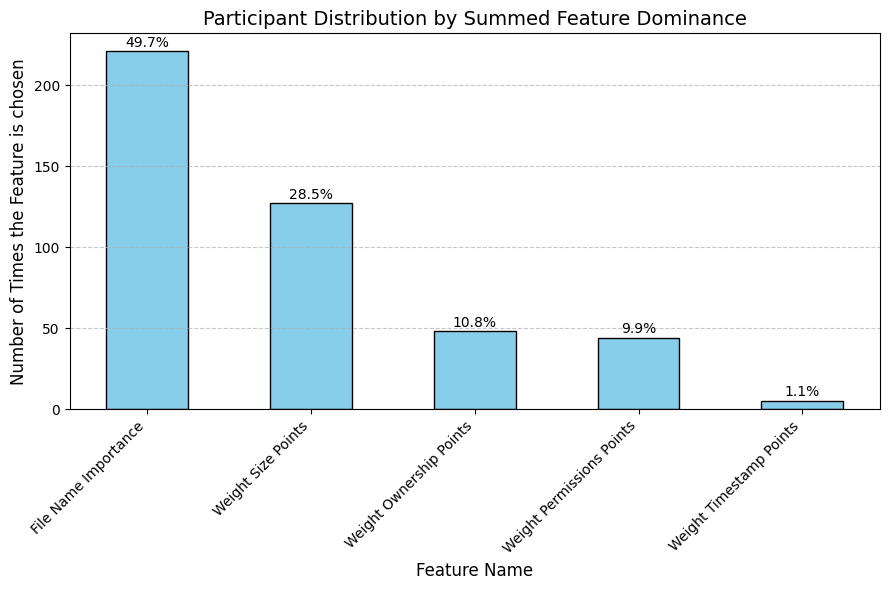

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Extract the feature name from "Highest Feature (Value)" column
final_table["Feature Name"] = final_table["Highest Feature (Value)"].str.extract(r"^(.*?) \(")

# Group by the feature name and sum the participants
grouped_features = final_table.groupby("Feature Name")["Participants"].sum().reset_index()
grouped_features = grouped_features.sort_values(by="Participants", ascending=False)

# Calculate the percentage of participants for each feature
total_participants = grouped_features["Participants"].sum()
grouped_features["Percentage"] = (grouped_features["Participants"] / total_participants) * 100

# Plot the histogram
plt.figure(figsize=(9, 6))
bars = plt.bar(
    grouped_features["Feature Name"],
    grouped_features["Participants"],
    color="skyblue",
    edgecolor="black",
    width=0.5  # Reduce the bar width to make bars thinner
)

# Annotate the bars with percentages
for bar, percentage in zip(bars, grouped_features["Percentage"]):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 1,
        f"{percentage:.1f}%",
        ha="center",
        va="bottom",
        fontsize=10
    )

# Add labels, title, and layout adjustments
plt.title("Participant Distribution by Summed Feature Dominance", fontsize=14)
plt.xlabel("Feature Name", fontsize=12)
plt.ylabel("Number of Times the Feature is chosen", fontsize=12)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show the plot
plt.show()

**File Ranking**

<ipython-input-75-49391a601059>:22: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_features_cleaned = df_features.applymap(
<ipython-input-75-49391a601059>:36: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_features_numeric_final = df_features_cleaned.replace(importance_mapping)


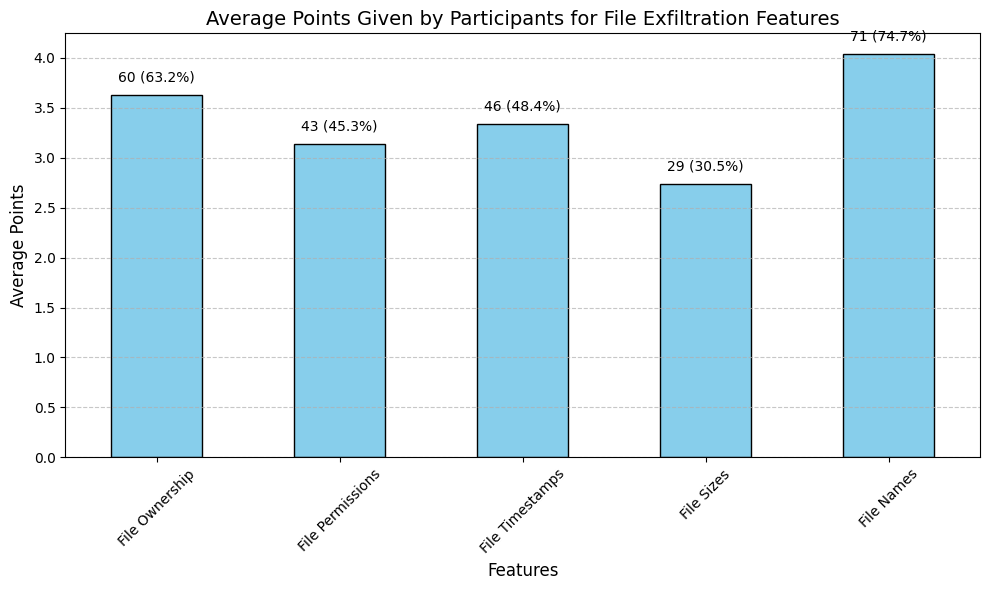

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
file_path = '/content/Choice_Overload.csv'
df = pd.read_csv(file_path)

# Mapping ci_co_fl_rank_* to their corresponding feature names
feature_mapping = {
    'ci_co_fl_rank_1': 'File Ownership',
    'ci_co_fl_rank_2': 'File Permissions',
    'ci_co_fl_rank_3': 'File Timestamps',
    'ci_co_fl_rank_4': 'File Sizes',
    'ci_co_fl_rank_5': 'File Names'
}

# Extract relevant columns and rename them for clarity
rank_columns = list(feature_mapping.keys())
df_features = df[rank_columns].rename(columns=feature_mapping)

# Clean the data by removing unwanted characters and ensuring proper formatting
df_features_cleaned = df_features.applymap(
    lambda x: x.replace('\xa0', '').strip() if isinstance(x, str) else x
)

# Define the mapping for textual labels to numeric values
importance_mapping = {
    '1 (Not Important at All)': 1,
    '2 (Slightly Important)': 2,
    '3 (Moderately Important)': 3,
    '4 (Very Important)': 4,
    '5 (Extremely Important)': 5
}

# Apply the mapping to convert cleaned text values to numeric equivalents
df_features_numeric_final = df_features_cleaned.replace(importance_mapping)

# Compute the average score for each feature
average_scores_final = df_features_numeric_final.mean()

# Count participants who gave scores 4 or higher for each feature
participants_high_score = (df_features_numeric_final >= 4).sum()
total_participants = len(df_features_numeric_final)

# Plotting the bar graph
plt.figure(figsize=(10, 6))
bars = average_scores_final.plot(kind='bar', color='skyblue', edgecolor='black')

# Add text annotations above bars
for i, bar in enumerate(bars.patches):
    feature_name = average_scores_final.index[i]
    num_high_scores = participants_high_score[feature_name]
    percentage_high_scores = (num_high_scores / total_participants) * 100
    plt.text(
        bar.get_x() + bar.get_width() / 2,  # X-coordinate
        bar.get_height() + 0.1,            # Y-coordinate, slightly above the bar
        f"{num_high_scores} ({percentage_high_scores:.1f}%)",  # Text to display
        ha='center', va='bottom', fontsize=10  # Alignment and font size
    )

# Add labels, title, and layout adjustments
plt.title('Average Points Given by Participants for File Exfiltration Features', fontsize=14)
plt.xlabel('Features', fontsize=12)
plt.ylabel('Average Points', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Show the plot
plt.show()

**Feature Matching with Rank**

In [ ]:
import pandas as pd

# Load the dataset
file_path = '/content/Choice_Overload.csv'
df = pd.read_csv(file_path)

# Define mappings for feature names and importance values
feature_mapping = {
    'ci_co_fl_rank_1': 'File Ownership',
    'ci_co_fl_rank_2': 'File Permissions',
    'ci_co_fl_rank_3': 'File Timestamps',
    'ci_co_fl_rank_4': 'File Sizes',
    'ci_co_fl_rank_5': 'File Names'
}
importance_mapping = {
    '1 (Not Important at All)': 1,
    '2 (Slightly Important)': 2,
    '3 (Moderately Important)': 3,
    '4 (Very Important)': 4,
    '5 (Extremely Important)': 5
}

# Clean and prepare the rank data
rank_columns = list(feature_mapping.keys())
df_features = df[rank_columns].rename(columns=feature_mapping)
df_features_cleaned = df_features.replace(to_replace={r'\xa0': '', r'\s+': ''}, regex=True)
df_features_numeric_final = df_features_cleaned.replace(importance_mapping)

# Convert the cleaned data to numeric
df_features_numeric_final = df_features_numeric_final.apply(pd.to_numeric, errors='coerce')

# Extract participant responses and file choices
response_ids = df['response_id']
file_choices = df[[f'ci_co_fl_{i}' for i in range(1, 7)]]

# Function to calculate participants per feature with a score >= 4 and the chosen file
def analyze_feature_participants(feature_name, feature_scores, file_choices, trial_features):
    count = 0
    participants = []

    for index, score in enumerate(feature_scores):
        if pd.notna(score) and score >= 4:  # Ensure valid numeric comparison
            for trial, chosen_file in file_choices.iloc[index].items():
                if chosen_file in trial_features:
                    highest_feature = max(trial_features[chosen_file].items(), key=lambda x: x[1])
                    if highest_feature[0] == feature_name:
                        count += 1
                        participants.append(response_ids.iloc[index])

    return count, participants

# Dictionary to store results for each feature
results = {}

# Analyze each feature across all trials
for feature in feature_mapping.values():  # Loop through feature names (e.g., "File Ownership", ...)
    total_count = 0
    all_participants = []

    for trial_idx in range(1, 7):  # Loop through each trial (1 to 6)
        trial_features = eval(f'file_trial_{trial_idx}')  # Load the respective trial feature dictionary
        count, participants = analyze_feature_participants(
            feature,
            df_features_numeric_final[feature],
            file_choices,
            trial_features
        )
        total_count += count
        all_participants.extend(participants)

    # Store results for the feature
    results[feature] = {
        "Count": total_count,
        "Participants": all_participants  # Optional: List of participant IDs
    }

# Create a DataFrame to display results
results_df = pd.DataFrame.from_dict(results, orient='index')
results_df.reset_index(inplace=True)
results_df.rename(columns={"index": "Feature"}, inplace=True)

# Show the table of results
print(results_df)

            Feature  Count Participants
0    File Ownership      0           []
1  File Permissions      0           []
2   File Timestamps      0           []
3        File Sizes      0           []
4        File Names      0           []


# **Top Features Laptop Purchasing**

**Trial 1**

In [ ]:
import pandas as pd

# Laptop specifications for Trial 1
laptops_trial_1 = [
    {"Choice": "A", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Integrated", "Price": 1310},
    {"Choice": "B", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 2GB", "Price": 1450},
    {"Choice": "C", "RAM": "4GB", "Storage": "128GB SSD", "GPU": "Integrated", "Price": 1400},
    {"Choice": "D", "RAM": "32GB", "Storage": "1TB SSD", "GPU": "Dedicated 4GB", "Price": 1500},
    {"Choice": "E", "RAM": "8GB", "Storage": "256GB HDD", "GPU": "Integrated", "Price": 1420},
    {"Choice": "F", "RAM": "16GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Price": 1480},
    {"Choice": "G", "RAM": "4GB", "Storage": "500GB HDD", "GPU": "Integrated 8GB", "Price": 1450},
    {"Choice": "H", "RAM": "4GB", "Storage": "2TB SSD", "GPU": "Dedicated 8GB", "Price": 1410},
]

# Feature weightings and scoring rules
weights = {
    "RAM": {"32GB": 4, "16GB": 3, "8GB": 2, "4GB": 1},
    "GPU": {"Dedicated 8GB": 4, "Dedicated 4GB": 3, "Dedicated 2GB": 2, "Integrated": 1},
    "Storage": {"2TB SSD": 5, "1TB SSD": 4, "512GB SSD": 3, "256GB SSD": 2, "HDD": 1},
    "Price": {"<$1000": 1, "$1000–$1500": 2, "$1501–$2000": 3, "$2001–$2300": 4},
}

# Weight multipliers for each feature
multipliers = {"RAM": 4, "GPU": 4, "Storage": 3, "Price": 1}

# Calculate total score for each laptop
results = []
for laptop in laptops_trial_1:
    ram_score = weights["RAM"].get(laptop["RAM"], 0) * multipliers["RAM"]
    gpu_score = weights["GPU"].get(laptop["GPU"], 0) * multipliers["GPU"]
    storage_score = weights["Storage"].get(laptop["Storage"], 0) * multipliers["Storage"]
    price_score = (
        weights["Price"].get("$1000–$1500", 0) if 1000 <= laptop["Price"] <= 1500 else weights["Price"].get("$1501–$2000", 0)
    ) * multipliers["Price"]
    total_score = ram_score + gpu_score + storage_score + price_score
    results.append({"Choice": laptop["Choice"], "Total Score": total_score})

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Normalize scores to range 20 to 100
min_score = results_df["Total Score"].min()
max_score = results_df["Total Score"].max()
results_df["Normalized Score"] = (
    ((results_df["Total Score"] - min_score) / (max_score - min_score)) * 80 + 20
).astype(int)

# Display results
print(results_df)

  Choice  Total Score  Normalized Score
0      A           20                51
1      B           31                75
2      C           10                28
3      D           42               100
4      E           14                37
5      F           26                64
6      G            6                20
7      H           37                88


In [ ]:
import pandas as pd

# Laptop specifications for Trial 1
laptops_trial_1 = [
    {"Choice": "A", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Integrated", "Price": 1310},
    {"Choice": "B", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 2GB", "Price": 1450},
    {"Choice": "C", "RAM": "4GB", "Storage": "128GB SSD", "GPU": "Integrated", "Price": 1400},
    {"Choice": "D", "RAM": "32GB", "Storage": "1TB SSD", "GPU": "Dedicated 4GB", "Price": 1500},
    {"Choice": "E", "RAM": "8GB", "Storage": "256GB HDD", "GPU": "Integrated", "Price": 1420},
    {"Choice": "F", "RAM": "16GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Price": 1480},
    {"Choice": "G", "RAM": "4GB", "Storage": "500GB HDD", "GPU": "Integrated 8GB", "Price": 1450},
    {"Choice": "H", "RAM": "4GB", "Storage": "2TB SSD", "GPU": "Dedicated 8GB", "Price": 1410},
]

# Feature weightings and scoring rules
weights = {
    "RAM": {"32GB": 4, "16GB": 3, "8GB": 2, "4GB": 1},
    "GPU": {"Dedicated 8GB": 4, "Dedicated 4GB": 3, "Dedicated 2GB": 2, "Integrated": 1},
    "Storage": {"2TB SSD": 5, "1TB SSD": 4, "512GB SSD": 3, "256GB SSD": 2, "HDD": 1},
    "Price": {"<$1000": 1, "$1000–$1500": 2, "$1501–$2000": 3, "$2001–$2300": 4},
}

# Weight multipliers for each feature
multipliers = {"RAM": 4, "GPU": 4, "Storage": 3, "Price": 1}

# Calculate total score for each laptop
results = []
for laptop in laptops_trial_1:
    ram_score = weights["RAM"].get(laptop["RAM"], 0) * multipliers["RAM"]
    gpu_score = weights["GPU"].get(laptop["GPU"], 0) * multipliers["GPU"]
    storage_score = weights["Storage"].get(laptop["Storage"], 0) * multipliers["Storage"]
    price_score = (
        weights["Price"].get("$1000–$1500", 0) if 1000 <= laptop["Price"] <= 1500 else weights["Price"].get("$1501–$2000", 0)
    ) * multipliers["Price"]
    total_score = ram_score + gpu_score + storage_score + price_score
    results.append(
        {
            "Choice": laptop["Choice"],
            "RAM Score": ram_score,
            "GPU Score": gpu_score,
            "Storage Score": storage_score,
            "Price Score": price_score,
            "Total Base Points": total_score,
        }
    )

# Convert results to DataFrame
df = pd.DataFrame(results)

# Calculate weights for each feature category based on their contribution to Total Base Points
df["Weight RAM"] = df["RAM Score"] / df["Total Base Points"]
df["Weight GPU"] = df["GPU Score"] / df["Total Base Points"]
df["Weight Storage"] = df["Storage Score"] / df["Total Base Points"]
df["Weight Price"] = df["Price Score"] / df["Total Base Points"]

# Normalize the Total Base Points to the range 20-100 (integer values only)
min_points = df["Total Base Points"].min()
max_points = df["Total Base Points"].max()
df["Normalized Score"] = (((df["Total Base Points"] - min_points) / (max_points - min_points)) * 80 + 20).astype(int)

# Save the result to a CSV file
output_file = "/content/Laptop_Trial_1_Results.csv"
df.to_csv(output_file, index=False)

output_file

'/content/Laptop_Trial_1_Results.csv'

**Trial 2**

In [ ]:
import pandas as pd

# Laptop specifications
laptops_data = [
    {"Choice": "A", "RAM": "16GB", "Storage": "128GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours", "Screen Size": "14 inches", "Price": 1400, "Processor": "Intel i7", "Brand": "Lusail"},
    {"Choice": "B", "RAM": "4GB", "Storage": "1TB SSD", "GPU": "Dedicated 8GB", "Battery Life": "10 hours", "Screen Size": "15.6 inches", "Price": 1450, "Processor": "Intel i9", "Brand": "Asphalt"},
    {"Choice": "C", "RAM": "16GB", "Storage": "1TB HDD", "GPU": "Integrated", "Battery Life": "7 hours", "Screen Size": "14.1 inches", "Price": 1475, "Processor": "AMD Ryzen 5", "Brand": "Silverstone"},
    {"Choice": "D", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Integrated", "Battery Life": "6 hours", "Screen Size": "13 inches", "Price": 1400, "Processor": "Intel i5", "Brand": "Zinx"},
    {"Choice": "E", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours", "Screen Size": "14 inches", "Price": 1450, "Processor": "Intel i3", "Brand": "Monza"},
    {"Choice": "F", "RAM": "32GB", "Storage": "2TB SSD", "GPU": "Integrated", "Battery Life": "12 hours", "Screen Size": "17 inches", "Price": 1500, "Processor": "AMD Ryzen 7", "Brand": "Aurora"},
    {"Choice": "G", "RAM": "4GB", "Storage": "512GB SSD", "GPU": "Dedicated 2GB", "Battery Life": "6 hours", "Screen Size": "15 inches", "Price": 1425, "Processor": "Intel i5", "Brand": "Suboptimal"},
    {"Choice": "H", "RAM": "8GB", "Storage": "128GB HDD", "GPU": "Dedicated 4GB", "Battery Life": "9 hours", "Screen Size": "14 inches", "Price": 1480, "Processor": "Intel i3", "Brand": "Asphalt"},
]

# Feature weightings and scoring rules
weights = {
    "RAM": {"32GB": 4, "16GB": 3, "8GB": 2, "4GB": 1},
    "GPU": {"Dedicated 8GB": 4, "Dedicated 4GB": 3, "Dedicated 2GB": 2, "Integrated": 1},
    "Storage": {"2TB SSD": 5, "1TB SSD": 4, "512GB SSD": 3, "256GB SSD": 2, "128GB SSD": 1, "1TB HDD": 2, "128GB HDD": 1},
    "Battery Life": {"12 hours": 4, "10 hours": 3, "9 hours": 2, "8 hours": 2, "7 hours": 1, "6 hours": 1},
    "Processor": {"Intel i9": 4, "Intel i7": 3, "AMD Ryzen 7": 4, "AMD Ryzen 5": 3, "Intel i5": 2, "Intel i3": 1},
    "Brand": {"Monza": 3, "Aurora": 2, "Silverstone": 2, "Lusail": 2, "Asphalt": 1, "Suboptimal": 1, "Zinx": 1},
    "Screen Size": {"17 inches": 4, "15.6 inches": 3, "15 inches": 2, "14 inches": 2, "14.1 inches": 2, "13 inches": 1},
    "Price": {"<$1000": 1, "$1000–$1500": 2, "$1501–$2000": 3, "$2001–$2300": 4},
}

# Weight multipliers for each feature
multipliers = {
    "RAM": 4,
    "GPU": 4,
    "Storage": 3,
    "Battery Life": 2,
    "Processor": 3,
    "Brand": 2,
    "Screen Size": 2,
    "Price": 1,
}

# Calculate total score for each laptop
results = []
for laptop in laptops_data:
    ram_score = weights["RAM"].get(laptop["RAM"], 0) * multipliers["RAM"]
    gpu_score = weights["GPU"].get(laptop["GPU"], 0) * multipliers["GPU"]
    storage_score = weights["Storage"].get(laptop["Storage"], 0) * multipliers["Storage"]
    battery_score = weights["Battery Life"].get(laptop["Battery Life"], 0) * multipliers["Battery Life"]
    processor_score = weights["Processor"].get(laptop["Processor"], 0) * multipliers["Processor"]
    brand_score = weights["Brand"].get(laptop["Brand"], 0) * multipliers["Brand"]
    screen_score = weights["Screen Size"].get(laptop["Screen Size"], 0) * multipliers["Screen Size"]
    price_score = 2  # Price is fixed at "$1000–$1500" for all

    total_score = (
        ram_score + gpu_score + storage_score + battery_score +
        processor_score + brand_score + screen_score + price_score
    )
    results.append({"Choice": laptop["Choice"], "Total Score": total_score})

# Normalize scores to range 20 to 100
results_df = pd.DataFrame(results)
min_score = results_df["Total Score"].min()
max_score = results_df["Total Score"].max()
results_df["Normalized Score"] = (
    ((results_df["Total Score"] - min_score) / (max_score - min_score)) * 80 + 20
).astype(int)

# Display results
print(results_df)

  Choice  Total Score  Normalized Score
0      A           50                58
1      B           60                80
2      C           43                43
3      D           32                20
4      E           52                63
5      F           69               100
6      G           37                30
7      H           38                32


In [ ]:
import pandas as pd

# Laptop specifications for Trial 2
laptops_data = [
    {"Choice": "A", "RAM": "16GB", "Storage": "128GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours", "Screen Size": "14 inches", "Price": 1400, "Processor": "Intel i7", "Brand": "Lusail"},
    {"Choice": "B", "RAM": "4GB", "Storage": "1TB SSD", "GPU": "Dedicated 8GB", "Battery Life": "10 hours", "Screen Size": "15.6 inches", "Price": 1450, "Processor": "Intel i9", "Brand": "Asphalt"},
    {"Choice": "C", "RAM": "16GB", "Storage": "1TB HDD", "GPU": "Integrated", "Battery Life": "7 hours", "Screen Size": "14.1 inches", "Price": 1475, "Processor": "AMD Ryzen 5", "Brand": "Silverstone"},
    {"Choice": "D", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Integrated", "Battery Life": "6 hours", "Screen Size": "13 inches", "Price": 1400, "Processor": "Intel i5", "Brand": "Zinx"},
    {"Choice": "E", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours", "Screen Size": "14 inches", "Price": 1450, "Processor": "Intel i3", "Brand": "Monza"},
    {"Choice": "F", "RAM": "32GB", "Storage": "2TB SSD", "GPU": "Integrated", "Battery Life": "12 hours", "Screen Size": "17 inches", "Price": 1500, "Processor": "AMD Ryzen 7", "Brand": "Aurora"},
    {"Choice": "G", "RAM": "4GB", "Storage": "512GB SSD", "GPU": "Dedicated 2GB", "Battery Life": "6 hours", "Screen Size": "15 inches", "Price": 1425, "Processor": "Intel i5", "Brand": "Suboptimal"},
    {"Choice": "H", "RAM": "8GB", "Storage": "128GB HDD", "GPU": "Dedicated 4GB", "Battery Life": "9 hours", "Screen Size": "14 inches", "Price": 1480, "Processor": "Intel i3", "Brand": "Asphalt"},
]

# Feature weightings and scoring rules
weights = {
    "RAM": {"32GB": 4, "16GB": 3, "8GB": 2, "4GB": 1},
    "GPU": {"Dedicated 8GB": 4, "Dedicated 4GB": 3, "Dedicated 2GB": 2, "Integrated": 1},
    "Storage": {"2TB SSD": 5, "1TB SSD": 4, "512GB SSD": 3, "256GB SSD": 2, "128GB SSD": 1, "1TB HDD": 2, "128GB HDD": 1},
    "Battery Life": {"12 hours": 4, "10 hours": 3, "9 hours": 2, "8 hours": 2, "7 hours": 1, "6 hours": 1},
    "Processor": {"Intel i9": 4, "Intel i7": 3, "AMD Ryzen 7": 4, "AMD Ryzen 5": 3, "Intel i5": 2, "Intel i3": 1},
    "Brand": {"Monza": 3, "Aurora": 2, "Silverstone": 2, "Lusail": 2, "Asphalt": 1, "Suboptimal": 1, "Zinx": 1},
    "Screen Size": {"17 inches": 4, "15.6 inches": 3, "15 inches": 2, "14 inches": 2, "14.1 inches": 2, "13 inches": 1},
    "Price": {"<$1000": 1, "$1000–$1500": 2, "$1501–$2000": 3, "$2001–$2300": 4},
}

# Weight multipliers for each feature
multipliers = {
    "RAM": 4,
    "GPU": 4,
    "Storage": 3,
    "Battery Life": 2,
    "Processor": 3,
    "Brand": 2,
    "Screen Size": 2,
    "Price": 1,
}

# Calculate total score and feature weights for each laptop
results = []
for laptop in laptops_data:
    ram_score = weights["RAM"].get(laptop["RAM"], 0) * multipliers["RAM"]
    gpu_score = weights["GPU"].get(laptop["GPU"], 0) * multipliers["GPU"]
    storage_score = weights["Storage"].get(laptop["Storage"], 0) * multipliers["Storage"]
    battery_score = weights["Battery Life"].get(laptop["Battery Life"], 0) * multipliers["Battery Life"]
    processor_score = weights["Processor"].get(laptop["Processor"], 0) * multipliers["Processor"]
    brand_score = weights["Brand"].get(laptop["Brand"], 0) * multipliers["Brand"]
    screen_score = weights["Screen Size"].get(laptop["Screen Size"], 0) * multipliers["Screen Size"]
    price_score = 2  # Price is fixed at "$1000–$1500" for all

    total_score = (
        ram_score + gpu_score + storage_score + battery_score +
        processor_score + brand_score + screen_score + price_score
    )

    # Calculate weights for each feature
    ram_weight = ram_score / total_score
    gpu_weight = gpu_score / total_score
    storage_weight = storage_score / total_score
    battery_weight = battery_score / total_score
    processor_weight = processor_score / total_score
    brand_weight = brand_score / total_score
    screen_weight = screen_score / total_score
    price_weight = price_score / total_score

    results.append({
        "Choice": laptop["Choice"],
        "RAM Score": ram_score,
        "GPU Score": gpu_score,
        "Storage Score": storage_score,
        "Battery Score": battery_score,
        "Processor Score": processor_score,
        "Brand Score": brand_score,
        "Screen Score": screen_score,
        "Price Score": price_score,
        "Total Base Points": total_score,
        "Weight RAM": ram_weight,
        "Weight GPU": gpu_weight,
        "Weight Storage": storage_weight,
        "Weight Battery": battery_weight,
        "Weight Processor": processor_weight,
        "Weight Brand": brand_weight,
        "Weight Screen": screen_weight,
        "Weight Price": price_weight,
    })

# Convert results to DataFrame
df = pd.DataFrame(results)

# Normalize scores to range 20 to 100
min_score = df["Total Base Points"].min()
max_score = df["Total Base Points"].max()
df["Normalized Score"] = (
    ((df["Total Base Points"] - min_score) / (max_score - min_score)) * 80 + 20
).astype(int)

# Save to CSV
file_path = "/content/Laptop_Trial_2_Results.csv"
df.to_csv(file_path, index=False)

file_path

'/content/Laptop_Trial_2_Results.csv'

**Trial 3**

In [ ]:
import pandas as pd

# Laptop specifications for Trial 3
laptops_trial_3 = [
    {"Choice": "A", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Integrated", "Price": 1300},
    {"Choice": "B", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 2GB", "Price": 1400},
    {"Choice": "C", "RAM": "8GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Price": 1350},
    {"Choice": "D", "RAM": "16GB", "Storage": "256GB SSD", "GPU": "Integrated", "Price": 1400},
    {"Choice": "E", "RAM": "32GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Price": 1500},
    {"Choice": "F", "RAM": "16GB", "Storage": "1TB SSD", "GPU": "Integrated", "Price": 1450},
    {"Choice": "G", "RAM": "8GB", "Storage": "512GB HDD", "GPU": "Dedicated 2GB", "Price": 1350},
    {"Choice": "H", "RAM": "32GB", "Storage": "1TB HDD", "GPU": "Dedicated 8GB", "Price": 1500},
    {"Choice": "I", "RAM": "16GB", "Storage": "256GB SSD", "GPU": "Dedicated 4GB", "Price": 1450},
    {"Choice": "J", "RAM": "32GB", "Storage": "512GB SSD", "GPU": "Integrated", "Price": 1500},
    {"Choice": "K", "RAM": "8GB", "Storage": "1TB SSD", "GPU": "Dedicated 2GB", "Price": 1400},
    {"Choice": "L", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 8GB", "Price": 1500},
    {"Choice": "M", "RAM": "32GB", "Storage": "1TB HDD", "GPU": "Integrated", "Price": 1450},
    {"Choice": "N", "RAM": "16GB", "Storage": "1TB SSD", "GPU": "Dedicated 4GB", "Price": 1500},
    {"Choice": "O", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Dedicated 8GB", "Price": 1350},
    {"Choice": "P", "RAM": "32GB", "Storage": "512GB HDD", "GPU": "Dedicated 2GB", "Price": 1450},
]

# Feature weightings and scoring rules
weights = {
    "RAM": {"32GB": 4, "16GB": 3, "8GB": 2, "4GB": 1},
    "GPU": {"Dedicated 8GB": 4, "Dedicated 4GB": 3, "Dedicated 2GB": 2, "Integrated": 1},
    "Storage": {"2TB SSD": 5, "1TB SSD": 4, "512GB SSD": 3, "256GB SSD": 2, "HDD": 1},
    "Price": {"<$1000": 1, "$1000–$1500": 2, "$1501–$2000": 3, "$2001–$2300": 4},
}

# Weight multipliers for each feature
multipliers = {"RAM": 4, "GPU": 4, "Storage": 3, "Price": 1}

# Calculate total score for each laptop
results = []
for laptop in laptops_trial_3:
    ram_score = weights["RAM"].get(laptop["RAM"], 0) * multipliers["RAM"]
    gpu_score = weights["GPU"].get(laptop["GPU"], 0) * multipliers["GPU"]
    storage_score = weights["Storage"].get(laptop["Storage"], 0) * multipliers["Storage"]
    price_score = (
        weights["Price"].get("$1000–$1500", 0) if 1000 <= laptop["Price"] <= 1500 else weights["Price"].get("$1501–$2000", 0)
    ) * multipliers["Price"]
    total_score = ram_score + gpu_score + storage_score + price_score
    results.append({
        "Choice": laptop["Choice"],
        "RAM Score": ram_score,
        "GPU Score": gpu_score,
        "Storage Score": storage_score,
        "Price Score": price_score,
        "Total Base Points": total_score,
    })

# Normalize the scores to range [20, 100]
scores = [result["Total Base Points"] for result in results]
min_score = min(scores)
max_score = max(scores)
for result in results:
    result["Normalized Score"] = int(20 + (result["Total Base Points"] - min_score) * (80 / (max_score - min_score)))

# Convert results to DataFrame
df = pd.DataFrame(results)

# Calculate weights for each feature
df["Weight RAM"] = df["RAM Score"] / df["Total Base Points"]
df["Weight GPU"] = df["GPU Score"] / df["Total Base Points"]
df["Weight Storage"] = df["Storage Score"] / df["Total Base Points"]
df["Weight Price"] = df["Price Score"] / df["Total Base Points"]

# Reorganize columns
columns_order = [
    "Choice",
    "RAM Score",
    "GPU Score",
    "Storage Score",
    "Price Score",
    "Total Base Points",
    "Weight RAM",
    "Weight GPU",
    "Weight Storage",
    "Weight Price",
    "Normalized Score"
]
df = df[columns_order]

# Save to CSV
output_file = "/content/Laptop_Trial_3_Results.csv"
df.to_csv(output_file, index=False)
output_file

'/content/Laptop_Trial_3_Results.csv'

In [ ]:
import pandas as pd

# Laptop specifications
laptops = [
    {"Choice": "A", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Integrated", "Price": 1300},
    {"Choice": "B", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 2GB", "Price": 1400},
    {"Choice": "C", "RAM": "8GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Price": 1350},
    {"Choice": "D", "RAM": "16GB", "Storage": "256GB SSD", "GPU": "Integrated", "Price": 1400},
    {"Choice": "E", "RAM": "32GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Price": 1500},
    {"Choice": "F", "RAM": "16GB", "Storage": "1TB SSD", "GPU": "Integrated", "Price": 1450},
    {"Choice": "G", "RAM": "8GB", "Storage": "512GB HDD", "GPU": "Dedicated 2GB", "Price": 1350},
    {"Choice": "H", "RAM": "32GB", "Storage": "1TB HDD", "GPU": "Dedicated 8GB", "Price": 1500},
    {"Choice": "I", "RAM": "16GB", "Storage": "256GB SSD", "GPU": "Dedicated 4GB", "Price": 1450},
    {"Choice": "J", "RAM": "32GB", "Storage": "512GB SSD", "GPU": "Integrated", "Price": 1500},
    {"Choice": "K", "RAM": "8GB", "Storage": "1TB SSD", "GPU": "Dedicated 2GB", "Price": 1400},
    {"Choice": "L", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 8GB", "Price": 1500},
    {"Choice": "M", "RAM": "32GB", "Storage": "1TB HDD", "GPU": "Integrated", "Price": 1450},
    {"Choice": "N", "RAM": "16GB", "Storage": "1TB SSD", "GPU": "Dedicated 4GB", "Price": 1500},
    {"Choice": "O", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Dedicated 8GB", "Price": 1350},
    {"Choice": "P", "RAM": "32GB", "Storage": "512GB HDD", "GPU": "Dedicated 2GB", "Price": 1450},
]

# Feature weightings and scoring rules
weights = {
    "RAM": {"32GB": 4, "16GB": 3, "8GB": 2, "4GB": 1},
    "GPU": {"Dedicated 8GB": 4, "Dedicated 4GB": 3, "Dedicated 2GB": 2, "Integrated": 1},
    "Storage": {"2TB SSD": 5, "1TB SSD": 4, "512GB SSD": 3, "256GB SSD": 2, "HDD": 1},
    "Price": {"<$1000": 1, "$1000–$1500": 2, "$1501–$2000": 3, "$2001–$2300": 4},
}

# Weight multipliers for each feature
multipliers = {"RAM": 4, "GPU": 4, "Storage": 3, "Price": 1}

# Calculate total score for each laptop
results = []
for laptop in laptops:
    ram_score = weights["RAM"].get(laptop["RAM"], 0) * multipliers["RAM"]
    gpu_score = weights["GPU"].get(laptop["GPU"], 0) * multipliers["GPU"]
    storage_score = weights["Storage"].get(laptop["Storage"], 0) * multipliers["Storage"]
    price_score = (
        weights["Price"].get("$1000–$1500", 0) if 1000 <= laptop["Price"] <= 1500 else weights["Price"].get("$1501–$2000", 0)
    ) * multipliers["Price"]
    total_score = ram_score + gpu_score + storage_score + price_score
    results.append({
        "Choice": laptop["Choice"],
        "RAM Score": ram_score,
        "GPU Score": gpu_score,
        "Storage Score": storage_score,
        "Price Score": price_score,
        "Total Score": total_score,
    })

# Convert results to DataFrame
df = pd.DataFrame(results)

# Calculate weights for each feature
df["Weight RAM"] = df["RAM Score"] / df["Total Score"]
df["Weight GPU"] = df["GPU Score"] / df["Total Score"]
df["Weight Storage"] = df["Storage Score"] / df["Total Score"]
df["Weight Price"] = df["Price Score"] / df["Total Score"]

# Display the feature weights along with the normalized values
feature_weights_columns = [
    "Choice",
    "RAM Score",
    "Weight RAM",
    "GPU Score",
    "Weight GPU",
    "Storage Score",
    "Weight Storage",
    "Price Score",
    "Weight Price",
    "Total Score"
]

# Display the requested columns
df = df[feature_weights_columns]
print(df)

   Choice  RAM Score  Weight RAM  GPU Score  Weight GPU  Storage Score  \
0       A          8    0.400000          4    0.200000              6   
1       B         12    0.387097          8    0.258065              9   
2       C          8    0.363636         12    0.545455              0   
3       D         12    0.500000          4    0.166667              6   
4       E         16    0.410256         12    0.307692              9   
5       F         12    0.400000          4    0.133333             12   
6       G          8    0.444444          8    0.444444              0   
7       H         16    0.470588         16    0.470588              0   
8       I         12    0.375000         12    0.375000              6   
9       J         16    0.516129          4    0.129032              9   
10      K          8    0.266667          8    0.266667             12   
11      L         12    0.307692         16    0.410256              9   
12      M         16    0.727273      

**Trial 4**

In [ ]:
import pandas as pd

# Laptop specifications
laptops_data = [
    {"Choice": "A", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours", "Screen Size": "14 inches", "Processor": "Intel i7", "Brand": "Lusail", "Price": 1600},
    {"Choice": "B", "RAM": "32GB", "Storage": "1TB SSD", "GPU": "Dedicated 8GB", "Battery Life": "10 hours", "Screen Size": "15.6 inches", "Processor": "Intel i9", "Brand": "Monza", "Price": 1610},
    {"Choice": "C", "RAM": "16GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Battery Life": "7 hours", "Screen Size": "14.1 inches", "Processor": "AMD Ryzen 5", "Brand": "Aurora", "Price": 1620},
    {"Choice": "D", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Integrated", "Battery Life": "6 hours", "Screen Size": "13 inches", "Processor": "Intel i5", "Brand": "Asphalt", "Price": 1630},
    {"Choice": "E", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours", "Screen Size": "14 inches", "Processor": "Intel i7", "Brand": "Silverstone", "Price": 1640},
    {"Choice": "F", "RAM": "32GB", "Storage": "2TB SSD", "GPU": "Dedicated 8GB", "Battery Life": "12 hours", "Screen Size": "17 inches", "Processor": "AMD Ryzen 7", "Brand": "Yellow", "Price": 1650},
    {"Choice": "G", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Integrated", "Battery Life": "6 hours", "Screen Size": "15 inches", "Processor": "Intel i5", "Brand": "Zinx", "Price": 1660},
    {"Choice": "H", "RAM": "8GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Battery Life": "9 hours", "Screen Size": "14 inches", "Processor": "Intel i3", "Brand": "Suboptimal", "Price": 1670},
    {"Choice": "I", "RAM": "32GB", "Storage": "512GB SSD", "GPU": "Dedicated 8GB", "Battery Life": "11 hours", "Screen Size": "15.6 inches", "Processor": "Intel i9", "Brand": "Silverstone", "Price": 1680},
    {"Choice": "J", "RAM": "16GB", "Storage": "1TB SSD", "GPU": "Integrated", "Battery Life": "7 hours", "Screen Size": "14.1 inches", "Processor": "AMD Ryzen 5", "Brand": "Aurora", "Price": 1690},
    {"Choice": "K", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours", "Screen Size": "13 inches", "Processor": "Intel i5", "Brand": "Monza", "Price": 1605},
    {"Choice": "L", "RAM": "32GB", "Storage": "1TB HDD", "GPU": "Dedicated 8GB", "Battery Life": "10 hours", "Screen Size": "17 inches", "Processor": "Intel i7", "Brand": "Suboptimal", "Price": 1615},
    {"Choice": "M", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Integrated", "Battery Life": "6 hours", "Screen Size": "14 inches", "Processor": "AMD Ryzen 7", "Brand": "Suboptimal", "Price": 1625},
    {"Choice": "N", "RAM": "32GB", "Storage": "2TB SSD", "GPU": "Dedicated 4GB", "Battery Life": "12 hours", "Screen Size": "15 inches", "Processor": "Intel i3", "Brand": "Yellow", "Price": 1635},
    {"Choice": "O", "RAM": "16GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Battery Life": "9 hours", "Screen Size": "14 inches", "Processor": "Intel i9", "Brand": "Aurora", "Price": 1645},
    {"Choice": "P", "RAM": "8GB", "Storage": "512GB SSD", "GPU": "Dedicated 8GB", "Battery Life": "7 hours", "Screen Size": "15 inches", "Processor": "Intel i7", "Brand": "Yellow", "Price": 1655},
]

# Normalize the prices to range [20, 100]
prices = [laptop["Price"] for laptop in laptops_data]
min_price = min(prices)
max_price = max(prices)

for laptop in laptops_data:
    laptop["Normalized Price"] = int(20 + (laptop["Price"] - min_price) * (80 / (max_price - min_price)))

# Convert to DataFrame
df = pd.DataFrame(laptops_data)

# Display the normalized scores
print(df[["Choice", "Price", "Normalized Price"]])

   Choice  Price  Normalized Price
0       A   1600                20
1       B   1610                28
2       C   1620                37
3       D   1630                46
4       E   1640                55
5       F   1650                64
6       G   1660                73
7       H   1670                82
8       I   1680                91
9       J   1690               100
10      K   1605                24
11      L   1615                33
12      M   1625                42
13      N   1635                51
14      O   1645                60
15      P   1655                68


In [ ]:
import pandas as pd

# Laptop specifications for Trial 4
laptops_data = [
    {"Choice": "A", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours",
     "Screen Size": "14 inches", "Processor": "Intel i7", "Brand": "Lusail", "Price": 1600},
    {"Choice": "B", "RAM": "32GB", "Storage": "1TB SSD", "GPU": "Dedicated 8GB", "Battery Life": "10 hours",
     "Screen Size": "15.6 inches", "Processor": "Intel i9", "Brand": "Monza", "Price": 1610},
    {"Choice": "C", "RAM": "16GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Battery Life": "7 hours",
     "Screen Size": "14.1 inches", "Processor": "AMD Ryzen 5", "Brand": "Aurora", "Price": 1620},
    {"Choice": "D", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Integrated", "Battery Life": "6 hours",
     "Screen Size": "13 inches", "Processor": "Intel i5", "Brand": "Asphalt", "Price": 1630},
    {"Choice": "E", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours",
     "Screen Size": "14 inches", "Processor": "Intel i7", "Brand": "Silverstone", "Price": 1640},
    {"Choice": "F", "RAM": "32GB", "Storage": "2TB SSD", "GPU": "Dedicated 8GB", "Battery Life": "12 hours",
     "Screen Size": "17 inches", "Processor": "AMD Ryzen 7", "Brand": "Yellow", "Price": 1650},
    {"Choice": "G", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Integrated", "Battery Life": "6 hours",
     "Screen Size": "15 inches", "Processor": "Intel i5", "Brand": "Zinx", "Price": 1660},
    {"Choice": "H", "RAM": "8GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Battery Life": "9 hours",
     "Screen Size": "14 inches", "Processor": "Intel i3", "Brand": "Suboptimal", "Price": 1670},
    {"Choice": "I", "RAM": "32GB", "Storage": "512GB SSD", "GPU": "Dedicated 8GB", "Battery Life": "11 hours",
     "Screen Size": "15.6 inches", "Processor": "Intel i9", "Brand": "Silverstone", "Price": 1680},
    {"Choice": "J", "RAM": "16GB", "Storage": "1TB SSD", "GPU": "Integrated", "Battery Life": "7 hours",
     "Screen Size": "14.1 inches", "Processor": "AMD Ryzen 5", "Brand": "Aurora", "Price": 1690},
    {"Choice": "K", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours",
     "Screen Size": "13 inches", "Processor": "Intel i5", "Brand": "Monza", "Price": 1605},
    {"Choice": "L", "RAM": "32GB", "Storage": "1TB HDD", "GPU": "Dedicated 8GB", "Battery Life": "10 hours",
     "Screen Size": "17 inches", "Processor": "Intel i7", "Brand": "Suboptimal", "Price": 1615},
    {"Choice": "M", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Integrated", "Battery Life": "6 hours",
     "Screen Size": "14 inches", "Processor": "AMD Ryzen 7", "Brand": "Suboptimal", "Price": 1625},
    {"Choice": "N", "RAM": "32GB", "Storage": "2TB SSD", "GPU": "Dedicated 4GB", "Battery Life": "12 hours",
     "Screen Size": "15 inches", "Processor": "Intel i3", "Brand": "Yellow", "Price": 1635},
    {"Choice": "O", "RAM": "16GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Battery Life": "9 hours",
     "Screen Size": "14 inches", "Processor": "Intel i9", "Brand": "Aurora", "Price": 1645},
    {"Choice": "P", "RAM": "8GB", "Storage": "512GB SSD", "GPU": "Dedicated 8GB", "Battery Life": "7 hours",
     "Screen Size": "15 inches", "Processor": "Intel i7", "Brand": "Yellow", "Price": 1655},
]

# Define feature weights and scoring multipliers
weights = {
    "RAM": {"32GB": 4, "16GB": 3, "8GB": 2},
    "Storage": {"2TB SSD": 5, "1TB SSD": 4, "512GB SSD": 3, "1TB HDD": 2, "256GB SSD": 2},
    "GPU": {"Dedicated 8GB": 4, "Dedicated 4GB": 3, "Integrated": 1},
    "Battery Life": {"12 hours": 4, "10 hours": 3, "9 hours": 2, "8 hours": 2, "7 hours": 1, "6 hours": 1},
    "Processor": {"Intel i9": 4, "AMD Ryzen 7": 4, "Intel i7": 3, "AMD Ryzen 5": 3, "Intel i5": 2, "Intel i3": 1},
    "Brand": {"Yellow": 4, "Silverstone": 3, "Monza": 3, "Aurora": 2, "Lusail": 2, "Asphalt": 1, "Suboptimal": 1, "Zinx": 1},
    "Screen Size": {"17 inches": 4, "15.6 inches": 3, "15 inches": 2, "14 inches": 2, "14.1 inches": 2, "13 inches": 1},
    "Price": {"<$1000": 1, "$1000–$1500": 2, "$1501–$2000": 3, "$2001–$2300": 4},
}

multipliers = {
    "RAM": 4,
    "Storage": 3,
    "GPU": 4,
    "Battery Life": 2,
    "Processor": 3,
    "Brand": 2,
    "Screen Size": 1,
    "Price": 1,
}

# Calculate scores
results = []
for laptop in laptops_data:
    ram_score = weights["RAM"].get(laptop["RAM"], 0) * multipliers["RAM"]
    gpu_score = weights["GPU"].get(laptop["GPU"], 0) * multipliers["GPU"]
    storage_score = weights["Storage"].get(laptop["Storage"], 0) * multipliers["Storage"]
    battery_score = weights["Battery Life"].get(laptop["Battery Life"], 0) * multipliers["Battery Life"]
    processor_score = weights["Processor"].get(laptop["Processor"], 0) * multipliers["Processor"]
    brand_score = weights["Brand"].get(laptop["Brand"], 0) * multipliers["Brand"]
    screen_score = weights["Screen Size"].get(laptop["Screen Size"], 0) * multipliers["Screen Size"]
    price_score = 3  # Based on given price range

    total_score = ram_score + gpu_score + storage_score + battery_score + processor_score + brand_score + screen_score + price_score

    results.append({
        "Choice": laptop["Choice"],
        "RAM Score": ram_score,
        "GPU Score": gpu_score,
        "Storage Score": storage_score,
        "Battery Score": battery_score,
        "Processor Score": processor_score,
        "Brand Score": brand_score,
        "Screen Score": screen_score,
        "Price Score": price_score,
        "Total Base Points": total_score,
        "Weight RAM": ram_score / total_score,
        "Weight GPU": gpu_score / total_score,
        "Weight Storage": storage_score / total_score,
        "Weight Battery": battery_score / total_score,
        "Weight Processor": processor_score / total_score,
        "Weight Brand": brand_score / total_score,
        "Weight Screen": screen_score / total_score,
        "Weight Price": price_score / total_score,
    })

# Normalize scores to range 20-100
min_score = min([result["Total Base Points"] for result in results])
max_score = max([result["Total Base Points"] for result in results])
for result in results:
    result["Normalized Score"] = int(20 + (result["Total Base Points"] - min_score) * (80 / (max_score - min_score)))

# Convert to DataFrame
df = pd.DataFrame(results)

# Save to CSV
output_file = "/content/Laptop_Trial_4_Results.csv"
df.to_csv(output_file, index=False)
output_file

'/content/Laptop_Trial_4_Results.csv'

**Trial 5**

In [ ]:
import pandas as pd

# Laptop specifications for Trial 5
laptops_trial_5 = [
    {"Choice": "A", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Price": 1810},
    {"Choice": "B", "RAM": "32GB", "Storage": "1TB SSD", "GPU": "Dedicated 8GB", "Price": 1812},
    {"Choice": "C", "RAM": "16GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Price": 1815},
    {"Choice": "D", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Integrated", "Price": 1818},
    {"Choice": "E", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Price": 1820},
    {"Choice": "F", "RAM": "32GB", "Storage": "2TB SSD", "GPU": "Dedicated 8GB", "Price": 1823},
    {"Choice": "G", "RAM": "16GB", "Storage": "512GB HDD", "GPU": "Integrated", "Price": 1825},
    {"Choice": "H", "RAM": "32GB", "Storage": "1TB HDD", "GPU": "Dedicated 8GB", "Price": 1828},
    {"Choice": "I", "RAM": "16GB", "Storage": "256GB SSD", "GPU": "Dedicated 4GB", "Price": 1830},
    {"Choice": "J", "RAM": "32GB", "Storage": "512GB SSD", "GPU": "Integrated", "Price": 1833},
    {"Choice": "K", "RAM": "8GB", "Storage": "1TB SSD", "GPU": "Dedicated 2GB", "Price": 1835},
    {"Choice": "L", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 8GB", "Price": 1838},
    {"Choice": "M", "RAM": "32GB", "Storage": "1TB HDD", "GPU": "Integrated", "Price": 1840},
    {"Choice": "N", "RAM": "16GB", "Storage": "2TB SSD", "GPU": "Dedicated 4GB", "Price": 1843},
    {"Choice": "O", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Dedicated 8GB", "Price": 1845},
    {"Choice": "P", "RAM": "32GB", "Storage": "512GB HDD", "GPU": "Dedicated 2GB", "Price": 1848},
    {"Choice": "Q", "RAM": "16GB", "Storage": "1TB SSD", "GPU": "Integrated", "Price": 1850},
    {"Choice": "R", "RAM": "32GB", "Storage": "2TB SSD", "GPU": "Dedicated 4GB", "Price": 1853},
    {"Choice": "S", "RAM": "16GB", "Storage": "512GB HDD", "GPU": "Dedicated 4GB", "Price": 1855},
    {"Choice": "T", "RAM": "8GB", "Storage": "1TB HDD", "GPU": "Dedicated 8GB", "Price": 1858},
    {"Choice": "U", "RAM": "32GB", "Storage": "256GB SSD", "GPU": "Integrated", "Price": 1860},
    {"Choice": "V", "RAM": "16GB", "Storage": "1TB SSD", "GPU": "Dedicated 8GB", "Price": 1863},
    {"Choice": "W", "RAM": "8GB", "Storage": "512GB HDD", "GPU": "Integrated", "Price": 1865},
    {"Choice": "X", "RAM": "32GB", "Storage": "2TB HDD", "GPU": "Dedicated 4GB", "Price": 1868},
    {"Choice": "Y", "RAM": "16GB", "Storage": "256GB SSD", "GPU": "Dedicated 2GB", "Price": 1870},
    {"Choice": "Z", "RAM": "32GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Price": 1873},
    {"Choice": "AA", "RAM": "8GB", "Storage": "1TB HDD", "GPU": "Integrated", "Price": 1875},
    {"Choice": "BB", "RAM": "16GB", "Storage": "2TB SSD", "GPU": "Dedicated 8GB", "Price": 1878},
    {"Choice": "CC", "RAM": "32GB", "Storage": "1TB HDD", "GPU": "Dedicated 2GB", "Price": 1811},
    {"Choice": "DD", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Integrated", "Price": 1813},
    {"Choice": "EE", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Dedicated 4GB", "Price": 1816},
    {"Choice": "FF", "RAM": "32GB", "Storage": "1TB SSD", "GPU": "Dedicated 8GB", "Price": 1819},
]

# Feature weightings and scoring rules
weights = {
    "RAM": {"32GB": 4, "16GB": 3, "8GB": 2, "4GB": 1},
    "GPU": {"Dedicated 8GB": 4, "Dedicated 4GB": 3, "Dedicated 2GB": 2, "Integrated": 1},
    "Storage": {"2TB SSD": 5, "1TB SSD": 4, "512GB SSD": 3, "256GB SSD": 2, "HDD": 1},
    "Price": {"<$1000": 1, "$1000–$1500": 2, "$1501–$2000": 3, "$2001–$2300": 4},
}

# Weight multipliers for each feature
multipliers = {"RAM": 4, "GPU": 4, "Storage": 3, "Price": 1}

# Calculate total score for each laptop
results = []
for laptop in laptops_trial_5:
    ram_score = weights["RAM"].get(laptop["RAM"], 0) * multipliers["RAM"]
    gpu_score = weights["GPU"].get(laptop["GPU"], 0) * multipliers["GPU"]
    storage_score = weights["Storage"].get(laptop["Storage"], 0) * multipliers["Storage"]
    price_score = (
        weights["Price"].get("$1501–$2000", 0) if 1500 <= laptop["Price"] <= 2000 else weights["Price"].get("$2001–$2300", 0)
    ) * multipliers["Price"]
    total_score = ram_score + gpu_score + storage_score + price_score
    results.append({"Choice": laptop["Choice"], "Total Score": total_score})

# Convert results to DataFrame
df = pd.DataFrame(results)

# Normalize scores to range 20 to 100
min_score = df["Total Score"].min()
max_score = df["Total Score"].max()
df["Normalized Score"] = (
    ((df["Total Score"] - min_score) / (max_score - min_score)) * 80 + 20
).astype(int)

# Display results
print(df)

   Choice  Total Score  Normalized Score
0       A           36                68
1       B           47                93
2       C           27                47
3       D           21                33
4       E           36                68
5       F           50               100
6       G           19                29
7       H           35                65
8       I           33                61
9       J           32                58
10      K           31                56
11      L           40                77
12      M           23                38
13      N           42                81
14      O           33                61
15      P           27                47
16      Q           31                56
17      R           46                90
18      S           27                47
19      T           27                47
20      U           29                52
21      V           43                84
22      W           15                20
23      X       

In [ ]:
import pandas as pd

# Laptop specifications for Trial 5
laptops_trial_5 = [
    {"Choice": "A", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Price": 1810},
    {"Choice": "B", "RAM": "32GB", "Storage": "1TB SSD", "GPU": "Dedicated 8GB", "Price": 1812},
    {"Choice": "C", "RAM": "16GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Price": 1815},
    {"Choice": "D", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Integrated", "Price": 1818},
    {"Choice": "E", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Price": 1820},
    {"Choice": "F", "RAM": "32GB", "Storage": "2TB SSD", "GPU": "Dedicated 8GB", "Price": 1823},
    {"Choice": "G", "RAM": "16GB", "Storage": "512GB HDD", "GPU": "Integrated", "Price": 1825},
    {"Choice": "H", "RAM": "32GB", "Storage": "1TB HDD", "GPU": "Dedicated 8GB", "Price": 1828},
    {"Choice": "I", "RAM": "16GB", "Storage": "256GB SSD", "GPU": "Dedicated 4GB", "Price": 1830},
    {"Choice": "J", "RAM": "32GB", "Storage": "512GB SSD", "GPU": "Integrated", "Price": 1833},
    {"Choice": "K", "RAM": "8GB", "Storage": "1TB SSD", "GPU": "Dedicated 2GB", "Price": 1835},
    {"Choice": "L", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 8GB", "Price": 1838},
    {"Choice": "M", "RAM": "32GB", "Storage": "1TB HDD", "GPU": "Integrated", "Price": 1840},
    {"Choice": "N", "RAM": "16GB", "Storage": "2TB SSD", "GPU": "Dedicated 4GB", "Price": 1843},
    {"Choice": "O", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Dedicated 8GB", "Price": 1845},
    {"Choice": "P", "RAM": "32GB", "Storage": "512GB HDD", "GPU": "Dedicated 2GB", "Price": 1848},
    {"Choice": "Q", "RAM": "16GB", "Storage": "1TB SSD", "GPU": "Integrated", "Price": 1850},
    {"Choice": "R", "RAM": "32GB", "Storage": "2TB SSD", "GPU": "Dedicated 4GB", "Price": 1853},
    {"Choice": "S", "RAM": "16GB", "Storage": "512GB HDD", "GPU": "Dedicated 4GB", "Price": 1855},
    {"Choice": "T", "RAM": "8GB", "Storage": "1TB HDD", "GPU": "Dedicated 8GB", "Price": 1858},
    {"Choice": "U", "RAM": "32GB", "Storage": "256GB SSD", "GPU": "Integrated", "Price": 1860},
    {"Choice": "V", "RAM": "16GB", "Storage": "1TB SSD", "GPU": "Dedicated 8GB", "Price": 1863},
    {"Choice": "W", "RAM": "8GB", "Storage": "512GB HDD", "GPU": "Integrated", "Price": 1865},
    {"Choice": "X", "RAM": "32GB", "Storage": "2TB HDD", "GPU": "Dedicated 4GB", "Price": 1868},
    {"Choice": "Y", "RAM": "16GB", "Storage": "256GB SSD", "GPU": "Dedicated 2GB", "Price": 1870},
    {"Choice": "Z", "RAM": "32GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Price": 1873},
    {"Choice": "AA", "RAM": "8GB", "Storage": "1TB HDD", "GPU": "Integrated", "Price": 1875},
    {"Choice": "BB", "RAM": "16GB", "Storage": "2TB SSD", "GPU": "Dedicated 8GB", "Price": 1878},
    {"Choice": "CC", "RAM": "32GB", "Storage": "1TB HDD", "GPU": "Dedicated 2GB", "Price": 1811},
    {"Choice": "DD", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Integrated", "Price": 1813},
    {"Choice": "EE", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Dedicated 4GB", "Price": 1816},
    {"Choice": "FF", "RAM": "32GB", "Storage": "1TB SSD", "GPU": "Dedicated 8GB", "Price": 1819},
]

# Feature weightings and scoring rules
weights = {
    "RAM": {"32GB": 4, "16GB": 3, "8GB": 2, "4GB": 1},
    "GPU": {"Dedicated 8GB": 4, "Dedicated 4GB": 3, "Dedicated 2GB": 2, "Integrated": 1},
    "Storage": {"2TB SSD": 5, "1TB SSD": 4, "512GB SSD": 3, "256GB SSD": 2, "HDD": 1},
    "Price": {"<$1000": 1, "$1000–$1500": 2, "$1501–$2000": 3, "$2001–$2300": 4},
}

# Weight multipliers for each feature
multipliers = {"RAM": 4, "GPU": 4, "Storage": 3, "Price": 1}

# Calculate total score for each laptop
results = []
for laptop in laptops_trial_5:
    ram_score = weights["RAM"].get(laptop["RAM"], 0) * multipliers["RAM"]
    gpu_score = weights["GPU"].get(laptop["GPU"], 0) * multipliers["GPU"]
    storage_score = weights["Storage"].get(laptop["Storage"], 0) * multipliers["Storage"]
    price_score = (
        weights["Price"].get("$1501–$2000", 0) if 1500 <= laptop["Price"] <= 2000 else weights["Price"].get("$2001–$2300", 0)
    ) * multipliers["Price"]
    total_score = ram_score + gpu_score + storage_score + price_score
    results.append(
        {
            "Choice": laptop["Choice"],
            "RAM Score": ram_score,
            "GPU Score": gpu_score,
            "Storage Score": storage_score,
            "Price Score": price_score,
            "Total Base Points": total_score,
        }
    )

# Convert results to DataFrame
df = pd.DataFrame(results)

# Calculate weights for each feature category based on their contribution to Total Base Points
df["Weight RAM"] = df["RAM Score"] / df["Total Base Points"]
df["Weight GPU"] = df["GPU Score"] / df["Total Base Points"]
df["Weight Storage"] = df["Storage Score"] / df["Total Base Points"]
df["Weight Price"] = df["Price Score"] / df["Total Base Points"]

# Normalize scores to range [20, 100]
min_score = df["Total Base Points"].min()
max_score = df["Total Base Points"].max()
df["Normalized Score"] = (
    ((df["Total Base Points"] - min_score) / (max_score - min_score)) * 80 + 20
).astype(int)

# Select and save final columns to CSV
final_columns = [
    "Choice",
    "RAM Score",
    "GPU Score",
    "Storage Score",
    "Price Score",
    "Total Base Points",
    "Weight RAM",
    "Weight GPU",
    "Weight Storage",
    "Weight Price",
    "Normalized Score",
]

df[final_columns].to_csv("/content/Laptop_Trial_5_Results.csv", index=False)
df

,Choice,RAM Score,GPU Score,Storage Score,Price Score,Total Base Points,Weight RAM,Weight GPU,Weight Storage,Weight Price,Normalized Score
0,A,12,12,9,3,36,0.333333,0.333333,0.250000,0.083333,68
1,B,16,16,12,3,47,0.340426,0.340426,0.255319,0.063830,93
2,C,12,12,0,3,27,0.444444,0.444444,0.000000,0.111111,47
3,D,8,4,6,3,21,0.380952,0.190476,0.285714,0.142857,33
4,E,12,12,9,3,36,0.333333,0.333333,0.250000,0.083333,68
5,F,16,16,15,3,50,0.320000,0.320000,0.300000,0.060000,100
6,G,12,4,0,3,19,0.631579,0.210526,0.000000,0.157895,29
7,H,16,16,0,3,35,0.457143,0.457143,0.000000,0.085714,65
8,I,12,12,6,3,33,0.363636,0.363636,0.181818,0.090909,61
9,J,16,4,9,3,32,0.500000,0.125000,0.281250,0.093750,58


**Trial 6**

In [ ]:
import pandas as pd

# Laptop specifications
laptops = [
    {"Choice": "A", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours", "Screen Size": "14 inches", "Processor": "Intel i7", "Brand": "Monza", "Price": 1810},
    {"Choice": "B", "RAM": "32GB", "Storage": "1TB SSD", "GPU": "Dedicated 8GB", "Battery Life": "10 hours", "Screen Size": "15.6 inches", "Processor": "Intel i9", "Brand": "Aurora", "Price": 1815},
    {"Choice": "C", "RAM": "16GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Battery Life": "7 hours", "Screen Size": "14.1 inches", "Processor": "AMD Ryzen 5", "Brand": "Silverstone", "Price": 1820},
    {"Choice": "D", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Integrated", "Battery Life": "6 hours", "Screen Size": "13 inches", "Processor": "Intel i5", "Brand": "Yellow", "Price": 1825},
    {"Choice": "E", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours", "Screen Size": "14 inches", "Processor": "Intel i7", "Brand": "Asphalt", "Price": 1830},
    {"Choice": "F", "RAM": "32GB", "Storage": "2TB SSD", "GPU": "Dedicated 8GB", "Battery Life": "12 hours", "Screen Size": "17 inches", "Processor": "AMD Ryzen 7", "Brand": "Zinx", "Price": 1835},
    {"Choice": "G", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Integrated", "Battery Life": "6 hours", "Screen Size": "15 inches", "Processor": "Intel i5", "Brand": "Suboptimal", "Price": 1840},
    {"Choice": "H", "RAM": "8GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Battery Life": "9 hours", "Screen Size": "14 inches", "Processor": "Intel i3", "Brand": "Aurora", "Price": 1845},
    {"Choice": "I", "RAM": "32GB", "Storage": "512GB SSD", "GPU": "Dedicated 8GB", "Battery Life": "11 hours", "Screen Size": "15.6 inches", "Processor": "Intel i9", "Brand": "Lusail", "Price": 1850},
    {"Choice": "J", "RAM": "16GB", "Storage": "1TB SSD", "GPU": "Integrated", "Battery Life": "7 hours", "Screen Size": "14.1 inches", "Processor": "AMD Ryzen 5", "Brand": "Lusail", "Price": 1855},
    {"Choice": "K", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours", "Screen Size": "13 inches", "Processor": "Intel i5", "Brand": "Asphalt", "Price": 1860},
    {"Choice": "L", "RAM": "32GB", "Storage": "1TB HDD", "GPU": "Dedicated 8GB", "Battery Life": "10 hours", "Screen Size": "17 inches", "Processor": "Intel i7", "Brand": "Yellow", "Price": 1865},
    {"Choice": "M", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Integrated", "Battery Life": "6 hours", "Screen Size": "14 inches", "Processor": "AMD Ryzen 7", "Brand": "Monza", "Price": 1870},
    {"Choice": "N", "RAM": "32GB", "Storage": "2TB SSD", "GPU": "Dedicated 4GB", "Battery Life": "12 hours", "Screen Size": "15 inches", "Processor": "Intel i3", "Brand": "Lusail", "Price": 1875},
    {"Choice": "O", "RAM": "16GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Battery Life": "9 hours", "Screen Size": "14 inches", "Processor": "Intel i9", "Brand": "Silverstone", "Price": 1812},
    {"Choice": "P", "RAM": "8GB", "Storage": "512GB SSD", "GPU": "Dedicated 8GB", "Battery Life": "7 hours", "Screen Size": "15 inches", "Processor": "Intel i7", "Brand": "Suboptimal", "Price": 1817},
    {"Choice": "Q", "RAM": "32GB", "Storage": "512GB SSD", "GPU": "Dedicated 8GB", "Battery Life": "8 hours", "Screen Size": "14 inches", "Processor": "Intel i9", "Brand": "Aurora", "Price": 1822},
    {"Choice": "R", "RAM": "16GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Battery Life": "10 hours", "Screen Size": "15.6 inches", "Processor": "AMD Ryzen 5", "Brand": "Yellow", "Price": 1827},
    {"Choice": "S", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Integrated", "Battery Life": "6 hours", "Screen Size": "13 inches", "Processor": "Intel i5", "Brand": "Yellow", "Price": 1832},
    {"Choice": "T", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours", "Screen Size": "14 inches", "Processor": "Intel i7", "Brand": "Asphalt", "Price": 1837},
    {"Choice": "U", "RAM": "32GB", "Storage": "2TB SSD", "GPU": "Dedicated 8GB", "Battery Life": "12 hours", "Screen Size": "17 inches", "Processor": "AMD Ryzen 7", "Brand": "Zinx", "Price": 1842},
    {"Choice": "V", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Integrated", "Battery Life": "6 hours", "Screen Size": "15 inches", "Processor": "Intel i5", "Brand": "Zinx", "Price": 1847},
    {"Choice": "W", "RAM": "8GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Battery Life": "9 hours", "Screen Size": "14 inches", "Processor": "Intel i3", "Brand": "Monza", "Price": 1852},
    {"Choice": "X", "RAM": "32GB", "Storage": "512GB SSD", "GPU": "Dedicated 8GB", "Battery Life": "11 hours", "Screen Size": "15.6 inches", "Processor": "Intel i9", "Brand": "Monza", "Price": 1857},
    {"Choice": "Y", "RAM": "16GB", "Storage": "1TB SSD", "GPU": "Integrated", "Battery Life": "7 hours", "Screen Size": "14.1 inches", "Processor": "AMD Ryzen 5", "Brand": "Silverstone", "Price": 1862},
    {"Choice": "Z", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours", "Screen Size": "13 inches", "Processor": "Intel i5", "Brand": "Silverstone", "Price": 1867},
    {"Choice": "AA", "RAM": "32GB", "Storage": "1TB HDD", "GPU": "Dedicated 8GB", "Battery Life": "10 hours", "Screen Size": "17 inches", "Processor": "Intel i7", "Brand": "Yellow", "Price": 1872},
    {"Choice": "BB", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Integrated", "Battery Life": "6 hours", "Screen Size": "14 inches", "Processor": "AMD Ryzen 7", "Brand": "Zinx", "Price": 1877},
    {"Choice": "CC", "RAM": "32GB", "Storage": "2TB SSD", "GPU": "Dedicated 4GB", "Battery Life": "12 hours", "Screen Size": "15 inches", "Processor": "Intel i3", "Brand": "Aurora", "Price": 1811},
    {"Choice": "DD", "RAM": "16GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Battery Life": "9 hours", "Screen Size": "14 inches", "Processor": "Intel i9", "Brand": "Lusail", "Price": 1816},
]

# Feature weightings
feature_weights = {
    "RAM": {"32GB": 4, "16GB": 3, "8GB": 2, "4GB": 1},
    "GPU": {"Dedicated 8GB": 4, "Dedicated 4GB": 3, "Dedicated 2GB": 2, "Integrated": 1},
    "Storage": {"2TB SSD": 5, "1TB SSD": 4, "512GB SSD": 3, "256GB SSD": 2, "HDD": 1},
    "Battery Life": {"12 hours": 4, "10 hours": 3, "8 hours": 2, "6 hours": 1},
    "Screen Size": {"17 inches": 4, "15.6 inches": 3, "14.1 inches": 2, "14 inches": 1, "13 inches": 1},
    "Processor": {"Intel i9": 4, "AMD Ryzen 7": 3, "Intel i7": 3, "AMD Ryzen 5": 2, "Intel i5": 2, "Intel i3": 1},
    "Brand": {"Yellow": 3, "Monza": 3, "Aurora": 2, "Silverstone": 2, "Zinx": 1, "Asphalt": 1, "Suboptimal": 1},
    "Price": {"<$1000": 1, "$1000–$1500": 2, "$1501–$2000": 3, "$2001–$2300": 4},
}

# Multipliers for features
multipliers = {
    "RAM": 4,
    "GPU": 4,
    "Storage": 3,
    "Battery Life": 2,
    "Screen Size": 1,
    "Processor": 3,
    "Brand": 2,
    "Price": 1,
}

# Calculate total score
results = []
for laptop in laptops:
    ram_score = feature_weights["RAM"].get(laptop["RAM"], 0) * multipliers["RAM"]
    gpu_score = feature_weights["GPU"].get(laptop["GPU"], 0) * multipliers["GPU"]
    storage_score = feature_weights["Storage"].get(laptop["Storage"], 0) * multipliers["Storage"]
    battery_score = feature_weights["Battery Life"].get(laptop["Battery Life"], 0) * multipliers["Battery Life"]
    screen_score = feature_weights["Screen Size"].get(laptop["Screen Size"], 0) * multipliers["Screen Size"]
    processor_score = feature_weights["Processor"].get(laptop["Processor"], 0) * multipliers["Processor"]
    brand_score = feature_weights["Brand"].get(laptop["Brand"], 0) * multipliers["Brand"]
    price_score = 3  # Since all prices are $1501-$2000
    total_score = ram_score + gpu_score + storage_score + battery_score + screen_score + processor_score + brand_score + price_score
    results.append({"Choice": laptop["Choice"], "Total Score": total_score})

# Normalize scores to the range [20, 100]
min_score = min([result["Total Score"] for result in results])
max_score = max([result["Total Score"] for result in results])

for result in results:
    result["Normalized Score"] = int(20 + (result["Total Score"] - min_score) * 80 / (max_score - min_score))

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Display results
print(results_df)

   Choice  Total Score  Normalized Score
0       A           56                67
1       B           72                98
2       C           39                35
3       D           36                29
4       E           52                60
5       F           73               100
6       G           38                33
7       H           31                20
8       I           59                73
9       J           39                35
10      K           42                40
11      L           60                75
12      M           46                48
13      N           57                69
14      O           44                44
15      P           47                50
16      Q           65                84
17      R           48                52
18      S           36                29
19      T           52                60
20      U           73               100
21      V           38                33
22      W           33                23
23      X       

In [ ]:
import pandas as pd

# Laptop specifications for Trial 6
laptops = [
    {"Choice": "A", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours", "Screen Size": "14 inches", "Processor": "Intel i7", "Brand": "Monza", "Price": 1810},
    {"Choice": "B", "RAM": "32GB", "Storage": "1TB SSD", "GPU": "Dedicated 8GB", "Battery Life": "10 hours", "Screen Size": "15.6 inches", "Processor": "Intel i9", "Brand": "Aurora", "Price": 1815},
    {"Choice": "C", "RAM": "16GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Battery Life": "7 hours", "Screen Size": "14.1 inches", "Processor": "AMD Ryzen 5", "Brand": "Silverstone", "Price": 1820},
    {"Choice": "D", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Integrated", "Battery Life": "6 hours", "Screen Size": "13 inches", "Processor": "Intel i5", "Brand": "Yellow", "Price": 1825},
    {"Choice": "E", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours", "Screen Size": "14 inches", "Processor": "Intel i7", "Brand": "Asphalt", "Price": 1830},
    {"Choice": "F", "RAM": "32GB", "Storage": "2TB SSD", "GPU": "Dedicated 8GB", "Battery Life": "12 hours", "Screen Size": "17 inches", "Processor": "AMD Ryzen 7", "Brand": "Zinx", "Price": 1835},
    {"Choice": "G", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Integrated", "Battery Life": "6 hours", "Screen Size": "15 inches", "Processor": "Intel i5", "Brand": "Suboptimal", "Price": 1840},
    {"Choice": "H", "RAM": "8GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Battery Life": "9 hours", "Screen Size": "14 inches", "Processor": "Intel i3", "Brand": "Aurora", "Price": 1845},
    {"Choice": "I", "RAM": "32GB", "Storage": "512GB SSD", "GPU": "Dedicated 8GB", "Battery Life": "11 hours", "Screen Size": "15.6 inches", "Processor": "Intel i9", "Brand": "Lusail", "Price": 1850},
    {"Choice": "J", "RAM": "16GB", "Storage": "1TB SSD", "GPU": "Integrated", "Battery Life": "7 hours", "Screen Size": "14.1 inches", "Processor": "AMD Ryzen 5", "Brand": "Lusail", "Price": 1855},
    {"Choice": "K", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours", "Screen Size": "13 inches", "Processor": "Intel i5", "Brand": "Asphalt", "Price": 1860},
    {"Choice": "L", "RAM": "32GB", "Storage": "1TB HDD", "GPU": "Dedicated 8GB", "Battery Life": "10 hours", "Screen Size": "17 inches", "Processor": "Intel i7", "Brand": "Yellow", "Price": 1865},
    {"Choice": "M", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Integrated", "Battery Life": "6 hours", "Screen Size": "14 inches", "Processor": "AMD Ryzen 7", "Brand": "Monza", "Price": 1870},
    {"Choice": "N", "RAM": "32GB", "Storage": "2TB SSD", "GPU": "Dedicated 4GB", "Battery Life": "12 hours", "Screen Size": "15 inches", "Processor": "Intel i3", "Brand": "Lusail", "Price": 1875},
    {"Choice": "O", "RAM": "16GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Battery Life": "9 hours", "Screen Size": "14 inches", "Processor": "Intel i9", "Brand": "Silverstone", "Price": 1812},
    {"Choice": "P", "RAM": "8GB", "Storage": "512GB SSD", "GPU": "Dedicated 8GB", "Battery Life": "7 hours", "Screen Size": "15 inches", "Processor": "Intel i7", "Brand": "Suboptimal", "Price": 1817},
    {"Choice": "Q", "RAM": "32GB", "Storage": "512GB SSD", "GPU": "Dedicated 8GB", "Battery Life": "8 hours", "Screen Size": "14 inches", "Processor": "Intel i9", "Brand": "Aurora", "Price": 1822},
    {"Choice": "R", "RAM": "16GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Battery Life": "10 hours", "Screen Size": "15.6 inches", "Processor": "AMD Ryzen 5", "Brand": "Yellow", "Price": 1827},
    {"Choice": "S", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Integrated", "Battery Life": "6 hours", "Screen Size": "13 inches", "Processor": "Intel i5", "Brand": "Yellow", "Price": 1832},
    {"Choice": "T", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours", "Screen Size": "14 inches", "Processor": "Intel i7", "Brand": "Asphalt", "Price": 1837},
    {"Choice": "U", "RAM": "32GB", "Storage": "2TB SSD", "GPU": "Dedicated 8GB", "Battery Life": "12 hours", "Screen Size": "17 inches", "Processor": "AMD Ryzen 7", "Brand": "Zinx", "Price": 1842},
    {"Choice": "V", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Integrated", "Battery Life": "6 hours", "Screen Size": "15 inches", "Processor": "Intel i5", "Brand": "Zinx", "Price": 1847},
    {"Choice": "W", "RAM": "8GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Battery Life": "9 hours", "Screen Size": "14 inches", "Processor": "Intel i3", "Brand": "Monza", "Price": 1852},
    {"Choice": "X", "RAM": "32GB", "Storage": "512GB SSD", "GPU": "Dedicated 8GB", "Battery Life": "11 hours", "Screen Size": "15.6 inches", "Processor": "Intel i9", "Brand": "Monza", "Price": 1857},
    {"Choice": "Y", "RAM": "16GB", "Storage": "1TB SSD", "GPU": "Integrated", "Battery Life": "7 hours", "Screen Size": "14.1 inches", "Processor": "AMD Ryzen 5", "Brand": "Silverstone", "Price": 1862},
    {"Choice": "Z", "RAM": "8GB", "Storage": "256GB SSD", "GPU": "Dedicated 4GB", "Battery Life": "8 hours", "Screen Size": "13 inches", "Processor": "Intel i5", "Brand": "Silverstone", "Price": 1867},
    {"Choice": "AA", "RAM": "32GB", "Storage": "1TB HDD", "GPU": "Dedicated 8GB", "Battery Life": "10 hours", "Screen Size": "17 inches", "Processor": "Intel i7", "Brand": "Yellow", "Price": 1872},
    {"Choice": "BB", "RAM": "16GB", "Storage": "512GB SSD", "GPU": "Integrated", "Battery Life": "6 hours", "Screen Size": "14 inches", "Processor": "AMD Ryzen 7", "Brand": "Zinx", "Price": 1877},
    {"Choice": "CC", "RAM": "32GB", "Storage": "2TB SSD", "GPU": "Dedicated 4GB", "Battery Life": "12 hours", "Screen Size": "15 inches", "Processor": "Intel i3", "Brand": "Aurora", "Price": 1811},
    {"Choice": "DD", "RAM": "16GB", "Storage": "1TB HDD", "GPU": "Dedicated 4GB", "Battery Life": "9 hours", "Screen Size": "14 inches", "Processor": "Intel i9", "Brand": "Lusail", "Price": 1816},
]

# Feature weightings
feature_weights = {
    "RAM": {"32GB": 4, "16GB": 3, "8GB": 2, "4GB": 1},
    "GPU": {"Dedicated 8GB": 4, "Dedicated 4GB": 3, "Dedicated 2GB": 2, "Integrated": 1},
    "Storage": {"2TB SSD": 5, "1TB SSD": 4, "512GB SSD": 3, "256GB SSD": 2, "HDD": 1},
    "Battery Life": {"12 hours": 4, "10 hours": 3, "8 hours": 2, "6 hours": 1},
    "Screen Size": {"17 inches": 4, "15.6 inches": 3, "14.1 inches": 2, "14 inches": 1, "13 inches": 1},
    "Processor": {"Intel i9": 4, "AMD Ryzen 7": 3, "Intel i7": 3, "AMD Ryzen 5": 2, "Intel i5": 2, "Intel i3": 1},
    "Brand": {"Yellow": 3, "Monza": 3, "Aurora": 2, "Silverstone": 2, "Zinx": 1, "Asphalt": 1, "Suboptimal": 1},
    "Price": {"<$1000": 1, "$1000–$1500": 2, "$1501–$2000": 3, "$2001–$2300": 4},
}

# Multipliers for features
multipliers = {
    "RAM": 4,
    "GPU": 4,
    "Storage": 3,
    "Battery Life": 2,
    "Screen Size": 1,
    "Processor": 3,
    "Brand": 2,
    "Price": 1,
}

# Calculate total score and feature weights
results = []
for laptop in laptops:
    ram_score = feature_weights["RAM"].get(laptop["RAM"], 0) * multipliers["RAM"]
    gpu_score = feature_weights["GPU"].get(laptop["GPU"], 0) * multipliers["GPU"]
    storage_score = feature_weights["Storage"].get(laptop["Storage"], 0) * multipliers["Storage"]
    battery_score = feature_weights["Battery Life"].get(laptop["Battery Life"], 0) * multipliers["Battery Life"]
    screen_score = feature_weights["Screen Size"].get(laptop["Screen Size"], 0) * multipliers["Screen Size"]
    processor_score = feature_weights["Processor"].get(laptop["Processor"], 0) * multipliers["Processor"]
    brand_score = feature_weights["Brand"].get(laptop["Brand"], 0) * multipliers["Brand"]
    price_score = 3  # Since all prices are $1501-$2000
    total_score = ram_score + gpu_score + storage_score + battery_score + screen_score + processor_score + brand_score + price_score

    # Add to results
    results.append({
        "Choice": laptop["Choice"],
        "RAM Score": ram_score,
        "GPU Score": gpu_score,
        "Storage Score": storage_score,
        "Battery Score": battery_score,
        "Processor Score": processor_score,
        "Brand Score": brand_score,
        "Screen Score": screen_score,
        "Price Score": price_score,
        "Total Base Points": total_score,
        "Weight RAM": ram_score / total_score,
        "Weight GPU": gpu_score / total_score,
        "Weight Storage": storage_score / total_score,
        "Weight Battery": battery_score / total_score,
        "Weight Processor": processor_score / total_score,
        "Weight Brand": brand_score / total_score,
        "Weight Screen": screen_score / total_score,
        "Weight Price": price_score / total_score,
    })

# Convert results to DataFrame
df = pd.DataFrame(results)

# Normalize scores to range 20–100
min_score = df["Total Base Points"].min()
max_score = df["Total Base Points"].max()
df["Normalized Score"] = ((df["Total Base Points"] - min_score) / (max_score - min_score) * 80 + 20).astype(int)

# Save to CSV
df.to_csv("/content/Laptop_Trial_6_Results.csv", index=False)
print("CSV file saved successfully.")

CSV file saved successfully.


**Table Generation**

In [ ]:
import pandas as pd

# File path for Choice Overload data
file_path = '/content/Choice_Overload.csv'

laptop_purchasing_scores = {
    'Trial 1': {
        'A': 51,
        'B': 75,
        'C': 28,
        'D': 100,
        'E': 37,
        'F': 64,
        'G': 20,
        'H': 88,
    },
    'Trial 2': {
        'A': 58,
        'B': 80,
        'C': 43,
        'D': 20,
        'E': 63,
        'F': 100,
        'G': 30,
        'H': 32,
    },
    'Trial 3': {
        'A': 27,
        'B': 69,
        'C': 35,
        'D': 42,
        'E': 100,
        'F': 65,
        'G': 20,
        'H': 80,
        'I': 73,
        'J': 69,
        'K': 65,
        'L': 100,
        'M': 35,
        'N': 96,
        'O': 73,
        'P': 50,
    },
    'Trial 4': {
        'A': 20,
        'B': 28,
        'C': 37,
        'D': 46,
        'E': 55,
        'F': 64,
        'G': 73,
        'H': 82,
        'I': 91,
        'J': 100,
        'K': 24,
        'L': 33,
        'M': 42,
        'N': 51,
        'O': 60,
        'P': 68,
    },
    'Trial 5': {
        'A': 68,
        'B': 93,
        'C': 47,
        'D': 33,
        'E': 68,
        'F': 100,
        'G': 29,
        'H': 65,
        'I': 61,
        'J': 58,
        'K': 56,
        'L': 77,
        'M': 38,
        'N': 81,
        'O': 61,
        'P': 47,
        'Q': 56,
        'R': 90,
        'S': 47,
        'T': 47,
        'U': 52,
        'V': 84,
        'W': 20,
        'X': 56,
        'Y': 52,
        'Z': 77,
        'AA': 20,
        'BB': 90,
        'CC': 47,
        'DD': 49,
        'EE': 52,
        'FF': 93,
    },
    'Trial 6': {
        'A': 67,
        'B': 98,
        'C': 35,
        'D': 29,
        'E': 60,
        'F': 100,
        'G': 33,
        'H': 20,
        'I': 73,
        'J': 35,
        'K': 40,
        'L': 75,
        'M': 48,
        'N': 69,
        'O': 44,
        'P': 50,
        'Q': 84,
        'R': 52,
        'S': 29,
        'T': 60,
        'U': 100,
        'V': 33,
        'W': 23,
        'X': 84,
        'Y': 42,
        'Z': 44,
        'AA': 75,
        'BB': 40,
        'CC': 77,
        'DD': 37,
    },
}

laptop_trial_1 = {
    'A': {'Weight RAM': 0.400000, 'Weight GPU': 0.200000, 'Weight Storage': 0.300000, 'Weight Price': 0.100000},
    'B': {'Weight RAM': 0.387097, 'Weight GPU': 0.258065, 'Weight Storage': 0.290323, 'Weight Price': 0.064516},
    'C': {'Weight RAM': 0.400000, 'Weight GPU': 0.400000, 'Weight Storage': 0.000000, 'Weight Price': 0.200000},
    'D': {'Weight RAM': 0.380952, 'Weight GPU': 0.285714, 'Weight Storage': 0.285714, 'Weight Price': 0.047619},
    'E': {'Weight RAM': 0.571429, 'Weight GPU': 0.285714, 'Weight Storage': 0.000000, 'Weight Price': 0.142857},
    'F': {'Weight RAM': 0.461538, 'Weight GPU': 0.461538, 'Weight Storage': 0.000000, 'Weight Price': 0.076923},
    'G': {'Weight RAM': 0.666667, 'Weight GPU': 0.000000, 'Weight Storage': 0.000000, 'Weight Price': 0.333333},
    'H': {'Weight RAM': 0.108108, 'Weight GPU': 0.432432, 'Weight Storage': 0.405405, 'Weight Price': 0.054054},
}

laptop_trial_2 = {
    'A': {'Weight RAM': 0.240000, 'Weight GPU': 0.240000, 'Weight Storage': 0.060000, 'Weight Battery Life': 0.080000,
          'Weight Processor': 0.180000, 'Weight Brand': 0.080000, 'Weight Screen Size': 0.080000, 'Weight Price': 0.040000},
    'B': {'Weight RAM': 0.066667, 'Weight GPU': 0.266667, 'Weight Storage': 0.200000, 'Weight Battery Life': 0.100000,
          'Weight Processor': 0.200000, 'Weight Brand': 0.033333, 'Weight Screen Size': 0.100000, 'Weight Price': 0.033333},
    'C': {'Weight RAM': 0.279070, 'Weight GPU': 0.093023, 'Weight Storage': 0.139535, 'Weight Battery Life': 0.046512,
          'Weight Processor': 0.209302, 'Weight Brand': 0.093023, 'Weight Screen Size': 0.093023, 'Weight Price': 0.046512},
    'D': {'Weight RAM': 0.250000, 'Weight GPU': 0.125000, 'Weight Storage': 0.187500, 'Weight Battery Life': 0.062500,
          'Weight Processor': 0.187500, 'Weight Brand': 0.062500, 'Weight Screen Size': 0.062500, 'Weight Price': 0.062500},
    'E': {'Weight RAM': 0.230769, 'Weight GPU': 0.230769, 'Weight Storage': 0.173077, 'Weight Battery Life': 0.076923,
          'Weight Processor': 0.057692, 'Weight Brand': 0.115385, 'Weight Screen Size': 0.076923, 'Weight Price': 0.038462},
    'F': {'Weight RAM': 0.231884, 'Weight GPU': 0.057971, 'Weight Storage': 0.217391, 'Weight Battery Life': 0.115942,
          'Weight Processor': 0.173913, 'Weight Brand': 0.057971, 'Weight Screen Size': 0.115942, 'Weight Price': 0.028986},
    'G': {'Weight RAM': 0.108108, 'Weight GPU': 0.216216, 'Weight Storage': 0.243243, 'Weight Battery Life': 0.054054,
          'Weight Processor': 0.162162, 'Weight Brand': 0.054054, 'Weight Screen Size': 0.108108, 'Weight Price': 0.054054},
    'H': {'Weight RAM': 0.210526, 'Weight GPU': 0.315789, 'Weight Storage': 0.078947, 'Weight Battery Life': 0.105263,
          'Weight Processor': 0.078947, 'Weight Brand': 0.052632, 'Weight Screen Size': 0.105263, 'Weight Price': 0.052632},
}

laptop_trial_3 = {
    'A': {'Weight RAM': 0.400000, 'Weight GPU': 0.200000, 'Weight Storage': 0.300000, 'Weight Price': 0.100000},
    'B': {'Weight RAM': 0.387097, 'Weight GPU': 0.258065, 'Weight Storage': 0.290323, 'Weight Price': 0.064516},
    'C': {'Weight RAM': 0.363636, 'Weight GPU': 0.545455, 'Weight Storage': 0.000000, 'Weight Price': 0.090909},
    'D': {'Weight RAM': 0.500000, 'Weight GPU': 0.166667, 'Weight Storage': 0.250000, 'Weight Price': 0.083333},
    'E': {'Weight RAM': 0.410256, 'Weight GPU': 0.307692, 'Weight Storage': 0.230769, 'Weight Price': 0.051282},
    'F': {'Weight RAM': 0.400000, 'Weight GPU': 0.133333, 'Weight Storage': 0.400000, 'Weight Price': 0.066667},
    'G': {'Weight RAM': 0.444444, 'Weight GPU': 0.444444, 'Weight Storage': 0.000000, 'Weight Price': 0.111111},
    'H': {'Weight RAM': 0.470588, 'Weight GPU': 0.470588, 'Weight Storage': 0.000000, 'Weight Price': 0.058824},
    'I': {'Weight RAM': 0.375000, 'Weight GPU': 0.375000, 'Weight Storage': 0.187500, 'Weight Price': 0.062500},
    'J': {'Weight RAM': 0.516129, 'Weight GPU': 0.129032, 'Weight Storage': 0.290323, 'Weight Price': 0.064516},
    'K': {'Weight RAM': 0.266667, 'Weight GPU': 0.266667, 'Weight Storage': 0.400000, 'Weight Price': 0.066667},
    'L': {'Weight RAM': 0.307692, 'Weight GPU': 0.410256, 'Weight Storage': 0.230769, 'Weight Price': 0.051282},
    'M': {'Weight RAM': 0.727273, 'Weight GPU': 0.181818, 'Weight Storage': 0.000000, 'Weight Price': 0.090909},
    'N': {'Weight RAM': 0.315789, 'Weight GPU': 0.315789, 'Weight Storage': 0.315789, 'Weight Price': 0.052632},
    'O': {'Weight RAM': 0.250000, 'Weight GPU': 0.500000, 'Weight Storage': 0.187500, 'Weight Price': 0.062500},
    'P': {'Weight RAM': 0.615385, 'Weight GPU': 0.307692, 'Weight Storage': 0.000000, 'Weight Price': 0.076923},
}

laptop_trial_4 = {
    'A': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'B': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'C': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'D': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'E': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'F': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'G': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'H': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'I': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'J': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'K': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'L': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'M': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'N': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'O': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'P': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
}

laptop_trial_5 = {
    'A': {'Weight RAM': 0.333333, 'Weight GPU': 0.333333, 'Weight Storage': 0.250000, 'Weight Price': 0.083333},
    'B': {'Weight RAM': 0.340426, 'Weight GPU': 0.340426, 'Weight Storage': 0.255319, 'Weight Price': 0.063830},
    'C': {'Weight RAM': 0.444444, 'Weight GPU': 0.444444, 'Weight Storage': 0.000000, 'Weight Price': 0.111111},
    'D': {'Weight RAM': 0.380952, 'Weight GPU': 0.190476, 'Weight Storage': 0.285714, 'Weight Price': 0.142857},
    'E': {'Weight RAM': 0.333333, 'Weight GPU': 0.333333, 'Weight Storage': 0.250000, 'Weight Price': 0.083333},
    'F': {'Weight RAM': 0.320000, 'Weight GPU': 0.320000, 'Weight Storage': 0.300000, 'Weight Price': 0.060000},
    'G': {'Weight RAM': 0.631579, 'Weight GPU': 0.210526, 'Weight Storage': 0.000000, 'Weight Price': 0.157895},
    'H': {'Weight RAM': 0.457143, 'Weight GPU': 0.457143, 'Weight Storage': 0.000000, 'Weight Price': 0.085714},
    'I': {'Weight RAM': 0.363636, 'Weight GPU': 0.363636, 'Weight Storage': 0.181818, 'Weight Price': 0.090909},
    'J': {'Weight RAM': 0.500000, 'Weight GPU': 0.125000, 'Weight Storage': 0.281250, 'Weight Price': 0.093750},
    'K': {'Weight RAM': 0.258065, 'Weight GPU': 0.258065, 'Weight Storage': 0.387097, 'Weight Price': 0.096774},
    'L': {'Weight RAM': 0.300000, 'Weight GPU': 0.400000, 'Weight Storage': 0.225000, 'Weight Price': 0.075000},
    'M': {'Weight RAM': 0.695652, 'Weight GPU': 0.173913, 'Weight Storage': 0.000000, 'Weight Price': 0.130435},
    'N': {'Weight RAM': 0.285714, 'Weight GPU': 0.285714, 'Weight Storage': 0.357143, 'Weight Price': 0.071429},
    'O': {'Weight RAM': 0.242424, 'Weight GPU': 0.484848, 'Weight Storage': 0.181818, 'Weight Price': 0.090909},
    'P': {'Weight RAM': 0.592593, 'Weight GPU': 0.296296, 'Weight Storage': 0.000000, 'Weight Price': 0.111111},
    'Q': {'Weight RAM': 0.387097, 'Weight GPU': 0.129032, 'Weight Storage': 0.387097, 'Weight Price': 0.096774},
    'R': {'Weight RAM': 0.347826, 'Weight GPU': 0.260870, 'Weight Storage': 0.326087, 'Weight Price': 0.065217},
    'S': {'Weight RAM': 0.444444, 'Weight GPU': 0.444444, 'Weight Storage': 0.000000, 'Weight Price': 0.111111},
    'T': {'Weight RAM': 0.296296, 'Weight GPU': 0.592593, 'Weight Storage': 0.000000, 'Weight Price': 0.111111},
    'U': {'Weight RAM': 0.551724, 'Weight GPU': 0.137931, 'Weight Storage': 0.206897, 'Weight Price': 0.103448},
    'V': {'Weight RAM': 0.279070, 'Weight GPU': 0.372093, 'Weight Storage': 0.279070, 'Weight Price': 0.069767},
    'W': {'Weight RAM': 0.533333, 'Weight GPU': 0.266667, 'Weight Storage': 0.000000, 'Weight Price': 0.200000},
    'X': {'Weight RAM': 0.516129, 'Weight GPU': 0.387097, 'Weight Storage': 0.000000, 'Weight Price': 0.096774},
    'Y': {'Weight RAM': 0.413793, 'Weight GPU': 0.275862, 'Weight Storage': 0.206897, 'Weight Price': 0.103448},
    'Z': {'Weight RAM': 0.400000, 'Weight GPU': 0.300000, 'Weight Storage': 0.225000, 'Weight Price': 0.075000},
    'AA': {'Weight RAM': 0.533333, 'Weight GPU': 0.266667, 'Weight Storage': 0.000000, 'Weight Price': 0.200000},
    'BB': {'Weight RAM': 0.260870, 'Weight GPU': 0.347826, 'Weight Storage': 0.326087, 'Weight Price': 0.065217},
    'CC': {'Weight RAM': 0.592593, 'Weight GPU': 0.296296, 'Weight Storage': 0.000000, 'Weight Price': 0.111111},
    'DD': {'Weight RAM': 0.428571, 'Weight GPU': 0.142857, 'Weight Storage': 0.321429, 'Weight Price': 0.107143},
    'EE': {'Weight RAM': 0.275862, 'Weight GPU': 0.413793, 'Weight Storage': 0.206897, 'Weight Price': 0.103448},
    'FF': {'Weight RAM': 0.340426, 'Weight GPU': 0.340426, 'Weight Storage': 0.255319, 'Weight Price': 0.063830},
}

laptop_trial_6 = {
    'A': {'Weight RAM': 0.214286, 'Weight GPU': 0.214286, 'Weight Storage': 0.160714, 'Weight Battery Life': 0.071429,
          'Weight Screen Size': 0.017857, 'Weight Processor': 0.160714, 'Weight Brand': 0.107143, 'Weight Price': 0.053571},
    'B': {'Weight RAM': 0.222222, 'Weight GPU': 0.222222, 'Weight Storage': 0.166667, 'Weight Battery Life': 0.083333,
          'Weight Screen Size': 0.041667, 'Weight Processor': 0.166667, 'Weight Brand': 0.055556, 'Weight Price': 0.041667},
    'C': {'Weight RAM': 0.307692, 'Weight GPU': 0.307692, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.051282, 'Weight Processor': 0.153846, 'Weight Brand': 0.102564, 'Weight Price': 0.076923},
    'D': {'Weight RAM': 0.222222, 'Weight GPU': 0.111111, 'Weight Storage': 0.166667, 'Weight Battery Life': 0.055556,
          'Weight Screen Size': 0.027778, 'Weight Processor': 0.166667, 'Weight Brand': 0.166667, 'Weight Price': 0.083333},
    'E': {'Weight RAM': 0.230769, 'Weight GPU': 0.230769, 'Weight Storage': 0.173077, 'Weight Battery Life': 0.076923,
          'Weight Screen Size': 0.019231, 'Weight Processor': 0.173077, 'Weight Brand': 0.038462, 'Weight Price': 0.057692},
    'F': {'Weight RAM': 0.219178, 'Weight GPU': 0.219178, 'Weight Storage': 0.205479, 'Weight Battery Life': 0.109589,
          'Weight Screen Size': 0.054795, 'Weight Processor': 0.123288, 'Weight Brand': 0.027397, 'Weight Price': 0.041096},
    'G': {'Weight RAM': 0.315789, 'Weight GPU': 0.105263, 'Weight Storage': 0.236842, 'Weight Battery Life': 0.052632,
          'Weight Screen Size': 0.000000, 'Weight Processor': 0.157895, 'Weight Brand': 0.052632, 'Weight Price': 0.078947},
    'H': {'Weight RAM': 0.258065, 'Weight GPU': 0.387097, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.032258, 'Weight Processor': 0.096774, 'Weight Brand': 0.129032, 'Weight Price': 0.096774},
    'I': {'Weight RAM': 0.271186, 'Weight GPU': 0.271186, 'Weight Storage': 0.152542, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.050847, 'Weight Processor': 0.203390, 'Weight Brand': 0.000000, 'Weight Price': 0.050847},
    'J': {'Weight RAM': 0.307692, 'Weight GPU': 0.102564, 'Weight Storage': 0.307692, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.051282, 'Weight Processor': 0.153846, 'Weight Brand': 0.000000, 'Weight Price': 0.076923},
    'K': {'Weight RAM': 0.190476, 'Weight GPU': 0.285714, 'Weight Storage': 0.142857, 'Weight Battery Life': 0.095238,
          'Weight Screen Size': 0.023810, 'Weight Processor': 0.142857, 'Weight Brand': 0.047619, 'Weight Price': 0.071429},
    'L': {'Weight RAM': 0.266667, 'Weight GPU': 0.266667, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.100000,
          'Weight Screen Size': 0.066667, 'Weight Processor': 0.150000, 'Weight Brand': 0.100000, 'Weight Price': 0.050000},
    'M': {'Weight RAM': 0.260870, 'Weight GPU': 0.086957, 'Weight Storage': 0.195652, 'Weight Battery Life': 0.043478,
          'Weight Screen Size': 0.021739, 'Weight Processor': 0.195652, 'Weight Brand': 0.130435, 'Weight Price': 0.065217},
    'N': {'Weight RAM': 0.280702, 'Weight GPU': 0.210526, 'Weight Storage': 0.263158, 'Weight Battery Life': 0.140351,
          'Weight Screen Size': 0.000000, 'Weight Processor': 0.052632, 'Weight Brand': 0.000000, 'Weight Price': 0.052632},
    'O': {'Weight RAM': 0.272727, 'Weight GPU': 0.272727, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.022727, 'Weight Processor': 0.272727, 'Weight Brand': 0.090909, 'Weight Price': 0.068182},
    'P': {'Weight RAM': 0.170213, 'Weight GPU': 0.340426, 'Weight Storage': 0.191489, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.000000, 'Weight Processor': 0.191489, 'Weight Brand': 0.042553, 'Weight Price': 0.063830},
    'Q': {'Weight RAM': 0.246154, 'Weight GPU': 0.246154, 'Weight Storage': 0.138462, 'Weight Battery Life': 0.061538,
          'Weight Screen Size': 0.015385, 'Weight Processor': 0.184615, 'Weight Brand': 0.061538, 'Weight Price': 0.046154},
    'R': {'Weight RAM': 0.250000, 'Weight GPU': 0.250000, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.125000,
          'Weight Screen Size': 0.062500, 'Weight Processor': 0.125000, 'Weight Brand': 0.125000, 'Weight Price': 0.062500},
    'S': {'Weight RAM': 0.222222, 'Weight GPU': 0.111111, 'Weight Storage': 0.166667, 'Weight Battery Life': 0.055556,
          'Weight Screen Size': 0.027778, 'Weight Processor': 0.166667, 'Weight Brand': 0.166667, 'Weight Price': 0.083333},
    'T': {'Weight RAM': 0.230769, 'Weight GPU': 0.230769, 'Weight Storage': 0.173077, 'Weight Battery Life': 0.076923,
          'Weight Screen Size': 0.019231, 'Weight Processor': 0.173077, 'Weight Brand': 0.038462, 'Weight Price': 0.057692},
    'U': {'Weight RAM': 0.219178, 'Weight GPU': 0.219178, 'Weight Storage': 0.205479, 'Weight Battery Life': 0.109589,
          'Weight Screen Size': 0.054795, 'Weight Processor': 0.123288, 'Weight Brand': 0.027397, 'Weight Price': 0.041096},
    'V': {'Weight RAM': 0.315789, 'Weight GPU': 0.105263, 'Weight Storage': 0.236842, 'Weight Battery Life': 0.052632,
          'Weight Screen Size': 0.000000, 'Weight Processor': 0.157895, 'Weight Brand': 0.052632, 'Weight Price': 0.078947},
    'W': {'Weight RAM': 0.242424, 'Weight GPU': 0.363636, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.030303, 'Weight Processor': 0.090909, 'Weight Brand': 0.181818, 'Weight Price': 0.090909},
    'X': {'Weight RAM': 0.246154, 'Weight GPU': 0.246154, 'Weight Storage': 0.138462, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.046154, 'Weight Processor': 0.184615, 'Weight Brand': 0.092308, 'Weight Price': 0.046154},
    'Y': {'Weight RAM': 0.279070, 'Weight GPU': 0.093023, 'Weight Storage': 0.279070, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.046512, 'Weight Processor': 0.139535, 'Weight Brand': 0.093023, 'Weight Price': 0.069767},
    'Z': {'Weight RAM': 0.181818, 'Weight GPU': 0.272727, 'Weight Storage': 0.136364, 'Weight Battery Life': 0.090909,
          'Weight Screen Size': 0.022727, 'Weight Processor': 0.136364, 'Weight Brand': 0.090909, 'Weight Price': 0.068182},
    'AA': {'Weight RAM': 0.266667, 'Weight GPU': 0.266667, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.100000,
           'Weight Screen Size': 0.066667, 'Weight Processor': 0.150000, 'Weight Brand': 0.100000, 'Weight Price': 0.050000},
    'BB': {'Weight RAM': 0.285714, 'Weight GPU': 0.095238, 'Weight Storage': 0.214286, 'Weight Battery Life': 0.047619,
           'Weight Screen Size': 0.023810, 'Weight Processor': 0.214286, 'Weight Brand': 0.047619, 'Weight Price': 0.071429},
    'CC': {'Weight RAM': 0.262295, 'Weight GPU': 0.196721, 'Weight Storage': 0.245902, 'Weight Battery Life': 0.131148,
           'Weight Screen Size': 0.000000, 'Weight Processor': 0.049180, 'Weight Brand': 0.065574, 'Weight Price': 0.049180},
    'DD': {'Weight RAM': 0.300000, 'Weight GPU': 0.300000, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.000000,
           'Weight Screen Size': 0.025000, 'Weight Processor': 0.300000, 'Weight Brand': 0.000000, 'Weight Price': 0.075000},
}

# Laptop Trials data
laptop_trials = {
    "Trial 1": laptop_trial_1,
    "Trial 2": laptop_trial_2,
    "Trial 3": laptop_trial_3,
    "Trial 4": laptop_trial_4,
    "Trial 5": laptop_trial_5,
    "Trial 6": laptop_trial_6
}

# Selection columns for each trial
selection_columns = ['em_co_lp_1', 'em_co_lp_2', 'em_co_lp_3', 'em_co_lp_4', 'em_co_lp_5', 'em_co_lp_6']

# Load the CSV file
data = pd.read_csv(file_path)

# Redefine the function `generate_trial_data`
def generate_trial_data(trial_name, trial_data, selection_column, trial_scores):
    trial_results = []

    for i, (laptop_id, features) in enumerate(trial_data.items(), start=1):
        if isinstance(features, dict):  # Ensure features is a dictionary
            sorted_features = sorted(features.items(), key=lambda x: x[1], reverse=True)[:2]
            top_features = "; ".join([f"{feature}: {value:.2f}" for feature, value in sorted_features])
        else:
            top_features = "No features defined"

        selection_count = (data[selection_column] == laptop_id).sum()
        value = trial_scores.get(laptop_id, "")

        trial_results.append({
            "Option": laptop_id,
            "Features": top_features,
            "Position": i,
            "Value": value,
            "Selection": selection_count
        })

    return pd.DataFrame(trial_results)

# Retry generating and saving data for each trial
file_paths = []
for trial_index, (trial_name, trial_data) in enumerate(laptop_trials.items()):
    trial_column = selection_columns[trial_index]
    trial_scores = laptop_purchasing_scores[trial_name]
    trial_df = generate_trial_data(trial_name, trial_data, trial_column, trial_scores)
    output_file = f"/content/Laptop_Trial_{trial_index + 1}_Results.csv"
    trial_df.to_csv(output_file, index=False)
    file_paths.append(output_file)

file_paths

['/content/Laptop_Trial_1_Results.csv',
 '/content/Laptop_Trial_2_Results.csv',
 '/content/Laptop_Trial_3_Results.csv',
 '/content/Laptop_Trial_4_Results.csv',
 '/content/Laptop_Trial_5_Results.csv',
 '/content/Laptop_Trial_6_Results.csv']

In [ ]:
import pandas as pd

laptop_trial_1 = {
    'A': {'Weight RAM': 0.400000, 'Weight GPU': 0.200000, 'Weight Storage': 0.300000, 'Weight Price': 0.100000},
    'B': {'Weight RAM': 0.387097, 'Weight GPU': 0.258065, 'Weight Storage': 0.290323, 'Weight Price': 0.064516},
    'C': {'Weight RAM': 0.400000, 'Weight GPU': 0.400000, 'Weight Storage': 0.000000, 'Weight Price': 0.200000},
    'D': {'Weight RAM': 0.380952, 'Weight GPU': 0.285714, 'Weight Storage': 0.285714, 'Weight Price': 0.047619},
    'E': {'Weight RAM': 0.571429, 'Weight GPU': 0.285714, 'Weight Storage': 0.000000, 'Weight Price': 0.142857},
    'F': {'Weight RAM': 0.461538, 'Weight GPU': 0.461538, 'Weight Storage': 0.000000, 'Weight Price': 0.076923},
    'G': {'Weight RAM': 0.666667, 'Weight GPU': 0.000000, 'Weight Storage': 0.000000, 'Weight Price': 0.333333},
    'H': {'Weight RAM': 0.108108, 'Weight GPU': 0.432432, 'Weight Storage': 0.405405, 'Weight Price': 0.054054},
}

laptop_trial_2 = {
    'A': {'Weight RAM': 0.240000, 'Weight GPU': 0.240000, 'Weight Storage': 0.060000, 'Weight Battery Life': 0.080000,
          'Weight Processor': 0.180000, 'Weight Brand': 0.080000, 'Weight Screen Size': 0.080000, 'Weight Price': 0.040000},
    'B': {'Weight RAM': 0.066667, 'Weight GPU': 0.266667, 'Weight Storage': 0.200000, 'Weight Battery Life': 0.100000,
          'Weight Processor': 0.200000, 'Weight Brand': 0.033333, 'Weight Screen Size': 0.100000, 'Weight Price': 0.033333},
    'C': {'Weight RAM': 0.279070, 'Weight GPU': 0.093023, 'Weight Storage': 0.139535, 'Weight Battery Life': 0.046512,
          'Weight Processor': 0.209302, 'Weight Brand': 0.093023, 'Weight Screen Size': 0.093023, 'Weight Price': 0.046512},
    'D': {'Weight RAM': 0.250000, 'Weight GPU': 0.125000, 'Weight Storage': 0.187500, 'Weight Battery Life': 0.062500,
          'Weight Processor': 0.187500, 'Weight Brand': 0.062500, 'Weight Screen Size': 0.062500, 'Weight Price': 0.062500},
    'E': {'Weight RAM': 0.230769, 'Weight GPU': 0.230769, 'Weight Storage': 0.173077, 'Weight Battery Life': 0.076923,
          'Weight Processor': 0.057692, 'Weight Brand': 0.115385, 'Weight Screen Size': 0.076923, 'Weight Price': 0.038462},
    'F': {'Weight RAM': 0.231884, 'Weight GPU': 0.057971, 'Weight Storage': 0.217391, 'Weight Battery Life': 0.115942,
          'Weight Processor': 0.173913, 'Weight Brand': 0.057971, 'Weight Screen Size': 0.115942, 'Weight Price': 0.028986},
    'G': {'Weight RAM': 0.108108, 'Weight GPU': 0.216216, 'Weight Storage': 0.243243, 'Weight Battery Life': 0.054054,
          'Weight Processor': 0.162162, 'Weight Brand': 0.054054, 'Weight Screen Size': 0.108108, 'Weight Price': 0.054054},
    'H': {'Weight RAM': 0.210526, 'Weight GPU': 0.315789, 'Weight Storage': 0.078947, 'Weight Battery Life': 0.105263,
          'Weight Processor': 0.078947, 'Weight Brand': 0.052632, 'Weight Screen Size': 0.105263, 'Weight Price': 0.052632},
}

laptop_trial_3 = {
    'A': {'Weight RAM': 0.400000, 'Weight GPU': 0.200000, 'Weight Storage': 0.300000, 'Weight Price': 0.100000},
    'B': {'Weight RAM': 0.387097, 'Weight GPU': 0.258065, 'Weight Storage': 0.290323, 'Weight Price': 0.064516},
    'C': {'Weight RAM': 0.363636, 'Weight GPU': 0.545455, 'Weight Storage': 0.000000, 'Weight Price': 0.090909},
    'D': {'Weight RAM': 0.500000, 'Weight GPU': 0.166667, 'Weight Storage': 0.250000, 'Weight Price': 0.083333},
    'E': {'Weight RAM': 0.410256, 'Weight GPU': 0.307692, 'Weight Storage': 0.230769, 'Weight Price': 0.051282},
    'F': {'Weight RAM': 0.400000, 'Weight GPU': 0.133333, 'Weight Storage': 0.400000, 'Weight Price': 0.066667},
    'G': {'Weight RAM': 0.444444, 'Weight GPU': 0.444444, 'Weight Storage': 0.000000, 'Weight Price': 0.111111},
    'H': {'Weight RAM': 0.470588, 'Weight GPU': 0.470588, 'Weight Storage': 0.000000, 'Weight Price': 0.058824},
    'I': {'Weight RAM': 0.375000, 'Weight GPU': 0.375000, 'Weight Storage': 0.187500, 'Weight Price': 0.062500},
    'J': {'Weight RAM': 0.516129, 'Weight GPU': 0.129032, 'Weight Storage': 0.290323, 'Weight Price': 0.064516},
    'K': {'Weight RAM': 0.266667, 'Weight GPU': 0.266667, 'Weight Storage': 0.400000, 'Weight Price': 0.066667},
    'L': {'Weight RAM': 0.307692, 'Weight GPU': 0.410256, 'Weight Storage': 0.230769, 'Weight Price': 0.051282},
    'M': {'Weight RAM': 0.727273, 'Weight GPU': 0.181818, 'Weight Storage': 0.000000, 'Weight Price': 0.090909},
    'N': {'Weight RAM': 0.315789, 'Weight GPU': 0.315789, 'Weight Storage': 0.315789, 'Weight Price': 0.052632},
    'O': {'Weight RAM': 0.250000, 'Weight GPU': 0.500000, 'Weight Storage': 0.187500, 'Weight Price': 0.062500},
    'P': {'Weight RAM': 0.615385, 'Weight GPU': 0.307692, 'Weight Storage': 0.000000, 'Weight Price': 0.076923},
}

laptop_trial_4 = {
    'A': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'B': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'C': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'D': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'E': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'F': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'G': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'H': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'I': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'J': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'K': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'L': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'M': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'N': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'O': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'P': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
}

laptop_trial_5 = {
    'A': {'Weight RAM': 0.333333, 'Weight GPU': 0.333333, 'Weight Storage': 0.250000, 'Weight Price': 0.083333},
    'B': {'Weight RAM': 0.340426, 'Weight GPU': 0.340426, 'Weight Storage': 0.255319, 'Weight Price': 0.063830},
    'C': {'Weight RAM': 0.444444, 'Weight GPU': 0.444444, 'Weight Storage': 0.000000, 'Weight Price': 0.111111},
    'D': {'Weight RAM': 0.380952, 'Weight GPU': 0.190476, 'Weight Storage': 0.285714, 'Weight Price': 0.142857},
    'E': {'Weight RAM': 0.333333, 'Weight GPU': 0.333333, 'Weight Storage': 0.250000, 'Weight Price': 0.083333},
    'F': {'Weight RAM': 0.320000, 'Weight GPU': 0.320000, 'Weight Storage': 0.300000, 'Weight Price': 0.060000},
    'G': {'Weight RAM': 0.631579, 'Weight GPU': 0.210526, 'Weight Storage': 0.000000, 'Weight Price': 0.157895},
    'H': {'Weight RAM': 0.457143, 'Weight GPU': 0.457143, 'Weight Storage': 0.000000, 'Weight Price': 0.085714},
    'I': {'Weight RAM': 0.363636, 'Weight GPU': 0.363636, 'Weight Storage': 0.181818, 'Weight Price': 0.090909},
    'J': {'Weight RAM': 0.500000, 'Weight GPU': 0.125000, 'Weight Storage': 0.281250, 'Weight Price': 0.093750},
    'K': {'Weight RAM': 0.258065, 'Weight GPU': 0.258065, 'Weight Storage': 0.387097, 'Weight Price': 0.096774},
    'L': {'Weight RAM': 0.300000, 'Weight GPU': 0.400000, 'Weight Storage': 0.225000, 'Weight Price': 0.075000},
    'M': {'Weight RAM': 0.695652, 'Weight GPU': 0.173913, 'Weight Storage': 0.000000, 'Weight Price': 0.130435},
    'N': {'Weight RAM': 0.285714, 'Weight GPU': 0.285714, 'Weight Storage': 0.357143, 'Weight Price': 0.071429},
    'O': {'Weight RAM': 0.242424, 'Weight GPU': 0.484848, 'Weight Storage': 0.181818, 'Weight Price': 0.090909},
    'P': {'Weight RAM': 0.592593, 'Weight GPU': 0.296296, 'Weight Storage': 0.000000, 'Weight Price': 0.111111},
    'Q': {'Weight RAM': 0.387097, 'Weight GPU': 0.129032, 'Weight Storage': 0.387097, 'Weight Price': 0.096774},
    'R': {'Weight RAM': 0.347826, 'Weight GPU': 0.260870, 'Weight Storage': 0.326087, 'Weight Price': 0.065217},
    'S': {'Weight RAM': 0.444444, 'Weight GPU': 0.444444, 'Weight Storage': 0.000000, 'Weight Price': 0.111111},
    'T': {'Weight RAM': 0.296296, 'Weight GPU': 0.592593, 'Weight Storage': 0.000000, 'Weight Price': 0.111111},
    'U': {'Weight RAM': 0.551724, 'Weight GPU': 0.137931, 'Weight Storage': 0.206897, 'Weight Price': 0.103448},
    'V': {'Weight RAM': 0.279070, 'Weight GPU': 0.372093, 'Weight Storage': 0.279070, 'Weight Price': 0.069767},
    'W': {'Weight RAM': 0.533333, 'Weight GPU': 0.266667, 'Weight Storage': 0.000000, 'Weight Price': 0.200000},
    'X': {'Weight RAM': 0.516129, 'Weight GPU': 0.387097, 'Weight Storage': 0.000000, 'Weight Price': 0.096774},
    'Y': {'Weight RAM': 0.413793, 'Weight GPU': 0.275862, 'Weight Storage': 0.206897, 'Weight Price': 0.103448},
    'Z': {'Weight RAM': 0.400000, 'Weight GPU': 0.300000, 'Weight Storage': 0.225000, 'Weight Price': 0.075000},
    'AA': {'Weight RAM': 0.533333, 'Weight GPU': 0.266667, 'Weight Storage': 0.000000, 'Weight Price': 0.200000},
    'BB': {'Weight RAM': 0.260870, 'Weight GPU': 0.347826, 'Weight Storage': 0.326087, 'Weight Price': 0.065217},
    'CC': {'Weight RAM': 0.592593, 'Weight GPU': 0.296296, 'Weight Storage': 0.000000, 'Weight Price': 0.111111},
    'DD': {'Weight RAM': 0.428571, 'Weight GPU': 0.142857, 'Weight Storage': 0.321429, 'Weight Price': 0.107143},
    'EE': {'Weight RAM': 0.275862, 'Weight GPU': 0.413793, 'Weight Storage': 0.206897, 'Weight Price': 0.103448},
    'FF': {'Weight RAM': 0.340426, 'Weight GPU': 0.340426, 'Weight Storage': 0.255319, 'Weight Price': 0.063830},
}

laptop_trial_6 = {
    'A': {'Weight RAM': 0.214286, 'Weight GPU': 0.214286, 'Weight Storage': 0.160714, 'Weight Battery Life': 0.071429,
          'Weight Screen Size': 0.017857, 'Weight Processor': 0.160714, 'Weight Brand': 0.107143, 'Weight Price': 0.053571},
    'B': {'Weight RAM': 0.222222, 'Weight GPU': 0.222222, 'Weight Storage': 0.166667, 'Weight Battery Life': 0.083333,
          'Weight Screen Size': 0.041667, 'Weight Processor': 0.166667, 'Weight Brand': 0.055556, 'Weight Price': 0.041667},
    'C': {'Weight RAM': 0.307692, 'Weight GPU': 0.307692, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.051282, 'Weight Processor': 0.153846, 'Weight Brand': 0.102564, 'Weight Price': 0.076923},
    'D': {'Weight RAM': 0.222222, 'Weight GPU': 0.111111, 'Weight Storage': 0.166667, 'Weight Battery Life': 0.055556,
          'Weight Screen Size': 0.027778, 'Weight Processor': 0.166667, 'Weight Brand': 0.166667, 'Weight Price': 0.083333},
    'E': {'Weight RAM': 0.230769, 'Weight GPU': 0.230769, 'Weight Storage': 0.173077, 'Weight Battery Life': 0.076923,
          'Weight Screen Size': 0.019231, 'Weight Processor': 0.173077, 'Weight Brand': 0.038462, 'Weight Price': 0.057692},
    'F': {'Weight RAM': 0.219178, 'Weight GPU': 0.219178, 'Weight Storage': 0.205479, 'Weight Battery Life': 0.109589,
          'Weight Screen Size': 0.054795, 'Weight Processor': 0.123288, 'Weight Brand': 0.027397, 'Weight Price': 0.041096},
    'G': {'Weight RAM': 0.315789, 'Weight GPU': 0.105263, 'Weight Storage': 0.236842, 'Weight Battery Life': 0.052632,
          'Weight Screen Size': 0.000000, 'Weight Processor': 0.157895, 'Weight Brand': 0.052632, 'Weight Price': 0.078947},
    'H': {'Weight RAM': 0.258065, 'Weight GPU': 0.387097, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.032258, 'Weight Processor': 0.096774, 'Weight Brand': 0.129032, 'Weight Price': 0.096774},
    'I': {'Weight RAM': 0.271186, 'Weight GPU': 0.271186, 'Weight Storage': 0.152542, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.050847, 'Weight Processor': 0.203390, 'Weight Brand': 0.000000, 'Weight Price': 0.050847},
    'J': {'Weight RAM': 0.307692, 'Weight GPU': 0.102564, 'Weight Storage': 0.307692, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.051282, 'Weight Processor': 0.153846, 'Weight Brand': 0.000000, 'Weight Price': 0.076923},
    'K': {'Weight RAM': 0.190476, 'Weight GPU': 0.285714, 'Weight Storage': 0.142857, 'Weight Battery Life': 0.095238,
          'Weight Screen Size': 0.023810, 'Weight Processor': 0.142857, 'Weight Brand': 0.047619, 'Weight Price': 0.071429},
    'L': {'Weight RAM': 0.266667, 'Weight GPU': 0.266667, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.100000,
          'Weight Screen Size': 0.066667, 'Weight Processor': 0.150000, 'Weight Brand': 0.100000, 'Weight Price': 0.050000},
    'M': {'Weight RAM': 0.260870, 'Weight GPU': 0.086957, 'Weight Storage': 0.195652, 'Weight Battery Life': 0.043478,
          'Weight Screen Size': 0.021739, 'Weight Processor': 0.195652, 'Weight Brand': 0.130435, 'Weight Price': 0.065217},
    'N': {'Weight RAM': 0.280702, 'Weight GPU': 0.210526, 'Weight Storage': 0.263158, 'Weight Battery Life': 0.140351,
          'Weight Screen Size': 0.000000, 'Weight Processor': 0.052632, 'Weight Brand': 0.000000, 'Weight Price': 0.052632},
    'O': {'Weight RAM': 0.272727, 'Weight GPU': 0.272727, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.022727, 'Weight Processor': 0.272727, 'Weight Brand': 0.090909, 'Weight Price': 0.068182},
    'P': {'Weight RAM': 0.170213, 'Weight GPU': 0.340426, 'Weight Storage': 0.191489, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.000000, 'Weight Processor': 0.191489, 'Weight Brand': 0.042553, 'Weight Price': 0.063830},
    'Q': {'Weight RAM': 0.246154, 'Weight GPU': 0.246154, 'Weight Storage': 0.138462, 'Weight Battery Life': 0.061538,
          'Weight Screen Size': 0.015385, 'Weight Processor': 0.184615, 'Weight Brand': 0.061538, 'Weight Price': 0.046154},
    'R': {'Weight RAM': 0.250000, 'Weight GPU': 0.250000, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.125000,
          'Weight Screen Size': 0.062500, 'Weight Processor': 0.125000, 'Weight Brand': 0.125000, 'Weight Price': 0.062500},
    'S': {'Weight RAM': 0.222222, 'Weight GPU': 0.111111, 'Weight Storage': 0.166667, 'Weight Battery Life': 0.055556,
          'Weight Screen Size': 0.027778, 'Weight Processor': 0.166667, 'Weight Brand': 0.166667, 'Weight Price': 0.083333},
    'T': {'Weight RAM': 0.230769, 'Weight GPU': 0.230769, 'Weight Storage': 0.173077, 'Weight Battery Life': 0.076923,
          'Weight Screen Size': 0.019231, 'Weight Processor': 0.173077, 'Weight Brand': 0.038462, 'Weight Price': 0.057692},
    'U': {'Weight RAM': 0.219178, 'Weight GPU': 0.219178, 'Weight Storage': 0.205479, 'Weight Battery Life': 0.109589,
          'Weight Screen Size': 0.054795, 'Weight Processor': 0.123288, 'Weight Brand': 0.027397, 'Weight Price': 0.041096},
    'V': {'Weight RAM': 0.315789, 'Weight GPU': 0.105263, 'Weight Storage': 0.236842, 'Weight Battery Life': 0.052632,
          'Weight Screen Size': 0.000000, 'Weight Processor': 0.157895, 'Weight Brand': 0.052632, 'Weight Price': 0.078947},
    'W': {'Weight RAM': 0.242424, 'Weight GPU': 0.363636, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.030303, 'Weight Processor': 0.090909, 'Weight Brand': 0.181818, 'Weight Price': 0.090909},
    'X': {'Weight RAM': 0.246154, 'Weight GPU': 0.246154, 'Weight Storage': 0.138462, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.046154, 'Weight Processor': 0.184615, 'Weight Brand': 0.092308, 'Weight Price': 0.046154},
    'Y': {'Weight RAM': 0.279070, 'Weight GPU': 0.093023, 'Weight Storage': 0.279070, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.046512, 'Weight Processor': 0.139535, 'Weight Brand': 0.093023, 'Weight Price': 0.069767},
    'Z': {'Weight RAM': 0.181818, 'Weight GPU': 0.272727, 'Weight Storage': 0.136364, 'Weight Battery Life': 0.090909,
          'Weight Screen Size': 0.022727, 'Weight Processor': 0.136364, 'Weight Brand': 0.090909, 'Weight Price': 0.068182},
    'AA': {'Weight RAM': 0.266667, 'Weight GPU': 0.266667, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.100000,
           'Weight Screen Size': 0.066667, 'Weight Processor': 0.150000, 'Weight Brand': 0.100000, 'Weight Price': 0.050000},
    'BB': {'Weight RAM': 0.285714, 'Weight GPU': 0.095238, 'Weight Storage': 0.214286, 'Weight Battery Life': 0.047619,
           'Weight Screen Size': 0.023810, 'Weight Processor': 0.214286, 'Weight Brand': 0.047619, 'Weight Price': 0.071429},
    'CC': {'Weight RAM': 0.262295, 'Weight GPU': 0.196721, 'Weight Storage': 0.245902, 'Weight Battery Life': 0.131148,
           'Weight Screen Size': 0.000000, 'Weight Processor': 0.049180, 'Weight Brand': 0.065574, 'Weight Price': 0.049180},
    'DD': {'Weight RAM': 0.300000, 'Weight GPU': 0.300000, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.000000,
           'Weight Screen Size': 0.025000, 'Weight Processor': 0.300000, 'Weight Brand': 0.000000, 'Weight Price': 0.075000},
}

# Laptop Trials data
laptop_trials = {
    "Trial 1": laptop_trial_1,
    "Trial 2": laptop_trial_2,
    "Trial 3": laptop_trial_3,
    "Trial 4": laptop_trial_4,
    "Trial 5": laptop_trial_5,
    "Trial 6": laptop_trial_6
}

# Laptop purchasing scores
laptop_purchasing_scores = {
    'Trial 1': {
        'A': 51,
        'B': 75,
        'C': 28,
        'D': 100,
        'E': 37,
        'F': 64,
        'G': 20,
        'H': 88,
    },
    'Trial 2': {
        'A': 58,
        'B': 80,
        'C': 43,
        'D': 20,
        'E': 63,
        'F': 100,
        'G': 30,
        'H': 32,
    },
    'Trial 3': {
        'A': 27,
        'B': 69,
        'C': 35,
        'D': 42,
        'E': 100,
        'F': 65,
        'G': 20,
        'H': 80,
        'I': 73,
        'J': 69,
        'K': 65,
        'L': 100,
        'M': 35,
        'N': 96,
        'O': 73,
        'P': 50,
    },
    'Trial 4': {
        'A': 20,
        'B': 28,
        'C': 37,
        'D': 46,
        'E': 55,
        'F': 64,
        'G': 73,
        'H': 82,
        'I': 91,
        'J': 100,
        'K': 24,
        'L': 33,
        'M': 42,
        'N': 51,
        'O': 60,
        'P': 68,
    },
    'Trial 5': {
        'A': 68,
        'B': 93,
        'C': 47,
        'D': 33,
        'E': 68,
        'F': 100,
        'G': 29,
        'H': 65,
        'I': 61,
        'J': 58,
        'K': 56,
        'L': 77,
        'M': 38,
        'N': 81,
        'O': 61,
        'P': 47,
        'Q': 56,
        'R': 90,
        'S': 47,
        'T': 47,
        'U': 52,
        'V': 84,
        'W': 20,
        'X': 56,
        'Y': 52,
        'Z': 77,
        'AA': 20,
        'BB': 90,
        'CC': 47,
        'DD': 49,
        'EE': 52,
        'FF': 93,
    },
    'Trial 6': {
        'A': 67,
        'B': 98,
        'C': 35,
        'D': 29,
        'E': 60,
        'F': 100,
        'G': 33,
        'H': 20,
        'I': 73,
        'J': 35,
        'K': 40,
        'L': 75,
        'M': 48,
        'N': 69,
        'O': 44,
        'P': 50,
        'Q': 84,
        'R': 52,
        'S': 29,
        'T': 60,
        'U': 100,
        'V': 33,
        'W': 23,
        'X': 84,
        'Y': 42,
        'Z': 44,
        'AA': 75,
        'BB': 40,
        'CC': 77,
        'DD': 37,
    },
}

# Feature multipliers
multipliers = {
    "RAM": 4,
    "GPU": 4,
    "Storage": 3,
    "Battery Life": 2,
    "Screen Size": 1,
    "Processor": 3,
    "Brand": 2,
    "Price": 1,
}

# Selection columns for each trial
selection_columns = ['em_co_lp_1', 'em_co_lp_2', 'em_co_lp_3', 'em_co_lp_4', 'em_co_lp_5', 'em_co_lp_6']

# Load the CSV file
data = pd.read_csv('/content/Choice_Overload.csv')

# Generate trial data with all features, feature accumulation, and value accumulation
def generate_trial_data(trial_name, trial_data, selection_column, trial_scores):
    trial_results = []

    for laptop_id, features in trial_data.items():
        # Concatenate all feature weights and values
        all_features = "; ".join([f"{feature}: {value:.2f}" for feature, value in features.items()])

        # Compute Feature Accumulation
        feature_accumulation = sum(
            multipliers.get(feature.split(" ")[1], 0) * value
            for feature, value in features.items()
            if "Weight" in feature
        )

        # Get the total value (matching laptop_purchasing_scores)
        total_value = trial_scores.get(laptop_id, 0)

        # Count selections
        selection_count = (data[selection_column] == laptop_id).sum()

        trial_results.append({
            "Option": laptop_id,
            "Features": all_features,
            "Feature Accumulation": feature_accumulation,
            "Value (Accumulation)": total_value,
            "Selection": selection_count,
        })

    return pd.DataFrame(trial_results)

# Generate and save CSV files for all trials
file_paths = []
for trial_index, (trial_name, trial_data) in enumerate(laptop_trials.items()):
    trial_column = selection_columns[trial_index]
    trial_scores = laptop_purchasing_scores[trial_name]
    trial_df = generate_trial_data(trial_name, trial_data, trial_column, trial_scores)
    output_file = f"/content/Laptop_Trial_{trial_index + 1}_Results.csv"
    trial_df.to_csv(output_file, index=False)
    file_paths.append(output_file)

# Display paths of generated files
file_paths

['/content/Laptop_Trial_1_Results.csv',
 '/content/Laptop_Trial_2_Results.csv',
 '/content/Laptop_Trial_3_Results.csv',
 '/content/Laptop_Trial_4_Results.csv',
 '/content/Laptop_Trial_5_Results.csv',
 '/content/Laptop_Trial_6_Results.csv']

In [ ]:
import pandas as pd

laptop_trial_1 = {
    'A': {'Weight RAM': 0.400000, 'Weight GPU': 0.200000, 'Weight Storage': 0.300000, 'Weight Price': 0.100000},
    'B': {'Weight RAM': 0.387097, 'Weight GPU': 0.258065, 'Weight Storage': 0.290323, 'Weight Price': 0.064516},
    'C': {'Weight RAM': 0.400000, 'Weight GPU': 0.400000, 'Weight Storage': 0.000000, 'Weight Price': 0.200000},
    'D': {'Weight RAM': 0.380952, 'Weight GPU': 0.285714, 'Weight Storage': 0.285714, 'Weight Price': 0.047619},
    'E': {'Weight RAM': 0.571429, 'Weight GPU': 0.285714, 'Weight Storage': 0.000000, 'Weight Price': 0.142857},
    'F': {'Weight RAM': 0.461538, 'Weight GPU': 0.461538, 'Weight Storage': 0.000000, 'Weight Price': 0.076923},
    'G': {'Weight RAM': 0.666667, 'Weight GPU': 0.000000, 'Weight Storage': 0.000000, 'Weight Price': 0.333333},
    'H': {'Weight RAM': 0.108108, 'Weight GPU': 0.432432, 'Weight Storage': 0.405405, 'Weight Price': 0.054054},
}

laptop_trial_2 = {
    'A': {'Weight RAM': 0.240000, 'Weight GPU': 0.240000, 'Weight Storage': 0.060000, 'Weight Battery Life': 0.080000,
          'Weight Processor': 0.180000, 'Weight Brand': 0.080000, 'Weight Screen Size': 0.080000, 'Weight Price': 0.040000},
    'B': {'Weight RAM': 0.066667, 'Weight GPU': 0.266667, 'Weight Storage': 0.200000, 'Weight Battery Life': 0.100000,
          'Weight Processor': 0.200000, 'Weight Brand': 0.033333, 'Weight Screen Size': 0.100000, 'Weight Price': 0.033333},
    'C': {'Weight RAM': 0.279070, 'Weight GPU': 0.093023, 'Weight Storage': 0.139535, 'Weight Battery Life': 0.046512,
          'Weight Processor': 0.209302, 'Weight Brand': 0.093023, 'Weight Screen Size': 0.093023, 'Weight Price': 0.046512},
    'D': {'Weight RAM': 0.250000, 'Weight GPU': 0.125000, 'Weight Storage': 0.187500, 'Weight Battery Life': 0.062500,
          'Weight Processor': 0.187500, 'Weight Brand': 0.062500, 'Weight Screen Size': 0.062500, 'Weight Price': 0.062500},
    'E': {'Weight RAM': 0.230769, 'Weight GPU': 0.230769, 'Weight Storage': 0.173077, 'Weight Battery Life': 0.076923,
          'Weight Processor': 0.057692, 'Weight Brand': 0.115385, 'Weight Screen Size': 0.076923, 'Weight Price': 0.038462},
    'F': {'Weight RAM': 0.231884, 'Weight GPU': 0.057971, 'Weight Storage': 0.217391, 'Weight Battery Life': 0.115942,
          'Weight Processor': 0.173913, 'Weight Brand': 0.057971, 'Weight Screen Size': 0.115942, 'Weight Price': 0.028986},
    'G': {'Weight RAM': 0.108108, 'Weight GPU': 0.216216, 'Weight Storage': 0.243243, 'Weight Battery Life': 0.054054,
          'Weight Processor': 0.162162, 'Weight Brand': 0.054054, 'Weight Screen Size': 0.108108, 'Weight Price': 0.054054},
    'H': {'Weight RAM': 0.210526, 'Weight GPU': 0.315789, 'Weight Storage': 0.078947, 'Weight Battery Life': 0.105263,
          'Weight Processor': 0.078947, 'Weight Brand': 0.052632, 'Weight Screen Size': 0.105263, 'Weight Price': 0.052632},
}

laptop_trial_3 = {
    'A': {'Weight RAM': 0.400000, 'Weight GPU': 0.200000, 'Weight Storage': 0.300000, 'Weight Price': 0.100000},
    'B': {'Weight RAM': 0.387097, 'Weight GPU': 0.258065, 'Weight Storage': 0.290323, 'Weight Price': 0.064516},
    'C': {'Weight RAM': 0.363636, 'Weight GPU': 0.545455, 'Weight Storage': 0.000000, 'Weight Price': 0.090909},
    'D': {'Weight RAM': 0.500000, 'Weight GPU': 0.166667, 'Weight Storage': 0.250000, 'Weight Price': 0.083333},
    'E': {'Weight RAM': 0.410256, 'Weight GPU': 0.307692, 'Weight Storage': 0.230769, 'Weight Price': 0.051282},
    'F': {'Weight RAM': 0.400000, 'Weight GPU': 0.133333, 'Weight Storage': 0.400000, 'Weight Price': 0.066667},
    'G': {'Weight RAM': 0.444444, 'Weight GPU': 0.444444, 'Weight Storage': 0.000000, 'Weight Price': 0.111111},
    'H': {'Weight RAM': 0.470588, 'Weight GPU': 0.470588, 'Weight Storage': 0.000000, 'Weight Price': 0.058824},
    'I': {'Weight RAM': 0.375000, 'Weight GPU': 0.375000, 'Weight Storage': 0.187500, 'Weight Price': 0.062500},
    'J': {'Weight RAM': 0.516129, 'Weight GPU': 0.129032, 'Weight Storage': 0.290323, 'Weight Price': 0.064516},
    'K': {'Weight RAM': 0.266667, 'Weight GPU': 0.266667, 'Weight Storage': 0.400000, 'Weight Price': 0.066667},
    'L': {'Weight RAM': 0.307692, 'Weight GPU': 0.410256, 'Weight Storage': 0.230769, 'Weight Price': 0.051282},
    'M': {'Weight RAM': 0.727273, 'Weight GPU': 0.181818, 'Weight Storage': 0.000000, 'Weight Price': 0.090909},
    'N': {'Weight RAM': 0.315789, 'Weight GPU': 0.315789, 'Weight Storage': 0.315789, 'Weight Price': 0.052632},
    'O': {'Weight RAM': 0.250000, 'Weight GPU': 0.500000, 'Weight Storage': 0.187500, 'Weight Price': 0.062500},
    'P': {'Weight RAM': 0.615385, 'Weight GPU': 0.307692, 'Weight Storage': 0.000000, 'Weight Price': 0.076923},
}

laptop_trial_4 = {
    'A': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'B': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'C': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'D': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'E': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'F': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'G': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'H': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'I': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'J': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'K': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'L': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'M': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'N': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'O': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
    'P': {'Weight RAM': 0.200, 'Weight GPU': 0.200, 'Weight Storage': 0.150, 'Weight Battery Life': 0.100,
          'Weight Screen Size': 0.050, 'Weight Processor': 0.150, 'Weight Brand': 0.100, 'Weight Price': 0.050},
}

laptop_trial_5 = {
    'A': {'Weight RAM': 0.333333, 'Weight GPU': 0.333333, 'Weight Storage': 0.250000, 'Weight Price': 0.083333},
    'B': {'Weight RAM': 0.340426, 'Weight GPU': 0.340426, 'Weight Storage': 0.255319, 'Weight Price': 0.063830},
    'C': {'Weight RAM': 0.444444, 'Weight GPU': 0.444444, 'Weight Storage': 0.000000, 'Weight Price': 0.111111},
    'D': {'Weight RAM': 0.380952, 'Weight GPU': 0.190476, 'Weight Storage': 0.285714, 'Weight Price': 0.142857},
    'E': {'Weight RAM': 0.333333, 'Weight GPU': 0.333333, 'Weight Storage': 0.250000, 'Weight Price': 0.083333},
    'F': {'Weight RAM': 0.320000, 'Weight GPU': 0.320000, 'Weight Storage': 0.300000, 'Weight Price': 0.060000},
    'G': {'Weight RAM': 0.631579, 'Weight GPU': 0.210526, 'Weight Storage': 0.000000, 'Weight Price': 0.157895},
    'H': {'Weight RAM': 0.457143, 'Weight GPU': 0.457143, 'Weight Storage': 0.000000, 'Weight Price': 0.085714},
    'I': {'Weight RAM': 0.363636, 'Weight GPU': 0.363636, 'Weight Storage': 0.181818, 'Weight Price': 0.090909},
    'J': {'Weight RAM': 0.500000, 'Weight GPU': 0.125000, 'Weight Storage': 0.281250, 'Weight Price': 0.093750},
    'K': {'Weight RAM': 0.258065, 'Weight GPU': 0.258065, 'Weight Storage': 0.387097, 'Weight Price': 0.096774},
    'L': {'Weight RAM': 0.300000, 'Weight GPU': 0.400000, 'Weight Storage': 0.225000, 'Weight Price': 0.075000},
    'M': {'Weight RAM': 0.695652, 'Weight GPU': 0.173913, 'Weight Storage': 0.000000, 'Weight Price': 0.130435},
    'N': {'Weight RAM': 0.285714, 'Weight GPU': 0.285714, 'Weight Storage': 0.357143, 'Weight Price': 0.071429},
    'O': {'Weight RAM': 0.242424, 'Weight GPU': 0.484848, 'Weight Storage': 0.181818, 'Weight Price': 0.090909},
    'P': {'Weight RAM': 0.592593, 'Weight GPU': 0.296296, 'Weight Storage': 0.000000, 'Weight Price': 0.111111},
    'Q': {'Weight RAM': 0.387097, 'Weight GPU': 0.129032, 'Weight Storage': 0.387097, 'Weight Price': 0.096774},
    'R': {'Weight RAM': 0.347826, 'Weight GPU': 0.260870, 'Weight Storage': 0.326087, 'Weight Price': 0.065217},
    'S': {'Weight RAM': 0.444444, 'Weight GPU': 0.444444, 'Weight Storage': 0.000000, 'Weight Price': 0.111111},
    'T': {'Weight RAM': 0.296296, 'Weight GPU': 0.592593, 'Weight Storage': 0.000000, 'Weight Price': 0.111111},
    'U': {'Weight RAM': 0.551724, 'Weight GPU': 0.137931, 'Weight Storage': 0.206897, 'Weight Price': 0.103448},
    'V': {'Weight RAM': 0.279070, 'Weight GPU': 0.372093, 'Weight Storage': 0.279070, 'Weight Price': 0.069767},
    'W': {'Weight RAM': 0.533333, 'Weight GPU': 0.266667, 'Weight Storage': 0.000000, 'Weight Price': 0.200000},
    'X': {'Weight RAM': 0.516129, 'Weight GPU': 0.387097, 'Weight Storage': 0.000000, 'Weight Price': 0.096774},
    'Y': {'Weight RAM': 0.413793, 'Weight GPU': 0.275862, 'Weight Storage': 0.206897, 'Weight Price': 0.103448},
    'Z': {'Weight RAM': 0.400000, 'Weight GPU': 0.300000, 'Weight Storage': 0.225000, 'Weight Price': 0.075000},
    'AA': {'Weight RAM': 0.533333, 'Weight GPU': 0.266667, 'Weight Storage': 0.000000, 'Weight Price': 0.200000},
    'BB': {'Weight RAM': 0.260870, 'Weight GPU': 0.347826, 'Weight Storage': 0.326087, 'Weight Price': 0.065217},
    'CC': {'Weight RAM': 0.592593, 'Weight GPU': 0.296296, 'Weight Storage': 0.000000, 'Weight Price': 0.111111},
    'DD': {'Weight RAM': 0.428571, 'Weight GPU': 0.142857, 'Weight Storage': 0.321429, 'Weight Price': 0.107143},
    'EE': {'Weight RAM': 0.275862, 'Weight GPU': 0.413793, 'Weight Storage': 0.206897, 'Weight Price': 0.103448},
    'FF': {'Weight RAM': 0.340426, 'Weight GPU': 0.340426, 'Weight Storage': 0.255319, 'Weight Price': 0.063830},
}

laptop_trial_6 = {
    'A': {'Weight RAM': 0.214286, 'Weight GPU': 0.214286, 'Weight Storage': 0.160714, 'Weight Battery Life': 0.071429,
          'Weight Screen Size': 0.017857, 'Weight Processor': 0.160714, 'Weight Brand': 0.107143, 'Weight Price': 0.053571},
    'B': {'Weight RAM': 0.222222, 'Weight GPU': 0.222222, 'Weight Storage': 0.166667, 'Weight Battery Life': 0.083333,
          'Weight Screen Size': 0.041667, 'Weight Processor': 0.166667, 'Weight Brand': 0.055556, 'Weight Price': 0.041667},
    'C': {'Weight RAM': 0.307692, 'Weight GPU': 0.307692, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.051282, 'Weight Processor': 0.153846, 'Weight Brand': 0.102564, 'Weight Price': 0.076923},
    'D': {'Weight RAM': 0.222222, 'Weight GPU': 0.111111, 'Weight Storage': 0.166667, 'Weight Battery Life': 0.055556,
          'Weight Screen Size': 0.027778, 'Weight Processor': 0.166667, 'Weight Brand': 0.166667, 'Weight Price': 0.083333},
    'E': {'Weight RAM': 0.230769, 'Weight GPU': 0.230769, 'Weight Storage': 0.173077, 'Weight Battery Life': 0.076923,
          'Weight Screen Size': 0.019231, 'Weight Processor': 0.173077, 'Weight Brand': 0.038462, 'Weight Price': 0.057692},
    'F': {'Weight RAM': 0.219178, 'Weight GPU': 0.219178, 'Weight Storage': 0.205479, 'Weight Battery Life': 0.109589,
          'Weight Screen Size': 0.054795, 'Weight Processor': 0.123288, 'Weight Brand': 0.027397, 'Weight Price': 0.041096},
    'G': {'Weight RAM': 0.315789, 'Weight GPU': 0.105263, 'Weight Storage': 0.236842, 'Weight Battery Life': 0.052632,
          'Weight Screen Size': 0.000000, 'Weight Processor': 0.157895, 'Weight Brand': 0.052632, 'Weight Price': 0.078947},
    'H': {'Weight RAM': 0.258065, 'Weight GPU': 0.387097, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.032258, 'Weight Processor': 0.096774, 'Weight Brand': 0.129032, 'Weight Price': 0.096774},
    'I': {'Weight RAM': 0.271186, 'Weight GPU': 0.271186, 'Weight Storage': 0.152542, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.050847, 'Weight Processor': 0.203390, 'Weight Brand': 0.000000, 'Weight Price': 0.050847},
    'J': {'Weight RAM': 0.307692, 'Weight GPU': 0.102564, 'Weight Storage': 0.307692, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.051282, 'Weight Processor': 0.153846, 'Weight Brand': 0.000000, 'Weight Price': 0.076923},
    'K': {'Weight RAM': 0.190476, 'Weight GPU': 0.285714, 'Weight Storage': 0.142857, 'Weight Battery Life': 0.095238,
          'Weight Screen Size': 0.023810, 'Weight Processor': 0.142857, 'Weight Brand': 0.047619, 'Weight Price': 0.071429},
    'L': {'Weight RAM': 0.266667, 'Weight GPU': 0.266667, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.100000,
          'Weight Screen Size': 0.066667, 'Weight Processor': 0.150000, 'Weight Brand': 0.100000, 'Weight Price': 0.050000},
    'M': {'Weight RAM': 0.260870, 'Weight GPU': 0.086957, 'Weight Storage': 0.195652, 'Weight Battery Life': 0.043478,
          'Weight Screen Size': 0.021739, 'Weight Processor': 0.195652, 'Weight Brand': 0.130435, 'Weight Price': 0.065217},
    'N': {'Weight RAM': 0.280702, 'Weight GPU': 0.210526, 'Weight Storage': 0.263158, 'Weight Battery Life': 0.140351,
          'Weight Screen Size': 0.000000, 'Weight Processor': 0.052632, 'Weight Brand': 0.000000, 'Weight Price': 0.052632},
    'O': {'Weight RAM': 0.272727, 'Weight GPU': 0.272727, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.022727, 'Weight Processor': 0.272727, 'Weight Brand': 0.090909, 'Weight Price': 0.068182},
    'P': {'Weight RAM': 0.170213, 'Weight GPU': 0.340426, 'Weight Storage': 0.191489, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.000000, 'Weight Processor': 0.191489, 'Weight Brand': 0.042553, 'Weight Price': 0.063830},
    'Q': {'Weight RAM': 0.246154, 'Weight GPU': 0.246154, 'Weight Storage': 0.138462, 'Weight Battery Life': 0.061538,
          'Weight Screen Size': 0.015385, 'Weight Processor': 0.184615, 'Weight Brand': 0.061538, 'Weight Price': 0.046154},
    'R': {'Weight RAM': 0.250000, 'Weight GPU': 0.250000, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.125000,
          'Weight Screen Size': 0.062500, 'Weight Processor': 0.125000, 'Weight Brand': 0.125000, 'Weight Price': 0.062500},
    'S': {'Weight RAM': 0.222222, 'Weight GPU': 0.111111, 'Weight Storage': 0.166667, 'Weight Battery Life': 0.055556,
          'Weight Screen Size': 0.027778, 'Weight Processor': 0.166667, 'Weight Brand': 0.166667, 'Weight Price': 0.083333},
    'T': {'Weight RAM': 0.230769, 'Weight GPU': 0.230769, 'Weight Storage': 0.173077, 'Weight Battery Life': 0.076923,
          'Weight Screen Size': 0.019231, 'Weight Processor': 0.173077, 'Weight Brand': 0.038462, 'Weight Price': 0.057692},
    'U': {'Weight RAM': 0.219178, 'Weight GPU': 0.219178, 'Weight Storage': 0.205479, 'Weight Battery Life': 0.109589,
          'Weight Screen Size': 0.054795, 'Weight Processor': 0.123288, 'Weight Brand': 0.027397, 'Weight Price': 0.041096},
    'V': {'Weight RAM': 0.315789, 'Weight GPU': 0.105263, 'Weight Storage': 0.236842, 'Weight Battery Life': 0.052632,
          'Weight Screen Size': 0.000000, 'Weight Processor': 0.157895, 'Weight Brand': 0.052632, 'Weight Price': 0.078947},
    'W': {'Weight RAM': 0.242424, 'Weight GPU': 0.363636, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.030303, 'Weight Processor': 0.090909, 'Weight Brand': 0.181818, 'Weight Price': 0.090909},
    'X': {'Weight RAM': 0.246154, 'Weight GPU': 0.246154, 'Weight Storage': 0.138462, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.046154, 'Weight Processor': 0.184615, 'Weight Brand': 0.092308, 'Weight Price': 0.046154},
    'Y': {'Weight RAM': 0.279070, 'Weight GPU': 0.093023, 'Weight Storage': 0.279070, 'Weight Battery Life': 0.000000,
          'Weight Screen Size': 0.046512, 'Weight Processor': 0.139535, 'Weight Brand': 0.093023, 'Weight Price': 0.069767},
    'Z': {'Weight RAM': 0.181818, 'Weight GPU': 0.272727, 'Weight Storage': 0.136364, 'Weight Battery Life': 0.090909,
          'Weight Screen Size': 0.022727, 'Weight Processor': 0.136364, 'Weight Brand': 0.090909, 'Weight Price': 0.068182},
    'AA': {'Weight RAM': 0.266667, 'Weight GPU': 0.266667, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.100000,
           'Weight Screen Size': 0.066667, 'Weight Processor': 0.150000, 'Weight Brand': 0.100000, 'Weight Price': 0.050000},
    'BB': {'Weight RAM': 0.285714, 'Weight GPU': 0.095238, 'Weight Storage': 0.214286, 'Weight Battery Life': 0.047619,
           'Weight Screen Size': 0.023810, 'Weight Processor': 0.214286, 'Weight Brand': 0.047619, 'Weight Price': 0.071429},
    'CC': {'Weight RAM': 0.262295, 'Weight GPU': 0.196721, 'Weight Storage': 0.245902, 'Weight Battery Life': 0.131148,
           'Weight Screen Size': 0.000000, 'Weight Processor': 0.049180, 'Weight Brand': 0.065574, 'Weight Price': 0.049180},
    'DD': {'Weight RAM': 0.300000, 'Weight GPU': 0.300000, 'Weight Storage': 0.000000, 'Weight Battery Life': 0.000000,
           'Weight Screen Size': 0.025000, 'Weight Processor': 0.300000, 'Weight Brand': 0.000000, 'Weight Price': 0.075000},
}

# Laptop Trials data
laptop_trials = {
    "Trial 1": laptop_trial_1,
    "Trial 2": laptop_trial_2,
    "Trial 3": laptop_trial_3,
    "Trial 4": laptop_trial_4,
    "Trial 5": laptop_trial_5,
    "Trial 6": laptop_trial_6
}

# Laptop purchasing scores
laptop_purchasing_scores = {
    'Trial 1': {
        'A': 51,
        'B': 75,
        'C': 28,
        'D': 100,
        'E': 37,
        'F': 64,
        'G': 20,
        'H': 88,
    },
    'Trial 2': {
        'A': 58,
        'B': 80,
        'C': 43,
        'D': 20,
        'E': 63,
        'F': 100,
        'G': 30,
        'H': 32,
    },
    'Trial 3': {
        'A': 27,
        'B': 69,
        'C': 35,
        'D': 42,
        'E': 100,
        'F': 65,
        'G': 20,
        'H': 80,
        'I': 73,
        'J': 69,
        'K': 65,
        'L': 100,
        'M': 35,
        'N': 96,
        'O': 73,
        'P': 50,
    },
    'Trial 4': {
        'A': 20,
        'B': 28,
        'C': 37,
        'D': 46,
        'E': 55,
        'F': 64,
        'G': 73,
        'H': 82,
        'I': 91,
        'J': 100,
        'K': 24,
        'L': 33,
        'M': 42,
        'N': 51,
        'O': 60,
        'P': 68,
    },
    'Trial 5': {
        'A': 68,
        'B': 93,
        'C': 47,
        'D': 33,
        'E': 68,
        'F': 100,
        'G': 29,
        'H': 65,
        'I': 61,
        'J': 58,
        'K': 56,
        'L': 77,
        'M': 38,
        'N': 81,
        'O': 61,
        'P': 47,
        'Q': 56,
        'R': 90,
        'S': 47,
        'T': 47,
        'U': 52,
        'V': 84,
        'W': 20,
        'X': 56,
        'Y': 52,
        'Z': 77,
        'AA': 20,
        'BB': 90,
        'CC': 47,
        'DD': 49,
        'EE': 52,
        'FF': 93,
    },
    'Trial 6': {
        'A': 67,
        'B': 98,
        'C': 35,
        'D': 29,
        'E': 60,
        'F': 100,
        'G': 33,
        'H': 20,
        'I': 73,
        'J': 35,
        'K': 40,
        'L': 75,
        'M': 48,
        'N': 69,
        'O': 44,
        'P': 50,
        'Q': 84,
        'R': 52,
        'S': 29,
        'T': 60,
        'U': 100,
        'V': 33,
        'W': 23,
        'X': 84,
        'Y': 42,
        'Z': 44,
        'AA': 75,
        'BB': 40,
        'CC': 77,
        'DD': 37,
    },
}

# Laptop Trials data
laptop_trials = {
    "Trial 1": laptop_trial_1,
    "Trial 2": laptop_trial_2,
    "Trial 3": laptop_trial_3,
    "Trial 4": laptop_trial_4,
    "Trial 5": laptop_trial_5,
    "Trial 6": laptop_trial_6
}

# Feature multipliers
multipliers = {
    "RAM": 4,
    "GPU": 4,
    "Storage": 3,
    "Battery Life": 2,
    "Screen Size": 1,
    "Processor": 3,
    "Brand": 2,
    "Price": 1,
}

# Generate trial data with updated feature accumulation and value
def generate_trial_data(trial_name, trial_data):
    trial_results = []

    for laptop_id, features in trial_data.items():
        # Concatenate all feature weights and values
        all_features = "; ".join([f"{feature}: {value:.2f}" for feature, value in features.items()])

        # Compute Feature Accumulation (weighted sum of all features)
        feature_accumulation = sum(
            multipliers.get(feature.split(" ")[1], 0) * value
            for feature, value in features.items()
            if "Weight" in feature
        )

        # Add the updated columns
        trial_results.append({
            "Option": laptop_id,
            "Features": all_features,
            "Feature Accumulation": feature_accumulation,
            "Value": feature_accumulation,  # Reflect the accumulation directly in Value
        })

    return pd.DataFrame(trial_results)

# Generate and save CSV files for all trials
file_paths = []
for trial_index, (trial_name, trial_data) in enumerate(laptop_trials.items()):
    trial_df = generate_trial_data(trial_name, trial_data)
    output_file = f"/content/Laptop_Trial_{trial_index + 1}_Updated_Results.csv"
    trial_df.to_csv(output_file, index=False)
    file_paths.append(output_file)

# Display paths of generated files
file_paths

['/content/Laptop_Trial_1_Updated_Results.csv',
 '/content/Laptop_Trial_2_Updated_Results.csv',
 '/content/Laptop_Trial_3_Updated_Results.csv',
 '/content/Laptop_Trial_4_Updated_Results.csv',
 '/content/Laptop_Trial_5_Updated_Results.csv',
 '/content/Laptop_Trial_6_Updated_Results.csv']

# **Time Prediction Based on Demographics**

##**ML Model Trialwise**

In [ ]:
# Import required libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
from tabulate import tabulate

# Load dataset
file_path = "/content/Updated_Choice_Overload.csv"
df = pd.read_csv(file_path)

# Fix column names (remove spaces)
df.columns = df.columns.str.strip()

# Fix Age column: Convert '65+' to 65 and ensure it's numeric
df["Age"] = df["Age"].replace("65+", 65).astype(float)

# Define feature (X) and target (Y) columns
feature_columns = ['Age', 'Gender', 'Education', 'years', 'Degree', 'PracticalExperience', 'Courses']
target_columns = {
    "File Exfiltration": [col for col in df.columns if "ci_co_fl_" in col and "_timer" in col],
    "Laptop Purchasing": [col for col in df.columns if "em_co_lp_" in col and "_timer" in col],
    "NMAP Scanning": [col for col in df.columns if "ci_co_nmap_" in col and "_timer" in col]
}

# Preprocessing: One-Hot Encoding for categorical and Min-Max Scaling for Age
categorical_columns = [col for col in feature_columns if col != 'Age']
preprocessor = ColumnTransformer(transformers=[
    ("num", MinMaxScaler(), ['Age']),  # Normalize Age
    ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_columns)  # One-Hot Encoding for categorical variables
])

# Define models and hyperparameter grids
base_models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest": RandomForestRegressor(),
    "XGBoost": XGBRegressor(objective="reg:squarederror")
}

param_grids = {
    "Decision Tree": {'max_depth': [3, 5, 10]},
    "Random Forest": {'n_estimators': [50, 100, 200]}
}

# Store results
results = []

# Train models for each task
for task, target_cols in target_columns.items():
    df_task = df.dropna(subset=target_cols)  # Drop rows with missing target values

    for trial_col in target_cols:
        X = df_task[feature_columns]  # Features
        y = df_task[trial_col]  # Target variable

        # Train-Test Split (80-20)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Remove low-variance features (only for numeric columns)
        low_variance_threshold = 0.01
        numeric_features = X_train.select_dtypes(include=[np.number]).columns
        feature_variance = X_train[numeric_features].var()
        selected_numeric_features = feature_variance[feature_variance > low_variance_threshold].index.tolist()

        # Keep both selected numeric features and all categorical features
        selected_features = selected_numeric_features + categorical_columns

        if not selected_numeric_features:
            print(f"Skipping {trial_col} for {task} due to low variance in numeric features.")
            continue

        # Transform X_train and X_test with selected features
        X_train_transformed = preprocessor.fit_transform(X_train[selected_features])
        X_test_transformed = preprocessor.transform(X_test[selected_features])

        for model_name, model in base_models.items():
            if model_name == "XGBoost":
                best_model = XGBRegressor(objective="reg:squarederror", learning_rate=0.1)  # Manually set best param
            elif model_name in param_grids:  # Apply GridSearchCV only for models that need tuning
                try:
                    grid_search = GridSearchCV(model, param_grid=param_grids[model_name], cv=3, scoring="neg_mean_squared_error")
                    grid_search.fit(X_train_transformed, y_train)
                    best_model = grid_search.best_estimator_  # Get the best model from GridSearchCV
                except Exception as e:
                    print(f"Skipping hyperparameter tuning for {model_name} due to error: {e}")
                    best_model = model  # Fall back to base model
            else:
                best_model = model  # Use the base model directly

            # Train the best model on transformed data
            best_model.fit(X_train_transformed, y_train)

            # Predict on test data
            y_pred = best_model.predict(X_test_transformed)

            # Evaluate model
            mse = mean_squared_error(y_test, y_pred)
            r2 = r2_score(y_test, y_pred)

            # Store results
            results.append([task, trial_col, model_name, mse, r2])

# Convert results to DataFrame
results_df = pd.DataFrame(results, columns=["Task", "Trial", "Model", "MSE", "R2 Score"])

# Display results using tabulate
print(tabulate(results_df, headers="keys", tablefmt="psql"))

# Save results to CSV
#results_df.to_csv("ML_Model_Performance_regret_trialwise.csv", index=False)

+----+-------------------+--------------------+-------------------+-----------+--------------+
|    | Task              | Trial              | Model             |       MSE |     R2 Score |
|----+-------------------+--------------------+-------------------+-----------+--------------|
|  0 | File Exfiltration | ci_co_fl_1_timer   | Linear Regression |   1596.35 |  -0.0419691  |
|  1 | File Exfiltration | ci_co_fl_1_timer   | Decision Tree     |   1571.34 |  -0.0256429  |
|  2 | File Exfiltration | ci_co_fl_1_timer   | Random Forest     |   2072.12 |  -0.352513   |
|  3 | File Exfiltration | ci_co_fl_1_timer   | XGBoost           |   2391.34 |  -0.560874   |
|  4 | File Exfiltration | ci_co_fl_2_timer   | Linear Regression |   2880.49 |  -0.774479   |
|  5 | File Exfiltration | ci_co_fl_2_timer   | Decision Tree     |   2998.26 |  -0.847031   |
|  6 | File Exfiltration | ci_co_fl_2_timer   | Random Forest     |   3762.73 |  -1.31797    |
|  7 | File Exfiltration | ci_co_fl_2_timer   | XG

## **ML Model MultiOutputRegressor**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error, r2_score
from tabulate import tabulate

file_path = "/content/Updated_Choice_Overload.csv"
df = pd.read_csv(file_path)

df.columns = df.columns.str.strip() # Fix column names (remove spaces)
df["Age"] = df["Age"].replace("65+", 65).astype(float) # Fix Age column: Convert '65+' to 65 and ensure it's numeric
feature_columns = ['Age', 'Gender', 'Education', 'years', 'Degree', 'PracticalExperience', 'Courses']
target_columns = {
    "File Exfiltration": [col for col in df.columns if "ci_co_fl_" in col and "_timer" in col],
    "Laptop Purchasing": [col for col in df.columns if "em_co_lp_" in col and "_timer" in col],
    "NMAP Scanning": [col for col in df.columns if "ci_co_nmap_" in col and "_timer" in col]
}

categorical_columns = [col for col in feature_columns if col != 'Age']
preprocessor = ColumnTransformer(transformers=[
    ("num", MinMaxScaler(), ['Age']),  # Normalize Age
    ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_columns)  # One-Hot Encoding for categorical variables
])

base_models = {
    "Linear Regression": MultiOutputRegressor(LinearRegression()),
    "Decision Tree": MultiOutputRegressor(DecisionTreeRegressor()),
    "Random Forest": MultiOutputRegressor(RandomForestRegressor()),
    "XGBoost": MultiOutputRegressor(XGBRegressor(objective="reg:squarederror"))
}

results = []

# Train models for each task (predicting all trials at once)
for task, target_cols in target_columns.items():
    df_task = df.dropna(subset=target_cols)  # Drop rows with missing target values

    X = df_task[feature_columns]  # Features
    y = df_task[target_cols]  # All target columns (multi-output regression)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)      # Train-Test Split (80-20)

    # Remove low-variance features (only for numeric columns)
    low_variance_threshold = 0.01
    numeric_features = X_train.select_dtypes(include=[np.number]).columns
    feature_variance = X_train[numeric_features].var()
    selected_numeric_features = feature_variance[feature_variance > low_variance_threshold].index.tolist()

    # Keep both selected numeric features and all categorical features
    selected_features = selected_numeric_features + categorical_columns

    if not selected_numeric_features:
        print(f"Skipping {task} due to low variance in numeric features.")
        continue

    # Transform X_train and X_test with selected features
    X_train_transformed = preprocessor.fit_transform(X_train[selected_features])
    X_test_transformed = preprocessor.transform(X_test[selected_features])

    for model_name, model in base_models.items():
        best_model = model  # Multi-output regression doesn't need hyperparameter tuning for now

        # Train the best model on transformed data
        best_model.fit(X_train_transformed, y_train)

        # Predict on test data
        y_pred = best_model.predict(X_test_transformed)

        # Evaluate model (Mean MSE and R² for all trials)
        mse = np.mean([mean_squared_error(y_test.iloc[:, i], y_pred[:, i]) for i in range(y.shape[1])])
        r2 = np.mean([r2_score(y_test.iloc[:, i], y_pred[:, i]) for i in range(y.shape[1])])

        # Store results
        results.append([task, model_name, mse, r2])

results_df = pd.DataFrame(results, columns=["Task", "Model", "Mean MSE", "Mean R2 Score"])
print(tabulate(results_df, headers="keys", tablefmt="psql"))
#results_df.to_csv("ML_MultiOutput_Performance_Time.csv", index=False)

+----+-------------------+-------------------+------------+-----------------+
|    | Task              | Model             |   Mean MSE |   Mean R2 Score |
|----+-------------------+-------------------+------------+-----------------|
|  0 | File Exfiltration | Linear Regression |   22503.5  |       -1.3078   |
|  1 | File Exfiltration | Decision Tree     |   49240.4  |       -3.8324   |
|  2 | File Exfiltration | Random Forest     |   27144.9  |       -1.62347  |
|  3 | File Exfiltration | XGBoost           |   48457.8  |       -3.87987  |
|  4 | Laptop Purchasing | Linear Regression |    4786.51 |       -0.829201 |
|  5 | Laptop Purchasing | Decision Tree     |    7470.43 |       -3.25419  |
|  6 | Laptop Purchasing | Random Forest     |    5262.91 |       -1.38557  |
|  7 | Laptop Purchasing | XGBoost           |    7012.08 |       -2.58523  |
|  8 | NMAP Scanning     | Linear Regression |   41686.4  |       -0.701364 |
|  9 | NMAP Scanning     | Decision Tree     |   94781.1  |     

##**MultiOutputRegressor Weights**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.compose import ColumnTransformer
from tabulate import tabulate

# Load dataset
file_path = "/content/Updated_Choice_Overload.csv"
df = pd.read_csv(file_path)

# Fix column names (remove spaces)
df.columns = df.columns.str.strip()

# Fix Age column: Convert '65+' to 65 and ensure it's numeric
df["Age"] = df["Age"].replace("65+", 65).astype(float)

# Define feature (X) and target (Y) columns
feature_columns = ['Age', 'Gender', 'Education', 'years', 'Degree', 'PracticalExperience', 'Courses']
target_column = "ci_co_fl_1_timer"  # Using File Exfiltration Trial 1 (Timing) as an example

# Drop rows with missing target values
df_task = df.dropna(subset=[target_column])

# **Preprocessing: One-Hot Encoding for categorical and Min-Max Scaling for Age**
categorical_columns = [col for col in feature_columns if col != 'Age']
preprocessor = ColumnTransformer(transformers=[
    ("num", MinMaxScaler(), ['Age']),  # Normalize Age
    ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_columns)  # One-Hot Encoding for categorical variables
])

# **Prepare X and y**
X = df_task[feature_columns]
y = df_task[target_column]

# **Transform Features**
X_transformed = preprocessor.fit_transform(X)

# **Train a Random Forest Model to Compute Feature Importance**
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_transformed, y)

# **Extract Feature Names After Encoding**
encoded_feature_names = preprocessor.get_feature_names_out()

# **Get Feature Importance**
feature_importance_df = pd.DataFrame({"Feature": encoded_feature_names, "Importance": rf.feature_importances_})

# **Sort by Importance**
feature_importance_df = feature_importance_df.sort_values(by="Importance", ascending=False)

# **Display Feature Importance Using Tabulate**
print(tabulate(feature_importance_df, headers="keys", tablefmt="psql"))

# **Save Feature Importance to CSV**
feature_importance_df.to_csv("Feature_Importance_Timing.csv", index=False)
#print("\nFeature importance saved to 'Feature_Importance_Timing.csv'")

+----+-------------------------------------------------------------+--------------+
|    | Feature                                                     |   Importance |
|----+-------------------------------------------------------------+--------------|
|  6 | cat__Education_Doctoral Degree                              |  0.288162    |
| 18 | cat__Degree_Doctoral                                        |  0.269637    |
|  0 | num__Age                                                    |  0.204257    |
| 13 | cat__years_5-10 years                                       |  0.0351559   |
| 23 | cat__PracticalExperience_I have lots of hands-on experience |  0.0238119   |
| 28 | cat__Courses_5+ courses                                     |  0.0209961   |
| 17 | cat__Degree_Bachelor's                                      |  0.0178761   |
| 26 | cat__Courses_1-2 courses                                    |  0.0173517   |
| 27 | cat__Courses_3 - 5 courses                                  |  0.0171

# **Regret Prediction Based On Demographics**

##**ML Model Trialwise**

In [ ]:
# Import required libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
from tabulate import tabulate

# Load dataset
file_path = "/content/Updated_Choice_Overload.csv"
df = pd.read_csv(file_path)

# Fix column names (remove spaces)
df.columns = df.columns.str.strip()

# Fix Age column: Convert '65+' to 65 and ensure it's numeric
df["Age"] = df["Age"].replace("65+", 65).astype(float)

# Define feature (X) and target (Y) columns
feature_columns = ['Age', 'Gender', 'Education', 'years', 'Degree', 'PracticalExperience', 'Courses']
target_columns = {
    "File Exfiltration": [col for col in df.columns if "ci_co_fl_" in col and "_regret" in col],
    "Laptop Purchasing": [col for col in df.columns if "em_co_lp_" in col and "_regret" in col],
    "NMAP Scanning": [col for col in df.columns if "ci_co_nmap_" in col and "_regret" in col]
}

# Preprocessing: One-Hot Encoding for categorical and Min-Max Scaling for Age
categorical_columns = [col for col in feature_columns if col != 'Age']
preprocessor = ColumnTransformer(transformers=[
    ("num", MinMaxScaler(), ['Age']),  # Normalize Age
    ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_columns)  # One-Hot Encoding for categorical variables
])

# Define models and hyperparameter grids
base_models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest": RandomForestRegressor(),
    "XGBoost": XGBRegressor(objective="reg:squarederror")
}

param_grids = {
    "Decision Tree": {'max_depth': [3, 5, 10]},
    "Random Forest": {'n_estimators': [50, 100, 200]}
}

# Store results
results = []

# Train models for each task
for task, target_cols in target_columns.items():
    df_task = df.dropna(subset=target_cols)  # Drop rows with missing target values

    for trial_col in target_cols:
        X = df_task[feature_columns]  # Features
        y = df_task[trial_col]  # Target variable

        # Train-Test Split (80-20)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Remove low-variance features (only for numeric columns)
        low_variance_threshold = 0.01
        numeric_features = X_train.select_dtypes(include=[np.number]).columns
        feature_variance = X_train[numeric_features].var()
        selected_numeric_features = feature_variance[feature_variance > low_variance_threshold].index.tolist()

        # Keep both selected numeric features and all categorical features
        selected_features = selected_numeric_features + categorical_columns

        if not selected_numeric_features:
            print(f"Skipping {trial_col} for {task} due to low variance in numeric features.")
            continue

        # Transform X_train and X_test with selected features
        X_train_transformed = preprocessor.fit_transform(X_train[selected_features])
        X_test_transformed = preprocessor.transform(X_test[selected_features])

        for model_name, model in base_models.items():
            if model_name == "XGBoost":
                best_model = XGBRegressor(objective="reg:squarederror", learning_rate=0.1)  # Manually set best param
            elif model_name in param_grids:  # Apply GridSearchCV only for models that need tuning
                try:
                    grid_search = GridSearchCV(model, param_grid=param_grids[model_name], cv=3, scoring="neg_mean_squared_error")
                    grid_search.fit(X_train_transformed, y_train)
                    best_model = grid_search.best_estimator_  # Get the best model from GridSearchCV
                except Exception as e:
                    print(f"Skipping hyperparameter tuning for {model_name} due to error: {e}")
                    best_model = model  # Fall back to base model
            else:
                best_model = model  # Use the base model directly

            # Train the best model on transformed data
            best_model.fit(X_train_transformed, y_train)

            # Predict on test data
            y_pred = best_model.predict(X_test_transformed)

            # Evaluate model
            mse = mean_squared_error(y_test, y_pred)
            r2 = r2_score(y_test, y_pred)

            # Store results
            results.append([task, trial_col, model_name, mse, r2])

# Convert results to DataFrame
results_df = pd.DataFrame(results, columns=["Task", "Trial", "Model", "MSE", "R2 Score"])

# Display results using tabulate
print(tabulate(results_df, headers="keys", tablefmt="psql"))

# Save results to CSV
results_df.to_csv("ML_Model_Performance_regret_trialwise.csv", index=False)

+----+-------------------+---------------------+-------------------+----------+-------------+
|    | Task              | Trial               | Model             |      MSE |    R2 Score |
|----+-------------------+---------------------+-------------------+----------+-------------|
|  0 | File Exfiltration | ci_co_fl_1_regret   | Linear Regression |  959.564 | -1.13641    |
|  1 | File Exfiltration | ci_co_fl_1_regret   | Decision Tree     |  460.995 | -0.0263789  |
|  2 | File Exfiltration | ci_co_fl_1_regret   | Random Forest     |  688.186 | -0.532208   |
|  3 | File Exfiltration | ci_co_fl_1_regret   | XGBoost           |  731.664 | -0.629008   |
|  4 | File Exfiltration | ci_co_fl_2_regret   | Linear Regression |  417.748 | -3.20028    |
|  5 | File Exfiltration | ci_co_fl_2_regret   | Decision Tree     |  952.193 | -8.57391    |
|  6 | File Exfiltration | ci_co_fl_2_regret   | Random Forest     |  276.185 | -1.77692    |
|  7 | File Exfiltration | ci_co_fl_2_regret   | XGBoost    

##**ML Model MultiOutputRegressor**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error, r2_score
from tabulate import tabulate

file_path = "/content/Updated_Choice_Overload.csv"
df = pd.read_csv(file_path)

df.columns = df.columns.str.strip() # Fix column names (remove spaces)
df["Age"] = df["Age"].replace("65+", 65).astype(float) # Fix Age column: Convert '65+' to 65 and ensure it's numeric
feature_columns = ['Age', 'Gender', 'Education', 'years', 'Degree', 'PracticalExperience', 'Courses']
target_columns = {
    "File Exfiltration": [col for col in df.columns if "ci_co_fl_" in col and "_regret" in col],
    "Laptop Purchasing": [col for col in df.columns if "em_co_lp_" in col and "_regret" in col],
    "NMAP Scanning": [col for col in df.columns if "ci_co_nmap_" in col and "_regret" in col]
}

categorical_columns = [col for col in feature_columns if col != 'Age']
preprocessor = ColumnTransformer(transformers=[
    ("num", MinMaxScaler(), ['Age']),  # Normalize Age
    ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_columns)  # One-Hot Encoding for categorical variables
])

base_models = {
    "Linear Regression": MultiOutputRegressor(LinearRegression()),
    "Decision Tree": MultiOutputRegressor(DecisionTreeRegressor()),
    "Random Forest": MultiOutputRegressor(RandomForestRegressor()),
    "XGBoost": MultiOutputRegressor(XGBRegressor(objective="reg:squarederror"))
}

results = []

# Train models for each task (predicting all trials at once)
for task, target_cols in target_columns.items():
    df_task = df.dropna(subset=target_cols)  # Drop rows with missing target values

    X = df_task[feature_columns]  # Features
    y = df_task[target_cols]  # All target columns (multi-output regression)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)      # Train-Test Split (80-20)

    # Remove low-variance features (only for numeric columns)
    low_variance_threshold = 0.01
    numeric_features = X_train.select_dtypes(include=[np.number]).columns
    feature_variance = X_train[numeric_features].var()
    selected_numeric_features = feature_variance[feature_variance > low_variance_threshold].index.tolist()

    # Keep both selected numeric features and all categorical features
    selected_features = selected_numeric_features + categorical_columns

    if not selected_numeric_features:
        print(f"Skipping {task} due to low variance in numeric features.")
        continue

    # Transform X_train and X_test with selected features
    X_train_transformed = preprocessor.fit_transform(X_train[selected_features])
    X_test_transformed = preprocessor.transform(X_test[selected_features])

    for model_name, model in base_models.items():
        best_model = model  # Multi-output regression doesn't need hyperparameter tuning for now

        # Train the best model on transformed data
        best_model.fit(X_train_transformed, y_train)

        # Predict on test data
        y_pred = best_model.predict(X_test_transformed)

        # Evaluate model (Mean MSE and R² for all trials)
        mse = np.mean([mean_squared_error(y_test.iloc[:, i], y_pred[:, i]) for i in range(y.shape[1])])
        r2 = np.mean([r2_score(y_test.iloc[:, i], y_pred[:, i]) for i in range(y.shape[1])])

        # Store results
        results.append([task, model_name, mse, r2])

results_df = pd.DataFrame(results, columns=["Task", "Model", "Mean MSE", "Mean R2 Score"])
print(tabulate(results_df, headers="keys", tablefmt="psql"))
#results_df.to_csv("ML_MultiOutput_Performance_Regret.csv", index=False)

+----+-------------------+-------------------+------------+-----------------+
|    | Task              | Model             |   Mean MSE |   Mean R2 Score |
|----+-------------------+-------------------+------------+-----------------|
|  0 | File Exfiltration | Linear Regression |    886.608 |      -0.890793  |
|  1 | File Exfiltration | Decision Tree     |   1380.56  |      -2.32071   |
|  2 | File Exfiltration | Random Forest     |    774.334 |      -0.475469  |
|  3 | File Exfiltration | XGBoost           |   1161.73  |      -1.47306   |
|  4 | Laptop Purchasing | Linear Regression |    547.531 |      -0.403237  |
|  5 | Laptop Purchasing | Decision Tree     |    806.555 |      -1.04551   |
|  6 | Laptop Purchasing | Random Forest     |    447.058 |      -0.0749809 |
|  7 | Laptop Purchasing | XGBoost           |    697.566 |      -0.750987  |
|  8 | NMAP Scanning     | Linear Regression |   1503.03  |      -0.726072  |
|  9 | NMAP Scanning     | Decision Tree     |   2114.25  |     

##**MultiOutputRegressor Weights**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.compose import ColumnTransformer
from tabulate import tabulate

file_path = "/content/Updated_Choice_Overload.csv"
df = pd.read_csv(file_path)
df.columns = df.columns.str.strip()
df["Age"] = df["Age"].replace("65+", 65).astype(float)

feature_columns = ['Age', 'Gender', 'Education', 'years', 'Degree', 'PracticalExperience', 'Courses']
target_column = "ci_co_fl_1_regret"  # Using File Exfiltration Trial 1 as an example

df_task = df.dropna(subset=[target_column])
categorical_columns = [col for col in feature_columns if col != 'Age']
preprocessor = ColumnTransformer(transformers=[
    ("num", MinMaxScaler(), ['Age']),  # Normalize Age
    ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_columns)  # One-Hot Encoding for categorical variables
])

X = df_task[feature_columns]
y = df_task[target_column]

X_transformed = preprocessor.fit_transform(X)
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_transformed, y)

encoded_feature_names = preprocessor.get_feature_names_out()

feature_importance_df = pd.DataFrame({"Feature": encoded_feature_names, "Importance": rf.feature_importances_})

feature_importance_df = feature_importance_df.sort_values(by="Importance", ascending=False)

print(tabulate(feature_importance_df, headers="keys", tablefmt="psql"))

+----+-------------------------------------------------------------+--------------+
|    | Feature                                                     |   Importance |
|----+-------------------------------------------------------------+--------------|
|  0 | num__Age                                                    |  0.371756    |
| 21 | cat__PracticalExperience_I am an expert                     |  0.0750729   |
|  6 | cat__Education_Doctoral Degree                              |  0.052145    |
| 23 | cat__PracticalExperience_I have lots of hands-on experience |  0.0516538   |
| 18 | cat__Degree_Doctoral                                        |  0.0428198   |
| 25 | cat__PracticalExperience_I have some hands-on experience    |  0.0343084   |
|  1 | cat__Gender_Female                                          |  0.0296978   |
| 16 | cat__Degree_Associate/Certificate                           |  0.0291453   |
| 10 | cat__Education_Some College                                 |  0.0275

Score Prediction - MSE: 1547.968313840156, R²: -1.3059547266081641
Regret Prediction - MSE: 1547.968313840156, R²: -1.3059547266081644


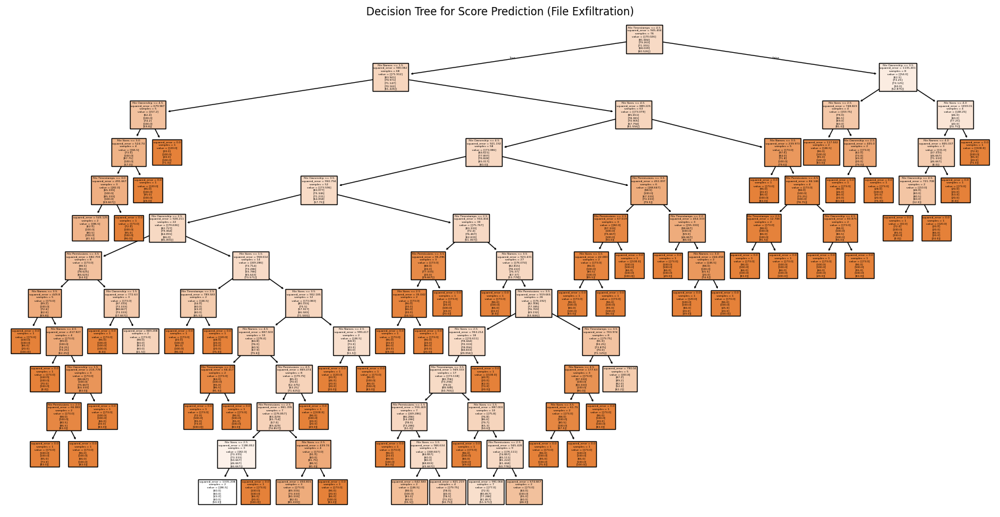

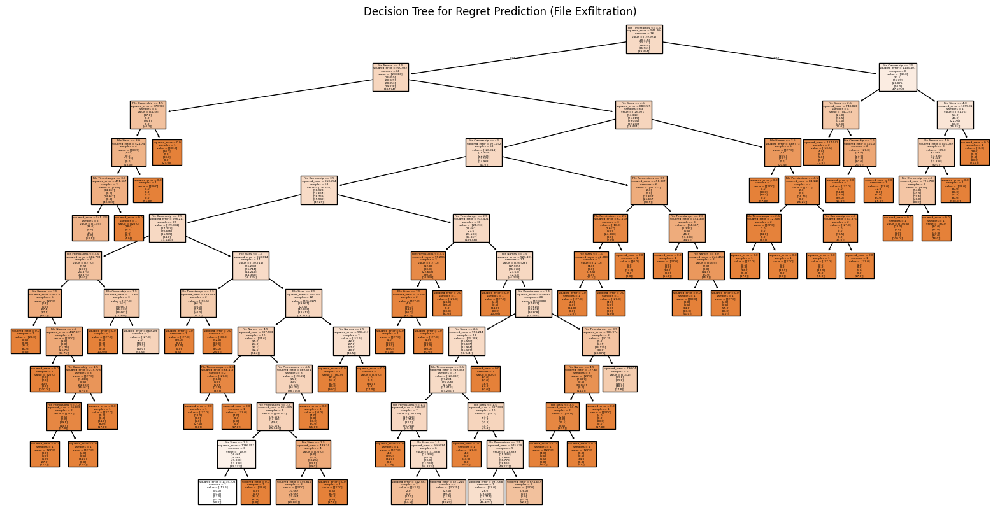

In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
import pandas as pd

# Load the dataset
file_path = '/content/Updated_Choice_Overload.csv'
updated_choice_overload_df = pd.read_csv(file_path)

# Define the feature mapping for File Exfiltration
feature_mapping = {
    'ci_co_fl_rank_1': 'File Ownership',
    'ci_co_fl_rank_2': 'File Permissions',
    'ci_co_fl_rank_3': 'File Timestamps',
    'ci_co_fl_rank_4': 'File Sizes',
    'ci_co_fl_rank_5': 'File Names'
}

# Select features based on the feature mapping
mapped_features = list(feature_mapping.keys())
X = updated_choice_overload_df[mapped_features].dropna()

# Rename columns for better interpretability
X.columns = [feature_mapping[col] for col in X.columns]

# Encode string values to numeric
X = X.apply(lambda col: pd.to_numeric(col.str.extract(r'(\d+)', expand=False), errors='coerce'))

# Select target columns for 'score' and 'regret'
y_score = updated_choice_overload_df[[col for col in updated_choice_overload_df.columns if 'ci_co_fl' in col and 'score' in col]].dropna()
y_regret = updated_choice_overload_df[[col for col in updated_choice_overload_df.columns if 'ci_co_fl' in col and 'regret' in col]].dropna()

# Ensure the feature set and targets have matching rows
X = X.iloc[:min(len(X), len(y_score), len(y_regret))]
y_score = y_score.iloc[:len(X)]
y_regret = y_regret.iloc[:len(X)]

# Encode target values to numeric if needed
y_score = y_score.apply(pd.to_numeric, errors='coerce')
y_regret = y_regret.apply(pd.to_numeric, errors='coerce')

# Split the dataset into training and testing sets
X_train, X_test, y_score_train, y_score_test = train_test_split(X, y_score, test_size=0.2, random_state=42)
X_train, X_test, y_regret_train, y_regret_test = train_test_split(X, y_regret, test_size=0.2, random_state=42)

# Train decision trees for 'score' and 'regret'
score_tree = DecisionTreeRegressor(random_state=42)
regret_tree = DecisionTreeRegressor(random_state=42)

score_tree.fit(X_train, y_score_train)
regret_tree.fit(X_train, y_regret_train)

# Predict on test data
y_score_pred = score_tree.predict(X_test)
y_regret_pred = regret_tree.predict(X_test)

# Evaluate performance
score_mse = mean_squared_error(y_score_test, y_score_pred)
score_r2 = r2_score(y_score_test, y_score_pred)

regret_mse = mean_squared_error(y_regret_test, y_regret_pred)
regret_r2 = r2_score(y_regret_test, y_regret_pred)

print(f"Score Prediction - MSE: {score_mse}, R²: {score_r2}")
print(f"Regret Prediction - MSE: {regret_mse}, R²: {regret_r2}")

# Visualize the decision tree for 'score'
plt.figure(figsize=(20, 10))
plot_tree(score_tree, feature_names=X.columns, filled=True)
plt.title("Decision Tree for Score Prediction (File Exfiltration)")
plt.show()

# Visualize the decision tree for 'regret'
plt.figure(figsize=(20, 10))
plot_tree(regret_tree, feature_names=X.columns, filled=True)
plt.title("Decision Tree for Regret Prediction (File Exfiltration)")
plt.show()

**Code to check overfitting**

In [ ]:
# Evaluate performance on the training set
y_score_train_pred = score_tree.predict(X_train)
y_regret_train_pred = regret_tree.predict(X_train)

score_train_mse = mean_squared_error(y_score_train, y_score_train_pred)
score_train_r2 = r2_score(y_score_train, y_score_train_pred)

regret_train_mse = mean_squared_error(y_regret_train, y_regret_train_pred)
regret_train_r2 = r2_score(y_regret_train, y_regret_train_pred)

# Print training performance
print(f"Score Prediction (Training) - MSE: {score_train_mse}, R²: {score_train_r2}")
print(f"Regret Prediction (Training) - MSE: {regret_train_mse}, R²: {regret_train_r2}")

# Compare training and testing performance
print(f"Score Prediction (Testing) - MSE: {score_mse}, R²: {score_r2}")
print(f"Regret Prediction (Testing) - MSE: {regret_mse}, R²: {regret_r2}")

Score Prediction (Training) - MSE: 543.8824622319688, R²: 0.39106884506005485
Regret Prediction (Training) - MSE: 543.8824622319688, R²: 0.39106884506005485
Score Prediction (Testing) - MSE: 1156.237694931774, R²: -0.9308552139175492
Regret Prediction (Testing) - MSE: 1156.237694931774, R²: -0.93085521391755


In [ ]:
from sklearn.model_selection import cross_val_score

cv_r2_scores = cross_val_score(score_tree, X, y_score, scoring='r2', cv=5)
cv_mse_scores = cross_val_score(score_tree, X, y_score, scoring='neg_mean_squared_error', cv=5)

print(f"Cross-Validation R² Scores: {cv_r2_scores}")
print(f"Cross-Validation MSE Scores: {cv_mse_scores}")

Cross-Validation R² Scores: [-0.62489551 -0.28778648 -0.64718574 -0.49194949 -0.37390295]
Cross-Validation MSE Scores: [-1587.76834248 -1155.30862927 -1102.71533158 -1533.95470461
 -1172.24913403]


Best parameters for Score Prediction: {'max_depth': 3, 'min_samples_leaf': 4, 'min_samples_split': 10}
Best parameters for Regret Prediction: {'max_depth': 3, 'min_samples_leaf': 4, 'min_samples_split': 10}
Tuned Score Prediction - MSE: 1010.8191669807865, R²: -0.8369196866935803
Tuned Regret Prediction - MSE: 1010.8191669807865, R²: -0.8369196866935807


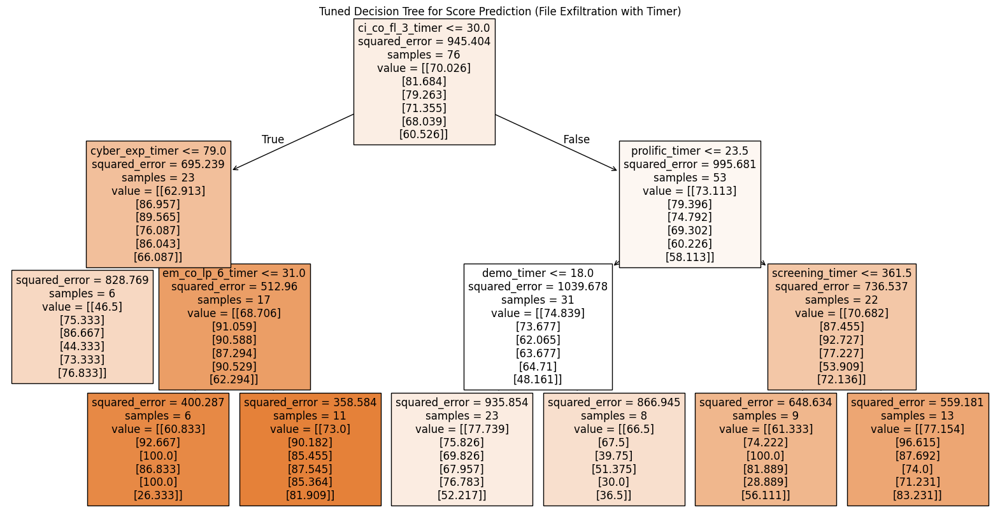

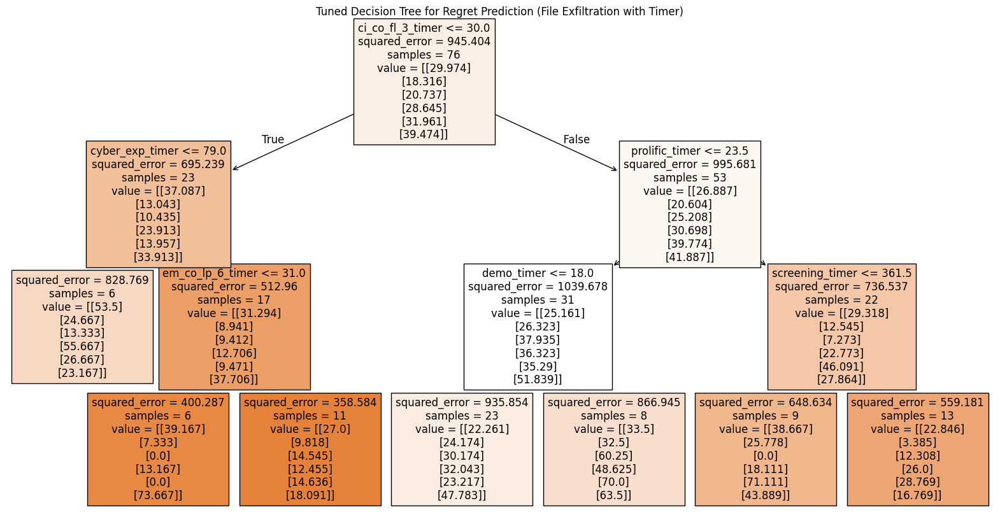

In [ ]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'max_depth': [3, 5, 10, None],  # Depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum samples required to split
    'min_samples_leaf': [1, 2, 4],  # Minimum samples required at a leaf node
}

# Initialize the Decision Tree Regressor
dt_regressor = DecisionTreeRegressor(random_state=42)

# Use GridSearchCV to find the best parameters
grid_search_score = GridSearchCV(estimator=dt_regressor, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search_regret = GridSearchCV(estimator=dt_regressor, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# Perform grid search for both score and regret
grid_search_score.fit(X_train, y_score_train)
grid_search_regret.fit(X_train, y_regret_train)

# Get the best parameters and best models
best_score_model = grid_search_score.best_estimator_
best_regret_model = grid_search_regret.best_estimator_

print("Best parameters for Score Prediction:", grid_search_score.best_params_)
print("Best parameters for Regret Prediction:", grid_search_regret.best_params_)

# Evaluate the tuned models on the test set
y_score_pred_tuned = best_score_model.predict(X_test)
y_regret_pred_tuned = best_regret_model.predict(X_test)

# Calculate performance metrics for tuned models
tuned_score_mse = mean_squared_error(y_score_test, y_score_pred_tuned)
tuned_score_r2 = r2_score(y_score_test, y_score_pred_tuned)

tuned_regret_mse = mean_squared_error(y_regret_test, y_regret_pred_tuned)
tuned_regret_r2 = r2_score(y_regret_test, y_regret_pred_tuned)

print(f"Tuned Score Prediction - MSE: {tuned_score_mse}, R²: {tuned_score_r2}")
print(f"Tuned Regret Prediction - MSE: {tuned_regret_mse}, R²: {tuned_regret_r2}")

# Visualize the tuned decision tree for 'score'
plt.figure(figsize=(20, 10))
plot_tree(best_score_model, feature_names=X.columns, filled=True)
plt.title("Tuned Decision Tree for Score Prediction (File Exfiltration with Timer)")
plt.show()

# Visualize the tuned decision tree for 'regret'
plt.figure(figsize=(20, 10))
plot_tree(best_regret_model, feature_names=X.columns, filled=True)
plt.title("Tuned Decision Tree for Regret Prediction (File Exfiltration with Timer)")
plt.show()

**Normalizing Time**

Best parameters for Score Prediction (Normalized): {'max_depth': 3, 'min_samples_leaf': 4, 'min_samples_split': 10}
Best parameters for Regret Prediction (Normalized): {'max_depth': 3, 'min_samples_leaf': 4, 'min_samples_split': 10}
Normalized Score Prediction - MSE: 1010.8191669807865, R²: -0.8369196866935803
Normalized Regret Prediction - MSE: 1010.8191669807865, R²: -0.8369196866935807


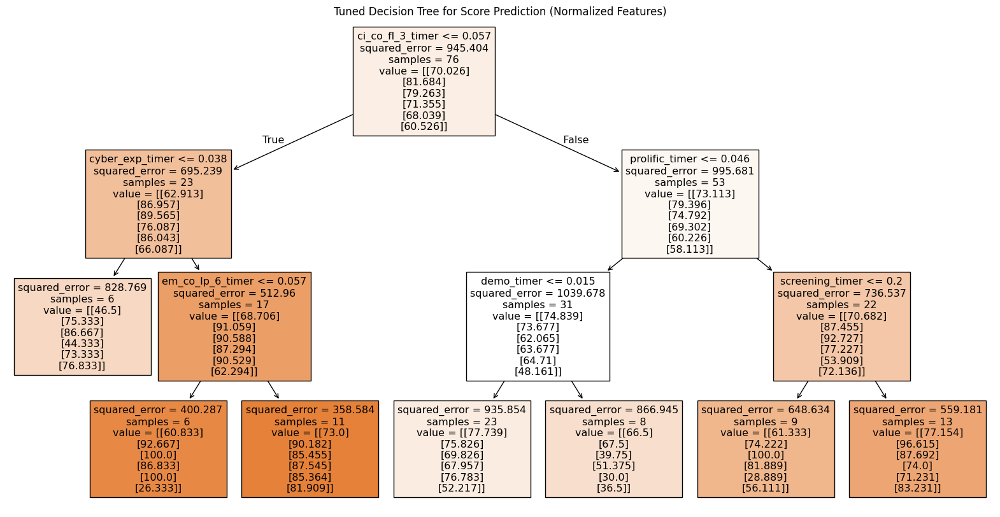

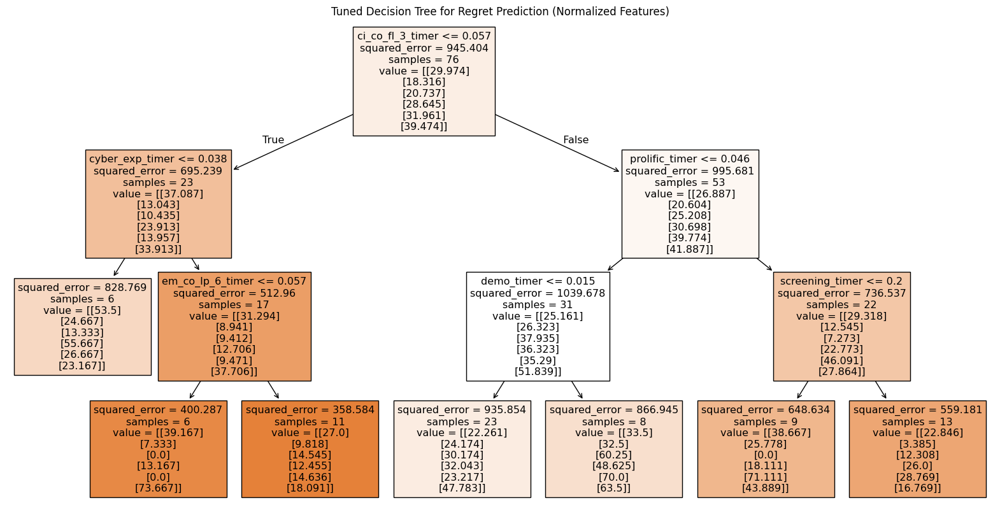

In [ ]:
import pandas as pd
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

# Load the dataset
file_path = '/content/Updated_Choice_Overload.csv'
updated_choice_overload_df = pd.read_csv(file_path)

# Define the feature mapping for File Exfiltration
feature_mapping = {
    'ci_co_fl_rank_1': 'File Ownership',
    'ci_co_fl_rank_2': 'File Permissions',
    'ci_co_fl_rank_3': 'File Timestamps',
    'ci_co_fl_rank_4': 'File Sizes',
    'ci_co_fl_rank_5': 'File Names'
}

# Include 'timer' data along with the original features
timer_features = [col for col in updated_choice_overload_df.columns if 'timer' in col]
all_features = list(feature_mapping.keys()) + timer_features

# Extract feature data
X = updated_choice_overload_df[all_features].dropna()

# Rename columns for interpretability
feature_mapping_with_timers = {**feature_mapping, **{col: col for col in timer_features}}
X.columns = [feature_mapping_with_timers.get(col, col) for col in X.columns]

# Encode string values to numeric for all features
def safe_extract_numeric(column):
    if column.dtype == 'object':  # Only apply extraction to string columns
        return pd.to_numeric(column.str.extract(r'(\d+)', expand=False), errors='coerce')
    return column  # Return numeric columns as-is

X = X.apply(safe_extract_numeric)

# Ensure targets are numeric and extract score and regret columns
y_score = updated_choice_overload_df[[col for col in updated_choice_overload_df.columns if 'ci_co_fl' in col and 'score' in col]].dropna()
y_regret = updated_choice_overload_df[[col for col in updated_choice_overload_df.columns if 'ci_co_fl' in col and 'regret' in col]].dropna()

# Align features and targets
X = X.iloc[:min(len(X), len(y_score), len(y_regret))]
y_score = y_score.iloc[:len(X)]
y_regret = y_regret.iloc[:len(X)]

# Convert target values to numeric if necessary
y_score = y_score.apply(pd.to_numeric, errors='coerce')
y_regret = y_regret.apply(pd.to_numeric, errors='coerce')

# Normalize the feature set
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Split the normalized dataset into training and testing sets
X_train_norm, X_test_norm, y_score_train, y_score_test = train_test_split(X_normalized, y_score, test_size=0.2, random_state=42)
X_train_norm, X_test_norm, y_regret_train, y_regret_test = train_test_split(X_normalized, y_regret, test_size=0.2, random_state=42)

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'max_depth': [3, 5, 10, None],  # Depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum samples required to split
    'min_samples_leaf': [1, 2, 4],  # Minimum samples required at a leaf node
}

# Initialize the Decision Tree Regressor
dt_regressor = DecisionTreeRegressor(random_state=42)

# Use GridSearchCV to find the best parameters with normalized features
grid_search_score_norm = GridSearchCV(estimator=dt_regressor, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search_regret_norm = GridSearchCV(estimator=dt_regressor, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# Perform grid search for both score and regret
grid_search_score_norm.fit(X_train_norm, y_score_train)
grid_search_regret_norm.fit(X_train_norm, y_regret_train)

# Get the best parameters and best models
best_score_model_norm = grid_search_score_norm.best_estimator_
best_regret_model_norm = grid_search_regret_norm.best_estimator_

print("Best parameters for Score Prediction (Normalized):", grid_search_score_norm.best_params_)
print("Best parameters for Regret Prediction (Normalized):", grid_search_regret_norm.best_params_)

# Evaluate the tuned models on the test set
y_score_pred_norm = best_score_model_norm.predict(X_test_norm)
y_regret_pred_norm = best_regret_model_norm.predict(X_test_norm)

# Calculate performance metrics for normalized models
norm_score_mse = mean_squared_error(y_score_test, y_score_pred_norm)
norm_score_r2 = r2_score(y_score_test, y_score_pred_norm)

norm_regret_mse = mean_squared_error(y_regret_test, y_regret_pred_norm)
norm_regret_r2 = r2_score(y_regret_test, y_regret_pred_norm)

print(f"Normalized Score Prediction - MSE: {norm_score_mse}, R²: {norm_score_r2}")
print(f"Normalized Regret Prediction - MSE: {norm_regret_mse}, R²: {norm_regret_r2}")

# Visualize the tuned decision tree for 'score' with normalized features
plt.figure(figsize=(20, 10))
plot_tree(best_score_model_norm, feature_names=X.columns, filled=True)
plt.title("Tuned Decision Tree for Score Prediction (Normalized Features)")
plt.show()

# Visualize the tuned decision tree for 'regret' with normalized features
plt.figure(figsize=(20, 10))
plot_tree(best_regret_model_norm, feature_names=X.columns, filled=True)
plt.title("Tuned Decision Tree for Regret Prediction (Normalized Features)")
plt.show()

**Gradient Boosting**

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler

# Normalize the feature set
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Simultaneously split the normalized features and both target variables
X_train_norm, X_test_norm, y_train, y_test = train_test_split(
    X_normalized,
    pd.concat([y_score, y_regret], axis=1),
    test_size=0.2,
    random_state=42
)

# Separate score and regret targets for training and testing
y_score_train, y_regret_train = y_train.iloc[:, 0], y_train.iloc[:, 1]
y_score_test, y_regret_test = y_test.iloc[:, 0], y_test.iloc[:, 1]

# Initialize Gradient Boosting Regressors for score and regret
gbr_score = GradientBoostingRegressor(random_state=42)
gbr_regret = GradientBoostingRegressor(random_state=42)

# Define the parameter grid for hyperparameter tuning
param_grid_gbr = {
    'n_estimators': [50, 100, 200],  # Number of boosting stages
    'learning_rate': [0.01, 0.1, 0.2],  # Learning rate
    'max_depth': [3, 5, 10],  # Depth of individual trees
    'min_samples_split': [2, 5, 10],  # Minimum samples to split a node
    'min_samples_leaf': [1, 2, 4],  # Minimum samples at a leaf node
}

# Use GridSearchCV to find the best parameters for Gradient Boosting
grid_search_gbr_score = GridSearchCV(estimator=gbr_score, param_grid=param_grid_gbr, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search_gbr_regret = GridSearchCV(estimator=gbr_regret, param_grid=param_grid_gbr, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# Perform grid search for both score and regret
grid_search_gbr_score.fit(X_train_norm, y_score_train)
grid_search_gbr_regret.fit(X_train_norm, y_regret_train)

# Get the best parameters and best models
best_gbr_score_model = grid_search_gbr_score.best_estimator_
best_gbr_regret_model = grid_search_gbr_regret.best_estimator_

print("Best parameters for Gradient Boosting Score Prediction:", grid_search_gbr_score.best_params_)
print("Best parameters for Gradient Boosting Regret Prediction:", grid_search_gbr_regret.best_params_)

# Evaluate the tuned Gradient Boosting models on the test set
y_score_pred_gbr = best_gbr_score_model.predict(X_test_norm)
y_regret_pred_gbr = best_gbr_regret_model.predict(X_test_norm)

# Calculate performance metrics for Gradient Boosting models
gbr_score_mse = mean_squared_error(y_score_test, y_score_pred_gbr)
gbr_score_r2 = r2_score(y_score_test, y_score_pred_gbr)

gbr_regret_mse = mean_squared_error(y_regret_test, y_regret_pred_gbr)
gbr_regret_r2 = r2_score(y_regret_test, y_regret_pred_gbr)

print(f"Gradient Boosting Score Prediction - MSE: {gbr_score_mse}, R²: {gbr_score_r2}")
print(f"Gradient Boosting Regret Prediction - MSE: {gbr_regret_mse}, R²: {gbr_regret_r2}")

Best parameters for Gradient Boosting Score Prediction: {'learning_rate': 0.01, 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}
Best parameters for Gradient Boosting Regret Prediction: {'learning_rate': 0.01, 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 50}
Gradient Boosting Score Prediction - MSE: 461.32914623691, R²: -0.027123273374723977
Gradient Boosting Regret Prediction - MSE: 494.42502408150597, R²: -3.9712409116929486


# **Ecological Validity**

##**Ecological Validity on Average Time**

In [ ]:
from tabulate import tabulate
from scipy import stats

file_path = "/content/Choice_Overload.csv"  # Update the path if needed
df = pd.read_csv(file_path)

# Define task column mappings
task_mappings = {
    "CM: File Exfiltration": {
        'ci_co_fl_1_timer': 'T1_L8',
        'ci_co_fl_2_timer': 'T2_H8',
        'ci_co_fl_3_timer': 'T3_L16',
        'ci_co_fl_4_timer': 'T4_H16',
        'ci_co_fl_5_timer': 'T5_L32',
        'ci_co_fl_6_timer': 'T6_H32'
    },
    "Non-Cyber: Laptop Purchasing": {
        'em_co_lp_1_timer': 'T1_L8',
        'em_co_lp_2_timer': 'T2_H8',
        'em_co_lp_3_timer': 'T3_L16',
        'em_co_lp_4_timer': 'T4_H16',
        'em_co_lp_5_timer': 'T5_L32',
        'em_co_lp_6_timer': 'T6_H32'
    },
    "CM: NMAP Port Scanning": {
        'ci_co_nmap_1_timer': 'T1_L8',
        'ci_co_nmap_2_timer': 'T2_H8',
        'ci_co_nmap_3_timer': 'T3_L16',
        'ci_co_nmap_4_timer': 'T4_H16',
        'ci_co_nmap_5_timer': 'T5_L32',
        'ci_co_nmap_6_timer': 'T6_H32'
    }
}

# Function to extract and clean task data
def analyze_task_raw(df, new_column_names):
    """ Extracts relevant task columns and removes NaN values. """
    df_task = df.rename(columns=new_column_names)
    return df_task[list(new_column_names.values())].dropna()

# Process task results
file_exfiltration_results = analyze_task_raw(df, task_mappings["CM: File Exfiltration"])
laptop_purchasing_results = analyze_task_raw(df, task_mappings["Non-Cyber: Laptop Purchasing"])
nmap_results = analyze_task_raw(df, task_mappings["CM: NMAP Port Scanning"])

# Function to compute mean and standard deviation for each trial
def compute_stats(task_results):
    """ Computes mean and standard deviation for each trial. """
    mean_values = task_results.mean()
    std_values = task_results.std()
    return mean_values, std_values

# Compute statistics
file_means, file_stds = compute_stats(file_exfiltration_results)
laptop_means, laptop_stds = compute_stats(laptop_purchasing_results)
nmap_means, nmap_stds = compute_stats(nmap_results)

# Create first table (File Exfiltration vs. Laptop Purchasing)
table1 = pd.DataFrame({
    "Trial": file_means.index,
    "File Exfiltration Avg Time": file_means.values,
    "File Exfiltration Std Dev": file_stds.values,
    "Laptop Purchasing Avg Time": laptop_means.values,
    "Laptop Purchasing Std Dev": laptop_stds.values
})

# Create second table (NMAP vs. Laptop Purchasing)
table2 = pd.DataFrame({
    "Trial": nmap_means.index,
    "NMAP Avg Time": nmap_means.values,
    "NMAP Std Dev": nmap_stds.values,
    "Laptop Purchasing Avg Time": laptop_means.values,
    "Laptop Purchasing Std Dev": laptop_stds.values
})

# Compute RangeMin, RangeMax, and Mean_CM in Range for File Exfiltration vs. Laptop Purchasing
table1["RangeMin"] = table1["Laptop Purchasing Avg Time"] - 1.5 * laptop_stds.values
table1["RangeMax"] = table1["Laptop Purchasing Avg Time"] + 1.5 * laptop_stds.values
table1["Mean_CM in Range"] = table1.apply(lambda row: "PASS" if row["RangeMin"] <= row["File Exfiltration Avg Time"] <= row["RangeMax"] else "FAIL", axis=1)

# Compute RangeMin, RangeMax, and Mean_CM in Range for NMAP vs. Laptop Purchasing
table2["RangeMin"] = table2["Laptop Purchasing Avg Time"] - 1.5 * laptop_stds.values
table2["RangeMax"] = table2["Laptop Purchasing Avg Time"] + 1.5 * laptop_stds.values
table2["Mean_CM in Range"] = table2.apply(lambda row: "PASS" if row["RangeMin"] <= row["NMAP Avg Time"] <= row["RangeMax"] else "FAIL", axis=1)

# Compute ANOVA and Chi-Square per trial

# Fix ANOVA calculation by selecting full columns instead of single values

# Initialize lists for storing results
anova_f_stats1, anova_p_values1 = [], []
anova_f_stats2, anova_p_values2 = [], []

# Iterate over each trial and compute ANOVA separately
for i in range(len(file_exfiltration_results.columns)):
    # Extract full columns for ANOVA instead of single values
    if file_exfiltration_results.iloc[:, i].nunique() > 1 and laptop_purchasing_results.iloc[:, i].nunique() > 1:
        f_stat, p_value = stats.f_oneway(
            file_exfiltration_results.iloc[:, i],  # All values for this trial
            laptop_purchasing_results.iloc[:, i]  # All values for this trial
        )
    else:
        f_stat, p_value = np.nan, np.nan  # If all values are constant, ANOVA is not valid

    anova_f_stats1.append(f_stat)
    anova_p_values1.append(p_value)

    if nmap_results.iloc[:, i].nunique() > 1 and laptop_purchasing_results.iloc[:, i].nunique() > 1:
        f_stat, p_value = stats.f_oneway(
            nmap_results.iloc[:, i],
            laptop_purchasing_results.iloc[:, i]
        )
    else:
        f_stat, p_value = np.nan, np.nan

    anova_f_stats2.append(f_stat)
    anova_p_values2.append(p_value)

# Add per-trial ANOVA results to tables
table1["ANOVA F-Statistic (Per Trial)"] = anova_f_stats1
table1["ANOVA P-Value (Per Trial)"] = anova_p_values1
table1["ANOVA Significance (Per Trial)"] = table1["ANOVA P-Value (Per Trial)"].apply(lambda p: "Yes" if p < 0.05 else "No")

table2["ANOVA F-Statistic (Per Trial)"] = anova_f_stats2
table2["ANOVA P-Value (Per Trial)"] = anova_p_values2
table2["ANOVA Significance (Per Trial)"] = table2["ANOVA P-Value (Per Trial)"].apply(lambda p: "Yes" if p < 0.05 else "No")

# Fixing Chi-Square computation by handling invalid contingency tables

# Initialize lists for storing results
chi2_stats1, chi2_p_values1 = [], []
chi2_stats2, chi2_p_values2 = [], []

# Define bins and labels for categorization (merged low categories to avoid empty bins)
num_bins = 3  # Using fewer bins to reduce empty categories
labels = ["Low", "Medium", "High"]

# Iterate over each trial and compute Chi-Square separately
for i in range(len(file_exfiltration_results.columns)):
    # Categorize data into bins
    file_exfiltration_cat = pd.cut(file_exfiltration_results.iloc[:, i], bins=num_bins, labels=labels)
    laptop_purchasing_cat = pd.cut(laptop_purchasing_results.iloc[:, i], bins=num_bins, labels=labels)

    # Create contingency table
    contingency_table1 = pd.crosstab(file_exfiltration_cat, laptop_purchasing_cat)

    # Compute Chi-Square test only if the table has valid data
    if contingency_table1.shape == (num_bins, num_bins) and (contingency_table1.values.sum() > 0):
        chi2_stat, p_value, _, _ = stats.chi2_contingency(contingency_table1)
    else:
        chi2_stat, p_value = np.nan, np.nan  # Assign NaN if invalid

    chi2_stats1.append(chi2_stat)
    chi2_p_values1.append(p_value)

    # Repeat for NMAP vs. Laptop Purchasing
    nmap_cat = pd.cut(nmap_results.iloc[:, i], bins=num_bins, labels=labels)
    contingency_table2 = pd.crosstab(nmap_cat, laptop_purchasing_cat)

    if contingency_table2.shape == (num_bins, num_bins) and (contingency_table2.values.sum() > 0):
        chi2_stat, p_value, _, _ = stats.chi2_contingency(contingency_table2)
    else:
        chi2_stat, p_value = np.nan, np.nan

    chi2_stats2.append(chi2_stat)
    chi2_p_values2.append(p_value)

# Add per-trial Chi-Square results to tables
table1["Chi-Square Statistic (Per Trial)"] = chi2_stats1
table1["Chi-Square P-Value (Per Trial)"] = chi2_p_values1
table1["Chi-Square Significance (Per Trial)"] = table1["Chi-Square P-Value (Per Trial)"].apply(lambda p: "Yes" if p < 0.05 else "No")

table2["Chi-Square Statistic (Per Trial)"] = chi2_stats2
table2["Chi-Square P-Value (Per Trial)"] = chi2_p_values2
table2["Chi-Square Significance (Per Trial)"] = table2["Chi-Square P-Value (Per Trial)"].apply(lambda p: "Yes" if p < 0.05 else "No")

# Round all numeric columns to 2 decimal places
table1 = table1.round(2)
table2 = table2.round(2)

# Display updated tables with 5 bins using tabulate
print("\nUpdated File Exfiltration vs. Laptop Purchasing:\n")
print(tabulate(table1, headers='keys', tablefmt='psql'))

print("\nUpdated NMAP vs. Laptop Purchasing:\n")
print(tabulate(table2, headers='keys', tablefmt='psql'))

# Define the file path for saving the CSV
output_file = "Ecological Validity_Average Time.csv"

# Add a separator row to differentiate the two tables
separator = pd.DataFrame([["---"] * table1.shape[1]], columns=table1.columns)

# Concatenate tables with the separator row in between
combined_table = pd.concat([table1, separator, table2])

# Save to CSV
combined_table.to_csv(output_file, index=False)
print(f"CSV file saved successfully as {output_file}")


Updated File Exfiltration vs. Laptop Purchasing:

+----+---------+------------------------------+-----------------------------+------------------------------+-----------------------------+------------+------------+--------------------+---------------------------------+-----------------------------+----------------------------------+------------------------------------+----------------------------------+---------------------------------------+
|    | Trial   |   File Exfiltration Avg Time |   File Exfiltration Std Dev |   Laptop Purchasing Avg Time |   Laptop Purchasing Std Dev |   RangeMin |   RangeMax | Mean_CM in Range   |   ANOVA F-Statistic (Per Trial) |   ANOVA P-Value (Per Trial) | ANOVA Significance (Per Trial)   |   Chi-Square Statistic (Per Trial) |   Chi-Square P-Value (Per Trial) | Chi-Square Significance (Per Trial)   |
|----+---------+------------------------------+-----------------------------+------------------------------+-----------------------------+------------+----

In [ ]:
print("File Exfiltration Contingency Table:")
print(contingency_table1)

print("\nNMAP Contingency Table:")
print(contingency_table2)

File Exfiltration Contingency Table:
T6_H32  Low  Medium  High
T6_H32                   
Low      89       1     1
Medium    3       0     0
High      1       0     0

NMAP Contingency Table:
T6_H32  Low  Medium  High
T6_H32                   
Low      79       1     1
Medium    6       0     0
High      8       0     0


## **Ecological Validity_Average Regret**

In [ ]:
from tabulate import tabulate
from scipy import stats

file_path = "/content/Updated_Choice_Overload.csv"  # Update the path if needed
df = pd.read_csv(file_path)

# Define task column mappings
task_mappings = {
    "CM: File Exfiltration": {
        'ci_co_fl_1_regret': 'T1_L8',
        'ci_co_fl_2_regret': 'T2_H8',
        'ci_co_fl_3_regret': 'T3_L16',
        'ci_co_fl_4_regret': 'T4_H16',
        'ci_co_fl_5_regret': 'T5_L32',
        'ci_co_fl_6_regret': 'T6_H32'
    },
    "Non-Cyber: Laptop Purchasing": {
        'em_co_lp_1_regret': 'T1_L8',
        'em_co_lp_2_regret': 'T2_H8',
        'em_co_lp_3_regret': 'T3_L16',
        'em_co_lp_4_regret': 'T4_H16',
        'em_co_lp_5_regret': 'T5_L32',
        'em_co_lp_6_regret': 'T6_H32'
    },
    "CM: NMAP Port Scanning": {
        'ci_co_nmap_1_regret': 'T1_L8',
        'ci_co_nmap_2_regret': 'T2_H8',
        'ci_co_nmap_3_regret': 'T3_L16',
        'ci_co_nmap_4_regret': 'T4_H16',
        'ci_co_nmap_5_regret': 'T5_L32',
        'ci_co_nmap_6_regret': 'T6_H32'
    }
}

# Function to extract and clean task data
def analyze_task_raw(df, new_column_names):
    """ Extracts relevant task columns and removes NaN values. """
    df_task = df.rename(columns=new_column_names)
    return df_task[list(new_column_names.values())].dropna()

# Process task results
file_exfiltration_results = analyze_task_raw(df, task_mappings["CM: File Exfiltration"])
laptop_purchasing_results = analyze_task_raw(df, task_mappings["Non-Cyber: Laptop Purchasing"])
nmap_results = analyze_task_raw(df, task_mappings["CM: NMAP Port Scanning"])

# Function to compute mean and standard deviation for each trial
def compute_stats(task_results):
    """ Computes mean and standard deviation for each trial. """
    mean_values = task_results.mean()
    std_values = task_results.std()
    return mean_values, std_values

# Compute statistics
file_means, file_stds = compute_stats(file_exfiltration_results)
laptop_means, laptop_stds = compute_stats(laptop_purchasing_results)
nmap_means, nmap_stds = compute_stats(nmap_results)

# Create first table (File Exfiltration vs. Laptop Purchasing)
table1 = pd.DataFrame({
    "Trial": file_means.index,
    "File Exfiltration Avg Regret": file_means.values,
    "File Exfiltration Std Dev": file_stds.values,
    "Laptop Purchasing Avg Regret": laptop_means.values,
    "Laptop Purchasing Std Dev": laptop_stds.values
})

# Create second table (NMAP vs. Laptop Purchasing)
table2 = pd.DataFrame({
    "Trial": nmap_means.index,
    "NMAP Avg Regret": nmap_means.values,
    "NMAP Std Dev": nmap_stds.values,
    "Laptop Purchasing Avg Regret": laptop_means.values,
    "Laptop Purchasing Std Dev": laptop_stds.values
})

# Compute RangeMin, RangeMax, and Mean_CM in Range for File Exfiltration vs. Laptop Purchasing
table1["RangeMin"] = table1["Laptop Purchasing Avg Regret"] - 1.5 * laptop_stds.values
table1["RangeMax"] = table1["Laptop Purchasing Avg Regret"] + 1.5 * laptop_stds.values
table1["Mean_CM in Range"] = table1.apply(lambda row: "PASS" if row["RangeMin"] <= row["File Exfiltration Avg Regret"] <= row["RangeMax"] else "FAIL", axis=1)

# Compute RangeMin, RangeMax, and Mean_CM in Range for NMAP vs. Laptop Purchasing
table2["RangeMin"] = table2["Laptop Purchasing Avg Regret"] - 1.5 * laptop_stds.values
table2["RangeMax"] = table2["Laptop Purchasing Avg Regret"] + 1.5 * laptop_stds.values
table2["Mean_CM in Range"] = table2.apply(lambda row: "PASS" if row["RangeMin"] <= row["NMAP Avg Regret"] <= row["RangeMax"] else "FAIL", axis=1)

# Compute ANOVA and Chi-Square per trial

# Fix ANOVA calculation by selecting full columns instead of single values

# Initialize lists for storing results
anova_f_stats1, anova_p_values1 = [], []
anova_f_stats2, anova_p_values2 = [], []

# Iterate over each trial and compute ANOVA separately
for i in range(len(file_exfiltration_results.columns)):
    # Extract full columns for ANOVA instead of single values
    if file_exfiltration_results.iloc[:, i].nunique() > 1 and laptop_purchasing_results.iloc[:, i].nunique() > 1:
        f_stat, p_value = stats.f_oneway(
            file_exfiltration_results.iloc[:, i],  # All values for this trial
            laptop_purchasing_results.iloc[:, i]  # All values for this trial
        )
    else:
        f_stat, p_value = np.nan, np.nan  # If all values are constant, ANOVA is not valid

    anova_f_stats1.append(f_stat)
    anova_p_values1.append(p_value)

    if nmap_results.iloc[:, i].nunique() > 1 and laptop_purchasing_results.iloc[:, i].nunique() > 1:
        f_stat, p_value = stats.f_oneway(
            nmap_results.iloc[:, i],
            laptop_purchasing_results.iloc[:, i]
        )
    else:
        f_stat, p_value = np.nan, np.nan

    anova_f_stats2.append(f_stat)
    anova_p_values2.append(p_value)

# Add per-trial ANOVA results to tables
table1["ANOVA F-Statistic (Mean)"] = anova_f_stats1
table1["ANOVA P-Value (Mean)"] = anova_p_values1
table1["ANOVA Significance (Mean)"] = table1["ANOVA P-Value (Mean)"].apply(lambda p: "Yes" if p < 0.05 else "No")

table2["ANOVA F-Statistic (Mean)"] = anova_f_stats2
table2["ANOVA P-Value (Mean)"] = anova_p_values2
table2["ANOVA Significance (Mean)"] = table2["ANOVA P-Value (Mean)"].apply(lambda p: "Yes" if p < 0.05 else "No")

# Fixing Chi-Square computation by handling invalid contingency tables

# Initialize lists for storing results
chi2_stats1, chi2_p_values1 = [], []
chi2_stats2, chi2_p_values2 = [], []

# Define bins and labels for categorization (merged low categories to avoid empty bins)
num_bins = 3  # Using fewer bins to reduce empty categories
labels = ["Low", "Medium", "High"]

# Iterate over each trial and compute Chi-Square separately
for i in range(len(file_exfiltration_results.columns)):
    # Categorize data into bins
    file_exfiltration_cat = pd.cut(file_exfiltration_results.iloc[:, i], bins=num_bins, labels=labels)
    laptop_purchasing_cat = pd.cut(laptop_purchasing_results.iloc[:, i], bins=num_bins, labels=labels)

    # Create contingency table
    contingency_table1 = pd.crosstab(file_exfiltration_cat, laptop_purchasing_cat)

    # Compute Chi-Square test only if the table has valid data
    if contingency_table1.shape == (num_bins, num_bins) and (contingency_table1.values.sum() > 0):
        chi2_stat, p_value, _, _ = stats.chi2_contingency(contingency_table1)
    else:
        chi2_stat, p_value = np.nan, np.nan  # Assign NaN if invalid

    chi2_stats1.append(chi2_stat)
    chi2_p_values1.append(p_value)

    # Repeat for NMAP vs. Laptop Purchasing
    nmap_cat = pd.cut(nmap_results.iloc[:, i], bins=num_bins, labels=labels)
    contingency_table2 = pd.crosstab(nmap_cat, laptop_purchasing_cat)

    if contingency_table2.shape == (num_bins, num_bins) and (contingency_table2.values.sum() > 0):
        chi2_stat, p_value, _, _ = stats.chi2_contingency(contingency_table2)
    else:
        chi2_stat, p_value = np.nan, np.nan

    chi2_stats2.append(chi2_stat)
    chi2_p_values2.append(p_value)

# Add per-trial Chi-Square results to tables
table1["Chi-Square Statistic (Per Trial)"] = chi2_stats1
table1["Chi-Square P-Value (Per Trial)"] = chi2_p_values1
table1["Chi-Square Significance (Per Trial)"] = table1["Chi-Square P-Value (Per Trial)"].apply(lambda p: "Yes" if p < 0.05 else "No")

table2["Chi-Square Statistic (Per Trial)"] = chi2_stats2
table2["Chi-Square P-Value (Per Trial)"] = chi2_p_values2
table2["Chi-Square Significance (Per Trial)"] = table2["Chi-Square P-Value (Per Trial)"].apply(lambda p: "Yes" if p < 0.05 else "No")

# Display updated tables with 5 bins using tabulate
print("\nUpdated File Exfiltration vs. Laptop Purchasing:\n")
print(tabulate(table1, headers='keys', tablefmt='psql'))

print("\nUpdated NMAP vs. Laptop Purchasing:\n")
print(tabulate(table2, headers='keys', tablefmt='psql'))

# Define the file path for saving the CSV
output_file = "Ecological Validity_Average Regret.csv"

# Add a separator row to differentiate the two tables
separator = pd.DataFrame([["---"] * table1.shape[1]], columns=table1.columns)

# Concatenate tables with the separator row in between
combined_table = pd.concat([table1, separator, table2])

# Save to CSV
combined_table.to_csv(output_file, index=False)
print(f"CSV file saved successfully as {output_file}")


Updated File Exfiltration vs. Laptop Purchasing:

+----+---------+--------------------------------+-----------------------------+--------------------------------+-----------------------------+------------+------------+--------------------+----------------------------+------------------------+-----------------------------+------------------------------------+----------------------------------+---------------------------------------+
|    | Trial   |   File Exfiltration Avg Regret |   File Exfiltration Std Dev |   Laptop Purchasing Avg Regret |   Laptop Purchasing Std Dev |   RangeMin |   RangeMax | Mean_CM in Range   |   ANOVA F-Statistic (Mean) |   ANOVA P-Value (Mean) | ANOVA Significance (Mean)   |   Chi-Square Statistic (Per Trial) |   Chi-Square P-Value (Per Trial) | Chi-Square Significance (Per Trial)   |
|----+---------+--------------------------------+-----------------------------+--------------------------------+-----------------------------+------------+------------+---------

In [ ]:
print("File Exfiltration Contingency Table:")
print(contingency_table1)

print("\nNMAP Contingency Table:")
print(contingency_table2)

File Exfiltration Contingency Table:
T6_H32  Low  Medium  High
T6_H32                   
Low      63       4     6
Medium    6       3     1
High      9       2     1

NMAP Contingency Table:
T6_H32  Low  Medium  High
T6_H32                   
Low      52       2     3
Medium    8       1     1
High     18       6     4


# **Position Bias**

## **Position for all Examples**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random

file_exfiltration_position = {
  'Trial 1': {
    'aug_patch_notes.docx' :1,
    'aug_update_data.zip' :2,
    'README.txt' :3,
    't1.enc' :4,
    't2.enc' :5,
    'patcher' :6,
    'temp_parser.py' :7,
    'aug_patch_notes.pdf' :8
  },
  'Trial 2': {
    'cplan_overview.pptx' :1,
    'cplan_package.enc' :2,
    'cplan.pdf' :3,
    'cplan_working_doc.docx' :4,
    'data_t1.zip' :5,
    'jul12notes.txt' :6,
    'parse_data.sh' :7,
    'parsed_doc.txt' :8
  },
  'Trial 3': {
    'data_record.xls' :1,
    'monthly_increment_tracker.txt' :2,
    'test2.py' :3,
    'test.py' :4,
    'transfer.txt' :5,
    'zephyr_codes.enc' :6,
    'zephyr_data01.zip' :7,
    'zephyr_data02.zip' :8,
    'zephyr_data03.zip' :9,
    'zephyr_data04.zip' :10,
    'zephyr_data05.zip' :11,
    'zephyr_instructions.txt' :12,
    'zephyr_manual.pdf' :13,
    'zephyr_run' :14,
    'zephyr_training.pptx' :15,
    'zephyr_working_doc.docx' :16
  },
  'Trial 4': {
    'COMET_augUpdate.pptx' :1,
    'COMET_augUpdateWorkingDoc.docx' :2,
    'COMET_bugResolution.pptx' :3,
    'COMET_bugResolutionWorkingDoc.docx' :4,
    'COMET_monthlyReport.docx' :5,
    'COMET_userBreakdown.pptx' :6,
    'COMET_userBreakdownWorkingDoc.docx' :7,
    'processedUserData.xls' :8,
    'process_userData.py' :9,
    'README.txt' :10,
    'userData1.enc' :11,
    'userData2.enc' :12,
    'userData3.enc' :13,
    'userDataInstructionNotes.txt' :14,
    'userGraph.png' :15,
    'userReport.pdf' :16
	},
  'Trial 5': {
    'aug_monthly_update_working_doc.docx' :1,
    'data_overview.docx' :2,
    'JAPPA' :3,
    'jappa_data1.zip' :4,
    'jappa_data2.zip' :5,
    'jappa_data3.zip' :6,
    'jappa_data4.zip' :7,
    'jappa_data5.zip' :8,
    'jappa_data_graphic.png' :9,
    'jappa_Export.py' :10,
    'jappa_format_example.json' :11,
    'jappa_maintenance_manual.pdf' :12,
    'jappa_mapper.py' :13,
    'jappa_overview.pptx' :14,
    'jappa_parsed_1.xls' :15,
    'jappa_parsed_2.xls' :16,
    'jappa_system_analysis_v0.pptx' :17,
    'jappa_system_analysis_v1.pptx' :18,
    'jappa_system_analysis_v1.1.pptx' :19,
    'jappa_system_analysis_v2.pptx' :20,
    'jappa_template1.txt' :21,
    'jappa_template2.txt' :22,
    'jappa_template3.txt' :23,
    'jappa_user_manual.pdf' :24,
    'notes.txt' :25,
    'system1_benchmark.json' :26,
    'system2_benchmark.json' :27,
    'system3_benchmark.json' :28,
    'system_pack1.zip' :29,
    'system_pack2.zip' :30,
    'system_pack3.zip' :31,
    'systems_graphic.png' :32
  },
  'Trial 6': {
    'core_data1.enc' :1,
    'core_data2.enc' :2,
    'cvv_report.pdf' :3,
    'datadump01.zip' :4,
    'datadump02.zip' :5,
    'datadump03.zip' :6,
    'datadump_graph1.png' :7,
    'datadump_graph2.png' :8,
    'datadump_graph3.png' :9,
    'datadump_tracker.txt' :10,
    'data_parse.py' :11,
    'data_sort.py' :12,
    'dump01_parsed.xls' :13,
    'dump02_parsed.xls' :14,
    'dump03_parsed.xls' :15,
    'generate_graph.py' :16,
    'generate_png.py' :17,
    'generate_report.py' :18,
    'jul_monthly_overview.pdf' :19,
    'jul_report.pptx' :20,
    'jul_working_doc.docx' :21,
    'jun_monthly_overview.pdf' :22,
    'jun_report.pptx' :23,
    'jun_working_doc.docx' :24,
    'may_monthly_overview.pdf' :25,
    'may_report.pptx' :26,
    'may_working_doc.docx' :27,
    'proceed_notes.txt' :28,
    'process_1' :29,
    'process_2' :30,
    'README.txt' :31,
    'vnr_report.pdf' :32
  }
}

laptop_purchasing_position= {
  'Trial 1': {
    'A' : 1,
    'B' : 2,
    'C' : 3,
    'D' : 4,
    'E' : 5,
    'F' : 6,
    'G' : 7,
    'H' : 8
},
  'Trial 2': {
    'A' : 1,
    'B' : 2,
    'C' : 3,
    'D' : 4,
    'E' : 5,
    'F' : 6,
    'G' : 7,
    'H' : 8
},
  'Trial 3': {
    'A' : 1,
    'B' : 2,
    'C' : 3,
    'D' : 4,
    'E' : 5,
    'F' : 6,
    'G' : 7,
    'H' : 8,
    'I' : 9,
    'J' : 10,
    'K' : 11,
    'L' : 12,
    'M' : 13,
    'N' : 14,
    'O' : 15,
    'P' : 16
},
  'Trial 4': {
    'A' : 1,
    'B' : 2,
    'C' : 3,
    'D' : 4,
    'E' : 5,
    'F' : 6,
    'G' : 7,
    'H' : 8,
    'I' : 9,
    'J' : 10,
    'K' : 11,
    'L' : 12,
    'M' : 13,
    'N' : 14,
    'O' : 15,
    'P' : 16
},
  'Trial 5': {
    'A' : 1,
    'B' : 2,
    'C' : 3,
    'D' : 4,
    'E' : 5,
    'F' : 6,
    'G' : 7,
    'H' : 8,
    'I' : 9,
    'J' : 10,
    'K' : 11,
    'L' : 12,
    'M' : 13,
    'N' : 14,
    'O' : 15,
    'P' : 16,
    'Q' : 17,
    'R' : 18,
    'S' : 19,
    'T' : 20,
    'U' : 21,
    'V' : 22,
    'W' : 23,
    'X' : 24,
    'Y' : 25,
    'Z' : 26,
    'AA' : 27,
    'BB' : 28,
    'CC' : 29,
    'DD' : 30,
    'EE' : 31,
    'FF' : 32
},
  'Trial 6': {
    'A' : 1,
    'B' : 2,
    'C' : 3,
    'D' : 4,
    'E' : 5,
    'F' : 6,
    'G' : 7,
    'H' : 8,
    'I' : 9,
    'J' : 10,
    'K' : 11,
    'L' : 12,
    'M' : 13,
    'N' : 14,
    'O' : 15,
    'P' : 16,
    'Q' : 17,
    'R' : 18,
    'S' : 19,
    'T' : 20,
    'U' : 21,
    'V' : 22,
    'W' : 23,
    'X' : 24,
    'Y' : 25,
    'Z' : 26,
    'AA' : 27,
    'BB' : 28,
    'CC' : 29,
    'DD' : 30
}
}

nmap_position= {
  'Trial 1': {
    '192.168.56.104:80' : 1,
    '192.168.56.104:5900' : 2,
    '192.168.56.105:5984' : 3,
    '192.168.56.106:3000' : 4,
    '192.168.56.107:5432' : 5,
    '192.168.56.108:80' : 6,
    '192.168.56.109:25' : 7,
    '192.168.56.110:80' : 8
  },
  'Trial 2': {
    '192.168.56.104:80' : 1,
    '192.168.56.104:5900' : 2,
    '192.168.56.105:5984' : 3,
    '192.168.56.106:3000' : 4,
    '192.168.56.107:5432' : 5,
    '192.168.56.108:80' : 6,
    '192.168.56.109:25' : 7,
    '192.168.56.110:80' : 8
  },
  'Trial 3': {
    '192.168.56.104:80' : 1,
    '192.168.56.104:5900' : 2,
    '192.168.56.105:80' : 3,
    '192.168.56.105:443' : 4,
    '192.168.56.105:8080' : 5,
    '192.168.56.106:5432' : 6,
    '192.168.56.107:80' : 7,
    '192.168.56.107:5900' : 8,
    '192.168.56.108:5432' : 9,
    '192.168.56.109:8484' : 10,
    '192.168.56.110:80' : 11,
    '192.168.56.110:8080' : 12,
    '192.168.56.111:80' : 13,
    '192.168.56.111:443' : 14,
    '192.168.56.111:8080' : 15,
    '192.168.56.112:3306' : 16
  },
  'Trial 4': {
    '192.168.56.102:80' : 1,
    '192.168.56.102:3306' : 2,
    '192.168.56.102:8484' : 3,
    '192.168.56.104:80' : 4,
    '192.168.56.104:5484' : 5,
    '198.168.56.104:5900' : 6,
    '192.168.56.105:80' : 7,
    '192.168.56.105:443' : 8,
    '192.168.56.105:3306' : 9,
    '192.168.56.105:8080' : 10,
    '192.168.56.106:80' : 11,
    '192.168.56.106:5432' : 12,
    '192.168.56.106:8080' : 13,
    '192.168.56.107:80' : 14,
    '192.168.56.107:5432' : 15,
    '192.168.56.107:5900' : 16,
    '192.168.56.108:80' : 17,
    '192.168.56.108:4704' : 18,
    '192.168.56.108:5432' : 19,
    '192.168.56.109:8080' : 20,
    '192.168.56.109:8484' : 21,
    '192.168.56.110:80' : 22,
    '192.168.56.110:3306' : 23,
    '192.168.56.110:8080' : 24,
    '192.168.56.111:80' : 25,
    '192.168.56.111:443' : 26,
    '192.168.56.111:8080' : 27,
    '192.168.56.112:3306' : 28,
    '192.168.56.112:80' : 29,
    '192.168.56.112:4703' : 30,
    '192.168.56.112:4705' : 31,
    '192.168.56.112:4706' : 32,
    '192.168.56.112:4700' : 33,
    '192.168.56.112:4711' : 34
  },
  'Trial 5': {
    '192.168.56.104:80' : 1,
    '192.168.56.104:5984' : 2,
    '192.168.56.105:22' : 3,
    '192.168.56.105:80' : 4,
    '192.168.56.105:5984' : 5,
    '192.168.56.106:80' : 6,
    '192.168.56.106:3000' : 7,
    '192.168.56.107:22' : 8,
    '192.168.56.107:80' : 9,
    '192.168.56.107:5432' : 10,
    '192.168.56.108:80' : 11,
    '192.168.56.108:3306' : 12,
    '192.168.56.109:3306' : 13,
    '192.168.56.110:22' : 14,
    '192.168.56.111:80' : 15,
    '192.168.56.111:3000' : 16,
    '192.168.56.111:7687' : 17,
    '192.168.56.112:3000' : 18,
    '192.168.56.113:8080' : 19,
    '192.168.56.114:25' : 20,
    '192.168.56.115:8080' : 21,
    '192.168.56.115:80' : 22,
    '192.168.56.115:443' : 23,
    '192.168.56.116:22' : 24,
    '192.168.56.117:3000' : 25,
    '192.168.56.118:21' : 26,
    '192.168.56.119:8080' : 27,
    '192.168.56.119:80' : 28,
    '192.168.56.119:443' : 29,
    '192.168.56.120:7474' : 30,
    '192.168.56.120:7687' : 31,
    '192.168.56.121:7474' : 32,
    '192.168.56.121:7687' : 33,
    '192.168.56.122:25' : 34,
    '192.168.56.123:25' : 35,
    '192.168.56.124:5432' : 36,
    '192.168.56.125:5432' : 37,
    '192.168.56.125:8080' : 38,
    '192.168.56.126:5432' : 39,
    '192.168.56.126:5984' : 40,
    '192.168.56.127:3000' : 41,
    '192.168.56.127:7474' : 42,
    '192.168.56.128:80' : 43,
    '192.168.56.128:8080' : 44,
    '192.168.56.129:80' : 45
  },
  'Trial 6': {
    '192.168.56.210:20' : 1,
    '192.168.56.210:21' : 2,
    '192.168.56.210:22' : 3,
    '192.168.56.210:25' : 4,
    '192.168.56.210:80' : 5,
    '192.168.56.210:443' : 6,
    '192.168.56.210:3000' : 7,
    '192.168.56.210:4700' : 8,
    '192.168.56.210:4701' : 9,
    '192.168.56.210:4702' : 10,
    '192.168.56.210:4703' : 11,
    '192.168.56.210:4704' : 12,
    '192.168.56.210:4705' : 13,
    '192.168.56.210:4706' : 14,
    '192.168.56.210:4707' : 15,
    '192.168.56.210:4708' : 16,
    '192.168.56.210:4709' : 17,
    '192.168.56.210:4710' : 18,
    '192.168.56.210:4711' : 19,
    '192.168.56.210:4712' : 20,
    '192.168.56.210:4713' : 21,
    '192.168.56.210:4714' : 22,
    '192.168.56.210:4715' : 23,
    '192.168.56.210:4716' : 24,
    '192.168.56.210:4717' : 25,
    '192.168.56.210:4718' : 26,
    '192.168.56.210:4719' : 27,
    '192.168.56.210:4720' : 28,
    '192.168.56.210:4721' : 29,
    '192.168.56.210:4722' : 30,
    '192.168.56.210:4723' : 31,
    '192.168.56.210:4724' : 32,
    '192.168.56.210:4725' : 33,
    '192.168.56.210:4726' : 34,
    '192.168.56.210:4727' : 35,
    '192.168.56.210:4728' : 36,
    '192.168.56.210:4729' : 37,
    '192.168.56.210:4730' : 38,
    '192.168.56.210:4731' : 39,
    '192.168.56.210:5900' : 40,
    '192.168.56.210:8080' : 41,
    '192.168.56.210:27017' : 42,
    '192.168.56.211:20' : 43,
    '192.168.56.211:21' : 44,
    '192.168.56.211:22' : 45,
    '192.168.56.211:25' : 46,
    '192.168.56.211:80' : 47,
    '192.168.56.211:443' : 48,
    '192.168.56.211:3000' : 49,
    '192.168.56.211:4700' : 50,
    '192.168.56.211:4701' : 51,
    '192.168.56.211:4702' : 52,
    '192.168.56.211:4703' : 53,
    '192.168.56.211:4704' : 54,
    '192.168.56.211:4705' : 55,
    '192.168.56.211:4706' : 56,
    '192.168.56.211:4707' : 57,
    '192.168.56.211:4708' : 58,
    '192.168.56.211:4709' : 59,
    '192.168.56.211:4710' : 60,
    '192.168.56.211:4711' : 61,
    '192.168.56.211:4712' : 62,
    '192.168.56.211:4713' : 63,
    '192.168.56.211:4714' : 64,
    '192.168.56.211:4715' : 65,
    '192.168.56.211:4716' : 66,
    '192.168.56.211:4717' : 67,
    '192.168.56.211:4718' : 68,
    '192.168.56.211:4719' : 69,
    '192.168.56.211:4720' : 70,
    '192.168.56.211:4721' : 71,
    '192.168.56.211:4722' : 72,
    '192.168.56.211:4723' : 73,
    '192.168.56.211:4724' : 74,
    '192.168.56.211:4725' : 75,
    '192.168.56.211:4726' : 76,
    '192.168.56.211:4727' : 77,
    '192.168.56.211:4728' : 78,
    '192.168.56.211:4729' : 79,
    '192.168.56.211:4730' : 80,
    '192.168.56.211:4731' : 81,
    '192.168.56.211:5900' : 82,
    '192.168.56.211:8080' : 83,
    '192.168.56.211:27017' : 84,
    '192.168.56.212:20' : 85,
    '192.168.56.212:21' : 86,
    '192.168.56.212:22' : 87,
    '192.168.56.212:25' : 88,
    '192.168.56.212:80' : 89,
    '192.168.56.212:443' : 90,
    '192.168.56.212:3000' : 91,
    '192.168.56.212:4700' : 92,
    '192.168.56.212:4701' : 93,
    '192.168.56.212:4702' : 94,
    '192.168.56.212:4703' : 95,
    '192.168.56.212:4704' : 96,
    '192.168.56.212:4705' : 97,
    '192.168.56.212:4706' : 98,
    '192.168.56.212:4707' : 99,
    '192.168.56.212:4708' : 100,
    '192.168.56.212:4709' : 101,
    '192.168.56.212:4710' : 102,
    '192.168.56.212:4711' : 103,
    '192.168.56.212:4712' : 104,
    '192.168.56.212:4713' : 105,
    '192.168.56.212:4714' : 106,
    '192.168.56.212:4715' : 107,
    '192.168.56.212:4716' : 108,
    '192.168.56.212:4717' : 109,
    '192.168.56.212:4718' : 110,
    '192.168.56.212:4719' : 111,
    '192.168.56.212:4720' : 112,
    '192.168.56.212:4721' : 113,
    '192.168.56.212:4722' : 114,
    '192.168.56.212:4723' : 115,
    '192.168.56.212:4724' : 116,
    '192.168.56.212:4725' : 117,
    '192.168.56.212:4726' : 118,
    '192.168.56.212:4727' : 119,
    '192.168.56.212:4728' : 120,
    '192.168.56.212:4729' : 121,
    '192.168.56.212:4730' : 122,
    '192.168.56.212:4731' : 123,
    '192.168.56.212:5900' : 124,
    '192.168.56.212:8080' : 125,
    '192.168.56.212:27017' : 126,
    '192.168.56.213:20' : 127,
    '192.168.56.213:21' : 128,
    '192.168.56.213:22' : 129,
    '192.168.56.213:25' : 130,
    '192.168.56.213:80' : 131,
    '192.168.56.213:443' : 132,
    '192.168.56.213:3000' : 133,
    '192.168.56.213:4700' : 134,
    '192.168.56.213:4701' : 135,
    '192.168.56.213:4702' : 136,
    '192.168.56.213:4703' : 137,
    '192.168.56.213:4704' : 138,
    '192.168.56.213:4705' : 139,
    '192.168.56.213:4706' : 140,
    '192.168.56.213:4707' : 141,
    '192.168.56.213:4708' : 142,
    '192.168.56.213:4709' : 143,
    '192.168.56.213:4710' : 144,
    '192.168.56.213:4711' : 145,
    '192.168.56.213:4712' : 146,
    '192.168.56.213:4713' : 147,
    '192.168.56.213:4714' : 148,
    '192.168.56.213:4715' : 149,
    '192.168.56.213:4716' : 150,
    '192.168.56.213:4717' : 151,
    '192.168.56.213:4718' : 152,
    '192.168.56.213:4719' : 153,
    '192.168.56.213:4720' : 154,
    '192.168.56.213:4721' : 155,
    '192.168.56.213:4722' : 156,
    '192.168.56.213:4723' : 157,
    '192.168.56.213:4724' : 158,
    '192.168.56.213:4725' : 159,
    '192.168.56.213:4726' : 160,
    '192.168.56.213:4727' : 161,
    '192.168.56.213:4728' : 162,
    '192.168.56.213:4729' : 163,
    '192.168.56.213:4730' : 164,
    '192.168.56.213:4731' : 165,
    '192.168.56.213:5900' : 166,
    '192.168.56.213:8080' : 167,
    '192.168.56.213:27017' : 168,
    '192.168.56.214:20' : 169,
    '192.168.56.214:21' : 170,
    '192.168.56.214:22' : 171,
    '192.168.56.214:25' : 172,
    '192.168.56.214:80' : 173,
    '192.168.56.214:443' : 174,
    '192.168.56.214:3000' : 175,
    '192.168.56.214:4700' : 176,
    '192.168.56.214:4701' : 177,
    '192.168.56.214:4702' : 178,
    '192.168.56.214:4703' : 179,
    '192.168.56.214:4704' : 180,
    '192.168.56.214:4705' : 181,
    '192.168.56.214:4706' : 182,
    '192.168.56.214:4707' : 183,
    '192.168.56.214:4708' : 184,
    '192.168.56.214:4709' : 185,
    '192.168.56.214:4710' : 186,
    '192.168.56.214:4711' : 187,
    '192.168.56.214:4712' : 188,
    '192.168.56.214:4713' : 189,
    '192.168.56.214:4714' : 190,
    '192.168.56.214:4715' : 191,
    '192.168.56.214:4716' : 192,
    '192.168.56.214:4717' : 193,
    '192.168.56.214:4718' : 194,
    '192.168.56.214:4719' : 195,
    '192.168.56.214:4720' : 196,
    '192.168.56.214:4721' : 197,
    '192.168.56.214:4722' : 198,
    '192.168.56.214:4723' : 199,
    '192.168.56.214:4724' : 200,
    '192.168.56.214:4725' : 201,
    '192.168.56.214:4726' : 202,
    '192.168.56.214:4727' : 203,
    '192.168.56.214:4728' : 204,
    '192.168.56.214:4729' : 205,
    '192.168.56.214:4730' : 206,
    '192.168.56.214:4731' : 207,
    '192.168.56.214:5900' : 208,
    '192.168.56.214:8080' : 209,
    '192.168.56.214:27017' : 210,
    '192.168.56.215:20' : 211,
    '192.168.56.215:21' : 212,
    '192.168.56.215:22' : 213,
    '192.168.56.215:25' : 214,
    '192.168.56.215:80' : 215,
    '192.168.56.215:443' : 216,
    '192.168.56.215:3000' : 217,
    '192.168.56.215:4700' : 218,
    '192.168.56.215:4701' : 219,
    '192.168.56.215:4702' : 220,
    '192.168.56.215:4703' : 221,
    '192.168.56.215:4704' : 222,
    '192.168.56.215:4705' : 223,
    '192.168.56.215:4706' : 224,
    '192.168.56.215:4707' : 225,
    '192.168.56.215:4708' : 226,
    '192.168.56.215:4709' : 227,
    '192.168.56.215:4710' : 228,
    '192.168.56.215:4711' : 229,
    '192.168.56.215:4712' : 230,
    '192.168.56.215:4713' : 231,
    '192.168.56.215:4714' : 232,
    '192.168.56.215:4715' : 233,
    '192.168.56.215:4716' : 234,
    '192.168.56.215:4717' : 235,
    '192.168.56.215:4718' : 236,
    '192.168.56.215:4719' : 237,
    '192.168.56.215:4720' : 238,
    '192.168.56.215:4721' : 239,
    '192.168.56.215:4722' : 240,
    '192.168.56.215:4723' : 241,
    '192.168.56.215:4724' : 242,
    '192.168.56.215:4725' : 243,
    '192.168.56.215:4726' : 244,
    '192.168.56.215:4727' : 245,
    '192.168.56.215:4728' : 246,
    '192.168.56.215:4729' : 247,
    '192.168.56.215:4730' : 248,
    '192.168.56.215:4731' : 249,
    '192.168.56.215:5900' : 250,
    '192.168.56.215:8080' : 251,
    '192.168.56.215:27017' : 252,
    '192.168.56.216:20' : 253,
    '192.168.56.216:21' : 254,
    '192.168.56.216:22' : 255,
    '192.168.56.216:25' : 256,
    '192.168.56.216:80' : 257,
    '192.168.56.216:443' : 258,
    '192.168.56.216:3000' : 259,
    '192.168.56.216:4700' : 260,
    '192.168.56.216:4701' : 261,
    '192.168.56.216:4702' : 262,
    '192.168.56.216:4703' : 263,
    '192.168.56.216:4704' : 264,
    '192.168.56.216:4705' : 265,
    '192.168.56.216:4706' : 266,
    '192.168.56.216:4707' : 267,
    '192.168.56.216:4708' : 268,
    '192.168.56.216:4709' : 269,
    '192.168.56.216:4710' : 270,
    '192.168.56.216:4711' : 271,
    '192.168.56.216:4712' : 272,
    '192.168.56.216:4713' : 273,
    '192.168.56.216:4714' : 274,
    '192.168.56.216:4715' : 275,
    '192.168.56.216:4716' : 276,
    '192.168.56.216:4717' : 277,
    '192.168.56.216:4718' : 278,
    '192.168.56.216:4719' : 279,
    '192.168.56.216:4720' : 280,
    '192.168.56.216:4721' : 281,
    '192.168.56.216:4722' : 282,
    '192.168.56.216:4723' : 283,
    '192.168.56.216:4724' : 284,
    '192.168.56.216:4725' : 285,
    '192.168.56.216:4726' : 286,
    '192.168.56.216:4727' : 287,
    '192.168.56.216:4728' : 288,
    '192.168.56.216:4729' : 289,
    '192.168.56.216:4730' : 290,
    '192.168.56.216:4731' : 291,
    '192.168.56.216:5900' : 292,
    '192.168.56.216:8080' : 293,
    '192.168.56.216:27017' : 294,
    '192.168.56.217:20' : 295,
    '192.168.56.217:21' : 296,
    '192.168.56.217:22' : 297,
    '192.168.56.217:25' : 298,
    '192.168.56.217:80' : 299,
    '192.168.56.217:443' : 300,
    '192.168.56.217:3000' : 301,
    '192.168.56.217:4700' : 302,
    '192.168.56.217:4701' : 303,
    '192.168.56.217:4702' : 304,
    '192.168.56.217:4703' : 305,
    '192.168.56.217:4704' : 306,
    '192.168.56.217:4705' : 307,
    '192.168.56.217:4706' : 308,
    '192.168.56.217:4707' : 309,
    '192.168.56.217:4708' : 310,
    '192.168.56.217:4709' : 311,
    '192.168.56.217:4710' : 312,
    '192.168.56.217:4711' : 313,
    '192.168.56.217:4712' : 314,
    '192.168.56.217:4713' : 315,
    '192.168.56.217:4714' : 316,
    '192.168.56.217:4715' : 317,
    '192.168.56.217:4716' : 318,
    '192.168.56.217:4717' : 319,
    '192.168.56.217:4718' : 320,
    '192.168.56.217:4719' : 321,
    '192.168.56.217:4720' : 322,
    '192.168.56.217:4721' : 323,
    '192.168.56.217:4722' : 324,
    '192.168.56.217:4723' : 325,
    '192.168.56.217:4724' : 326,
    '192.168.56.217:4725' : 327,
    '192.168.56.217:4726' : 328,
    '192.168.56.217:4727' : 329,
    '192.168.56.217:4728' : 330,
    '192.168.56.217:4729' : 331,
    '192.168.56.217:4730' : 332,
    '192.168.56.217:4731' : 333,
    '192.168.56.217:5900' : 334,
    '192.168.56.217:8080' : 335,
    '192.168.56.217:27017' : 336,
    '192.168.56.218:20' : 337,
    '192.168.56.218:21' : 338,
    '192.168.56.218:22' : 339,
    '192.168.56.218:25' : 340,
    '192.168.56.218:80' : 341,
    '192.168.56.218:443' : 342,
    '192.168.56.218:3000' : 343,
    '192.168.56.218:4700' : 344,
    '192.168.56.218:4701' : 345,
    '192.168.56.218:4702' : 346,
    '192.168.56.218:4703' : 347,
    '192.168.56.218:4704' : 348,
    '192.168.56.218:4705' : 349,
    '192.168.56.218:4706' : 350,
    '192.168.56.218:4707' : 351,
    '192.168.56.218:4708' : 352,
    '192.168.56.218:4709' : 353,
    '192.168.56.218:4710' : 354,
    '192.168.56.218:4711' : 355,
    '192.168.56.218:4712' : 356,
    '192.168.56.218:4713' : 357,
    '192.168.56.218:4714' : 358,
    '192.168.56.218:4715' : 359,
    '192.168.56.218:4716' : 360,
    '192.168.56.218:4717' : 361,
    '192.168.56.218:4718' : 362,
    '192.168.56.218:4719' : 363,
    '192.168.56.218:4720' : 364,
    '192.168.56.218:4721' : 365,
    '192.168.56.218:4722' : 366,
    '192.168.56.218:4723' : 367,
    '192.168.56.218:4724' : 368,
    '192.168.56.218:4725' : 369,
    '192.168.56.218:4726' : 370,
    '192.168.56.218:4727' : 371,
    '192.168.56.218:4728' : 372,
    '192.168.56.218:4729' : 373,
    '192.168.56.218:4730' : 374,
    '192.168.56.218:4731' : 375,
    '192.168.56.218:5900' : 376,
    '192.168.56.218:8080' : 377,
    '192.168.56.218:27017' : 378,
    '192.168.56.219:20' : 379,
    '192.168.56.219:21' : 380,
    '192.168.56.219:22' : 381,
    '192.168.56.219:25' : 382,
    '192.168.56.219:80' : 383,
    '192.168.56.219:443' : 384,
    '192.168.56.219:3000' : 385,
    '192.168.56.219:4700' : 386,
    '192.168.56.219:4701' : 387,
    '192.168.56.219:4702' : 388,
    '192.168.56.219:4703' : 389,
    '192.168.56.219:4704' : 390,
    '192.168.56.219:4705' : 391,
    '192.168.56.219:4706' : 392,
    '192.168.56.219:4707' : 393,
    '192.168.56.219:4708' : 394,
    '192.168.56.219:4709' : 395,
    '192.168.56.219:4710' : 396,
    '192.168.56.219:4711' : 397,
    '192.168.56.219:4712' : 398,
    '192.168.56.219:4713' : 399,
    '192.168.56.219:4714' : 400,
    '192.168.56.219:4715' : 401,
    '192.168.56.219:4716' : 402,
    '192.168.56.219:4717' : 403,
    '192.168.56.219:4718' : 404,
    '192.168.56.219:4719' : 405,
    '192.168.56.219:4720' : 406,
    '192.168.56.219:4721' : 407,
    '192.168.56.219:4722' : 408,
    '192.168.56.219:4723' : 409,
    '192.168.56.219:4724' : 410,
    '192.168.56.219:4725' : 411,
    '192.168.56.219:4726' : 412,
    '192.168.56.219:4727' : 413,
    '192.168.56.219:4728' : 414,
    '192.168.56.219:4729' : 415,
    '192.168.56.219:4730' : 416,
    '192.168.56.219:4731' : 417,
    '192.168.56.219:5900' : 418,
    '192.168.56.219:8080' : 419,
    '192.168.56.219:27017' : 420,
    '192.168.56.220:20' : 421,
    '192.168.56.220:21' : 422,
    '192.168.56.220:22' : 423,
    '192.168.56.220:25' : 424,
    '192.168.56.220:80' : 425,
    '192.168.56.220:443' : 426,
    '192.168.56.220:3000' : 427,
    '192.168.56.220:4700' : 428,
    '192.168.56.220:4701' : 429,
    '192.168.56.220:4702' : 430,
    '192.168.56.220:4703' : 431,
    '192.168.56.220:4704' : 432,
    '192.168.56.220:4705' : 433,
    '192.168.56.220:4706' : 434,
    '192.168.56.220:4707' : 435,
    '192.168.56.220:4708' : 436,
    '192.168.56.220:4709' : 437,
    '192.168.56.220:4710' : 438,
    '192.168.56.220:4711' : 439,
    '192.168.56.220:4712' : 440,
    '192.168.56.220:4713' : 441,
    '192.168.56.220:4714' : 442,
    '192.168.56.220:4715' : 443,
    '192.168.56.220:4716' : 444,
    '192.168.56.220:4717' : 445,
    '192.168.56.220:4718' : 446,
    '192.168.56.220:4719' : 447,
    '192.168.56.220:4720' : 448,
    '192.168.56.220:4721' : 449,
    '192.168.56.220:4722' : 450,
    '192.168.56.220:4723' : 451,
    '192.168.56.220:4724' : 452,
    '192.168.56.220:4725' : 453,
    '192.168.56.220:4726' : 454,
    '192.168.56.220:4727' : 455,
    '192.168.56.220:4728' : 456,
    '192.168.56.220:4729' : 457,
    '192.168.56.220:4730' : 458,
    '192.168.56.220:4731' : 459,
    '192.168.56.220:5900' : 460,
    '192.168.56.220:8080' : 461,
    '192.168.56.220:27017' : 462,
    '192.168.56.221:20' : 463,
    '192.168.56.221:21' : 464,
    '192.168.56.221:22' : 465,
    '192.168.56.221:25' : 466,
    '192.168.56.221:80' : 467,
    '192.168.56.221:443' : 468,
    '192.168.56.221:3000' : 469,
    '192.168.56.221:4700' : 470,
    '192.168.56.221:4701' : 471,
    '192.168.56.221:4702' : 472,
    '192.168.56.221:4703' : 473,
    '192.168.56.221:4704' : 474,
    '192.168.56.221:4705' : 475,
    '192.168.56.221:4706' : 476,
    '192.168.56.221:4707' : 477,
    '192.168.56.221:4708' : 478,
    '192.168.56.221:4709' : 479,
    '192.168.56.221:4710' : 480,
    '192.168.56.221:4711' : 481,
    '192.168.56.221:4712' : 482,
    '192.168.56.221:4713' : 483,
    '192.168.56.221:4714' : 484,
    '192.168.56.221:4715' : 485,
    '192.168.56.221:4716' : 486,
    '192.168.56.221:4717' : 487,
    '192.168.56.221:4718' : 488,
    '192.168.56.221:4719' : 489,
    '192.168.56.221:4720' : 490,
    '192.168.56.221:4721' : 491,
    '192.168.56.221:4722' : 492,
    '192.168.56.221:4723' : 493,
    '192.168.56.221:4724' : 494,
    '192.168.56.221:4725' : 495,
    '192.168.56.221:4726' : 496,
    '192.168.56.221:4727' : 497,
    '192.168.56.221:4728' : 498,
    '192.168.56.221:4729' : 499,
    '192.168.56.221:4730' : 500,
    '192.168.56.221:4731' : 501,
    '192.168.56.221:5900' : 502,
    '192.168.56.221:8080' : 503,
    '192.168.56.221:27017' : 504,
    '192.168.56.222:20' : 505,
    '192.168.56.222:21' : 506,
    '192.168.56.222:22' : 507,
    '192.168.56.222:25' : 508,
    '192.168.56.222:80' : 509,
    '192.168.56.222:443' : 510,
    '192.168.56.222:3000' : 511,
    '192.168.56.222:4700' : 512,
    '192.168.56.222:4701' : 513,
    '192.168.56.222:4702' : 514,
    '192.168.56.222:4703' : 515,
    '192.168.56.222:4704' : 516,
    '192.168.56.222:4705' : 517,
    '192.168.56.222:4706' : 518,
    '192.168.56.222:4707' : 519,
    '192.168.56.222:4708' : 520,
    '192.168.56.222:4709' : 521,
    '192.168.56.222:4710' : 522,
    '192.168.56.222:4711' : 523,
    '192.168.56.222:4712' : 524,
    '192.168.56.222:4713' : 525,
    '192.168.56.222:4714' : 526,
    '192.168.56.222:4715' : 527,
    '192.168.56.222:4716' : 528,
    '192.168.56.222:4717' : 529,
    '192.168.56.222:4718' : 530,
    '192.168.56.222:4719' : 531,
    '192.168.56.222:4720' : 532,
    '192.168.56.222:4721' : 533,
    '192.168.56.222:4722' : 534,
    '192.168.56.222:4723' : 535,
    '192.168.56.222:4724' : 536,
    '192.168.56.222:4725' : 537,
    '192.168.56.222:4726' : 538,
    '192.168.56.222:4727' : 539,
    '192.168.56.222:4728' : 540,
    '192.168.56.222:4729' : 541,
    '192.168.56.222:4730' : 542,
    '192.168.56.222:4731' : 543,
    '192.168.56.222:5900' : 544,
    '192.168.56.222:8080' : 545,
    '192.168.56.222:27017' : 546,
    '192.168.56.223:20' : 547,
    '192.168.56.223:21' : 548,
    '192.168.56.223:22' : 549,
    '192.168.56.223:25' : 550,
    '192.168.56.223:80' : 551,
    '192.168.56.223:443' : 552,
    '192.168.56.223:3000' : 553,
    '192.168.56.223:4700' : 554,
    '192.168.56.223:4701' : 555,
    '192.168.56.223:4702' : 556,
    '192.168.56.223:4703' : 557,
    '192.168.56.223:4704' : 558,
    '192.168.56.223:4705' : 559,
    '192.168.56.223:4706' : 560,
    '192.168.56.223:4707' : 561,
    '192.168.56.223:4708' : 562,
    '192.168.56.223:4709' : 563,
    '192.168.56.223:4710' : 564,
    '192.168.56.223:4711' : 565,
    '192.168.56.223:4712' : 566,
    '192.168.56.223:4713' : 567,
    '192.168.56.223:4714' : 568,
    '192.168.56.223:4715' : 569,
    '192.168.56.223:4716' : 570,
    '192.168.56.223:4717' : 571,
    '192.168.56.223:4718' : 572,
    '192.168.56.223:4719' : 573,
    '192.168.56.223:4720' : 574,
    '192.168.56.223:4721' : 575,
    '192.168.56.223:4722' : 576,
    '192.168.56.223:4723' : 577,
    '192.168.56.223:4724' : 578,
    '192.168.56.223:4725' : 579,
    '192.168.56.223:4726' : 580,
    '192.168.56.223:4727' : 581,
    '192.168.56.223:4728' : 582,
    '192.168.56.223:4729' : 583,
    '192.168.56.223:4730' : 584,
    '192.168.56.223:4731' : 585,
    '192.168.56.223:5900' : 586,
    '192.168.56.223:8080' : 587,
    '192.168.56.223:27017' : 588,
    '192.168.56.224:20' : 589,
    '192.168.56.224:21' : 590,
    '192.168.56.224:22' : 591,
    '192.168.56.224:25' : 592,
    '192.168.56.224:80' : 593,
    '192.168.56.224:443' : 594,
    '192.168.56.224:3000' : 595,
    '192.168.56.224:4700' : 596,
    '192.168.56.224:4701' : 597,
    '192.168.56.224:4702' : 598,
    '192.168.56.224:4703' : 599,
    '192.168.56.224:4704' : 600,
    '192.168.56.224:4705' : 601,
    '192.168.56.224:4706' : 602,
    '192.168.56.224:4707' : 603,
    '192.168.56.224:4708' : 604,
    '192.168.56.224:4709' : 605,
    '192.168.56.224:4710' : 606,
    '192.168.56.224:4711' : 607,
    '192.168.56.224:4712' : 608,
    '192.168.56.224:4713' : 609,
    '192.168.56.224:4714' : 610,
    '192.168.56.224:4715' : 611,
    '192.168.56.224:4716' : 612,
    '192.168.56.224:4717' : 613,
    '192.168.56.224:4718' : 614,
    '192.168.56.224:4719' : 615,
    '192.168.56.224:4720' : 616,
    '192.168.56.224:4721' : 617,
    '192.168.56.224:4722' : 618,
    '192.168.56.224:4723' : 619,
    '192.168.56.224:4724' : 620,
    '192.168.56.224:4725' : 621,
    '192.168.56.224:4726' : 622,
    '192.168.56.224:4727' : 623,
    '192.168.56.224:4728' : 624,
    '192.168.56.224:4729' : 625,
    '192.168.56.224:4730' : 626,
    '192.168.56.224:4731' : 627,
    '192.168.56.224:5900' : 628,
    '192.168.56.224:8080' : 629,
    '192.168.56.224:27017' : 630,
    '192.168.56.225:20' : 631,
    '192.168.56.225:21' : 632,
    '192.168.56.225:22' : 633,
    '192.168.56.225:25' : 634,
    '192.168.56.225:80' : 635,
    '192.168.56.225:443' : 636,
    '192.168.56.225:3000' : 637,
    '192.168.56.225:4700' : 638,
    '192.168.56.225:4701' : 639,
    '192.168.56.225:4702' : 640,
    '192.168.56.225:4703' : 641,
    '192.168.56.225:4704' : 642,
    '192.168.56.225:4705' : 643,
    '192.168.56.225:4706' : 644,
    '192.168.56.225:4707' : 645,
    '192.168.56.225:4708' : 646,
    '192.168.56.225:4709' : 647,
    '192.168.56.225:4710' : 648,
    '192.168.56.225:4711' : 649,
    '192.168.56.225:4712' : 650,
    '192.168.56.225:4713' : 651,
    '192.168.56.225:4714' : 652,
    '192.168.56.225:4715' : 653,
    '192.168.56.225:4716' : 654,
    '192.168.56.225:4717' : 655,
    '192.168.56.225:4718' : 656,
    '192.168.56.225:4719' : 657,
    '192.168.56.225:4720' : 658,
    '192.168.56.225:4721' : 659,
    '192.168.56.225:4722' : 660,
    '192.168.56.225:4723' : 661,
    '192.168.56.225:4724' : 662,
    '192.168.56.225:4725' : 663,
    '192.168.56.225:4726' : 664,
    '192.168.56.225:4727' : 665,
    '192.168.56.225:4728' : 666,
    '192.168.56.225:4729' : 667,
    '192.168.56.225:4730' : 668,
    '192.168.56.225:4731' : 669,
    '192.168.56.225:5900' : 670,
    '192.168.56.225:8080' : 671,
    '192.168.56.225:27017' : 672,
    '192.168.56.226:20' : 673,
    '192.168.56.226:21' : 674,
    '192.168.56.226:22' : 675,
    '192.168.56.226:25' : 676,
    '192.168.56.226:80' : 677,
    '192.168.56.226:443' : 678,
    '192.168.56.226:3000' : 679,
    '192.168.56.226:4700' : 680,
    '192.168.56.226:4701' : 681,
    '192.168.56.226:4702' : 682,
    '192.168.56.226:4703' : 683,
    '192.168.56.226:4704' : 684,
    '192.168.56.226:4705' : 685,
    '192.168.56.226:4706' : 686,
    '192.168.56.226:4707' : 687,
    '192.168.56.226:4708' : 688,
    '192.168.56.226:4709' : 689,
    '192.168.56.226:4710' : 690,
    '192.168.56.226:4711' : 691,
    '192.168.56.226:4712' : 692,
    '192.168.56.226:4713' : 693,
    '192.168.56.226:4714' : 694,
    '192.168.56.226:4715' : 695,
    '192.168.56.226:4716' : 696,
    '192.168.56.226:4717' : 697,
    '192.168.56.226:4718' : 698,
    '192.168.56.226:4719' : 699,
    '192.168.56.226:4720' : 700,
    '192.168.56.226:4721' : 701,
    '192.168.56.226:4722' : 702,
    '192.168.56.226:4723' : 703,
    '192.168.56.226:4724' : 704,
    '192.168.56.226:4725' : 705,
    '192.168.56.226:4726' : 706,
    '192.168.56.226:4727' : 707,
    '192.168.56.226:4728' : 708,
    '192.168.56.226:4729' : 709,
    '192.168.56.226:4730' : 710,
    '192.168.56.226:4731' : 711,
    '192.168.56.226:5900' : 712,
    '192.168.56.226:8080' : 713,
    '192.168.56.226:27017' : 714,
    '192.168.56.227:20' : 715,
    '192.168.56.227:21' : 716,
    '192.168.56.227:22' : 717,
    '192.168.56.227:25' : 718,
    '192.168.56.227:80' : 719,
    '192.168.56.227:443' : 720,
    '192.168.56.227:3000' : 721,
    '192.168.56.227:4700' : 722,
    '192.168.56.227:4701' : 723,
    '192.168.56.227:4702' : 724,
    '192.168.56.227:4703' : 725,
    '192.168.56.227:4704' : 726,
    '192.168.56.227:4705' : 727,
    '192.168.56.227:4706' : 728,
    '192.168.56.227:4707' : 729,
    '192.168.56.227:4708' : 730,
    '192.168.56.227:4709' : 731,
    '192.168.56.227:4710' : 732,
    '192.168.56.227:4711' : 733,
    '192.168.56.227:4712' : 734,
    '192.168.56.227:4713' : 735,
    '192.168.56.227:4714' : 736,
    '192.168.56.227:4715' : 737,
    '192.168.56.227:4716' : 738,
    '192.168.56.227:4717' : 739,
    '192.168.56.227:4718' : 740,
    '192.168.56.227:4719' : 741,
    '192.168.56.227:4720' : 742,
    '192.168.56.227:4721' : 743,
    '192.168.56.227:4722' : 744,
    '192.168.56.227:4723' : 745,
    '192.168.56.227:4724' : 746,
    '192.168.56.227:4725' : 747,
    '192.168.56.227:4726' : 748,
    '192.168.56.227:4727' : 749,
    '192.168.56.227:4728' : 750,
    '192.168.56.227:4729' : 751,
    '192.168.56.227:4730' : 752,
    '192.168.56.227:4731' : 753,
    '192.168.56.227:5900' : 754,
    '192.168.56.227:8080' : 755,
    '192.168.56.227:27017' : 756,
    '192.168.56.228:20' : 757,
    '192.168.56.228:21' : 758,
    '192.168.56.228:22' : 759,
    '192.168.56.228:25' : 760,
    '192.168.56.228:80' : 761,
    '192.168.56.228:443' : 762,
    '192.168.56.228:3000' : 763,
    '192.168.56.228:4700' : 764,
    '192.168.56.228:4701' : 765,
    '192.168.56.228:4702' : 766,
    '192.168.56.228:4703' : 767,
    '192.168.56.228:4704' : 768,
    '192.168.56.228:4705' : 769,
    '192.168.56.228:4706' : 770,
    '192.168.56.228:4707' : 771,
    '192.168.56.228:4708' : 772,
    '192.168.56.228:4709' : 773,
    '192.168.56.228:4710' : 774,
    '192.168.56.228:4711' : 775,
    '192.168.56.228:4712' : 776,
    '192.168.56.228:4713' : 777,
    '192.168.56.228:4714' : 778,
    '192.168.56.228:4715' : 779,
    '192.168.56.228:4716' : 780,
    '192.168.56.228:4717' : 781,
    '192.168.56.228:4718' : 782,
    '192.168.56.228:4719' : 783,
    '192.168.56.228:4720' : 784,
    '192.168.56.228:4721' : 785,
    '192.168.56.228:4722' : 786,
    '192.168.56.228:4723' : 787,
    '192.168.56.228:4724' : 788,
    '192.168.56.228:4725' : 789,
    '192.168.56.228:4726' : 790,
    '192.168.56.228:4727' : 791,
    '192.168.56.228:4728' : 792,
    '192.168.56.228:4729' : 793,
    '192.168.56.228:4730' : 794,
    '192.168.56.228:4731' : 795,
    '192.168.56.228:5900' : 796,
    '192.168.56.228:8080' : 797,
    '192.168.56.228:27017' : 798,
    '192.168.56.229:20' : 799,
    '192.168.56.229:21' : 800,
    '192.168.56.229:22' : 801,
    '192.168.56.229:25' : 802,
    '192.168.56.229:80' : 803,
    '192.168.56.229:443' : 804,
    '192.168.56.229:3000' : 805,
    '192.168.56.229:4700' : 806,
    '192.168.56.229:4701' : 807,
    '192.168.56.229:4702' : 808,
    '192.168.56.229:4703' : 809,
    '192.168.56.229:4704' : 810,
    '192.168.56.229:4705' : 811,
    '192.168.56.229:4706' : 812,
    '192.168.56.229:4707' : 813,
    '192.168.56.229:4708' : 814,
    '192.168.56.229:4709' : 815,
    '192.168.56.229:4710' : 816,
    '192.168.56.229:4711' : 817,
    '192.168.56.229:4712' : 818,
    '192.168.56.229:4713' : 819,
    '192.168.56.229:4714' : 820,
    '192.168.56.229:4715' : 821,
    '192.168.56.229:4716' : 822,
    '192.168.56.229:4717' : 823,
    '192.168.56.229:4718' : 824,
    '192.168.56.229:4719' : 825,
    '192.168.56.229:4720' : 826,
    '192.168.56.229:4721' : 827,
    '192.168.56.229:4722' : 828,
    '192.168.56.229:4723' : 829,
    '192.168.56.229:4724' : 830,
    '192.168.56.229:4725' : 831,
    '192.168.56.229:4726' : 832,
    '192.168.56.229:4727' : 833,
    '192.168.56.229:4728' : 834,
    '192.168.56.229:4729' : 835,
    '192.168.56.229:4730' : 836,
    '192.168.56.229:4731' : 837,
    '192.168.56.229:5900' : 838,
    '192.168.56.229:8080' : 839,
    '192.168.56.229:27017' : 840,
    '192.168.56.230:20' : 841,
    '192.168.56.230:21' : 842,
    '192.168.56.230:22' : 843,
    '192.168.56.230:25' : 844,
    '192.168.56.230:80' : 845,
    '192.168.56.230:443' : 846,
    '192.168.56.230:3000' : 847,
    '192.168.56.230:4700' : 848,
    '192.168.56.230:4701' : 849,
    '192.168.56.230:4702' : 850,
    '192.168.56.230:4703' : 851,
    '192.168.56.230:4704' : 852,
    '192.168.56.230:4705' : 853,
    '192.168.56.230:4706' : 854,
    '192.168.56.230:4707' : 855,
    '192.168.56.230:4708' : 856,
    '192.168.56.230:4709' : 857,
    '192.168.56.230:4710' : 858,
    '192.168.56.230:4711' : 859,
    '192.168.56.230:4712' : 860,
    '192.168.56.230:4713' : 861,
    '192.168.56.230:4714' : 862,
    '192.168.56.230:4715' : 863,
    '192.168.56.230:4716' : 864,
    '192.168.56.230:4717' : 865,
    '192.168.56.230:4718' : 866,
    '192.168.56.230:4719' : 867,
    '192.168.56.230:4720' : 868,
    '192.168.56.230:4721' : 869,
    '192.168.56.230:4722' : 870,
    '192.168.56.230:4723' : 871,
    '192.168.56.230:4724' : 872,
    '192.168.56.230:4725' : 873,
    '192.168.56.230:4726' : 874,
    '192.168.56.230:4727' : 875,
    '192.168.56.230:4728' : 876,
    '192.168.56.230:4729' : 877,
    '192.168.56.230:4730' : 878,
    '192.168.56.230:4731' : 879,
    '192.168.56.230:5900' : 880,
    '192.168.56.230:8080' : 881,
    '192.168.56.230:27017' : 882,
    '192.168.56.231:20' : 883,
    '192.168.56.231:21' : 884,
    '192.168.56.231:22' : 885,
    '192.168.56.231:25' : 886,
    '192.168.56.231:80' : 887,
    '192.168.56.231:443' : 888,
    '192.168.56.231:3000' : 889,
    '192.168.56.231:4700' : 890,
    '192.168.56.231:4701' : 891,
    '192.168.56.231:4702' : 892,
    '192.168.56.231:4703' : 893,
    '192.168.56.231:4704' : 894,
    '192.168.56.231:4705' : 895,
    '192.168.56.231:4706' : 896,
    '192.168.56.231:4707' : 897,
    '192.168.56.231:4708' : 898,
    '192.168.56.231:4709' : 899,
    '192.168.56.231:4710' : 900,
    '192.168.56.231:4711' : 901,
    '192.168.56.231:4712' : 902,
    '192.168.56.231:4713' : 903,
    '192.168.56.231:4714' : 904,
    '192.168.56.231:4715' : 905,
    '192.168.56.231:4716' : 906,
    '192.168.56.231:4717' : 907,
    '192.168.56.231:4718' : 908,
    '192.168.56.231:4719' : 909,
    '192.168.56.231:4720' : 910,
    '192.168.56.231:4721' : 911,
    '192.168.56.231:4722' : 912,
    '192.168.56.231:4723' : 913,
    '192.168.56.231:4724' : 914,
    '192.168.56.231:4725' : 915,
    '192.168.56.231:4726' : 916,
    '192.168.56.231:4727' : 917,
    '192.168.56.231:4728' : 918,
    '192.168.56.231:4729' : 919,
    '192.168.56.231:4730' : 920,
    '192.168.56.231:4731' : 921,
    '192.168.56.231:5900' : 922,
    '192.168.56.231:8080' : 923,
    '192.168.56.231:27017' : 924,
    '192.168.56.232:20' : 925,
    '192.168.56.232:21' : 926,
    '192.168.56.232:22' : 927,
    '192.168.56.232:25' : 928,
    '192.168.56.232:80' : 929,
    '192.168.56.232:443' : 930,
    '192.168.56.232:3000' : 931,
    '192.168.56.232:4700' : 932,
    '192.168.56.232:4701' : 933,
    '192.168.56.232:4702' : 934,
    '192.168.56.232:4703' : 935,
    '192.168.56.232:4704' : 936,
    '192.168.56.232:4705' : 937,
    '192.168.56.232:4706' : 938,
    '192.168.56.232:4707' : 939,
    '192.168.56.232:4708' : 940,
    '192.168.56.232:4709' : 941,
    '192.168.56.232:4710' : 942,
    '192.168.56.232:4711' : 943,
    '192.168.56.232:4712' : 944,
    '192.168.56.232:4713' : 945,
    '192.168.56.232:4714' : 946,
    '192.168.56.232:4715' : 947,
    '192.168.56.232:4716' : 948,
    '192.168.56.232:4717' : 949,
    '192.168.56.232:4718' : 950,
    '192.168.56.232:4719' : 951,
    '192.168.56.232:4720' : 952,
    '192.168.56.232:4721' : 953,
    '192.168.56.232:4722' : 954,
    '192.168.56.232:4723' : 955,
    '192.168.56.232:4724' : 956,
    '192.168.56.232:4725' : 957,
    '192.168.56.232:4726' : 958,
    '192.168.56.232:4727' : 959,
    '192.168.56.232:4728' : 960,
    '192.168.56.232:4729' : 961,
    '192.168.56.232:4730' : 962,
    '192.168.56.232:4731' : 963,
    '192.168.56.232:5900' : 964,
    '192.168.56.232:8080' : 965,
    '192.168.56.232:27017' : 966,
    '192.168.56.233:20' : 967,
    '192.168.56.233:21' : 968,
    '192.168.56.233:22' : 969,
    '192.168.56.233:25' : 970,
    '192.168.56.233:80' : 971,
    '192.168.56.233:443' : 972,
    '192.168.56.233:3000' : 973,
    '192.168.56.233:4700' : 974,
    '192.168.56.233:4701' : 975,
    '192.168.56.233:4702' : 976,
    '192.168.56.233:4703' : 977,
    '192.168.56.233:4704' : 978,
    '192.168.56.233:4705' : 979,
    '192.168.56.233:4706' : 980,
    '192.168.56.233:4707' : 981,
    '192.168.56.233:4708' : 982,
    '192.168.56.233:4709' : 983,
    '192.168.56.233:4710' : 984,
    '192.168.56.233:4711' : 985,
    '192.168.56.233:4712' : 986,
    '192.168.56.233:4713' : 987,
    '192.168.56.233:4714' : 988,
    '192.168.56.233:4715' : 989,
    '192.168.56.233:4716' : 990,
    '192.168.56.233:4717' : 991,
    '192.168.56.233:4718' : 992,
    '192.168.56.233:4719' : 993,
    '192.168.56.233:4720' : 994,
    '192.168.56.233:4721' : 995,
    '192.168.56.233:4722' : 996,
    '192.168.56.233:4723' : 997,
    '192.168.56.233:4724' : 998,
    '192.168.56.233:4725' : 999,
    '192.168.56.233:4726' : 1000,
    '192.168.56.233:4727' : 1001,
    '192.168.56.233:4728' : 1002,
    '192.168.56.233:4729' : 1003,
    '192.168.56.233:4730' : 1004,
    '192.168.56.233:4731' : 1005,
    '192.168.56.233:5900' : 1006,
    '192.168.56.233:8080' : 1007,
    '192.168.56.233:27017' : 1008
  }
}

## **First and Last Options for All Six Trials**

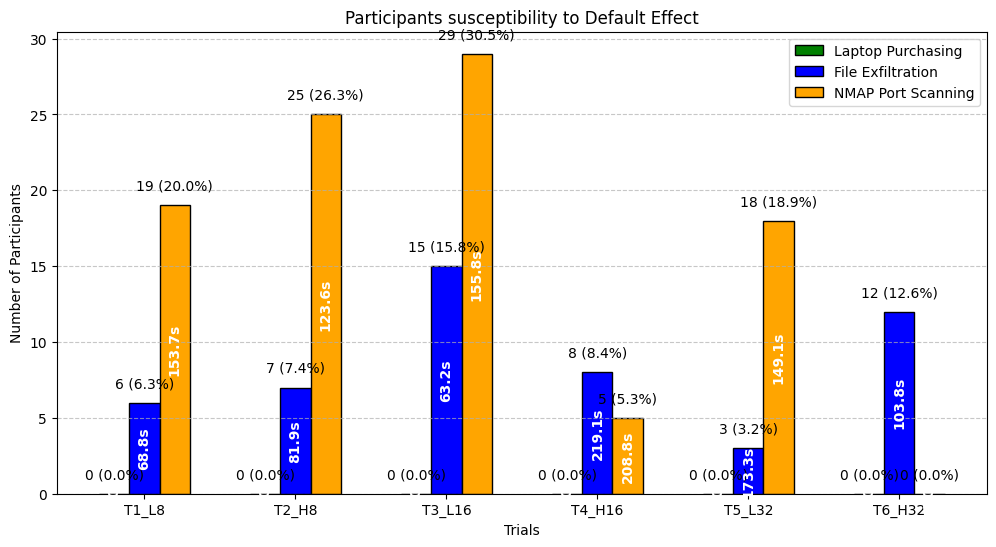

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
file_path = "/content/Choice_Overload.csv"
df = pd.read_csv(file_path)

# Define the relevant column patterns
file_exfiltration_columns = [f"ci_co_fl_{i}" for i in range(1, 7)]
laptop_purchasing_columns = [f"em_co_lp_{i}" for i in range(1, 7)]
nmap_columns = [f"ci_co_nmap_{i}" for i in range(1, 7)]

file_exfiltration_timers = [f"ci_co_fl_{i}_timer" for i in range(1, 7)]
laptop_purchasing_timers = [f"em_co_lp_{i}_timer" for i in range(1, 7)]
nmap_timers = [f"ci_co_nmap_{i}_timer" for i in range(1, 7)]

# Initialize counts and average time lists
file_exfiltration_counts, file_exfiltration_avg_time = [], []
laptop_purchasing_counts, laptop_purchasing_avg_time = [], []
nmap_counts, nmap_avg_time = [], []

total_participants = len(df)

# Compute counts and average time
for i, trial in enumerate(file_exfiltration_columns):
    first_option, last_option = list(file_exfiltration_position[f'Trial {i+1}'].keys())[0], list(file_exfiltration_position[f'Trial {i+1}'].keys())[-1]
    selections = df[trial].isin([first_option, last_option])
    count = selections.sum()
    avg_time = df.loc[selections, file_exfiltration_timers[i]].mean() if count > 0 else 0

    file_exfiltration_counts.append(count)
    file_exfiltration_avg_time.append(avg_time)

for i, trial in enumerate(laptop_purchasing_columns):
    first_option, last_option = list(laptop_purchasing_position[f'Trial {i+1}'].keys())[0], list(laptop_purchasing_position[f'Trial {i+1}'].keys())[-1]
    selections = df[trial].isin([first_option, last_option])
    count = selections.sum()
    avg_time = df.loc[selections, laptop_purchasing_timers[i]].mean() if count > 0 else 0

    laptop_purchasing_counts.append(count)
    laptop_purchasing_avg_time.append(avg_time)

for i, trial in enumerate(nmap_columns):
    first_option, last_option = list(nmap_position[f'Trial {i+1}'].keys())[0], list(nmap_position[f'Trial {i+1}'].keys())[-1]
    selections = df[trial].isin([first_option, last_option])
    count = selections.sum()
    avg_time = df.loc[selections, nmap_timers[i]].mean() if count > 0 else 0

    nmap_counts.append(count)
    nmap_avg_time.append(avg_time)

# Define the trial labels
trials = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']

# Set color scheme
task_colors = ['green', 'blue', 'orange']

# Set bar width
bar_width = 0.2
x = np.arange(len(trials))

# Plot the bar chart
fig, ax = plt.subplots(figsize=(12, 6))

bars1 = ax.bar(x - bar_width, laptop_purchasing_counts, width=bar_width, label="Laptop Purchasing", color=task_colors[0], edgecolor='black')
bars2 = ax.bar(x, file_exfiltration_counts, width=bar_width, label="File Exfiltration", color=task_colors[1], edgecolor='black')
bars3 = ax.bar(x + bar_width, nmap_counts, width=bar_width, label="NMAP Port Scanning", color=task_colors[2], edgecolor='black')

# Add labels on bars (count and percentage)
for bars, counts, avg_times in zip(
    [bars1, bars2, bars3],
    [laptop_purchasing_counts, file_exfiltration_counts, nmap_counts],
    [laptop_purchasing_avg_time, file_exfiltration_avg_time, nmap_avg_time]
):
    for bar, count, avg_time in zip(bars, counts, avg_times):
        percentage = (count / total_participants) * 100 if total_participants > 0 else 0
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1, f"{count} ({percentage:.1f}%)",
                ha='center', fontsize=10)

        # Add average time vertically
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f"{avg_time:.1f}s",
                ha='center', va='center', fontsize=10, color='white', fontweight='bold', rotation=90)

# Formatting the chart
ax.set_xlabel("Trials")
ax.set_ylabel("Number of Participants")
ax.set_title("Participants susceptibility to Default Effect")
ax.set_xticks(x)
ax.set_xticklabels(trials)
ax.legend()
ax.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()

## **First or last option for six trials**

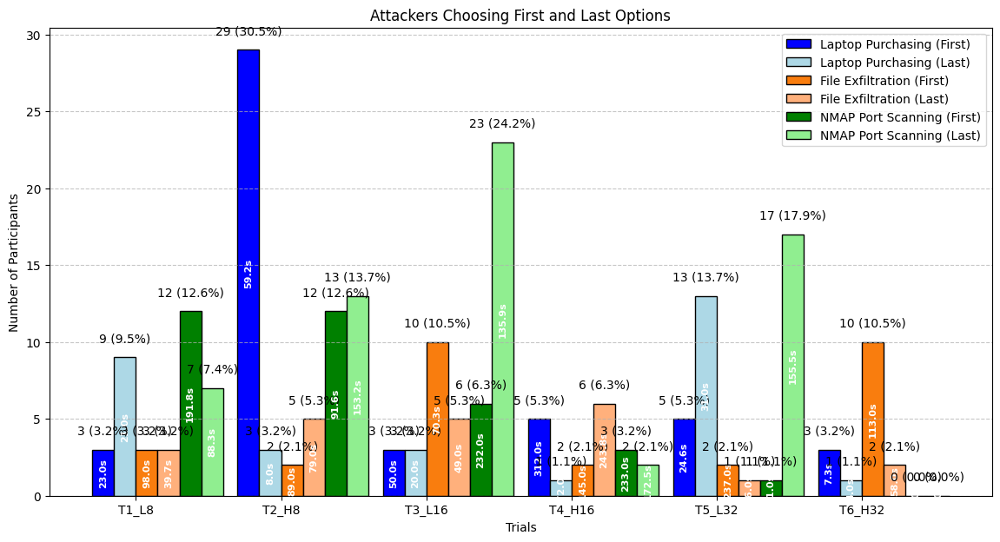

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
file_path = "/content/Choice_Overload.csv"
df = pd.read_csv(file_path)

# Define the relevant column patterns
file_exfiltration_columns = [f"ci_co_fl_{i}" for i in range(1, 7)]
laptop_purchasing_columns = [f"em_co_lp_{i}" for i in range(1, 7)]
nmap_columns = [f"ci_co_nmap_{i}" for i in range(1, 7)]

file_exfiltration_timers = [f"ci_co_fl_{i}_timer" for i in range(1, 7)]
laptop_purchasing_timers = [f"em_co_lp_{i}_timer" for i in range(1, 7)]
nmap_timers = [f"ci_co_nmap_{i}_timer" for i in range(1, 7)]

# Initialize counts and average time lists
file_first_counts, file_last_counts = [], []
file_first_avg_time, file_last_avg_time = [], []

laptop_first_counts, laptop_last_counts = [], []
laptop_first_avg_time, laptop_last_avg_time = [], []

nmap_first_counts, nmap_last_counts = [], []
nmap_first_avg_time, nmap_last_avg_time = [], []

total_participants = len(df)

# Compute counts and average time for first and last option separately
for i, trial in enumerate(file_exfiltration_columns):
    first_option = list(file_exfiltration_position[f'Trial {i+1}'].keys())[0]
    last_option = list(file_exfiltration_position[f'Trial {i+1}'].keys())[-1]

    first_selections = df[trial] == first_option
    last_selections = df[trial] == last_option

    first_count = first_selections.sum()
    last_count = last_selections.sum()

    first_avg_time = df.loc[first_selections, file_exfiltration_timers[i]].mean() if first_count > 0 else 0
    last_avg_time = df.loc[last_selections, file_exfiltration_timers[i]].mean() if last_count > 0 else 0

    file_first_counts.append(first_count)
    file_last_counts.append(last_count)
    file_first_avg_time.append(first_avg_time)
    file_last_avg_time.append(last_avg_time)

for i, trial in enumerate(laptop_purchasing_columns):
    first_option = list(laptop_purchasing_position[f'Trial {i+1}'].keys())[0]
    last_option = list(laptop_purchasing_position[f'Trial {i+1}'].keys())[-1]

    first_selections = df[trial] == first_option
    last_selections = df[trial] == last_option

    first_count = first_selections.sum()
    last_count = last_selections.sum()

    first_avg_time = df.loc[first_selections, laptop_purchasing_timers[i]].mean() if first_count > 0 else 0
    last_avg_time = df.loc[last_selections, laptop_purchasing_timers[i]].mean() if last_count > 0 else 0

    laptop_first_counts.append(first_count)
    laptop_last_counts.append(last_count)
    laptop_first_avg_time.append(first_avg_time)
    laptop_last_avg_time.append(last_avg_time)

for i, trial in enumerate(nmap_columns):
    first_option = list(nmap_position[f'Trial {i+1}'].keys())[0]
    last_option = list(nmap_position[f'Trial {i+1}'].keys())[-1]

    first_selections = df[trial] == first_option
    last_selections = df[trial] == last_option

    first_count = first_selections.sum()
    last_count = last_selections.sum()

    first_avg_time = df.loc[first_selections, nmap_timers[i]].mean() if first_count > 0 else 0
    last_avg_time = df.loc[last_selections, nmap_timers[i]].mean() if last_count > 0 else 0

    nmap_first_counts.append(first_count)
    nmap_last_counts.append(last_count)
    nmap_first_avg_time.append(first_avg_time)
    nmap_last_avg_time.append(last_avg_time)

# Define the trial labels
trials = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']

# Set color scheme
task_colors = ['blue', '#f97d0e', 'green']
task_colors_last = ['#add8e6', '#ffb07c', '#90ee90']  # Lighter shades for last options

# Set bar width
bar_width = 0.15
x = np.arange(len(trials))

# Plot the bar chart
fig, ax = plt.subplots(figsize=(14, 7))

bars1 = ax.bar(x - 1.5 * bar_width, laptop_first_counts, width=bar_width, label="Laptop Purchasing (First)", color=task_colors[0], edgecolor='black')
bars2 = ax.bar(x - 0.5 * bar_width, laptop_last_counts, width=bar_width, label="Laptop Purchasing (Last)", color=task_colors_last[0], edgecolor='black')

bars3 = ax.bar(x + 0.5 * bar_width, file_first_counts, width=bar_width, label="File Exfiltration (First)", color=task_colors[1], edgecolor='black')
bars4 = ax.bar(x + 1.5 * bar_width, file_last_counts, width=bar_width, label="File Exfiltration (Last)", color=task_colors_last[1], edgecolor='black')

bars5 = ax.bar(x + 2.5 * bar_width, nmap_first_counts, width=bar_width, label="NMAP Port Scanning (First)", color=task_colors[2], edgecolor='black')
bars6 = ax.bar(x + 3.5 * bar_width, nmap_last_counts, width=bar_width, label="NMAP Port Scanning (Last)", color=task_colors_last[2], edgecolor='black')

# Add labels on bars (count and percentage)
for bars, counts, avg_times in zip(
    [bars1, bars2, bars3, bars4, bars5, bars6],
    [laptop_first_counts, laptop_last_counts, file_first_counts, file_last_counts, nmap_first_counts, nmap_last_counts],
    [laptop_first_avg_time, laptop_last_avg_time, file_first_avg_time, file_last_avg_time, nmap_first_avg_time, nmap_last_avg_time]
):
    for bar, count, avg_time in zip(bars, counts, avg_times):
        percentage = (count / total_participants) * 100 if total_participants > 0 else 0
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1, f"{count} ({percentage:.1f}%)",
                ha='center', fontsize=10)

        # Add average time vertically
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f"{avg_time:.1f}s",
                ha='center', va='center', fontsize=8, color='white', fontweight='bold', rotation=90)

# Formatting the chart
ax.set_xlabel("Trials")
ax.set_ylabel("Number of Participants")
ax.set_title("Attackers Choosing First and Last Options")
ax.set_xticks(x)
ax.set_xticklabels(trials)
ax.legend()
ax.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()

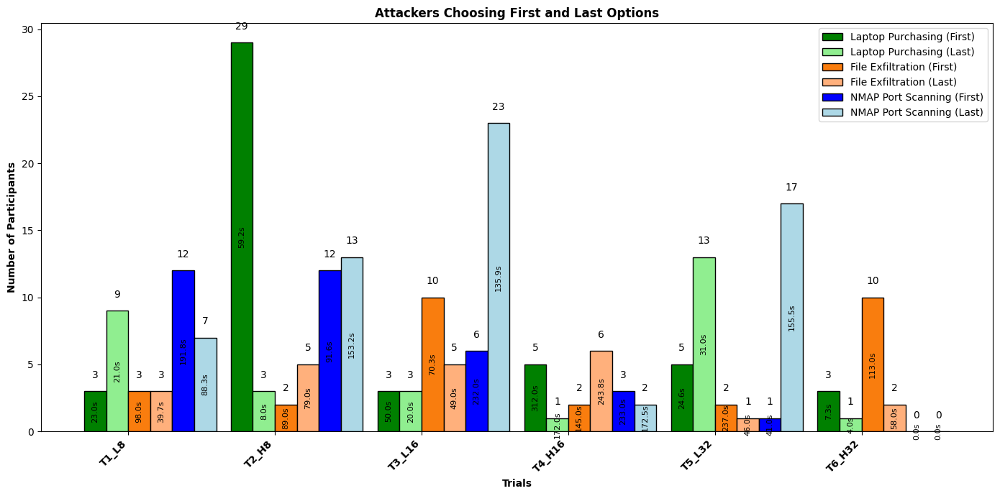

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
file_path = "/content/Choice_Overload.csv"
df = pd.read_csv(file_path)

# Define the relevant column patterns
file_exfiltration_columns = [f"ci_co_fl_{i}" for i in range(1, 7)]
laptop_purchasing_columns = [f"em_co_lp_{i}" for i in range(1, 7)]
nmap_columns = [f"ci_co_nmap_{i}" for i in range(1, 7)]

file_exfiltration_timers = [f"ci_co_fl_{i}_timer" for i in range(1, 7)]
laptop_purchasing_timers = [f"em_co_lp_{i}_timer" for i in range(1, 7)]
nmap_timers = [f"ci_co_nmap_{i}_timer" for i in range(1, 7)]

# Initialize counts and average time lists
file_first_counts, file_last_counts = [], []
file_first_avg_time, file_last_avg_time = [], []

laptop_first_counts, laptop_last_counts = [], []
laptop_first_avg_time, laptop_last_avg_time = [], []

nmap_first_counts, nmap_last_counts = [], []
nmap_first_avg_time, nmap_last_avg_time = [], []

total_participants = len(df)

# Compute counts and average time for first and last option separately
for i, trial in enumerate(file_exfiltration_columns):
    first_option = list(file_exfiltration_position[f'Trial {i+1}'].keys())[0]
    last_option = list(file_exfiltration_position[f'Trial {i+1}'].keys())[-1]

    first_selections = df[trial] == first_option
    last_selections = df[trial] == last_option

    first_count = first_selections.sum()
    last_count = last_selections.sum()

    first_avg_time = df.loc[first_selections, file_exfiltration_timers[i]].mean() if first_count > 0 else 0
    last_avg_time = df.loc[last_selections, file_exfiltration_timers[i]].mean() if last_count > 0 else 0

    file_first_counts.append(first_count)
    file_last_counts.append(last_count)
    file_first_avg_time.append(first_avg_time)
    file_last_avg_time.append(last_avg_time)

for i, trial in enumerate(laptop_purchasing_columns):
    first_option = list(laptop_purchasing_position[f'Trial {i+1}'].keys())[0]
    last_option = list(laptop_purchasing_position[f'Trial {i+1}'].keys())[-1]

    first_selections = df[trial] == first_option
    last_selections = df[trial] == last_option

    first_count = first_selections.sum()
    last_count = last_selections.sum()

    first_avg_time = df.loc[first_selections, laptop_purchasing_timers[i]].mean() if first_count > 0 else 0
    last_avg_time = df.loc[last_selections, laptop_purchasing_timers[i]].mean() if last_count > 0 else 0

    laptop_first_counts.append(first_count)
    laptop_last_counts.append(last_count)
    laptop_first_avg_time.append(first_avg_time)
    laptop_last_avg_time.append(last_avg_time)

for i, trial in enumerate(nmap_columns):
    first_option = list(nmap_position[f'Trial {i+1}'].keys())[0]
    last_option = list(nmap_position[f'Trial {i+1}'].keys())[-1]

    first_selections = df[trial] == first_option
    last_selections = df[trial] == last_option

    first_count = first_selections.sum()
    last_count = last_selections.sum()

    first_avg_time = df.loc[first_selections, nmap_timers[i]].mean() if first_count > 0 else 0
    last_avg_time = df.loc[last_selections, nmap_timers[i]].mean() if last_count > 0 else 0

    nmap_first_counts.append(first_count)
    nmap_last_counts.append(last_count)
    nmap_first_avg_time.append(first_avg_time)
    nmap_last_avg_time.append(last_avg_time)

# Define the trial labels
trials = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']

# Set color scheme (Laptop, File Exfiltration, and NMAP in order)
task_colors = ['green', '#f97d0e', 'blue']  # Laptop (green), File Exfiltration (orange), NMAP (blue)
task_colors_last = ['#90ee90', '#ffb07c', '#add8e6']  # Lighter shades for last options

# Set bar width
bar_width = 0.15
x = np.arange(len(trials))

# Plot the bar chart
fig, ax = plt.subplots(figsize=(14, 7))

# Create bars for Laptop, File Exfiltration, and NMAP
bars1 = ax.bar(x - 1.5 * bar_width, laptop_first_counts, width=bar_width, label="Laptop Purchasing (First)", color=task_colors[0], edgecolor='black')
bars2 = ax.bar(x - 0.5 * bar_width, laptop_last_counts, width=bar_width, label="Laptop Purchasing (Last)", color=task_colors_last[0], edgecolor='black')

bars3 = ax.bar(x + 0.5 * bar_width, file_first_counts, width=bar_width, label="File Exfiltration (First)", color=task_colors[1], edgecolor='black')
bars4 = ax.bar(x + 1.5 * bar_width, file_last_counts, width=bar_width, label="File Exfiltration (Last)", color=task_colors_last[1], edgecolor='black')

bars5 = ax.bar(x + 2.5 * bar_width, nmap_first_counts, width=bar_width, label="NMAP Port Scanning (First)", color=task_colors[2], edgecolor='black')
bars6 = ax.bar(x + 3.5 * bar_width, nmap_last_counts, width=bar_width, label="NMAP Port Scanning (Last)", color=task_colors_last[2], edgecolor='black')

# Add labels on bars (only average time) and participant numbers above bars
for bars, counts, avg_times in zip(
    [bars1, bars2, bars3, bars4, bars5, bars6],
    [laptop_first_counts, laptop_last_counts, file_first_counts, file_last_counts, nmap_first_counts, nmap_last_counts],
    [laptop_first_avg_time, laptop_last_avg_time, file_first_avg_time, file_last_avg_time, nmap_first_avg_time, nmap_last_avg_time]
):
    for bar, count, avg_time in zip(bars, counts, avg_times):
        # Display average time inside the bars
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f"{avg_time:.1f}s",
                ha='center', va='center', fontsize=8, color='black', rotation=90)

        # Display participant number above the bar
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1, f"{count}",
                ha='center', fontsize=10)

# Formatting the chart
ax.set_xlabel("Trials", fontweight='bold')
ax.set_ylabel("Number of Participants", fontweight='bold')
ax.set_title("Attackers Choosing First and Last Options", fontweight='bold')

# Modify x-axis labels to add (Low Information) and (High Information)
#modified_trials = [f"{trial} (Low Information)" if i % 2 == 0 else f"{trial} (High Information)" for i, trial in enumerate(trials)]
ax.set_xticks(x)
ax.set_xticklabels(trials, rotation=45, ha="right")  # Rotate x-axis labels to avoid overlap

# Make x-axis tick labels bold
for label in ax.get_xticklabels():
    label.set_fontweight('bold')

ax.legend()
#ax.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.tight_layout()  # Ensure everything fits properly
plt.show()

### **File (with Time)**

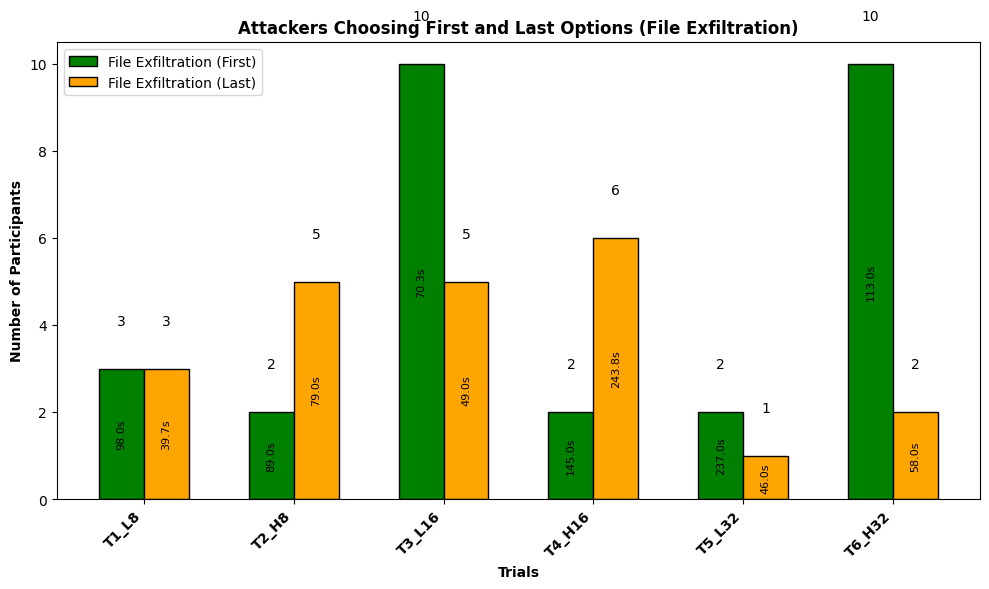

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
file_path = "/content/Choice_Overload.csv"
df = pd.read_csv(file_path)

# Define the relevant column patterns for File Exfiltration
file_exfiltration_columns = [f"ci_co_fl_{i}" for i in range(1, 7)]
file_exfiltration_timers = [f"ci_co_fl_{i}_timer" for i in range(1, 7)]

# Initialize counts and average time lists
file_first_counts, file_last_counts = [], []
file_first_avg_time, file_last_avg_time = [], []

total_participants = len(df)

# Compute counts and average time for first and last option separately
for i, trial in enumerate(file_exfiltration_columns):
    first_option = list(file_exfiltration_position[f'Trial {i+1}'].keys())[0]
    last_option = list(file_exfiltration_position[f'Trial {i+1}'].keys())[-1]

    first_selections = df[trial] == first_option
    last_selections = df[trial] == last_option

    first_count = first_selections.sum()
    last_count = last_selections.sum()

    first_avg_time = df.loc[first_selections, file_exfiltration_timers[i]].mean() if first_count > 0 else 0
    last_avg_time = df.loc[last_selections, file_exfiltration_timers[i]].mean() if last_count > 0 else 0

    file_first_counts.append(first_count)
    file_last_counts.append(last_count)
    file_first_avg_time.append(first_avg_time)
    file_last_avg_time.append(last_avg_time)

# Define the trial labels
trials = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']

# Set color scheme for File Exfiltration
color_first = 'green'
color_last = 'orange'

# Set bar width
bar_width = 0.3
x = np.arange(len(trials))

# Plot the bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# Create bars for File Exfiltration
bars1 = ax.bar(x - bar_width / 2, file_first_counts, width=bar_width, label="File Exfiltration (First)", color=color_first, edgecolor='black')
bars2 = ax.bar(x + bar_width / 2, file_last_counts, width=bar_width, label="File Exfiltration (Last)", color=color_last, edgecolor='black')

# Add labels on bars (average time inside, participant count above)
for bars, counts, avg_times in zip(
    [bars1, bars2],
    [file_first_counts, file_last_counts],
    [file_first_avg_time, file_last_avg_time]
):
    for bar, count, avg_time in zip(bars, counts, avg_times):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f"{avg_time:.1f}s",
                ha='center', va='center', fontsize=8, color='black', rotation=90)
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1, f"{count}",
                ha='center', fontsize=10)

# Formatting the chart
ax.set_xlabel("Trials", fontweight='bold')
ax.set_ylabel("Number of Participants", fontweight='bold')
ax.set_title("Attackers Choosing First and Last Options (File Exfiltration)", fontweight='bold')

# Modify x-axis labels to add information level
#modified_trials = [f"{trial} (Low Information)" if i % 2 == 0 else f"{trial} (High Information)" for i, trial in enumerate(trials)]
ax.set_xticks(x)
ax.set_xticklabels(trials, rotation=45, ha="right")

# Make x-axis tick labels bold
for label in ax.get_xticklabels():
    label.set_fontweight('bold')

ax.legend()
plt.tight_layout()
plt.show()

### **File (without Time)**

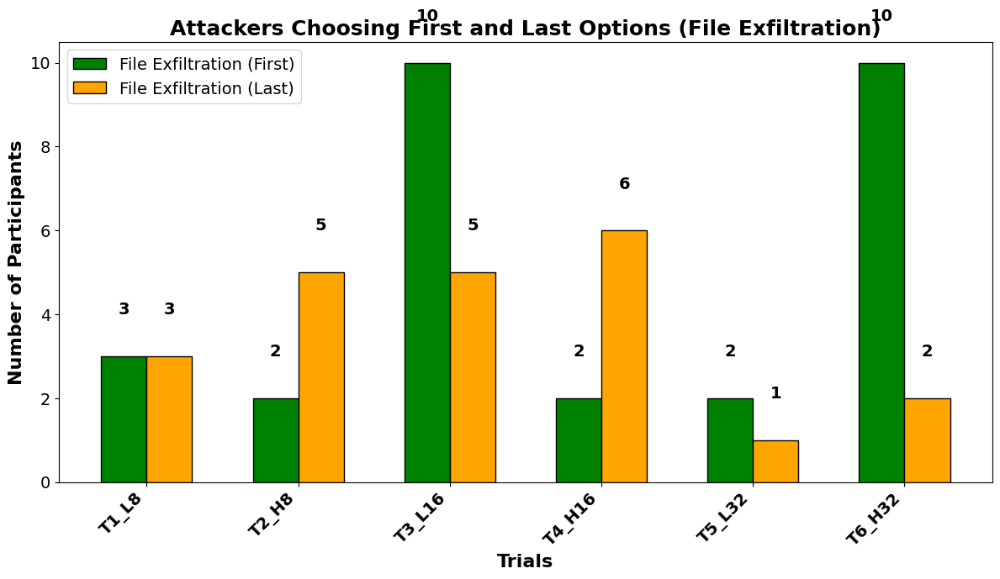

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
file_path = "/content/Choice_Overload.csv"
df = pd.read_csv(file_path)

# Define the relevant column patterns for File Exfiltration
file_exfiltration_columns = [f"ci_co_fl_{i}" for i in range(1, 7)]
file_exfiltration_timers = [f"ci_co_fl_{i}_timer" for i in range(1, 7)]

# Initialize counts and average time lists
file_first_counts, file_last_counts = [], []
file_first_avg_time, file_last_avg_time = [], []

total_participants = len(df)

# Compute counts and average time for first and last option separately
for i, trial in enumerate(file_exfiltration_columns):
    first_option = list(file_exfiltration_position[f'Trial {i+1}'].keys())[0]
    last_option = list(file_exfiltration_position[f'Trial {i+1}'].keys())[-1]

    first_selections = df[trial] == first_option
    last_selections = df[trial] == last_option

    first_count = first_selections.sum()
    last_count = last_selections.sum()

    first_avg_time = df.loc[first_selections, file_exfiltration_timers[i]].mean() if first_count > 0 else 0
    last_avg_time = df.loc[last_selections, file_exfiltration_timers[i]].mean() if last_count > 0 else 0

    file_first_counts.append(first_count)
    file_last_counts.append(last_count)
    file_first_avg_time.append(first_avg_time)
    file_last_avg_time.append(last_avg_time)

# Define the trial labels
trials = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']

# Set color scheme for File Exfiltration
color_first = 'green'
color_last = 'orange'

# Set bar width
bar_width = 0.3
x = np.arange(len(trials))

# Plot the bar chart
fig, ax = plt.subplots(figsize=(12, 7))  # Slightly larger figure for better readability

# Create bars for File Exfiltration
bars1 = ax.bar(x - bar_width / 2, file_first_counts, width=bar_width, label="File Exfiltration (First)", color=color_first, edgecolor='black')
bars2 = ax.bar(x + bar_width / 2, file_last_counts, width=bar_width, label="File Exfiltration (Last)", color=color_last, edgecolor='black')

# Add participant count above bars
for bars, counts in zip([bars1, bars2], [file_first_counts, file_last_counts]):
    for bar, count in zip(bars, counts):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1, f"{count}",
                ha='center', fontsize=14, fontweight='bold')

# Set font sizes and weights for labels and title
ax.set_xlabel("Trials", fontweight='bold', fontsize=16)
ax.set_ylabel("Number of Participants", fontweight='bold', fontsize=16)
ax.set_title("Attackers Choosing First and Last Options (File Exfiltration)", fontweight='bold', fontsize=18)

# Set tick positions and labels with larger font
ax.set_xticks(x)
ax.set_xticklabels(trials, rotation=45, ha="right", fontsize=14, fontweight='bold')
ax.tick_params(axis='y', labelsize=14)

# Set legend with larger font
ax.legend(fontsize=14)

plt.tight_layout()
plt.show()

#### **NMAP (with Time)**

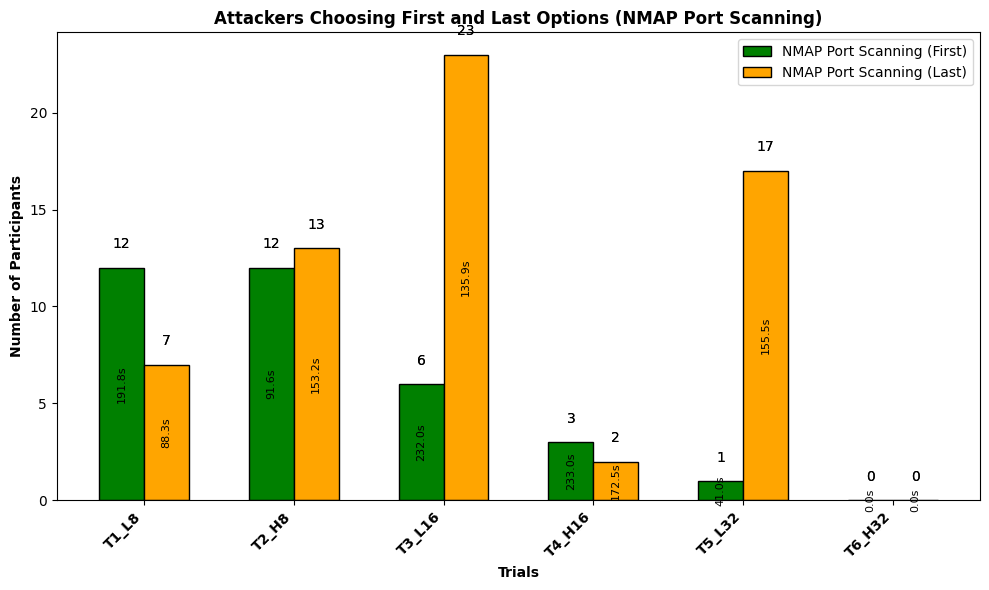

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
file_path = "/content/Choice_Overload.csv"
df = pd.read_csv(file_path)

# Define the relevant column patterns for NMAP
nmap_columns = [f"ci_co_nmap_{i}" for i in range(1, 7)]
nmap_timers = [f"ci_co_nmap_{i}_timer" for i in range(1, 7)]

# Initialize counts and average time lists for NMAP
nmap_first_counts, nmap_last_counts = [], []
nmap_first_avg_time, nmap_last_avg_time = [], []

total_participants = len(df)

# Compute counts and average time for first and last option separately
for i, trial in enumerate(nmap_columns):
    first_option = list(nmap_position[f'Trial {i+1}'].keys())[0]
    last_option = list(nmap_position[f'Trial {i+1}'].keys())[-1]

    first_selections = df[trial] == first_option
    last_selections = df[trial] == last_option

    first_count = first_selections.sum()
    last_count = last_selections.sum()

    first_avg_time = df.loc[first_selections, nmap_timers[i]].mean() if first_count > 0 else 0
    last_avg_time = df.loc[last_selections, nmap_timers[i]].mean() if last_count > 0 else 0

    nmap_first_counts.append(first_count)
    nmap_last_counts.append(last_count)
    nmap_first_avg_time.append(first_avg_time)
    nmap_last_avg_time.append(last_avg_time)

# Define the trial labels
trials = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']

# Set color scheme for NMAP
color_first = 'green'
color_last = 'orange'  # Light blue

# Set bar width
bar_width = 0.3
x = np.arange(len(trials))

# Plot the bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# Create bars for NMAP
bars1 = ax.bar(x - bar_width / 2, nmap_first_counts, width=bar_width, label="NMAP Port Scanning (First)", color=color_first, edgecolor='black')
bars2 = ax.bar(x + bar_width / 2, nmap_last_counts, width=bar_width, label="NMAP Port Scanning (Last)", color=color_last, edgecolor='black')

# Add labels on bars (participant count only)
for bars, counts in zip([bars1, bars2], [nmap_first_counts, nmap_last_counts]):
    for bar, count in zip(bars, counts):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1, f"{count}",
                ha='center', fontsize=10)

# Add labels on bars (average time inside, participant count above)
for bars, counts, avg_times in zip(
    [bars1, bars2],
    [nmap_first_counts, nmap_last_counts],
    [nmap_first_avg_time, nmap_last_avg_time]
):
    for bar, count, avg_time in zip(bars, counts, avg_times):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f"{avg_time:.1f}s",
                ha='center', va='center', fontsize=8, color='black', rotation=90)
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1, f"{count}",
                ha='center', fontsize=10)

# Formatting the chart
ax.set_xlabel("Trials", fontweight='bold')
ax.set_ylabel("Number of Participants", fontweight='bold')
ax.set_title("Attackers Choosing First and Last Options (NMAP Port Scanning)", fontweight='bold')

ax.set_xticks(x)
ax.set_xticklabels(trials, rotation=45, ha="right")

# Make x-axis tick labels bold
for label in ax.get_xticklabels():
    label.set_fontweight('bold')

ax.legend()
plt.tight_layout()
plt.show()

#### **NMAP (without time)**

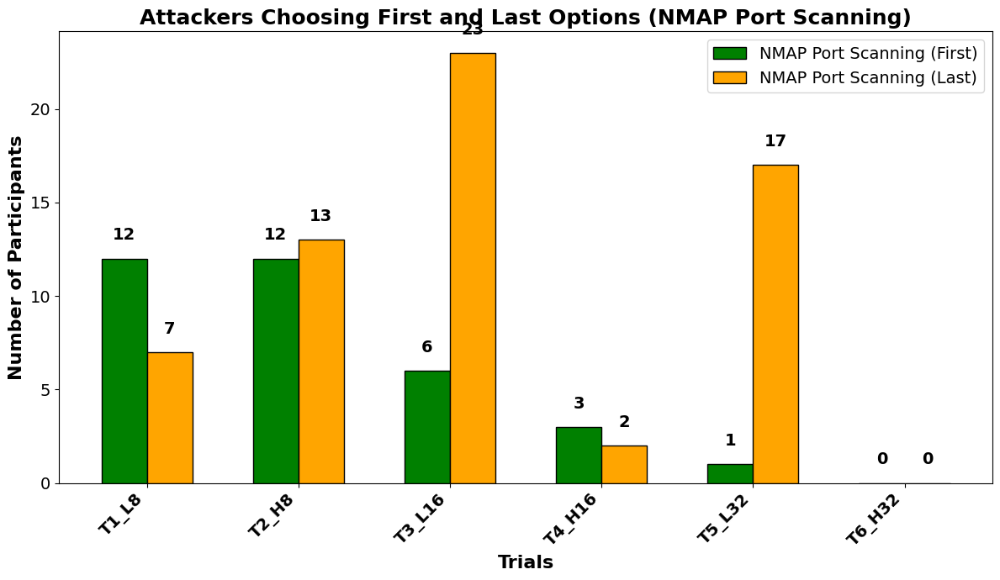

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
file_path = "/content/Choice_Overload.csv"
df = pd.read_csv(file_path)

# Define the relevant column patterns for NMAP
nmap_columns = [f"ci_co_nmap_{i}" for i in range(1, 7)]
nmap_timers = [f"ci_co_nmap_{i}_timer" for i in range(1, 7)]

# Initialize counts and average time lists for NMAP
nmap_first_counts, nmap_last_counts = [], []
nmap_first_avg_time, nmap_last_avg_time = [], []

total_participants = len(df)

# Compute counts and average time for first and last option separately
for i, trial in enumerate(nmap_columns):
    first_option = list(nmap_position[f'Trial {i+1}'].keys())[0]
    last_option = list(nmap_position[f'Trial {i+1}'].keys())[-1]

    first_selections = df[trial] == first_option
    last_selections = df[trial] == last_option

    first_count = first_selections.sum()
    last_count = last_selections.sum()

    first_avg_time = df.loc[first_selections, nmap_timers[i]].mean() if first_count > 0 else 0
    last_avg_time = df.loc[last_selections, nmap_timers[i]].mean() if last_count > 0 else 0

    nmap_first_counts.append(first_count)
    nmap_last_counts.append(last_count)
    nmap_first_avg_time.append(first_avg_time)
    nmap_last_avg_time.append(last_avg_time)

# Define the trial labels
trials = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']

# Set color scheme for NMAP
color_first = 'green'
color_last = 'orange'  # Light blue

# Set bar width
bar_width = 0.3
x = np.arange(len(trials))

# Plot the bar chart
fig, ax = plt.subplots(figsize=(12, 7))  # Larger figure for better spacing

# Create bars for NMAP
bars1 = ax.bar(x - bar_width / 2, nmap_first_counts, width=bar_width, label="NMAP Port Scanning (First)", color=color_first, edgecolor='black')
bars2 = ax.bar(x + bar_width / 2, nmap_last_counts, width=bar_width, label="NMAP Port Scanning (Last)", color=color_last, edgecolor='black')

# Add participant count labels above bars
for bars, counts in zip([bars1, bars2], [nmap_first_counts, nmap_last_counts]):
    for bar, count in zip(bars, counts):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1, f"{count}",
                ha='center', fontsize=14, fontweight='bold')

# Set font sizes and weights for axes and title
ax.set_xlabel("Trials", fontweight='bold', fontsize=16)
ax.set_ylabel("Number of Participants", fontweight='bold', fontsize=16)
ax.set_title("Attackers Choosing First and Last Options (NMAP Port Scanning)", fontweight='bold', fontsize=18)

# Configure x-axis labels
ax.set_xticks(x)
ax.set_xticklabels(trials, rotation=45, ha="right", fontsize=14, fontweight='bold')
ax.tick_params(axis='y', labelsize=14)

# Update legend font size
ax.legend(fontsize=14)

plt.tight_layout()
plt.show()

### **Laptop (with Time)**

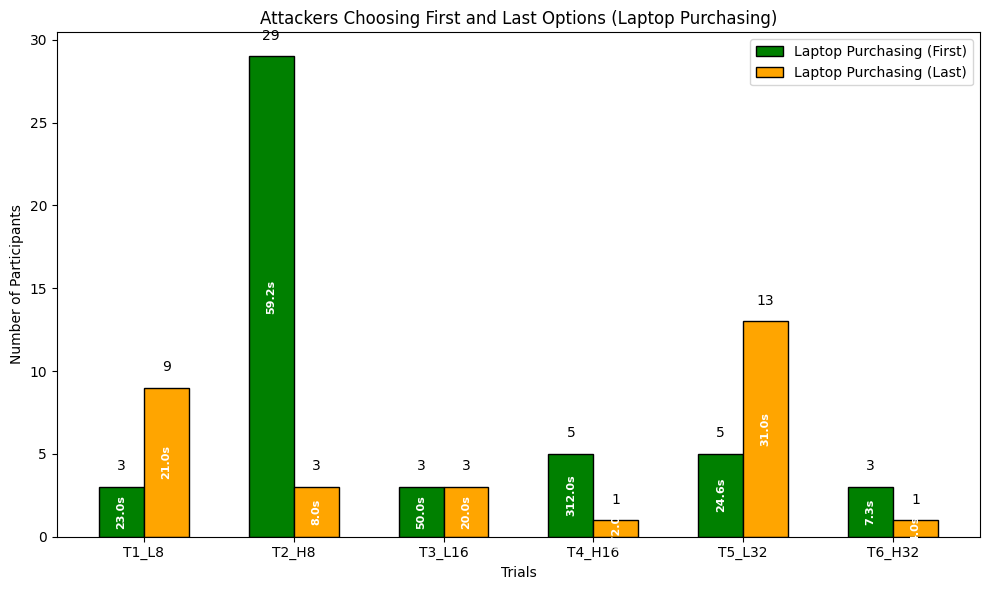

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
file_path = "/content/Choice_Overload.csv"
df = pd.read_csv(file_path)

# Define the relevant column patterns for Laptop Purchasing
laptop_purchasing_columns = [f"em_co_lp_{i}" for i in range(1, 7)]
laptop_purchasing_timers = [f"em_co_lp_{i}_timer" for i in range(1, 7)]

# Initialize counts and average time lists
laptop_first_counts, laptop_last_counts = [], []
laptop_first_avg_time, laptop_last_avg_time = [], []

total_participants = len(df)

# Compute counts and average time for first and last option separately
for i, trial in enumerate(laptop_purchasing_columns):
    first_option = list(laptop_purchasing_position[f'Trial {i+1}'].keys())[0]
    last_option = list(laptop_purchasing_position[f'Trial {i+1}'].keys())[-1]

    first_selections = df[trial] == first_option
    last_selections = df[trial] == last_option

    first_count = first_selections.sum()
    last_count = last_selections.sum()

    first_avg_time = df.loc[first_selections, laptop_purchasing_timers[i]].mean() if first_count > 0 else 0
    last_avg_time = df.loc[last_selections, laptop_purchasing_timers[i]].mean() if last_count > 0 else 0

    laptop_first_counts.append(first_count)
    laptop_last_counts.append(last_count)
    laptop_first_avg_time.append(first_avg_time)
    laptop_last_avg_time.append(last_avg_time)

# Define the trial labels
trials = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']

# Set color scheme for Laptop
color_first = 'green'
color_last = 'orange'  # Light blue

# Set bar width
bar_width = 0.3
x = np.arange(len(trials))

# Plot the bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# Create bars for Laptop Purchasing
bars1 = ax.bar(x - bar_width / 2, laptop_first_counts, width=bar_width, label="Laptop Purchasing (First)", color=color_first, edgecolor='black')
bars2 = ax.bar(x + bar_width / 2, laptop_last_counts, width=bar_width, label="Laptop Purchasing (Last)", color=color_last, edgecolor='black')

# Add only participant count above bars and avg time inside
for bars, counts, avg_times in zip(
    [bars1, bars2],
    [laptop_first_counts, laptop_last_counts],
    [laptop_first_avg_time, laptop_last_avg_time]
):
    for bar, count, avg_time in zip(bars, counts, avg_times):
        # Count above bar
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1, f"{count}",
                ha='center', fontsize=10)

        # Average time inside bar
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f"{avg_time:.1f}s",
                ha='center', va='center', fontsize=8, color='white', fontweight='bold', rotation=90)

# Formatting
ax.set_xlabel("Trials")
ax.set_ylabel("Number of Participants")
ax.set_title("Attackers Choosing First and Last Options (Laptop Purchasing)")
ax.set_xticks(x)
ax.set_xticklabels(trials)
ax.legend()
#ax.grid(axis="y", linestyle="--", alpha=0.7)

plt.tight_layout()
plt.show()

**Laptop (without time)**

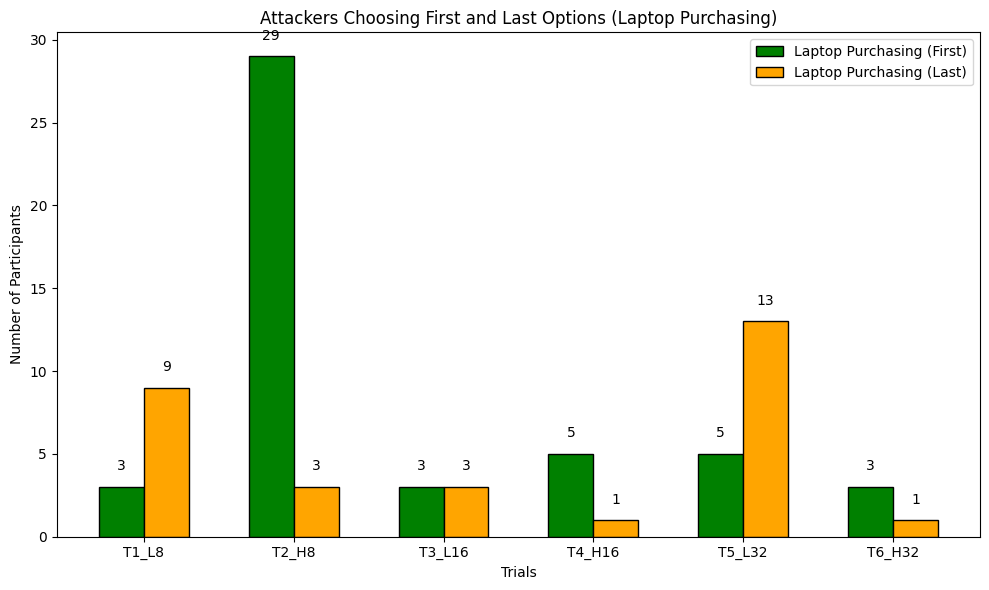

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
file_path = "/content/Choice_Overload.csv"
df = pd.read_csv(file_path)

# Define the relevant column patterns for Laptop Purchasing
laptop_purchasing_columns = [f"em_co_lp_{i}" for i in range(1, 7)]
laptop_purchasing_timers = [f"em_co_lp_{i}_timer" for i in range(1, 7)]

# Initialize counts lists
laptop_first_counts, laptop_last_counts = [], []

total_participants = len(df)

# Compute counts for first and last option
for i, trial in enumerate(laptop_purchasing_columns):
    first_option = list(laptop_purchasing_position[f'Trial {i+1}'].keys())[0]
    last_option = list(laptop_purchasing_position[f'Trial {i+1}'].keys())[-1]

    first_selections = df[trial] == first_option
    last_selections = df[trial] == last_option

    first_count = first_selections.sum()
    last_count = last_selections.sum()

    laptop_first_counts.append(first_count)
    laptop_last_counts.append(last_count)

# Define the trial labels
trials = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']

# Set color scheme for Laptop
color_first = 'green'
color_last = 'orange'

# Set bar width
bar_width = 0.3
x = np.arange(len(trials))

# Plot the bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# Create bars for Laptop Purchasing
bars1 = ax.bar(x - bar_width / 2, laptop_first_counts, width=bar_width, label="Laptop Purchasing (First)", color=color_first, edgecolor='black')
bars2 = ax.bar(x + bar_width / 2, laptop_last_counts, width=bar_width, label="Laptop Purchasing (Last)", color=color_last, edgecolor='black')

# Add only participant count above bars
for bars, counts in zip([bars1, bars2], [laptop_first_counts, laptop_last_counts]):
    for bar, count in zip(bars, counts):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1, f"{count}",
                ha='center', fontsize=10)

# Formatting
ax.set_xlabel("Trials")
ax.set_ylabel("Number of Participants")
ax.set_title("Attackers Choosing First and Last Options (Laptop Purchasing)")
ax.set_xticks(x)
ax.set_xticklabels(trials)
ax.legend()
#ax.grid(axis="y", linestyle="--", alpha=0.7)

plt.tight_layout()
plt.show()

##**Most Preferred position for all examples**

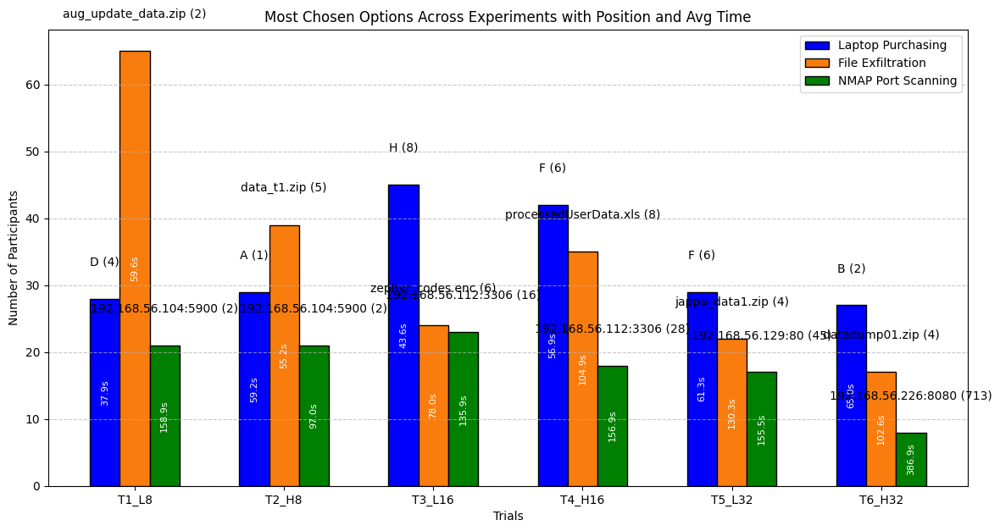

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
file_path = "/content/Choice_Overload.csv"
df = pd.read_csv(file_path)

# Define the relevant column patterns
file_exfiltration_columns = [f"ci_co_fl_{i}" for i in range(1, 7)]
laptop_purchasing_columns = [f"em_co_lp_{i}" for i in range(1, 7)]
nmap_columns = [f"ci_co_nmap_{i}" for i in range(1, 7)]

file_exfiltration_timers = [f"ci_co_fl_{i}_timer" for i in range(1, 7)]
laptop_purchasing_timers = [f"em_co_lp_{i}_timer" for i in range(1, 7)]
nmap_timers = [f"ci_co_nmap_{i}_timer" for i in range(1, 7)]

# Initialize lists to store counts, average time, chosen positions, and options
file_exfiltration_counts, file_exfiltration_avg_time, file_exfiltration_choices = [], [], []
laptop_purchasing_counts, laptop_purchasing_avg_time, laptop_purchasing_choices = [], [], []
nmap_counts, nmap_avg_time, nmap_choices = [], [], []

total_participants = len(df)

# Function to find the most chosen position and corresponding option
def find_most_chosen_position(trial_column, position_dict, trial_number):
    if trial_column not in df:
        return None, None

    option_counts = df[trial_column].value_counts()
    if option_counts.empty:
        return None, None

    most_chosen_option = option_counts.idxmax()  # Most frequently chosen option
    most_chosen_position = position_dict[f'Trial {trial_number}'].get(most_chosen_option, None)

    return most_chosen_option, most_chosen_position

# Compute counts, average time, and positions for each trial
for i, trial in enumerate(file_exfiltration_columns):
    chosen_option, chosen_position = find_most_chosen_position(trial, file_exfiltration_position, i+1)
    count = df[trial].value_counts().max() if chosen_option else 0
    avg_time = df.loc[df[trial] == chosen_option, file_exfiltration_timers[i]].mean() if count > 0 else 0

    file_exfiltration_counts.append(count)
    file_exfiltration_avg_time.append(avg_time)
    file_exfiltration_choices.append(f"{chosen_option} ({chosen_position})" if chosen_option else "N/A")

for i, trial in enumerate(laptop_purchasing_columns):
    chosen_option, chosen_position = find_most_chosen_position(trial, laptop_purchasing_position, i+1)
    count = df[trial].value_counts().max() if chosen_option else 0
    avg_time = df.loc[df[trial] == chosen_option, laptop_purchasing_timers[i]].mean() if count > 0 else 0

    laptop_purchasing_counts.append(count)
    laptop_purchasing_avg_time.append(avg_time)
    laptop_purchasing_choices.append(f"{chosen_option} ({chosen_position})" if chosen_option else "N/A")

for i, trial in enumerate(nmap_columns):
    chosen_option, chosen_position = find_most_chosen_position(trial, nmap_position, i+1)
    count = df[trial].value_counts().max() if chosen_option else 0
    avg_time = df.loc[df[trial] == chosen_option, nmap_timers[i]].mean() if count > 0 else 0

    nmap_counts.append(count)
    nmap_avg_time.append(avg_time)
    nmap_choices.append(f"{chosen_option} ({chosen_position})" if chosen_option else "N/A")

# Define the trial labels
trials = ['T1_L8', 'T2_H8', 'T3_L16', 'T4_H16', 'T5_L32', 'T6_H32']

# Set color scheme
task_colors = ['blue', '#f97d0e', 'green']

# Set bar width
bar_width = 0.2
x = np.arange(len(trials))

# Plot the bar chart
fig, ax = plt.subplots(figsize=(14, 7))

bars1 = ax.bar(x - bar_width, laptop_purchasing_counts, width=bar_width, label="Laptop Purchasing", color=task_colors[0], edgecolor='black')
bars2 = ax.bar(x, file_exfiltration_counts, width=bar_width, label="File Exfiltration", color=task_colors[1], edgecolor='black')
bars3 = ax.bar(x + bar_width, nmap_counts, width=bar_width, label="NMAP Port Scanning", color=task_colors[2], edgecolor='black')

# Adjust label positioning to avoid overlap
label_offset = 5  # Distance above the bar

# Add labels on bars (option name & position, average time)
for bars, avg_times, choices in zip(
    [bars1, bars2, bars3],
    [laptop_purchasing_avg_time, file_exfiltration_avg_time, nmap_avg_time],
    [laptop_purchasing_choices, file_exfiltration_choices, nmap_choices]
):
    for bar, avg_time, choice in zip(bars, avg_times, choices):
        # Display chosen option and position (without bold)
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + label_offset, f"{choice}",
                ha='center', fontsize=10)

        # Display average time vertically inside the bar
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f"{avg_time:.1f}s",
                ha='center', va='center', fontsize=8, color='white', rotation=90)

# Formatting the chart
ax.set_xlabel("Trials")
ax.set_ylabel("Number of Participants")
ax.set_title("Most Chosen Options Across Experiments with Position and Avg Time")
ax.set_xticks(x)
ax.set_xticklabels(trials)
ax.legend()
ax.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()

In [ ]:
!jupyter[[]] nbconvert --to html /content/IARPA_CO_1A.ipynb --output IARPA_CO_1A.html && open IARPA_CO_1A.html

[NbConvertApp] Converting notebook /content/IARPA_CO_1A.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 79 image(s).
[NbConvertApp] Writing 15339925 bytes to /content/IARPA_CO_1A.html
Couldn't find a suitable web browser!

Set the BROWSER environment variable to your desired browser.

/usr/bin/open: 882: www-browser: not found
/usr/bin/open: 882: links2: not found
/usr/bin/open: 882: elinks: not found
/usr/bin/open: 882: links: not found
/usr/bin/open: 882: lynx: not found
/usr/bin/open: 882: w3m: not found
xdg-open: no method available for opening 'IARPA_CO_1A.html'
